## Bidirectional LSTM model na predikciu hodnot DST o 6 hodin dopredu na zaklade 12-hodinoveho vstupneho okna z atributu DST

Subor: prediction_DST+6_12H.ipynb

Program: Hospodarska informatika

Vypracovala: Bc. Terezia Drengubiakova

Diplomova praca: Metody strojoveho ucenia pre vcasnu predikciu geomagnetickych burok

Veduci diplomovej prace: doc. Ing. Peter Butka, PhD.

Konzultanti: Ing. Viera Kresnakova, PhD., RNDr. Simon Mackovjak, PhD.

### Import knižníc

In [1]:
import pandas as pd
import numpy as np
import os
from tensorflow import keras
import matplotlib.pyplot as plt
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()

from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator
from keras.models import Model
from keras.layers import Dense, Input, LSTM, Flatten, TimeDistributed, Bidirectional
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, WhiteKernel, ConstantKernel as C
from sklearn.metrics import confusion_matrix, classification_report, matthews_corrcoef, mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler

2026-04-26 17:39:38.929781: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


### Načítanie dát, odstránenie na hodnôt, určenie predikovaného atribútu

In [2]:
# dĺžka vstupného okna a predikovaný čas
shift = 6
y_col = f"DST+{shift}"

n_input = 12
atr_count = 1

In [3]:
file_path = "../../../0_datasety/test_omni.csv"
file_path2 = "../../../0_datasety/train_omni.csv"

train = pd.read_csv(file_path2)
test = pd.read_csv(file_path)

In [4]:
features = ['time1', 'DST', y_col]
test = test[features]
train = train[features]
train['time1']=pd.to_datetime(train['time1'])
test['time1']=pd.to_datetime(test['time1'])


valid_size = int(len(train) * 0.2)
valid = train.iloc[-valid_size:,:].copy()
train = train.iloc[:-valid_size,:].copy()

y_train_raw = train[y_col].values.copy()
X_train_raw = train['DST'].values.copy()
y_val_raw = valid[y_col].values.copy()
X_val_raw = valid['DST'].values.copy()
y_test_raw = test[y_col].values.copy()
X_test_raw = test['DST'].values.copy()

x_scaler = StandardScaler()
y_scaler = StandardScaler()

X_train = x_scaler.fit_transform(np.asarray(X_train_raw, dtype=np.float32).reshape(len(X_train_raw), -1))
X_val = x_scaler.transform(np.asarray(X_val_raw, dtype=np.float32).reshape(len(X_val_raw), -1))
X_test = x_scaler.transform(np.asarray(X_test_raw, dtype=np.float32).reshape(len(X_test_raw), -1))

y_train = y_scaler.fit_transform(np.asarray(y_train_raw, dtype=np.float32).reshape(-1, 1)).reshape(-1)
y_val = y_scaler.transform(np.asarray(y_val_raw, dtype=np.float32).reshape(-1, 1)).reshape(-1)
y_test = y_scaler.transform(np.asarray(y_test_raw, dtype=np.float32).reshape(-1, 1)).reshape(-1)

target_scale = float(y_scaler.scale_[0])

def inverse_target(values):
    values = np.asarray(values, dtype=np.float32)
    return y_scaler.inverse_transform(values.reshape(-1, 1)).reshape(values.shape)

### Definícia premenných a vytvorenie dátových generátorov

In [5]:
b_size = 256  

train_generator = TimeseriesGenerator(X_train, y_train, length=n_input, batch_size=b_size)
val_generator = TimeseriesGenerator(X_val, y_val, length=n_input, batch_size=b_size)
test_generator = TimeseriesGenerator(X_test, y_test, length=n_input, batch_size=256)

In [6]:
print("Počet batchov: ", len(train_generator))
print("Každý batch má features (X zložku) a labels (y zložku): ", len(train_generator[0]))
print("Dĺžka X zložky batchu: ", len(train_generator[0][0]))
print("Dĺžka y zložky batchu (počet meraní v batchi): ",len(train_generator[0][1]))
print("Počet riadkov braných do úvahy pre jedno meranie (koľko sa pozerá dozadu): ", len(train_generator[0][0][0]))

Počet batchov:  896
Každý batch má features (X zložku) a labels (y zložku):  2
Dĺžka X zložky batchu:  256
Dĺžka y zložky batchu (počet meraní v batchi):  256
Počet riadkov braných do úvahy pre jedno meranie (koľko sa pozerá dozadu):  12


### Vytvorenie modelu

In [7]:
inputs = Input(shape=(n_input,atr_count))
c = Bidirectional(LSTM(128, return_sequences=True, dropout=0.1,recurrent_dropout=0.1))(inputs)
c = LSTM(128, return_sequences=True)(c)
c = TimeDistributed(Dense(1, activation='linear'))(c)
output = Flatten()(c)
output = Dense(1, activation='linear')(output)
model = Model(inputs=inputs, outputs=output)
model.compile(loss='mse', optimizer='adam', metrics=["mae"])
print(model.summary())

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 12, 1)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ bidirectional (Bidirectional)        │ (None, 12, 256)             │         133,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_1 (LSTM)                        │ (None, 12, 128)             │         197,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed (TimeDistributed)   │ (None, 12, 1)               │             129 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 12)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │              13 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 330,382 (1.26 MB)

 Trainable params: 330,382 (1.26 MB)

 Non-trainable params: 0 (0.00 B)

None


In [8]:
os.makedirs("models", exist_ok=True)
model_path = os.path.join("models", f'{y_col}_{n_input}H.keras')
checkpoint = ModelCheckpoint(model_path, monitor='val_mae', verbose=1, save_best_only=True, mode='min')
early = EarlyStopping(monitor="val_mae", mode="min", patience=25)
callbacks_list = [checkpoint, early]

### Trénovanie

In [9]:
#uncomment to train new model
history = model.fit(train_generator, validation_data=val_generator, epochs=200, verbose=1, callbacks = callbacks_list)

Epoch 1/200


/opt/conda/lib/python3.12/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:13:11 5s/step - loss: 2.2154 - mae: 0.9804

  2/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 4.3593 - mae: 1.1893  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 56s 63ms/step - loss: 4.3710 - mae: 1.1429

  4/896 ━━━━━━━━━━━━━━━━━━━━ 56s 63ms/step - loss: 4.1619 - mae: 1.1067

  5/896 ━━━━━━━━━━━━━━━━━━━━ 54s 61ms/step - loss: 3.9056 - mae: 1.0617

  6/896 ━━━━━━━━━━━━━━━━━━━━ 54s 61ms/step - loss: 3.6650 - mae: 1.0201

  7/896 ━━━━━━━━━━━━━━━━━━━━ 55s 62ms/step - loss: 3.4481 - mae: 0.9814

  8/896 ━━━━━━━━━━━━━━━━━━━━ 55s 63ms/step - loss: 3.2553 - mae: 0.9463

  9/896 ━━━━━━━━━━━━━━━━━━━━ 57s 64ms/step - loss: 3.0864 - mae: 0.9160

 10/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 2.9442 - mae: 0.8925

 11/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 2.8180 - mae: 0.8716

 12/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 2.7038 - mae: 0.8523

 13/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 2.6008 - mae: 0.8350

 14/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 2.5092 - mae: 0.8200

 15/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 2.4250 - mae: 0.8060

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 2.3470 - mae: 0.7925

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 2.2752 - mae: 0.7799

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 2.2097 - mae: 0.7688

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 2.1485 - mae: 0.7580

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 2.0918 - mae: 0.7480

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 2.0395 - mae: 0.7388

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 1.9903 - mae: 0.7299

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 1.9442 - mae: 0.7216

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 1.9007 - mae: 0.7137

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 1.8596 - mae: 0.7062

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 1.8239 - mae: 0.6995

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 1.7899 - mae: 0.6930

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 1.7583 - mae: 0.6872

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 1.7280 - mae: 0.6815

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 1.6989 - mae: 0.6761

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 1.6726 - mae: 0.6713

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 1.6471 - mae: 0.6666

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 1.6225 - mae: 0.6619

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 1.5989 - mae: 0.6575

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 1.5763 - mae: 0.6533

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 1.5544 - mae: 0.6492

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 1.5336 - mae: 0.6453

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 1.5134 - mae: 0.6414

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 1.4938 - mae: 0.6377

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 1.4749 - mae: 0.6340

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 1.4566 - mae: 0.6304

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 1.4392 - mae: 0.6270

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 1.4224 - mae: 0.6238

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 1.4061 - mae: 0.6206

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 1.3905 - mae: 0.6176

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 1.3756 - mae: 0.6148

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 1.3611 - mae: 0.6121

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 1.3471 - mae: 0.6094

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 1.3336 - mae: 0.6069

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 1.3204 - mae: 0.6045

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 1.3077 - mae: 0.6021

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 1.2952 - mae: 0.5998

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 1.2831 - mae: 0.5975

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 1.2713 - mae: 0.5953

 55/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 1.2597 - mae: 0.5930 

 56/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 1.2484 - mae: 0.5909

 57/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 1.2374 - mae: 0.5887

 58/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 1.2269 - mae: 0.5866

 59/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 1.2167 - mae: 0.5846

 60/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 1.2066 - mae: 0.5826

 61/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 1.1969 - mae: 0.5806

 62/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 1.1873 - mae: 0.5787

 63/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 1.1780 - mae: 0.5768

 64/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 1.1689 - mae: 0.5750

 65/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 1.1600 - mae: 0.5731

 66/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 1.1513 - mae: 0.5714

 67/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 1.1427 - mae: 0.5696

 68/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 1.1343 - mae: 0.5678

 69/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 1.1261 - mae: 0.5661

 70/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 1.1180 - mae: 0.5643

 71/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 1.1101 - mae: 0.5626

 72/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 1.1023 - mae: 0.5610

 73/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 1.0948 - mae: 0.5594

 74/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 1.0874 - mae: 0.5578

 75/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 1.0804 - mae: 0.5564

 76/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 1.0741 - mae: 0.5550

 77/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 1.0679 - mae: 0.5537

 78/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 1.0618 - mae: 0.5524

 79/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 1.0563 - mae: 0.5513

 80/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 1.0510 - mae: 0.5502

 81/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 1.0458 - mae: 0.5492

 82/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 1.0407 - mae: 0.5481

 83/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 1.0356 - mae: 0.5471

 84/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 1.0307 - mae: 0.5461

 85/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 1.0258 - mae: 0.5451

 86/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 1.0210 - mae: 0.5442

 87/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 1.0163 - mae: 0.5432

 88/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 1.0116 - mae: 0.5423

 89/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 1.0070 - mae: 0.5413

 90/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 1.0025 - mae: 0.5404

 91/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.9981 - mae: 0.5395

 92/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.9937 - mae: 0.5386

 93/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.9895 - mae: 0.5378

 94/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.9852 - mae: 0.5369

 95/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.9811 - mae: 0.5361

 96/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.9770 - mae: 0.5352

 97/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.9730 - mae: 0.5344

 98/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.9690 - mae: 0.5336

 99/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.9650 - mae: 0.5328

100/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.9611 - mae: 0.5319

101/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.9572 - mae: 0.5311

102/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.9534 - mae: 0.5303

103/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.9497 - mae: 0.5296

104/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.9461 - mae: 0.5288

105/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.9425 - mae: 0.5281

106/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.9389 - mae: 0.5274

107/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.9354 - mae: 0.5266

108/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.9319 - mae: 0.5259

109/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.9285 - mae: 0.5252

110/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.9252 - mae: 0.5246

111/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.9219 - mae: 0.5239

112/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.9187 - mae: 0.5232

113/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.9155 - mae: 0.5226

114/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.9124 - mae: 0.5220

115/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.9093 - mae: 0.5214

116/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.9063 - mae: 0.5208

117/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.9033 - mae: 0.5202

118/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.9003 - mae: 0.5196

119/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.8974 - mae: 0.5190

120/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.8945 - mae: 0.5184

121/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.8917 - mae: 0.5179

122/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.8888 - mae: 0.5173

123/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.8860 - mae: 0.5167

124/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.8832 - mae: 0.5162

125/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.8805 - mae: 0.5156

126/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.8778 - mae: 0.5151

127/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.8751 - mae: 0.5145

128/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.8724 - mae: 0.5140

129/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.8698 - mae: 0.5135

130/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.8672 - mae: 0.5129

131/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.8645 - mae: 0.5124

132/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.8620 - mae: 0.5119

133/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.8594 - mae: 0.5113

134/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.8569 - mae: 0.5108

135/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.8545 - mae: 0.5103

136/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.8520 - mae: 0.5098

137/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.8496 - mae: 0.5093

138/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.8472 - mae: 0.5088

139/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.8449 - mae: 0.5083

140/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.8425 - mae: 0.5078

141/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.8402 - mae: 0.5073

142/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.8379 - mae: 0.5069

143/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.8356 - mae: 0.5064

144/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.8333 - mae: 0.5059

145/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.8311 - mae: 0.5054

146/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.8289 - mae: 0.5050

147/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.8267 - mae: 0.5045

148/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.8246 - mae: 0.5041

149/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.8224 - mae: 0.5036

150/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.8203 - mae: 0.5032

151/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.8182 - mae: 0.5027

152/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.8161 - mae: 0.5023

153/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.8142 - mae: 0.5018

154/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.8123 - mae: 0.5014

155/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.8104 - mae: 0.5011

156/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.8086 - mae: 0.5007

157/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.8069 - mae: 0.5003

158/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.8052 - mae: 0.4999

159/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.8036 - mae: 0.4996

160/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.8019 - mae: 0.4993

161/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.8003 - mae: 0.4989

162/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.7988 - mae: 0.4986

163/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.7972 - mae: 0.4983

164/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.7957 - mae: 0.4980

165/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.7941 - mae: 0.4976

166/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.7926 - mae: 0.4973

167/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.7911 - mae: 0.4970

168/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.7896 - mae: 0.4967

169/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.7881 - mae: 0.4964

170/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.7867 - mae: 0.4961

171/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.7852 - mae: 0.4958

172/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.7837 - mae: 0.4955

173/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.7823 - mae: 0.4953

174/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.7809 - mae: 0.4950

175/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.7795 - mae: 0.4947

176/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.7782 - mae: 0.4945

177/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.7770 - mae: 0.4942

178/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.7757 - mae: 0.4940

179/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.7745 - mae: 0.4938

180/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.7733 - mae: 0.4935

181/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.7720 - mae: 0.4933

182/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.7708 - mae: 0.4931

183/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.7696 - mae: 0.4928

184/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.7684 - mae: 0.4926

185/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.7671 - mae: 0.4924

186/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.7659 - mae: 0.4921

187/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.7647 - mae: 0.4919

188/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.7636 - mae: 0.4917

189/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.7624 - mae: 0.4914

190/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.7612 - mae: 0.4912

191/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.7600 - mae: 0.4910

192/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.7588 - mae: 0.4907

193/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.7577 - mae: 0.4905

194/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.7565 - mae: 0.4903

195/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.7554 - mae: 0.4901

196/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.7542 - mae: 0.4899

197/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.7531 - mae: 0.4896

198/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.7520 - mae: 0.4894

199/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.7509 - mae: 0.4892

200/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.7498 - mae: 0.4890

201/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.7487 - mae: 0.4888

202/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.7476 - mae: 0.4886

203/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.7465 - mae: 0.4884

204/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.7455 - mae: 0.4882

205/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.7444 - mae: 0.4880

206/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.7433 - mae: 0.4878

207/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.7423 - mae: 0.4876

208/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.7413 - mae: 0.4874

209/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.7403 - mae: 0.4872

210/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.7393 - mae: 0.4870

211/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.7383 - mae: 0.4868

212/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.7373 - mae: 0.4867

213/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.7363 - mae: 0.4865

214/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.7353 - mae: 0.4863

215/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.7343 - mae: 0.4861

216/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.7333 - mae: 0.4859

217/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.7323 - mae: 0.4857

218/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.7314 - mae: 0.4856

219/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.7304 - mae: 0.4854

220/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.7294 - mae: 0.4852

221/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.7285 - mae: 0.4850

222/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.7275 - mae: 0.4848

223/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.7265 - mae: 0.4847

224/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.7256 - mae: 0.4845

225/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.7246 - mae: 0.4843

226/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.7237 - mae: 0.4841

227/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.7227 - mae: 0.4839

228/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.7218 - mae: 0.4837

229/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.7208 - mae: 0.4836

230/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.7199 - mae: 0.4834

231/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.7190 - mae: 0.4832

232/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.7180 - mae: 0.4830

233/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.7171 - mae: 0.4828

234/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.7162 - mae: 0.4826

235/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.7153 - mae: 0.4825

236/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.7144 - mae: 0.4823

237/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.7135 - mae: 0.4821

238/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.7126 - mae: 0.4819

239/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.7117 - mae: 0.4817

240/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.7108 - mae: 0.4816

241/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.7099 - mae: 0.4814

242/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.7090 - mae: 0.4812

243/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.7081 - mae: 0.4810

244/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.7073 - mae: 0.4809

245/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.7064 - mae: 0.4807

246/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.7055 - mae: 0.4805

247/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.7047 - mae: 0.4803

248/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.7038 - mae: 0.4802

249/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.7030 - mae: 0.4800

250/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.7021 - mae: 0.4798

251/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.7013 - mae: 0.4797

252/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.7005 - mae: 0.4795

253/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.6996 - mae: 0.4793

254/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.6988 - mae: 0.4792

255/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.6980 - mae: 0.4790

256/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.6972 - mae: 0.4788

257/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.6963 - mae: 0.4786

258/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.6955 - mae: 0.4785

259/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.6947 - mae: 0.4783

260/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.6939 - mae: 0.4781

261/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.6931 - mae: 0.4779

262/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.6922 - mae: 0.4778

263/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.6914 - mae: 0.4776

264/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.6906 - mae: 0.4774

265/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.6898 - mae: 0.4773

266/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.6890 - mae: 0.4771

267/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.6882 - mae: 0.4769

268/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.6874 - mae: 0.4768

269/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.6866 - mae: 0.4766

270/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.6859 - mae: 0.4764

271/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.6851 - mae: 0.4762

272/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.6843 - mae: 0.4761

273/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.6836 - mae: 0.4759

274/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.6828 - mae: 0.4757

275/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.6821 - mae: 0.4756

276/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.6814 - mae: 0.4754

277/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.6807 - mae: 0.4753

278/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.6800 - mae: 0.4751

279/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.6793 - mae: 0.4750

280/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.6786 - mae: 0.4748

281/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.6779 - mae: 0.4747

282/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.6772 - mae: 0.4745

283/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.6766 - mae: 0.4744

284/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.6759 - mae: 0.4742

285/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.6753 - mae: 0.4741

286/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.6746 - mae: 0.4740

287/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.6740 - mae: 0.4738

288/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.6734 - mae: 0.4737

289/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.6727 - mae: 0.4736

290/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.6721 - mae: 0.4735

291/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.6715 - mae: 0.4733

292/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.6709 - mae: 0.4732

293/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.6703 - mae: 0.4731

294/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.6697 - mae: 0.4730

295/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.6691 - mae: 0.4728

296/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.6685 - mae: 0.4727

297/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.6679 - mae: 0.4726

298/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.6673 - mae: 0.4725

299/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.6667 - mae: 0.4724

300/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.6661 - mae: 0.4722

301/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.6655 - mae: 0.4721

302/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.6649 - mae: 0.4720

303/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.6643 - mae: 0.4719

304/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.6637 - mae: 0.4718

305/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.6631 - mae: 0.4716

306/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.6625 - mae: 0.4715

307/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.6620 - mae: 0.4714

308/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.6614 - mae: 0.4713

309/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.6608 - mae: 0.4711

310/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.6602 - mae: 0.4710

311/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.6597 - mae: 0.4709

312/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.6591 - mae: 0.4708

313/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.6585 - mae: 0.4707

314/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.6580 - mae: 0.4706

315/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.6574 - mae: 0.4705

316/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.6569 - mae: 0.4704

317/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.6563 - mae: 0.4702

318/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.6558 - mae: 0.4701

319/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.6552 - mae: 0.4700

320/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.6547 - mae: 0.4699

321/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.6541 - mae: 0.4698

322/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.6536 - mae: 0.4697

323/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.6531 - mae: 0.4696

324/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.6525 - mae: 0.4695

325/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.6520 - mae: 0.4693

326/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.6515 - mae: 0.4692

327/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.6509 - mae: 0.4691

328/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.6504 - mae: 0.4690

329/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.6499 - mae: 0.4689

330/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.6494 - mae: 0.4688

331/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.6489 - mae: 0.4687

332/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.6484 - mae: 0.4686

333/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.6479 - mae: 0.4685

334/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.6473 - mae: 0.4684

335/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.6468 - mae: 0.4683

336/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.6463 - mae: 0.4682

337/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.6458 - mae: 0.4680

338/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.6453 - mae: 0.4679

339/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.6448 - mae: 0.4678

340/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.6443 - mae: 0.4677

341/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.6438 - mae: 0.4676

342/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.6433 - mae: 0.4675

343/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.6428 - mae: 0.4674

344/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.6423 - mae: 0.4673

345/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.6418 - mae: 0.4672

346/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.6413 - mae: 0.4671

347/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.6408 - mae: 0.4670

348/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.6404 - mae: 0.4669

349/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.6399 - mae: 0.4667

350/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.6394 - mae: 0.4666

351/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.6389 - mae: 0.4665

352/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.6384 - mae: 0.4664

353/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.6379 - mae: 0.4663

354/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.6375 - mae: 0.4662

355/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.6370 - mae: 0.4661

356/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.6365 - mae: 0.4660

357/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.6360 - mae: 0.4659

358/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.6356 - mae: 0.4658

359/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.6351 - mae: 0.4657

360/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.6346 - mae: 0.4656

361/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.6342 - mae: 0.4655

362/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.6337 - mae: 0.4654

363/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.6332 - mae: 0.4653

364/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.6328 - mae: 0.4652

365/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.6323 - mae: 0.4651

366/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.6319 - mae: 0.4650

367/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.6314 - mae: 0.4649

368/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.6310 - mae: 0.4648

369/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.6305 - mae: 0.4647

370/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.6301 - mae: 0.4646

371/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.6296 - mae: 0.4645

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.6292 - mae: 0.4644

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.6287 - mae: 0.4643

374/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.6283 - mae: 0.4642

375/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.6279 - mae: 0.4641

376/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.6274 - mae: 0.4640

377/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.6270 - mae: 0.4639

378/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.6266 - mae: 0.4638

379/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.6261 - mae: 0.4637

380/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.6257 - mae: 0.4636

381/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.6253 - mae: 0.4635

382/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.6248 - mae: 0.4634

383/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.6244 - mae: 0.4633

384/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.6240 - mae: 0.4632

385/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.6236 - mae: 0.4631

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.6232 - mae: 0.4630

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.6227 - mae: 0.4629

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.6223 - mae: 0.4628

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.6219 - mae: 0.4627

390/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.6215 - mae: 0.4626

391/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.6211 - mae: 0.4625

392/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.6207 - mae: 0.4624

393/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.6203 - mae: 0.4623

394/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.6199 - mae: 0.4623

395/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.6195 - mae: 0.4622

396/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.6190 - mae: 0.4621

397/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.6186 - mae: 0.4620

398/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.6182 - mae: 0.4619

399/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.6178 - mae: 0.4618

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.6174 - mae: 0.4617

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.6170 - mae: 0.4616

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.6166 - mae: 0.4615

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.6162 - mae: 0.4614

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.6158 - mae: 0.4613

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.6154 - mae: 0.4612

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.6150 - mae: 0.4611

407/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.6146 - mae: 0.4610

408/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.6142 - mae: 0.4609

409/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.6138 - mae: 0.4608

410/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.6134 - mae: 0.4607

411/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.6130 - mae: 0.4607

412/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.6126 - mae: 0.4606

413/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.6122 - mae: 0.4605

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.6118 - mae: 0.4604

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.6114 - mae: 0.4603

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.6111 - mae: 0.4602

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.6107 - mae: 0.4601

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.6103 - mae: 0.4600

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.6099 - mae: 0.4599

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.6095 - mae: 0.4598

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.6091 - mae: 0.4597

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.6088 - mae: 0.4596

423/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.6084 - mae: 0.4595

424/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.6080 - mae: 0.4594

425/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.6076 - mae: 0.4593

426/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.6073 - mae: 0.4592

427/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.6069 - mae: 0.4592

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.6065 - mae: 0.4591

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.6061 - mae: 0.4590

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.6058 - mae: 0.4589

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.6054 - mae: 0.4588

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.6050 - mae: 0.4587

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.6046 - mae: 0.4586

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.6043 - mae: 0.4585

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.6039 - mae: 0.4584

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.6035 - mae: 0.4583

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.6032 - mae: 0.4582

438/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.6028 - mae: 0.4581

439/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.6025 - mae: 0.4580

440/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.6021 - mae: 0.4579

441/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.6017 - mae: 0.4578

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.6014 - mae: 0.4578

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.6010 - mae: 0.4577

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.6007 - mae: 0.4576

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.6003 - mae: 0.4575

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.6000 - mae: 0.4574

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.5996 - mae: 0.4573

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.5993 - mae: 0.4572

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.5989 - mae: 0.4571

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.5986 - mae: 0.4570

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.5982 - mae: 0.4569

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.5979 - mae: 0.4568

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.5975 - mae: 0.4568

454/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.5972 - mae: 0.4567

455/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.5969 - mae: 0.4566

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.5965 - mae: 0.4565

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.5962 - mae: 0.4564

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.5958 - mae: 0.4563

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.5955 - mae: 0.4562

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.5952 - mae: 0.4561

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.5948 - mae: 0.4561

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.5945 - mae: 0.4560

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.5942 - mae: 0.4559

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.5938 - mae: 0.4558

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.5935 - mae: 0.4557

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.5932 - mae: 0.4556

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.5928 - mae: 0.4555

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.5925 - mae: 0.4554

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.5922 - mae: 0.4554

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.5918 - mae: 0.4553

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.5915 - mae: 0.4552

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.5912 - mae: 0.4551

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.5908 - mae: 0.4550

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.5905 - mae: 0.4549

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.5902 - mae: 0.4548

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.5899 - mae: 0.4548

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.5895 - mae: 0.4547

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.5892 - mae: 0.4546

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.5889 - mae: 0.4545

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.5886 - mae: 0.4544

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.5883 - mae: 0.4543

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.5880 - mae: 0.4543

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.5876 - mae: 0.4542

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.5873 - mae: 0.4541

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.5870 - mae: 0.4540

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.5867 - mae: 0.4539

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.5864 - mae: 0.4539

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.5861 - mae: 0.4538

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.5858 - mae: 0.4537

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.5855 - mae: 0.4536

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.5852 - mae: 0.4535

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.5849 - mae: 0.4535

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.5846 - mae: 0.4534

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.5843 - mae: 0.4533

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.5840 - mae: 0.4532

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.5837 - mae: 0.4531

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.5834 - mae: 0.4531

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.5831 - mae: 0.4530

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.5828 - mae: 0.4529

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.5825 - mae: 0.4528

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.5822 - mae: 0.4527

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.5819 - mae: 0.4527

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.5816 - mae: 0.4526

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.5814 - mae: 0.4525

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.5811 - mae: 0.4524

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.5808 - mae: 0.4524

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.5805 - mae: 0.4523

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.5802 - mae: 0.4522

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.5799 - mae: 0.4522

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.5797 - mae: 0.4521

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.5794 - mae: 0.4520

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.5791 - mae: 0.4519

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.5788 - mae: 0.4519

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.5785 - mae: 0.4518

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.5783 - mae: 0.4517

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.5780 - mae: 0.4516

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.5777 - mae: 0.4516

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.5774 - mae: 0.4515

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.5772 - mae: 0.4514

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.5769 - mae: 0.4514

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.5766 - mae: 0.4513

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.5764 - mae: 0.4512

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.5761 - mae: 0.4511

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.5758 - mae: 0.4511

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.5755 - mae: 0.4510

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.5753 - mae: 0.4509

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.5750 - mae: 0.4509

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.5747 - mae: 0.4508

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.5745 - mae: 0.4507

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.5742 - mae: 0.4506

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.5739 - mae: 0.4506

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.5737 - mae: 0.4505

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.5734 - mae: 0.4504

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.5731 - mae: 0.4504

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.5729 - mae: 0.4503

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.5726 - mae: 0.4502

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.5724 - mae: 0.4502

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.5721 - mae: 0.4501

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.5718 - mae: 0.4500

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.5716 - mae: 0.4500

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.5713 - mae: 0.4499

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.5711 - mae: 0.4498

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.5708 - mae: 0.4498

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.5706 - mae: 0.4497

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.5703 - mae: 0.4496

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.5701 - mae: 0.4496

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.5698 - mae: 0.4495

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.5696 - mae: 0.4494

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.5693 - mae: 0.4494

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.5691 - mae: 0.4493

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.5689 - mae: 0.4492

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.5686 - mae: 0.4492

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.5684 - mae: 0.4491

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.5681 - mae: 0.4490

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.5679 - mae: 0.4490

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.5677 - mae: 0.4489

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.5674 - mae: 0.4488

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.5672 - mae: 0.4488

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.5669 - mae: 0.4487

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.5667 - mae: 0.4487

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.5665 - mae: 0.4486

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.5662 - mae: 0.4485

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.5660 - mae: 0.4485

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.5657 - mae: 0.4484

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.5655 - mae: 0.4483

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.5653 - mae: 0.4483

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.5650 - mae: 0.4482

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.5648 - mae: 0.4482

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.5646 - mae: 0.4481

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.5643 - mae: 0.4480

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.5641 - mae: 0.4480

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.5639 - mae: 0.4479

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.5636 - mae: 0.4478

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.5634 - mae: 0.4478

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.5632 - mae: 0.4477

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.5629 - mae: 0.4477

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.5627 - mae: 0.4476

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.5625 - mae: 0.4475

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.5622 - mae: 0.4475

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.5620 - mae: 0.4474

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.5618 - mae: 0.4473

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.5616 - mae: 0.4473

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.5613 - mae: 0.4472

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.5611 - mae: 0.4472

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.5609 - mae: 0.4471

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.5606 - mae: 0.4470

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.5604 - mae: 0.4470

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.5602 - mae: 0.4469

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.5600 - mae: 0.4468

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.5597 - mae: 0.4468

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.5595 - mae: 0.4467

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.5593 - mae: 0.4467

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.5591 - mae: 0.4466

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.5588 - mae: 0.4465

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.5586 - mae: 0.4465

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.5584 - mae: 0.4464

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.5582 - mae: 0.4464

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.5580 - mae: 0.4463

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.5578 - mae: 0.4462

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.5575 - mae: 0.4462

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.5573 - mae: 0.4461

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.5571 - mae: 0.4461

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.5569 - mae: 0.4460

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.5567 - mae: 0.4460

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.5565 - mae: 0.4459

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.5563 - mae: 0.4458

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.5561 - mae: 0.4458

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.5559 - mae: 0.4457

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.5557 - mae: 0.4457

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.5555 - mae: 0.4456

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.5553 - mae: 0.4456

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.5550 - mae: 0.4455

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.5548 - mae: 0.4454

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.5546 - mae: 0.4454

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.5544 - mae: 0.4453

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.5542 - mae: 0.4453

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.5540 - mae: 0.4452

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.5538 - mae: 0.4452

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.5536 - mae: 0.4451

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.5534 - mae: 0.4451

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.5532 - mae: 0.4450

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.5530 - mae: 0.4450

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.5528 - mae: 0.4449

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.5526 - mae: 0.4448

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.5524 - mae: 0.4448

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.5522 - mae: 0.4447

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.5520 - mae: 0.4447

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.5518 - mae: 0.4446

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.5516 - mae: 0.4446

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.5514 - mae: 0.4445

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.5512 - mae: 0.4445

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.5510 - mae: 0.4444

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.5508 - mae: 0.4444

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.5507 - mae: 0.4443

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.5505 - mae: 0.4442

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.5503 - mae: 0.4442

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.5501 - mae: 0.4441

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.5499 - mae: 0.4441

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.5497 - mae: 0.4440

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.5495 - mae: 0.4440

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.5493 - mae: 0.4439

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.5491 - mae: 0.4439

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.5489 - mae: 0.4438

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.5487 - mae: 0.4438

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.5485 - mae: 0.4437

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.5484 - mae: 0.4437

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.5482 - mae: 0.4436

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.5480 - mae: 0.4436

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.5478 - mae: 0.4435

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.5476 - mae: 0.4435

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.5474 - mae: 0.4434

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.5472 - mae: 0.4434

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.5471 - mae: 0.4433

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.5469 - mae: 0.4433

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.5467 - mae: 0.4432

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.5465 - mae: 0.4432

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.5463 - mae: 0.4431

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.5462 - mae: 0.4431

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.5460 - mae: 0.4430

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.5458 - mae: 0.4430

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.5456 - mae: 0.4429

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.5455 - mae: 0.4429

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.5453 - mae: 0.4428

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.5451 - mae: 0.4428

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.5450 - mae: 0.4427

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.5448 - mae: 0.4427

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.5446 - mae: 0.4427

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.5444 - mae: 0.4426

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.5443 - mae: 0.4426

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.5441 - mae: 0.4425

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.5439 - mae: 0.4425

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.5438 - mae: 0.4424

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.5436 - mae: 0.4424

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.5434 - mae: 0.4423

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.5432 - mae: 0.4423

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.5431 - mae: 0.4422

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.5429 - mae: 0.4422

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.5427 - mae: 0.4421

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.5426 - mae: 0.4421

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.5424 - mae: 0.4420

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.5422 - mae: 0.4420

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.5421 - mae: 0.4420

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.5419 - mae: 0.4419

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.5417 - mae: 0.4419

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.5415 - mae: 0.4418

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.5414 - mae: 0.4418

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.5412 - mae: 0.4417

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.5410 - mae: 0.4417

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.5409 - mae: 0.4416

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.5407 - mae: 0.4416

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.5405 - mae: 0.4415

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.5404 - mae: 0.4415

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.5402 - mae: 0.4414

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.5400 - mae: 0.4414

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.5399 - mae: 0.4414

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.5397 - mae: 0.4413

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.5395 - mae: 0.4413

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.5394 - mae: 0.4412

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.5392 - mae: 0.4412

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.5391 - mae: 0.4411

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.5389 - mae: 0.4411

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.5387 - mae: 0.4410

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.5386 - mae: 0.4410

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.5384 - mae: 0.4409

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.5383 - mae: 0.4409

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.5381 - mae: 0.4409

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.5379 - mae: 0.4408

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.5378 - mae: 0.4408

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.5376 - mae: 0.4407

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.5375 - mae: 0.4407

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.5373 - mae: 0.4406

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.5371 - mae: 0.4406

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.5370 - mae: 0.4406

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.5368 - mae: 0.4405

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.5367 - mae: 0.4405

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.5365 - mae: 0.4404

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.5364 - mae: 0.4404

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.5362 - mae: 0.4403

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.5360 - mae: 0.4403

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.5359 - mae: 0.4402

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.5357 - mae: 0.4402

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.5356 - mae: 0.4402

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.5354 - mae: 0.4401

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.5353 - mae: 0.4401

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.5351 - mae: 0.4400

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.5350 - mae: 0.4400

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.5348 - mae: 0.4399

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.5346 - mae: 0.4399

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.5345 - mae: 0.4399

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.5343 - mae: 0.4398

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.5342 - mae: 0.4398

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.5340 - mae: 0.4397

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.5339 - mae: 0.4397

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.5337 - mae: 0.4396

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.5336 - mae: 0.4396

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.5334 - mae: 0.4395

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.5333 - mae: 0.4395

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.5331 - mae: 0.4395

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.5330 - mae: 0.4394

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.5328 - mae: 0.4394

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.5326 - mae: 0.4393

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.5325 - mae: 0.4393

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.5323 - mae: 0.4392

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.5322 - mae: 0.4392

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.5320 - mae: 0.4392

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.5319 - mae: 0.4391

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.5317 - mae: 0.4391

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.5316 - mae: 0.4390 

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.5314 - mae: 0.4390

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.5313 - mae: 0.4389

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.5311 - mae: 0.4389

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.5310 - mae: 0.4389

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.5308 - mae: 0.4388

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.5307 - mae: 0.4388

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.5305 - mae: 0.4387

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.5304 - mae: 0.4387

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.5302 - mae: 0.4386

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.5301 - mae: 0.4386

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.5299 - mae: 0.4386

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.5298 - mae: 0.4385

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.5296 - mae: 0.4385

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.5295 - mae: 0.4384

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.5293 - mae: 0.4384

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.5292 - mae: 0.4383

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.5290 - mae: 0.4383

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.5289 - mae: 0.4383

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.5287 - mae: 0.4382

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.5286 - mae: 0.4382

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.5285 - mae: 0.4381

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.5283 - mae: 0.4381

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.5282 - mae: 0.4381

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.5281 - mae: 0.4380

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.5279 - mae: 0.4380

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.5278 - mae: 0.4379

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.5277 - mae: 0.4379

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.5275 - mae: 0.4379

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.5274 - mae: 0.4378

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.5273 - mae: 0.4378

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.5271 - mae: 0.4377

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.5270 - mae: 0.4377

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.5269 - mae: 0.4377

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.5267 - mae: 0.4376

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.5266 - mae: 0.4376

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.5265 - mae: 0.4375

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.5264 - mae: 0.4375

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.5262 - mae: 0.4375

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.5261 - mae: 0.4374

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.5260 - mae: 0.4374

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.5259 - mae: 0.4374

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.5257 - mae: 0.4373

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.5256 - mae: 0.4373

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.5255 - mae: 0.4372

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.5254 - mae: 0.4372

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.5252 - mae: 0.4372

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.5251 - mae: 0.4371

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.5250 - mae: 0.4371

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.5249 - mae: 0.4370

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.5247 - mae: 0.4370

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.5246 - mae: 0.4370

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.5245 - mae: 0.4369

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.5244 - mae: 0.4369

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.5243 - mae: 0.4369

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.5241 - mae: 0.4368

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.5240 - mae: 0.4368

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.5239 - mae: 0.4368

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.5238 - mae: 0.4367

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.5237 - mae: 0.4367

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.5235 - mae: 0.4366

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.5234 - mae: 0.4366

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.5233 - mae: 0.4366

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.5232 - mae: 0.4365

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.5231 - mae: 0.4365

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.5229 - mae: 0.4365

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.5228 - mae: 0.4364

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.5227 - mae: 0.4364

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.5226 - mae: 0.4364

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.5225 - mae: 0.4363

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.5224 - mae: 0.4363

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.5223 - mae: 0.4363

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.5222 - mae: 0.4362

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.5220 - mae: 0.4362

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.5219 - mae: 0.4362

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.5218 - mae: 0.4361

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.5217 - mae: 0.4361

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.5216 - mae: 0.4361

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.5215 - mae: 0.4360

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.5214 - mae: 0.4360

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.5213 - mae: 0.4360

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.5211 - mae: 0.4359

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.5210 - mae: 0.4359

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.5209 - mae: 0.4359

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.5208 - mae: 0.4358

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.5207 - mae: 0.4358

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.5206 - mae: 0.4358

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.5205 - mae: 0.4357

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.5204 - mae: 0.4357

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.5202 - mae: 0.4357

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.5201 - mae: 0.4356

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.5200 - mae: 0.4356

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.5199 - mae: 0.4356

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.5198 - mae: 0.4355

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.5197 - mae: 0.4355

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.5196 - mae: 0.4355

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.5195 - mae: 0.4354

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.5194 - mae: 0.4354

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.5193 - mae: 0.4354

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.5192 - mae: 0.4353

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.5190 - mae: 0.4353

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.5189 - mae: 0.4353

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.5188 - mae: 0.4352

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.5187 - mae: 0.4352

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.5186 - mae: 0.4352

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.5185 - mae: 0.4351

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.5184 - mae: 0.4351

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.5183 - mae: 0.4351

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.5182 - mae: 0.4350

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.5181 - mae: 0.4350

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.5180 - mae: 0.4350

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.5178 - mae: 0.4349

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.5177 - mae: 0.4349

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.5176 - mae: 0.4349

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.5175 - mae: 0.4348

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.5174 - mae: 0.4348

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.5173 - mae: 0.4348

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.5172 - mae: 0.4347

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.5171 - mae: 0.4347

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.5170 - mae: 0.4347

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.5169 - mae: 0.4346

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.5168 - mae: 0.4346

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.5167 - mae: 0.4346

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.5165 - mae: 0.4345

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.5164 - mae: 0.4345

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.5163 - mae: 0.4345

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.5162 - mae: 0.4344

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.5161 - mae: 0.4344

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.5160 - mae: 0.4344

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.5159 - mae: 0.4344

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.5158 - mae: 0.4343

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.5157 - mae: 0.4343

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.5156 - mae: 0.4343

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.5155 - mae: 0.4342

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.5154 - mae: 0.4342

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.5153 - mae: 0.4342

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.5151 - mae: 0.4341

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.5150 - mae: 0.4341

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.5149 - mae: 0.4341

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.5148 - mae: 0.4340

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.5147 - mae: 0.4340

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.5146 - mae: 0.4340

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.5145 - mae: 0.4339

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.5144 - mae: 0.4339

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.5143 - mae: 0.4339

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.5142 - mae: 0.4338

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.5141 - mae: 0.4338

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.5140 - mae: 0.4338

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.5139 - mae: 0.4337


Epoch 1: val_mae improved from inf to 0.43744, saving model to models/DST+6_12H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 71s 74ms/step - loss: 0.5138 - mae: 0.4337 - val_loss: 0.5375 - val_mae: 0.4374


Epoch 2/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 112ms/step - loss: 0.2364 - mae: 0.3487

  2/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.2451 - mae: 0.3581  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.2875 - mae: 0.3689

  4/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.2937 - mae: 0.3672

  5/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2991 - mae: 0.3687

  6/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.3155 - mae: 0.3726

  7/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.3264 - mae: 0.3748

  8/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.3310 - mae: 0.3751

  9/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.3603 - mae: 0.3821

 10/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.3794 - mae: 0.3864

 11/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.3938 - mae: 0.3905

 12/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.4042 - mae: 0.3940

 13/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.4118 - mae: 0.3968

 14/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.4170 - mae: 0.3988

 15/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.4202 - mae: 0.4001

 16/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.4216 - mae: 0.4006

 17/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.4221 - mae: 0.4008

 18/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.4217 - mae: 0.4007

 19/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.4205 - mae: 0.4001

 20/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.4189 - mae: 0.3994

 21/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.4177 - mae: 0.3990

 22/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.4160 - mae: 0.3984

 23/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.4139 - mae: 0.3976

 24/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.4116 - mae: 0.3966

 25/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.4091 - mae: 0.3956

 26/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.4065 - mae: 0.3946

 27/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.4040 - mae: 0.3936

 28/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.4014 - mae: 0.3927

 29/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.3992 - mae: 0.3918

 30/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.3975 - mae: 0.3912

 31/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.3958 - mae: 0.3906

 32/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.3940 - mae: 0.3899

 33/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.3921 - mae: 0.3893

 34/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.3917 - mae: 0.3889

 35/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.3913 - mae: 0.3887

 36/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.3908 - mae: 0.3884

 37/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.3901 - mae: 0.3880

 38/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.3894 - mae: 0.3876

 39/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.3886 - mae: 0.3873

 40/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.3879 - mae: 0.3870

 41/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.3873 - mae: 0.3867

 42/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.3866 - mae: 0.3864

 43/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.3859 - mae: 0.3861

 44/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.3852 - mae: 0.3858

 45/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.3844 - mae: 0.3855

 46/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.3842 - mae: 0.3853

 47/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.3840 - mae: 0.3851

 48/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.3838 - mae: 0.3850

 49/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.3836 - mae: 0.3849

 50/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.3832 - mae: 0.3847

 51/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.3828 - mae: 0.3845

 52/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.3823 - mae: 0.3842

 53/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.3818 - mae: 0.3840

 54/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.3813 - mae: 0.3838

 55/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.3807 - mae: 0.3835

 56/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.3801 - mae: 0.3833

 57/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.3795 - mae: 0.3830

 58/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.3792 - mae: 0.3828

 59/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.3788 - mae: 0.3827

 60/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.3784 - mae: 0.3825

 61/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.3782 - mae: 0.3824

 62/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.3780 - mae: 0.3823

 63/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.3778 - mae: 0.3821

 64/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.3776 - mae: 0.3820

 65/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.3774 - mae: 0.3819

 66/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.3772 - mae: 0.3818

 67/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.3770 - mae: 0.3817

 68/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.3768 - mae: 0.3815

 69/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.3767 - mae: 0.3815

 70/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.3765 - mae: 0.3814

 71/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.3770 - mae: 0.3814

 72/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.3775 - mae: 0.3815

 73/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.3780 - mae: 0.3816

 74/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.3786 - mae: 0.3817

 75/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.3790 - mae: 0.3818

 76/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.3795 - mae: 0.3819

 77/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.3799 - mae: 0.3820

 78/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.3810 - mae: 0.3822

 79/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.3821 - mae: 0.3823

 80/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.3831 - mae: 0.3825

 81/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.3840 - mae: 0.3826

 82/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.3849 - mae: 0.3827

 83/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.3857 - mae: 0.3828

 84/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3865 - mae: 0.3829

 85/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3873 - mae: 0.3830

 86/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3882 - mae: 0.3830

 87/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3889 - mae: 0.3831

 88/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3897 - mae: 0.3832

 89/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3905 - mae: 0.3833

 90/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.3912 - mae: 0.3834

 91/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.3919 - mae: 0.3835

 92/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.3926 - mae: 0.3836

 93/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.3933 - mae: 0.3838

 94/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.3939 - mae: 0.3839

 95/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.3945 - mae: 0.3840

 96/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.3950 - mae: 0.3840

 97/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.3957 - mae: 0.3842

 98/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.3963 - mae: 0.3843

 99/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.3969 - mae: 0.3844

100/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.3975 - mae: 0.3845

101/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.3981 - mae: 0.3846

102/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.3986 - mae: 0.3847

103/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.3991 - mae: 0.3848

104/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.3995 - mae: 0.3848

105/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.4000 - mae: 0.3849

106/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.4004 - mae: 0.3850

107/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.4009 - mae: 0.3851

108/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.4013 - mae: 0.3852

109/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.4019 - mae: 0.3853

110/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.4024 - mae: 0.3853

111/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.4028 - mae: 0.3854

112/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.4033 - mae: 0.3855

113/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.4038 - mae: 0.3856

114/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.4042 - mae: 0.3857

115/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.4046 - mae: 0.3857

116/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.4051 - mae: 0.3858

117/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.4055 - mae: 0.3859

118/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.4059 - mae: 0.3860

119/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.4063 - mae: 0.3860

120/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.4067 - mae: 0.3861

121/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.4070 - mae: 0.3861

122/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.4074 - mae: 0.3862

123/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.4077 - mae: 0.3863

124/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.4080 - mae: 0.3863

125/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.4083 - mae: 0.3864

126/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.4086 - mae: 0.3864

127/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.4089 - mae: 0.3865

128/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.4091 - mae: 0.3865

129/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.4094 - mae: 0.3866

130/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.4096 - mae: 0.3866

131/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.4098 - mae: 0.3867

132/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.4100 - mae: 0.3867

133/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.4102 - mae: 0.3867

134/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.4104 - mae: 0.3868

135/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.4106 - mae: 0.3868

136/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.4108 - mae: 0.3869

137/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.4109 - mae: 0.3869

138/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.4111 - mae: 0.3870

139/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.4114 - mae: 0.3870

140/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.4116 - mae: 0.3871

141/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.4119 - mae: 0.3871

142/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.4122 - mae: 0.3872

143/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.4124 - mae: 0.3872

144/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.4126 - mae: 0.3873

145/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.4129 - mae: 0.3873

146/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.4131 - mae: 0.3873

147/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.4133 - mae: 0.3874

148/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.4134 - mae: 0.3874

149/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.4137 - mae: 0.3874

150/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.4139 - mae: 0.3875

151/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.4142 - mae: 0.3876

152/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.4145 - mae: 0.3876

153/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.4148 - mae: 0.3877

154/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.4151 - mae: 0.3878

155/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.4154 - mae: 0.3878

156/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.4157 - mae: 0.3879

157/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.4160 - mae: 0.3880

158/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.4163 - mae: 0.3881

159/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.4165 - mae: 0.3881

160/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.4167 - mae: 0.3882

161/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.4170 - mae: 0.3882

162/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.4172 - mae: 0.3883

163/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.4174 - mae: 0.3883

164/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.4176 - mae: 0.3884

165/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.4178 - mae: 0.3884

166/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.4180 - mae: 0.3885

167/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.4182 - mae: 0.3885

168/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.4183 - mae: 0.3886

169/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.4185 - mae: 0.3886

170/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.4186 - mae: 0.3886

171/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.4188 - mae: 0.3887

172/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.4190 - mae: 0.3887

173/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.4191 - mae: 0.3888

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.4193 - mae: 0.3888

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.4194 - mae: 0.3889

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.4195 - mae: 0.3889

177/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.4197 - mae: 0.3889

178/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.4198 - mae: 0.3890

179/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.4199 - mae: 0.3890

180/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.4201 - mae: 0.3890

181/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.4202 - mae: 0.3891

182/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.4204 - mae: 0.3891

183/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.4205 - mae: 0.3892

184/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.4207 - mae: 0.3892

185/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.4208 - mae: 0.3893

186/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.4210 - mae: 0.3893

187/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.4211 - mae: 0.3894

188/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.4212 - mae: 0.3894

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.4214 - mae: 0.3895

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.4215 - mae: 0.3895

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.4216 - mae: 0.3896

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.4218 - mae: 0.3896

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.4219 - mae: 0.3897

194/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.4220 - mae: 0.3898

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.4221 - mae: 0.3898

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.4223 - mae: 0.3899

197/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.4224 - mae: 0.3899

198/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.4226 - mae: 0.3900

199/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.4227 - mae: 0.3900

200/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.4229 - mae: 0.3901

201/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.4230 - mae: 0.3902

202/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.4231 - mae: 0.3902

203/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.4232 - mae: 0.3903

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.4234 - mae: 0.3903

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.4235 - mae: 0.3904

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.4236 - mae: 0.3904

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.4237 - mae: 0.3905

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.4238 - mae: 0.3905

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.4239 - mae: 0.3906

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.4240 - mae: 0.3906

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.4241 - mae: 0.3907

212/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.4242 - mae: 0.3907

213/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.4242 - mae: 0.3907

214/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.4243 - mae: 0.3908

215/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.4244 - mae: 0.3908

216/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.4244 - mae: 0.3908

217/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.4245 - mae: 0.3909

218/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.4245 - mae: 0.3909

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.4246 - mae: 0.3909

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.4246 - mae: 0.3910

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.4246 - mae: 0.3910

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.4247 - mae: 0.3910

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.4247 - mae: 0.3910

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.4248 - mae: 0.3911

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.4248 - mae: 0.3911

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.4248 - mae: 0.3911

227/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.4248 - mae: 0.3911

228/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.4249 - mae: 0.3911

229/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.4249 - mae: 0.3912

230/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.4249 - mae: 0.3912

231/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.4249 - mae: 0.3912

232/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.4249 - mae: 0.3912

233/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.4249 - mae: 0.3912

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.4249 - mae: 0.3913

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.4250 - mae: 0.3913

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.4250 - mae: 0.3913

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.4250 - mae: 0.3913

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.4250 - mae: 0.3913

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.4250 - mae: 0.3914

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.4250 - mae: 0.3914

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.4250 - mae: 0.3914

242/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.4250 - mae: 0.3914

243/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.4249 - mae: 0.3914

244/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.4249 - mae: 0.3914

245/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.4249 - mae: 0.3914

246/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.4249 - mae: 0.3914

247/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.4248 - mae: 0.3915

248/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.4248 - mae: 0.3915

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.4248 - mae: 0.3915

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.4248 - mae: 0.3915

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.4247 - mae: 0.3915

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.4247 - mae: 0.3915

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.4247 - mae: 0.3915

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.4246 - mae: 0.3915

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.4246 - mae: 0.3915

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.4245 - mae: 0.3915

257/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.4245 - mae: 0.3915

258/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.4245 - mae: 0.3915

259/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.4244 - mae: 0.3915

260/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.4244 - mae: 0.3915

261/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.4243 - mae: 0.3915

262/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.4242 - mae: 0.3915

263/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.4242 - mae: 0.3915

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.4241 - mae: 0.3915

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.4241 - mae: 0.3915

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.4241 - mae: 0.3915

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.4240 - mae: 0.3915

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.4240 - mae: 0.3916

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.4239 - mae: 0.3916

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.4239 - mae: 0.3916

271/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.4239 - mae: 0.3916

272/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.4238 - mae: 0.3916

273/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.4238 - mae: 0.3916

274/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.4237 - mae: 0.3916

275/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.4236 - mae: 0.3916

276/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.4236 - mae: 0.3916

277/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.4235 - mae: 0.3916

278/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.4234 - mae: 0.3916

279/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.4234 - mae: 0.3916

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.4233 - mae: 0.3916

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.4233 - mae: 0.3916

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.4232 - mae: 0.3916

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.4232 - mae: 0.3916

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.4232 - mae: 0.3916

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.4231 - mae: 0.3916

286/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.4231 - mae: 0.3916

287/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.4230 - mae: 0.3916

288/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.4230 - mae: 0.3916

289/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.4229 - mae: 0.3916

290/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.4228 - mae: 0.3916

291/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.4228 - mae: 0.3916

292/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.4227 - mae: 0.3916

293/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.4227 - mae: 0.3916

294/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.4226 - mae: 0.3916

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.4226 - mae: 0.3916

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.4225 - mae: 0.3915

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.4224 - mae: 0.3915

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.4224 - mae: 0.3915

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.4223 - mae: 0.3915

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.4223 - mae: 0.3915

301/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.4222 - mae: 0.3915

302/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.4222 - mae: 0.3915

303/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.4221 - mae: 0.3915

304/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.4221 - mae: 0.3915

305/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.4221 - mae: 0.3915

306/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.4220 - mae: 0.3915

307/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.4220 - mae: 0.3915

308/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.4219 - mae: 0.3915

309/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.4219 - mae: 0.3915

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.4219 - mae: 0.3915

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.4218 - mae: 0.3915

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.4218 - mae: 0.3915

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.4217 - mae: 0.3915

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.4217 - mae: 0.3915

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.4216 - mae: 0.3915

316/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.4216 - mae: 0.3915

317/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.4215 - mae: 0.3915

318/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.4215 - mae: 0.3915

319/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.4214 - mae: 0.3915

320/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.4214 - mae: 0.3915

321/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.4213 - mae: 0.3915

322/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.4213 - mae: 0.3915

323/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.4212 - mae: 0.3915

324/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.4212 - mae: 0.3915

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.4211 - mae: 0.3915

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.4211 - mae: 0.3915

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.4210 - mae: 0.3915

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.4210 - mae: 0.3915

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.4209 - mae: 0.3915

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.4209 - mae: 0.3915

331/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.4208 - mae: 0.3915

332/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.4207 - mae: 0.3915

333/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.4207 - mae: 0.3915

334/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.4206 - mae: 0.3915

335/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.4206 - mae: 0.3915

336/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.4205 - mae: 0.3915

337/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.4204 - mae: 0.3915

338/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.4204 - mae: 0.3915

339/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.4204 - mae: 0.3915

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.4203 - mae: 0.3915

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.4203 - mae: 0.3915

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.4202 - mae: 0.3915

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.4202 - mae: 0.3915

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.4201 - mae: 0.3915

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.4201 - mae: 0.3915

346/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.4200 - mae: 0.3915

347/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.4200 - mae: 0.3915

348/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.4199 - mae: 0.3915

349/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.4199 - mae: 0.3915

350/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.4198 - mae: 0.3915

351/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.4198 - mae: 0.3915

352/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.4198 - mae: 0.3915

353/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.4197 - mae: 0.3915

354/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.4197 - mae: 0.3915

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.4197 - mae: 0.3915

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.4196 - mae: 0.3915

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.4196 - mae: 0.3915

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.4195 - mae: 0.3915

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.4195 - mae: 0.3915

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.4195 - mae: 0.3915

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.4194 - mae: 0.3915

362/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.4194 - mae: 0.3915

363/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.4194 - mae: 0.3915

364/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.4194 - mae: 0.3915

365/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.4194 - mae: 0.3915

366/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.4193 - mae: 0.3915

367/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.4193 - mae: 0.3915

368/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.4193 - mae: 0.3915

369/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.4192 - mae: 0.3915

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.4192 - mae: 0.3915

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.4192 - mae: 0.3915

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.4192 - mae: 0.3915

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.4191 - mae: 0.3915

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.4191 - mae: 0.3915

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.4191 - mae: 0.3915

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.4191 - mae: 0.3915

377/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.4190 - mae: 0.3914

378/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.4190 - mae: 0.3914

379/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.4190 - mae: 0.3914

380/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.4190 - mae: 0.3914

381/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.4189 - mae: 0.3914

382/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.4189 - mae: 0.3914

383/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.4189 - mae: 0.3914

384/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.4188 - mae: 0.3914

385/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.4188 - mae: 0.3914

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.4188 - mae: 0.3914

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.4188 - mae: 0.3914

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.4187 - mae: 0.3914

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.4187 - mae: 0.3914

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.4187 - mae: 0.3914

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.4186 - mae: 0.3914

392/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.4186 - mae: 0.3914

393/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.4186 - mae: 0.3914

394/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.4185 - mae: 0.3914

395/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.4185 - mae: 0.3914

396/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.4185 - mae: 0.3914

397/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.4184 - mae: 0.3914

398/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.4184 - mae: 0.3914

399/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.4184 - mae: 0.3914

400/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.4183 - mae: 0.3914

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.4183 - mae: 0.3914

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.4182 - mae: 0.3914

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.4182 - mae: 0.3914

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.4182 - mae: 0.3914

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.4181 - mae: 0.3914

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.4181 - mae: 0.3914

407/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.4180 - mae: 0.3914

408/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.4180 - mae: 0.3914

409/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.4180 - mae: 0.3914

410/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.4179 - mae: 0.3914

411/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.4179 - mae: 0.3914

412/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.4178 - mae: 0.3913

413/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.4178 - mae: 0.3913

414/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.4177 - mae: 0.3913

415/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.4177 - mae: 0.3913

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.4176 - mae: 0.3913

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.4176 - mae: 0.3913

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.4175 - mae: 0.3913

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.4175 - mae: 0.3913

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.4174 - mae: 0.3913

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.4174 - mae: 0.3913

422/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.4173 - mae: 0.3913

423/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.4173 - mae: 0.3913

424/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.4173 - mae: 0.3913

425/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.4172 - mae: 0.3913

426/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.4172 - mae: 0.3913

427/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.4171 - mae: 0.3913

428/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.4171 - mae: 0.3913

429/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.4170 - mae: 0.3913

430/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.4170 - mae: 0.3912

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.4169 - mae: 0.3912

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.4169 - mae: 0.3912

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.4169 - mae: 0.3912

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.4168 - mae: 0.3912

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.4168 - mae: 0.3912

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.4167 - mae: 0.3912

437/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.4167 - mae: 0.3912

438/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.4166 - mae: 0.3912

439/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.4166 - mae: 0.3912

440/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.4165 - mae: 0.3912

441/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.4165 - mae: 0.3912

442/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.4164 - mae: 0.3912

443/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.4164 - mae: 0.3912

444/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.4163 - mae: 0.3911

445/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.4163 - mae: 0.3911

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.4162 - mae: 0.3911

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.4162 - mae: 0.3911

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.4161 - mae: 0.3911

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.4161 - mae: 0.3911

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.4160 - mae: 0.3911

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.4160 - mae: 0.3911

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.4159 - mae: 0.3911

453/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.4158 - mae: 0.3911

454/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.4158 - mae: 0.3911

455/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.4157 - mae: 0.3910

456/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.4157 - mae: 0.3910

457/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.4156 - mae: 0.3910

458/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.4156 - mae: 0.3910

459/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.4155 - mae: 0.3910

460/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.4154 - mae: 0.3910

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.4154 - mae: 0.3910

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.4153 - mae: 0.3910

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.4153 - mae: 0.3909

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.4152 - mae: 0.3909

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.4151 - mae: 0.3909

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.4151 - mae: 0.3909

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.4150 - mae: 0.3909

468/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.4149 - mae: 0.3909

469/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.4149 - mae: 0.3909

470/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.4148 - mae: 0.3908

471/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.4147 - mae: 0.3908

472/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.4147 - mae: 0.3908

473/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.4146 - mae: 0.3908

474/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.4145 - mae: 0.3908

475/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.4145 - mae: 0.3908

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.4144 - mae: 0.3908

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.4143 - mae: 0.3907

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.4143 - mae: 0.3907

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.4142 - mae: 0.3907

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.4141 - mae: 0.3907

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.4140 - mae: 0.3907

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.4140 - mae: 0.3907

483/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.4139 - mae: 0.3906

484/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.4138 - mae: 0.3906

485/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.4138 - mae: 0.3906

486/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.4137 - mae: 0.3906

487/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.4136 - mae: 0.3906

488/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.4136 - mae: 0.3906

489/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.4135 - mae: 0.3905

490/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.4134 - mae: 0.3905

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.4133 - mae: 0.3905

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.4133 - mae: 0.3905

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.4132 - mae: 0.3905

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.4131 - mae: 0.3905

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.4131 - mae: 0.3904

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.4130 - mae: 0.3904

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.4129 - mae: 0.3904

498/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.4129 - mae: 0.3904

499/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.4128 - mae: 0.3904

500/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.4127 - mae: 0.3904

501/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.4126 - mae: 0.3903

502/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.4126 - mae: 0.3903

503/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.4125 - mae: 0.3903

504/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.4124 - mae: 0.3903

505/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.4124 - mae: 0.3903

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.4123 - mae: 0.3902

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.4122 - mae: 0.3902

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.4121 - mae: 0.3902

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.4121 - mae: 0.3902

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.4120 - mae: 0.3902

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.4119 - mae: 0.3902

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.4118 - mae: 0.3901

513/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.4118 - mae: 0.3901

514/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.4117 - mae: 0.3901

515/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.4116 - mae: 0.3901

516/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.4115 - mae: 0.3901

517/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.4114 - mae: 0.3900

518/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.4114 - mae: 0.3900

519/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.4113 - mae: 0.3900

520/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.4112 - mae: 0.3900

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.4111 - mae: 0.3900

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.4111 - mae: 0.3899

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.4110 - mae: 0.3899

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.4109 - mae: 0.3899

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.4108 - mae: 0.3899

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.4107 - mae: 0.3899

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.4107 - mae: 0.3898

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.4106 - mae: 0.3898

529/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.4105 - mae: 0.3898

530/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.4104 - mae: 0.3898

531/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.4103 - mae: 0.3898

532/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.4103 - mae: 0.3897

533/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.4102 - mae: 0.3897

534/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.4101 - mae: 0.3897

535/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.4100 - mae: 0.3897

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.4099 - mae: 0.3897

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.4099 - mae: 0.3896

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.4098 - mae: 0.3896

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.4097 - mae: 0.3896

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.4096 - mae: 0.3896

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.4095 - mae: 0.3896

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.4095 - mae: 0.3895

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.4094 - mae: 0.3895

544/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.4093 - mae: 0.3895

545/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.4092 - mae: 0.3895

546/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.4091 - mae: 0.3895

547/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.4091 - mae: 0.3894

548/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.4090 - mae: 0.3894

549/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.4089 - mae: 0.3894

550/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.4088 - mae: 0.3894

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.4087 - mae: 0.3894

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.4086 - mae: 0.3893

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.4086 - mae: 0.3893

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.4085 - mae: 0.3893

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.4084 - mae: 0.3893

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.4083 - mae: 0.3893

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.4082 - mae: 0.3892

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.4082 - mae: 0.3892

559/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.4081 - mae: 0.3892

560/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.4080 - mae: 0.3892

561/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.4079 - mae: 0.3892

562/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.4078 - mae: 0.3891

563/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.4078 - mae: 0.3891

564/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.4077 - mae: 0.3891

565/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.4076 - mae: 0.3891

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.4075 - mae: 0.3891

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.4074 - mae: 0.3890

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.4074 - mae: 0.3890

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.4073 - mae: 0.3890

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.4072 - mae: 0.3890

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.4071 - mae: 0.3890

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.4070 - mae: 0.3889

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.4069 - mae: 0.3889

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.4069 - mae: 0.3889

575/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.4068 - mae: 0.3889

576/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.4067 - mae: 0.3889

577/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.4066 - mae: 0.3888

578/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.4065 - mae: 0.3888

579/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.4065 - mae: 0.3888

580/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.4064 - mae: 0.3888

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.4063 - mae: 0.3888

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.4062 - mae: 0.3887

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.4061 - mae: 0.3887

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.4061 - mae: 0.3887

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.4060 - mae: 0.3887

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.4059 - mae: 0.3887

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.4058 - mae: 0.3886

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.4058 - mae: 0.3886

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.4057 - mae: 0.3886

590/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.4056 - mae: 0.3886

591/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.4055 - mae: 0.3886

592/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.4055 - mae: 0.3885

593/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.4054 - mae: 0.3885

594/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.4053 - mae: 0.3885

595/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.4052 - mae: 0.3885

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.4052 - mae: 0.3885

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.4051 - mae: 0.3884

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.4050 - mae: 0.3884

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.4049 - mae: 0.3884

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.4049 - mae: 0.3884

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.4048 - mae: 0.3884

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.4048 - mae: 0.3884

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.4047 - mae: 0.3883

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.4046 - mae: 0.3883

605/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.4046 - mae: 0.3883

606/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.4045 - mae: 0.3883

607/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.4044 - mae: 0.3883

608/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.4044 - mae: 0.3883

609/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.4043 - mae: 0.3882

610/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.4043 - mae: 0.3882

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.4042 - mae: 0.3882

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.4041 - mae: 0.3882

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.4041 - mae: 0.3882

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.4040 - mae: 0.3882

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.4040 - mae: 0.3881

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.4039 - mae: 0.3881

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.4038 - mae: 0.3881

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.4038 - mae: 0.3881

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.4037 - mae: 0.3881

620/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.4037 - mae: 0.3881

621/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.4036 - mae: 0.3881

622/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.4035 - mae: 0.3880

623/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.4035 - mae: 0.3880

624/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.4034 - mae: 0.3880

625/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.4034 - mae: 0.3880

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.4033 - mae: 0.3880

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.4032 - mae: 0.3880

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.4032 - mae: 0.3879

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.4031 - mae: 0.3879

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.4031 - mae: 0.3879

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.4030 - mae: 0.3879

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.4029 - mae: 0.3879

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.4029 - mae: 0.3879

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.4028 - mae: 0.3879

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.4028 - mae: 0.3879

636/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.4027 - mae: 0.3878

637/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.4027 - mae: 0.3878

638/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.4026 - mae: 0.3878

639/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.4026 - mae: 0.3878

640/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.4025 - mae: 0.3878

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.4025 - mae: 0.3878

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.4024 - mae: 0.3878

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.4024 - mae: 0.3877

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.4023 - mae: 0.3877

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.4023 - mae: 0.3877

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.4022 - mae: 0.3877

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.4021 - mae: 0.3877

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.4021 - mae: 0.3877

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.4020 - mae: 0.3877

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.4020 - mae: 0.3877

651/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.4019 - mae: 0.3876

652/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.4019 - mae: 0.3876

653/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.4018 - mae: 0.3876

654/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.4018 - mae: 0.3876

655/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.4017 - mae: 0.3876

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.4017 - mae: 0.3876

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.4016 - mae: 0.3876

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.4016 - mae: 0.3875

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.4015 - mae: 0.3875

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.4015 - mae: 0.3875

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.4014 - mae: 0.3875

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.4014 - mae: 0.3875

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.4013 - mae: 0.3875

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.4013 - mae: 0.3875

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.4012 - mae: 0.3875

666/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.4012 - mae: 0.3874

667/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.4011 - mae: 0.3874

668/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.4011 - mae: 0.3874

669/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.4010 - mae: 0.3874

670/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.4009 - mae: 0.3874

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.4009 - mae: 0.3874

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.4008 - mae: 0.3874

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.4008 - mae: 0.3874

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.4007 - mae: 0.3873

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.4007 - mae: 0.3873

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.4006 - mae: 0.3873

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.4006 - mae: 0.3873

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.4005 - mae: 0.3873

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.4005 - mae: 0.3873

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.4004 - mae: 0.3873

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.4004 - mae: 0.3873

682/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.4003 - mae: 0.3872

683/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.4003 - mae: 0.3872

684/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.4002 - mae: 0.3872

685/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.4002 - mae: 0.3872

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.4001 - mae: 0.3872

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.4001 - mae: 0.3872

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.4000 - mae: 0.3872

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.4000 - mae: 0.3872

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.3999 - mae: 0.3871

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.3999 - mae: 0.3871

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.3998 - mae: 0.3871

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.3998 - mae: 0.3871

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.3997 - mae: 0.3871

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.3996 - mae: 0.3871

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.3996 - mae: 0.3871

697/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.3995 - mae: 0.3871

698/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.3995 - mae: 0.3870

699/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.3994 - mae: 0.3870

700/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.3994 - mae: 0.3870

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.3993 - mae: 0.3870

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.3993 - mae: 0.3870

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.3992 - mae: 0.3870

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.3992 - mae: 0.3870

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.3991 - mae: 0.3870

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.3991 - mae: 0.3869

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.3990 - mae: 0.3869

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.3990 - mae: 0.3869

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.3989 - mae: 0.3869

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.3989 - mae: 0.3869

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.3988 - mae: 0.3869

712/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3988 - mae: 0.3869

713/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3987 - mae: 0.3869

714/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3987 - mae: 0.3868

715/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3986 - mae: 0.3868

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3986 - mae: 0.3868

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3985 - mae: 0.3868

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3985 - mae: 0.3868

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3984 - mae: 0.3868

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3984 - mae: 0.3868

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3983 - mae: 0.3868

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3982 - mae: 0.3867

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3982 - mae: 0.3867

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3981 - mae: 0.3867

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3981 - mae: 0.3867

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3980 - mae: 0.3867

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3980 - mae: 0.3867

728/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.3979 - mae: 0.3867

729/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.3979 - mae: 0.3867

730/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.3978 - mae: 0.3867

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.3978 - mae: 0.3866

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.3977 - mae: 0.3866

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.3977 - mae: 0.3866

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.3976 - mae: 0.3866

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.3976 - mae: 0.3866

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.3975 - mae: 0.3866

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.3975 - mae: 0.3866

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.3974 - mae: 0.3866

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.3974 - mae: 0.3865

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.3973 - mae: 0.3865

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.3973 - mae: 0.3865

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.3972 - mae: 0.3865

743/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.3972 - mae: 0.3865 

744/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.3971 - mae: 0.3865

745/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.3971 - mae: 0.3865

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.3970 - mae: 0.3865

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.3970 - mae: 0.3864

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.3969 - mae: 0.3864

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.3969 - mae: 0.3864

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.3968 - mae: 0.3864

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.3968 - mae: 0.3864

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.3967 - mae: 0.3864

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.3966 - mae: 0.3864

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.3966 - mae: 0.3864

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.3965 - mae: 0.3863

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.3965 - mae: 0.3863

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.3964 - mae: 0.3863

758/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.3964 - mae: 0.3863

759/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.3963 - mae: 0.3863

760/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.3963 - mae: 0.3863

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.3962 - mae: 0.3863

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.3962 - mae: 0.3863

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.3961 - mae: 0.3862

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.3961 - mae: 0.3862

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.3960 - mae: 0.3862

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.3960 - mae: 0.3862

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.3959 - mae: 0.3862

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.3959 - mae: 0.3862

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.3958 - mae: 0.3862

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.3958 - mae: 0.3862

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.3957 - mae: 0.3862

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.3957 - mae: 0.3861

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.3956 - mae: 0.3861

774/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.3956 - mae: 0.3861

775/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.3955 - mae: 0.3861

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.3955 - mae: 0.3861

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.3954 - mae: 0.3861

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.3954 - mae: 0.3861

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.3953 - mae: 0.3861

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.3953 - mae: 0.3861

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.3952 - mae: 0.3860

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.3952 - mae: 0.3860

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.3951 - mae: 0.3860

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.3951 - mae: 0.3860

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.3950 - mae: 0.3860

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.3950 - mae: 0.3860

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.3949 - mae: 0.3860

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.3949 - mae: 0.3860

789/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.3948 - mae: 0.3859

790/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.3948 - mae: 0.3859

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.3947 - mae: 0.3859

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.3947 - mae: 0.3859

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.3946 - mae: 0.3859

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.3946 - mae: 0.3859

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.3945 - mae: 0.3859

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.3945 - mae: 0.3859

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.3944 - mae: 0.3858

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.3944 - mae: 0.3858

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.3943 - mae: 0.3858

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.3943 - mae: 0.3858

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.3942 - mae: 0.3858

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.3942 - mae: 0.3858

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.3941 - mae: 0.3858

804/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.3941 - mae: 0.3858

805/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.3940 - mae: 0.3858

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.3940 - mae: 0.3857

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.3939 - mae: 0.3857

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.3939 - mae: 0.3857

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.3939 - mae: 0.3857

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.3938 - mae: 0.3857

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.3938 - mae: 0.3857

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.3937 - mae: 0.3857

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.3937 - mae: 0.3857

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.3936 - mae: 0.3857

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.3936 - mae: 0.3856

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.3935 - mae: 0.3856

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.3935 - mae: 0.3856

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.3934 - mae: 0.3856

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.3934 - mae: 0.3856

820/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.3933 - mae: 0.3856

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.3933 - mae: 0.3856

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.3932 - mae: 0.3856

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.3932 - mae: 0.3856

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.3931 - mae: 0.3855

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.3931 - mae: 0.3855

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.3930 - mae: 0.3855

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.3930 - mae: 0.3855

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.3929 - mae: 0.3855

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.3929 - mae: 0.3855

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.3928 - mae: 0.3855

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.3928 - mae: 0.3855

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.3927 - mae: 0.3855

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.3927 - mae: 0.3854

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.3926 - mae: 0.3854

835/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.3926 - mae: 0.3854

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.3925 - mae: 0.3854

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.3925 - mae: 0.3854

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.3925 - mae: 0.3854

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.3924 - mae: 0.3854

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.3924 - mae: 0.3854

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.3923 - mae: 0.3853

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.3923 - mae: 0.3853

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.3922 - mae: 0.3853

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.3922 - mae: 0.3853

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.3921 - mae: 0.3853

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.3921 - mae: 0.3853

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.3920 - mae: 0.3853

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.3920 - mae: 0.3853

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.3919 - mae: 0.3853

850/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.3919 - mae: 0.3852

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.3918 - mae: 0.3852

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.3918 - mae: 0.3852

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.3917 - mae: 0.3852

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.3917 - mae: 0.3852

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.3916 - mae: 0.3852

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.3916 - mae: 0.3852

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.3915 - mae: 0.3852

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.3915 - mae: 0.3851

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.3914 - mae: 0.3851

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.3914 - mae: 0.3851

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.3913 - mae: 0.3851

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.3913 - mae: 0.3851

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.3912 - mae: 0.3851

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.3912 - mae: 0.3851

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.3911 - mae: 0.3851

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.3911 - mae: 0.3851

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.3911 - mae: 0.3850

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.3910 - mae: 0.3850

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.3910 - mae: 0.3850

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.3909 - mae: 0.3850

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.3909 - mae: 0.3850

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.3908 - mae: 0.3850

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.3908 - mae: 0.3850

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.3907 - mae: 0.3850

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.3907 - mae: 0.3849

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.3906 - mae: 0.3849

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.3906 - mae: 0.3849

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.3905 - mae: 0.3849

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.3905 - mae: 0.3849

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.3905 - mae: 0.3849

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.3904 - mae: 0.3849

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.3904 - mae: 0.3849

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.3903 - mae: 0.3849

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.3903 - mae: 0.3848

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.3902 - mae: 0.3848

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.3902 - mae: 0.3848

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.3901 - mae: 0.3848

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.3901 - mae: 0.3848

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.3900 - mae: 0.3848

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.3900 - mae: 0.3848

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.3900 - mae: 0.3848

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.3899 - mae: 0.3848

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.3899 - mae: 0.3848

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.3898 - mae: 0.3847

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.3898 - mae: 0.3847

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.3897 - mae: 0.3847


Epoch 2: val_mae improved from 0.43744 to 0.42539, saving model to models/DST+6_12H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 64s 71ms/step - loss: 0.3897 - mae: 0.3847 - val_loss: 0.5021 - val_mae: 0.4254


Epoch 3/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 111ms/step - loss: 0.1413 - mae: 0.2966

  2/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.1627 - mae: 0.3056  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1664 - mae: 0.3039

  4/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1798 - mae: 0.3101

  5/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1830 - mae: 0.3100

  6/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1856 - mae: 0.3108

  7/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1876 - mae: 0.3117

  8/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1952 - mae: 0.3161

  9/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2009 - mae: 0.3192

 10/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.2063 - mae: 0.3226

 11/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2099 - mae: 0.3249

 12/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2172 - mae: 0.3283

 13/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2226 - mae: 0.3309

 14/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2284 - mae: 0.3339

 15/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2326 - mae: 0.3362

 16/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2354 - mae: 0.3375

 17/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2381 - mae: 0.3389

 18/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2402 - mae: 0.3400

 19/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2416 - mae: 0.3407

 20/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2428 - mae: 0.3412

 21/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2438 - mae: 0.3418

 22/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2448 - mae: 0.3424

 23/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2456 - mae: 0.3430

 24/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2461 - mae: 0.3434

 25/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2464 - mae: 0.3437

 26/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2467 - mae: 0.3440

 27/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2476 - mae: 0.3446

 28/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2483 - mae: 0.3449

 29/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2492 - mae: 0.3454

 30/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2501 - mae: 0.3459

 31/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2514 - mae: 0.3463

 32/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2524 - mae: 0.3467

 33/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2534 - mae: 0.3471

 34/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2558 - mae: 0.3479

 35/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2578 - mae: 0.3485

 36/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2596 - mae: 0.3491

 37/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2613 - mae: 0.3496

 38/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2628 - mae: 0.3502

 39/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2641 - mae: 0.3506

 40/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2653 - mae: 0.3510

 41/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2665 - mae: 0.3514

 42/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2675 - mae: 0.3518

 43/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2688 - mae: 0.3522

 44/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2700 - mae: 0.3525

 45/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2712 - mae: 0.3529

 46/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2723 - mae: 0.3532

 47/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2732 - mae: 0.3534

 48/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2741 - mae: 0.3536

 49/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2748 - mae: 0.3538

 50/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2760 - mae: 0.3542

 51/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2771 - mae: 0.3545

 52/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2780 - mae: 0.3549

 53/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2791 - mae: 0.3552

 54/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2800 - mae: 0.3555

 55/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2809 - mae: 0.3559

 56/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2817 - mae: 0.3562

 57/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2825 - mae: 0.3565

 58/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2832 - mae: 0.3567

 59/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2840 - mae: 0.3570

 60/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2847 - mae: 0.3573

 61/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2854 - mae: 0.3576

 62/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2860 - mae: 0.3579

 63/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2865 - mae: 0.3582

 64/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2871 - mae: 0.3584

 65/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2879 - mae: 0.3587

 66/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2888 - mae: 0.3590

 67/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2897 - mae: 0.3594

 68/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2905 - mae: 0.3597

 69/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2913 - mae: 0.3600

 70/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2921 - mae: 0.3604

 71/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2929 - mae: 0.3607

 72/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2937 - mae: 0.3610

 73/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2944 - mae: 0.3613

 74/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2952 - mae: 0.3616

 75/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2959 - mae: 0.3619

 76/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2966 - mae: 0.3623

 77/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2973 - mae: 0.3626

 78/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2979 - mae: 0.3628

 79/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2985 - mae: 0.3631

 80/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2991 - mae: 0.3633

 81/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2997 - mae: 0.3636

 82/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3002 - mae: 0.3638

 83/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3007 - mae: 0.3640

 84/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3012 - mae: 0.3642

 85/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3017 - mae: 0.3644

 86/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3021 - mae: 0.3646

 87/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3025 - mae: 0.3648

 88/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3029 - mae: 0.3649

 89/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3033 - mae: 0.3650

 90/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3036 - mae: 0.3652

 91/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3039 - mae: 0.3653

 92/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3042 - mae: 0.3654

 93/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3045 - mae: 0.3655

 94/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3047 - mae: 0.3656

 95/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3049 - mae: 0.3657

 96/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3052 - mae: 0.3658

 97/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3054 - mae: 0.3659

 98/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.3057 - mae: 0.3660

 99/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.3059 - mae: 0.3661

100/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.3061 - mae: 0.3662

101/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.3063 - mae: 0.3663

102/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.3065 - mae: 0.3664

103/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.3066 - mae: 0.3664

104/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.3068 - mae: 0.3665

105/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.3070 - mae: 0.3666

106/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.3071 - mae: 0.3667

107/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.3072 - mae: 0.3667

108/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.3075 - mae: 0.3668

109/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.3078 - mae: 0.3669

110/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.3080 - mae: 0.3670

111/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.3083 - mae: 0.3671

112/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.3086 - mae: 0.3672

113/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.3089 - mae: 0.3673

114/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.3091 - mae: 0.3674

115/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.3093 - mae: 0.3675

116/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.3095 - mae: 0.3676

117/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.3097 - mae: 0.3676

118/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.3099 - mae: 0.3677

119/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.3101 - mae: 0.3678

120/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.3103 - mae: 0.3678

121/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.3105 - mae: 0.3679

122/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.3106 - mae: 0.3680

123/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.3108 - mae: 0.3680

124/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.3109 - mae: 0.3681

125/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.3110 - mae: 0.3681

126/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.3112 - mae: 0.3682

127/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.3113 - mae: 0.3683

128/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3114 - mae: 0.3683

129/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3116 - mae: 0.3684

130/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3117 - mae: 0.3684

131/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3118 - mae: 0.3685

132/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3119 - mae: 0.3686

133/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3120 - mae: 0.3686

134/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3122 - mae: 0.3687

135/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3123 - mae: 0.3687

136/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3124 - mae: 0.3688

137/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3125 - mae: 0.3688

138/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3125 - mae: 0.3688

139/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3126 - mae: 0.3689

140/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3127 - mae: 0.3689

141/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3128 - mae: 0.3690

142/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3129 - mae: 0.3690

143/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3129 - mae: 0.3690

144/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3131 - mae: 0.3691

145/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.3132 - mae: 0.3691

146/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.3133 - mae: 0.3692

147/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.3134 - mae: 0.3692

148/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.3135 - mae: 0.3693

149/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.3136 - mae: 0.3693

150/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.3137 - mae: 0.3693

151/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.3138 - mae: 0.3694

152/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.3139 - mae: 0.3694

153/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.3140 - mae: 0.3694

154/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.3142 - mae: 0.3695

155/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.3143 - mae: 0.3695

156/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.3145 - mae: 0.3696

157/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.3146 - mae: 0.3696

158/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.3148 - mae: 0.3697

159/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.3151 - mae: 0.3697

160/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.3153 - mae: 0.3698

161/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.3155 - mae: 0.3699

162/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.3157 - mae: 0.3699

163/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.3159 - mae: 0.3700

164/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.3161 - mae: 0.3700

165/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.3163 - mae: 0.3701

166/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.3165 - mae: 0.3702

167/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.3167 - mae: 0.3702

168/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.3169 - mae: 0.3703

169/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.3171 - mae: 0.3703

170/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.3173 - mae: 0.3704

171/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.3175 - mae: 0.3704

172/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.3177 - mae: 0.3705

173/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.3178 - mae: 0.3705

174/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.3180 - mae: 0.3705

175/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.3181 - mae: 0.3706

176/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.3183 - mae: 0.3706

177/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.3185 - mae: 0.3706

178/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.3187 - mae: 0.3707

179/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.3188 - mae: 0.3707

180/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.3190 - mae: 0.3708

181/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.3192 - mae: 0.3708

182/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.3194 - mae: 0.3708

183/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.3195 - mae: 0.3709

184/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.3197 - mae: 0.3709

185/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.3198 - mae: 0.3710

186/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.3200 - mae: 0.3710

187/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.3201 - mae: 0.3710

188/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.3202 - mae: 0.3710

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.3203 - mae: 0.3711

190/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.3205 - mae: 0.3711

191/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.3206 - mae: 0.3711

192/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.3207 - mae: 0.3711

193/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.3208 - mae: 0.3711

194/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.3209 - mae: 0.3712

195/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.3210 - mae: 0.3712

196/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.3211 - mae: 0.3712

197/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.3212 - mae: 0.3712

198/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.3213 - mae: 0.3712

199/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.3214 - mae: 0.3713

200/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.3216 - mae: 0.3713

201/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.3217 - mae: 0.3713

202/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.3218 - mae: 0.3713

203/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.3219 - mae: 0.3713

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.3220 - mae: 0.3714

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.3221 - mae: 0.3714

206/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.3221 - mae: 0.3714

207/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.3222 - mae: 0.3714

208/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.3223 - mae: 0.3714

209/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.3224 - mae: 0.3714

210/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.3225 - mae: 0.3714

211/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.3226 - mae: 0.3714

212/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.3226 - mae: 0.3714

213/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.3227 - mae: 0.3714

214/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.3228 - mae: 0.3714

215/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.3229 - mae: 0.3715

216/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.3230 - mae: 0.3715

217/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.3230 - mae: 0.3715

218/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.3231 - mae: 0.3715

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.3232 - mae: 0.3715

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.3233 - mae: 0.3715

221/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.3233 - mae: 0.3715

222/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.3234 - mae: 0.3715

223/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.3235 - mae: 0.3715

224/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.3235 - mae: 0.3715

225/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.3236 - mae: 0.3715

226/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.3236 - mae: 0.3715

227/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.3237 - mae: 0.3715

228/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.3237 - mae: 0.3715

229/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.3238 - mae: 0.3715

230/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.3238 - mae: 0.3715

231/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.3239 - mae: 0.3715

232/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.3239 - mae: 0.3715

233/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.3240 - mae: 0.3715

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.3240 - mae: 0.3716

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.3242 - mae: 0.3716

236/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.3243 - mae: 0.3716

237/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.3244 - mae: 0.3716

238/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.3245 - mae: 0.3716

239/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.3246 - mae: 0.3716

240/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.3247 - mae: 0.3716

241/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.3247 - mae: 0.3716

242/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.3248 - mae: 0.3717

243/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.3249 - mae: 0.3717

244/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.3250 - mae: 0.3717

245/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.3251 - mae: 0.3717

246/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.3252 - mae: 0.3717

247/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.3253 - mae: 0.3717

248/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.3254 - mae: 0.3717

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.3255 - mae: 0.3717

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.3255 - mae: 0.3717

251/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.3256 - mae: 0.3718

252/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.3257 - mae: 0.3718

253/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.3258 - mae: 0.3718

254/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.3259 - mae: 0.3718

255/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.3260 - mae: 0.3718

256/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.3260 - mae: 0.3718

257/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.3261 - mae: 0.3718

258/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.3262 - mae: 0.3718

259/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.3263 - mae: 0.3718

260/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.3264 - mae: 0.3719

261/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.3264 - mae: 0.3719

262/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.3265 - mae: 0.3719

263/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.3266 - mae: 0.3719

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.3266 - mae: 0.3719

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.3267 - mae: 0.3719

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.3268 - mae: 0.3719

267/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.3269 - mae: 0.3719

268/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.3269 - mae: 0.3719

269/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.3270 - mae: 0.3719

270/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.3271 - mae: 0.3719

271/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.3272 - mae: 0.3719

272/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.3273 - mae: 0.3720

273/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.3274 - mae: 0.3720

274/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.3275 - mae: 0.3720

275/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.3275 - mae: 0.3720

276/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.3276 - mae: 0.3720

277/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.3277 - mae: 0.3720

278/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.3278 - mae: 0.3720

279/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.3279 - mae: 0.3721

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.3280 - mae: 0.3721

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.3281 - mae: 0.3721

282/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.3282 - mae: 0.3721

283/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.3283 - mae: 0.3721

284/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.3283 - mae: 0.3721

285/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.3284 - mae: 0.3721

286/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.3285 - mae: 0.3721

287/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.3286 - mae: 0.3722

288/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.3287 - mae: 0.3722

289/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.3288 - mae: 0.3722

290/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.3288 - mae: 0.3722

291/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.3289 - mae: 0.3722

292/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.3290 - mae: 0.3722

293/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.3291 - mae: 0.3722

294/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.3291 - mae: 0.3723

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.3292 - mae: 0.3723

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.3293 - mae: 0.3723

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.3294 - mae: 0.3723

298/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.3295 - mae: 0.3723

299/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.3296 - mae: 0.3723

300/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.3296 - mae: 0.3723

301/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.3297 - mae: 0.3724

302/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.3298 - mae: 0.3724

303/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.3299 - mae: 0.3724

304/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.3299 - mae: 0.3724

305/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.3300 - mae: 0.3724

306/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.3301 - mae: 0.3724

307/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.3301 - mae: 0.3724

308/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.3302 - mae: 0.3724

309/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.3303 - mae: 0.3724

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.3303 - mae: 0.3724

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.3304 - mae: 0.3724

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.3304 - mae: 0.3725

313/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.3305 - mae: 0.3725

314/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.3306 - mae: 0.3725

315/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.3306 - mae: 0.3725

316/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.3307 - mae: 0.3725

317/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.3307 - mae: 0.3725

318/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.3308 - mae: 0.3725

319/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.3308 - mae: 0.3725

320/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.3309 - mae: 0.3725

321/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.3309 - mae: 0.3725

322/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.3310 - mae: 0.3725

323/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.3310 - mae: 0.3725

324/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.3311 - mae: 0.3725

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.3311 - mae: 0.3725

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.3312 - mae: 0.3725

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.3312 - mae: 0.3726

328/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.3313 - mae: 0.3726

329/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.3313 - mae: 0.3726

330/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.3314 - mae: 0.3726

331/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.3314 - mae: 0.3726

332/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.3315 - mae: 0.3726

333/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.3315 - mae: 0.3726

334/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.3315 - mae: 0.3726

335/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.3316 - mae: 0.3726

336/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.3316 - mae: 0.3726

337/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.3316 - mae: 0.3726

338/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.3317 - mae: 0.3726

339/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.3317 - mae: 0.3726

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.3317 - mae: 0.3726

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.3318 - mae: 0.3726

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.3318 - mae: 0.3726

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.3318 - mae: 0.3726

344/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.3319 - mae: 0.3726

345/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.3319 - mae: 0.3726

346/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.3320 - mae: 0.3726

347/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.3320 - mae: 0.3726

348/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.3320 - mae: 0.3726

349/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.3320 - mae: 0.3726

350/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.3321 - mae: 0.3726

351/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.3321 - mae: 0.3726

352/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.3321 - mae: 0.3726

353/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.3322 - mae: 0.3726

354/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.3322 - mae: 0.3726

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.3322 - mae: 0.3726

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.3322 - mae: 0.3726

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.3323 - mae: 0.3726

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.3323 - mae: 0.3726

359/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.3323 - mae: 0.3726

360/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.3323 - mae: 0.3726

361/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.3324 - mae: 0.3726

362/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.3324 - mae: 0.3726

363/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.3324 - mae: 0.3726

364/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.3324 - mae: 0.3726

365/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.3325 - mae: 0.3726

366/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.3325 - mae: 0.3726

367/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.3325 - mae: 0.3726

368/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.3326 - mae: 0.3726

369/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.3326 - mae: 0.3726

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.3326 - mae: 0.3726

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.3326 - mae: 0.3726

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.3326 - mae: 0.3726

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.3327 - mae: 0.3726

374/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.3327 - mae: 0.3726

375/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.3327 - mae: 0.3726

376/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.3327 - mae: 0.3726

377/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.3328 - mae: 0.3726

378/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.3328 - mae: 0.3726

379/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.3328 - mae: 0.3726

380/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.3329 - mae: 0.3726

381/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.3329 - mae: 0.3726

382/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.3329 - mae: 0.3726

383/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.3330 - mae: 0.3726

384/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.3330 - mae: 0.3726

385/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.3330 - mae: 0.3726

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.3331 - mae: 0.3726

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.3331 - mae: 0.3726

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.3331 - mae: 0.3726

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.3331 - mae: 0.3726

390/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.3332 - mae: 0.3726

391/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.3332 - mae: 0.3726

392/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.3332 - mae: 0.3726

393/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.3332 - mae: 0.3726

394/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.3333 - mae: 0.3726

395/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.3333 - mae: 0.3726

396/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.3333 - mae: 0.3726

397/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.3333 - mae: 0.3726

398/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.3334 - mae: 0.3726

399/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.3334 - mae: 0.3726

400/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.3334 - mae: 0.3726

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.3335 - mae: 0.3726

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.3335 - mae: 0.3726

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.3335 - mae: 0.3726

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.3336 - mae: 0.3725

405/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.3336 - mae: 0.3725

406/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.3336 - mae: 0.3725

407/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.3336 - mae: 0.3725

408/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.3337 - mae: 0.3725

409/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.3337 - mae: 0.3725

410/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.3337 - mae: 0.3725

411/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.3337 - mae: 0.3725

412/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.3338 - mae: 0.3725

413/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.3338 - mae: 0.3725

414/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.3338 - mae: 0.3725

415/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.3338 - mae: 0.3725

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.3339 - mae: 0.3725

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.3339 - mae: 0.3725

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.3339 - mae: 0.3725

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.3339 - mae: 0.3725

420/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.3340 - mae: 0.3725

421/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.3340 - mae: 0.3725

422/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.3340 - mae: 0.3725

423/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.3340 - mae: 0.3725

424/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.3341 - mae: 0.3725

425/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.3341 - mae: 0.3725

426/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.3341 - mae: 0.3725

427/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.3341 - mae: 0.3724

428/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.3341 - mae: 0.3724

429/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.3342 - mae: 0.3724

430/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.3342 - mae: 0.3724

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.3342 - mae: 0.3724

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.3342 - mae: 0.3724

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.3342 - mae: 0.3724

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.3342 - mae: 0.3724

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.3343 - mae: 0.3724

436/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.3343 - mae: 0.3724

437/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.3343 - mae: 0.3724

438/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.3343 - mae: 0.3724

439/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.3343 - mae: 0.3724

440/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.3343 - mae: 0.3724

441/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.3343 - mae: 0.3724

442/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.3343 - mae: 0.3723

443/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.3344 - mae: 0.3723

444/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.3344 - mae: 0.3723

445/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.3344 - mae: 0.3723

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.3344 - mae: 0.3723

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.3344 - mae: 0.3723

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.3344 - mae: 0.3723

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.3344 - mae: 0.3723

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.3344 - mae: 0.3723

451/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.3344 - mae: 0.3723

452/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.3344 - mae: 0.3723

453/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.3344 - mae: 0.3722

454/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.3344 - mae: 0.3722

455/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.3344 - mae: 0.3722

456/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.3344 - mae: 0.3722

457/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.3344 - mae: 0.3722

458/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.3344 - mae: 0.3722

459/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.3344 - mae: 0.3722

460/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.3344 - mae: 0.3722

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.3344 - mae: 0.3722

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.3344 - mae: 0.3722

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.3344 - mae: 0.3721

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.3344 - mae: 0.3721

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.3344 - mae: 0.3721

466/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.3344 - mae: 0.3721

467/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.3344 - mae: 0.3721

468/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.3344 - mae: 0.3721

469/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.3344 - mae: 0.3721

470/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.3344 - mae: 0.3721

471/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.3344 - mae: 0.3721

472/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.3344 - mae: 0.3720

473/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.3344 - mae: 0.3720

474/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.3344 - mae: 0.3720

475/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.3344 - mae: 0.3720

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.3344 - mae: 0.3720

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.3344 - mae: 0.3720

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.3344 - mae: 0.3720

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.3344 - mae: 0.3720

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.3344 - mae: 0.3720

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.3344 - mae: 0.3720

482/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.3344 - mae: 0.3720

483/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.3344 - mae: 0.3720

484/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.3344 - mae: 0.3719

485/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.3344 - mae: 0.3719

486/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.3344 - mae: 0.3719

487/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.3344 - mae: 0.3719

488/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.3344 - mae: 0.3719

489/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.3344 - mae: 0.3719

490/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.3344 - mae: 0.3719

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.3344 - mae: 0.3719

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.3344 - mae: 0.3719

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.3344 - mae: 0.3719

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.3344 - mae: 0.3719

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.3344 - mae: 0.3718

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.3344 - mae: 0.3718

497/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.3344 - mae: 0.3718

498/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.3344 - mae: 0.3718

499/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.3344 - mae: 0.3718

500/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.3343 - mae: 0.3718

501/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.3343 - mae: 0.3718

502/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.3343 - mae: 0.3718

503/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.3343 - mae: 0.3718

504/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.3343 - mae: 0.3718

505/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.3343 - mae: 0.3717

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.3343 - mae: 0.3717

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.3343 - mae: 0.3717

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.3343 - mae: 0.3717

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.3343 - mae: 0.3717

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.3342 - mae: 0.3717

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.3342 - mae: 0.3717

512/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.3342 - mae: 0.3717

513/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.3342 - mae: 0.3717

514/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.3342 - mae: 0.3716

515/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.3342 - mae: 0.3716

516/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.3342 - mae: 0.3716

517/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.3342 - mae: 0.3716

518/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.3342 - mae: 0.3716

519/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.3342 - mae: 0.3716

520/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.3342 - mae: 0.3716

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.3342 - mae: 0.3716

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.3342 - mae: 0.3716

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.3341 - mae: 0.3715

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.3341 - mae: 0.3715

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.3341 - mae: 0.3715

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.3341 - mae: 0.3715

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.3341 - mae: 0.3715

528/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.3341 - mae: 0.3715

529/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.3341 - mae: 0.3715

530/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.3341 - mae: 0.3715

531/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.3341 - mae: 0.3715

532/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.3341 - mae: 0.3714

533/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.3341 - mae: 0.3714

534/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.3340 - mae: 0.3714

535/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.3340 - mae: 0.3714

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.3340 - mae: 0.3714

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.3340 - mae: 0.3714

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.3340 - mae: 0.3714

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.3340 - mae: 0.3714

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.3340 - mae: 0.3714

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.3340 - mae: 0.3714

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.3340 - mae: 0.3714

543/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.3340 - mae: 0.3714

544/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.3340 - mae: 0.3713

545/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.3340 - mae: 0.3713

546/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.3340 - mae: 0.3713

547/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.3340 - mae: 0.3713

548/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.3340 - mae: 0.3713

549/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.3340 - mae: 0.3713

550/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.3340 - mae: 0.3713

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.3340 - mae: 0.3713

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.3340 - mae: 0.3713

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.3340 - mae: 0.3713

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.3340 - mae: 0.3713

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.3340 - mae: 0.3713

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.3340 - mae: 0.3712

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.3340 - mae: 0.3712

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.3340 - mae: 0.3712

559/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.3340 - mae: 0.3712

560/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.3340 - mae: 0.3712

561/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.3340 - mae: 0.3712

562/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.3340 - mae: 0.3712

563/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.3340 - mae: 0.3712

564/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.3340 - mae: 0.3712

565/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.3340 - mae: 0.3712

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.3340 - mae: 0.3712

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.3340 - mae: 0.3712

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.3340 - mae: 0.3712

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.3340 - mae: 0.3712

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.3339 - mae: 0.3711

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.3339 - mae: 0.3711

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.3339 - mae: 0.3711

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.3339 - mae: 0.3711

574/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.3339 - mae: 0.3711

575/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.3339 - mae: 0.3711

576/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.3339 - mae: 0.3711

577/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.3339 - mae: 0.3711

578/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.3339 - mae: 0.3711

579/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.3339 - mae: 0.3711

580/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.3339 - mae: 0.3711

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.3339 - mae: 0.3711

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.3339 - mae: 0.3711

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.3339 - mae: 0.3711

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.3339 - mae: 0.3710

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.3339 - mae: 0.3710

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.3339 - mae: 0.3710

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.3339 - mae: 0.3710

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.3339 - mae: 0.3710

589/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.3339 - mae: 0.3710

590/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.3339 - mae: 0.3710

591/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.3339 - mae: 0.3710

592/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.3339 - mae: 0.3710

593/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.3338 - mae: 0.3710

594/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.3338 - mae: 0.3710

595/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.3338 - mae: 0.3710

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.3338 - mae: 0.3710

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.3338 - mae: 0.3709

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.3338 - mae: 0.3709

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.3338 - mae: 0.3709

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.3338 - mae: 0.3709

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.3338 - mae: 0.3709

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.3338 - mae: 0.3709

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.3338 - mae: 0.3709

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.3338 - mae: 0.3709

605/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.3338 - mae: 0.3709

606/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.3338 - mae: 0.3709

607/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.3338 - mae: 0.3709

608/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.3338 - mae: 0.3709

609/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.3338 - mae: 0.3709

610/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.3338 - mae: 0.3709

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.3338 - mae: 0.3709

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.3338 - mae: 0.3709

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.3339 - mae: 0.3708

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.3339 - mae: 0.3708

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.3339 - mae: 0.3708

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.3339 - mae: 0.3708

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.3339 - mae: 0.3708

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.3339 - mae: 0.3708

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.3339 - mae: 0.3708

620/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.3339 - mae: 0.3708

621/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.3339 - mae: 0.3708

622/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.3339 - mae: 0.3708

623/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.3339 - mae: 0.3708

624/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.3340 - mae: 0.3708

625/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.3340 - mae: 0.3708

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.3340 - mae: 0.3708

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.3340 - mae: 0.3708

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.3340 - mae: 0.3708

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.3340 - mae: 0.3708

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.3340 - mae: 0.3708

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.3340 - mae: 0.3708

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.3340 - mae: 0.3708

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.3340 - mae: 0.3708

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.3340 - mae: 0.3707

635/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.3340 - mae: 0.3707

636/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.3340 - mae: 0.3707

637/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.3341 - mae: 0.3707

638/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.3341 - mae: 0.3707

639/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.3341 - mae: 0.3707

640/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.3341 - mae: 0.3707

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.3341 - mae: 0.3707

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.3341 - mae: 0.3707

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.3341 - mae: 0.3707

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.3341 - mae: 0.3707

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.3342 - mae: 0.3707

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.3342 - mae: 0.3707

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.3342 - mae: 0.3707

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.3342 - mae: 0.3707

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.3342 - mae: 0.3707

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.3342 - mae: 0.3707

651/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.3342 - mae: 0.3707

652/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.3342 - mae: 0.3707

653/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.3342 - mae: 0.3707

654/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.3342 - mae: 0.3707

655/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.3342 - mae: 0.3707

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.3343 - mae: 0.3707

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.3343 - mae: 0.3707

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.3343 - mae: 0.3707

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.3343 - mae: 0.3707

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.3343 - mae: 0.3707

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.3343 - mae: 0.3706

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.3343 - mae: 0.3706

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.3343 - mae: 0.3706

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.3343 - mae: 0.3706

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.3343 - mae: 0.3706

666/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.3343 - mae: 0.3706

667/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.3343 - mae: 0.3706

668/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.3343 - mae: 0.3706

669/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.3343 - mae: 0.3706

670/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.3344 - mae: 0.3706

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.3344 - mae: 0.3706

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.3344 - mae: 0.3706

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.3344 - mae: 0.3706

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.3344 - mae: 0.3706

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.3344 - mae: 0.3706

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.3344 - mae: 0.3706

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.3344 - mae: 0.3706

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.3344 - mae: 0.3706

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.3344 - mae: 0.3706

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.3344 - mae: 0.3706

681/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.3344 - mae: 0.3705

682/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.3344 - mae: 0.3705

683/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.3344 - mae: 0.3705

684/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.3344 - mae: 0.3705

685/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.3344 - mae: 0.3705

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.3344 - mae: 0.3705

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.3344 - mae: 0.3705

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.3344 - mae: 0.3705

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.3344 - mae: 0.3705

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.3344 - mae: 0.3705

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.3344 - mae: 0.3705

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.3344 - mae: 0.3705

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.3344 - mae: 0.3705

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.3344 - mae: 0.3705

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.3344 - mae: 0.3705

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.3344 - mae: 0.3705

697/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.3344 - mae: 0.3705

698/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.3344 - mae: 0.3705

699/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.3345 - mae: 0.3704

700/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.3345 - mae: 0.3704

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.3345 - mae: 0.3704

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.3345 - mae: 0.3704

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.3345 - mae: 0.3704

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.3345 - mae: 0.3704

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.3345 - mae: 0.3704

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.3345 - mae: 0.3704

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.3345 - mae: 0.3704

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.3345 - mae: 0.3704

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.3345 - mae: 0.3704

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.3345 - mae: 0.3704

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.3345 - mae: 0.3704

712/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3345 - mae: 0.3704

713/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3345 - mae: 0.3704

714/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3345 - mae: 0.3704

715/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3345 - mae: 0.3704

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3345 - mae: 0.3704

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3345 - mae: 0.3704

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3345 - mae: 0.3703

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3345 - mae: 0.3703

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3345 - mae: 0.3703

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3345 - mae: 0.3703

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3345 - mae: 0.3703

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3345 - mae: 0.3703

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3345 - mae: 0.3703

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3345 - mae: 0.3703

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3345 - mae: 0.3703

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3345 - mae: 0.3703

728/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.3345 - mae: 0.3703

729/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.3345 - mae: 0.3703

730/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.3345 - mae: 0.3703

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.3344 - mae: 0.3703

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.3344 - mae: 0.3703

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.3344 - mae: 0.3703

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.3344 - mae: 0.3702

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.3344 - mae: 0.3702

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.3344 - mae: 0.3702

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.3344 - mae: 0.3702

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.3344 - mae: 0.3702

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.3344 - mae: 0.3702

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.3344 - mae: 0.3702

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.3344 - mae: 0.3702

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.3344 - mae: 0.3702

743/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.3344 - mae: 0.3702 

744/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.3344 - mae: 0.3702

745/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.3344 - mae: 0.3702

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.3344 - mae: 0.3702

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.3344 - mae: 0.3702

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.3344 - mae: 0.3702

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.3344 - mae: 0.3702

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.3344 - mae: 0.3702

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.3344 - mae: 0.3701

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.3344 - mae: 0.3701

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.3344 - mae: 0.3701

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.3344 - mae: 0.3701

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.3344 - mae: 0.3701

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.3344 - mae: 0.3701

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.3344 - mae: 0.3701

758/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.3344 - mae: 0.3701

759/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.3344 - mae: 0.3701

760/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.3344 - mae: 0.3701

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.3344 - mae: 0.3701

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.3344 - mae: 0.3701

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.3344 - mae: 0.3701

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.3344 - mae: 0.3701

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.3344 - mae: 0.3701

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.3344 - mae: 0.3701

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.3344 - mae: 0.3701

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.3344 - mae: 0.3701

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.3344 - mae: 0.3700

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.3343 - mae: 0.3700

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.3343 - mae: 0.3700

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.3343 - mae: 0.3700

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.3343 - mae: 0.3700

774/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.3343 - mae: 0.3700

775/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.3343 - mae: 0.3700

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.3343 - mae: 0.3700

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.3343 - mae: 0.3700

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.3343 - mae: 0.3700

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.3343 - mae: 0.3700

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.3343 - mae: 0.3700

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.3343 - mae: 0.3700

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.3343 - mae: 0.3700

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.3343 - mae: 0.3700

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.3343 - mae: 0.3700

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.3343 - mae: 0.3700

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.3343 - mae: 0.3700

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.3343 - mae: 0.3700

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.3343 - mae: 0.3700

789/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.3343 - mae: 0.3700

790/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.3343 - mae: 0.3699

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.3343 - mae: 0.3699

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.3343 - mae: 0.3699

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.3343 - mae: 0.3699

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.3343 - mae: 0.3699

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.3343 - mae: 0.3699

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.3343 - mae: 0.3699

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.3343 - mae: 0.3699

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.3343 - mae: 0.3699

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.3343 - mae: 0.3699

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.3343 - mae: 0.3699

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.3343 - mae: 0.3699

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.3343 - mae: 0.3699

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.3343 - mae: 0.3699

804/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.3343 - mae: 0.3699

805/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.3343 - mae: 0.3699

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.3343 - mae: 0.3699

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.3343 - mae: 0.3699

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.3343 - mae: 0.3699

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.3343 - mae: 0.3699

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.3343 - mae: 0.3699

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.3344 - mae: 0.3699

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.3344 - mae: 0.3699

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.3344 - mae: 0.3699

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.3344 - mae: 0.3699

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.3344 - mae: 0.3699

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.3344 - mae: 0.3699

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.3344 - mae: 0.3699

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.3344 - mae: 0.3699

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.3344 - mae: 0.3699

820/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.3344 - mae: 0.3699

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.3344 - mae: 0.3699

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.3344 - mae: 0.3699

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.3344 - mae: 0.3699

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.3344 - mae: 0.3698

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.3344 - mae: 0.3698

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.3344 - mae: 0.3698

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.3344 - mae: 0.3698

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.3344 - mae: 0.3698

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.3344 - mae: 0.3698

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.3344 - mae: 0.3698

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.3344 - mae: 0.3698

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.3344 - mae: 0.3698

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.3344 - mae: 0.3698

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.3344 - mae: 0.3698

835/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.3344 - mae: 0.3698

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.3344 - mae: 0.3698

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.3344 - mae: 0.3698

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.3344 - mae: 0.3698

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.3344 - mae: 0.3698

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.3344 - mae: 0.3698

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.3344 - mae: 0.3698

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.3344 - mae: 0.3698

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.3344 - mae: 0.3698

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.3344 - mae: 0.3698

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.3344 - mae: 0.3698

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.3344 - mae: 0.3698

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.3344 - mae: 0.3698

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.3344 - mae: 0.3698

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.3344 - mae: 0.3698

850/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.3344 - mae: 0.3698

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.3344 - mae: 0.3698

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.3344 - mae: 0.3698

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.3344 - mae: 0.3698

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.3344 - mae: 0.3698

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.3344 - mae: 0.3698

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.3344 - mae: 0.3697

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.3344 - mae: 0.3697

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.3344 - mae: 0.3697

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.3344 - mae: 0.3697

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.3344 - mae: 0.3697

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.3344 - mae: 0.3697

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.3344 - mae: 0.3697

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.3344 - mae: 0.3697

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.3344 - mae: 0.3697

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.3344 - mae: 0.3697

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.3344 - mae: 0.3697

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.3344 - mae: 0.3697

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.3344 - mae: 0.3697

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.3344 - mae: 0.3697

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.3344 - mae: 0.3697

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.3344 - mae: 0.3697

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.3344 - mae: 0.3697

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.3344 - mae: 0.3697

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.3344 - mae: 0.3697

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.3344 - mae: 0.3697

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.3344 - mae: 0.3697

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.3344 - mae: 0.3697

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.3344 - mae: 0.3697

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.3344 - mae: 0.3697

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.3344 - mae: 0.3697

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.3344 - mae: 0.3697

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.3344 - mae: 0.3697

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.3343 - mae: 0.3697

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.3343 - mae: 0.3697

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.3343 - mae: 0.3697

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.3343 - mae: 0.3697

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.3343 - mae: 0.3696

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.3343 - mae: 0.3696

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.3343 - mae: 0.3696

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.3343 - mae: 0.3696

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.3343 - mae: 0.3696

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.3343 - mae: 0.3696

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.3343 - mae: 0.3696

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.3343 - mae: 0.3696

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.3343 - mae: 0.3696

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.3343 - mae: 0.3696


Epoch 3: val_mae improved from 0.42539 to 0.42017, saving model to models/DST+6_12H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 64s 71ms/step - loss: 0.3343 - mae: 0.3696 - val_loss: 0.4880 - val_mae: 0.4202


Epoch 4/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 111ms/step - loss: 0.1304 - mae: 0.2799

  2/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.1260 - mae: 0.2761  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1710 - mae: 0.3044

  4/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.2047 - mae: 0.3215

  5/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.2299 - mae: 0.3357

  6/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2425 - mae: 0.3436

  7/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2518 - mae: 0.3500

  8/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2549 - mae: 0.3518

  9/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2578 - mae: 0.3528

 10/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2582 - mae: 0.3523

 11/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2582 - mae: 0.3516

 12/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2573 - mae: 0.3506

 13/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2563 - mae: 0.3497

 14/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2548 - mae: 0.3483

 15/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2531 - mae: 0.3471

 16/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2516 - mae: 0.3461

 17/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2501 - mae: 0.3451

 18/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2483 - mae: 0.3440

 19/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2466 - mae: 0.3429

 20/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2455 - mae: 0.3422

 21/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2443 - mae: 0.3415

 22/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2431 - mae: 0.3408

 23/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2420 - mae: 0.3401

 24/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2412 - mae: 0.3396

 25/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2404 - mae: 0.3392

 26/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2396 - mae: 0.3388

 27/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2391 - mae: 0.3386

 28/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2390 - mae: 0.3385

 29/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2387 - mae: 0.3385

 30/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2387 - mae: 0.3384

 31/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2386 - mae: 0.3384

 32/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2386 - mae: 0.3385

 33/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2386 - mae: 0.3386

 34/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2384 - mae: 0.3386

 35/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2384 - mae: 0.3387

 36/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2383 - mae: 0.3389

 37/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2381 - mae: 0.3389

 38/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2379 - mae: 0.3389

 39/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2376 - mae: 0.3388

 40/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2373 - mae: 0.3387

 41/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2370 - mae: 0.3386

 42/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2366 - mae: 0.3384

 43/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2363 - mae: 0.3382

 44/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2361 - mae: 0.3381

 45/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2359 - mae: 0.3380

 46/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2356 - mae: 0.3379

 47/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2354 - mae: 0.3377

 48/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2353 - mae: 0.3376

 49/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2353 - mae: 0.3376

 50/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2353 - mae: 0.3375

 51/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2353 - mae: 0.3375

 52/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2353 - mae: 0.3374

 53/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2353 - mae: 0.3374

 54/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2353 - mae: 0.3373

 55/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2353 - mae: 0.3373

 56/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2353 - mae: 0.3373

 57/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2353 - mae: 0.3372

 58/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2353 - mae: 0.3372

 59/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2355 - mae: 0.3373

 60/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2358 - mae: 0.3374

 61/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2360 - mae: 0.3375

 62/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2362 - mae: 0.3376

 63/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2363 - mae: 0.3377

 64/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2365 - mae: 0.3378

 65/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2367 - mae: 0.3379

 66/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2368 - mae: 0.3380

 67/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2370 - mae: 0.3381

 68/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2375 - mae: 0.3383

 69/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2379 - mae: 0.3385

 70/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2383 - mae: 0.3387

 71/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2386 - mae: 0.3388

 72/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2389 - mae: 0.3390

 73/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2392 - mae: 0.3391

 74/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2395 - mae: 0.3392

 75/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2398 - mae: 0.3394

 76/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2400 - mae: 0.3395

 77/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2403 - mae: 0.3396

 78/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2405 - mae: 0.3397

 79/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2410 - mae: 0.3398

 80/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2415 - mae: 0.3400

 81/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2420 - mae: 0.3402

 82/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2425 - mae: 0.3403

 83/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2429 - mae: 0.3405

 84/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2433 - mae: 0.3406

 85/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2437 - mae: 0.3407

 86/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2441 - mae: 0.3409

 87/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2444 - mae: 0.3410

 88/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2448 - mae: 0.3411

 89/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2451 - mae: 0.3412

 90/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2454 - mae: 0.3413

 91/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2457 - mae: 0.3414

 92/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2461 - mae: 0.3415

 93/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2464 - mae: 0.3416

 94/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2466 - mae: 0.3417

 95/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2470 - mae: 0.3418

 96/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2474 - mae: 0.3419

 97/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2477 - mae: 0.3420

 98/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2481 - mae: 0.3421

 99/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2485 - mae: 0.3422

100/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2488 - mae: 0.3423

101/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2491 - mae: 0.3424

102/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2495 - mae: 0.3425

103/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2498 - mae: 0.3426

104/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2501 - mae: 0.3427

105/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2504 - mae: 0.3428

106/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2507 - mae: 0.3429

107/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2511 - mae: 0.3430

108/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2514 - mae: 0.3431

109/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2517 - mae: 0.3432

110/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2519 - mae: 0.3433

111/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2523 - mae: 0.3434

112/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2527 - mae: 0.3435

113/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2530 - mae: 0.3436

114/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2533 - mae: 0.3437

115/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2537 - mae: 0.3438

116/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2540 - mae: 0.3439

117/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2543 - mae: 0.3440

118/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2546 - mae: 0.3440

119/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2549 - mae: 0.3441

120/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2551 - mae: 0.3442

121/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2554 - mae: 0.3443

122/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2556 - mae: 0.3443

123/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2559 - mae: 0.3444

124/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2561 - mae: 0.3445

125/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2563 - mae: 0.3445

126/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2565 - mae: 0.3446

127/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2567 - mae: 0.3446

128/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2569 - mae: 0.3446

129/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2571 - mae: 0.3447

130/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2573 - mae: 0.3447

131/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2575 - mae: 0.3448

132/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2578 - mae: 0.3449

133/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2581 - mae: 0.3449

134/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2585 - mae: 0.3450

135/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2588 - mae: 0.3451

136/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2592 - mae: 0.3451

137/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2596 - mae: 0.3452

138/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2599 - mae: 0.3453

139/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2603 - mae: 0.3453

140/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2606 - mae: 0.3454

141/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2609 - mae: 0.3455

142/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2612 - mae: 0.3456

143/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2615 - mae: 0.3456

144/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2618 - mae: 0.3457

145/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2621 - mae: 0.3457

146/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2624 - mae: 0.3458

147/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2627 - mae: 0.3458

148/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2629 - mae: 0.3459

149/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2632 - mae: 0.3460

150/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2634 - mae: 0.3460

151/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2637 - mae: 0.3461

152/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2639 - mae: 0.3461

153/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2642 - mae: 0.3462

154/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2644 - mae: 0.3463

155/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2647 - mae: 0.3463

156/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2649 - mae: 0.3464

157/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2651 - mae: 0.3464

158/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2653 - mae: 0.3464

159/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2655 - mae: 0.3465

160/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2657 - mae: 0.3465

161/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2659 - mae: 0.3466

162/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2661 - mae: 0.3466

163/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2663 - mae: 0.3466

164/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2664 - mae: 0.3467

165/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2666 - mae: 0.3467

166/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2668 - mae: 0.3467

167/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2669 - mae: 0.3468

168/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2671 - mae: 0.3468

169/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2672 - mae: 0.3468

170/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2674 - mae: 0.3468

171/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2675 - mae: 0.3469

172/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2676 - mae: 0.3469

173/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2677 - mae: 0.3469

174/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2679 - mae: 0.3469

175/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2680 - mae: 0.3469

176/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2681 - mae: 0.3469

177/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2683 - mae: 0.3470

178/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2684 - mae: 0.3470

179/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2685 - mae: 0.3470

180/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2686 - mae: 0.3470

181/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2687 - mae: 0.3470

182/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2688 - mae: 0.3470

183/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2689 - mae: 0.3470

184/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2690 - mae: 0.3471

185/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2691 - mae: 0.3471

186/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2692 - mae: 0.3471

187/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2693 - mae: 0.3471

188/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2694 - mae: 0.3471

189/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2695 - mae: 0.3471

190/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2696 - mae: 0.3471

191/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2697 - mae: 0.3471

192/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2697 - mae: 0.3471

193/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2698 - mae: 0.3471

194/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2699 - mae: 0.3471

195/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2699 - mae: 0.3471

196/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2700 - mae: 0.3471

197/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2700 - mae: 0.3471

198/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2701 - mae: 0.3471

199/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2702 - mae: 0.3471

200/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2703 - mae: 0.3471

201/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2703 - mae: 0.3471

202/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2704 - mae: 0.3471

203/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2705 - mae: 0.3471

204/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2706 - mae: 0.3471

205/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2706 - mae: 0.3472

206/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2707 - mae: 0.3472

207/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2708 - mae: 0.3472

208/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2709 - mae: 0.3472

209/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2710 - mae: 0.3472

210/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2710 - mae: 0.3472

211/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2711 - mae: 0.3472

212/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2712 - mae: 0.3472

213/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2712 - mae: 0.3472

214/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2713 - mae: 0.3472

215/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2714 - mae: 0.3472

216/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2714 - mae: 0.3472

217/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2715 - mae: 0.3473

218/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2716 - mae: 0.3473

219/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2716 - mae: 0.3473

220/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2717 - mae: 0.3473

221/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2717 - mae: 0.3473

222/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2718 - mae: 0.3473

223/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2718 - mae: 0.3473

224/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2719 - mae: 0.3473

225/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2720 - mae: 0.3473

226/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2720 - mae: 0.3473

227/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2720 - mae: 0.3473

228/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2721 - mae: 0.3473

229/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2722 - mae: 0.3473

230/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2722 - mae: 0.3473

231/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2723 - mae: 0.3473

232/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2724 - mae: 0.3474

233/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.2725 - mae: 0.3474

234/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.2726 - mae: 0.3474

235/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.2727 - mae: 0.3474

236/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.2728 - mae: 0.3474

237/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.2729 - mae: 0.3474

238/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.2729 - mae: 0.3474

239/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.2730 - mae: 0.3475

240/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.2731 - mae: 0.3475

241/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.2732 - mae: 0.3475

242/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.2733 - mae: 0.3475

243/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.2734 - mae: 0.3475

244/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.2734 - mae: 0.3475

245/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.2735 - mae: 0.3475

246/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.2736 - mae: 0.3476

247/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.2737 - mae: 0.3476

248/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.2738 - mae: 0.3476

249/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.2738 - mae: 0.3476

250/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.2739 - mae: 0.3476

251/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.2740 - mae: 0.3476

252/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.2740 - mae: 0.3476

253/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.2741 - mae: 0.3477

254/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.2742 - mae: 0.3477

255/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.2742 - mae: 0.3477

256/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.2743 - mae: 0.3477

257/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.2744 - mae: 0.3477

258/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.2744 - mae: 0.3477

259/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.2745 - mae: 0.3478

260/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.2746 - mae: 0.3478

261/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.2746 - mae: 0.3478

262/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.2747 - mae: 0.3478

263/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.2748 - mae: 0.3478

264/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.2748 - mae: 0.3478

265/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.2749 - mae: 0.3478

266/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.2750 - mae: 0.3479

267/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.2750 - mae: 0.3479

268/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.2751 - mae: 0.3479

269/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.2752 - mae: 0.3479

270/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.2752 - mae: 0.3479

271/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.2753 - mae: 0.3479

272/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.2754 - mae: 0.3480

273/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.2755 - mae: 0.3480

274/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.2755 - mae: 0.3480

275/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.2756 - mae: 0.3480

276/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.2757 - mae: 0.3480

277/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.2757 - mae: 0.3481

278/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.2758 - mae: 0.3481

279/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.2759 - mae: 0.3481

280/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.2759 - mae: 0.3481

281/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.2760 - mae: 0.3481

282/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.2761 - mae: 0.3482

283/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.2761 - mae: 0.3482

284/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.2762 - mae: 0.3482

285/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.2762 - mae: 0.3482

286/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.2763 - mae: 0.3482

287/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.2764 - mae: 0.3483

288/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.2765 - mae: 0.3483

289/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.2765 - mae: 0.3483

290/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.2766 - mae: 0.3483

291/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.2767 - mae: 0.3484

292/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.2768 - mae: 0.3484

293/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.2769 - mae: 0.3484

294/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.2769 - mae: 0.3485

295/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.2770 - mae: 0.3485

296/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.2771 - mae: 0.3485

297/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.2772 - mae: 0.3485

298/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.2773 - mae: 0.3486

299/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.2774 - mae: 0.3486

300/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.2775 - mae: 0.3486

301/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.2776 - mae: 0.3487

302/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.2777 - mae: 0.3487

303/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.2777 - mae: 0.3487

304/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.2778 - mae: 0.3488

305/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.2779 - mae: 0.3488

306/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.2780 - mae: 0.3488

307/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.2781 - mae: 0.3488

308/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.2782 - mae: 0.3489

309/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.2783 - mae: 0.3489

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.2784 - mae: 0.3489

311/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.2785 - mae: 0.3490

312/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.2785 - mae: 0.3490

313/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.2786 - mae: 0.3490

314/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.2787 - mae: 0.3491

315/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.2788 - mae: 0.3491

316/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.2789 - mae: 0.3491

317/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.2790 - mae: 0.3492

318/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.2791 - mae: 0.3492

319/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.2792 - mae: 0.3492

320/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.2794 - mae: 0.3493

321/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.2795 - mae: 0.3493

322/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.2796 - mae: 0.3494

323/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.2797 - mae: 0.3494

324/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.2798 - mae: 0.3495

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.2799 - mae: 0.3495

326/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.2800 - mae: 0.3495

327/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.2801 - mae: 0.3496

328/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.2803 - mae: 0.3496

329/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.2804 - mae: 0.3497

330/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.2805 - mae: 0.3497

331/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.2806 - mae: 0.3497

332/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.2807 - mae: 0.3498

333/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.2808 - mae: 0.3498

334/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.2809 - mae: 0.3499

335/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.2810 - mae: 0.3499

336/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.2811 - mae: 0.3499

337/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.2812 - mae: 0.3500

338/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.2813 - mae: 0.3500

339/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.2814 - mae: 0.3501

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.2815 - mae: 0.3501

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.2816 - mae: 0.3501

342/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.2817 - mae: 0.3502

343/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.2818 - mae: 0.3502

344/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.2819 - mae: 0.3502

345/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.2820 - mae: 0.3503

346/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.2821 - mae: 0.3503

347/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.2822 - mae: 0.3504

348/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.2823 - mae: 0.3504

349/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.2824 - mae: 0.3504

350/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.2824 - mae: 0.3505

351/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.2825 - mae: 0.3505

352/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.2826 - mae: 0.3505

353/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.2827 - mae: 0.3506

354/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.2828 - mae: 0.3506

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.2829 - mae: 0.3506

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.2829 - mae: 0.3506

357/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.2830 - mae: 0.3507

358/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.2831 - mae: 0.3507

359/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.2832 - mae: 0.3507

360/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.2833 - mae: 0.3508

361/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.2833 - mae: 0.3508

362/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.2834 - mae: 0.3508

363/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.2835 - mae: 0.3509

364/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.2836 - mae: 0.3509

365/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.2836 - mae: 0.3509

366/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.2837 - mae: 0.3510

367/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.2838 - mae: 0.3510

368/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.2839 - mae: 0.3510

369/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.2840 - mae: 0.3510

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.2840 - mae: 0.3511

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.2841 - mae: 0.3511

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.2842 - mae: 0.3511

373/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.2842 - mae: 0.3512

374/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.2843 - mae: 0.3512

375/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.2844 - mae: 0.3512

376/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.2845 - mae: 0.3512

377/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.2845 - mae: 0.3513

378/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.2846 - mae: 0.3513

379/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.2847 - mae: 0.3513

380/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.2847 - mae: 0.3514

381/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.2848 - mae: 0.3514

382/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.2849 - mae: 0.3514

383/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.2850 - mae: 0.3514

384/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.2850 - mae: 0.3515

385/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.2851 - mae: 0.3515

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.2852 - mae: 0.3515

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.2852 - mae: 0.3515

388/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.2853 - mae: 0.3516

389/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.2854 - mae: 0.3516

390/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.2854 - mae: 0.3516

391/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.2855 - mae: 0.3516

392/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.2855 - mae: 0.3517

393/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.2856 - mae: 0.3517

394/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.2857 - mae: 0.3517

395/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.2857 - mae: 0.3517

396/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.2858 - mae: 0.3517

397/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.2858 - mae: 0.3518

398/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.2859 - mae: 0.3518

399/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.2859 - mae: 0.3518

400/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.2860 - mae: 0.3518

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.2860 - mae: 0.3518

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.2861 - mae: 0.3519

403/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.2861 - mae: 0.3519

404/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.2862 - mae: 0.3519

405/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.2862 - mae: 0.3519

406/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.2863 - mae: 0.3519

407/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.2863 - mae: 0.3520

408/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.2864 - mae: 0.3520

409/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.2864 - mae: 0.3520

410/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.2865 - mae: 0.3520

411/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.2865 - mae: 0.3520

412/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.2866 - mae: 0.3520

413/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.2866 - mae: 0.3521

414/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.2866 - mae: 0.3521

415/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.2867 - mae: 0.3521

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.2868 - mae: 0.3521

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.2868 - mae: 0.3521

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.2869 - mae: 0.3521

419/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.2869 - mae: 0.3522

420/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.2870 - mae: 0.3522

421/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.2871 - mae: 0.3522

422/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.2871 - mae: 0.3522

423/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.2872 - mae: 0.3522

424/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.2872 - mae: 0.3523

425/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.2873 - mae: 0.3523

426/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.2873 - mae: 0.3523

427/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.2874 - mae: 0.3523

428/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.2875 - mae: 0.3523

429/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.2875 - mae: 0.3523

430/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.2876 - mae: 0.3524

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.2876 - mae: 0.3524

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.2877 - mae: 0.3524

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.2877 - mae: 0.3524

434/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.2878 - mae: 0.3524

435/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.2878 - mae: 0.3524

436/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.2879 - mae: 0.3525

437/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.2879 - mae: 0.3525

438/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.2880 - mae: 0.3525

439/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.2881 - mae: 0.3525

440/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.2881 - mae: 0.3525

441/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.2882 - mae: 0.3525

442/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.2882 - mae: 0.3526

443/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.2883 - mae: 0.3526

444/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.2883 - mae: 0.3526

445/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.2884 - mae: 0.3526

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.2884 - mae: 0.3526

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.2885 - mae: 0.3527

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.2885 - mae: 0.3527

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.2886 - mae: 0.3527

450/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.2887 - mae: 0.3527

451/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.2887 - mae: 0.3527

452/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.2888 - mae: 0.3527

453/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.2888 - mae: 0.3528

454/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.2889 - mae: 0.3528

455/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.2889 - mae: 0.3528

456/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.2890 - mae: 0.3528

457/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.2890 - mae: 0.3528

458/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.2891 - mae: 0.3528

459/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.2891 - mae: 0.3529

460/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.2892 - mae: 0.3529

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.2892 - mae: 0.3529

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.2893 - mae: 0.3529

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.2893 - mae: 0.3529

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.2894 - mae: 0.3529

465/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.2894 - mae: 0.3530

466/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.2895 - mae: 0.3530

467/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.2895 - mae: 0.3530

468/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.2896 - mae: 0.3530

469/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.2896 - mae: 0.3530

470/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.2897 - mae: 0.3530

471/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.2897 - mae: 0.3531

472/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.2897 - mae: 0.3531

473/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.2898 - mae: 0.3531

474/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.2898 - mae: 0.3531

475/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.2899 - mae: 0.3531

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.2899 - mae: 0.3531

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.2900 - mae: 0.3532

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.2900 - mae: 0.3532

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.2901 - mae: 0.3532

480/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.2901 - mae: 0.3532

481/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.2902 - mae: 0.3532

482/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.2902 - mae: 0.3532

483/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.2903 - mae: 0.3532

484/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.2903 - mae: 0.3533

485/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.2903 - mae: 0.3533

486/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.2904 - mae: 0.3533

487/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.2904 - mae: 0.3533

488/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.2905 - mae: 0.3533

489/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.2905 - mae: 0.3533

490/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.2905 - mae: 0.3534

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.2906 - mae: 0.3534

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.2906 - mae: 0.3534

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.2907 - mae: 0.3534

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.2907 - mae: 0.3534

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.2907 - mae: 0.3534

496/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.2908 - mae: 0.3534

497/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.2908 - mae: 0.3534

498/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.2908 - mae: 0.3535

499/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.2909 - mae: 0.3535

500/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.2909 - mae: 0.3535

501/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.2910 - mae: 0.3535

502/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.2910 - mae: 0.3535

503/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.2910 - mae: 0.3535

504/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.2911 - mae: 0.3535

505/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.2911 - mae: 0.3535

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.2911 - mae: 0.3536

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.2912 - mae: 0.3536

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.2912 - mae: 0.3536

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.2912 - mae: 0.3536

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.2912 - mae: 0.3536

511/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.2913 - mae: 0.3536

512/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.2913 - mae: 0.3536

513/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.2913 - mae: 0.3536

514/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.2914 - mae: 0.3536

515/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.2914 - mae: 0.3536

516/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.2914 - mae: 0.3537

517/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.2914 - mae: 0.3537

518/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.2915 - mae: 0.3537

519/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.2915 - mae: 0.3537

520/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.2915 - mae: 0.3537

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.2916 - mae: 0.3537

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.2916 - mae: 0.3537

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.2916 - mae: 0.3537

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.2916 - mae: 0.3537

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.2917 - mae: 0.3537

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.2917 - mae: 0.3537

527/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.2917 - mae: 0.3537

528/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.2917 - mae: 0.3538

529/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.2917 - mae: 0.3538

530/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.2918 - mae: 0.3538

531/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.2918 - mae: 0.3538

532/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.2918 - mae: 0.3538

533/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.2918 - mae: 0.3538

534/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.2918 - mae: 0.3538

535/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.2919 - mae: 0.3538

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.2919 - mae: 0.3538

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.2919 - mae: 0.3538

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.2919 - mae: 0.3538

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.2919 - mae: 0.3538

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.2920 - mae: 0.3538

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.2920 - mae: 0.3538

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.2920 - mae: 0.3538

543/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.2920 - mae: 0.3538

544/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.2920 - mae: 0.3539

545/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.2921 - mae: 0.3539

546/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.2921 - mae: 0.3539

547/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.2921 - mae: 0.3539

548/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.2921 - mae: 0.3539

549/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.2921 - mae: 0.3539

550/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.2921 - mae: 0.3539

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.2922 - mae: 0.3539

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.2922 - mae: 0.3539

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.2922 - mae: 0.3539

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.2922 - mae: 0.3539

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.2922 - mae: 0.3539

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.2922 - mae: 0.3539

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.2922 - mae: 0.3539

558/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.2923 - mae: 0.3539

559/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.2923 - mae: 0.3539

560/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.2923 - mae: 0.3539

561/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.2923 - mae: 0.3539

562/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.2923 - mae: 0.3539

563/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.2923 - mae: 0.3539

564/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.2923 - mae: 0.3539

565/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.2923 - mae: 0.3540

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.2924 - mae: 0.3540

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.2924 - mae: 0.3540

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.2924 - mae: 0.3540

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.2924 - mae: 0.3540

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.2924 - mae: 0.3540

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.2924 - mae: 0.3540

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.2924 - mae: 0.3540

573/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.2924 - mae: 0.3540

574/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.2924 - mae: 0.3540

575/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.2925 - mae: 0.3540

576/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.2925 - mae: 0.3540

577/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.2925 - mae: 0.3540

578/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.2925 - mae: 0.3540

579/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.2925 - mae: 0.3540

580/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.2925 - mae: 0.3540

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.2925 - mae: 0.3540

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.2925 - mae: 0.3540

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.2925 - mae: 0.3540

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.2925 - mae: 0.3540

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.2926 - mae: 0.3540

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.2926 - mae: 0.3540

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.2926 - mae: 0.3540

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.2926 - mae: 0.3540

589/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.2926 - mae: 0.3540

590/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.2926 - mae: 0.3540

591/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.2926 - mae: 0.3540

592/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.2926 - mae: 0.3540

593/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.2926 - mae: 0.3540

594/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.2926 - mae: 0.3540

595/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.2927 - mae: 0.3541

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.2927 - mae: 0.3541

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.2927 - mae: 0.3541

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.2927 - mae: 0.3541

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.2927 - mae: 0.3541

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.2927 - mae: 0.3541

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.2927 - mae: 0.3541

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.2927 - mae: 0.3541

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.2927 - mae: 0.3541

604/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.2928 - mae: 0.3541

605/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.2928 - mae: 0.3541

606/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.2928 - mae: 0.3541

607/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.2928 - mae: 0.3541

608/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.2928 - mae: 0.3541

609/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.2928 - mae: 0.3541

610/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.2928 - mae: 0.3541

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.2929 - mae: 0.3541

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.2929 - mae: 0.3541

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.2929 - mae: 0.3541

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.2929 - mae: 0.3541

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.2929 - mae: 0.3541

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.2929 - mae: 0.3541

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.2929 - mae: 0.3541

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.2930 - mae: 0.3541

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.2930 - mae: 0.3541

620/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.2930 - mae: 0.3542

621/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.2930 - mae: 0.3542

622/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.2930 - mae: 0.3542

623/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.2930 - mae: 0.3542

624/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.2930 - mae: 0.3542

625/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.2931 - mae: 0.3542

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.2931 - mae: 0.3542

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.2931 - mae: 0.3542

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.2931 - mae: 0.3542

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.2932 - mae: 0.3542

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.2932 - mae: 0.3542

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.2932 - mae: 0.3542

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.2932 - mae: 0.3542

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.2932 - mae: 0.3542

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.2933 - mae: 0.3542

635/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.2933 - mae: 0.3542

636/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.2933 - mae: 0.3542

637/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.2933 - mae: 0.3542

638/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.2933 - mae: 0.3542

639/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.2934 - mae: 0.3543

640/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.2934 - mae: 0.3543

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.2934 - mae: 0.3543

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.2934 - mae: 0.3543

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.2934 - mae: 0.3543

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.2934 - mae: 0.3543

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.2935 - mae: 0.3543

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.2935 - mae: 0.3543

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.2935 - mae: 0.3543

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.2935 - mae: 0.3543

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.2935 - mae: 0.3543

650/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.2936 - mae: 0.3543

651/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.2936 - mae: 0.3543

652/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.2936 - mae: 0.3543

653/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.2936 - mae: 0.3543

654/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.2936 - mae: 0.3543

655/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.2937 - mae: 0.3543

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.2937 - mae: 0.3543

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.2937 - mae: 0.3543

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.2937 - mae: 0.3543

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.2937 - mae: 0.3543

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.2937 - mae: 0.3543

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.2938 - mae: 0.3543

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.2938 - mae: 0.3544

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.2938 - mae: 0.3544

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.2938 - mae: 0.3544

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.2938 - mae: 0.3544

666/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.2939 - mae: 0.3544

667/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.2939 - mae: 0.3544

668/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.2939 - mae: 0.3544

669/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.2939 - mae: 0.3544

670/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.2939 - mae: 0.3544

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.2939 - mae: 0.3544

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.2940 - mae: 0.3544

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.2940 - mae: 0.3544

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.2940 - mae: 0.3544

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.2940 - mae: 0.3544

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.2940 - mae: 0.3544

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.2941 - mae: 0.3544

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.2941 - mae: 0.3544

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.2941 - mae: 0.3544

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.2941 - mae: 0.3544

681/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.2941 - mae: 0.3544

682/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.2941 - mae: 0.3544

683/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.2942 - mae: 0.3544

684/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.2942 - mae: 0.3544

685/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.2942 - mae: 0.3544

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.2942 - mae: 0.3544

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.2942 - mae: 0.3544

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.2942 - mae: 0.3544

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.2943 - mae: 0.3545

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.2943 - mae: 0.3545

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.2943 - mae: 0.3545

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.2943 - mae: 0.3545

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.2943 - mae: 0.3545

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.2943 - mae: 0.3545

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.2943 - mae: 0.3545

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.2944 - mae: 0.3545

697/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.2944 - mae: 0.3545

698/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.2944 - mae: 0.3545

699/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.2944 - mae: 0.3545

700/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.2944 - mae: 0.3545

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.2945 - mae: 0.3545

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.2945 - mae: 0.3545

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.2945 - mae: 0.3545

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.2945 - mae: 0.3545

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.2945 - mae: 0.3545

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.2946 - mae: 0.3545

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.2946 - mae: 0.3545

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.2946 - mae: 0.3545

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.2946 - mae: 0.3545

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.2946 - mae: 0.3545

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.2947 - mae: 0.3545

712/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.2947 - mae: 0.3545

713/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.2947 - mae: 0.3545

714/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.2947 - mae: 0.3545

715/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.2947 - mae: 0.3546

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.2948 - mae: 0.3546

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.2948 - mae: 0.3546

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.2948 - mae: 0.3546

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.2948 - mae: 0.3546

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.2948 - mae: 0.3546

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.2948 - mae: 0.3546

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.2949 - mae: 0.3546

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.2949 - mae: 0.3546

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.2949 - mae: 0.3546

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.2949 - mae: 0.3546

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.2949 - mae: 0.3546

727/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.2949 - mae: 0.3546

728/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.2950 - mae: 0.3546

729/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.2950 - mae: 0.3546

730/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.2950 - mae: 0.3546

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.2950 - mae: 0.3546

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.2950 - mae: 0.3546

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.2950 - mae: 0.3546

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.2951 - mae: 0.3546

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.2951 - mae: 0.3546

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.2951 - mae: 0.3546

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.2951 - mae: 0.3546

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.2951 - mae: 0.3546

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.2951 - mae: 0.3546

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.2952 - mae: 0.3546

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.2952 - mae: 0.3546

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.2952 - mae: 0.3546

743/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.2952 - mae: 0.3546 

744/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.2952 - mae: 0.3547

745/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.2952 - mae: 0.3547

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.2953 - mae: 0.3547

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.2953 - mae: 0.3547

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.2953 - mae: 0.3547

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.2953 - mae: 0.3547

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.2953 - mae: 0.3547

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.2953 - mae: 0.3547

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.2954 - mae: 0.3547

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.2954 - mae: 0.3547

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.2954 - mae: 0.3547

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.2954 - mae: 0.3547

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.2954 - mae: 0.3547

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.2954 - mae: 0.3547

758/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.2955 - mae: 0.3547

759/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.2955 - mae: 0.3547

760/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.2955 - mae: 0.3547

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.2955 - mae: 0.3547

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.2955 - mae: 0.3547

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.2955 - mae: 0.3547

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.2956 - mae: 0.3547

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.2956 - mae: 0.3547

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.2956 - mae: 0.3547

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.2956 - mae: 0.3547

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.2957 - mae: 0.3548

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.2957 - mae: 0.3548

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.2957 - mae: 0.3548

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.2957 - mae: 0.3548

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.2957 - mae: 0.3548

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.2958 - mae: 0.3548

774/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.2958 - mae: 0.3548

775/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.2958 - mae: 0.3548

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.2958 - mae: 0.3548

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.2959 - mae: 0.3548

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.2959 - mae: 0.3548

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.2959 - mae: 0.3548

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.2959 - mae: 0.3548

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.2960 - mae: 0.3548

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.2960 - mae: 0.3548

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.2960 - mae: 0.3548

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.2960 - mae: 0.3548

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.2960 - mae: 0.3548

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.2961 - mae: 0.3548

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.2961 - mae: 0.3548

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.2961 - mae: 0.3549

789/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.2961 - mae: 0.3549

790/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.2962 - mae: 0.3549

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.2962 - mae: 0.3549

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.2962 - mae: 0.3549

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.2962 - mae: 0.3549

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.2962 - mae: 0.3549

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.2963 - mae: 0.3549

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.2963 - mae: 0.3549

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.2963 - mae: 0.3549

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.2963 - mae: 0.3549

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.2963 - mae: 0.3549

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.2964 - mae: 0.3549

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.2964 - mae: 0.3549

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.2964 - mae: 0.3549

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.2964 - mae: 0.3549

804/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.2965 - mae: 0.3549

805/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.2965 - mae: 0.3549

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.2965 - mae: 0.3549

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.2965 - mae: 0.3549

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.2966 - mae: 0.3549

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.2966 - mae: 0.3550

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.2966 - mae: 0.3550

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.2966 - mae: 0.3550

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.2967 - mae: 0.3550

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.2967 - mae: 0.3550

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.2967 - mae: 0.3550

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.2967 - mae: 0.3550

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.2967 - mae: 0.3550

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.2968 - mae: 0.3550

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.2968 - mae: 0.3550

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.2968 - mae: 0.3550

820/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.2968 - mae: 0.3550

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.2969 - mae: 0.3550

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.2969 - mae: 0.3550

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.2969 - mae: 0.3550

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.2969 - mae: 0.3550

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.2970 - mae: 0.3550

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.2970 - mae: 0.3550

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.2970 - mae: 0.3550

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.2970 - mae: 0.3550

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.2970 - mae: 0.3550

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.2971 - mae: 0.3550

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.2971 - mae: 0.3550

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.2971 - mae: 0.3550

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.2971 - mae: 0.3551

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.2972 - mae: 0.3551

835/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.2972 - mae: 0.3551

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.2972 - mae: 0.3551

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.2972 - mae: 0.3551

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.2973 - mae: 0.3551

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.2973 - mae: 0.3551

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.2973 - mae: 0.3551

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.2973 - mae: 0.3551

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.2973 - mae: 0.3551

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.2974 - mae: 0.3551

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.2974 - mae: 0.3551

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.2974 - mae: 0.3551

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.2974 - mae: 0.3551

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.2975 - mae: 0.3551

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.2975 - mae: 0.3551

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.2975 - mae: 0.3551

850/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.2975 - mae: 0.3551

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.2976 - mae: 0.3551

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.2976 - mae: 0.3551

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.2976 - mae: 0.3551

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.2976 - mae: 0.3551

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.2976 - mae: 0.3552

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.2977 - mae: 0.3552

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.2977 - mae: 0.3552

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.2977 - mae: 0.3552

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.2977 - mae: 0.3552

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.2978 - mae: 0.3552

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.2978 - mae: 0.3552

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.2978 - mae: 0.3552

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.2978 - mae: 0.3552

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.2978 - mae: 0.3552

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.2979 - mae: 0.3552

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.2979 - mae: 0.3552

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.2979 - mae: 0.3552

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.2979 - mae: 0.3552

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.2980 - mae: 0.3552

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.2980 - mae: 0.3552

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.2980 - mae: 0.3552

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.2980 - mae: 0.3552

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.2980 - mae: 0.3552

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.2981 - mae: 0.3552

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.2981 - mae: 0.3552

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.2981 - mae: 0.3552

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.2981 - mae: 0.3552

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.2981 - mae: 0.3552

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.2981 - mae: 0.3553

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.2982 - mae: 0.3553

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.2982 - mae: 0.3553

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.2982 - mae: 0.3553

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.2982 - mae: 0.3553

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.2982 - mae: 0.3553

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.2983 - mae: 0.3553

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.2983 - mae: 0.3553

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.2983 - mae: 0.3553

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.2983 - mae: 0.3553

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.2983 - mae: 0.3553

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.2984 - mae: 0.3553

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.2984 - mae: 0.3553

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.2984 - mae: 0.3553

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.2984 - mae: 0.3553

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.2984 - mae: 0.3553

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.2985 - mae: 0.3553

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.2985 - mae: 0.3553


Epoch 4: val_mae improved from 0.42017 to 0.41585, saving model to models/DST+6_12H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 64s 71ms/step - loss: 0.2985 - mae: 0.3553 - val_loss: 0.4580 - val_mae: 0.4158


Epoch 5/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 109ms/step - loss: 0.1962 - mae: 0.3176

  2/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1804 - mae: 0.3103  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1722 - mae: 0.3038

  4/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1700 - mae: 0.3042

  5/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.1707 - mae: 0.3038

  6/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.1879 - mae: 0.3116

  7/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.1971 - mae: 0.3153

  8/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2033 - mae: 0.3173

  9/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.2076 - mae: 0.3185

 10/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2104 - mae: 0.3195

 11/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2187 - mae: 0.3223

 12/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2249 - mae: 0.3245

 13/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2300 - mae: 0.3267

 14/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2349 - mae: 0.3287

 15/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2390 - mae: 0.3303

 16/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2454 - mae: 0.3323

 17/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2505 - mae: 0.3339

 18/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2544 - mae: 0.3351

 19/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2578 - mae: 0.3361

 20/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2609 - mae: 0.3369

 21/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2642 - mae: 0.3379

 22/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2666 - mae: 0.3386

 23/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2687 - mae: 0.3391

 24/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2704 - mae: 0.3395

 25/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2719 - mae: 0.3399

 26/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2731 - mae: 0.3402

 27/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2740 - mae: 0.3404

 28/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2746 - mae: 0.3405

 29/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2751 - mae: 0.3406

 30/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2752 - mae: 0.3406

 31/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2760 - mae: 0.3406

 32/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2766 - mae: 0.3406

 33/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2770 - mae: 0.3405

 34/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2773 - mae: 0.3404

 35/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2775 - mae: 0.3403

 36/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2775 - mae: 0.3401

 37/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2775 - mae: 0.3400

 38/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2774 - mae: 0.3398

 39/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2773 - mae: 0.3397

 40/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2774 - mae: 0.3397

 41/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2774 - mae: 0.3397

 42/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2773 - mae: 0.3396

 43/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2782 - mae: 0.3398

 44/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2790 - mae: 0.3400

 45/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2798 - mae: 0.3402

 46/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2808 - mae: 0.3405

 47/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2818 - mae: 0.3408

 48/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2828 - mae: 0.3412

 49/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2838 - mae: 0.3415

 50/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2847 - mae: 0.3418

 51/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2854 - mae: 0.3420

 52/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2861 - mae: 0.3423

 53/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2868 - mae: 0.3425

 54/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2873 - mae: 0.3427

 55/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2878 - mae: 0.3429

 56/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2882 - mae: 0.3430

 57/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2886 - mae: 0.3432

 58/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2890 - mae: 0.3434

 59/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2901 - mae: 0.3437

 60/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2910 - mae: 0.3440

 61/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2919 - mae: 0.3443

 62/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2928 - mae: 0.3445

 63/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2935 - mae: 0.3448

 64/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2942 - mae: 0.3450

 65/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2949 - mae: 0.3452

 66/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2955 - mae: 0.3454

 67/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2961 - mae: 0.3456

 68/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2966 - mae: 0.3457

 69/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2971 - mae: 0.3459

 70/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2976 - mae: 0.3461

 71/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2981 - mae: 0.3463

 72/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2985 - mae: 0.3464

 73/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2988 - mae: 0.3465

 74/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2992 - mae: 0.3467

 75/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2995 - mae: 0.3468

 76/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2999 - mae: 0.3469

 77/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.3002 - mae: 0.3471

 78/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.3006 - mae: 0.3472

 79/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3009 - mae: 0.3473

 80/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3012 - mae: 0.3475

 81/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3017 - mae: 0.3477

 82/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3021 - mae: 0.3478

 83/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3026 - mae: 0.3480

 84/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3030 - mae: 0.3482

 85/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3034 - mae: 0.3483

 86/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3039 - mae: 0.3485

 87/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3044 - mae: 0.3487

 88/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3048 - mae: 0.3488

 89/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3053 - mae: 0.3490

 90/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3057 - mae: 0.3492

 91/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3061 - mae: 0.3494

 92/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3065 - mae: 0.3495

 93/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3068 - mae: 0.3497

 94/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3072 - mae: 0.3498

 95/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.3076 - mae: 0.3500

 96/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.3079 - mae: 0.3502

 97/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.3083 - mae: 0.3503

 98/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.3086 - mae: 0.3505

 99/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.3089 - mae: 0.3506

100/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.3092 - mae: 0.3507

101/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.3094 - mae: 0.3509

102/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.3097 - mae: 0.3510

103/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.3099 - mae: 0.3511

104/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.3101 - mae: 0.3512

105/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.3102 - mae: 0.3513

106/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.3104 - mae: 0.3514

107/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.3106 - mae: 0.3515

108/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.3108 - mae: 0.3516

109/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.3109 - mae: 0.3517

110/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.3111 - mae: 0.3518

111/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.3112 - mae: 0.3519

112/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.3114 - mae: 0.3520

113/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.3115 - mae: 0.3521

114/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.3116 - mae: 0.3522

115/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.3117 - mae: 0.3523

116/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.3118 - mae: 0.3523

117/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.3119 - mae: 0.3524

118/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.3120 - mae: 0.3525

119/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.3121 - mae: 0.3526

120/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.3122 - mae: 0.3527

121/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.3123 - mae: 0.3528

122/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.3124 - mae: 0.3529

123/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.3126 - mae: 0.3530

124/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.3127 - mae: 0.3530

125/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3128 - mae: 0.3531

126/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3129 - mae: 0.3532

127/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3130 - mae: 0.3533

128/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3131 - mae: 0.3534

129/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3132 - mae: 0.3535

130/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3133 - mae: 0.3536

131/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3134 - mae: 0.3537

132/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3135 - mae: 0.3538

133/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3136 - mae: 0.3538

134/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3137 - mae: 0.3539

135/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3138 - mae: 0.3540

136/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3139 - mae: 0.3541

137/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3139 - mae: 0.3542

138/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3140 - mae: 0.3542

139/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3141 - mae: 0.3543

140/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3141 - mae: 0.3544

141/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.3142 - mae: 0.3544

142/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.3142 - mae: 0.3545

143/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.3143 - mae: 0.3546

144/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.3143 - mae: 0.3546

145/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.3144 - mae: 0.3547

146/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.3145 - mae: 0.3548

147/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.3145 - mae: 0.3548

148/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.3146 - mae: 0.3549

149/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.3147 - mae: 0.3549

150/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.3147 - mae: 0.3550

151/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.3148 - mae: 0.3551

152/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.3148 - mae: 0.3551

153/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.3149 - mae: 0.3552

154/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.3149 - mae: 0.3552

155/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.3150 - mae: 0.3553

156/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.3150 - mae: 0.3553

157/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.3150 - mae: 0.3554

158/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.3151 - mae: 0.3554

159/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.3151 - mae: 0.3555

160/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.3151 - mae: 0.3555

161/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.3151 - mae: 0.3555

162/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.3151 - mae: 0.3556

163/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.3151 - mae: 0.3556

164/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.3151 - mae: 0.3556

165/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.3151 - mae: 0.3557

166/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.3151 - mae: 0.3557

167/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.3151 - mae: 0.3557

168/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.3151 - mae: 0.3557

169/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.3151 - mae: 0.3558

170/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.3151 - mae: 0.3558

171/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.3151 - mae: 0.3558

172/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.3151 - mae: 0.3558

173/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.3150 - mae: 0.3558

174/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.3150 - mae: 0.3558

175/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.3150 - mae: 0.3558

176/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.3150 - mae: 0.3559

177/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.3149 - mae: 0.3559

178/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.3149 - mae: 0.3559

179/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.3150 - mae: 0.3559

180/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.3151 - mae: 0.3559

181/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.3152 - mae: 0.3559

182/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.3153 - mae: 0.3560

183/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.3154 - mae: 0.3560

184/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.3155 - mae: 0.3560

185/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.3156 - mae: 0.3560

186/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.3157 - mae: 0.3561

187/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.3158 - mae: 0.3561

188/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.3159 - mae: 0.3561

189/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.3160 - mae: 0.3562

190/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.3161 - mae: 0.3562

191/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.3163 - mae: 0.3562

192/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.3164 - mae: 0.3563

193/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.3165 - mae: 0.3563

194/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.3166 - mae: 0.3563

195/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.3167 - mae: 0.3564

196/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.3168 - mae: 0.3564

197/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.3169 - mae: 0.3564

198/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.3171 - mae: 0.3565

199/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.3172 - mae: 0.3565

200/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.3173 - mae: 0.3565

201/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.3174 - mae: 0.3566

202/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.3174 - mae: 0.3566

203/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.3175 - mae: 0.3566

204/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.3176 - mae: 0.3566

205/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.3177 - mae: 0.3567

206/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.3178 - mae: 0.3567

207/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.3179 - mae: 0.3568

208/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.3180 - mae: 0.3568

209/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.3181 - mae: 0.3568

210/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.3182 - mae: 0.3569

211/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.3183 - mae: 0.3569

212/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.3183 - mae: 0.3569

213/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.3184 - mae: 0.3570

214/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.3185 - mae: 0.3570

215/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.3186 - mae: 0.3570

216/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.3186 - mae: 0.3571

217/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.3187 - mae: 0.3571

218/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.3188 - mae: 0.3571

219/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.3188 - mae: 0.3572

220/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.3189 - mae: 0.3572

221/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.3190 - mae: 0.3572

222/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.3190 - mae: 0.3573

223/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.3191 - mae: 0.3573

224/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.3191 - mae: 0.3573

225/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.3192 - mae: 0.3573

226/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.3192 - mae: 0.3573

227/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.3192 - mae: 0.3574

228/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.3193 - mae: 0.3574

229/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.3193 - mae: 0.3574

230/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.3193 - mae: 0.3574

231/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.3194 - mae: 0.3574

232/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.3194 - mae: 0.3574

233/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.3194 - mae: 0.3574

234/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.3194 - mae: 0.3575

235/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.3195 - mae: 0.3575

236/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.3195 - mae: 0.3575

237/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.3195 - mae: 0.3575

238/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.3195 - mae: 0.3575

239/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.3195 - mae: 0.3575

240/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.3196 - mae: 0.3575

241/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.3196 - mae: 0.3576

242/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.3196 - mae: 0.3576

243/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.3196 - mae: 0.3576

244/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.3197 - mae: 0.3576

245/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.3197 - mae: 0.3576

246/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.3197 - mae: 0.3577

247/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.3197 - mae: 0.3577

248/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.3197 - mae: 0.3577

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.3197 - mae: 0.3577

250/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.3198 - mae: 0.3577

251/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.3198 - mae: 0.3577

252/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.3198 - mae: 0.3577

253/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.3198 - mae: 0.3577

254/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.3198 - mae: 0.3578

255/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.3198 - mae: 0.3578

256/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.3198 - mae: 0.3578

257/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.3198 - mae: 0.3578

258/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.3198 - mae: 0.3578

259/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.3198 - mae: 0.3578

260/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.3199 - mae: 0.3578

261/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.3199 - mae: 0.3578

262/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.3199 - mae: 0.3579

263/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.3200 - mae: 0.3579

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.3200 - mae: 0.3579

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.3201 - mae: 0.3579

266/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.3201 - mae: 0.3579

267/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.3202 - mae: 0.3580

268/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.3202 - mae: 0.3580

269/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.3203 - mae: 0.3580

270/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.3204 - mae: 0.3580

271/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.3204 - mae: 0.3580

272/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.3205 - mae: 0.3581

273/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.3206 - mae: 0.3581

274/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.3206 - mae: 0.3581

275/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.3207 - mae: 0.3582

276/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.3207 - mae: 0.3582

277/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.3208 - mae: 0.3582

278/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.3208 - mae: 0.3582

279/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.3209 - mae: 0.3582

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.3210 - mae: 0.3583

281/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.3210 - mae: 0.3583

282/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.3210 - mae: 0.3583

283/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.3211 - mae: 0.3583

284/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.3212 - mae: 0.3583

285/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.3212 - mae: 0.3584

286/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.3212 - mae: 0.3584

287/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.3213 - mae: 0.3584

288/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.3213 - mae: 0.3584

289/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.3214 - mae: 0.3584

290/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.3214 - mae: 0.3585

291/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.3215 - mae: 0.3585

292/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.3215 - mae: 0.3585

293/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.3215 - mae: 0.3585

294/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.3216 - mae: 0.3585

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.3216 - mae: 0.3586

296/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.3217 - mae: 0.3586

297/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.3217 - mae: 0.3586

298/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.3218 - mae: 0.3586

299/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.3218 - mae: 0.3586

300/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.3218 - mae: 0.3586

301/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.3219 - mae: 0.3587

302/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.3219 - mae: 0.3587

303/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.3219 - mae: 0.3587

304/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.3220 - mae: 0.3587

305/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.3220 - mae: 0.3587

306/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.3220 - mae: 0.3587

307/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.3220 - mae: 0.3587

308/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.3221 - mae: 0.3587

309/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.3221 - mae: 0.3588

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.3221 - mae: 0.3588

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.3221 - mae: 0.3588

312/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.3222 - mae: 0.3588

313/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.3222 - mae: 0.3588

314/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.3222 - mae: 0.3588

315/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.3222 - mae: 0.3588

316/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.3222 - mae: 0.3588

317/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.3222 - mae: 0.3588

318/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.3222 - mae: 0.3588

319/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.3222 - mae: 0.3588

320/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.3222 - mae: 0.3588

321/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.3222 - mae: 0.3588

322/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.3222 - mae: 0.3588

323/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.3222 - mae: 0.3588

324/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.3222 - mae: 0.3588

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.3222 - mae: 0.3588

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.3222 - mae: 0.3588

327/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.3222 - mae: 0.3588

328/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.3222 - mae: 0.3588

329/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.3222 - mae: 0.3588

330/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.3222 - mae: 0.3588

331/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.3222 - mae: 0.3588

332/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.3222 - mae: 0.3588

333/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.3222 - mae: 0.3588

334/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.3222 - mae: 0.3588

335/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.3222 - mae: 0.3588

336/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.3222 - mae: 0.3588

337/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.3222 - mae: 0.3588

338/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.3222 - mae: 0.3588

339/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.3222 - mae: 0.3588

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.3222 - mae: 0.3588

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.3222 - mae: 0.3588

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.3222 - mae: 0.3588

343/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.3221 - mae: 0.3588

344/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.3221 - mae: 0.3588

345/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.3221 - mae: 0.3588

346/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.3221 - mae: 0.3587

347/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.3221 - mae: 0.3587

348/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.3221 - mae: 0.3587

349/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.3220 - mae: 0.3587

350/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.3220 - mae: 0.3587

351/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.3220 - mae: 0.3587

352/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.3220 - mae: 0.3587

353/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.3220 - mae: 0.3587

354/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.3220 - mae: 0.3587

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.3220 - mae: 0.3587

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.3220 - mae: 0.3587

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.3219 - mae: 0.3587

358/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.3219 - mae: 0.3587

359/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.3219 - mae: 0.3587

360/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.3219 - mae: 0.3587

361/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.3219 - mae: 0.3587

362/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.3219 - mae: 0.3587

363/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.3219 - mae: 0.3587

364/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.3219 - mae: 0.3587

365/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.3219 - mae: 0.3587

366/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.3219 - mae: 0.3587

367/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.3218 - mae: 0.3587

368/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.3218 - mae: 0.3587

369/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.3218 - mae: 0.3587

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.3218 - mae: 0.3587

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.3218 - mae: 0.3586

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.3218 - mae: 0.3586

373/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.3218 - mae: 0.3586

374/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.3218 - mae: 0.3586

375/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.3218 - mae: 0.3586

376/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.3218 - mae: 0.3586

377/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.3218 - mae: 0.3586

378/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.3217 - mae: 0.3586

379/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.3217 - mae: 0.3586

380/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.3217 - mae: 0.3586

381/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.3217 - mae: 0.3586

382/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.3217 - mae: 0.3586

383/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.3217 - mae: 0.3586

384/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.3217 - mae: 0.3586

385/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.3217 - mae: 0.3586

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.3217 - mae: 0.3586

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.3217 - mae: 0.3586

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.3217 - mae: 0.3586

389/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.3217 - mae: 0.3586

390/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.3217 - mae: 0.3586

391/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.3217 - mae: 0.3586

392/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.3217 - mae: 0.3586

393/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.3217 - mae: 0.3586

394/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.3217 - mae: 0.3586

395/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.3217 - mae: 0.3586

396/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.3217 - mae: 0.3586

397/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.3217 - mae: 0.3586

398/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.3217 - mae: 0.3586

399/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.3217 - mae: 0.3586

400/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.3217 - mae: 0.3586

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.3217 - mae: 0.3586

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.3217 - mae: 0.3586

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.3217 - mae: 0.3586

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.3217 - mae: 0.3585

405/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.3218 - mae: 0.3585

406/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.3218 - mae: 0.3585

407/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.3218 - mae: 0.3585

408/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.3218 - mae: 0.3585

409/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.3218 - mae: 0.3585

410/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.3218 - mae: 0.3585

411/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.3218 - mae: 0.3585

412/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.3219 - mae: 0.3585

413/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.3219 - mae: 0.3585

414/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.3219 - mae: 0.3585

415/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.3219 - mae: 0.3586

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.3219 - mae: 0.3586

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.3219 - mae: 0.3586

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.3219 - mae: 0.3586

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.3220 - mae: 0.3586

420/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.3220 - mae: 0.3586

421/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.3220 - mae: 0.3586

422/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.3220 - mae: 0.3586

423/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.3220 - mae: 0.3586

424/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.3220 - mae: 0.3586

425/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.3220 - mae: 0.3586

426/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.3220 - mae: 0.3586

427/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.3220 - mae: 0.3586

428/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.3221 - mae: 0.3586

429/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.3221 - mae: 0.3586

430/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.3221 - mae: 0.3586

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.3221 - mae: 0.3586

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.3221 - mae: 0.3586

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.3221 - mae: 0.3586

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.3221 - mae: 0.3586

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.3221 - mae: 0.3585

436/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.3221 - mae: 0.3585

437/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.3221 - mae: 0.3585

438/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.3221 - mae: 0.3585

439/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.3221 - mae: 0.3585

440/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.3221 - mae: 0.3585

441/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.3221 - mae: 0.3585

442/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.3221 - mae: 0.3585

443/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.3221 - mae: 0.3585

444/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.3222 - mae: 0.3585

445/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.3222 - mae: 0.3585

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.3222 - mae: 0.3585

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.3222 - mae: 0.3585

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.3222 - mae: 0.3585

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.3222 - mae: 0.3585

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.3222 - mae: 0.3585

451/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.3222 - mae: 0.3585

452/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.3222 - mae: 0.3585

453/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.3222 - mae: 0.3585

454/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.3223 - mae: 0.3585

455/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.3223 - mae: 0.3585

456/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.3223 - mae: 0.3585

457/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.3223 - mae: 0.3585

458/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.3223 - mae: 0.3585

459/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.3223 - mae: 0.3585

460/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.3223 - mae: 0.3586

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.3223 - mae: 0.3586

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.3223 - mae: 0.3586

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.3224 - mae: 0.3586

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.3224 - mae: 0.3586

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.3224 - mae: 0.3586

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.3224 - mae: 0.3586

467/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.3224 - mae: 0.3586

468/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.3224 - mae: 0.3586

469/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.3224 - mae: 0.3586

470/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.3224 - mae: 0.3586

471/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.3224 - mae: 0.3586

472/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.3224 - mae: 0.3586

473/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.3224 - mae: 0.3586

474/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.3225 - mae: 0.3586

475/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.3225 - mae: 0.3586

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.3225 - mae: 0.3586

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.3225 - mae: 0.3586

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.3225 - mae: 0.3586

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.3225 - mae: 0.3586

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.3225 - mae: 0.3586

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.3225 - mae: 0.3586

482/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.3225 - mae: 0.3586

483/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.3225 - mae: 0.3586

484/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.3225 - mae: 0.3586

485/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.3225 - mae: 0.3586

486/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.3225 - mae: 0.3586

487/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.3225 - mae: 0.3586

488/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.3225 - mae: 0.3586

489/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.3225 - mae: 0.3586

490/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.3225 - mae: 0.3586

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.3225 - mae: 0.3586

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.3225 - mae: 0.3586

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.3225 - mae: 0.3586

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.3225 - mae: 0.3586

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.3225 - mae: 0.3586

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.3225 - mae: 0.3586

497/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.3225 - mae: 0.3586

498/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.3225 - mae: 0.3586

499/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.3225 - mae: 0.3586

500/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.3225 - mae: 0.3586

501/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.3226 - mae: 0.3586

502/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.3226 - mae: 0.3586

503/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.3226 - mae: 0.3586

504/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.3226 - mae: 0.3586

505/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.3226 - mae: 0.3586

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.3226 - mae: 0.3586

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.3226 - mae: 0.3586

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.3226 - mae: 0.3586

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.3226 - mae: 0.3586

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.3226 - mae: 0.3586

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.3226 - mae: 0.3586

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.3226 - mae: 0.3586

513/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.3226 - mae: 0.3586

514/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.3226 - mae: 0.3586

515/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.3226 - mae: 0.3586

516/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.3226 - mae: 0.3586

517/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.3226 - mae: 0.3586

518/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.3226 - mae: 0.3586

519/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.3226 - mae: 0.3586

520/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.3227 - mae: 0.3586

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.3227 - mae: 0.3586

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.3227 - mae: 0.3586

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.3227 - mae: 0.3586

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.3227 - mae: 0.3586

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.3227 - mae: 0.3586

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.3227 - mae: 0.3586

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.3227 - mae: 0.3586

528/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.3227 - mae: 0.3586

529/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.3227 - mae: 0.3586

530/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.3227 - mae: 0.3586

531/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.3227 - mae: 0.3586

532/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.3227 - mae: 0.3586

533/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.3227 - mae: 0.3586

534/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.3227 - mae: 0.3586

535/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.3227 - mae: 0.3586

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.3227 - mae: 0.3586

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.3227 - mae: 0.3586

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.3227 - mae: 0.3586

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.3226 - mae: 0.3585

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.3226 - mae: 0.3585

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.3226 - mae: 0.3585

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.3226 - mae: 0.3585

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.3226 - mae: 0.3585

544/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.3226 - mae: 0.3585

545/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.3226 - mae: 0.3585

546/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.3226 - mae: 0.3585

547/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.3226 - mae: 0.3585

548/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.3226 - mae: 0.3585

549/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.3226 - mae: 0.3585

550/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.3226 - mae: 0.3585

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.3226 - mae: 0.3585

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.3226 - mae: 0.3585

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.3226 - mae: 0.3585

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.3225 - mae: 0.3585

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.3225 - mae: 0.3585

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.3225 - mae: 0.3585

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.3225 - mae: 0.3585

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.3225 - mae: 0.3585

559/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.3225 - mae: 0.3585

560/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.3225 - mae: 0.3585

561/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.3225 - mae: 0.3585

562/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.3224 - mae: 0.3585

563/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.3224 - mae: 0.3585

564/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.3224 - mae: 0.3585

565/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.3224 - mae: 0.3584

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.3224 - mae: 0.3584

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.3224 - mae: 0.3584

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.3224 - mae: 0.3584

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.3224 - mae: 0.3584

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.3223 - mae: 0.3584

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.3223 - mae: 0.3584

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.3223 - mae: 0.3584

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.3223 - mae: 0.3584

574/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.3223 - mae: 0.3584

575/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.3223 - mae: 0.3584

576/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.3223 - mae: 0.3584

577/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.3222 - mae: 0.3584

578/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.3222 - mae: 0.3584

579/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.3222 - mae: 0.3584

580/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.3222 - mae: 0.3584

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.3222 - mae: 0.3584

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.3222 - mae: 0.3584

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.3222 - mae: 0.3583

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.3221 - mae: 0.3583

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.3221 - mae: 0.3583

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.3221 - mae: 0.3583

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.3221 - mae: 0.3583

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.3221 - mae: 0.3583

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.3221 - mae: 0.3583

590/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.3220 - mae: 0.3583

591/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.3220 - mae: 0.3583

592/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.3220 - mae: 0.3583

593/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.3220 - mae: 0.3583

594/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.3220 - mae: 0.3583

595/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.3220 - mae: 0.3583

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.3220 - mae: 0.3583

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.3220 - mae: 0.3583

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.3219 - mae: 0.3583

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.3219 - mae: 0.3583

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.3219 - mae: 0.3583

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.3219 - mae: 0.3583

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.3219 - mae: 0.3583

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.3219 - mae: 0.3582

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.3219 - mae: 0.3582

605/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.3219 - mae: 0.3582

606/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.3219 - mae: 0.3582

607/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.3218 - mae: 0.3582

608/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.3218 - mae: 0.3582

609/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.3218 - mae: 0.3582

610/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.3218 - mae: 0.3582

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.3218 - mae: 0.3582

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.3218 - mae: 0.3582

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.3218 - mae: 0.3582

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.3218 - mae: 0.3582

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.3218 - mae: 0.3582

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.3218 - mae: 0.3582

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.3218 - mae: 0.3582

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.3218 - mae: 0.3582

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.3218 - mae: 0.3582

620/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.3218 - mae: 0.3582

621/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.3217 - mae: 0.3582

622/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.3217 - mae: 0.3582

623/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.3217 - mae: 0.3582

624/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.3217 - mae: 0.3582

625/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.3217 - mae: 0.3582

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.3217 - mae: 0.3582

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.3217 - mae: 0.3582

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.3217 - mae: 0.3582

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.3217 - mae: 0.3582

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.3217 - mae: 0.3582

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.3217 - mae: 0.3582

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.3217 - mae: 0.3582

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.3216 - mae: 0.3582

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.3216 - mae: 0.3582

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.3216 - mae: 0.3582

636/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.3216 - mae: 0.3582

637/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.3216 - mae: 0.3582

638/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.3216 - mae: 0.3582

639/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.3216 - mae: 0.3582

640/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.3216 - mae: 0.3582

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.3216 - mae: 0.3582

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.3216 - mae: 0.3582

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.3216 - mae: 0.3582

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.3216 - mae: 0.3582

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.3216 - mae: 0.3582

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.3216 - mae: 0.3582

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.3216 - mae: 0.3582

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.3216 - mae: 0.3582

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.3216 - mae: 0.3582

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.3216 - mae: 0.3582

651/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.3216 - mae: 0.3582

652/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.3216 - mae: 0.3582

653/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.3216 - mae: 0.3582

654/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.3215 - mae: 0.3582

655/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.3215 - mae: 0.3582

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.3215 - mae: 0.3582

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.3215 - mae: 0.3582

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.3215 - mae: 0.3582

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.3215 - mae: 0.3582

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.3215 - mae: 0.3582

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.3215 - mae: 0.3582

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.3215 - mae: 0.3582

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.3215 - mae: 0.3582

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.3215 - mae: 0.3582

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.3215 - mae: 0.3582

666/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.3215 - mae: 0.3582

667/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.3215 - mae: 0.3582

668/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.3215 - mae: 0.3582

669/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.3215 - mae: 0.3582

670/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.3215 - mae: 0.3582

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.3215 - mae: 0.3582

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.3215 - mae: 0.3582

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.3215 - mae: 0.3582

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.3215 - mae: 0.3582

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.3215 - mae: 0.3582

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.3215 - mae: 0.3582

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.3215 - mae: 0.3582

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.3215 - mae: 0.3582

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.3215 - mae: 0.3582

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.3215 - mae: 0.3582

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.3215 - mae: 0.3582

682/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.3215 - mae: 0.3582

683/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.3215 - mae: 0.3582

684/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.3215 - mae: 0.3582

685/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.3215 - mae: 0.3582

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.3215 - mae: 0.3582

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.3215 - mae: 0.3582

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.3215 - mae: 0.3582

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.3215 - mae: 0.3582

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.3215 - mae: 0.3582

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.3215 - mae: 0.3582

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.3215 - mae: 0.3582

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.3215 - mae: 0.3582

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.3215 - mae: 0.3582

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.3215 - mae: 0.3582

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.3215 - mae: 0.3582

697/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.3215 - mae: 0.3582

698/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.3215 - mae: 0.3582

699/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.3215 - mae: 0.3582

700/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.3215 - mae: 0.3582

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.3215 - mae: 0.3582

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.3215 - mae: 0.3582

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.3215 - mae: 0.3582

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.3215 - mae: 0.3582

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.3215 - mae: 0.3582

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.3215 - mae: 0.3582

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.3215 - mae: 0.3582

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.3215 - mae: 0.3582

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.3215 - mae: 0.3582

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.3215 - mae: 0.3582

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.3215 - mae: 0.3582

712/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3215 - mae: 0.3582

713/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3215 - mae: 0.3582

714/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3215 - mae: 0.3582

715/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3215 - mae: 0.3582

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3215 - mae: 0.3582

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3215 - mae: 0.3582

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3215 - mae: 0.3582

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3215 - mae: 0.3582

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3215 - mae: 0.3582

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3215 - mae: 0.3582

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3215 - mae: 0.3582

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3215 - mae: 0.3582

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3215 - mae: 0.3582

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3215 - mae: 0.3582

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3215 - mae: 0.3582

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3215 - mae: 0.3582

728/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.3215 - mae: 0.3582

729/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.3215 - mae: 0.3582

730/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.3215 - mae: 0.3582

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.3215 - mae: 0.3582

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.3215 - mae: 0.3582

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.3215 - mae: 0.3582

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.3215 - mae: 0.3582

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.3215 - mae: 0.3582

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.3214 - mae: 0.3582

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.3214 - mae: 0.3582

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.3214 - mae: 0.3582

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.3214 - mae: 0.3582

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.3214 - mae: 0.3582

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.3214 - mae: 0.3582

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.3214 - mae: 0.3582

743/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.3214 - mae: 0.3582 

744/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.3214 - mae: 0.3582

745/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.3214 - mae: 0.3582

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.3214 - mae: 0.3582

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.3214 - mae: 0.3582

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.3214 - mae: 0.3582

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.3214 - mae: 0.3582

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.3214 - mae: 0.3582

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.3214 - mae: 0.3582

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.3214 - mae: 0.3582

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.3213 - mae: 0.3582

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.3213 - mae: 0.3582

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.3213 - mae: 0.3582

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.3213 - mae: 0.3582

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.3213 - mae: 0.3582

758/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.3213 - mae: 0.3582

759/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.3213 - mae: 0.3582

760/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.3213 - mae: 0.3582

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.3213 - mae: 0.3582

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.3213 - mae: 0.3582

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.3213 - mae: 0.3582

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.3213 - mae: 0.3582

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.3213 - mae: 0.3582

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.3213 - mae: 0.3582

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.3212 - mae: 0.3582

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.3212 - mae: 0.3582

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.3212 - mae: 0.3582

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.3212 - mae: 0.3582

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.3212 - mae: 0.3582

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.3212 - mae: 0.3582

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.3212 - mae: 0.3582

774/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.3212 - mae: 0.3582

775/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.3212 - mae: 0.3582

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.3212 - mae: 0.3582

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.3212 - mae: 0.3582

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.3212 - mae: 0.3582

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.3212 - mae: 0.3582

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.3211 - mae: 0.3582

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.3211 - mae: 0.3582

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.3211 - mae: 0.3582

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.3211 - mae: 0.3582

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.3211 - mae: 0.3582

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.3211 - mae: 0.3582

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.3211 - mae: 0.3582

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.3211 - mae: 0.3582

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.3211 - mae: 0.3582

789/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.3211 - mae: 0.3582

790/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.3211 - mae: 0.3582

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.3210 - mae: 0.3582

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.3210 - mae: 0.3582

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.3210 - mae: 0.3582

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.3210 - mae: 0.3582

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.3210 - mae: 0.3582

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.3210 - mae: 0.3582

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.3210 - mae: 0.3582

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.3210 - mae: 0.3582

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.3210 - mae: 0.3582

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.3210 - mae: 0.3581

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.3210 - mae: 0.3581

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.3210 - mae: 0.3581

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.3209 - mae: 0.3581

804/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.3209 - mae: 0.3581

805/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.3209 - mae: 0.3581

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.3209 - mae: 0.3581

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.3209 - mae: 0.3581

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.3209 - mae: 0.3581

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.3209 - mae: 0.3581

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.3209 - mae: 0.3581

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.3209 - mae: 0.3581

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.3209 - mae: 0.3581

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.3208 - mae: 0.3581

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.3208 - mae: 0.3581

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.3208 - mae: 0.3581

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.3208 - mae: 0.3581

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.3208 - mae: 0.3581

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.3208 - mae: 0.3581

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.3208 - mae: 0.3581

820/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.3208 - mae: 0.3581

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.3207 - mae: 0.3581

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.3207 - mae: 0.3581

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.3207 - mae: 0.3581

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.3207 - mae: 0.3581

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.3207 - mae: 0.3581

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.3207 - mae: 0.3581

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.3207 - mae: 0.3581

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.3207 - mae: 0.3581

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.3206 - mae: 0.3581

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.3206 - mae: 0.3581

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.3206 - mae: 0.3581

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.3206 - mae: 0.3581

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.3206 - mae: 0.3581

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.3206 - mae: 0.3581

835/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.3206 - mae: 0.3581

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.3206 - mae: 0.3581

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.3205 - mae: 0.3581

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.3205 - mae: 0.3581

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.3205 - mae: 0.3581

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.3205 - mae: 0.3581

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.3205 - mae: 0.3580

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.3205 - mae: 0.3580

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.3205 - mae: 0.3580

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.3205 - mae: 0.3580

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.3205 - mae: 0.3580

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.3204 - mae: 0.3580

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.3204 - mae: 0.3580

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.3204 - mae: 0.3580

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.3204 - mae: 0.3580

850/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.3204 - mae: 0.3580

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.3204 - mae: 0.3580

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.3204 - mae: 0.3580

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.3203 - mae: 0.3580

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.3203 - mae: 0.3580

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.3203 - mae: 0.3580

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.3203 - mae: 0.3580

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.3203 - mae: 0.3580

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.3203 - mae: 0.3580

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.3203 - mae: 0.3580

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.3203 - mae: 0.3580

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.3202 - mae: 0.3580

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.3202 - mae: 0.3580

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.3202 - mae: 0.3580

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.3202 - mae: 0.3580

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.3202 - mae: 0.3580

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.3202 - mae: 0.3580

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.3202 - mae: 0.3580

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.3202 - mae: 0.3580

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.3201 - mae: 0.3579

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.3201 - mae: 0.3579

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.3201 - mae: 0.3579

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.3201 - mae: 0.3579

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.3201 - mae: 0.3579

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.3201 - mae: 0.3579

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.3201 - mae: 0.3579

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.3201 - mae: 0.3579

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.3200 - mae: 0.3579

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.3200 - mae: 0.3579

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.3200 - mae: 0.3579

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.3200 - mae: 0.3579

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.3200 - mae: 0.3579

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.3200 - mae: 0.3579

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.3200 - mae: 0.3579

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.3199 - mae: 0.3579

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.3199 - mae: 0.3579

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.3199 - mae: 0.3579

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.3199 - mae: 0.3579

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.3199 - mae: 0.3579

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.3199 - mae: 0.3579

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.3199 - mae: 0.3579

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.3198 - mae: 0.3579

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.3198 - mae: 0.3579

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.3198 - mae: 0.3578

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.3198 - mae: 0.3578

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.3198 - mae: 0.3578

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.3198 - mae: 0.3578


Epoch 5: val_mae did not improve from 0.41585


896/896 ━━━━━━━━━━━━━━━━━━━━ 64s 71ms/step - loss: 0.3198 - mae: 0.3578 - val_loss: 0.5102 - val_mae: 0.4218


Epoch 6/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 120ms/step - loss: 0.0803 - mae: 0.2134

  2/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.1295 - mae: 0.2353  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.1447 - mae: 0.2458

  4/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.1656 - mae: 0.2630

  5/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1812 - mae: 0.2783

  6/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1887 - mae: 0.2857

  7/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2054 - mae: 0.2978

  8/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2152 - mae: 0.3051

  9/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2220 - mae: 0.3104

 10/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2264 - mae: 0.3142

 11/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2296 - mae: 0.3170

 12/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2314 - mae: 0.3189

 13/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2330 - mae: 0.3209

 14/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2336 - mae: 0.3220

 15/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2337 - mae: 0.3228

 16/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2333 - mae: 0.3232

 17/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2329 - mae: 0.3237

 18/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2324 - mae: 0.3240

 19/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2319 - mae: 0.3243

 20/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2321 - mae: 0.3251

 21/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2320 - mae: 0.3256

 22/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2319 - mae: 0.3260

 23/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2334 - mae: 0.3266

 24/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2345 - mae: 0.3271

 25/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2354 - mae: 0.3274

 26/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2360 - mae: 0.3277

 27/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2364 - mae: 0.3278

 28/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2368 - mae: 0.3280

 29/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2376 - mae: 0.3284

 30/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2387 - mae: 0.3290

 31/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2400 - mae: 0.3297

 32/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2411 - mae: 0.3304

 33/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2420 - mae: 0.3309

 34/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2428 - mae: 0.3314

 35/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2436 - mae: 0.3318

 36/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2442 - mae: 0.3323

 37/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2448 - mae: 0.3327

 38/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2453 - mae: 0.3331

 39/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2458 - mae: 0.3334

 40/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2463 - mae: 0.3338

 41/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2469 - mae: 0.3342

 42/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2473 - mae: 0.3346

 43/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2478 - mae: 0.3349

 44/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2482 - mae: 0.3352

 45/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2498 - mae: 0.3357

 46/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2513 - mae: 0.3361

 47/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2527 - mae: 0.3366

 48/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2539 - mae: 0.3369

 49/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2551 - mae: 0.3373

 50/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2562 - mae: 0.3376

 51/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2572 - mae: 0.3379

 52/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2581 - mae: 0.3382

 53/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2589 - mae: 0.3384

 54/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2597 - mae: 0.3387

 55/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2605 - mae: 0.3389

 56/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2614 - mae: 0.3393

 57/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2622 - mae: 0.3395

 58/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2631 - mae: 0.3399

 59/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2640 - mae: 0.3401

 60/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2648 - mae: 0.3404

 61/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2655 - mae: 0.3406

 62/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2661 - mae: 0.3408

 63/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2668 - mae: 0.3411

 64/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2674 - mae: 0.3413

 65/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2679 - mae: 0.3414

 66/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2684 - mae: 0.3416

 67/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2690 - mae: 0.3418

 68/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2696 - mae: 0.3420

 69/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2702 - mae: 0.3422

 70/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2707 - mae: 0.3424

 71/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2712 - mae: 0.3425

 72/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2717 - mae: 0.3427

 73/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2721 - mae: 0.3428

 74/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2725 - mae: 0.3429

 75/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2728 - mae: 0.3430

 76/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2731 - mae: 0.3431

 77/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2736 - mae: 0.3432

 78/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2741 - mae: 0.3434

 79/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2745 - mae: 0.3435

 80/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2749 - mae: 0.3436

 81/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2753 - mae: 0.3438

 82/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2757 - mae: 0.3439

 83/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2762 - mae: 0.3440

 84/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2765 - mae: 0.3442

 85/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2769 - mae: 0.3443

 86/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2774 - mae: 0.3445

 87/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2779 - mae: 0.3446

 88/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2783 - mae: 0.3448

 89/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2788 - mae: 0.3449

 90/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2792 - mae: 0.3450

 91/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2796 - mae: 0.3452

 92/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2801 - mae: 0.3453

 93/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2805 - mae: 0.3455

 94/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2809 - mae: 0.3456

 95/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2814 - mae: 0.3457

 96/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2818 - mae: 0.3458

 97/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2821 - mae: 0.3459

 98/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2825 - mae: 0.3461

 99/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2828 - mae: 0.3462

100/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2831 - mae: 0.3462

101/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2834 - mae: 0.3463

102/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2837 - mae: 0.3464

103/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2840 - mae: 0.3465

104/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2843 - mae: 0.3466

105/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2845 - mae: 0.3466

106/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2847 - mae: 0.3467

107/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2850 - mae: 0.3468

108/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2852 - mae: 0.3468

109/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2854 - mae: 0.3469

110/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2855 - mae: 0.3469

111/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2857 - mae: 0.3470

112/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2858 - mae: 0.3470

113/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2859 - mae: 0.3470

114/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2860 - mae: 0.3470

115/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2861 - mae: 0.3471

116/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2862 - mae: 0.3471

117/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2863 - mae: 0.3471

118/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2864 - mae: 0.3471

119/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2865 - mae: 0.3471

120/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2865 - mae: 0.3471

121/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2866 - mae: 0.3471

122/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2867 - mae: 0.3471

123/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2867 - mae: 0.3471

124/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2867 - mae: 0.3471

125/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2868 - mae: 0.3471

126/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2868 - mae: 0.3471

127/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2868 - mae: 0.3471

128/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2868 - mae: 0.3471

129/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2868 - mae: 0.3471

130/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2868 - mae: 0.3471

131/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2868 - mae: 0.3471

132/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2869 - mae: 0.3471

133/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2869 - mae: 0.3470

134/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2870 - mae: 0.3470

135/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2870 - mae: 0.3470

136/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2870 - mae: 0.3470

137/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2870 - mae: 0.3470

138/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2871 - mae: 0.3469

139/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2871 - mae: 0.3469

140/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2871 - mae: 0.3469

141/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2871 - mae: 0.3469

142/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2871 - mae: 0.3469

143/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2872 - mae: 0.3468

144/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2872 - mae: 0.3468

145/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2872 - mae: 0.3468

146/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2872 - mae: 0.3467

147/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2872 - mae: 0.3467

148/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2872 - mae: 0.3467

149/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2872 - mae: 0.3467

150/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2873 - mae: 0.3467

151/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2873 - mae: 0.3466

152/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2874 - mae: 0.3466

153/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2874 - mae: 0.3466

154/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2874 - mae: 0.3466

155/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2875 - mae: 0.3466

156/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2875 - mae: 0.3466

157/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2875 - mae: 0.3466

158/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2875 - mae: 0.3466

159/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2875 - mae: 0.3465

160/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2875 - mae: 0.3465

161/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2875 - mae: 0.3465

162/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2875 - mae: 0.3465

163/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2875 - mae: 0.3465

164/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2875 - mae: 0.3464

165/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2875 - mae: 0.3464

166/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2876 - mae: 0.3464

167/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2876 - mae: 0.3464

168/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2876 - mae: 0.3464

169/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2877 - mae: 0.3464

170/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2877 - mae: 0.3464

171/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2877 - mae: 0.3464

172/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2877 - mae: 0.3464

173/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2878 - mae: 0.3464

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2878 - mae: 0.3464

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2878 - mae: 0.3464

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2878 - mae: 0.3464

177/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2879 - mae: 0.3464

178/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2879 - mae: 0.3464

179/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2879 - mae: 0.3464

180/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2879 - mae: 0.3464

181/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2880 - mae: 0.3464

182/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2880 - mae: 0.3464

183/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2880 - mae: 0.3464

184/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2881 - mae: 0.3464

185/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2881 - mae: 0.3464

186/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2881 - mae: 0.3464

187/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2881 - mae: 0.3464

188/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2882 - mae: 0.3464

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2882 - mae: 0.3464

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2883 - mae: 0.3464

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2884 - mae: 0.3464

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2884 - mae: 0.3464

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2885 - mae: 0.3464

194/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2886 - mae: 0.3464

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2886 - mae: 0.3465

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2887 - mae: 0.3465

197/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2887 - mae: 0.3465

198/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2888 - mae: 0.3465

199/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2888 - mae: 0.3465

200/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2889 - mae: 0.3465

201/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2889 - mae: 0.3465

202/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2890 - mae: 0.3465

203/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2891 - mae: 0.3466

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2892 - mae: 0.3466

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2893 - mae: 0.3466

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2894 - mae: 0.3466

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2895 - mae: 0.3466

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2896 - mae: 0.3467

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2896 - mae: 0.3467

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2897 - mae: 0.3467

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2898 - mae: 0.3467

212/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2898 - mae: 0.3467

213/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2899 - mae: 0.3467

214/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2900 - mae: 0.3467

215/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2901 - mae: 0.3468

216/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2901 - mae: 0.3468

217/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2902 - mae: 0.3468

218/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2903 - mae: 0.3468

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2903 - mae: 0.3468

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2904 - mae: 0.3468

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2905 - mae: 0.3468

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2905 - mae: 0.3469

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2906 - mae: 0.3469

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2907 - mae: 0.3469

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2907 - mae: 0.3469

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2908 - mae: 0.3469

227/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2909 - mae: 0.3469

228/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2909 - mae: 0.3469

229/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2910 - mae: 0.3470

230/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2910 - mae: 0.3470

231/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2911 - mae: 0.3470

232/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2911 - mae: 0.3470

233/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2912 - mae: 0.3470

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2912 - mae: 0.3470

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2913 - mae: 0.3470

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2913 - mae: 0.3470

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2914 - mae: 0.3471

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2914 - mae: 0.3471

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2915 - mae: 0.3471

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2915 - mae: 0.3471

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2916 - mae: 0.3471

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2916 - mae: 0.3471

243/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2916 - mae: 0.3471

244/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2917 - mae: 0.3471

245/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2917 - mae: 0.3472

246/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2917 - mae: 0.3472

247/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2918 - mae: 0.3472

248/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2918 - mae: 0.3472

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2918 - mae: 0.3472

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2919 - mae: 0.3472

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2919 - mae: 0.3472

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2919 - mae: 0.3472

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2919 - mae: 0.3472

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2920 - mae: 0.3472

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2920 - mae: 0.3473

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2920 - mae: 0.3473

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2920 - mae: 0.3473

258/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2920 - mae: 0.3473

259/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2920 - mae: 0.3473

260/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2921 - mae: 0.3473

261/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2921 - mae: 0.3473

262/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2921 - mae: 0.3473

263/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2921 - mae: 0.3473

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2922 - mae: 0.3473

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2922 - mae: 0.3473

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2923 - mae: 0.3474

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2923 - mae: 0.3474

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2923 - mae: 0.3474

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2924 - mae: 0.3474

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2924 - mae: 0.3474

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2925 - mae: 0.3474

272/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2925 - mae: 0.3475

273/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2926 - mae: 0.3475

274/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2926 - mae: 0.3475

275/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2926 - mae: 0.3475

276/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2927 - mae: 0.3475

277/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2927 - mae: 0.3475

278/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2928 - mae: 0.3476

279/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2928 - mae: 0.3476

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2928 - mae: 0.3476

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2929 - mae: 0.3476

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2929 - mae: 0.3476

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2929 - mae: 0.3476

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2930 - mae: 0.3477

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2930 - mae: 0.3477

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2930 - mae: 0.3477

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2931 - mae: 0.3477

288/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2931 - mae: 0.3477

289/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2931 - mae: 0.3477

290/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2931 - mae: 0.3477

291/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2932 - mae: 0.3477

292/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2932 - mae: 0.3477

293/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2932 - mae: 0.3478

294/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2932 - mae: 0.3478

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2932 - mae: 0.3478

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2933 - mae: 0.3478

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2933 - mae: 0.3478

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2933 - mae: 0.3478

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2933 - mae: 0.3478

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2933 - mae: 0.3478

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2934 - mae: 0.3478

302/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2934 - mae: 0.3479

303/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2934 - mae: 0.3479

304/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2934 - mae: 0.3479

305/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2934 - mae: 0.3479

306/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2934 - mae: 0.3479

307/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2934 - mae: 0.3479

308/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2934 - mae: 0.3479

309/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2934 - mae: 0.3479

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2934 - mae: 0.3479

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2934 - mae: 0.3479

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2934 - mae: 0.3479

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2935 - mae: 0.3479

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2935 - mae: 0.3479

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2935 - mae: 0.3479

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2935 - mae: 0.3479

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2935 - mae: 0.3479

318/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2935 - mae: 0.3479

319/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2936 - mae: 0.3480

320/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2936 - mae: 0.3480

321/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2936 - mae: 0.3480

322/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2936 - mae: 0.3480

323/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2936 - mae: 0.3480

324/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2937 - mae: 0.3480

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2937 - mae: 0.3480

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2937 - mae: 0.3480

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2937 - mae: 0.3480

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2937 - mae: 0.3480

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2938 - mae: 0.3480

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2938 - mae: 0.3480

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2938 - mae: 0.3480

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2938 - mae: 0.3481

333/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2938 - mae: 0.3481

334/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2938 - mae: 0.3481

335/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2938 - mae: 0.3481

336/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2939 - mae: 0.3481

337/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2939 - mae: 0.3481

338/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2939 - mae: 0.3481

339/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2939 - mae: 0.3481

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2939 - mae: 0.3481

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2939 - mae: 0.3481

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2939 - mae: 0.3481

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2939 - mae: 0.3481

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2940 - mae: 0.3481

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2940 - mae: 0.3481

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2940 - mae: 0.3481

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2940 - mae: 0.3481

348/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2940 - mae: 0.3481

349/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2940 - mae: 0.3481

350/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2940 - mae: 0.3481

351/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2940 - mae: 0.3481

352/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2940 - mae: 0.3481

353/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2940 - mae: 0.3481

354/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2940 - mae: 0.3481

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2940 - mae: 0.3481

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2940 - mae: 0.3481

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2940 - mae: 0.3481

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2940 - mae: 0.3481

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2940 - mae: 0.3481

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2940 - mae: 0.3481

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2940 - mae: 0.3481

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2940 - mae: 0.3481

363/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2940 - mae: 0.3481

364/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2940 - mae: 0.3481

365/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2940 - mae: 0.3481

366/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2940 - mae: 0.3481

367/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2940 - mae: 0.3481

368/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2940 - mae: 0.3481

369/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2940 - mae: 0.3481

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2941 - mae: 0.3481

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2941 - mae: 0.3481

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2941 - mae: 0.3481

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2941 - mae: 0.3481

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2941 - mae: 0.3481

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2941 - mae: 0.3481

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2942 - mae: 0.3481

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2942 - mae: 0.3482

378/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2942 - mae: 0.3482

379/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2942 - mae: 0.3482

380/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2942 - mae: 0.3482

381/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2943 - mae: 0.3482

382/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2943 - mae: 0.3482

383/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2943 - mae: 0.3482

384/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2943 - mae: 0.3482

385/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2943 - mae: 0.3482

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2943 - mae: 0.3482

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2944 - mae: 0.3482

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2944 - mae: 0.3482

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2944 - mae: 0.3482

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2944 - mae: 0.3482

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2944 - mae: 0.3482

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2944 - mae: 0.3483

393/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2945 - mae: 0.3483

394/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2945 - mae: 0.3483

395/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2945 - mae: 0.3483

396/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2945 - mae: 0.3483

397/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2945 - mae: 0.3483

398/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2945 - mae: 0.3483

399/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2945 - mae: 0.3483

400/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2945 - mae: 0.3483

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2945 - mae: 0.3483

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2946 - mae: 0.3483

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2946 - mae: 0.3483

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2946 - mae: 0.3483

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2946 - mae: 0.3483

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2946 - mae: 0.3483

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2946 - mae: 0.3483

408/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2946 - mae: 0.3483

409/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2946 - mae: 0.3483

410/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2946 - mae: 0.3483

411/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2946 - mae: 0.3483

412/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2946 - mae: 0.3483

413/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2946 - mae: 0.3483

414/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2946 - mae: 0.3483

415/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2946 - mae: 0.3484

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2947 - mae: 0.3484

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2947 - mae: 0.3484

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2947 - mae: 0.3484

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2947 - mae: 0.3484

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2947 - mae: 0.3484

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2947 - mae: 0.3484

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2947 - mae: 0.3484

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2947 - mae: 0.3484

424/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2947 - mae: 0.3484

425/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2947 - mae: 0.3484

426/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2947 - mae: 0.3484

427/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2947 - mae: 0.3484

428/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2947 - mae: 0.3484

429/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2947 - mae: 0.3484

430/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2948 - mae: 0.3484

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2948 - mae: 0.3484

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2948 - mae: 0.3484

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2948 - mae: 0.3484

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2948 - mae: 0.3484

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2948 - mae: 0.3485

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2948 - mae: 0.3485

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2948 - mae: 0.3485

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2948 - mae: 0.3485

439/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2948 - mae: 0.3485

440/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2948 - mae: 0.3485

441/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2948 - mae: 0.3485

442/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2948 - mae: 0.3485

443/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2948 - mae: 0.3485

444/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2947 - mae: 0.3485

445/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2947 - mae: 0.3485

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2948 - mae: 0.3485

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2948 - mae: 0.3485

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2948 - mae: 0.3485

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2948 - mae: 0.3485

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2948 - mae: 0.3485

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2948 - mae: 0.3485

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2948 - mae: 0.3485

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2948 - mae: 0.3485

454/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2948 - mae: 0.3485

455/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2948 - mae: 0.3485

456/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2948 - mae: 0.3485

457/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2948 - mae: 0.3485

458/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2948 - mae: 0.3485

459/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2948 - mae: 0.3485

460/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2948 - mae: 0.3485

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2948 - mae: 0.3485

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2949 - mae: 0.3485

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2949 - mae: 0.3485

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2949 - mae: 0.3486

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2949 - mae: 0.3486

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2949 - mae: 0.3486

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2949 - mae: 0.3486

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2949 - mae: 0.3486

469/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2949 - mae: 0.3486

470/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2949 - mae: 0.3486

471/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2949 - mae: 0.3486

472/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2949 - mae: 0.3486

473/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2949 - mae: 0.3486

474/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2949 - mae: 0.3486

475/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2950 - mae: 0.3486

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2950 - mae: 0.3486

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2950 - mae: 0.3486

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2950 - mae: 0.3486

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2950 - mae: 0.3486

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.2951 - mae: 0.3486

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.2951 - mae: 0.3486

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.2951 - mae: 0.3486

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2951 - mae: 0.3486

484/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.2951 - mae: 0.3486

485/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.2952 - mae: 0.3486

486/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.2952 - mae: 0.3486

487/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2952 - mae: 0.3486

488/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.2952 - mae: 0.3486

489/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.2952 - mae: 0.3486

490/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.2953 - mae: 0.3486

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.2953 - mae: 0.3486

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.2953 - mae: 0.3487

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.2953 - mae: 0.3487

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.2953 - mae: 0.3487

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.2954 - mae: 0.3487

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.2954 - mae: 0.3487

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.2954 - mae: 0.3487

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.2954 - mae: 0.3487

499/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.2954 - mae: 0.3487

500/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.2955 - mae: 0.3487

501/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.2955 - mae: 0.3487

502/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.2955 - mae: 0.3487

503/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.2955 - mae: 0.3487

504/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.2955 - mae: 0.3487

505/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2955 - mae: 0.3487

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2956 - mae: 0.3487

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2956 - mae: 0.3487

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2956 - mae: 0.3487

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2956 - mae: 0.3487

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2956 - mae: 0.3487

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2956 - mae: 0.3487

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2956 - mae: 0.3487

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2957 - mae: 0.3487

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2957 - mae: 0.3488

515/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2957 - mae: 0.3488

516/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2957 - mae: 0.3488

517/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2957 - mae: 0.3488

518/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2957 - mae: 0.3488

519/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2958 - mae: 0.3488

520/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2958 - mae: 0.3488

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2958 - mae: 0.3488

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2958 - mae: 0.3488

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2958 - mae: 0.3488

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2958 - mae: 0.3488

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2959 - mae: 0.3488

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2959 - mae: 0.3488

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2959 - mae: 0.3488

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2959 - mae: 0.3488

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2959 - mae: 0.3489

530/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2959 - mae: 0.3489

531/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2960 - mae: 0.3489

532/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2960 - mae: 0.3489

533/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2960 - mae: 0.3489

534/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2960 - mae: 0.3489

535/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2961 - mae: 0.3489

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2961 - mae: 0.3489

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2961 - mae: 0.3489

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2961 - mae: 0.3489

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2961 - mae: 0.3489

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2962 - mae: 0.3489

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2962 - mae: 0.3489

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2962 - mae: 0.3490

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2962 - mae: 0.3490

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2963 - mae: 0.3490

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2963 - mae: 0.3490

546/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2963 - mae: 0.3490

547/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2963 - mae: 0.3490

548/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2964 - mae: 0.3490

549/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2964 - mae: 0.3490

550/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2964 - mae: 0.3490

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2965 - mae: 0.3490

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2965 - mae: 0.3491

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2965 - mae: 0.3491

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2965 - mae: 0.3491

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2966 - mae: 0.3491

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2966 - mae: 0.3491

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2966 - mae: 0.3491

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2967 - mae: 0.3491

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2967 - mae: 0.3491

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2967 - mae: 0.3491

561/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2968 - mae: 0.3491

562/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2968 - mae: 0.3492

563/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2968 - mae: 0.3492

564/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2969 - mae: 0.3492

565/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2969 - mae: 0.3492

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2969 - mae: 0.3492

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2970 - mae: 0.3492

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2970 - mae: 0.3492

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2970 - mae: 0.3492

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2970 - mae: 0.3492

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2971 - mae: 0.3492

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2971 - mae: 0.3493

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2971 - mae: 0.3493

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2972 - mae: 0.3493

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2972 - mae: 0.3493

576/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2972 - mae: 0.3493

577/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2972 - mae: 0.3493

578/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2973 - mae: 0.3493

579/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2973 - mae: 0.3493

580/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2973 - mae: 0.3493

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2973 - mae: 0.3493

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2974 - mae: 0.3494

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2974 - mae: 0.3494

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2974 - mae: 0.3494

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2974 - mae: 0.3494

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2975 - mae: 0.3494

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2975 - mae: 0.3494

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2975 - mae: 0.3494

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2975 - mae: 0.3494

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2976 - mae: 0.3494

591/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2976 - mae: 0.3494

592/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2976 - mae: 0.3494

593/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2976 - mae: 0.3494

594/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2977 - mae: 0.3495

595/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2977 - mae: 0.3495

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2977 - mae: 0.3495

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2977 - mae: 0.3495

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2977 - mae: 0.3495

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2978 - mae: 0.3495

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2978 - mae: 0.3495

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2978 - mae: 0.3495

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2978 - mae: 0.3495

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2978 - mae: 0.3495

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2979 - mae: 0.3495

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2979 - mae: 0.3495

606/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2979 - mae: 0.3495

607/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2979 - mae: 0.3495

608/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2979 - mae: 0.3496

609/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2980 - mae: 0.3496

610/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2980 - mae: 0.3496

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2980 - mae: 0.3496

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2980 - mae: 0.3496

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2980 - mae: 0.3496

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2981 - mae: 0.3496

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2981 - mae: 0.3496

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2981 - mae: 0.3496

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2981 - mae: 0.3496

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2981 - mae: 0.3496

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2982 - mae: 0.3496

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2982 - mae: 0.3497

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2982 - mae: 0.3497

622/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2982 - mae: 0.3497

623/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2983 - mae: 0.3497

624/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2983 - mae: 0.3497

625/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2983 - mae: 0.3497

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2983 - mae: 0.3497

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2983 - mae: 0.3497

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2984 - mae: 0.3497

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2984 - mae: 0.3497

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2984 - mae: 0.3498

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2985 - mae: 0.3498

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2985 - mae: 0.3498

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2985 - mae: 0.3498

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2985 - mae: 0.3498

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2986 - mae: 0.3498

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2986 - mae: 0.3498

637/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2986 - mae: 0.3498

638/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2986 - mae: 0.3498

639/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2987 - mae: 0.3498

640/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2987 - mae: 0.3499

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2987 - mae: 0.3499

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2988 - mae: 0.3499

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2988 - mae: 0.3499

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2988 - mae: 0.3499

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2988 - mae: 0.3499

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2989 - mae: 0.3499

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2989 - mae: 0.3499

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2989 - mae: 0.3499

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2989 - mae: 0.3500

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2990 - mae: 0.3500

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2990 - mae: 0.3500

652/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2990 - mae: 0.3500

653/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2991 - mae: 0.3500

654/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2991 - mae: 0.3500

655/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2991 - mae: 0.3500

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2991 - mae: 0.3500

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2992 - mae: 0.3500

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2992 - mae: 0.3501

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2992 - mae: 0.3501

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2993 - mae: 0.3501

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2993 - mae: 0.3501

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2993 - mae: 0.3501

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2993 - mae: 0.3501

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2994 - mae: 0.3501

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2994 - mae: 0.3501

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2994 - mae: 0.3501

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2994 - mae: 0.3501

668/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2995 - mae: 0.3502

669/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2995 - mae: 0.3502

670/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2995 - mae: 0.3502

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2995 - mae: 0.3502

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2996 - mae: 0.3502

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2996 - mae: 0.3502

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2996 - mae: 0.3502

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2996 - mae: 0.3502

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2997 - mae: 0.3502

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2997 - mae: 0.3502

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2997 - mae: 0.3503

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2997 - mae: 0.3503

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2997 - mae: 0.3503

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2998 - mae: 0.3503

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2998 - mae: 0.3503

683/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2998 - mae: 0.3503

684/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2998 - mae: 0.3503

685/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2999 - mae: 0.3503

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2999 - mae: 0.3503

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2999 - mae: 0.3503

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2999 - mae: 0.3503

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2999 - mae: 0.3504

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.3000 - mae: 0.3504

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.3000 - mae: 0.3504

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.3000 - mae: 0.3504

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.3000 - mae: 0.3504

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.3001 - mae: 0.3504

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.3001 - mae: 0.3504

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.3001 - mae: 0.3504

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.3001 - mae: 0.3504

698/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.3001 - mae: 0.3504

699/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.3001 - mae: 0.3504

700/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.3002 - mae: 0.3504

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.3002 - mae: 0.3505

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.3002 - mae: 0.3505

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.3002 - mae: 0.3505

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.3003 - mae: 0.3505

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.3003 - mae: 0.3505

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.3003 - mae: 0.3505

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.3003 - mae: 0.3505

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.3003 - mae: 0.3505

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.3004 - mae: 0.3505

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.3004 - mae: 0.3505

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.3004 - mae: 0.3505

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.3004 - mae: 0.3505

713/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3004 - mae: 0.3506

714/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3005 - mae: 0.3506

715/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3005 - mae: 0.3506

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3005 - mae: 0.3506

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3005 - mae: 0.3506

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3006 - mae: 0.3506

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3006 - mae: 0.3506

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3006 - mae: 0.3506

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3006 - mae: 0.3506

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3006 - mae: 0.3506

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3007 - mae: 0.3506

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3007 - mae: 0.3507

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3007 - mae: 0.3507

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3007 - mae: 0.3507

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3008 - mae: 0.3507

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3008 - mae: 0.3507

729/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.3008 - mae: 0.3507

730/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.3008 - mae: 0.3507

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.3008 - mae: 0.3507

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.3009 - mae: 0.3507

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.3009 - mae: 0.3507

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.3009 - mae: 0.3507

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.3009 - mae: 0.3507

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.3009 - mae: 0.3507

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.3010 - mae: 0.3508

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.3010 - mae: 0.3508

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.3010 - mae: 0.3508

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.3010 - mae: 0.3508

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.3010 - mae: 0.3508

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.3011 - mae: 0.3508

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.3011 - mae: 0.3508

744/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.3011 - mae: 0.3508 

745/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.3011 - mae: 0.3508

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.3011 - mae: 0.3508

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.3012 - mae: 0.3508

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.3012 - mae: 0.3508

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.3012 - mae: 0.3508

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.3012 - mae: 0.3508

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.3012 - mae: 0.3509

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.3013 - mae: 0.3509

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.3013 - mae: 0.3509

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.3013 - mae: 0.3509

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.3013 - mae: 0.3509

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.3013 - mae: 0.3509

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.3013 - mae: 0.3509

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.3014 - mae: 0.3509

759/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.3014 - mae: 0.3509

760/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.3014 - mae: 0.3509

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.3014 - mae: 0.3509

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.3014 - mae: 0.3509

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.3014 - mae: 0.3509

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.3015 - mae: 0.3509

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.3015 - mae: 0.3509

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.3015 - mae: 0.3509

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.3015 - mae: 0.3510

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.3015 - mae: 0.3510

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.3015 - mae: 0.3510

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.3015 - mae: 0.3510

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.3016 - mae: 0.3510

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.3016 - mae: 0.3510

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.3016 - mae: 0.3510

774/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.3016 - mae: 0.3510

775/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.3016 - mae: 0.3510

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.3016 - mae: 0.3510

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.3017 - mae: 0.3510

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.3017 - mae: 0.3510

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.3017 - mae: 0.3510

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.3017 - mae: 0.3510

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.3017 - mae: 0.3510

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.3017 - mae: 0.3510

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.3017 - mae: 0.3510

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.3017 - mae: 0.3511

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.3018 - mae: 0.3511

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.3018 - mae: 0.3511

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.3018 - mae: 0.3511

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.3018 - mae: 0.3511

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.3018 - mae: 0.3511

790/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.3018 - mae: 0.3511

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.3018 - mae: 0.3511

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.3018 - mae: 0.3511

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.3018 - mae: 0.3511

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.3019 - mae: 0.3511

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.3019 - mae: 0.3511

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.3019 - mae: 0.3511

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.3019 - mae: 0.3511

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.3019 - mae: 0.3511

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.3019 - mae: 0.3511

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.3019 - mae: 0.3511

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.3019 - mae: 0.3511

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.3019 - mae: 0.3511

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.3020 - mae: 0.3511

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.3020 - mae: 0.3511

805/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.3020 - mae: 0.3511

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.3020 - mae: 0.3512

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.3020 - mae: 0.3512

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.3020 - mae: 0.3512

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.3020 - mae: 0.3512

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.3020 - mae: 0.3512

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.3020 - mae: 0.3512

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.3020 - mae: 0.3512

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.3020 - mae: 0.3512

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.3021 - mae: 0.3512

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.3021 - mae: 0.3512

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.3021 - mae: 0.3512

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.3021 - mae: 0.3512

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.3021 - mae: 0.3512

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.3021 - mae: 0.3512

820/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.3021 - mae: 0.3512

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.3021 - mae: 0.3512

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.3021 - mae: 0.3512

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.3021 - mae: 0.3512

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.3021 - mae: 0.3512

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.3021 - mae: 0.3512

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.3021 - mae: 0.3512

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.3021 - mae: 0.3512

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.3022 - mae: 0.3512

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.3022 - mae: 0.3512

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.3022 - mae: 0.3512

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.3022 - mae: 0.3512

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.3022 - mae: 0.3512

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.3022 - mae: 0.3512

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.3022 - mae: 0.3512

835/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.3022 - mae: 0.3513

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.3022 - mae: 0.3513

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.3022 - mae: 0.3513

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.3022 - mae: 0.3513

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.3022 - mae: 0.3513

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.3022 - mae: 0.3513

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.3022 - mae: 0.3513

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.3022 - mae: 0.3513

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.3022 - mae: 0.3513

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.3022 - mae: 0.3513

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.3022 - mae: 0.3513

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.3023 - mae: 0.3513

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.3023 - mae: 0.3513

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.3023 - mae: 0.3513

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.3023 - mae: 0.3513

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.3023 - mae: 0.3513

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.3023 - mae: 0.3513

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.3023 - mae: 0.3513

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.3023 - mae: 0.3513

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.3023 - mae: 0.3513

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.3023 - mae: 0.3513

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.3023 - mae: 0.3513

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.3023 - mae: 0.3513

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.3023 - mae: 0.3513

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.3023 - mae: 0.3513

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.3023 - mae: 0.3513

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.3023 - mae: 0.3513

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.3023 - mae: 0.3513

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.3023 - mae: 0.3513

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.3023 - mae: 0.3513

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.3023 - mae: 0.3513

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.3023 - mae: 0.3513

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.3023 - mae: 0.3513

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.3023 - mae: 0.3513

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.3023 - mae: 0.3513

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.3023 - mae: 0.3513

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.3023 - mae: 0.3513

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.3023 - mae: 0.3513

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.3023 - mae: 0.3513

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.3024 - mae: 0.3513

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.3024 - mae: 0.3514

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.3024 - mae: 0.3514

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.3024 - mae: 0.3514

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.3024 - mae: 0.3514

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.3024 - mae: 0.3514

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.3024 - mae: 0.3514

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.3024 - mae: 0.3514

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.3024 - mae: 0.3514

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.3024 - mae: 0.3514

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.3024 - mae: 0.3514

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.3024 - mae: 0.3514

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.3024 - mae: 0.3514

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.3024 - mae: 0.3514

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.3024 - mae: 0.3514

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.3024 - mae: 0.3514

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.3024 - mae: 0.3514

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.3024 - mae: 0.3514

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.3024 - mae: 0.3514

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.3024 - mae: 0.3514

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.3024 - mae: 0.3514

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.3024 - mae: 0.3514

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.3024 - mae: 0.3514


Epoch 6: val_mae improved from 0.41585 to 0.40628, saving model to models/DST+6_12H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 64s 72ms/step - loss: 0.3024 - mae: 0.3514 - val_loss: 0.4603 - val_mae: 0.4063


Epoch 7/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 109ms/step - loss: 0.2679 - mae: 0.3881

  2/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2703 - mae: 0.3939  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.2488 - mae: 0.3747

  4/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2371 - mae: 0.3641

  5/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2339 - mae: 0.3600

  6/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2310 - mae: 0.3575

  7/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2305 - mae: 0.3559

  8/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2295 - mae: 0.3540

  9/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2278 - mae: 0.3521

 10/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2257 - mae: 0.3499

 11/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2235 - mae: 0.3478

 12/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2214 - mae: 0.3455

 13/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2209 - mae: 0.3442

 14/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2204 - mae: 0.3431

 15/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2220 - mae: 0.3431

 16/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2232 - mae: 0.3430

 17/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2241 - mae: 0.3428

 18/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2248 - mae: 0.3427

 19/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2255 - mae: 0.3425

 20/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2259 - mae: 0.3421

 21/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2265 - mae: 0.3419

 22/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2275 - mae: 0.3418

 23/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2283 - mae: 0.3417

 24/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2288 - mae: 0.3415

 25/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2297 - mae: 0.3414

 26/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2304 - mae: 0.3413

 27/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2322 - mae: 0.3415

 28/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2336 - mae: 0.3416

 29/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2353 - mae: 0.3418

 30/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2368 - mae: 0.3420

 31/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2380 - mae: 0.3421

 32/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2390 - mae: 0.3421

 33/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2409 - mae: 0.3425

 34/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2425 - mae: 0.3428

 35/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2439 - mae: 0.3430

 36/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2454 - mae: 0.3432

 37/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2467 - mae: 0.3435

 38/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2480 - mae: 0.3437

 39/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2491 - mae: 0.3438

 40/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2501 - mae: 0.3440

 41/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2510 - mae: 0.3442

 42/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2517 - mae: 0.3443

 43/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2524 - mae: 0.3444

 44/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2530 - mae: 0.3444

 45/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2535 - mae: 0.3445

 46/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2540 - mae: 0.3445

 47/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2545 - mae: 0.3446

 48/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2552 - mae: 0.3447

 49/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2559 - mae: 0.3448

 50/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2564 - mae: 0.3449

 51/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2569 - mae: 0.3450

 52/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2575 - mae: 0.3450

 53/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2580 - mae: 0.3451

 54/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2586 - mae: 0.3452

 55/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2592 - mae: 0.3454

 56/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2598 - mae: 0.3455

 57/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2604 - mae: 0.3456

 58/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2611 - mae: 0.3458

 59/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2616 - mae: 0.3459

 60/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2622 - mae: 0.3460

 61/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2626 - mae: 0.3461

 62/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2632 - mae: 0.3463

 63/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2638 - mae: 0.3464

 64/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2644 - mae: 0.3466

 65/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2650 - mae: 0.3468

 66/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2655 - mae: 0.3470

 67/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2660 - mae: 0.3472

 68/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2665 - mae: 0.3474

 69/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2669 - mae: 0.3475

 70/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2673 - mae: 0.3476

 71/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2676 - mae: 0.3478

 72/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2680 - mae: 0.3479

 73/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2683 - mae: 0.3480

 74/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2685 - mae: 0.3480

 75/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2687 - mae: 0.3481

 76/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2689 - mae: 0.3482

 77/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2692 - mae: 0.3482

 78/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2693 - mae: 0.3483

 79/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2695 - mae: 0.3483

 80/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2697 - mae: 0.3484

 81/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2698 - mae: 0.3485

 82/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2700 - mae: 0.3485

 83/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2701 - mae: 0.3486

 84/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2702 - mae: 0.3486

 85/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2703 - mae: 0.3486

 86/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2704 - mae: 0.3486

 87/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2705 - mae: 0.3487

 88/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2705 - mae: 0.3487

 89/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2707 - mae: 0.3487

 90/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2707 - mae: 0.3488

 91/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2708 - mae: 0.3488

 92/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2709 - mae: 0.3488

 93/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2710 - mae: 0.3489

 94/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2710 - mae: 0.3489

 95/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2711 - mae: 0.3489

 96/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2712 - mae: 0.3489

 97/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2713 - mae: 0.3490

 98/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2713 - mae: 0.3490

 99/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2714 - mae: 0.3491

100/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2714 - mae: 0.3491

101/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2715 - mae: 0.3491

102/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2715 - mae: 0.3491

103/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2716 - mae: 0.3492

104/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2717 - mae: 0.3492

105/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2718 - mae: 0.3492

106/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2718 - mae: 0.3493

107/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2719 - mae: 0.3493

108/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2720 - mae: 0.3493

109/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2721 - mae: 0.3493

110/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2722 - mae: 0.3494

111/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2723 - mae: 0.3494

112/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2723 - mae: 0.3494

113/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2724 - mae: 0.3494

114/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2725 - mae: 0.3495

115/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2725 - mae: 0.3495

116/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2726 - mae: 0.3495

117/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2726 - mae: 0.3495

118/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2727 - mae: 0.3495

119/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2727 - mae: 0.3495

120/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2727 - mae: 0.3495

121/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2727 - mae: 0.3495

122/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2727 - mae: 0.3495

123/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2727 - mae: 0.3495

124/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2727 - mae: 0.3495

125/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2727 - mae: 0.3494

126/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2727 - mae: 0.3494

127/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2727 - mae: 0.3494

128/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2726 - mae: 0.3494

129/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2726 - mae: 0.3494

130/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2727 - mae: 0.3494

131/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2727 - mae: 0.3494

132/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2728 - mae: 0.3494

133/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2729 - mae: 0.3494

134/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2729 - mae: 0.3495

135/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2730 - mae: 0.3495

136/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2730 - mae: 0.3495

137/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2731 - mae: 0.3495

138/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2731 - mae: 0.3495

139/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2732 - mae: 0.3496

140/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2733 - mae: 0.3496

141/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2734 - mae: 0.3496

142/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2735 - mae: 0.3496

143/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2735 - mae: 0.3497

144/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2736 - mae: 0.3497

145/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2737 - mae: 0.3497

146/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2740 - mae: 0.3497

147/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2742 - mae: 0.3498

148/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2745 - mae: 0.3498

149/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2748 - mae: 0.3499

150/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2750 - mae: 0.3499

151/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2753 - mae: 0.3500

152/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2755 - mae: 0.3500

153/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2758 - mae: 0.3501

154/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2761 - mae: 0.3501

155/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2764 - mae: 0.3502

156/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2766 - mae: 0.3503

157/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2769 - mae: 0.3503

158/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2772 - mae: 0.3504

159/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2774 - mae: 0.3504

160/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2776 - mae: 0.3505

161/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2779 - mae: 0.3505

162/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2781 - mae: 0.3506

163/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2783 - mae: 0.3506

164/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2785 - mae: 0.3507

165/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2787 - mae: 0.3507

166/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2789 - mae: 0.3508

167/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2791 - mae: 0.3508

168/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2793 - mae: 0.3509

169/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2795 - mae: 0.3509

170/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2798 - mae: 0.3510

171/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2802 - mae: 0.3511

172/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2805 - mae: 0.3511

173/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2808 - mae: 0.3512

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2811 - mae: 0.3513

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2814 - mae: 0.3514

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2817 - mae: 0.3514

177/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2820 - mae: 0.3515

178/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2823 - mae: 0.3516

179/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2826 - mae: 0.3517

180/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2829 - mae: 0.3517

181/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2832 - mae: 0.3518

182/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2835 - mae: 0.3519

183/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2838 - mae: 0.3520

184/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2842 - mae: 0.3521

185/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2845 - mae: 0.3522

186/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2848 - mae: 0.3523

187/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2851 - mae: 0.3524

188/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2855 - mae: 0.3525

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2858 - mae: 0.3526

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2861 - mae: 0.3527

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2864 - mae: 0.3528

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2867 - mae: 0.3528

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2870 - mae: 0.3529

194/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2873 - mae: 0.3530

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2876 - mae: 0.3531

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2879 - mae: 0.3532

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2882 - mae: 0.3533

198/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2884 - mae: 0.3533

199/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2887 - mae: 0.3534

200/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2889 - mae: 0.3535

201/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2892 - mae: 0.3535

202/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2894 - mae: 0.3536

203/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2896 - mae: 0.3536

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2898 - mae: 0.3537

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2900 - mae: 0.3537

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2902 - mae: 0.3538

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2904 - mae: 0.3538

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2906 - mae: 0.3539

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2908 - mae: 0.3539

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2910 - mae: 0.3539

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2912 - mae: 0.3540

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2913 - mae: 0.3540

213/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2915 - mae: 0.3541

214/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2917 - mae: 0.3541

215/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2919 - mae: 0.3541

216/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2920 - mae: 0.3542

217/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2922 - mae: 0.3542

218/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2923 - mae: 0.3543

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2925 - mae: 0.3543

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2926 - mae: 0.3543

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2928 - mae: 0.3543

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2929 - mae: 0.3544

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2930 - mae: 0.3544

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2931 - mae: 0.3544

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2933 - mae: 0.3544

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2934 - mae: 0.3545

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2935 - mae: 0.3545

228/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2936 - mae: 0.3545

229/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2937 - mae: 0.3545

230/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2939 - mae: 0.3545

231/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2940 - mae: 0.3546

232/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2941 - mae: 0.3546

233/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2942 - mae: 0.3546

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2943 - mae: 0.3546

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2944 - mae: 0.3546

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2944 - mae: 0.3546

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2945 - mae: 0.3546

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2946 - mae: 0.3546

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2947 - mae: 0.3547

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2948 - mae: 0.3547

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2948 - mae: 0.3547

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2949 - mae: 0.3547

243/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2950 - mae: 0.3547

244/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2951 - mae: 0.3547

245/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2951 - mae: 0.3547

246/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2952 - mae: 0.3547

247/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2953 - mae: 0.3547

248/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2953 - mae: 0.3547

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2954 - mae: 0.3547

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2954 - mae: 0.3547

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2955 - mae: 0.3547

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2955 - mae: 0.3547

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2956 - mae: 0.3547

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2956 - mae: 0.3548

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2957 - mae: 0.3548

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2957 - mae: 0.3548

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2958 - mae: 0.3548

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2958 - mae: 0.3547

259/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2959 - mae: 0.3547

260/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2959 - mae: 0.3548

261/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2960 - mae: 0.3548

262/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2960 - mae: 0.3548

263/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2961 - mae: 0.3548

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2961 - mae: 0.3548

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2962 - mae: 0.3548

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2962 - mae: 0.3548

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2963 - mae: 0.3548

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2963 - mae: 0.3548

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2964 - mae: 0.3548

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2965 - mae: 0.3548

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2965 - mae: 0.3548

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2966 - mae: 0.3548

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2967 - mae: 0.3548

274/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2967 - mae: 0.3549

275/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2968 - mae: 0.3549

276/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2969 - mae: 0.3549

277/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2969 - mae: 0.3549

278/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2970 - mae: 0.3549

279/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2971 - mae: 0.3549

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2971 - mae: 0.3549

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2972 - mae: 0.3549

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2973 - mae: 0.3549

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2973 - mae: 0.3549

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2974 - mae: 0.3549

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2975 - mae: 0.3550

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2975 - mae: 0.3550

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2976 - mae: 0.3550

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2976 - mae: 0.3550

289/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2977 - mae: 0.3550

290/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2978 - mae: 0.3550

291/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2978 - mae: 0.3550

292/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2979 - mae: 0.3550

293/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2979 - mae: 0.3550

294/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2980 - mae: 0.3550

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2980 - mae: 0.3550

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2981 - mae: 0.3550

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2981 - mae: 0.3550

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2982 - mae: 0.3550

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2982 - mae: 0.3550

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2983 - mae: 0.3550

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2983 - mae: 0.3550

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2984 - mae: 0.3550

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2984 - mae: 0.3550

304/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2985 - mae: 0.3550

305/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2985 - mae: 0.3550

306/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2985 - mae: 0.3550

307/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2986 - mae: 0.3550

308/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2986 - mae: 0.3551

309/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2987 - mae: 0.3551

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2987 - mae: 0.3551

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2988 - mae: 0.3551

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2988 - mae: 0.3551

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2988 - mae: 0.3550

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2989 - mae: 0.3550

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2989 - mae: 0.3550

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2989 - mae: 0.3550

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2990 - mae: 0.3550

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2990 - mae: 0.3550

319/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2990 - mae: 0.3550

320/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2990 - mae: 0.3550

321/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2991 - mae: 0.3550

322/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2991 - mae: 0.3550

323/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2991 - mae: 0.3550

324/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2991 - mae: 0.3550

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2992 - mae: 0.3550

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2992 - mae: 0.3550

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2992 - mae: 0.3550

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2993 - mae: 0.3550

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2993 - mae: 0.3550

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2993 - mae: 0.3550

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2994 - mae: 0.3550

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2994 - mae: 0.3550

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2995 - mae: 0.3550

334/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2995 - mae: 0.3550

335/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2995 - mae: 0.3549

336/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2996 - mae: 0.3549

337/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2996 - mae: 0.3549

338/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2997 - mae: 0.3549

339/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2997 - mae: 0.3549

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2997 - mae: 0.3549

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2998 - mae: 0.3549

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2998 - mae: 0.3549

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2998 - mae: 0.3549

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2999 - mae: 0.3549

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2999 - mae: 0.3549

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2999 - mae: 0.3549

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.3000 - mae: 0.3549

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.3000 - mae: 0.3549

349/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.3000 - mae: 0.3549

350/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.3000 - mae: 0.3549

351/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.3001 - mae: 0.3549

352/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.3001 - mae: 0.3549

353/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.3001 - mae: 0.3549

354/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.3002 - mae: 0.3549

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.3002 - mae: 0.3549

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.3002 - mae: 0.3549

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.3002 - mae: 0.3549

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.3003 - mae: 0.3549

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.3003 - mae: 0.3549

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.3003 - mae: 0.3549

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.3003 - mae: 0.3549

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.3004 - mae: 0.3549

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.3004 - mae: 0.3549

364/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.3004 - mae: 0.3549

365/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.3004 - mae: 0.3549

366/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.3005 - mae: 0.3549

367/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.3005 - mae: 0.3549

368/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.3005 - mae: 0.3549

369/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.3005 - mae: 0.3549

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.3006 - mae: 0.3549

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.3006 - mae: 0.3549

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.3006 - mae: 0.3549

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.3007 - mae: 0.3549

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.3007 - mae: 0.3549

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.3007 - mae: 0.3549

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.3008 - mae: 0.3549

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.3008 - mae: 0.3549

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.3008 - mae: 0.3549

379/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.3009 - mae: 0.3549

380/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.3009 - mae: 0.3549

381/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.3009 - mae: 0.3549

382/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.3010 - mae: 0.3549

383/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.3010 - mae: 0.3549

384/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.3011 - mae: 0.3549

385/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.3011 - mae: 0.3549

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.3011 - mae: 0.3549

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.3012 - mae: 0.3549

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.3012 - mae: 0.3549

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.3013 - mae: 0.3549

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.3013 - mae: 0.3549

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.3013 - mae: 0.3550

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.3014 - mae: 0.3550

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.3014 - mae: 0.3550

394/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.3015 - mae: 0.3550

395/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.3016 - mae: 0.3550

396/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.3016 - mae: 0.3550

397/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.3017 - mae: 0.3550

398/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.3017 - mae: 0.3550

399/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.3017 - mae: 0.3550

400/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.3018 - mae: 0.3550

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.3018 - mae: 0.3550

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.3019 - mae: 0.3550

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.3019 - mae: 0.3550

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.3020 - mae: 0.3551

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.3020 - mae: 0.3551

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.3021 - mae: 0.3551

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.3021 - mae: 0.3551

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.3022 - mae: 0.3551

409/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.3022 - mae: 0.3551

410/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.3023 - mae: 0.3551

411/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.3023 - mae: 0.3551

412/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.3024 - mae: 0.3551

413/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.3024 - mae: 0.3551

414/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.3024 - mae: 0.3551

415/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.3025 - mae: 0.3551

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.3025 - mae: 0.3551

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.3026 - mae: 0.3551

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.3026 - mae: 0.3551

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.3026 - mae: 0.3551

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.3027 - mae: 0.3551

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.3027 - mae: 0.3551

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.3027 - mae: 0.3551

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.3028 - mae: 0.3551

424/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.3028 - mae: 0.3551

425/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.3028 - mae: 0.3551

426/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.3029 - mae: 0.3552

427/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.3029 - mae: 0.3552

428/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.3029 - mae: 0.3552

429/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.3030 - mae: 0.3552

430/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.3030 - mae: 0.3552

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.3030 - mae: 0.3552

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.3030 - mae: 0.3552

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.3031 - mae: 0.3552

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.3031 - mae: 0.3552

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.3031 - mae: 0.3551

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.3031 - mae: 0.3551

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.3032 - mae: 0.3551

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.3032 - mae: 0.3551

439/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.3032 - mae: 0.3551

440/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.3032 - mae: 0.3551

441/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.3033 - mae: 0.3551

442/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.3033 - mae: 0.3551

443/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.3033 - mae: 0.3551

444/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.3034 - mae: 0.3551

445/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.3034 - mae: 0.3552

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.3034 - mae: 0.3552

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.3035 - mae: 0.3552

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.3035 - mae: 0.3552

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.3035 - mae: 0.3552

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.3036 - mae: 0.3552

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.3036 - mae: 0.3552

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.3036 - mae: 0.3552

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.3037 - mae: 0.3552

454/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.3037 - mae: 0.3552

455/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.3037 - mae: 0.3552

456/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.3038 - mae: 0.3552

457/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.3038 - mae: 0.3552

458/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.3038 - mae: 0.3552

459/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.3039 - mae: 0.3552

460/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.3039 - mae: 0.3552

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.3039 - mae: 0.3552

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.3040 - mae: 0.3552

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.3040 - mae: 0.3552

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.3040 - mae: 0.3552

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.3041 - mae: 0.3552

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.3041 - mae: 0.3552

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.3041 - mae: 0.3552

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.3041 - mae: 0.3552

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.3042 - mae: 0.3552

470/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.3042 - mae: 0.3552

471/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.3042 - mae: 0.3552

472/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.3043 - mae: 0.3552

473/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.3043 - mae: 0.3552

474/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.3043 - mae: 0.3552

475/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.3043 - mae: 0.3552

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.3044 - mae: 0.3552

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.3044 - mae: 0.3552

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.3044 - mae: 0.3552

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.3044 - mae: 0.3552

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.3045 - mae: 0.3552

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.3045 - mae: 0.3552

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.3045 - mae: 0.3552

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.3045 - mae: 0.3552

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.3046 - mae: 0.3552

485/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.3046 - mae: 0.3552

486/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.3046 - mae: 0.3552

487/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.3046 - mae: 0.3552

488/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.3046 - mae: 0.3552

489/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.3047 - mae: 0.3552

490/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.3047 - mae: 0.3552

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.3047 - mae: 0.3552

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.3047 - mae: 0.3552

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.3047 - mae: 0.3552

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.3047 - mae: 0.3552

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.3048 - mae: 0.3552

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.3048 - mae: 0.3552

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.3048 - mae: 0.3552

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.3048 - mae: 0.3552

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.3048 - mae: 0.3552

500/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.3048 - mae: 0.3552

501/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.3048 - mae: 0.3552

502/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.3048 - mae: 0.3552

503/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.3049 - mae: 0.3552

504/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.3049 - mae: 0.3552

505/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.3049 - mae: 0.3552

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.3049 - mae: 0.3552

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.3049 - mae: 0.3552

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.3049 - mae: 0.3552

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.3049 - mae: 0.3552

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.3049 - mae: 0.3552

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.3050 - mae: 0.3552

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.3050 - mae: 0.3552

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.3050 - mae: 0.3552

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.3050 - mae: 0.3552

515/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.3050 - mae: 0.3552

516/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.3050 - mae: 0.3552

517/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.3050 - mae: 0.3552

518/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.3050 - mae: 0.3551

519/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.3050 - mae: 0.3551

520/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.3050 - mae: 0.3551

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.3050 - mae: 0.3551

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.3050 - mae: 0.3551

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.3051 - mae: 0.3551

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.3051 - mae: 0.3551

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.3051 - mae: 0.3551

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.3051 - mae: 0.3551

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.3051 - mae: 0.3551

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.3051 - mae: 0.3551

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.3051 - mae: 0.3551

530/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.3051 - mae: 0.3551

531/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.3051 - mae: 0.3551

532/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.3051 - mae: 0.3551

533/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.3051 - mae: 0.3551

534/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.3051 - mae: 0.3551

535/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.3051 - mae: 0.3551

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.3051 - mae: 0.3551

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.3051 - mae: 0.3551

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.3051 - mae: 0.3551

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.3051 - mae: 0.3550

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.3051 - mae: 0.3550

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.3051 - mae: 0.3550

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.3051 - mae: 0.3550

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.3051 - mae: 0.3550

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.3051 - mae: 0.3550

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.3051 - mae: 0.3550

546/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.3051 - mae: 0.3550

547/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.3051 - mae: 0.3550

548/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.3051 - mae: 0.3550

549/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.3051 - mae: 0.3550

550/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.3051 - mae: 0.3550

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.3051 - mae: 0.3550

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.3051 - mae: 0.3550

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.3050 - mae: 0.3550

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.3050 - mae: 0.3550

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.3050 - mae: 0.3550

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.3050 - mae: 0.3549

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.3050 - mae: 0.3549

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.3050 - mae: 0.3549

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.3050 - mae: 0.3549

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.3050 - mae: 0.3549

561/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.3050 - mae: 0.3549

562/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.3050 - mae: 0.3549

563/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.3050 - mae: 0.3549

564/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.3050 - mae: 0.3549

565/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.3050 - mae: 0.3549

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.3050 - mae: 0.3549

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.3050 - mae: 0.3549

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.3050 - mae: 0.3549

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.3050 - mae: 0.3549

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.3051 - mae: 0.3549

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.3051 - mae: 0.3549

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.3051 - mae: 0.3549

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.3051 - mae: 0.3548

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.3051 - mae: 0.3548

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.3051 - mae: 0.3548

576/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.3051 - mae: 0.3548

577/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.3051 - mae: 0.3548

578/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.3051 - mae: 0.3548

579/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.3051 - mae: 0.3548

580/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.3051 - mae: 0.3548

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.3051 - mae: 0.3548

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.3051 - mae: 0.3548

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.3051 - mae: 0.3548

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.3051 - mae: 0.3548

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.3051 - mae: 0.3548

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.3051 - mae: 0.3548

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.3050 - mae: 0.3548

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.3050 - mae: 0.3548

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.3050 - mae: 0.3548

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.3050 - mae: 0.3548

591/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.3050 - mae: 0.3548

592/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.3050 - mae: 0.3547

593/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.3050 - mae: 0.3547

594/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.3050 - mae: 0.3547

595/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.3050 - mae: 0.3547

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.3050 - mae: 0.3547

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.3050 - mae: 0.3547

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.3050 - mae: 0.3547

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.3050 - mae: 0.3547

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.3050 - mae: 0.3547

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.3050 - mae: 0.3547

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.3050 - mae: 0.3547

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.3050 - mae: 0.3547

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.3050 - mae: 0.3547

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.3050 - mae: 0.3547

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.3050 - mae: 0.3547

607/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.3050 - mae: 0.3546

608/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.3050 - mae: 0.3546

609/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.3050 - mae: 0.3546

610/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.3049 - mae: 0.3546

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.3049 - mae: 0.3546

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.3049 - mae: 0.3546

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.3049 - mae: 0.3546

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.3049 - mae: 0.3546

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.3049 - mae: 0.3546

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.3049 - mae: 0.3546

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.3049 - mae: 0.3546

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.3049 - mae: 0.3546

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.3049 - mae: 0.3546

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.3049 - mae: 0.3546

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.3049 - mae: 0.3546

622/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.3049 - mae: 0.3545

623/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.3049 - mae: 0.3545

624/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.3048 - mae: 0.3545

625/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.3048 - mae: 0.3545

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.3048 - mae: 0.3545

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.3048 - mae: 0.3545

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.3048 - mae: 0.3545

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.3048 - mae: 0.3545

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.3048 - mae: 0.3545

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.3048 - mae: 0.3545

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.3048 - mae: 0.3545

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.3048 - mae: 0.3545

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.3047 - mae: 0.3545

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.3047 - mae: 0.3544

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.3047 - mae: 0.3544

637/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.3047 - mae: 0.3544

638/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.3047 - mae: 0.3544

639/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.3047 - mae: 0.3544

640/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.3047 - mae: 0.3544

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.3047 - mae: 0.3544

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.3046 - mae: 0.3544

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.3046 - mae: 0.3544

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.3046 - mae: 0.3544

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.3046 - mae: 0.3544

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.3046 - mae: 0.3543

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.3046 - mae: 0.3543

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.3046 - mae: 0.3543

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.3045 - mae: 0.3543

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.3045 - mae: 0.3543

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.3045 - mae: 0.3543

652/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.3045 - mae: 0.3543

653/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.3045 - mae: 0.3543

654/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.3045 - mae: 0.3543

655/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.3045 - mae: 0.3543

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.3044 - mae: 0.3542

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.3044 - mae: 0.3542

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.3044 - mae: 0.3542

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.3044 - mae: 0.3542

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.3044 - mae: 0.3542

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.3044 - mae: 0.3542

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.3043 - mae: 0.3542

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.3043 - mae: 0.3542

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.3043 - mae: 0.3542

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.3043 - mae: 0.3541

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.3043 - mae: 0.3541

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.3043 - mae: 0.3541

668/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.3042 - mae: 0.3541

669/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.3042 - mae: 0.3541

670/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.3042 - mae: 0.3541

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.3042 - mae: 0.3541

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.3042 - mae: 0.3541

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.3042 - mae: 0.3541

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.3042 - mae: 0.3541

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.3041 - mae: 0.3540

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.3041 - mae: 0.3540

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.3041 - mae: 0.3540

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.3041 - mae: 0.3540

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.3041 - mae: 0.3540

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.3041 - mae: 0.3540

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.3041 - mae: 0.3540

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.3040 - mae: 0.3540

683/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.3040 - mae: 0.3540

684/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.3040 - mae: 0.3540

685/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.3040 - mae: 0.3539

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.3040 - mae: 0.3539

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.3040 - mae: 0.3539

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.3040 - mae: 0.3539

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.3039 - mae: 0.3539

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.3039 - mae: 0.3539

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.3039 - mae: 0.3539

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.3039 - mae: 0.3539

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.3039 - mae: 0.3539

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.3039 - mae: 0.3539

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.3039 - mae: 0.3538

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.3038 - mae: 0.3538

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.3038 - mae: 0.3538

698/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.3038 - mae: 0.3538

699/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.3038 - mae: 0.3538

700/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.3038 - mae: 0.3538

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.3038 - mae: 0.3538

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.3037 - mae: 0.3538

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.3037 - mae: 0.3538

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.3037 - mae: 0.3538

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.3037 - mae: 0.3537

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.3037 - mae: 0.3537

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.3037 - mae: 0.3537

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.3036 - mae: 0.3537

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.3036 - mae: 0.3537

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.3036 - mae: 0.3537

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.3036 - mae: 0.3537

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.3036 - mae: 0.3537

713/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.3036 - mae: 0.3537

714/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.3035 - mae: 0.3537

715/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.3035 - mae: 0.3536

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.3035 - mae: 0.3536

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.3035 - mae: 0.3536

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.3035 - mae: 0.3536

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.3035 - mae: 0.3536

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.3035 - mae: 0.3536

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.3034 - mae: 0.3536

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.3034 - mae: 0.3536

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.3034 - mae: 0.3536

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.3034 - mae: 0.3535

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.3034 - mae: 0.3535

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.3034 - mae: 0.3535

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.3033 - mae: 0.3535

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.3033 - mae: 0.3535

729/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.3033 - mae: 0.3535

730/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.3033 - mae: 0.3535

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.3033 - mae: 0.3535

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.3033 - mae: 0.3535

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.3033 - mae: 0.3535

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.3032 - mae: 0.3535

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.3032 - mae: 0.3534

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.3032 - mae: 0.3534

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.3032 - mae: 0.3534

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.3032 - mae: 0.3534

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.3032 - mae: 0.3534

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.3032 - mae: 0.3534

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.3032 - mae: 0.3534

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.3032 - mae: 0.3534

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.3032 - mae: 0.3534

744/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.3031 - mae: 0.3534 

745/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.3031 - mae: 0.3534

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.3031 - mae: 0.3534

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.3031 - mae: 0.3533

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.3031 - mae: 0.3533

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.3031 - mae: 0.3533

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.3031 - mae: 0.3533

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.3031 - mae: 0.3533

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.3031 - mae: 0.3533

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.3031 - mae: 0.3533

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.3031 - mae: 0.3533

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.3030 - mae: 0.3533

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.3030 - mae: 0.3533

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.3030 - mae: 0.3533

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.3030 - mae: 0.3533

759/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.3030 - mae: 0.3533

760/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.3030 - mae: 0.3533

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.3030 - mae: 0.3532

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.3030 - mae: 0.3532

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.3030 - mae: 0.3532

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.3030 - mae: 0.3532

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.3029 - mae: 0.3532

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.3029 - mae: 0.3532

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.3029 - mae: 0.3532

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.3029 - mae: 0.3532

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.3029 - mae: 0.3532

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.3029 - mae: 0.3532

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.3029 - mae: 0.3532

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.3029 - mae: 0.3532

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.3029 - mae: 0.3532

774/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.3028 - mae: 0.3531

775/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.3028 - mae: 0.3531

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.3028 - mae: 0.3531

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.3028 - mae: 0.3531

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.3028 - mae: 0.3531

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.3028 - mae: 0.3531

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.3028 - mae: 0.3531

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.3028 - mae: 0.3531

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.3028 - mae: 0.3531

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.3028 - mae: 0.3531

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.3027 - mae: 0.3531

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.3027 - mae: 0.3531

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.3027 - mae: 0.3531

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.3027 - mae: 0.3531

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.3027 - mae: 0.3531

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.3027 - mae: 0.3530

790/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.3027 - mae: 0.3530

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.3027 - mae: 0.3530

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.3027 - mae: 0.3530

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.3027 - mae: 0.3530

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.3027 - mae: 0.3530

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.3027 - mae: 0.3530

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.3027 - mae: 0.3530

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.3026 - mae: 0.3530

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.3026 - mae: 0.3530

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.3026 - mae: 0.3530

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.3026 - mae: 0.3530

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.3026 - mae: 0.3530

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.3026 - mae: 0.3530

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.3026 - mae: 0.3530

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.3026 - mae: 0.3530

805/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.3026 - mae: 0.3530

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.3026 - mae: 0.3530

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.3026 - mae: 0.3530

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.3026 - mae: 0.3529

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.3026 - mae: 0.3529

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.3026 - mae: 0.3529

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.3026 - mae: 0.3529

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.3026 - mae: 0.3529

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.3026 - mae: 0.3529

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.3026 - mae: 0.3529

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.3026 - mae: 0.3529

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.3026 - mae: 0.3529

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.3026 - mae: 0.3529

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.3026 - mae: 0.3529

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.3026 - mae: 0.3529

820/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.3026 - mae: 0.3529

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.3026 - mae: 0.3529

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.3026 - mae: 0.3529

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.3025 - mae: 0.3529

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.3025 - mae: 0.3529

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.3025 - mae: 0.3529

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.3025 - mae: 0.3529

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.3025 - mae: 0.3529

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.3025 - mae: 0.3528

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.3025 - mae: 0.3528

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.3025 - mae: 0.3528

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.3025 - mae: 0.3528

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.3025 - mae: 0.3528

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.3025 - mae: 0.3528

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.3025 - mae: 0.3528

835/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.3025 - mae: 0.3528

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.3025 - mae: 0.3528

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.3025 - mae: 0.3528

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.3025 - mae: 0.3528

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.3025 - mae: 0.3528

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.3025 - mae: 0.3528

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.3024 - mae: 0.3528

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.3024 - mae: 0.3528

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.3024 - mae: 0.3528

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.3024 - mae: 0.3528

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.3024 - mae: 0.3528

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.3024 - mae: 0.3528

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.3024 - mae: 0.3528

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.3024 - mae: 0.3528

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.3024 - mae: 0.3527

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.3024 - mae: 0.3527

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.3024 - mae: 0.3527

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.3024 - mae: 0.3527

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.3024 - mae: 0.3527

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.3024 - mae: 0.3527

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.3024 - mae: 0.3527

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.3024 - mae: 0.3527

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.3024 - mae: 0.3527

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.3023 - mae: 0.3527

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.3023 - mae: 0.3527

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.3023 - mae: 0.3527

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.3023 - mae: 0.3527

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.3023 - mae: 0.3527

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.3023 - mae: 0.3527

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.3023 - mae: 0.3527

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.3023 - mae: 0.3527

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.3023 - mae: 0.3527

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.3023 - mae: 0.3527

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.3023 - mae: 0.3527

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.3023 - mae: 0.3527

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.3023 - mae: 0.3527

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.3023 - mae: 0.3526

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.3023 - mae: 0.3526

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.3023 - mae: 0.3526

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.3022 - mae: 0.3526

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.3022 - mae: 0.3526

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.3022 - mae: 0.3526

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.3022 - mae: 0.3526

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.3022 - mae: 0.3526

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.3022 - mae: 0.3526

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.3022 - mae: 0.3526

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.3022 - mae: 0.3526

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.3022 - mae: 0.3526

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.3022 - mae: 0.3526

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.3022 - mae: 0.3526

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.3022 - mae: 0.3526

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.3022 - mae: 0.3526

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.3022 - mae: 0.3526

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.3022 - mae: 0.3526

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.3021 - mae: 0.3526

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.3021 - mae: 0.3526

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.3021 - mae: 0.3526

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.3021 - mae: 0.3526

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.3021 - mae: 0.3526

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.3021 - mae: 0.3526

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.3021 - mae: 0.3526

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.3021 - mae: 0.3526


Epoch 7: val_mae did not improve from 0.40628


896/896 ━━━━━━━━━━━━━━━━━━━━ 64s 72ms/step - loss: 0.3021 - mae: 0.3525 - val_loss: 0.4658 - val_mae: 0.4125


Epoch 8/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 106ms/step - loss: 0.4179 - mae: 0.4171

  2/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.3571 - mae: 0.3943  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.4924 - mae: 0.4292

  4/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.5231 - mae: 0.4348

  5/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.5275 - mae: 0.4362

  6/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.5313 - mae: 0.4382

  7/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.5281 - mae: 0.4382

  8/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.5245 - mae: 0.4391

  9/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.5209 - mae: 0.4395

 10/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.5151 - mae: 0.4383

 11/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.5106 - mae: 0.4382

 12/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.5044 - mae: 0.4367

 13/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.4976 - mae: 0.4350

 14/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.4906 - mae: 0.4332

 15/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.4834 - mae: 0.4311

 16/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.4760 - mae: 0.4288

 17/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.4741 - mae: 0.4275

 18/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.4718 - mae: 0.4264

 19/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.4692 - mae: 0.4252

 20/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.4662 - mae: 0.4238

 21/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.4629 - mae: 0.4223

 22/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.4594 - mae: 0.4207

 23/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.4555 - mae: 0.4190

 24/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.4516 - mae: 0.4172

 25/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.4479 - mae: 0.4156

 26/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.4442 - mae: 0.4139

 27/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.4404 - mae: 0.4122

 28/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.4366 - mae: 0.4105

 29/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.4331 - mae: 0.4090

 30/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.4296 - mae: 0.4075

 31/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.4262 - mae: 0.4060

 32/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.4229 - mae: 0.4046

 33/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.4199 - mae: 0.4033

 34/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.4169 - mae: 0.4021

 35/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.4139 - mae: 0.4008

 36/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.4110 - mae: 0.3996

 37/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.4084 - mae: 0.3985

 38/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.4057 - mae: 0.3973

 39/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.4034 - mae: 0.3963

 40/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.4011 - mae: 0.3953

 41/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.3993 - mae: 0.3944

 42/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.3975 - mae: 0.3935

 43/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.3959 - mae: 0.3927

 44/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.3943 - mae: 0.3919

 45/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.3927 - mae: 0.3911

 46/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.3911 - mae: 0.3903

 47/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.3894 - mae: 0.3894

 48/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.3879 - mae: 0.3887

 49/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.3864 - mae: 0.3880

 50/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.3850 - mae: 0.3873

 51/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.3835 - mae: 0.3867

 52/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.3822 - mae: 0.3861

 53/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.3809 - mae: 0.3855

 54/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.3796 - mae: 0.3849

 55/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.3782 - mae: 0.3844

 56/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.3769 - mae: 0.3838

 57/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.3756 - mae: 0.3832

 58/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.3743 - mae: 0.3827

 59/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.3730 - mae: 0.3821

 60/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.3721 - mae: 0.3817

 61/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.3713 - mae: 0.3813

 62/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.3704 - mae: 0.3809

 63/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.3695 - mae: 0.3805

 64/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.3686 - mae: 0.3800

 65/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.3677 - mae: 0.3796

 66/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.3668 - mae: 0.3792

 67/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.3658 - mae: 0.3787

 68/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.3648 - mae: 0.3782

 69/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.3639 - mae: 0.3778

 70/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.3629 - mae: 0.3773

 71/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.3620 - mae: 0.3769

 72/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.3610 - mae: 0.3765

 73/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.3601 - mae: 0.3761

 74/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.3592 - mae: 0.3756

 75/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.3582 - mae: 0.3752

 76/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.3574 - mae: 0.3748

 77/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.3566 - mae: 0.3744

 78/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.3557 - mae: 0.3740

 79/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.3549 - mae: 0.3736

 80/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.3541 - mae: 0.3733

 81/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.3533 - mae: 0.3729

 82/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.3525 - mae: 0.3725

 83/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.3517 - mae: 0.3722

 84/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.3510 - mae: 0.3718

 85/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.3502 - mae: 0.3715

 86/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.3495 - mae: 0.3712

 87/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3488 - mae: 0.3708

 88/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3481 - mae: 0.3705

 89/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3474 - mae: 0.3702

 90/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3467 - mae: 0.3699

 91/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3461 - mae: 0.3696

 92/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3454 - mae: 0.3693

 93/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3448 - mae: 0.3691

 94/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3442 - mae: 0.3688

 95/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3435 - mae: 0.3685

 96/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3429 - mae: 0.3682

 97/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3423 - mae: 0.3680

 98/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3417 - mae: 0.3677

 99/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3411 - mae: 0.3675

100/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3405 - mae: 0.3672

101/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3399 - mae: 0.3670

102/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.3394 - mae: 0.3667

103/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.3389 - mae: 0.3665

104/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.3384 - mae: 0.3663

105/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.3379 - mae: 0.3661

106/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.3374 - mae: 0.3659

107/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.3369 - mae: 0.3657

108/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.3364 - mae: 0.3655

109/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.3359 - mae: 0.3653

110/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.3355 - mae: 0.3651

111/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.3350 - mae: 0.3649

112/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.3345 - mae: 0.3647

113/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.3341 - mae: 0.3645

114/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.3336 - mae: 0.3643

115/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.3332 - mae: 0.3642

116/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.3327 - mae: 0.3640

117/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.3323 - mae: 0.3638

118/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.3319 - mae: 0.3636

119/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.3315 - mae: 0.3635

120/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.3311 - mae: 0.3633

121/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.3307 - mae: 0.3631

122/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.3304 - mae: 0.3630

123/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.3301 - mae: 0.3629

124/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.3298 - mae: 0.3628

125/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.3295 - mae: 0.3626

126/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.3292 - mae: 0.3625

127/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.3289 - mae: 0.3624

128/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.3286 - mae: 0.3622

129/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.3283 - mae: 0.3621

130/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.3280 - mae: 0.3620

131/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.3278 - mae: 0.3619

132/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3275 - mae: 0.3617

133/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3272 - mae: 0.3616

134/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3270 - mae: 0.3615

135/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3267 - mae: 0.3614

136/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3264 - mae: 0.3613

137/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3261 - mae: 0.3612

138/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3259 - mae: 0.3611

139/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3256 - mae: 0.3610

140/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3253 - mae: 0.3608

141/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3250 - mae: 0.3607

142/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3247 - mae: 0.3606

143/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3245 - mae: 0.3605

144/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3242 - mae: 0.3604

145/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3239 - mae: 0.3603

146/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3237 - mae: 0.3602

147/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.3234 - mae: 0.3601

148/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.3232 - mae: 0.3600

149/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.3229 - mae: 0.3599

150/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.3226 - mae: 0.3598

151/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.3224 - mae: 0.3597

152/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.3221 - mae: 0.3596

153/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.3219 - mae: 0.3595

154/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.3217 - mae: 0.3594

155/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.3214 - mae: 0.3593

156/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.3212 - mae: 0.3592

157/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.3210 - mae: 0.3591

158/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.3208 - mae: 0.3591

159/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.3206 - mae: 0.3590

160/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.3204 - mae: 0.3589

161/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.3202 - mae: 0.3588

162/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.3200 - mae: 0.3588

163/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.3198 - mae: 0.3587

164/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.3196 - mae: 0.3586

165/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.3195 - mae: 0.3586

166/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.3193 - mae: 0.3585

167/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.3191 - mae: 0.3584

168/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.3189 - mae: 0.3584

169/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.3187 - mae: 0.3583

170/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.3185 - mae: 0.3582

171/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.3183 - mae: 0.3581

172/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.3181 - mae: 0.3581

173/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.3179 - mae: 0.3580

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.3177 - mae: 0.3579

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.3175 - mae: 0.3579

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.3173 - mae: 0.3578

177/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.3171 - mae: 0.3577

178/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.3169 - mae: 0.3577

179/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.3167 - mae: 0.3576

180/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.3165 - mae: 0.3575

181/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.3164 - mae: 0.3575

182/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.3163 - mae: 0.3574

183/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.3161 - mae: 0.3574

184/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.3160 - mae: 0.3573

185/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.3159 - mae: 0.3573

186/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.3157 - mae: 0.3572

187/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.3156 - mae: 0.3572

188/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.3155 - mae: 0.3571

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.3155 - mae: 0.3571

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.3154 - mae: 0.3571

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.3154 - mae: 0.3571

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.3153 - mae: 0.3570

193/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.3152 - mae: 0.3570

194/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.3152 - mae: 0.3570

195/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.3151 - mae: 0.3569

196/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.3150 - mae: 0.3569

197/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.3149 - mae: 0.3569

198/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.3149 - mae: 0.3568

199/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.3148 - mae: 0.3568

200/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.3147 - mae: 0.3567

201/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.3146 - mae: 0.3567

202/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.3145 - mae: 0.3567

203/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.3144 - mae: 0.3566

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.3144 - mae: 0.3566

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.3143 - mae: 0.3566

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.3142 - mae: 0.3565

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.3141 - mae: 0.3565

208/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.3140 - mae: 0.3565

209/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.3139 - mae: 0.3564

210/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.3138 - mae: 0.3564

211/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.3138 - mae: 0.3563

212/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.3137 - mae: 0.3563

213/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.3136 - mae: 0.3563

214/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.3135 - mae: 0.3562

215/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.3134 - mae: 0.3562

216/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.3133 - mae: 0.3562

217/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.3132 - mae: 0.3561

218/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.3131 - mae: 0.3561

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.3130 - mae: 0.3561

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.3129 - mae: 0.3560

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.3128 - mae: 0.3560

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.3127 - mae: 0.3559

223/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.3126 - mae: 0.3559

224/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.3125 - mae: 0.3559

225/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.3124 - mae: 0.3558

226/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.3123 - mae: 0.3558

227/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.3122 - mae: 0.3557

228/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.3121 - mae: 0.3557

229/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.3120 - mae: 0.3557

230/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.3119 - mae: 0.3556

231/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.3119 - mae: 0.3556

232/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.3118 - mae: 0.3556

233/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.3117 - mae: 0.3555

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.3116 - mae: 0.3555

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.3115 - mae: 0.3555

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.3114 - mae: 0.3554

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.3113 - mae: 0.3554

238/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.3112 - mae: 0.3554

239/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.3111 - mae: 0.3553

240/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.3110 - mae: 0.3553

241/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.3110 - mae: 0.3553

242/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.3109 - mae: 0.3552

243/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.3108 - mae: 0.3552

244/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.3107 - mae: 0.3552

245/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.3106 - mae: 0.3551

246/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.3105 - mae: 0.3551

247/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.3104 - mae: 0.3551

248/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.3103 - mae: 0.3550

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.3102 - mae: 0.3550

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.3101 - mae: 0.3550

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.3100 - mae: 0.3549

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.3099 - mae: 0.3549

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.3098 - mae: 0.3549

254/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.3097 - mae: 0.3548

255/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.3096 - mae: 0.3548

256/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.3095 - mae: 0.3547

257/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.3094 - mae: 0.3547

258/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.3093 - mae: 0.3547

259/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.3092 - mae: 0.3546

260/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.3091 - mae: 0.3546

261/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.3090 - mae: 0.3545

262/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.3089 - mae: 0.3545

263/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.3088 - mae: 0.3545

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.3087 - mae: 0.3544

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.3086 - mae: 0.3544

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.3085 - mae: 0.3543

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.3084 - mae: 0.3543

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.3083 - mae: 0.3543

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.3082 - mae: 0.3542

270/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.3082 - mae: 0.3542

271/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.3081 - mae: 0.3542

272/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.3080 - mae: 0.3541

273/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.3079 - mae: 0.3541

274/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.3078 - mae: 0.3541

275/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.3078 - mae: 0.3540

276/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.3077 - mae: 0.3540

277/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.3076 - mae: 0.3540

278/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.3075 - mae: 0.3539

279/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.3075 - mae: 0.3539

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.3074 - mae: 0.3539

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.3073 - mae: 0.3539

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.3072 - mae: 0.3538

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.3072 - mae: 0.3538

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.3071 - mae: 0.3538

285/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.3070 - mae: 0.3538

286/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.3070 - mae: 0.3537

287/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.3069 - mae: 0.3537

288/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.3069 - mae: 0.3537

289/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.3068 - mae: 0.3537

290/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.3067 - mae: 0.3536

291/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.3067 - mae: 0.3536

292/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.3066 - mae: 0.3536

293/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.3065 - mae: 0.3536

294/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.3065 - mae: 0.3535

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.3064 - mae: 0.3535

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.3063 - mae: 0.3535

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.3063 - mae: 0.3534

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.3062 - mae: 0.3534

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.3062 - mae: 0.3534

300/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.3061 - mae: 0.3534

301/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.3061 - mae: 0.3534

302/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.3060 - mae: 0.3533

303/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.3060 - mae: 0.3533

304/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.3060 - mae: 0.3533

305/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.3059 - mae: 0.3533

306/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.3059 - mae: 0.3533

307/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.3059 - mae: 0.3532

308/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.3058 - mae: 0.3532

309/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.3058 - mae: 0.3532

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.3057 - mae: 0.3532

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.3057 - mae: 0.3532

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.3057 - mae: 0.3532

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.3056 - mae: 0.3531

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.3056 - mae: 0.3531

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.3055 - mae: 0.3531

316/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.3055 - mae: 0.3531

317/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.3055 - mae: 0.3531

318/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.3054 - mae: 0.3531

319/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.3054 - mae: 0.3530

320/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.3054 - mae: 0.3530

321/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.3053 - mae: 0.3530

322/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.3053 - mae: 0.3530

323/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.3053 - mae: 0.3530

324/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.3052 - mae: 0.3530

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.3052 - mae: 0.3529

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.3051 - mae: 0.3529

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.3051 - mae: 0.3529

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.3051 - mae: 0.3529

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.3050 - mae: 0.3529

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.3050 - mae: 0.3529

331/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.3050 - mae: 0.3529

332/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.3049 - mae: 0.3528

333/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.3049 - mae: 0.3528

334/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.3048 - mae: 0.3528

335/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.3048 - mae: 0.3528

336/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.3048 - mae: 0.3528

337/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.3047 - mae: 0.3528

338/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.3047 - mae: 0.3527

339/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.3046 - mae: 0.3527

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.3046 - mae: 0.3527

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.3045 - mae: 0.3527

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.3045 - mae: 0.3527

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.3045 - mae: 0.3527

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.3044 - mae: 0.3526

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.3044 - mae: 0.3526

346/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.3044 - mae: 0.3526

347/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.3043 - mae: 0.3526

348/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.3043 - mae: 0.3526

349/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.3043 - mae: 0.3526

350/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.3042 - mae: 0.3526

351/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.3042 - mae: 0.3525

352/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.3042 - mae: 0.3525

353/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.3041 - mae: 0.3525

354/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.3041 - mae: 0.3525

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.3041 - mae: 0.3525

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.3040 - mae: 0.3525

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.3040 - mae: 0.3525

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.3040 - mae: 0.3524

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.3039 - mae: 0.3524

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.3039 - mae: 0.3524

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.3039 - mae: 0.3524

362/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.3038 - mae: 0.3524

363/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.3038 - mae: 0.3524

364/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.3038 - mae: 0.3524

365/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.3037 - mae: 0.3524

366/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.3037 - mae: 0.3524

367/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.3037 - mae: 0.3523

368/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.3037 - mae: 0.3523

369/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.3036 - mae: 0.3523

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.3036 - mae: 0.3523

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.3036 - mae: 0.3523

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.3035 - mae: 0.3523

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.3035 - mae: 0.3523

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.3035 - mae: 0.3523

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.3034 - mae: 0.3523

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.3034 - mae: 0.3523

377/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.3034 - mae: 0.3522

378/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.3033 - mae: 0.3522

379/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.3033 - mae: 0.3522

380/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.3033 - mae: 0.3522

381/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.3032 - mae: 0.3522

382/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.3032 - mae: 0.3522

383/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.3032 - mae: 0.3522

384/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.3031 - mae: 0.3522

385/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.3031 - mae: 0.3522

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.3031 - mae: 0.3522

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.3030 - mae: 0.3522

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.3030 - mae: 0.3521

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.3030 - mae: 0.3521

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.3029 - mae: 0.3521

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.3029 - mae: 0.3521

392/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.3029 - mae: 0.3521

393/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.3028 - mae: 0.3521

394/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.3028 - mae: 0.3521

395/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.3028 - mae: 0.3521

396/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.3027 - mae: 0.3521

397/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.3027 - mae: 0.3520

398/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.3026 - mae: 0.3520

399/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.3026 - mae: 0.3520

400/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.3026 - mae: 0.3520

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.3025 - mae: 0.3520

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.3025 - mae: 0.3520

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.3024 - mae: 0.3520

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.3024 - mae: 0.3519

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.3023 - mae: 0.3519

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.3023 - mae: 0.3519

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.3022 - mae: 0.3519

408/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.3022 - mae: 0.3519

409/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.3022 - mae: 0.3519

410/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.3021 - mae: 0.3518

411/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.3021 - mae: 0.3518

412/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.3020 - mae: 0.3518

413/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.3020 - mae: 0.3518

414/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.3020 - mae: 0.3518

415/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.3019 - mae: 0.3518

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.3019 - mae: 0.3518

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.3019 - mae: 0.3518

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.3018 - mae: 0.3517

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.3018 - mae: 0.3517

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.3018 - mae: 0.3517

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.3017 - mae: 0.3517

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.3017 - mae: 0.3517

423/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.3017 - mae: 0.3517

424/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.3017 - mae: 0.3517

425/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.3016 - mae: 0.3517

426/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.3016 - mae: 0.3517

427/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.3016 - mae: 0.3517

428/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.3016 - mae: 0.3516

429/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.3015 - mae: 0.3516

430/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.3015 - mae: 0.3516

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.3015 - mae: 0.3516

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.3015 - mae: 0.3516

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.3014 - mae: 0.3516

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.3014 - mae: 0.3516

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.3014 - mae: 0.3516

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.3013 - mae: 0.3516

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.3013 - mae: 0.3516

438/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.3013 - mae: 0.3516

439/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.3013 - mae: 0.3515

440/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.3012 - mae: 0.3515

441/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.3012 - mae: 0.3515

442/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.3012 - mae: 0.3515

443/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.3012 - mae: 0.3515

444/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.3011 - mae: 0.3515

445/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.3011 - mae: 0.3515

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.3011 - mae: 0.3515

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.3010 - mae: 0.3515

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.3010 - mae: 0.3515

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.3010 - mae: 0.3515

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.3010 - mae: 0.3514

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.3009 - mae: 0.3514

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.3009 - mae: 0.3514

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.3009 - mae: 0.3514

454/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.3008 - mae: 0.3514

455/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.3008 - mae: 0.3514

456/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.3008 - mae: 0.3514

457/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.3007 - mae: 0.3514

458/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.3007 - mae: 0.3514

459/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.3007 - mae: 0.3514

460/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.3006 - mae: 0.3513

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.3006 - mae: 0.3513

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.3006 - mae: 0.3513

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.3005 - mae: 0.3513

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.3005 - mae: 0.3513

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.3005 - mae: 0.3513

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.3005 - mae: 0.3513

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.3004 - mae: 0.3513

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.3004 - mae: 0.3513

469/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.3004 - mae: 0.3513

470/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.3003 - mae: 0.3512

471/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.3003 - mae: 0.3512

472/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.3003 - mae: 0.3512

473/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.3002 - mae: 0.3512

474/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.3002 - mae: 0.3512

475/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.3002 - mae: 0.3512

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.3002 - mae: 0.3512

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.3001 - mae: 0.3512

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.3001 - mae: 0.3512

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.3001 - mae: 0.3511

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.3000 - mae: 0.3511

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.3000 - mae: 0.3511

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.3000 - mae: 0.3511

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.2999 - mae: 0.3511

484/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.2999 - mae: 0.3511

485/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.2999 - mae: 0.3511

486/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.2998 - mae: 0.3511

487/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.2998 - mae: 0.3511

488/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.2998 - mae: 0.3510

489/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.2997 - mae: 0.3510

490/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.2997 - mae: 0.3510

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.2997 - mae: 0.3510

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.2996 - mae: 0.3510

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.2996 - mae: 0.3510

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.2996 - mae: 0.3510

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.2995 - mae: 0.3510

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.2995 - mae: 0.3509

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.2995 - mae: 0.3509

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.2994 - mae: 0.3509

499/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.2994 - mae: 0.3509

500/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.2994 - mae: 0.3509

501/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.2993 - mae: 0.3509

502/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.2993 - mae: 0.3509

503/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.2993 - mae: 0.3509

504/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.2992 - mae: 0.3508

505/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.2992 - mae: 0.3508

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.2992 - mae: 0.3508

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.2991 - mae: 0.3508

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.2991 - mae: 0.3508

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.2991 - mae: 0.3508

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.2991 - mae: 0.3508

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.2990 - mae: 0.3508

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.2990 - mae: 0.3507

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.2990 - mae: 0.3507

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.2990 - mae: 0.3507

515/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.2989 - mae: 0.3507

516/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.2989 - mae: 0.3507

517/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.2989 - mae: 0.3507

518/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.2988 - mae: 0.3507

519/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.2988 - mae: 0.3507

520/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.2988 - mae: 0.3507

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.2988 - mae: 0.3507

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.2987 - mae: 0.3507

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.2987 - mae: 0.3506

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.2987 - mae: 0.3506

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.2987 - mae: 0.3506

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.2986 - mae: 0.3506

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.2986 - mae: 0.3506

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.2986 - mae: 0.3506

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.2985 - mae: 0.3506

530/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.2985 - mae: 0.3506

531/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.2985 - mae: 0.3506

532/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.2985 - mae: 0.3506

533/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.2984 - mae: 0.3505

534/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.2984 - mae: 0.3505

535/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.2984 - mae: 0.3505

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.2983 - mae: 0.3505

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.2983 - mae: 0.3505

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.2983 - mae: 0.3505

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.2983 - mae: 0.3505

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.2982 - mae: 0.3505

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.2982 - mae: 0.3505

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.2982 - mae: 0.3505

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.2981 - mae: 0.3504

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.2981 - mae: 0.3504

545/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.2981 - mae: 0.3504

546/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.2981 - mae: 0.3504

547/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.2980 - mae: 0.3504

548/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.2980 - mae: 0.3504

549/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.2980 - mae: 0.3504

550/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.2979 - mae: 0.3504

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.2979 - mae: 0.3504

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.2979 - mae: 0.3504

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.2979 - mae: 0.3503

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.2978 - mae: 0.3503

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.2978 - mae: 0.3503

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.2978 - mae: 0.3503

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.2978 - mae: 0.3503

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.2977 - mae: 0.3503

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.2977 - mae: 0.3503

560/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.2977 - mae: 0.3503

561/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.2977 - mae: 0.3503

562/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.2977 - mae: 0.3503

563/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.2976 - mae: 0.3503

564/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.2976 - mae: 0.3503

565/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.2976 - mae: 0.3503

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.2976 - mae: 0.3502

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.2976 - mae: 0.3502

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.2975 - mae: 0.3502

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.2975 - mae: 0.3502

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.2975 - mae: 0.3502

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.2975 - mae: 0.3502

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.2975 - mae: 0.3502

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.2975 - mae: 0.3502

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.2974 - mae: 0.3502

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.2974 - mae: 0.3502

576/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.2974 - mae: 0.3502

577/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.2974 - mae: 0.3502

578/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.2974 - mae: 0.3502

579/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.2974 - mae: 0.3502

580/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.2974 - mae: 0.3502

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.2974 - mae: 0.3502

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.2974 - mae: 0.3502

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.2974 - mae: 0.3502

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.2973 - mae: 0.3502

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.2973 - mae: 0.3501

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.2973 - mae: 0.3501

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.2973 - mae: 0.3501

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.2973 - mae: 0.3501

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.2973 - mae: 0.3501

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.2973 - mae: 0.3501

591/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.2973 - mae: 0.3501

592/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.2973 - mae: 0.3501

593/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.2973 - mae: 0.3501

594/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.2972 - mae: 0.3501

595/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.2972 - mae: 0.3501

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.2972 - mae: 0.3501

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.2972 - mae: 0.3501

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.2972 - mae: 0.3501

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.2972 - mae: 0.3501

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.2972 - mae: 0.3501

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.2972 - mae: 0.3501

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.2972 - mae: 0.3501

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.2971 - mae: 0.3501

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.2971 - mae: 0.3501

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.2971 - mae: 0.3501

606/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.2971 - mae: 0.3501

607/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.2971 - mae: 0.3501

608/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.2971 - mae: 0.3501

609/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.2971 - mae: 0.3501

610/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.2971 - mae: 0.3501

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.2971 - mae: 0.3501

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.2971 - mae: 0.3500

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.2971 - mae: 0.3500

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.2971 - mae: 0.3500

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.2971 - mae: 0.3500

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.2970 - mae: 0.3500

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.2970 - mae: 0.3500

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.2970 - mae: 0.3500

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.2970 - mae: 0.3500

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.2970 - mae: 0.3500

621/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.2970 - mae: 0.3500

622/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.2970 - mae: 0.3500

623/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.2970 - mae: 0.3500

624/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.2970 - mae: 0.3500

625/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.2970 - mae: 0.3500

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.2970 - mae: 0.3500

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.2970 - mae: 0.3500

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.2970 - mae: 0.3500

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.2969 - mae: 0.3500

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.2969 - mae: 0.3500

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.2969 - mae: 0.3500

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.2969 - mae: 0.3500

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.2969 - mae: 0.3500

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.2969 - mae: 0.3500

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.2969 - mae: 0.3500

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.2969 - mae: 0.3500

637/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.2969 - mae: 0.3500

638/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.2969 - mae: 0.3499

639/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.2968 - mae: 0.3499

640/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.2968 - mae: 0.3499

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.2968 - mae: 0.3499

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.2968 - mae: 0.3499

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.2968 - mae: 0.3499

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.2968 - mae: 0.3499

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.2968 - mae: 0.3499

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.2968 - mae: 0.3499

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.2968 - mae: 0.3499

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.2968 - mae: 0.3499

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.2968 - mae: 0.3499

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.2967 - mae: 0.3499

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.2967 - mae: 0.3499

652/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.2967 - mae: 0.3499

653/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.2967 - mae: 0.3499

654/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.2967 - mae: 0.3499

655/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.2967 - mae: 0.3499

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.2967 - mae: 0.3499

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.2967 - mae: 0.3499

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.2967 - mae: 0.3498

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.2967 - mae: 0.3498

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.2967 - mae: 0.3498

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.2966 - mae: 0.3498

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.2966 - mae: 0.3498

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.2966 - mae: 0.3498

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.2966 - mae: 0.3498

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.2966 - mae: 0.3498

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.2966 - mae: 0.3498

667/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.2966 - mae: 0.3498

668/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.2966 - mae: 0.3498

669/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.2966 - mae: 0.3498

670/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.2966 - mae: 0.3498

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.2966 - mae: 0.3498

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.2965 - mae: 0.3498

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.2965 - mae: 0.3498

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.2965 - mae: 0.3498

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.2965 - mae: 0.3498

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.2965 - mae: 0.3498

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.2965 - mae: 0.3498

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.2965 - mae: 0.3498

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.2965 - mae: 0.3498

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.2965 - mae: 0.3497

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.2964 - mae: 0.3497

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.2964 - mae: 0.3497

683/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.2964 - mae: 0.3497

684/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.2964 - mae: 0.3497

685/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.2964 - mae: 0.3497

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.2964 - mae: 0.3497

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.2964 - mae: 0.3497

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.2964 - mae: 0.3497

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.2964 - mae: 0.3497

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.2964 - mae: 0.3497

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.2964 - mae: 0.3497

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.2964 - mae: 0.3497

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.2963 - mae: 0.3497

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.2963 - mae: 0.3497

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.2963 - mae: 0.3497

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.2963 - mae: 0.3497

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.2963 - mae: 0.3497

698/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.2963 - mae: 0.3497

699/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.2963 - mae: 0.3497

700/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.2963 - mae: 0.3497

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.2963 - mae: 0.3497

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.2963 - mae: 0.3497

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.2963 - mae: 0.3497

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.2963 - mae: 0.3497

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.2963 - mae: 0.3497

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.2963 - mae: 0.3497

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.2963 - mae: 0.3496

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.2963 - mae: 0.3496

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.2962 - mae: 0.3496

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.2962 - mae: 0.3496

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.2962 - mae: 0.3496

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.2962 - mae: 0.3496

713/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.2962 - mae: 0.3496

714/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.2962 - mae: 0.3496

715/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.2962 - mae: 0.3496

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.2962 - mae: 0.3496

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.2962 - mae: 0.3496

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.2962 - mae: 0.3496

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.2962 - mae: 0.3496

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.2962 - mae: 0.3496

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.2962 - mae: 0.3496

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.2962 - mae: 0.3496

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.2962 - mae: 0.3496

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.2962 - mae: 0.3496

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.2962 - mae: 0.3496

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.2962 - mae: 0.3496

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.2962 - mae: 0.3496

728/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.2962 - mae: 0.3496

729/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.2962 - mae: 0.3496

730/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.2962 - mae: 0.3496

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.2962 - mae: 0.3496

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.2962 - mae: 0.3496

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.2962 - mae: 0.3496

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.2962 - mae: 0.3496

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.2962 - mae: 0.3496

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.2962 - mae: 0.3496

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.2962 - mae: 0.3496

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.2962 - mae: 0.3496

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.2962 - mae: 0.3496

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.2962 - mae: 0.3496

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.2962 - mae: 0.3496

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.2962 - mae: 0.3496

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.2962 - mae: 0.3496

744/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.2962 - mae: 0.3496 

745/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.2962 - mae: 0.3496

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.2962 - mae: 0.3496

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.2962 - mae: 0.3496

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.2962 - mae: 0.3496

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.2962 - mae: 0.3496

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.2963 - mae: 0.3496

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.2963 - mae: 0.3496

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.2963 - mae: 0.3496

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.2963 - mae: 0.3496

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.2963 - mae: 0.3496

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.2963 - mae: 0.3496

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.2963 - mae: 0.3496

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.2963 - mae: 0.3496

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.2963 - mae: 0.3496

759/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.2963 - mae: 0.3496

760/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.2963 - mae: 0.3496

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.2963 - mae: 0.3496

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.2963 - mae: 0.3496

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.2963 - mae: 0.3496

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.2963 - mae: 0.3496

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.2963 - mae: 0.3496

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.2964 - mae: 0.3496

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.2964 - mae: 0.3496

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.2964 - mae: 0.3496

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.2964 - mae: 0.3496

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.2964 - mae: 0.3496

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.2964 - mae: 0.3496

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.2964 - mae: 0.3496

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.2964 - mae: 0.3496

774/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.2964 - mae: 0.3496

775/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.2964 - mae: 0.3496

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.2964 - mae: 0.3496

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.2964 - mae: 0.3496

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.2964 - mae: 0.3496

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.2964 - mae: 0.3496

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.2964 - mae: 0.3496

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.2964 - mae: 0.3496

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.2964 - mae: 0.3496

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.2964 - mae: 0.3496

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.2964 - mae: 0.3496

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.2964 - mae: 0.3496

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.2964 - mae: 0.3496

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.2965 - mae: 0.3496

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.2965 - mae: 0.3496

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.2965 - mae: 0.3496

790/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.2965 - mae: 0.3496

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.2965 - mae: 0.3496

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.2965 - mae: 0.3496

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.2965 - mae: 0.3496

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.2965 - mae: 0.3496

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.2965 - mae: 0.3496

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.2965 - mae: 0.3496

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.2965 - mae: 0.3496

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.2965 - mae: 0.3496

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.2965 - mae: 0.3496

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.2965 - mae: 0.3496

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.2965 - mae: 0.3496

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.2965 - mae: 0.3496

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.2965 - mae: 0.3496

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.2965 - mae: 0.3496

805/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.2966 - mae: 0.3496

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.2966 - mae: 0.3496

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.2966 - mae: 0.3496

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.2966 - mae: 0.3496

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.2966 - mae: 0.3496

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.2966 - mae: 0.3496

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.2966 - mae: 0.3496

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.2966 - mae: 0.3496

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.2966 - mae: 0.3496

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.2966 - mae: 0.3496

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.2966 - mae: 0.3496

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.2966 - mae: 0.3496

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.2966 - mae: 0.3496

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.2966 - mae: 0.3496

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.2966 - mae: 0.3496

820/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.2966 - mae: 0.3496

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.2966 - mae: 0.3496

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.2966 - mae: 0.3496

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.2966 - mae: 0.3496

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.2967 - mae: 0.3496

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.2967 - mae: 0.3496

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.2967 - mae: 0.3496

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.2967 - mae: 0.3496

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.2967 - mae: 0.3496

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.2967 - mae: 0.3496

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.2967 - mae: 0.3496

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.2967 - mae: 0.3496

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.2967 - mae: 0.3496

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.2967 - mae: 0.3496

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.2967 - mae: 0.3496

835/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.2967 - mae: 0.3496

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.2967 - mae: 0.3496

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.2967 - mae: 0.3496

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.2967 - mae: 0.3496

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.2967 - mae: 0.3496

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.2967 - mae: 0.3496

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.2967 - mae: 0.3496

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.2967 - mae: 0.3496

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.2967 - mae: 0.3496

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.2967 - mae: 0.3496

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.2967 - mae: 0.3496

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.2967 - mae: 0.3496

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.2967 - mae: 0.3496

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.2967 - mae: 0.3496

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.2967 - mae: 0.3496

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.2968 - mae: 0.3496

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.2968 - mae: 0.3496

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.2968 - mae: 0.3496

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.2968 - mae: 0.3496

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.2968 - mae: 0.3496

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.2968 - mae: 0.3496

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.2968 - mae: 0.3496

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.2968 - mae: 0.3496

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.2968 - mae: 0.3496

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.2968 - mae: 0.3496

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.2968 - mae: 0.3496

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.2968 - mae: 0.3496

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.2968 - mae: 0.3496

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.2968 - mae: 0.3496

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.2968 - mae: 0.3496

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.2968 - mae: 0.3496

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.2968 - mae: 0.3496

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.2968 - mae: 0.3496

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.2968 - mae: 0.3496

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.2968 - mae: 0.3496

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.2968 - mae: 0.3496

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.2968 - mae: 0.3496

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.2968 - mae: 0.3496

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.2968 - mae: 0.3496

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.2968 - mae: 0.3496

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.2968 - mae: 0.3496

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.2968 - mae: 0.3496

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.2968 - mae: 0.3496

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.2968 - mae: 0.3496

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.2968 - mae: 0.3496

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.2968 - mae: 0.3496

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.2968 - mae: 0.3496

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.2968 - mae: 0.3496

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.2968 - mae: 0.3496

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.2968 - mae: 0.3496

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.2968 - mae: 0.3496

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.2968 - mae: 0.3496

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.2968 - mae: 0.3496

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.2968 - mae: 0.3496

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.2968 - mae: 0.3496

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.2968 - mae: 0.3496

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.2968 - mae: 0.3496

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.2968 - mae: 0.3496

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.2968 - mae: 0.3495

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.2968 - mae: 0.3495

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.2968 - mae: 0.3495

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.2968 - mae: 0.3495


Epoch 8: val_mae did not improve from 0.40628


896/896 ━━━━━━━━━━━━━━━━━━━━ 64s 71ms/step - loss: 0.2968 - mae: 0.3495 - val_loss: 0.4899 - val_mae: 0.4246


Epoch 9/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 112ms/step - loss: 0.1327 - mae: 0.2889

  2/896 ━━━━━━━━━━━━━━━━━━━━ 57s 64ms/step - loss: 0.1380 - mae: 0.2957  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.1418 - mae: 0.2995

  4/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.1657 - mae: 0.3051

  5/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1881 - mae: 0.3128

  6/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1991 - mae: 0.3162

  7/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2052 - mae: 0.3184

  8/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2078 - mae: 0.3187

  9/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2086 - mae: 0.3182

 10/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2507 - mae: 0.3239

 11/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2815 - mae: 0.3280

 12/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.3043 - mae: 0.3308

 13/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.3213 - mae: 0.3329

 14/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.3347 - mae: 0.3349

 15/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.3455 - mae: 0.3369

 16/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.3543 - mae: 0.3387

 17/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.3611 - mae: 0.3400

 18/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.3662 - mae: 0.3410

 19/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.3698 - mae: 0.3415

 20/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.3726 - mae: 0.3419

 21/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.3755 - mae: 0.3428

 22/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.3780 - mae: 0.3437

 23/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.3805 - mae: 0.3448

 24/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.3828 - mae: 0.3458

 25/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.3843 - mae: 0.3466

 26/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.3857 - mae: 0.3473

 27/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.3871 - mae: 0.3482

 28/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.3881 - mae: 0.3488

 29/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.3887 - mae: 0.3494

 30/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.3889 - mae: 0.3498

 31/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.3894 - mae: 0.3503

 32/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.3897 - mae: 0.3507

 33/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.3900 - mae: 0.3512

 34/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.3901 - mae: 0.3516

 35/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.3900 - mae: 0.3518

 36/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.3897 - mae: 0.3520

 37/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.3892 - mae: 0.3521

 38/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.3885 - mae: 0.3521

 39/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.3879 - mae: 0.3522

 40/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.3872 - mae: 0.3522

 41/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.3864 - mae: 0.3522

 42/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.3856 - mae: 0.3522

 43/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.3848 - mae: 0.3522

 44/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.3841 - mae: 0.3522

 45/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.3835 - mae: 0.3523

 46/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.3827 - mae: 0.3523

 47/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.3819 - mae: 0.3523

 48/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.3811 - mae: 0.3523

 49/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.3803 - mae: 0.3523

 50/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.3794 - mae: 0.3522

 51/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.3784 - mae: 0.3521

 52/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.3774 - mae: 0.3520

 53/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.3765 - mae: 0.3519

 54/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.3754 - mae: 0.3517

 55/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.3744 - mae: 0.3516

 56/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.3733 - mae: 0.3514

 57/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.3722 - mae: 0.3512

 58/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.3712 - mae: 0.3510

 59/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.3701 - mae: 0.3509

 60/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.3690 - mae: 0.3507

 61/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.3679 - mae: 0.3505

 62/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.3669 - mae: 0.3503

 63/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.3664 - mae: 0.3502

 64/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.3658 - mae: 0.3501

 65/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.3653 - mae: 0.3501

 66/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.3650 - mae: 0.3501

 67/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.3647 - mae: 0.3501

 68/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.3645 - mae: 0.3502

 69/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.3642 - mae: 0.3502

 70/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.3639 - mae: 0.3502

 71/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.3636 - mae: 0.3502

 72/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.3633 - mae: 0.3503

 73/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.3630 - mae: 0.3503

 74/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.3627 - mae: 0.3504

 75/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.3624 - mae: 0.3504

 76/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.3621 - mae: 0.3505

 77/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.3618 - mae: 0.3505

 78/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.3614 - mae: 0.3506

 79/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.3611 - mae: 0.3506

 80/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.3607 - mae: 0.3506

 81/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3604 - mae: 0.3507

 82/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3601 - mae: 0.3507

 83/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3599 - mae: 0.3507

 84/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3596 - mae: 0.3507

 85/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3593 - mae: 0.3508

 86/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3591 - mae: 0.3508

 87/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3588 - mae: 0.3508

 88/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3585 - mae: 0.3508

 89/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3582 - mae: 0.3508

 90/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3579 - mae: 0.3508

 91/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3575 - mae: 0.3508

 92/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3572 - mae: 0.3508

 93/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3568 - mae: 0.3507

 94/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3564 - mae: 0.3507

 95/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3560 - mae: 0.3506

 96/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3556 - mae: 0.3506

 97/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3552 - mae: 0.3505

 98/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3548 - mae: 0.3504

 99/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.3545 - mae: 0.3504

100/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.3543 - mae: 0.3504

101/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.3541 - mae: 0.3504

102/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.3539 - mae: 0.3504

103/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.3537 - mae: 0.3504

104/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.3534 - mae: 0.3504

105/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.3532 - mae: 0.3503

106/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.3529 - mae: 0.3503

107/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.3527 - mae: 0.3503

108/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.3526 - mae: 0.3503

109/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.3526 - mae: 0.3504

110/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.3526 - mae: 0.3504

111/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.3525 - mae: 0.3504

112/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.3525 - mae: 0.3504

113/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.3524 - mae: 0.3505

114/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.3523 - mae: 0.3505

115/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.3522 - mae: 0.3505

116/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.3522 - mae: 0.3505

117/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.3521 - mae: 0.3505

118/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.3520 - mae: 0.3505

119/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.3519 - mae: 0.3505

120/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.3517 - mae: 0.3505

121/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.3516 - mae: 0.3505

122/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.3515 - mae: 0.3505

123/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.3514 - mae: 0.3505

124/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.3513 - mae: 0.3505

125/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.3512 - mae: 0.3505

126/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.3510 - mae: 0.3505

127/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.3509 - mae: 0.3505

128/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.3508 - mae: 0.3505

129/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.3506 - mae: 0.3505

130/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3505 - mae: 0.3505

131/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3504 - mae: 0.3505

132/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3502 - mae: 0.3505

133/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3501 - mae: 0.3505

134/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3500 - mae: 0.3505

135/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3498 - mae: 0.3505

136/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3497 - mae: 0.3505

137/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3496 - mae: 0.3505

138/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3495 - mae: 0.3505

139/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3493 - mae: 0.3505

140/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3492 - mae: 0.3505

141/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3491 - mae: 0.3505

142/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3489 - mae: 0.3505

143/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3488 - mae: 0.3505

144/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3487 - mae: 0.3505

145/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.3486 - mae: 0.3505

146/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.3484 - mae: 0.3505

147/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.3483 - mae: 0.3505

148/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.3482 - mae: 0.3505

149/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.3480 - mae: 0.3505

150/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.3479 - mae: 0.3506

151/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.3477 - mae: 0.3506

152/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.3476 - mae: 0.3506

153/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.3475 - mae: 0.3506

154/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.3474 - mae: 0.3506

155/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.3473 - mae: 0.3506

156/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.3472 - mae: 0.3507

157/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.3471 - mae: 0.3507

158/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.3469 - mae: 0.3507

159/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.3468 - mae: 0.3507

160/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.3467 - mae: 0.3507

161/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.3466 - mae: 0.3508

162/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.3464 - mae: 0.3508

163/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.3463 - mae: 0.3508

164/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.3462 - mae: 0.3508

165/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.3460 - mae: 0.3508

166/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.3459 - mae: 0.3508

167/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.3457 - mae: 0.3508

168/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.3455 - mae: 0.3508

169/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.3454 - mae: 0.3508

170/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.3452 - mae: 0.3508

171/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.3451 - mae: 0.3508

172/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.3449 - mae: 0.3508

173/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.3447 - mae: 0.3508

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.3446 - mae: 0.3508

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.3444 - mae: 0.3508

176/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.3443 - mae: 0.3508

177/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.3441 - mae: 0.3508

178/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.3439 - mae: 0.3508

179/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.3438 - mae: 0.3508

180/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.3436 - mae: 0.3508

181/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.3435 - mae: 0.3508

182/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.3433 - mae: 0.3508

183/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.3431 - mae: 0.3508

184/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.3430 - mae: 0.3508

185/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.3428 - mae: 0.3507

186/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.3426 - mae: 0.3507

187/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.3424 - mae: 0.3507

188/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.3423 - mae: 0.3507

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.3421 - mae: 0.3507

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.3419 - mae: 0.3507

191/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.3417 - mae: 0.3507

192/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.3415 - mae: 0.3506

193/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.3413 - mae: 0.3506

194/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.3412 - mae: 0.3506

195/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.3410 - mae: 0.3506

196/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.3408 - mae: 0.3506

197/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.3406 - mae: 0.3506

198/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.3404 - mae: 0.3505

199/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.3402 - mae: 0.3505

200/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.3401 - mae: 0.3505

201/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.3399 - mae: 0.3505

202/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.3398 - mae: 0.3505

203/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.3396 - mae: 0.3504

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.3394 - mae: 0.3504

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.3393 - mae: 0.3504

206/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.3391 - mae: 0.3504

207/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.3389 - mae: 0.3504

208/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.3388 - mae: 0.3504

209/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.3386 - mae: 0.3503

210/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.3384 - mae: 0.3503

211/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.3382 - mae: 0.3503

212/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.3381 - mae: 0.3503

213/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.3379 - mae: 0.3503

214/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.3377 - mae: 0.3502

215/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.3375 - mae: 0.3502

216/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.3374 - mae: 0.3502

217/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.3372 - mae: 0.3502

218/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.3370 - mae: 0.3502

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.3369 - mae: 0.3501

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.3367 - mae: 0.3501

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.3366 - mae: 0.3501

222/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.3365 - mae: 0.3501

223/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.3363 - mae: 0.3501

224/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.3362 - mae: 0.3501

225/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.3361 - mae: 0.3501

226/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.3359 - mae: 0.3500

227/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.3358 - mae: 0.3500

228/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.3357 - mae: 0.3500

229/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.3355 - mae: 0.3500

230/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.3354 - mae: 0.3500

231/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.3353 - mae: 0.3500

232/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.3351 - mae: 0.3499

233/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.3350 - mae: 0.3499

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.3348 - mae: 0.3499

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.3347 - mae: 0.3499

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.3346 - mae: 0.3499

237/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.3345 - mae: 0.3498

238/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.3343 - mae: 0.3498

239/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.3342 - mae: 0.3498

240/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.3341 - mae: 0.3498

241/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.3340 - mae: 0.3498

242/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.3339 - mae: 0.3498

243/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.3338 - mae: 0.3498

244/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.3336 - mae: 0.3497

245/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.3335 - mae: 0.3497

246/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.3334 - mae: 0.3497

247/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.3333 - mae: 0.3497

248/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.3332 - mae: 0.3497

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.3330 - mae: 0.3497

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.3329 - mae: 0.3496

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.3328 - mae: 0.3496

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.3327 - mae: 0.3496

253/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.3326 - mae: 0.3496

254/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.3325 - mae: 0.3496

255/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.3324 - mae: 0.3496

256/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.3323 - mae: 0.3496

257/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.3322 - mae: 0.3496

258/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.3321 - mae: 0.3495

259/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.3320 - mae: 0.3495

260/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.3319 - mae: 0.3495

261/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.3318 - mae: 0.3495

262/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.3317 - mae: 0.3495

263/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.3316 - mae: 0.3495

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.3316 - mae: 0.3495

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.3315 - mae: 0.3495

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.3314 - mae: 0.3495

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.3313 - mae: 0.3495

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.3313 - mae: 0.3495

269/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.3312 - mae: 0.3495

270/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.3311 - mae: 0.3495

271/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.3311 - mae: 0.3495

272/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.3310 - mae: 0.3495

273/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.3309 - mae: 0.3496

274/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.3309 - mae: 0.3496

275/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.3308 - mae: 0.3496

276/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.3307 - mae: 0.3496

277/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.3306 - mae: 0.3496

278/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.3306 - mae: 0.3496

279/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.3305 - mae: 0.3496

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.3305 - mae: 0.3496

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.3304 - mae: 0.3496

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.3303 - mae: 0.3496

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.3303 - mae: 0.3496

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.3302 - mae: 0.3496

285/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.3302 - mae: 0.3496

286/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.3301 - mae: 0.3496

287/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.3300 - mae: 0.3496

288/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.3300 - mae: 0.3496

289/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.3299 - mae: 0.3496

290/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.3298 - mae: 0.3496

291/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.3298 - mae: 0.3496

292/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.3297 - mae: 0.3496

293/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.3296 - mae: 0.3496

294/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.3295 - mae: 0.3496

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.3295 - mae: 0.3496

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.3294 - mae: 0.3496

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.3293 - mae: 0.3496

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.3293 - mae: 0.3496

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.3292 - mae: 0.3496

300/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.3291 - mae: 0.3496

301/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.3290 - mae: 0.3496

302/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.3290 - mae: 0.3496

303/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.3289 - mae: 0.3496

304/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.3288 - mae: 0.3497

305/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.3288 - mae: 0.3497

306/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.3287 - mae: 0.3497

307/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.3286 - mae: 0.3497

308/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.3286 - mae: 0.3497

309/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.3285 - mae: 0.3497

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.3284 - mae: 0.3497

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.3284 - mae: 0.3497

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.3283 - mae: 0.3497

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.3282 - mae: 0.3497

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.3281 - mae: 0.3497

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.3281 - mae: 0.3497

316/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.3280 - mae: 0.3497

317/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.3279 - mae: 0.3496

318/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.3278 - mae: 0.3496

319/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.3278 - mae: 0.3496

320/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.3277 - mae: 0.3496

321/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.3276 - mae: 0.3496

322/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.3275 - mae: 0.3496

323/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.3275 - mae: 0.3496

324/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.3274 - mae: 0.3496

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.3273 - mae: 0.3496

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.3272 - mae: 0.3496

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.3272 - mae: 0.3496

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.3271 - mae: 0.3496

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.3270 - mae: 0.3496

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.3269 - mae: 0.3496

331/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.3268 - mae: 0.3496

332/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.3268 - mae: 0.3496

333/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.3267 - mae: 0.3496

334/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.3266 - mae: 0.3496

335/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.3265 - mae: 0.3496

336/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.3265 - mae: 0.3496

337/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.3264 - mae: 0.3495

338/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.3263 - mae: 0.3495

339/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.3262 - mae: 0.3495

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.3262 - mae: 0.3495

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.3261 - mae: 0.3495

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.3260 - mae: 0.3495

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.3259 - mae: 0.3495

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.3258 - mae: 0.3495

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.3258 - mae: 0.3495

346/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.3257 - mae: 0.3495

347/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.3256 - mae: 0.3495

348/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.3256 - mae: 0.3495

349/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.3255 - mae: 0.3495

350/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.3254 - mae: 0.3495

351/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.3254 - mae: 0.3495

352/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.3253 - mae: 0.3495

353/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.3252 - mae: 0.3495

354/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.3252 - mae: 0.3495

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.3251 - mae: 0.3495

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.3251 - mae: 0.3495

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.3250 - mae: 0.3495

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.3250 - mae: 0.3495

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.3249 - mae: 0.3495

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.3248 - mae: 0.3495

361/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.3248 - mae: 0.3495

362/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.3247 - mae: 0.3495

363/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.3247 - mae: 0.3495

364/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.3246 - mae: 0.3495

365/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.3246 - mae: 0.3495

366/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.3245 - mae: 0.3495

367/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.3245 - mae: 0.3495

368/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.3244 - mae: 0.3495

369/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.3244 - mae: 0.3495

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.3243 - mae: 0.3495

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.3242 - mae: 0.3495

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.3242 - mae: 0.3495

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.3241 - mae: 0.3495

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.3241 - mae: 0.3495

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.3240 - mae: 0.3495

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.3240 - mae: 0.3494

377/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.3239 - mae: 0.3494

378/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.3238 - mae: 0.3494

379/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.3238 - mae: 0.3494

380/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.3237 - mae: 0.3494

381/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.3237 - mae: 0.3494

382/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.3236 - mae: 0.3494

383/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.3236 - mae: 0.3494

384/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.3235 - mae: 0.3494

385/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.3235 - mae: 0.3494

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.3234 - mae: 0.3494

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.3234 - mae: 0.3494

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.3234 - mae: 0.3494

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.3233 - mae: 0.3494

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.3233 - mae: 0.3494

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.3232 - mae: 0.3494

392/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.3232 - mae: 0.3494

393/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.3231 - mae: 0.3494

394/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.3231 - mae: 0.3494

395/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.3230 - mae: 0.3494

396/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.3230 - mae: 0.3494

397/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.3229 - mae: 0.3494

398/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.3229 - mae: 0.3494

399/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.3229 - mae: 0.3495

400/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.3228 - mae: 0.3495

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.3228 - mae: 0.3495

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.3227 - mae: 0.3495

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.3227 - mae: 0.3495

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.3227 - mae: 0.3495

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.3226 - mae: 0.3495

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.3226 - mae: 0.3495

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.3225 - mae: 0.3495

408/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.3225 - mae: 0.3495

409/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.3225 - mae: 0.3495

410/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.3224 - mae: 0.3495

411/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.3224 - mae: 0.3495

412/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.3223 - mae: 0.3495

413/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.3223 - mae: 0.3495

414/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.3223 - mae: 0.3495

415/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.3222 - mae: 0.3495

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.3222 - mae: 0.3495

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.3221 - mae: 0.3495

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.3221 - mae: 0.3495

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.3221 - mae: 0.3495

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.3220 - mae: 0.3495

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.3220 - mae: 0.3495

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.3219 - mae: 0.3495

423/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.3219 - mae: 0.3495

424/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.3218 - mae: 0.3495

425/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.3218 - mae: 0.3495

426/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.3218 - mae: 0.3495

427/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.3217 - mae: 0.3495

428/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.3217 - mae: 0.3495

429/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.3216 - mae: 0.3495

430/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.3216 - mae: 0.3495

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.3215 - mae: 0.3495

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.3215 - mae: 0.3495

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.3215 - mae: 0.3495

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.3214 - mae: 0.3495

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.3214 - mae: 0.3495

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.3214 - mae: 0.3495

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.3213 - mae: 0.3495

438/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.3213 - mae: 0.3495

439/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.3212 - mae: 0.3495

440/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.3212 - mae: 0.3495

441/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.3212 - mae: 0.3495

442/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.3211 - mae: 0.3495

443/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.3211 - mae: 0.3495

444/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.3210 - mae: 0.3495

445/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.3210 - mae: 0.3495

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.3210 - mae: 0.3495

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.3209 - mae: 0.3495

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.3209 - mae: 0.3495

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.3208 - mae: 0.3495

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.3208 - mae: 0.3495

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.3208 - mae: 0.3495

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.3207 - mae: 0.3495

453/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.3207 - mae: 0.3495

454/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.3206 - mae: 0.3495

455/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.3206 - mae: 0.3496

456/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.3206 - mae: 0.3496

457/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.3205 - mae: 0.3496

458/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.3205 - mae: 0.3496

459/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.3205 - mae: 0.3496

460/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.3204 - mae: 0.3496

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.3204 - mae: 0.3496

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.3204 - mae: 0.3496

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.3203 - mae: 0.3496

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.3203 - mae: 0.3496

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.3203 - mae: 0.3496

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.3202 - mae: 0.3496

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.3202 - mae: 0.3496

468/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.3202 - mae: 0.3496

469/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.3201 - mae: 0.3496

470/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.3201 - mae: 0.3496

471/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.3201 - mae: 0.3496

472/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.3200 - mae: 0.3496

473/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.3200 - mae: 0.3496

474/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.3200 - mae: 0.3496

475/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.3200 - mae: 0.3496

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.3199 - mae: 0.3496

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.3199 - mae: 0.3496

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.3199 - mae: 0.3496

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.3198 - mae: 0.3496

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.3198 - mae: 0.3496

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.3198 - mae: 0.3496

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.3197 - mae: 0.3496

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.3197 - mae: 0.3496

484/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.3197 - mae: 0.3496

485/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.3196 - mae: 0.3496

486/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.3196 - mae: 0.3496

487/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.3196 - mae: 0.3496

488/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.3195 - mae: 0.3496

489/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.3195 - mae: 0.3496

490/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.3195 - mae: 0.3496

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.3194 - mae: 0.3496

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.3194 - mae: 0.3496

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.3194 - mae: 0.3496

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.3193 - mae: 0.3496

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.3193 - mae: 0.3497

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.3193 - mae: 0.3497

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.3192 - mae: 0.3497

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.3192 - mae: 0.3497

499/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.3191 - mae: 0.3497

500/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.3191 - mae: 0.3497

501/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.3191 - mae: 0.3497

502/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.3190 - mae: 0.3497

503/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.3190 - mae: 0.3497

504/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.3190 - mae: 0.3497

505/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.3189 - mae: 0.3497

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.3189 - mae: 0.3497

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.3189 - mae: 0.3497

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.3188 - mae: 0.3497

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.3188 - mae: 0.3497

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.3187 - mae: 0.3497

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.3187 - mae: 0.3497

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.3187 - mae: 0.3497

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.3187 - mae: 0.3497

514/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.3186 - mae: 0.3497

515/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.3186 - mae: 0.3497

516/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.3186 - mae: 0.3497

517/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.3185 - mae: 0.3497

518/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.3185 - mae: 0.3497

519/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.3185 - mae: 0.3497

520/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.3184 - mae: 0.3497

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.3184 - mae: 0.3497

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.3184 - mae: 0.3497

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.3184 - mae: 0.3497

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.3183 - mae: 0.3497

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.3183 - mae: 0.3497

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.3183 - mae: 0.3497

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.3182 - mae: 0.3497

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.3182 - mae: 0.3497

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.3182 - mae: 0.3497

530/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.3181 - mae: 0.3497

531/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.3181 - mae: 0.3497

532/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.3181 - mae: 0.3497

533/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.3180 - mae: 0.3497

534/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.3180 - mae: 0.3497

535/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.3180 - mae: 0.3497

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.3179 - mae: 0.3497

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.3179 - mae: 0.3497

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.3179 - mae: 0.3497

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.3178 - mae: 0.3497

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.3178 - mae: 0.3497

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.3178 - mae: 0.3497

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.3177 - mae: 0.3497

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.3177 - mae: 0.3497

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.3177 - mae: 0.3497

545/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.3176 - mae: 0.3497

546/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.3176 - mae: 0.3496

547/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.3175 - mae: 0.3496

548/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.3175 - mae: 0.3496

549/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.3175 - mae: 0.3496

550/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.3174 - mae: 0.3496

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.3174 - mae: 0.3496

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.3173 - mae: 0.3496

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.3173 - mae: 0.3496

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.3173 - mae: 0.3496

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.3172 - mae: 0.3496

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.3172 - mae: 0.3496

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.3171 - mae: 0.3496

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.3171 - mae: 0.3496

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.3171 - mae: 0.3496

560/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.3170 - mae: 0.3496

561/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.3170 - mae: 0.3496

562/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.3170 - mae: 0.3496

563/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.3169 - mae: 0.3496

564/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.3169 - mae: 0.3496

565/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.3168 - mae: 0.3496

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.3168 - mae: 0.3496

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.3168 - mae: 0.3496

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.3167 - mae: 0.3496

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.3167 - mae: 0.3495

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.3166 - mae: 0.3495

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.3166 - mae: 0.3495

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.3166 - mae: 0.3495

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.3165 - mae: 0.3495

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.3165 - mae: 0.3495

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.3165 - mae: 0.3495

576/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.3164 - mae: 0.3495

577/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.3164 - mae: 0.3495

578/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.3164 - mae: 0.3495

579/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.3163 - mae: 0.3495

580/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.3163 - mae: 0.3495

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.3163 - mae: 0.3495

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.3163 - mae: 0.3495

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.3162 - mae: 0.3495

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.3162 - mae: 0.3495

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.3162 - mae: 0.3495

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.3161 - mae: 0.3495

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.3161 - mae: 0.3495

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.3161 - mae: 0.3495

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.3160 - mae: 0.3495

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.3160 - mae: 0.3495

591/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.3160 - mae: 0.3495

592/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.3160 - mae: 0.3495

593/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.3159 - mae: 0.3495

594/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.3159 - mae: 0.3495

595/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.3159 - mae: 0.3495

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.3158 - mae: 0.3495

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.3158 - mae: 0.3495

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.3158 - mae: 0.3495

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.3158 - mae: 0.3495

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.3157 - mae: 0.3495

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.3157 - mae: 0.3495

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.3157 - mae: 0.3495

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.3156 - mae: 0.3495

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.3156 - mae: 0.3494

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.3156 - mae: 0.3494

606/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.3155 - mae: 0.3494

607/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.3155 - mae: 0.3494

608/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.3155 - mae: 0.3494

609/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.3155 - mae: 0.3494

610/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.3154 - mae: 0.3494

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.3154 - mae: 0.3494

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.3154 - mae: 0.3494

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.3153 - mae: 0.3494

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.3153 - mae: 0.3494

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.3153 - mae: 0.3494

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.3153 - mae: 0.3494

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.3152 - mae: 0.3494

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.3152 - mae: 0.3494

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.3152 - mae: 0.3494

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.3152 - mae: 0.3494

621/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.3152 - mae: 0.3494

622/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.3151 - mae: 0.3494

623/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.3151 - mae: 0.3494

624/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.3151 - mae: 0.3494

625/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.3151 - mae: 0.3494

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.3151 - mae: 0.3494

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.3151 - mae: 0.3494

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.3150 - mae: 0.3494

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.3150 - mae: 0.3494

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.3150 - mae: 0.3494

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.3150 - mae: 0.3494

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.3150 - mae: 0.3494

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.3149 - mae: 0.3494

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.3149 - mae: 0.3494

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.3149 - mae: 0.3494

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.3149 - mae: 0.3494

637/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.3149 - mae: 0.3494

638/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.3148 - mae: 0.3494

639/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.3148 - mae: 0.3494

640/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.3148 - mae: 0.3494

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.3148 - mae: 0.3494

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.3148 - mae: 0.3494

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.3148 - mae: 0.3494

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.3147 - mae: 0.3494

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.3147 - mae: 0.3494

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.3147 - mae: 0.3494

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.3147 - mae: 0.3494

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.3147 - mae: 0.3494

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.3146 - mae: 0.3494

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.3146 - mae: 0.3494

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.3146 - mae: 0.3494

652/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.3146 - mae: 0.3494

653/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.3146 - mae: 0.3494

654/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.3145 - mae: 0.3494

655/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.3145 - mae: 0.3494

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.3145 - mae: 0.3494

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.3145 - mae: 0.3494

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.3145 - mae: 0.3494

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.3144 - mae: 0.3494

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.3144 - mae: 0.3494

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.3144 - mae: 0.3494

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.3144 - mae: 0.3494

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.3144 - mae: 0.3495

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.3144 - mae: 0.3495

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.3143 - mae: 0.3495

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.3143 - mae: 0.3495

667/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.3143 - mae: 0.3495

668/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.3143 - mae: 0.3495

669/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.3143 - mae: 0.3495

670/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.3143 - mae: 0.3495

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.3142 - mae: 0.3495

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.3142 - mae: 0.3495

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.3142 - mae: 0.3495

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.3142 - mae: 0.3495

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.3142 - mae: 0.3495

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.3141 - mae: 0.3495

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.3141 - mae: 0.3495

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.3141 - mae: 0.3495

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.3141 - mae: 0.3495

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.3141 - mae: 0.3495

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.3141 - mae: 0.3495

682/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.3140 - mae: 0.3495

683/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.3140 - mae: 0.3495

684/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.3140 - mae: 0.3495

685/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.3140 - mae: 0.3495

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.3140 - mae: 0.3495

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.3139 - mae: 0.3495

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.3139 - mae: 0.3495

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.3139 - mae: 0.3495

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.3139 - mae: 0.3495

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.3139 - mae: 0.3495

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.3138 - mae: 0.3495

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.3138 - mae: 0.3495

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.3138 - mae: 0.3495

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.3138 - mae: 0.3495

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.3138 - mae: 0.3495

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.3138 - mae: 0.3495

698/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.3137 - mae: 0.3495

699/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.3137 - mae: 0.3495

700/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.3137 - mae: 0.3495

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.3137 - mae: 0.3495

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.3137 - mae: 0.3495

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.3137 - mae: 0.3495

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.3136 - mae: 0.3495

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.3136 - mae: 0.3495

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.3136 - mae: 0.3495

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.3136 - mae: 0.3495

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.3136 - mae: 0.3495

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.3136 - mae: 0.3495

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.3135 - mae: 0.3495

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.3135 - mae: 0.3495

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.3135 - mae: 0.3495

713/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3135 - mae: 0.3495

714/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3135 - mae: 0.3495

715/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3135 - mae: 0.3495

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3134 - mae: 0.3495

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3134 - mae: 0.3495

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3134 - mae: 0.3495

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3134 - mae: 0.3495

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3134 - mae: 0.3495

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3134 - mae: 0.3495

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3133 - mae: 0.3495

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3133 - mae: 0.3495

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3133 - mae: 0.3495

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3133 - mae: 0.3495

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3133 - mae: 0.3495

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3133 - mae: 0.3495

728/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.3132 - mae: 0.3495

729/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.3132 - mae: 0.3495

730/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.3132 - mae: 0.3495

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.3132 - mae: 0.3495

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.3132 - mae: 0.3495

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.3132 - mae: 0.3495

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.3131 - mae: 0.3495

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.3131 - mae: 0.3495

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.3131 - mae: 0.3495

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.3131 - mae: 0.3495

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.3131 - mae: 0.3495

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.3131 - mae: 0.3495

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.3131 - mae: 0.3495

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.3131 - mae: 0.3495

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.3130 - mae: 0.3495

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.3130 - mae: 0.3495

744/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.3130 - mae: 0.3495 

745/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.3130 - mae: 0.3495

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.3130 - mae: 0.3495

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.3130 - mae: 0.3495

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.3130 - mae: 0.3495

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.3129 - mae: 0.3495

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.3129 - mae: 0.3495

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.3129 - mae: 0.3495

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.3129 - mae: 0.3495

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.3129 - mae: 0.3495

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.3129 - mae: 0.3496

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.3129 - mae: 0.3496

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.3128 - mae: 0.3496

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.3128 - mae: 0.3496

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.3128 - mae: 0.3496

759/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.3128 - mae: 0.3496

760/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.3128 - mae: 0.3496

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.3128 - mae: 0.3496

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.3128 - mae: 0.3496

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.3128 - mae: 0.3496

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.3127 - mae: 0.3496

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.3127 - mae: 0.3496

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.3127 - mae: 0.3496

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.3127 - mae: 0.3496

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.3127 - mae: 0.3496

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.3127 - mae: 0.3496

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.3127 - mae: 0.3496

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.3126 - mae: 0.3496

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.3126 - mae: 0.3496

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.3126 - mae: 0.3496

774/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.3126 - mae: 0.3496

775/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.3126 - mae: 0.3496

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.3126 - mae: 0.3496

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.3126 - mae: 0.3496

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.3125 - mae: 0.3496

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.3125 - mae: 0.3496

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.3125 - mae: 0.3496

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.3125 - mae: 0.3496

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.3125 - mae: 0.3496

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.3125 - mae: 0.3496

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.3124 - mae: 0.3496

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.3124 - mae: 0.3496

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.3124 - mae: 0.3496

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.3124 - mae: 0.3496

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.3124 - mae: 0.3496

789/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.3124 - mae: 0.3496

790/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.3123 - mae: 0.3496

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.3123 - mae: 0.3496

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.3123 - mae: 0.3496

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.3123 - mae: 0.3496

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.3123 - mae: 0.3496

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.3123 - mae: 0.3496

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.3122 - mae: 0.3496

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.3122 - mae: 0.3496

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.3122 - mae: 0.3496

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.3122 - mae: 0.3496

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.3122 - mae: 0.3496

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.3122 - mae: 0.3496

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.3121 - mae: 0.3496

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.3121 - mae: 0.3496

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.3121 - mae: 0.3496

805/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.3121 - mae: 0.3496

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.3121 - mae: 0.3496

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.3120 - mae: 0.3496

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.3120 - mae: 0.3496

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.3120 - mae: 0.3496

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.3120 - mae: 0.3496

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.3120 - mae: 0.3496

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.3120 - mae: 0.3496

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.3119 - mae: 0.3496

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.3119 - mae: 0.3496

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.3119 - mae: 0.3496

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.3119 - mae: 0.3496

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.3119 - mae: 0.3496

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.3119 - mae: 0.3496

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.3118 - mae: 0.3496

820/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.3118 - mae: 0.3496

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.3118 - mae: 0.3496

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.3118 - mae: 0.3496

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.3118 - mae: 0.3496

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.3118 - mae: 0.3496

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.3117 - mae: 0.3496

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.3117 - mae: 0.3496

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.3117 - mae: 0.3496

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.3117 - mae: 0.3496

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.3117 - mae: 0.3496

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.3117 - mae: 0.3496

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.3116 - mae: 0.3496

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.3116 - mae: 0.3496

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.3116 - mae: 0.3496

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.3116 - mae: 0.3496

835/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.3116 - mae: 0.3496

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.3115 - mae: 0.3496

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.3115 - mae: 0.3496

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.3115 - mae: 0.3496

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.3115 - mae: 0.3496

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.3115 - mae: 0.3496

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.3115 - mae: 0.3496

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.3114 - mae: 0.3496

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.3114 - mae: 0.3496

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.3114 - mae: 0.3496

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.3114 - mae: 0.3496

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.3114 - mae: 0.3496

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.3114 - mae: 0.3496

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.3113 - mae: 0.3496

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.3113 - mae: 0.3496

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.3113 - mae: 0.3496

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.3113 - mae: 0.3496

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.3113 - mae: 0.3496

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.3113 - mae: 0.3496

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.3112 - mae: 0.3496

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.3112 - mae: 0.3496

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.3112 - mae: 0.3496

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.3112 - mae: 0.3496

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.3112 - mae: 0.3496

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.3111 - mae: 0.3496

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.3111 - mae: 0.3495

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.3111 - mae: 0.3495

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.3111 - mae: 0.3495

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.3111 - mae: 0.3495

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.3111 - mae: 0.3495

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.3110 - mae: 0.3495

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.3110 - mae: 0.3495

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.3110 - mae: 0.3495

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.3110 - mae: 0.3495

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.3110 - mae: 0.3495

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.3110 - mae: 0.3495

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.3109 - mae: 0.3495

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.3109 - mae: 0.3495

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.3109 - mae: 0.3495

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.3109 - mae: 0.3495

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.3109 - mae: 0.3495

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.3108 - mae: 0.3495

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.3108 - mae: 0.3495

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.3108 - mae: 0.3495

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.3108 - mae: 0.3495

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.3108 - mae: 0.3495

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.3108 - mae: 0.3495

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.3107 - mae: 0.3495

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.3107 - mae: 0.3495

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.3107 - mae: 0.3495

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.3107 - mae: 0.3495

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.3107 - mae: 0.3495

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.3107 - mae: 0.3495

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.3106 - mae: 0.3495

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.3106 - mae: 0.3495

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.3106 - mae: 0.3495

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.3106 - mae: 0.3495

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.3106 - mae: 0.3495

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.3106 - mae: 0.3495

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.3105 - mae: 0.3495

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.3105 - mae: 0.3495

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.3105 - mae: 0.3495


Epoch 9: val_mae improved from 0.40628 to 0.40361, saving model to models/DST+6_12H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 64s 72ms/step - loss: 0.3105 - mae: 0.3495 - val_loss: 0.4433 - val_mae: 0.4036


Epoch 10/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 115ms/step - loss: 0.1106 - mae: 0.2355

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 67ms/step - loss: 0.5698 - mae: 0.3837 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.6692 - mae: 0.4312 

  4/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.6780 - mae: 0.4445

  5/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.6707 - mae: 0.4480

  6/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.6501 - mae: 0.4432

  7/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.6259 - mae: 0.4359

  8/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.6020 - mae: 0.4284

  9/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.5817 - mae: 0.4222

 10/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.5705 - mae: 0.4185

 11/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.5584 - mae: 0.4143

 12/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.5459 - mae: 0.4098

 13/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.5343 - mae: 0.4058

 14/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.5231 - mae: 0.4020

 15/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.5131 - mae: 0.3988

 16/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.5043 - mae: 0.3960

 17/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.4959 - mae: 0.3935

 18/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.4946 - mae: 0.3926

 19/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.4929 - mae: 0.3919

 20/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.4911 - mae: 0.3914

 21/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.4886 - mae: 0.3905

 22/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.4856 - mae: 0.3895

 23/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.4825 - mae: 0.3884

 24/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.4792 - mae: 0.3874

 25/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.4760 - mae: 0.3865

 26/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.4730 - mae: 0.3856

 27/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.4701 - mae: 0.3848

 28/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.4674 - mae: 0.3841

 29/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.4646 - mae: 0.3834

 30/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.4617 - mae: 0.3826

 31/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.4589 - mae: 0.3820

 32/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.4559 - mae: 0.3812

 33/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.4536 - mae: 0.3807

 34/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.4512 - mae: 0.3802

 35/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.4488 - mae: 0.3796

 36/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.4463 - mae: 0.3790

 37/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.4438 - mae: 0.3784

 38/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.4414 - mae: 0.3778

 39/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.4389 - mae: 0.3771

 40/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.4363 - mae: 0.3764

 41/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.4338 - mae: 0.3757

 42/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.4313 - mae: 0.3750

 43/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.4291 - mae: 0.3744

 44/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.4271 - mae: 0.3739

 45/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.4257 - mae: 0.3735

 46/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.4243 - mae: 0.3732

 47/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.4230 - mae: 0.3729

 48/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.4216 - mae: 0.3726

 49/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.4203 - mae: 0.3723

 50/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.4189 - mae: 0.3719

 51/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.4174 - mae: 0.3716

 52/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.4160 - mae: 0.3712

 53/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.4147 - mae: 0.3709

 54/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.4134 - mae: 0.3706

 55/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.4122 - mae: 0.3704

 56/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.4109 - mae: 0.3701

 57/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.4096 - mae: 0.3698

 58/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.4082 - mae: 0.3695

 59/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.4069 - mae: 0.3692

 60/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.4056 - mae: 0.3688

 61/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.4042 - mae: 0.3685

 62/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.4035 - mae: 0.3683

 63/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.4027 - mae: 0.3680

 64/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.4019 - mae: 0.3678

 65/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.4011 - mae: 0.3675

 66/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.4002 - mae: 0.3672

 67/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.3994 - mae: 0.3670

 68/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.3986 - mae: 0.3668

 69/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.3979 - mae: 0.3665

 70/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.3971 - mae: 0.3663

 71/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.3964 - mae: 0.3661

 72/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.3956 - mae: 0.3658

 73/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.3947 - mae: 0.3656

 74/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.3939 - mae: 0.3653

 75/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.3931 - mae: 0.3650

 76/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.3924 - mae: 0.3648

 77/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.3917 - mae: 0.3646

 78/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.3911 - mae: 0.3644

 79/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.3904 - mae: 0.3642

 80/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.3898 - mae: 0.3640

 81/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.3891 - mae: 0.3638

 82/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.3885 - mae: 0.3637

 83/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3879 - mae: 0.3635

 84/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3872 - mae: 0.3633

 85/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3866 - mae: 0.3631

 86/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3859 - mae: 0.3629

 87/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3852 - mae: 0.3627

 88/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3846 - mae: 0.3626

 89/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3840 - mae: 0.3624

 90/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3834 - mae: 0.3623

 91/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3828 - mae: 0.3621

 92/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3823 - mae: 0.3620

 93/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3818 - mae: 0.3619

 94/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3813 - mae: 0.3618

 95/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3808 - mae: 0.3617

 96/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3803 - mae: 0.3616

 97/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3798 - mae: 0.3615

 98/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3793 - mae: 0.3614

 99/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.3787 - mae: 0.3613

100/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.3782 - mae: 0.3612

101/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.3777 - mae: 0.3611

102/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.3772 - mae: 0.3609

103/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.3766 - mae: 0.3608

104/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.3761 - mae: 0.3607

105/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.3755 - mae: 0.3606

106/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.3750 - mae: 0.3604

107/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.3744 - mae: 0.3603

108/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.3739 - mae: 0.3602

109/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.3734 - mae: 0.3601

110/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.3728 - mae: 0.3600

111/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.3723 - mae: 0.3598

112/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.3718 - mae: 0.3597

113/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.3713 - mae: 0.3596

114/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.3708 - mae: 0.3595

115/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.3702 - mae: 0.3594

116/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.3697 - mae: 0.3593

117/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.3692 - mae: 0.3592

118/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.3687 - mae: 0.3591

119/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.3681 - mae: 0.3590

120/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.3676 - mae: 0.3589

121/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.3671 - mae: 0.3588

122/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.3666 - mae: 0.3587

123/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.3661 - mae: 0.3586

124/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.3657 - mae: 0.3585

125/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.3652 - mae: 0.3584

126/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.3647 - mae: 0.3583

127/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.3643 - mae: 0.3582

128/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.3639 - mae: 0.3581

129/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.3635 - mae: 0.3581

130/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3631 - mae: 0.3580

131/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3627 - mae: 0.3579

132/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3623 - mae: 0.3579

133/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3619 - mae: 0.3578

134/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3616 - mae: 0.3577

135/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3613 - mae: 0.3577

136/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3610 - mae: 0.3576

137/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3607 - mae: 0.3576

138/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3604 - mae: 0.3575

139/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3601 - mae: 0.3575

140/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3598 - mae: 0.3574

141/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3595 - mae: 0.3574

142/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3592 - mae: 0.3573

143/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3589 - mae: 0.3572

144/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3586 - mae: 0.3572

145/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3583 - mae: 0.3571

146/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.3580 - mae: 0.3571

147/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.3577 - mae: 0.3570

148/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.3574 - mae: 0.3570

149/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.3571 - mae: 0.3569

150/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.3568 - mae: 0.3568

151/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.3565 - mae: 0.3568

152/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.3561 - mae: 0.3567

153/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.3558 - mae: 0.3566

154/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.3555 - mae: 0.3566

155/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.3552 - mae: 0.3565

156/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.3549 - mae: 0.3564

157/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.3545 - mae: 0.3564

158/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.3542 - mae: 0.3563

159/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.3539 - mae: 0.3562

160/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.3536 - mae: 0.3562

161/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.3533 - mae: 0.3561

162/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.3530 - mae: 0.3560

163/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.3527 - mae: 0.3560

164/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.3525 - mae: 0.3559

165/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.3522 - mae: 0.3559

166/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.3519 - mae: 0.3558

167/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.3517 - mae: 0.3558

168/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.3514 - mae: 0.3557

169/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.3511 - mae: 0.3556

170/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.3509 - mae: 0.3556

171/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.3506 - mae: 0.3555

172/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.3503 - mae: 0.3555

173/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.3501 - mae: 0.3554

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.3498 - mae: 0.3553

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.3496 - mae: 0.3553

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.3494 - mae: 0.3552

177/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.3492 - mae: 0.3552

178/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.3490 - mae: 0.3552

179/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.3488 - mae: 0.3551

180/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.3486 - mae: 0.3551

181/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.3484 - mae: 0.3550

182/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.3482 - mae: 0.3550

183/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.3480 - mae: 0.3549

184/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.3477 - mae: 0.3549

185/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.3476 - mae: 0.3549

186/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.3474 - mae: 0.3548

187/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.3472 - mae: 0.3548

188/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.3470 - mae: 0.3547

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.3468 - mae: 0.3547

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.3466 - mae: 0.3547

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.3464 - mae: 0.3546

192/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.3462 - mae: 0.3546

193/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.3460 - mae: 0.3546

194/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.3458 - mae: 0.3545

195/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.3457 - mae: 0.3545

196/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.3455 - mae: 0.3544

197/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.3453 - mae: 0.3544

198/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.3451 - mae: 0.3544

199/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.3449 - mae: 0.3543

200/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.3447 - mae: 0.3543

201/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.3445 - mae: 0.3542

202/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.3443 - mae: 0.3542

203/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.3441 - mae: 0.3542

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.3439 - mae: 0.3541

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.3437 - mae: 0.3541

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.3435 - mae: 0.3540

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.3433 - mae: 0.3540

208/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.3431 - mae: 0.3539

209/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.3429 - mae: 0.3539

210/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.3427 - mae: 0.3538

211/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.3425 - mae: 0.3538

212/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.3423 - mae: 0.3538

213/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.3421 - mae: 0.3537

214/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.3419 - mae: 0.3537

215/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.3417 - mae: 0.3536

216/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.3415 - mae: 0.3536

217/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.3413 - mae: 0.3535

218/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.3411 - mae: 0.3535

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.3409 - mae: 0.3535

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.3407 - mae: 0.3534

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.3406 - mae: 0.3534

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.3404 - mae: 0.3533

223/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.3402 - mae: 0.3533

224/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.3400 - mae: 0.3533

225/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.3399 - mae: 0.3532

226/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.3397 - mae: 0.3532

227/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.3395 - mae: 0.3532

228/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.3394 - mae: 0.3531

229/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.3392 - mae: 0.3531

230/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.3390 - mae: 0.3530

231/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.3389 - mae: 0.3530

232/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.3387 - mae: 0.3530

233/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.3385 - mae: 0.3529

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.3384 - mae: 0.3529

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.3382 - mae: 0.3529

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.3380 - mae: 0.3528

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.3379 - mae: 0.3528

238/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.3377 - mae: 0.3528

239/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.3375 - mae: 0.3527

240/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.3374 - mae: 0.3527

241/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.3372 - mae: 0.3527

242/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.3371 - mae: 0.3526

243/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.3369 - mae: 0.3526

244/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.3367 - mae: 0.3526

245/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.3366 - mae: 0.3525

246/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.3364 - mae: 0.3525

247/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.3363 - mae: 0.3525

248/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.3361 - mae: 0.3524

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.3360 - mae: 0.3524

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.3359 - mae: 0.3524

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.3357 - mae: 0.3524

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.3356 - mae: 0.3523

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.3354 - mae: 0.3523

254/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.3353 - mae: 0.3523

255/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.3351 - mae: 0.3522

256/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.3350 - mae: 0.3522

257/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.3349 - mae: 0.3522

258/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.3347 - mae: 0.3522

259/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.3346 - mae: 0.3521

260/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.3345 - mae: 0.3521

261/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.3343 - mae: 0.3521

262/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.3342 - mae: 0.3521

263/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.3340 - mae: 0.3520

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.3339 - mae: 0.3520

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.3338 - mae: 0.3520

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.3336 - mae: 0.3519

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.3335 - mae: 0.3519

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.3334 - mae: 0.3519

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.3332 - mae: 0.3519

270/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.3331 - mae: 0.3518

271/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.3330 - mae: 0.3518

272/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.3328 - mae: 0.3518

273/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.3328 - mae: 0.3518

274/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.3327 - mae: 0.3517

275/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.3326 - mae: 0.3517

276/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.3325 - mae: 0.3517

277/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.3324 - mae: 0.3517

278/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.3324 - mae: 0.3517

279/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.3323 - mae: 0.3516

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.3322 - mae: 0.3516

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.3321 - mae: 0.3516

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.3320 - mae: 0.3516

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.3320 - mae: 0.3516

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.3319 - mae: 0.3515

285/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.3318 - mae: 0.3515

286/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.3317 - mae: 0.3515

287/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.3316 - mae: 0.3515

288/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.3315 - mae: 0.3515

289/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.3315 - mae: 0.3514

290/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.3314 - mae: 0.3514

291/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.3313 - mae: 0.3514

292/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.3312 - mae: 0.3514

293/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.3311 - mae: 0.3513

294/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.3310 - mae: 0.3513

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.3309 - mae: 0.3513

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.3308 - mae: 0.3513

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.3307 - mae: 0.3512

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.3306 - mae: 0.3512

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.3305 - mae: 0.3512

300/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.3305 - mae: 0.3512

301/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.3304 - mae: 0.3511

302/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.3303 - mae: 0.3511

303/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.3302 - mae: 0.3511

304/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.3301 - mae: 0.3511

305/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.3301 - mae: 0.3510

306/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.3300 - mae: 0.3510

307/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.3299 - mae: 0.3510

308/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.3298 - mae: 0.3510

309/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.3297 - mae: 0.3510

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.3297 - mae: 0.3509

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.3296 - mae: 0.3509

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.3295 - mae: 0.3509

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.3294 - mae: 0.3509

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.3294 - mae: 0.3509

315/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.3293 - mae: 0.3508

316/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.3292 - mae: 0.3508

317/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.3292 - mae: 0.3508

318/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.3291 - mae: 0.3508

319/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.3290 - mae: 0.3508

320/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.3289 - mae: 0.3507

321/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.3289 - mae: 0.3507

322/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.3288 - mae: 0.3507

323/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.3287 - mae: 0.3507

324/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.3286 - mae: 0.3507

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.3286 - mae: 0.3506

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.3285 - mae: 0.3506

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.3284 - mae: 0.3506

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.3283 - mae: 0.3506

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.3283 - mae: 0.3506

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.3282 - mae: 0.3505

331/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.3281 - mae: 0.3505

332/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.3281 - mae: 0.3505

333/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.3280 - mae: 0.3505

334/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.3279 - mae: 0.3505

335/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.3279 - mae: 0.3505

336/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.3278 - mae: 0.3504

337/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.3277 - mae: 0.3504

338/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.3277 - mae: 0.3504

339/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.3276 - mae: 0.3504

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.3275 - mae: 0.3504

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.3275 - mae: 0.3504

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.3274 - mae: 0.3504

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.3273 - mae: 0.3503

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.3273 - mae: 0.3503

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.3272 - mae: 0.3503

346/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.3272 - mae: 0.3503

347/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.3271 - mae: 0.3503

348/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.3270 - mae: 0.3503

349/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.3270 - mae: 0.3503

350/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.3269 - mae: 0.3502

351/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.3268 - mae: 0.3502

352/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.3267 - mae: 0.3502

353/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.3267 - mae: 0.3502

354/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.3266 - mae: 0.3502

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.3265 - mae: 0.3502

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.3265 - mae: 0.3502

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.3264 - mae: 0.3501

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.3263 - mae: 0.3501

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.3263 - mae: 0.3501

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.3262 - mae: 0.3501

361/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.3262 - mae: 0.3501

362/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.3261 - mae: 0.3501

363/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.3260 - mae: 0.3501

364/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.3260 - mae: 0.3501

365/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.3259 - mae: 0.3500

366/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.3259 - mae: 0.3500

367/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.3258 - mae: 0.3500

368/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.3257 - mae: 0.3500

369/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.3257 - mae: 0.3500

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.3256 - mae: 0.3500

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.3256 - mae: 0.3500

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.3255 - mae: 0.3500

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.3255 - mae: 0.3500

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.3254 - mae: 0.3499

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.3253 - mae: 0.3499

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.3253 - mae: 0.3499

377/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.3252 - mae: 0.3499

378/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.3252 - mae: 0.3499

379/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.3251 - mae: 0.3499

380/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.3250 - mae: 0.3499

381/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.3250 - mae: 0.3499

382/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.3249 - mae: 0.3499

383/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.3249 - mae: 0.3499

384/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.3248 - mae: 0.3498

385/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.3247 - mae: 0.3498

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.3247 - mae: 0.3498

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.3246 - mae: 0.3498

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.3245 - mae: 0.3498

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.3245 - mae: 0.3498

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.3244 - mae: 0.3498

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.3244 - mae: 0.3498

392/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.3243 - mae: 0.3498

393/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.3242 - mae: 0.3497

394/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.3242 - mae: 0.3497

395/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.3241 - mae: 0.3497

396/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.3241 - mae: 0.3497

397/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.3240 - mae: 0.3497

398/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.3239 - mae: 0.3497

399/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.3239 - mae: 0.3497

400/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.3238 - mae: 0.3497

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.3237 - mae: 0.3497

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.3237 - mae: 0.3496

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.3236 - mae: 0.3496

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.3236 - mae: 0.3496

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.3235 - mae: 0.3496

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.3234 - mae: 0.3496

407/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.3234 - mae: 0.3496

408/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.3233 - mae: 0.3496

409/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.3233 - mae: 0.3496

410/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.3232 - mae: 0.3496

411/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.3232 - mae: 0.3496

412/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.3231 - mae: 0.3496

413/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.3230 - mae: 0.3496

414/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.3230 - mae: 0.3495

415/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.3229 - mae: 0.3495

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.3229 - mae: 0.3495

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.3228 - mae: 0.3495

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.3228 - mae: 0.3495

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.3227 - mae: 0.3495

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.3226 - mae: 0.3495

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.3226 - mae: 0.3495

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.3225 - mae: 0.3495

423/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.3225 - mae: 0.3495

424/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.3224 - mae: 0.3495

425/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.3224 - mae: 0.3494

426/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.3223 - mae: 0.3494

427/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.3223 - mae: 0.3494

428/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.3222 - mae: 0.3494

429/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.3222 - mae: 0.3494

430/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.3221 - mae: 0.3494

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.3221 - mae: 0.3494

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.3220 - mae: 0.3494

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.3220 - mae: 0.3494

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.3219 - mae: 0.3494

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.3219 - mae: 0.3494

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.3218 - mae: 0.3494

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.3218 - mae: 0.3494

438/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.3217 - mae: 0.3493

439/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.3217 - mae: 0.3493

440/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.3216 - mae: 0.3493

441/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.3216 - mae: 0.3493

442/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.3215 - mae: 0.3493

443/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.3215 - mae: 0.3493

444/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.3214 - mae: 0.3493

445/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.3214 - mae: 0.3493

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.3213 - mae: 0.3493

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.3213 - mae: 0.3493

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.3212 - mae: 0.3493

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.3212 - mae: 0.3493

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.3211 - mae: 0.3493

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.3211 - mae: 0.3493

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.3210 - mae: 0.3493

453/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.3210 - mae: 0.3493

454/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.3209 - mae: 0.3493

455/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.3209 - mae: 0.3493

456/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.3208 - mae: 0.3492

457/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.3208 - mae: 0.3492

458/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.3207 - mae: 0.3492

459/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.3207 - mae: 0.3492

460/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.3206 - mae: 0.3492

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.3206 - mae: 0.3492

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.3205 - mae: 0.3492

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.3205 - mae: 0.3492

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.3204 - mae: 0.3492

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.3204 - mae: 0.3492

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.3203 - mae: 0.3492

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.3203 - mae: 0.3492

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.3202 - mae: 0.3492

469/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.3202 - mae: 0.3491

470/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.3201 - mae: 0.3491

471/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.3201 - mae: 0.3491

472/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.3200 - mae: 0.3491

473/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.3200 - mae: 0.3491

474/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.3199 - mae: 0.3491

475/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.3199 - mae: 0.3491

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.3198 - mae: 0.3491

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.3198 - mae: 0.3491

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.3198 - mae: 0.3491

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.3197 - mae: 0.3491

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.3197 - mae: 0.3491

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.3197 - mae: 0.3491

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.3196 - mae: 0.3491

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.3196 - mae: 0.3491

484/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.3195 - mae: 0.3491

485/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.3195 - mae: 0.3491

486/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.3195 - mae: 0.3491

487/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.3194 - mae: 0.3491

488/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.3194 - mae: 0.3491

489/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.3194 - mae: 0.3491

490/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.3193 - mae: 0.3490

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.3193 - mae: 0.3490

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.3193 - mae: 0.3490

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.3192 - mae: 0.3490

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.3192 - mae: 0.3490

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.3192 - mae: 0.3490

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.3191 - mae: 0.3490

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.3191 - mae: 0.3490

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.3190 - mae: 0.3490

499/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.3190 - mae: 0.3490

500/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.3190 - mae: 0.3490

501/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.3189 - mae: 0.3490

502/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.3189 - mae: 0.3490

503/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.3189 - mae: 0.3490

504/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.3188 - mae: 0.3490

505/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.3188 - mae: 0.3490

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.3187 - mae: 0.3490

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.3187 - mae: 0.3490

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.3187 - mae: 0.3490

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.3186 - mae: 0.3490

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.3186 - mae: 0.3489

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.3186 - mae: 0.3489

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.3185 - mae: 0.3489

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.3185 - mae: 0.3489

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.3184 - mae: 0.3489

515/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.3184 - mae: 0.3489

516/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.3184 - mae: 0.3489

517/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.3183 - mae: 0.3489

518/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.3183 - mae: 0.3489

519/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.3182 - mae: 0.3489

520/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.3182 - mae: 0.3489

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.3182 - mae: 0.3489

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.3181 - mae: 0.3489

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.3181 - mae: 0.3489

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.3180 - mae: 0.3489

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.3180 - mae: 0.3489

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.3180 - mae: 0.3488

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.3179 - mae: 0.3488

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.3179 - mae: 0.3488

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.3178 - mae: 0.3488

530/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.3178 - mae: 0.3488

531/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.3178 - mae: 0.3488

532/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.3177 - mae: 0.3488

533/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.3177 - mae: 0.3488

534/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.3177 - mae: 0.3488

535/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.3176 - mae: 0.3488

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.3176 - mae: 0.3488

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.3175 - mae: 0.3488

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.3175 - mae: 0.3488

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.3175 - mae: 0.3488

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.3174 - mae: 0.3488

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.3174 - mae: 0.3488

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.3174 - mae: 0.3487

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.3173 - mae: 0.3487

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.3173 - mae: 0.3487

545/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.3172 - mae: 0.3487

546/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.3172 - mae: 0.3487

547/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.3172 - mae: 0.3487

548/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.3171 - mae: 0.3487

549/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.3171 - mae: 0.3487

550/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.3170 - mae: 0.3487

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.3170 - mae: 0.3487

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.3170 - mae: 0.3487

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.3169 - mae: 0.3487

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.3169 - mae: 0.3487

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.3169 - mae: 0.3487

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.3168 - mae: 0.3486

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.3168 - mae: 0.3486

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.3168 - mae: 0.3486

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.3167 - mae: 0.3486

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.3167 - mae: 0.3486

561/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.3167 - mae: 0.3486

562/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.3166 - mae: 0.3486

563/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.3166 - mae: 0.3486

564/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.3165 - mae: 0.3486

565/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.3165 - mae: 0.3486

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.3165 - mae: 0.3486

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.3164 - mae: 0.3486

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.3164 - mae: 0.3486

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.3164 - mae: 0.3486

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.3163 - mae: 0.3486

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.3163 - mae: 0.3486

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.3163 - mae: 0.3486

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.3162 - mae: 0.3485

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.3162 - mae: 0.3485

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.3162 - mae: 0.3485

576/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.3161 - mae: 0.3485

577/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.3161 - mae: 0.3485

578/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.3161 - mae: 0.3485

579/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.3160 - mae: 0.3485

580/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.3160 - mae: 0.3485

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.3160 - mae: 0.3485

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.3159 - mae: 0.3485

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.3159 - mae: 0.3485

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.3159 - mae: 0.3485

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.3158 - mae: 0.3485

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.3158 - mae: 0.3485

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.3158 - mae: 0.3485

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.3157 - mae: 0.3485

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.3157 - mae: 0.3485

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.3157 - mae: 0.3485

591/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.3156 - mae: 0.3484

592/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.3156 - mae: 0.3484

593/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.3155 - mae: 0.3484

594/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.3155 - mae: 0.3484

595/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.3155 - mae: 0.3484

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.3154 - mae: 0.3484

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.3154 - mae: 0.3484

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.3154 - mae: 0.3484

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.3153 - mae: 0.3484

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.3153 - mae: 0.3484

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.3153 - mae: 0.3484

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.3152 - mae: 0.3484

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.3152 - mae: 0.3484

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.3152 - mae: 0.3484

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.3151 - mae: 0.3484

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.3151 - mae: 0.3484

607/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.3150 - mae: 0.3483

608/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.3150 - mae: 0.3483

609/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.3150 - mae: 0.3483

610/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.3149 - mae: 0.3483

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.3149 - mae: 0.3483

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.3149 - mae: 0.3483

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.3148 - mae: 0.3483

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.3148 - mae: 0.3483

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.3148 - mae: 0.3483

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.3147 - mae: 0.3483

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.3147 - mae: 0.3483

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.3146 - mae: 0.3483

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.3146 - mae: 0.3483

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.3146 - mae: 0.3483

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.3145 - mae: 0.3483

622/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.3145 - mae: 0.3483

623/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.3145 - mae: 0.3482

624/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.3144 - mae: 0.3482

625/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.3144 - mae: 0.3482

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.3143 - mae: 0.3482

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.3143 - mae: 0.3482

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.3143 - mae: 0.3482

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.3142 - mae: 0.3482

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.3142 - mae: 0.3482

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.3141 - mae: 0.3482

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.3141 - mae: 0.3482

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.3141 - mae: 0.3482

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.3140 - mae: 0.3482

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.3140 - mae: 0.3482

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.3140 - mae: 0.3482

637/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.3139 - mae: 0.3481

638/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.3139 - mae: 0.3481

639/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.3138 - mae: 0.3481

640/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.3138 - mae: 0.3481

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.3138 - mae: 0.3481

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.3137 - mae: 0.3481

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.3137 - mae: 0.3481

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.3136 - mae: 0.3481

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.3136 - mae: 0.3481

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.3136 - mae: 0.3481

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.3135 - mae: 0.3481

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.3135 - mae: 0.3481

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.3135 - mae: 0.3481

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.3134 - mae: 0.3481

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.3134 - mae: 0.3480

652/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.3133 - mae: 0.3480

653/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.3133 - mae: 0.3480

654/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.3133 - mae: 0.3480

655/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.3132 - mae: 0.3480

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.3132 - mae: 0.3480

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.3132 - mae: 0.3480

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.3131 - mae: 0.3480

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.3131 - mae: 0.3480

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.3131 - mae: 0.3480

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.3130 - mae: 0.3480

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.3130 - mae: 0.3480

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.3129 - mae: 0.3480

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.3129 - mae: 0.3480

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.3129 - mae: 0.3479

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.3128 - mae: 0.3479

667/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.3128 - mae: 0.3479

668/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.3128 - mae: 0.3479

669/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.3127 - mae: 0.3479

670/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.3127 - mae: 0.3479

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.3127 - mae: 0.3479

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.3126 - mae: 0.3479

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.3126 - mae: 0.3479

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.3126 - mae: 0.3479

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.3125 - mae: 0.3479

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.3125 - mae: 0.3479

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.3125 - mae: 0.3479

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.3124 - mae: 0.3479

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.3124 - mae: 0.3479

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.3124 - mae: 0.3479

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.3123 - mae: 0.3479

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.3123 - mae: 0.3479

683/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.3123 - mae: 0.3478

684/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.3123 - mae: 0.3478

685/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.3122 - mae: 0.3478

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.3122 - mae: 0.3478

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.3122 - mae: 0.3478

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.3121 - mae: 0.3478

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.3121 - mae: 0.3478

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.3121 - mae: 0.3478

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.3120 - mae: 0.3478

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.3120 - mae: 0.3478

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.3120 - mae: 0.3478

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.3120 - mae: 0.3478

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.3119 - mae: 0.3478

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.3119 - mae: 0.3478

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.3119 - mae: 0.3478

698/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.3118 - mae: 0.3478

699/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.3118 - mae: 0.3478

700/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.3118 - mae: 0.3478

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.3118 - mae: 0.3478

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.3117 - mae: 0.3478

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.3117 - mae: 0.3478

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.3117 - mae: 0.3478

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.3116 - mae: 0.3478

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.3116 - mae: 0.3478

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.3116 - mae: 0.3478

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.3115 - mae: 0.3478

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.3115 - mae: 0.3477

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.3115 - mae: 0.3477

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.3115 - mae: 0.3477

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.3114 - mae: 0.3477

713/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3114 - mae: 0.3477

714/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3114 - mae: 0.3477

715/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3113 - mae: 0.3477

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3113 - mae: 0.3477

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3113 - mae: 0.3477

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3113 - mae: 0.3477

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3112 - mae: 0.3477

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3112 - mae: 0.3477

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3112 - mae: 0.3477

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3111 - mae: 0.3477

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3111 - mae: 0.3477

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3111 - mae: 0.3477

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3111 - mae: 0.3477

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3110 - mae: 0.3477

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3110 - mae: 0.3477

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.3110 - mae: 0.3477

729/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.3109 - mae: 0.3477

730/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.3109 - mae: 0.3477

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.3109 - mae: 0.3477

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.3109 - mae: 0.3477

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.3108 - mae: 0.3477

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.3108 - mae: 0.3477

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.3108 - mae: 0.3476

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.3108 - mae: 0.3476

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.3107 - mae: 0.3476

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.3107 - mae: 0.3476

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.3107 - mae: 0.3476

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.3106 - mae: 0.3476

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.3106 - mae: 0.3476

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.3106 - mae: 0.3476

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.3106 - mae: 0.3476

744/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.3105 - mae: 0.3476 

745/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.3105 - mae: 0.3476

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.3105 - mae: 0.3476

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.3104 - mae: 0.3476

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.3104 - mae: 0.3476

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.3104 - mae: 0.3476

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.3104 - mae: 0.3476

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.3103 - mae: 0.3476

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.3103 - mae: 0.3476

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.3103 - mae: 0.3476

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.3103 - mae: 0.3476

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.3102 - mae: 0.3476

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.3102 - mae: 0.3476

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.3102 - mae: 0.3476

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.3102 - mae: 0.3476

759/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.3101 - mae: 0.3476

760/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.3101 - mae: 0.3476

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.3101 - mae: 0.3476

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.3101 - mae: 0.3476

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.3100 - mae: 0.3476

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.3100 - mae: 0.3476

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.3100 - mae: 0.3475

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.3100 - mae: 0.3475

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.3099 - mae: 0.3475

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.3099 - mae: 0.3475

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.3099 - mae: 0.3475

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.3099 - mae: 0.3475

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.3098 - mae: 0.3475

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.3098 - mae: 0.3475

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.3098 - mae: 0.3475

774/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.3098 - mae: 0.3475

775/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.3097 - mae: 0.3475

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.3097 - mae: 0.3475

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.3097 - mae: 0.3475

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.3097 - mae: 0.3475

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.3096 - mae: 0.3475

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.3096 - mae: 0.3475

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.3096 - mae: 0.3475

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.3096 - mae: 0.3475

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.3096 - mae: 0.3475

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.3095 - mae: 0.3475

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.3095 - mae: 0.3475

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.3095 - mae: 0.3475

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.3095 - mae: 0.3475

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.3094 - mae: 0.3475

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.3094 - mae: 0.3475

790/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.3094 - mae: 0.3475

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.3094 - mae: 0.3475

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.3093 - mae: 0.3475

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.3093 - mae: 0.3475

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.3093 - mae: 0.3475

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.3092 - mae: 0.3475

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.3092 - mae: 0.3475

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.3092 - mae: 0.3475

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.3092 - mae: 0.3475

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.3091 - mae: 0.3475

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.3091 - mae: 0.3475

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.3091 - mae: 0.3475

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.3091 - mae: 0.3474

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.3090 - mae: 0.3474

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.3090 - mae: 0.3474

805/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.3090 - mae: 0.3474

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.3090 - mae: 0.3474

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.3089 - mae: 0.3474

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.3089 - mae: 0.3474

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.3089 - mae: 0.3474

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.3089 - mae: 0.3474

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.3088 - mae: 0.3474

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.3088 - mae: 0.3474

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.3088 - mae: 0.3474

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.3088 - mae: 0.3474

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.3087 - mae: 0.3474

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.3087 - mae: 0.3474

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.3087 - mae: 0.3474

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.3087 - mae: 0.3474

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.3086 - mae: 0.3474

820/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.3086 - mae: 0.3474

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.3086 - mae: 0.3474

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.3085 - mae: 0.3474

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.3085 - mae: 0.3474

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.3085 - mae: 0.3474

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.3085 - mae: 0.3474

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.3084 - mae: 0.3474

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.3084 - mae: 0.3474

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.3084 - mae: 0.3474

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.3084 - mae: 0.3474

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.3083 - mae: 0.3474

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.3083 - mae: 0.3473

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.3083 - mae: 0.3473

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.3083 - mae: 0.3473

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.3082 - mae: 0.3473

835/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.3082 - mae: 0.3473

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.3082 - mae: 0.3473

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.3082 - mae: 0.3473

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.3081 - mae: 0.3473

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.3081 - mae: 0.3473

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.3081 - mae: 0.3473

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.3081 - mae: 0.3473

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.3080 - mae: 0.3473

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.3080 - mae: 0.3473

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.3080 - mae: 0.3473

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.3080 - mae: 0.3473

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.3080 - mae: 0.3473

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.3079 - mae: 0.3473

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.3079 - mae: 0.3473

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.3079 - mae: 0.3473

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.3079 - mae: 0.3473

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.3078 - mae: 0.3473

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.3078 - mae: 0.3473

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.3078 - mae: 0.3473

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.3078 - mae: 0.3473

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.3077 - mae: 0.3473

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.3077 - mae: 0.3473

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.3077 - mae: 0.3473

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.3077 - mae: 0.3473

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.3077 - mae: 0.3473

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.3076 - mae: 0.3473

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.3076 - mae: 0.3473

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.3076 - mae: 0.3473

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.3076 - mae: 0.3473

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.3076 - mae: 0.3473

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.3075 - mae: 0.3473

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.3075 - mae: 0.3473

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.3075 - mae: 0.3473

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.3075 - mae: 0.3473

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.3075 - mae: 0.3473

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.3074 - mae: 0.3473

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.3074 - mae: 0.3472

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.3074 - mae: 0.3472

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.3074 - mae: 0.3472

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.3074 - mae: 0.3472

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.3073 - mae: 0.3472

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.3073 - mae: 0.3472

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.3073 - mae: 0.3472

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.3073 - mae: 0.3472

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.3073 - mae: 0.3472

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.3072 - mae: 0.3472

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.3072 - mae: 0.3472

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.3072 - mae: 0.3472

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.3072 - mae: 0.3472

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.3072 - mae: 0.3472

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.3071 - mae: 0.3472

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.3071 - mae: 0.3472

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.3071 - mae: 0.3472

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.3071 - mae: 0.3472

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.3071 - mae: 0.3472

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.3071 - mae: 0.3472

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.3070 - mae: 0.3472

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.3070 - mae: 0.3472

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.3070 - mae: 0.3472

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.3070 - mae: 0.3472

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.3070 - mae: 0.3472

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.3070 - mae: 0.3472


Epoch 10: val_mae did not improve from 0.40361


896/896 ━━━━━━━━━━━━━━━━━━━━ 64s 72ms/step - loss: 0.3070 - mae: 0.3472 - val_loss: 0.4528 - val_mae: 0.4096


Epoch 11/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 117ms/step - loss: 0.2209 - mae: 0.3395

  2/896 ━━━━━━━━━━━━━━━━━━━━ 57s 64ms/step - loss: 0.1963 - mae: 0.3200  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.1801 - mae: 0.3070

  4/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.1813 - mae: 0.3080

  5/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1858 - mae: 0.3112

  6/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1901 - mae: 0.3151

  7/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1922 - mae: 0.3175

  8/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1921 - mae: 0.3180

  9/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2010 - mae: 0.3215

 10/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2066 - mae: 0.3236

 11/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2111 - mae: 0.3257

 12/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2208 - mae: 0.3288

 13/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2284 - mae: 0.3314

 14/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2343 - mae: 0.3335

 15/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2394 - mae: 0.3353

 16/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2441 - mae: 0.3367

 17/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2475 - mae: 0.3377

 18/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2501 - mae: 0.3383

 19/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2530 - mae: 0.3390

 20/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2558 - mae: 0.3398

 21/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2581 - mae: 0.3406

 22/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2599 - mae: 0.3412

 23/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2618 - mae: 0.3419

 24/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2632 - mae: 0.3423

 25/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2641 - mae: 0.3426

 26/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2652 - mae: 0.3429

 27/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2661 - mae: 0.3434

 28/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2676 - mae: 0.3440

 29/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2687 - mae: 0.3445

 30/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2695 - mae: 0.3448

 31/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2702 - mae: 0.3452

 32/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2709 - mae: 0.3455

 33/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2716 - mae: 0.3459

 34/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2721 - mae: 0.3462

 35/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2725 - mae: 0.3464

 36/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2729 - mae: 0.3467

 37/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2731 - mae: 0.3468

 38/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2732 - mae: 0.3469

 39/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2732 - mae: 0.3469

 40/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2731 - mae: 0.3470

 41/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2731 - mae: 0.3470

 42/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2732 - mae: 0.3471

 43/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2732 - mae: 0.3471

 44/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2733 - mae: 0.3471

 45/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2732 - mae: 0.3471

 46/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2731 - mae: 0.3471

 47/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2731 - mae: 0.3472

 48/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2731 - mae: 0.3472

 49/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2731 - mae: 0.3473

 50/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2731 - mae: 0.3473

 51/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2730 - mae: 0.3473

 52/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2729 - mae: 0.3473

 53/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2728 - mae: 0.3473

 54/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2727 - mae: 0.3474

 55/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2726 - mae: 0.3474

 56/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2725 - mae: 0.3473

 57/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2723 - mae: 0.3473

 58/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2721 - mae: 0.3472

 59/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2719 - mae: 0.3472

 60/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2717 - mae: 0.3472

 61/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2715 - mae: 0.3471

 62/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2713 - mae: 0.3471

 63/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2712 - mae: 0.3471

 64/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2710 - mae: 0.3470

 65/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2709 - mae: 0.3470

 66/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2708 - mae: 0.3470

 67/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2707 - mae: 0.3470

 68/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2706 - mae: 0.3470

 69/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2705 - mae: 0.3470

 70/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2704 - mae: 0.3470

 71/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2703 - mae: 0.3470

 72/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2702 - mae: 0.3470

 73/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2701 - mae: 0.3471

 74/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2700 - mae: 0.3471

 75/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2699 - mae: 0.3471

 76/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2698 - mae: 0.3471

 77/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2697 - mae: 0.3471

 78/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2695 - mae: 0.3470

 79/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2695 - mae: 0.3470

 80/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2695 - mae: 0.3470

 81/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2695 - mae: 0.3471

 82/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2695 - mae: 0.3471

 83/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2695 - mae: 0.3471

 84/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2694 - mae: 0.3471

 85/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2694 - mae: 0.3471

 86/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2695 - mae: 0.3472

 87/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2695 - mae: 0.3472

 88/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2695 - mae: 0.3472

 89/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2695 - mae: 0.3473

 90/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2695 - mae: 0.3473

 91/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2695 - mae: 0.3474

 92/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2695 - mae: 0.3474

 93/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2696 - mae: 0.3475

 94/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2696 - mae: 0.3475

 95/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2696 - mae: 0.3475

 96/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2695 - mae: 0.3475

 97/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2695 - mae: 0.3476

 98/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2696 - mae: 0.3476

 99/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2697 - mae: 0.3476

100/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2698 - mae: 0.3477

101/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2699 - mae: 0.3477

102/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2699 - mae: 0.3477

103/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2700 - mae: 0.3478

104/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2701 - mae: 0.3478

105/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2702 - mae: 0.3478

106/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2702 - mae: 0.3479

107/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2703 - mae: 0.3479

108/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2703 - mae: 0.3479

109/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2705 - mae: 0.3480

110/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2706 - mae: 0.3480

111/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2708 - mae: 0.3481

112/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2710 - mae: 0.3482

113/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2713 - mae: 0.3483

114/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2715 - mae: 0.3483

115/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2717 - mae: 0.3484

116/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2719 - mae: 0.3485

117/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2720 - mae: 0.3485

118/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2722 - mae: 0.3486

119/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2724 - mae: 0.3487

120/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2725 - mae: 0.3487

121/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2727 - mae: 0.3488

122/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2729 - mae: 0.3488

123/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2730 - mae: 0.3489

124/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2731 - mae: 0.3490

125/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2733 - mae: 0.3490

126/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2734 - mae: 0.3490

127/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2735 - mae: 0.3491

128/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2738 - mae: 0.3492

129/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2741 - mae: 0.3492

130/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2744 - mae: 0.3493

131/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2747 - mae: 0.3493

132/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2749 - mae: 0.3494

133/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2752 - mae: 0.3495

134/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2754 - mae: 0.3495

135/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2757 - mae: 0.3496

136/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2759 - mae: 0.3496

137/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2762 - mae: 0.3497

138/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2764 - mae: 0.3497

139/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2766 - mae: 0.3498

140/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2768 - mae: 0.3498

141/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2770 - mae: 0.3498

142/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2772 - mae: 0.3499

143/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2774 - mae: 0.3499

144/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2776 - mae: 0.3500

145/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2777 - mae: 0.3500

146/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2779 - mae: 0.3500

147/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2780 - mae: 0.3500

148/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2782 - mae: 0.3500

149/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2783 - mae: 0.3501

150/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2784 - mae: 0.3501

151/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2786 - mae: 0.3501

152/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2787 - mae: 0.3501

153/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2788 - mae: 0.3501

154/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2789 - mae: 0.3501

155/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2790 - mae: 0.3501

156/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2792 - mae: 0.3502

157/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2793 - mae: 0.3502

158/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2794 - mae: 0.3502

159/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2795 - mae: 0.3502

160/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2796 - mae: 0.3502

161/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2798 - mae: 0.3502

162/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2799 - mae: 0.3503

163/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2800 - mae: 0.3503

164/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2801 - mae: 0.3503

165/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2802 - mae: 0.3503

166/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2803 - mae: 0.3503

167/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2804 - mae: 0.3504

168/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2806 - mae: 0.3504

169/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2807 - mae: 0.3504

170/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2808 - mae: 0.3504

171/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2809 - mae: 0.3505

172/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2810 - mae: 0.3505

173/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2810 - mae: 0.3505

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2811 - mae: 0.3505

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2812 - mae: 0.3505

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2813 - mae: 0.3505

177/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2813 - mae: 0.3505

178/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2814 - mae: 0.3505

179/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2815 - mae: 0.3505

180/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2815 - mae: 0.3505

181/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2816 - mae: 0.3506

182/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2817 - mae: 0.3506

183/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2817 - mae: 0.3506

184/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2818 - mae: 0.3506

185/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2818 - mae: 0.3506

186/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2819 - mae: 0.3506

187/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2819 - mae: 0.3506

188/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2819 - mae: 0.3506

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2820 - mae: 0.3506

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2820 - mae: 0.3506

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2820 - mae: 0.3505

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2820 - mae: 0.3505

193/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2821 - mae: 0.3505

194/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2821 - mae: 0.3505

195/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2821 - mae: 0.3505

196/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2821 - mae: 0.3505

197/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2821 - mae: 0.3505

198/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2822 - mae: 0.3505

199/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2822 - mae: 0.3505

200/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2822 - mae: 0.3505

201/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2822 - mae: 0.3504

202/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2822 - mae: 0.3504

203/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2822 - mae: 0.3504

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2822 - mae: 0.3504

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2822 - mae: 0.3504

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2822 - mae: 0.3504

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2822 - mae: 0.3504

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2822 - mae: 0.3503

209/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2822 - mae: 0.3503

210/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2822 - mae: 0.3503

211/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2821 - mae: 0.3503

212/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2821 - mae: 0.3503

213/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2821 - mae: 0.3503

214/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2821 - mae: 0.3502

215/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2821 - mae: 0.3502

216/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2821 - mae: 0.3502

217/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2820 - mae: 0.3502

218/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2820 - mae: 0.3501

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2820 - mae: 0.3501

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2820 - mae: 0.3501

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2820 - mae: 0.3501

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2820 - mae: 0.3501

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2820 - mae: 0.3501

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2820 - mae: 0.3501

225/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2820 - mae: 0.3501

226/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2820 - mae: 0.3501

227/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2820 - mae: 0.3501

228/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2820 - mae: 0.3500

229/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2820 - mae: 0.3500

230/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2820 - mae: 0.3500

231/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2820 - mae: 0.3500

232/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2820 - mae: 0.3500

233/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2820 - mae: 0.3500

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2820 - mae: 0.3500

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2819 - mae: 0.3500

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2819 - mae: 0.3500

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2819 - mae: 0.3500

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2819 - mae: 0.3500

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2819 - mae: 0.3500

240/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2819 - mae: 0.3499

241/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2819 - mae: 0.3499

242/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2819 - mae: 0.3499

243/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2819 - mae: 0.3499

244/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2819 - mae: 0.3499

245/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2820 - mae: 0.3499

246/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2820 - mae: 0.3499

247/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2819 - mae: 0.3499

248/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2819 - mae: 0.3499

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2819 - mae: 0.3499

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2819 - mae: 0.3499

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2819 - mae: 0.3498

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2819 - mae: 0.3498

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2819 - mae: 0.3498

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2819 - mae: 0.3498

255/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2819 - mae: 0.3498

256/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2819 - mae: 0.3498

257/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2820 - mae: 0.3498

258/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2820 - mae: 0.3498

259/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2820 - mae: 0.3498

260/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2820 - mae: 0.3498

261/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2820 - mae: 0.3498

262/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2820 - mae: 0.3497

263/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2820 - mae: 0.3497

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2820 - mae: 0.3497

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2820 - mae: 0.3497

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2820 - mae: 0.3497

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2820 - mae: 0.3497

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2821 - mae: 0.3497

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2821 - mae: 0.3497

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2821 - mae: 0.3497

271/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2821 - mae: 0.3497

272/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2821 - mae: 0.3497

273/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2821 - mae: 0.3497

274/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2821 - mae: 0.3497

275/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2821 - mae: 0.3496

276/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2821 - mae: 0.3496

277/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2821 - mae: 0.3496

278/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2821 - mae: 0.3496

279/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2821 - mae: 0.3496

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2821 - mae: 0.3496

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2821 - mae: 0.3496

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2821 - mae: 0.3496

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2821 - mae: 0.3495

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2821 - mae: 0.3495

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2821 - mae: 0.3495

286/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2821 - mae: 0.3495

287/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2821 - mae: 0.3495

288/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2822 - mae: 0.3495

289/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2822 - mae: 0.3495

290/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2822 - mae: 0.3495

291/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2822 - mae: 0.3495

292/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2822 - mae: 0.3494

293/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2822 - mae: 0.3494

294/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2823 - mae: 0.3494

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2823 - mae: 0.3494

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2823 - mae: 0.3494

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2823 - mae: 0.3494

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2823 - mae: 0.3494

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2823 - mae: 0.3494

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2824 - mae: 0.3494

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2824 - mae: 0.3494

302/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2824 - mae: 0.3494

303/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2824 - mae: 0.3494

304/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2824 - mae: 0.3494

305/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2824 - mae: 0.3494

306/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2825 - mae: 0.3494

307/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2825 - mae: 0.3494

308/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2825 - mae: 0.3494

309/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2825 - mae: 0.3494

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2825 - mae: 0.3494

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2825 - mae: 0.3494

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2826 - mae: 0.3494

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2826 - mae: 0.3494

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2826 - mae: 0.3494

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2826 - mae: 0.3494

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2826 - mae: 0.3494

317/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2826 - mae: 0.3494

318/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2827 - mae: 0.3494

319/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2827 - mae: 0.3494

320/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2827 - mae: 0.3494

321/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2827 - mae: 0.3494

322/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2827 - mae: 0.3494

323/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2827 - mae: 0.3493

324/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2827 - mae: 0.3493

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2828 - mae: 0.3493

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2828 - mae: 0.3493

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2828 - mae: 0.3493

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2828 - mae: 0.3493

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2828 - mae: 0.3493

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2828 - mae: 0.3493

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2828 - mae: 0.3493

332/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2828 - mae: 0.3493

333/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2829 - mae: 0.3493

334/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2829 - mae: 0.3493

335/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2829 - mae: 0.3493

336/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2829 - mae: 0.3493

337/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2829 - mae: 0.3493

338/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2829 - mae: 0.3493

339/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2829 - mae: 0.3493

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2829 - mae: 0.3493

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2830 - mae: 0.3493

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2830 - mae: 0.3493

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2830 - mae: 0.3493

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2830 - mae: 0.3493

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2830 - mae: 0.3493

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2830 - mae: 0.3493

347/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2830 - mae: 0.3493

348/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2830 - mae: 0.3493

349/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2830 - mae: 0.3493

350/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2830 - mae: 0.3492

351/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2830 - mae: 0.3492

352/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2830 - mae: 0.3492

353/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2831 - mae: 0.3492

354/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2831 - mae: 0.3492

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2831 - mae: 0.3492

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2831 - mae: 0.3492

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2831 - mae: 0.3492

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2831 - mae: 0.3492

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2831 - mae: 0.3492

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2831 - mae: 0.3492

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2831 - mae: 0.3492

362/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2831 - mae: 0.3492

363/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2831 - mae: 0.3492

364/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2831 - mae: 0.3492

365/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2832 - mae: 0.3492

366/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2832 - mae: 0.3492

367/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2832 - mae: 0.3492

368/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2832 - mae: 0.3491

369/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2832 - mae: 0.3491

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2832 - mae: 0.3491

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2832 - mae: 0.3491

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2833 - mae: 0.3491

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2833 - mae: 0.3491

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2833 - mae: 0.3491

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2833 - mae: 0.3491

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2834 - mae: 0.3491

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2834 - mae: 0.3491

378/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2834 - mae: 0.3491

379/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2834 - mae: 0.3491

380/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2835 - mae: 0.3491

381/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2835 - mae: 0.3491

382/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2835 - mae: 0.3491

383/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2836 - mae: 0.3491

384/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2836 - mae: 0.3491

385/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2837 - mae: 0.3491

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2837 - mae: 0.3491

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2838 - mae: 0.3491

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2838 - mae: 0.3492

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2838 - mae: 0.3492

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2839 - mae: 0.3492

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2839 - mae: 0.3492

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2840 - mae: 0.3492

393/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2840 - mae: 0.3492

394/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2841 - mae: 0.3492

395/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2841 - mae: 0.3492

396/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2842 - mae: 0.3492

397/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2842 - mae: 0.3492

398/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2843 - mae: 0.3492

399/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2843 - mae: 0.3492

400/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2843 - mae: 0.3492

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2844 - mae: 0.3493

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2844 - mae: 0.3493

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2845 - mae: 0.3493

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2845 - mae: 0.3493

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2846 - mae: 0.3493

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2846 - mae: 0.3493

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2846 - mae: 0.3493

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2847 - mae: 0.3493

409/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2847 - mae: 0.3493

410/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2847 - mae: 0.3493

411/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2848 - mae: 0.3493

412/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2848 - mae: 0.3493

413/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2848 - mae: 0.3493

414/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2849 - mae: 0.3493

415/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2849 - mae: 0.3493

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2850 - mae: 0.3493

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2850 - mae: 0.3493

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2850 - mae: 0.3493

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2851 - mae: 0.3494

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2851 - mae: 0.3494

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2852 - mae: 0.3494

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2852 - mae: 0.3494

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2853 - mae: 0.3494

424/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2853 - mae: 0.3494

425/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2854 - mae: 0.3494

426/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2854 - mae: 0.3494

427/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2855 - mae: 0.3494

428/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2855 - mae: 0.3494

429/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2856 - mae: 0.3494

430/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2856 - mae: 0.3494

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2857 - mae: 0.3494

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2857 - mae: 0.3494

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2857 - mae: 0.3494

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2858 - mae: 0.3494

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2858 - mae: 0.3495

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2859 - mae: 0.3495

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2859 - mae: 0.3495

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2859 - mae: 0.3495

439/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2860 - mae: 0.3495

440/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2860 - mae: 0.3495

441/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2861 - mae: 0.3495

442/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2861 - mae: 0.3495

443/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2862 - mae: 0.3495

444/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2862 - mae: 0.3495

445/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2862 - mae: 0.3495

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2863 - mae: 0.3495

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2863 - mae: 0.3495

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2864 - mae: 0.3495

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2864 - mae: 0.3495

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2864 - mae: 0.3495

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2865 - mae: 0.3495

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2865 - mae: 0.3496

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2866 - mae: 0.3496

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2866 - mae: 0.3496

455/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2866 - mae: 0.3496

456/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2867 - mae: 0.3496

457/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2867 - mae: 0.3496

458/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2867 - mae: 0.3496

459/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2868 - mae: 0.3496

460/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2868 - mae: 0.3496

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2868 - mae: 0.3496

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2869 - mae: 0.3496

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2869 - mae: 0.3496

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2870 - mae: 0.3496

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2870 - mae: 0.3496

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2870 - mae: 0.3496

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2871 - mae: 0.3496

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2871 - mae: 0.3496

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2871 - mae: 0.3496

470/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2872 - mae: 0.3496

471/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2872 - mae: 0.3496

472/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2873 - mae: 0.3496

473/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2873 - mae: 0.3496

474/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2873 - mae: 0.3497

475/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2874 - mae: 0.3497

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2874 - mae: 0.3497

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2874 - mae: 0.3497

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2875 - mae: 0.3497

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2875 - mae: 0.3497

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2875 - mae: 0.3497

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2876 - mae: 0.3497

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2876 - mae: 0.3497

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2876 - mae: 0.3497

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2877 - mae: 0.3497

485/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2877 - mae: 0.3497

486/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2878 - mae: 0.3497

487/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2878 - mae: 0.3497

488/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2878 - mae: 0.3497

489/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2879 - mae: 0.3497

490/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2879 - mae: 0.3497

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2879 - mae: 0.3497

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2880 - mae: 0.3498

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2880 - mae: 0.3498

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2880 - mae: 0.3498

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2881 - mae: 0.3498

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2881 - mae: 0.3498

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2881 - mae: 0.3498

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2882 - mae: 0.3498

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2882 - mae: 0.3498

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2882 - mae: 0.3498

501/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2883 - mae: 0.3498

502/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2883 - mae: 0.3498

503/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2883 - mae: 0.3498

504/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2884 - mae: 0.3498

505/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2884 - mae: 0.3498

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2885 - mae: 0.3498

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2885 - mae: 0.3498

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2885 - mae: 0.3498

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2886 - mae: 0.3498

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2886 - mae: 0.3499

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2886 - mae: 0.3499

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2887 - mae: 0.3499

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2887 - mae: 0.3499

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2887 - mae: 0.3499

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2888 - mae: 0.3499

516/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2888 - mae: 0.3499

517/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2888 - mae: 0.3499

518/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2889 - mae: 0.3499

519/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2889 - mae: 0.3499

520/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2889 - mae: 0.3499

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2889 - mae: 0.3499

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2890 - mae: 0.3499

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2890 - mae: 0.3499

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2890 - mae: 0.3499

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2891 - mae: 0.3499

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2891 - mae: 0.3499

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2891 - mae: 0.3499

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2892 - mae: 0.3499

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2892 - mae: 0.3499

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2892 - mae: 0.3499

531/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2892 - mae: 0.3500

532/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2893 - mae: 0.3500

533/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2893 - mae: 0.3500

534/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2893 - mae: 0.3500

535/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2893 - mae: 0.3500

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2894 - mae: 0.3500

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2894 - mae: 0.3500

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2894 - mae: 0.3500

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2894 - mae: 0.3500

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2895 - mae: 0.3500

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2895 - mae: 0.3500

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2895 - mae: 0.3500

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2895 - mae: 0.3500

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2896 - mae: 0.3500

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2896 - mae: 0.3500

546/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2896 - mae: 0.3500

547/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2896 - mae: 0.3500

548/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2897 - mae: 0.3500

549/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2897 - mae: 0.3500

550/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2897 - mae: 0.3500

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2897 - mae: 0.3500

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2897 - mae: 0.3500

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2898 - mae: 0.3500

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2898 - mae: 0.3500

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2898 - mae: 0.3500

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2898 - mae: 0.3500

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2899 - mae: 0.3500

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2899 - mae: 0.3501

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2899 - mae: 0.3501

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2899 - mae: 0.3501

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2900 - mae: 0.3501

562/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2900 - mae: 0.3501

563/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2900 - mae: 0.3501

564/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2900 - mae: 0.3501

565/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2901 - mae: 0.3501

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2901 - mae: 0.3501

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2901 - mae: 0.3501

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2901 - mae: 0.3501

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2901 - mae: 0.3501

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2902 - mae: 0.3501

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2902 - mae: 0.3501

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2902 - mae: 0.3501

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2902 - mae: 0.3501

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2902 - mae: 0.3501

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2902 - mae: 0.3501

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2903 - mae: 0.3501

577/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2903 - mae: 0.3501

578/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2903 - mae: 0.3501

579/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2903 - mae: 0.3501

580/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2903 - mae: 0.3501

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2904 - mae: 0.3501

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2904 - mae: 0.3501

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2904 - mae: 0.3501

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2904 - mae: 0.3501

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2904 - mae: 0.3501

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2904 - mae: 0.3501

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2904 - mae: 0.3501

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2905 - mae: 0.3501

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2905 - mae: 0.3501

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2905 - mae: 0.3501

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2905 - mae: 0.3501

592/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2905 - mae: 0.3501

593/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2906 - mae: 0.3501

594/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2906 - mae: 0.3501

595/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2906 - mae: 0.3501

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2906 - mae: 0.3501

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2907 - mae: 0.3501

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2907 - mae: 0.3501

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2907 - mae: 0.3501

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2907 - mae: 0.3502

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2907 - mae: 0.3502

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2908 - mae: 0.3502

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2908 - mae: 0.3502

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2908 - mae: 0.3502

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2908 - mae: 0.3502

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2908 - mae: 0.3502

607/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2909 - mae: 0.3502

608/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2909 - mae: 0.3502

609/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2909 - mae: 0.3502

610/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2909 - mae: 0.3502

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2909 - mae: 0.3502

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2910 - mae: 0.3502

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2910 - mae: 0.3502

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2910 - mae: 0.3502

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2910 - mae: 0.3502

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2910 - mae: 0.3502

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2911 - mae: 0.3502

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2911 - mae: 0.3502

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2911 - mae: 0.3502

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2911 - mae: 0.3502

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2911 - mae: 0.3502

622/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2911 - mae: 0.3502

623/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2912 - mae: 0.3502

624/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2912 - mae: 0.3502

625/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2912 - mae: 0.3502

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2912 - mae: 0.3502

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2912 - mae: 0.3502

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2912 - mae: 0.3503

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2913 - mae: 0.3503

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2913 - mae: 0.3503

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2913 - mae: 0.3503

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2913 - mae: 0.3503

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2913 - mae: 0.3503

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2913 - mae: 0.3503

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2913 - mae: 0.3503

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2914 - mae: 0.3503

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2914 - mae: 0.3503

638/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2914 - mae: 0.3503

639/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2914 - mae: 0.3503

640/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2914 - mae: 0.3503

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2914 - mae: 0.3503

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2914 - mae: 0.3503

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2915 - mae: 0.3503

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2915 - mae: 0.3503

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2915 - mae: 0.3503

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2915 - mae: 0.3503

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2915 - mae: 0.3503

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2915 - mae: 0.3503

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2915 - mae: 0.3503

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2916 - mae: 0.3503

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2916 - mae: 0.3503

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2916 - mae: 0.3503

653/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2916 - mae: 0.3503

654/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2916 - mae: 0.3503

655/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2916 - mae: 0.3503

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2916 - mae: 0.3503

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2916 - mae: 0.3503

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2916 - mae: 0.3503

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2917 - mae: 0.3503

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2917 - mae: 0.3503

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2917 - mae: 0.3503

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2917 - mae: 0.3503

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2917 - mae: 0.3503

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2917 - mae: 0.3503

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2917 - mae: 0.3503

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2917 - mae: 0.3503

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2917 - mae: 0.3503

668/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2917 - mae: 0.3503

669/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2917 - mae: 0.3503

670/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2917 - mae: 0.3503

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2918 - mae: 0.3503

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2918 - mae: 0.3503

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2918 - mae: 0.3503

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2918 - mae: 0.3503

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2918 - mae: 0.3503

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2918 - mae: 0.3503

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2918 - mae: 0.3503

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2918 - mae: 0.3503

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2918 - mae: 0.3503

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2918 - mae: 0.3504

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2918 - mae: 0.3504

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2918 - mae: 0.3504

683/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2918 - mae: 0.3504

684/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2918 - mae: 0.3504

685/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2919 - mae: 0.3504

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2919 - mae: 0.3504

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2919 - mae: 0.3504

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2919 - mae: 0.3504

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2919 - mae: 0.3504

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2919 - mae: 0.3504

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2919 - mae: 0.3504

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2919 - mae: 0.3504

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2919 - mae: 0.3504

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2919 - mae: 0.3504

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2919 - mae: 0.3504

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2919 - mae: 0.3504

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2919 - mae: 0.3504

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2919 - mae: 0.3504

699/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2919 - mae: 0.3504

700/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2920 - mae: 0.3504

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2920 - mae: 0.3504

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2920 - mae: 0.3504

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2920 - mae: 0.3504

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2920 - mae: 0.3504

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2920 - mae: 0.3504

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2920 - mae: 0.3504

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2920 - mae: 0.3504

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2920 - mae: 0.3504

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2920 - mae: 0.3504

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2920 - mae: 0.3504

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2920 - mae: 0.3504

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2920 - mae: 0.3504

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2920 - mae: 0.3504

714/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2920 - mae: 0.3504

715/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2920 - mae: 0.3504

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2920 - mae: 0.3504

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2920 - mae: 0.3504

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2920 - mae: 0.3504

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2920 - mae: 0.3504

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2920 - mae: 0.3504

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2921 - mae: 0.3504

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2921 - mae: 0.3504

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2921 - mae: 0.3504

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2921 - mae: 0.3504

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2921 - mae: 0.3503

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2921 - mae: 0.3503

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2921 - mae: 0.3503

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2921 - mae: 0.3503

729/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2921 - mae: 0.3503

730/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2921 - mae: 0.3503

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2921 - mae: 0.3503

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2921 - mae: 0.3503

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2921 - mae: 0.3503

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2921 - mae: 0.3503

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2921 - mae: 0.3503

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2921 - mae: 0.3503

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2921 - mae: 0.3503

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2921 - mae: 0.3503

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2921 - mae: 0.3503

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2921 - mae: 0.3503

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2921 - mae: 0.3503

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2921 - mae: 0.3503

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2921 - mae: 0.3503

744/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2921 - mae: 0.3503 

745/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2921 - mae: 0.3503

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2921 - mae: 0.3503

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2921 - mae: 0.3503

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2921 - mae: 0.3503

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2921 - mae: 0.3503

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2921 - mae: 0.3503

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2921 - mae: 0.3503

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2921 - mae: 0.3503

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2921 - mae: 0.3503

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2921 - mae: 0.3503

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2921 - mae: 0.3503

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2921 - mae: 0.3503

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2920 - mae: 0.3503

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2920 - mae: 0.3503

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2920 - mae: 0.3503

760/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2920 - mae: 0.3503

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2920 - mae: 0.3503

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2920 - mae: 0.3503

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2920 - mae: 0.3503

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2920 - mae: 0.3503

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2920 - mae: 0.3503

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2920 - mae: 0.3503

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2920 - mae: 0.3502

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2920 - mae: 0.3502

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2920 - mae: 0.3502

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2920 - mae: 0.3502

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2920 - mae: 0.3502

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2920 - mae: 0.3502

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2920 - mae: 0.3502

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2920 - mae: 0.3502

775/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2920 - mae: 0.3502

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2920 - mae: 0.3502

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2921 - mae: 0.3502

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2921 - mae: 0.3502

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2921 - mae: 0.3502

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2921 - mae: 0.3502

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2921 - mae: 0.3502

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2921 - mae: 0.3502

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2921 - mae: 0.3502

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2921 - mae: 0.3502

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2921 - mae: 0.3502

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2921 - mae: 0.3502

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2921 - mae: 0.3502

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2921 - mae: 0.3502

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2921 - mae: 0.3502

790/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2921 - mae: 0.3502

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2921 - mae: 0.3502

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2921 - mae: 0.3502

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2921 - mae: 0.3502

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2921 - mae: 0.3502

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2921 - mae: 0.3502

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2921 - mae: 0.3502

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2921 - mae: 0.3502

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2921 - mae: 0.3502

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2922 - mae: 0.3502

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2922 - mae: 0.3502

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2922 - mae: 0.3502

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2922 - mae: 0.3502

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2922 - mae: 0.3502

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2922 - mae: 0.3502

805/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2922 - mae: 0.3502

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2922 - mae: 0.3502

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2922 - mae: 0.3502

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2922 - mae: 0.3502

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2922 - mae: 0.3502

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2922 - mae: 0.3502

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2922 - mae: 0.3502

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2922 - mae: 0.3502

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2922 - mae: 0.3502

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2922 - mae: 0.3502

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2922 - mae: 0.3502

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2922 - mae: 0.3502

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2923 - mae: 0.3502

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2923 - mae: 0.3502

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2923 - mae: 0.3502

820/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2923 - mae: 0.3502

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2923 - mae: 0.3502

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2923 - mae: 0.3502

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2923 - mae: 0.3502

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2923 - mae: 0.3502

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2923 - mae: 0.3502

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2923 - mae: 0.3502

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2923 - mae: 0.3501

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2923 - mae: 0.3501

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2923 - mae: 0.3501

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2923 - mae: 0.3501

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2923 - mae: 0.3501

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2923 - mae: 0.3501

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2923 - mae: 0.3501

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2923 - mae: 0.3501

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2923 - mae: 0.3501

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2923 - mae: 0.3501

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2923 - mae: 0.3501

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2923 - mae: 0.3501

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2923 - mae: 0.3501

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2924 - mae: 0.3501

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2924 - mae: 0.3501

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2924 - mae: 0.3501

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2924 - mae: 0.3501

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2924 - mae: 0.3501

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2924 - mae: 0.3501

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2924 - mae: 0.3501

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2924 - mae: 0.3501

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2924 - mae: 0.3501

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2924 - mae: 0.3501

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2924 - mae: 0.3501

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2924 - mae: 0.3501

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2924 - mae: 0.3501

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2924 - mae: 0.3501

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2924 - mae: 0.3501

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2924 - mae: 0.3501

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2924 - mae: 0.3501

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2924 - mae: 0.3501

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2924 - mae: 0.3501

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2924 - mae: 0.3501

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2924 - mae: 0.3501

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2924 - mae: 0.3501

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2924 - mae: 0.3501

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2924 - mae: 0.3501

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2924 - mae: 0.3501

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2924 - mae: 0.3501

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2924 - mae: 0.3501

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2924 - mae: 0.3501

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2924 - mae: 0.3501

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2924 - mae: 0.3501

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2924 - mae: 0.3501

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2924 - mae: 0.3501

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2924 - mae: 0.3501

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2924 - mae: 0.3501

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2924 - mae: 0.3501

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2924 - mae: 0.3501

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2924 - mae: 0.3500

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2924 - mae: 0.3500

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2924 - mae: 0.3500

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2924 - mae: 0.3500

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2924 - mae: 0.3500

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2924 - mae: 0.3500

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2924 - mae: 0.3500

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2924 - mae: 0.3500

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2924 - mae: 0.3500

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2924 - mae: 0.3500

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2924 - mae: 0.3500

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2924 - mae: 0.3500

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2924 - mae: 0.3500

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2924 - mae: 0.3500

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2925 - mae: 0.3500

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2925 - mae: 0.3500

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2925 - mae: 0.3500

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2925 - mae: 0.3500

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2925 - mae: 0.3500

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2925 - mae: 0.3500

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2925 - mae: 0.3500


Epoch 11: val_mae did not improve from 0.40361


896/896 ━━━━━━━━━━━━━━━━━━━━ 64s 72ms/step - loss: 0.2925 - mae: 0.3500 - val_loss: 0.5133 - val_mae: 0.4303


Epoch 12/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 116ms/step - loss: 0.2018 - mae: 0.3295

  2/896 ━━━━━━━━━━━━━━━━━━━━ 57s 64ms/step - loss: 0.1865 - mae: 0.3172  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1808 - mae: 0.3138

  4/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1758 - mae: 0.3103

  5/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.1752 - mae: 0.3084

  6/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.1966 - mae: 0.3129

  7/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2122 - mae: 0.3174

  8/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2261 - mae: 0.3222

  9/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2361 - mae: 0.3263

 10/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2429 - mae: 0.3290

 11/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2468 - mae: 0.3302

 12/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2490 - mae: 0.3308

 13/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2501 - mae: 0.3311

 14/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2506 - mae: 0.3311

 15/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2507 - mae: 0.3311

 16/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2504 - mae: 0.3309

 17/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2518 - mae: 0.3313

 18/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2531 - mae: 0.3317

 19/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2538 - mae: 0.3316

 20/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2541 - mae: 0.3315

 21/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2545 - mae: 0.3316

 22/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2548 - mae: 0.3317

 23/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2552 - mae: 0.3320

 24/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2555 - mae: 0.3323

 25/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2564 - mae: 0.3328

 26/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2571 - mae: 0.3332

 27/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2578 - mae: 0.3336

 28/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2583 - mae: 0.3340

 29/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2585 - mae: 0.3342

 30/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2586 - mae: 0.3343

 31/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2588 - mae: 0.3345

 32/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2589 - mae: 0.3346

 33/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2592 - mae: 0.3348

 34/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2593 - mae: 0.3349

 35/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2594 - mae: 0.3350

 36/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2593 - mae: 0.3350

 37/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2591 - mae: 0.3350

 38/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2591 - mae: 0.3350

 39/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2589 - mae: 0.3350

 40/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2588 - mae: 0.3350

 41/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2585 - mae: 0.3349

 42/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2584 - mae: 0.3349

 43/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2584 - mae: 0.3349

 44/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2591 - mae: 0.3352

 45/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2598 - mae: 0.3355

 46/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2605 - mae: 0.3358

 47/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2611 - mae: 0.3360

 48/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2616 - mae: 0.3363

 49/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2620 - mae: 0.3365

 50/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2624 - mae: 0.3366

 51/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2627 - mae: 0.3368

 52/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2631 - mae: 0.3370

 53/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2636 - mae: 0.3373

 54/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2641 - mae: 0.3375

 55/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2647 - mae: 0.3378

 56/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2652 - mae: 0.3381

 57/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2657 - mae: 0.3384

 58/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2661 - mae: 0.3387

 59/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2665 - mae: 0.3389

 60/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2669 - mae: 0.3392

 61/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2672 - mae: 0.3394

 62/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2677 - mae: 0.3397

 63/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2681 - mae: 0.3399

 64/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2685 - mae: 0.3402

 65/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2689 - mae: 0.3404

 66/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2692 - mae: 0.3405

 67/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2694 - mae: 0.3407

 68/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2696 - mae: 0.3408

 69/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2698 - mae: 0.3409

 70/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2700 - mae: 0.3410

 71/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2701 - mae: 0.3411

 72/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2702 - mae: 0.3411

 73/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2703 - mae: 0.3412

 74/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2704 - mae: 0.3412

 75/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2704 - mae: 0.3412

 76/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2707 - mae: 0.3413

 77/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2709 - mae: 0.3414

 78/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2711 - mae: 0.3414

 79/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2712 - mae: 0.3415

 80/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2714 - mae: 0.3415

 81/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2715 - mae: 0.3415

 82/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2716 - mae: 0.3416

 83/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2718 - mae: 0.3416

 84/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2719 - mae: 0.3417

 85/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2721 - mae: 0.3417

 86/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2723 - mae: 0.3418

 87/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2725 - mae: 0.3419

 88/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2727 - mae: 0.3420

 89/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2728 - mae: 0.3420

 90/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2729 - mae: 0.3421

 91/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2730 - mae: 0.3421

 92/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2732 - mae: 0.3422

 93/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2735 - mae: 0.3423

 94/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2737 - mae: 0.3424

 95/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2739 - mae: 0.3425

 96/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2740 - mae: 0.3425

 97/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2742 - mae: 0.3426

 98/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2743 - mae: 0.3426

 99/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2745 - mae: 0.3427

100/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2746 - mae: 0.3428

101/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2747 - mae: 0.3428

102/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2749 - mae: 0.3429

103/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2750 - mae: 0.3429

104/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2751 - mae: 0.3430

105/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2752 - mae: 0.3430

106/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2753 - mae: 0.3431

107/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2754 - mae: 0.3431

108/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2755 - mae: 0.3432

109/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2757 - mae: 0.3432

110/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2758 - mae: 0.3433

111/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2759 - mae: 0.3433

112/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2760 - mae: 0.3434

113/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2761 - mae: 0.3434

114/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2761 - mae: 0.3435

115/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2763 - mae: 0.3435

116/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2765 - mae: 0.3436

117/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2767 - mae: 0.3437

118/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2768 - mae: 0.3437

119/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2770 - mae: 0.3438

120/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2771 - mae: 0.3438

121/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2772 - mae: 0.3439

122/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2774 - mae: 0.3439

123/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2775 - mae: 0.3440

124/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2776 - mae: 0.3440

125/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2778 - mae: 0.3440

126/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2779 - mae: 0.3441

127/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2780 - mae: 0.3441

128/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2781 - mae: 0.3441

129/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2781 - mae: 0.3442

130/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2782 - mae: 0.3442

131/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2783 - mae: 0.3442

132/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2784 - mae: 0.3443

133/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2785 - mae: 0.3443

134/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2785 - mae: 0.3443

135/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2785 - mae: 0.3443

136/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2786 - mae: 0.3443

137/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2786 - mae: 0.3443

138/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2786 - mae: 0.3443

139/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2787 - mae: 0.3443

140/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2787 - mae: 0.3443

141/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2787 - mae: 0.3443

142/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2787 - mae: 0.3444

143/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2788 - mae: 0.3444

144/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2789 - mae: 0.3444

145/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2789 - mae: 0.3444

146/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2790 - mae: 0.3444

147/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2791 - mae: 0.3444

148/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2792 - mae: 0.3445

149/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2793 - mae: 0.3445

150/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2793 - mae: 0.3445

151/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2794 - mae: 0.3446

152/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2795 - mae: 0.3446

153/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2796 - mae: 0.3446

154/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2797 - mae: 0.3447

155/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2798 - mae: 0.3447

156/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2799 - mae: 0.3448

157/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2800 - mae: 0.3448

158/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2800 - mae: 0.3448

159/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2801 - mae: 0.3449

160/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2802 - mae: 0.3449

161/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2802 - mae: 0.3449

162/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2803 - mae: 0.3450

163/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2804 - mae: 0.3450

164/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2804 - mae: 0.3451

165/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2805 - mae: 0.3451

166/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2806 - mae: 0.3451

167/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2807 - mae: 0.3452

168/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2807 - mae: 0.3452

169/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2808 - mae: 0.3452

170/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2808 - mae: 0.3452

171/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2809 - mae: 0.3453

172/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2809 - mae: 0.3453

173/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2809 - mae: 0.3453

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2810 - mae: 0.3453

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2810 - mae: 0.3453

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2810 - mae: 0.3453

177/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2810 - mae: 0.3453

178/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2811 - mae: 0.3454

179/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2811 - mae: 0.3454

180/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2811 - mae: 0.3454

181/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2811 - mae: 0.3454

182/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2812 - mae: 0.3454

183/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2812 - mae: 0.3454

184/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2813 - mae: 0.3454

185/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2813 - mae: 0.3454

186/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2814 - mae: 0.3455

187/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2814 - mae: 0.3455

188/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2815 - mae: 0.3455

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2815 - mae: 0.3455

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2815 - mae: 0.3455

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2816 - mae: 0.3455

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2816 - mae: 0.3455

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2816 - mae: 0.3455

194/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2817 - mae: 0.3455

195/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2817 - mae: 0.3455

196/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2817 - mae: 0.3456

197/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2818 - mae: 0.3456

198/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2818 - mae: 0.3456

199/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2818 - mae: 0.3456

200/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2818 - mae: 0.3456

201/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2819 - mae: 0.3456

202/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2819 - mae: 0.3456

203/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2819 - mae: 0.3456

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2819 - mae: 0.3456

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2819 - mae: 0.3456

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2819 - mae: 0.3456

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2820 - mae: 0.3456

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2820 - mae: 0.3456

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2820 - mae: 0.3456

210/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2820 - mae: 0.3456

211/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2820 - mae: 0.3456

212/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2820 - mae: 0.3456

213/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2820 - mae: 0.3456

214/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2820 - mae: 0.3456

215/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2820 - mae: 0.3456

216/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2820 - mae: 0.3456

217/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2820 - mae: 0.3456

218/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2820 - mae: 0.3457

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2820 - mae: 0.3457

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2820 - mae: 0.3457

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2820 - mae: 0.3457

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2820 - mae: 0.3457

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2820 - mae: 0.3457

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2820 - mae: 0.3457

225/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2820 - mae: 0.3457

226/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2820 - mae: 0.3457

227/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2820 - mae: 0.3456

228/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2820 - mae: 0.3456

229/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2820 - mae: 0.3456

230/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2820 - mae: 0.3456

231/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2820 - mae: 0.3456

232/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2820 - mae: 0.3456

233/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2819 - mae: 0.3456

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2819 - mae: 0.3456

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2819 - mae: 0.3456

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2819 - mae: 0.3456

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2819 - mae: 0.3456

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2819 - mae: 0.3456

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2819 - mae: 0.3456

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2819 - mae: 0.3457

241/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2819 - mae: 0.3457

242/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2819 - mae: 0.3457

243/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2819 - mae: 0.3457

244/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2819 - mae: 0.3457

245/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2820 - mae: 0.3457

246/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2820 - mae: 0.3457

247/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2820 - mae: 0.3457

248/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2821 - mae: 0.3458

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2821 - mae: 0.3458

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2821 - mae: 0.3458

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2821 - mae: 0.3458

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2822 - mae: 0.3458

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2822 - mae: 0.3458

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2822 - mae: 0.3458

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2822 - mae: 0.3458

256/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2822 - mae: 0.3459

257/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2822 - mae: 0.3459

258/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2823 - mae: 0.3459

259/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2823 - mae: 0.3459

260/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2823 - mae: 0.3459

261/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2824 - mae: 0.3459

262/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2824 - mae: 0.3459

263/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2824 - mae: 0.3459

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2824 - mae: 0.3459

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2825 - mae: 0.3460

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2825 - mae: 0.3460

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2825 - mae: 0.3460

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2826 - mae: 0.3460

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2826 - mae: 0.3460

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2826 - mae: 0.3460

271/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2826 - mae: 0.3460

272/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2826 - mae: 0.3460

273/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2826 - mae: 0.3460

274/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2827 - mae: 0.3460

275/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2827 - mae: 0.3460

276/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2827 - mae: 0.3461

277/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2827 - mae: 0.3461

278/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2827 - mae: 0.3461

279/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2828 - mae: 0.3461

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2828 - mae: 0.3461

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2828 - mae: 0.3461

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2828 - mae: 0.3461

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2828 - mae: 0.3461

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2828 - mae: 0.3461

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2828 - mae: 0.3461

286/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2828 - mae: 0.3461

287/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2829 - mae: 0.3461

288/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2829 - mae: 0.3461

289/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2829 - mae: 0.3461

290/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2829 - mae: 0.3461

291/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2829 - mae: 0.3462

292/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2829 - mae: 0.3462

293/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2829 - mae: 0.3462

294/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2829 - mae: 0.3462

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2829 - mae: 0.3462

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2830 - mae: 0.3462

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2830 - mae: 0.3462

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2830 - mae: 0.3462

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2830 - mae: 0.3462

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2830 - mae: 0.3462

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2830 - mae: 0.3462

302/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2831 - mae: 0.3463

303/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2831 - mae: 0.3463

304/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2831 - mae: 0.3463

305/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2831 - mae: 0.3463

306/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2831 - mae: 0.3463

307/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2831 - mae: 0.3463

308/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2832 - mae: 0.3463

309/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2832 - mae: 0.3463

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2832 - mae: 0.3463

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2832 - mae: 0.3463

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2832 - mae: 0.3463

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2832 - mae: 0.3464

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2832 - mae: 0.3464

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2832 - mae: 0.3464

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2832 - mae: 0.3464

317/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2832 - mae: 0.3464

318/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2833 - mae: 0.3464

319/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2833 - mae: 0.3464

320/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2833 - mae: 0.3464

321/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2833 - mae: 0.3464

322/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2833 - mae: 0.3464

323/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2833 - mae: 0.3464

324/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2833 - mae: 0.3464

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2833 - mae: 0.3464

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2833 - mae: 0.3464

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2832 - mae: 0.3464

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2832 - mae: 0.3464

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2832 - mae: 0.3464

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2832 - mae: 0.3464

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2832 - mae: 0.3464

332/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2832 - mae: 0.3464

333/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2832 - mae: 0.3464

334/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2832 - mae: 0.3464

335/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2832 - mae: 0.3464

336/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2832 - mae: 0.3464

337/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2832 - mae: 0.3464

338/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2832 - mae: 0.3464

339/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2831 - mae: 0.3464

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2832 - mae: 0.3464

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2832 - mae: 0.3464

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2832 - mae: 0.3464

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2832 - mae: 0.3464

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2832 - mae: 0.3464

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2832 - mae: 0.3464

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2833 - mae: 0.3464

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2833 - mae: 0.3464

348/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2833 - mae: 0.3464

349/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2833 - mae: 0.3464

350/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2833 - mae: 0.3464

351/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2833 - mae: 0.3464

352/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2833 - mae: 0.3464

353/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2833 - mae: 0.3464

354/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2833 - mae: 0.3464

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2833 - mae: 0.3464

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2833 - mae: 0.3464

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2833 - mae: 0.3464

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2834 - mae: 0.3464

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2834 - mae: 0.3464

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2834 - mae: 0.3464

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2834 - mae: 0.3464

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2834 - mae: 0.3464

363/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2834 - mae: 0.3464

364/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2834 - mae: 0.3464

365/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2834 - mae: 0.3464

366/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2834 - mae: 0.3464

367/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2834 - mae: 0.3464

368/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2834 - mae: 0.3464

369/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2835 - mae: 0.3464

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2835 - mae: 0.3464

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2835 - mae: 0.3464

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2835 - mae: 0.3464

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2835 - mae: 0.3464

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2835 - mae: 0.3464

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2835 - mae: 0.3464

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2835 - mae: 0.3464

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2835 - mae: 0.3464

378/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2835 - mae: 0.3464

379/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2835 - mae: 0.3464

380/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2835 - mae: 0.3464

381/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2835 - mae: 0.3464

382/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2835 - mae: 0.3464

383/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2835 - mae: 0.3464

384/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2835 - mae: 0.3464

385/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2835 - mae: 0.3464

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2835 - mae: 0.3464

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2835 - mae: 0.3464

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2835 - mae: 0.3464

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2835 - mae: 0.3464

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2836 - mae: 0.3464

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2836 - mae: 0.3464

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2836 - mae: 0.3464

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2836 - mae: 0.3464

394/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2836 - mae: 0.3464

395/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2836 - mae: 0.3464

396/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2836 - mae: 0.3464

397/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2836 - mae: 0.3464

398/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2836 - mae: 0.3464

399/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2836 - mae: 0.3464

400/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2836 - mae: 0.3464

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2836 - mae: 0.3464

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2836 - mae: 0.3464

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2837 - mae: 0.3464

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2837 - mae: 0.3464

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2837 - mae: 0.3464

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2837 - mae: 0.3464

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2837 - mae: 0.3464

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2837 - mae: 0.3464

409/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2837 - mae: 0.3464

410/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2837 - mae: 0.3464

411/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2837 - mae: 0.3464

412/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2837 - mae: 0.3464

413/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2837 - mae: 0.3464

414/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2837 - mae: 0.3464

415/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2837 - mae: 0.3464

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2837 - mae: 0.3464

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2837 - mae: 0.3464

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2837 - mae: 0.3464

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2837 - mae: 0.3464

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2837 - mae: 0.3464

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2837 - mae: 0.3464

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2837 - mae: 0.3464

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2837 - mae: 0.3464

424/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2837 - mae: 0.3464

425/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2837 - mae: 0.3464

426/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2837 - mae: 0.3464

427/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2837 - mae: 0.3464

428/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2837 - mae: 0.3464

429/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2837 - mae: 0.3464

430/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2837 - mae: 0.3464

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2837 - mae: 0.3464

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2837 - mae: 0.3464

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2837 - mae: 0.3464

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2837 - mae: 0.3464

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2837 - mae: 0.3464

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2837 - mae: 0.3464

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2837 - mae: 0.3464

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2837 - mae: 0.3464

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2837 - mae: 0.3464

440/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2837 - mae: 0.3464

441/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2837 - mae: 0.3463

442/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2837 - mae: 0.3463

443/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2837 - mae: 0.3463

444/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2837 - mae: 0.3463

445/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2837 - mae: 0.3463

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2837 - mae: 0.3463

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2837 - mae: 0.3463

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2837 - mae: 0.3463

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2837 - mae: 0.3463

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2837 - mae: 0.3463

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2837 - mae: 0.3463

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2837 - mae: 0.3463

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2837 - mae: 0.3463

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2837 - mae: 0.3463

455/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2837 - mae: 0.3463

456/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2837 - mae: 0.3463

457/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2837 - mae: 0.3463

458/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2837 - mae: 0.3463

459/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2837 - mae: 0.3463

460/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2837 - mae: 0.3462

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2837 - mae: 0.3462

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2837 - mae: 0.3462

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2837 - mae: 0.3462

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2837 - mae: 0.3462

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2836 - mae: 0.3462

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2836 - mae: 0.3462

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2836 - mae: 0.3462

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2836 - mae: 0.3462

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2836 - mae: 0.3462

470/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2836 - mae: 0.3462

471/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2836 - mae: 0.3462

472/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2836 - mae: 0.3462

473/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2836 - mae: 0.3462

474/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2836 - mae: 0.3462

475/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2836 - mae: 0.3461

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2836 - mae: 0.3461

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2836 - mae: 0.3461

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2836 - mae: 0.3461

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2836 - mae: 0.3461

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2836 - mae: 0.3461

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2836 - mae: 0.3461

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2836 - mae: 0.3461

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2836 - mae: 0.3461

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2836 - mae: 0.3461

485/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2835 - mae: 0.3461

486/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2835 - mae: 0.3461

487/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2835 - mae: 0.3461

488/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2835 - mae: 0.3461

489/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2835 - mae: 0.3461

490/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2835 - mae: 0.3461

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2835 - mae: 0.3461

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2835 - mae: 0.3461

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2835 - mae: 0.3461

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2835 - mae: 0.3460

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2835 - mae: 0.3460

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2835 - mae: 0.3460

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2835 - mae: 0.3460

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2835 - mae: 0.3460

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2835 - mae: 0.3460

500/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2835 - mae: 0.3460

501/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2835 - mae: 0.3460

502/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2835 - mae: 0.3460

503/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2835 - mae: 0.3460

504/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2835 - mae: 0.3460

505/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2835 - mae: 0.3460

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2835 - mae: 0.3460

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2835 - mae: 0.3460

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2835 - mae: 0.3460

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2835 - mae: 0.3460

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2835 - mae: 0.3460

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2835 - mae: 0.3460

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2836 - mae: 0.3460

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2836 - mae: 0.3460

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2836 - mae: 0.3460

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2836 - mae: 0.3460

516/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2836 - mae: 0.3460

517/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2836 - mae: 0.3460

518/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2836 - mae: 0.3460

519/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2836 - mae: 0.3460

520/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2836 - mae: 0.3460

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2836 - mae: 0.3460

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2837 - mae: 0.3460

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2837 - mae: 0.3460

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2837 - mae: 0.3460

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2837 - mae: 0.3460

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2837 - mae: 0.3460

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2837 - mae: 0.3460

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2837 - mae: 0.3459

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2837 - mae: 0.3459

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2837 - mae: 0.3459

531/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2837 - mae: 0.3459

532/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2837 - mae: 0.3459

533/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2837 - mae: 0.3459

534/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2837 - mae: 0.3459

535/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2837 - mae: 0.3459

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2837 - mae: 0.3459

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2837 - mae: 0.3459

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2837 - mae: 0.3459

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2837 - mae: 0.3459

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2837 - mae: 0.3459

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2837 - mae: 0.3459

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2837 - mae: 0.3459

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2837 - mae: 0.3459

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2837 - mae: 0.3459

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2837 - mae: 0.3459

546/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2837 - mae: 0.3459

547/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2837 - mae: 0.3459

548/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2837 - mae: 0.3459

549/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2837 - mae: 0.3458

550/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2837 - mae: 0.3458

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2837 - mae: 0.3458

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2837 - mae: 0.3458

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2837 - mae: 0.3458

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2837 - mae: 0.3458

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2837 - mae: 0.3458

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2837 - mae: 0.3458

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2837 - mae: 0.3458

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2837 - mae: 0.3458

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2837 - mae: 0.3458

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2837 - mae: 0.3458

561/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2837 - mae: 0.3458

562/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2837 - mae: 0.3458

563/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2837 - mae: 0.3458

564/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2837 - mae: 0.3457

565/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2837 - mae: 0.3457

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2837 - mae: 0.3457

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2837 - mae: 0.3457

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2837 - mae: 0.3457

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2837 - mae: 0.3457

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2837 - mae: 0.3457

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2837 - mae: 0.3457

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2837 - mae: 0.3457

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2837 - mae: 0.3457

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2837 - mae: 0.3457

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2837 - mae: 0.3457

576/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2836 - mae: 0.3457

577/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2836 - mae: 0.3457

578/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2836 - mae: 0.3457

579/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2836 - mae: 0.3456

580/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2836 - mae: 0.3456

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2836 - mae: 0.3456

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2836 - mae: 0.3456

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2836 - mae: 0.3456

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2836 - mae: 0.3456

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2836 - mae: 0.3456

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2836 - mae: 0.3456

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2836 - mae: 0.3456

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2836 - mae: 0.3456

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2836 - mae: 0.3456

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2836 - mae: 0.3456

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2836 - mae: 0.3456

592/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2835 - mae: 0.3455

593/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2835 - mae: 0.3455

594/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2835 - mae: 0.3455

595/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2835 - mae: 0.3455

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2835 - mae: 0.3455

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2835 - mae: 0.3455

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2835 - mae: 0.3455

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2835 - mae: 0.3455

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2836 - mae: 0.3455

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2836 - mae: 0.3455

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2836 - mae: 0.3455

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2836 - mae: 0.3455

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2836 - mae: 0.3455

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2836 - mae: 0.3455

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2836 - mae: 0.3455

607/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2836 - mae: 0.3455

608/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2836 - mae: 0.3455

609/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2836 - mae: 0.3455

610/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2836 - mae: 0.3455

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2836 - mae: 0.3455

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2836 - mae: 0.3455

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2836 - mae: 0.3455

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2836 - mae: 0.3455

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2836 - mae: 0.3455

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2836 - mae: 0.3455

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2836 - mae: 0.3455

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2837 - mae: 0.3455

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2837 - mae: 0.3455

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2837 - mae: 0.3454

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2837 - mae: 0.3454

622/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2837 - mae: 0.3454

623/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2837 - mae: 0.3454

624/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2837 - mae: 0.3454

625/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2837 - mae: 0.3454

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2837 - mae: 0.3454

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2837 - mae: 0.3454

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2837 - mae: 0.3454

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2837 - mae: 0.3454

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2837 - mae: 0.3454

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2837 - mae: 0.3454

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2837 - mae: 0.3454

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2837 - mae: 0.3454

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2838 - mae: 0.3454

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2838 - mae: 0.3454

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2838 - mae: 0.3454

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2838 - mae: 0.3454

638/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2838 - mae: 0.3454

639/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2838 - mae: 0.3454

640/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2838 - mae: 0.3454

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2838 - mae: 0.3454

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2838 - mae: 0.3454

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2838 - mae: 0.3454

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2838 - mae: 0.3454

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2838 - mae: 0.3454

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2838 - mae: 0.3454

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2838 - mae: 0.3454

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2838 - mae: 0.3454

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2838 - mae: 0.3454

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2838 - mae: 0.3454

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2838 - mae: 0.3454

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2838 - mae: 0.3454

653/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2839 - mae: 0.3454

654/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2839 - mae: 0.3454

655/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2839 - mae: 0.3454

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2839 - mae: 0.3454

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2839 - mae: 0.3454

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2839 - mae: 0.3454

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2839 - mae: 0.3454

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2839 - mae: 0.3454

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2839 - mae: 0.3454

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2840 - mae: 0.3454

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2840 - mae: 0.3454

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2840 - mae: 0.3454

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2840 - mae: 0.3454

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2840 - mae: 0.3454

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2840 - mae: 0.3454

668/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2840 - mae: 0.3454

669/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2841 - mae: 0.3454

670/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2841 - mae: 0.3454

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2841 - mae: 0.3454

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2841 - mae: 0.3454

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2841 - mae: 0.3454

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2841 - mae: 0.3454

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2841 - mae: 0.3454

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2841 - mae: 0.3454

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2841 - mae: 0.3454

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2842 - mae: 0.3454

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2842 - mae: 0.3454

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2842 - mae: 0.3454

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2842 - mae: 0.3454

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2842 - mae: 0.3454

683/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2842 - mae: 0.3454

684/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2842 - mae: 0.3454

685/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2842 - mae: 0.3454

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2842 - mae: 0.3454

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2843 - mae: 0.3454

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2843 - mae: 0.3454

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2843 - mae: 0.3454

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2843 - mae: 0.3454

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2843 - mae: 0.3454

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2843 - mae: 0.3454

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2843 - mae: 0.3454

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2843 - mae: 0.3454

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2843 - mae: 0.3454

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2844 - mae: 0.3454

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2844 - mae: 0.3454

698/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2844 - mae: 0.3454

699/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2844 - mae: 0.3454

700/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2844 - mae: 0.3454

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2844 - mae: 0.3454

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2844 - mae: 0.3454

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2844 - mae: 0.3454

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2844 - mae: 0.3454

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2845 - mae: 0.3454

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2845 - mae: 0.3454

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2845 - mae: 0.3454

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2845 - mae: 0.3454

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2845 - mae: 0.3454

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2845 - mae: 0.3454

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2845 - mae: 0.3454

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2845 - mae: 0.3454

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2845 - mae: 0.3454

714/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2845 - mae: 0.3454

715/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2845 - mae: 0.3454

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2846 - mae: 0.3454

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2846 - mae: 0.3454

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2846 - mae: 0.3454

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2846 - mae: 0.3454

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2846 - mae: 0.3454

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2846 - mae: 0.3454

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2846 - mae: 0.3454

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2846 - mae: 0.3454

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2846 - mae: 0.3454

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2846 - mae: 0.3454

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2847 - mae: 0.3454

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2847 - mae: 0.3454

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2847 - mae: 0.3454

729/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2847 - mae: 0.3454

730/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2847 - mae: 0.3454

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2847 - mae: 0.3454

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2847 - mae: 0.3454

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2847 - mae: 0.3454

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2847 - mae: 0.3454

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2848 - mae: 0.3454

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2848 - mae: 0.3454

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2848 - mae: 0.3454

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2848 - mae: 0.3454

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2848 - mae: 0.3454

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2848 - mae: 0.3454

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2848 - mae: 0.3454

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2848 - mae: 0.3454

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2848 - mae: 0.3454

744/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2849 - mae: 0.3454 

745/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2849 - mae: 0.3454

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2849 - mae: 0.3454

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2849 - mae: 0.3454

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2849 - mae: 0.3454

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2849 - mae: 0.3454

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2849 - mae: 0.3454

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2849 - mae: 0.3454

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2850 - mae: 0.3454

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2850 - mae: 0.3454

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2850 - mae: 0.3454

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2850 - mae: 0.3454

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2850 - mae: 0.3454

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2850 - mae: 0.3454

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2850 - mae: 0.3454

759/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2850 - mae: 0.3454

760/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2851 - mae: 0.3454

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2851 - mae: 0.3454

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2851 - mae: 0.3454

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2851 - mae: 0.3454

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2851 - mae: 0.3454

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2851 - mae: 0.3454

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2851 - mae: 0.3454

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2851 - mae: 0.3454

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2851 - mae: 0.3454

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2851 - mae: 0.3454

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2852 - mae: 0.3454

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2852 - mae: 0.3454

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2852 - mae: 0.3454

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2852 - mae: 0.3454

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2852 - mae: 0.3454

775/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2852 - mae: 0.3454

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2852 - mae: 0.3454

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2852 - mae: 0.3454

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2852 - mae: 0.3454

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2852 - mae: 0.3454

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2852 - mae: 0.3454

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2853 - mae: 0.3454

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2853 - mae: 0.3454

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2853 - mae: 0.3454

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2853 - mae: 0.3454

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2853 - mae: 0.3454

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2853 - mae: 0.3454

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2853 - mae: 0.3454

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2853 - mae: 0.3454

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2853 - mae: 0.3454

790/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2853 - mae: 0.3454

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2853 - mae: 0.3454

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2853 - mae: 0.3454

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2853 - mae: 0.3454

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2854 - mae: 0.3454

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2854 - mae: 0.3454

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2854 - mae: 0.3454

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2854 - mae: 0.3454

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2854 - mae: 0.3454

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2854 - mae: 0.3454

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2854 - mae: 0.3454

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2854 - mae: 0.3454

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2854 - mae: 0.3454

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2854 - mae: 0.3454

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2854 - mae: 0.3454

805/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2854 - mae: 0.3454

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2854 - mae: 0.3454

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2855 - mae: 0.3454

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2855 - mae: 0.3454

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2855 - mae: 0.3454

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2855 - mae: 0.3454

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2855 - mae: 0.3454

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2855 - mae: 0.3454

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2855 - mae: 0.3454

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2855 - mae: 0.3454

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2855 - mae: 0.3454

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2855 - mae: 0.3454

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2855 - mae: 0.3454

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2855 - mae: 0.3454

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2855 - mae: 0.3454

820/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2855 - mae: 0.3454

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2855 - mae: 0.3454

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2855 - mae: 0.3454

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2855 - mae: 0.3454

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2855 - mae: 0.3454

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2855 - mae: 0.3454

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2856 - mae: 0.3454

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2856 - mae: 0.3454

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2856 - mae: 0.3454

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2856 - mae: 0.3454

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2856 - mae: 0.3454

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2856 - mae: 0.3454

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2856 - mae: 0.3454

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2856 - mae: 0.3454

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2856 - mae: 0.3454

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2856 - mae: 0.3454

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2856 - mae: 0.3454

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2856 - mae: 0.3454

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2856 - mae: 0.3454

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2856 - mae: 0.3454

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2856 - mae: 0.3454

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2856 - mae: 0.3454

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2856 - mae: 0.3454

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2856 - mae: 0.3454

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2856 - mae: 0.3454

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2856 - mae: 0.3454

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2856 - mae: 0.3454

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2856 - mae: 0.3454

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2856 - mae: 0.3454

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2856 - mae: 0.3454

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2856 - mae: 0.3454

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2856 - mae: 0.3454

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2856 - mae: 0.3454

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2856 - mae: 0.3454

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2856 - mae: 0.3454

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2857 - mae: 0.3454

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2857 - mae: 0.3454

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2857 - mae: 0.3454

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2857 - mae: 0.3454

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2857 - mae: 0.3454

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2857 - mae: 0.3454

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2857 - mae: 0.3454

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2857 - mae: 0.3454

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2857 - mae: 0.3454

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2857 - mae: 0.3454

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2857 - mae: 0.3454

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2857 - mae: 0.3454

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2857 - mae: 0.3454

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2857 - mae: 0.3454

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2857 - mae: 0.3454

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2857 - mae: 0.3454

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2857 - mae: 0.3454

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2857 - mae: 0.3454

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2857 - mae: 0.3454

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2857 - mae: 0.3454

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2857 - mae: 0.3454

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2857 - mae: 0.3454

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2857 - mae: 0.3454

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2858 - mae: 0.3454

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2858 - mae: 0.3454

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2858 - mae: 0.3454

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2858 - mae: 0.3454

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2858 - mae: 0.3454

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2858 - mae: 0.3454

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2858 - mae: 0.3454

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2858 - mae: 0.3454

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2858 - mae: 0.3454

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2858 - mae: 0.3454

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2858 - mae: 0.3454

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2858 - mae: 0.3454

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2858 - mae: 0.3454

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2858 - mae: 0.3454

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2858 - mae: 0.3454

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2858 - mae: 0.3454

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2858 - mae: 0.3454

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2858 - mae: 0.3454

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2858 - mae: 0.3454


Epoch 12: val_mae did not improve from 0.40361


896/896 ━━━━━━━━━━━━━━━━━━━━ 64s 72ms/step - loss: 0.2858 - mae: 0.3454 - val_loss: 0.4546 - val_mae: 0.4070


Epoch 13/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 116ms/step - loss: 0.5486 - mae: 0.4869

  2/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.5124 - mae: 0.4737  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.4615 - mae: 0.4463

  4/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.4212 - mae: 0.4249

  5/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.3912 - mae: 0.4101

  6/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.3672 - mae: 0.3977

  7/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.3494 - mae: 0.3892

  8/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.3342 - mae: 0.3816

  9/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.3216 - mae: 0.3752

 10/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.3111 - mae: 0.3702

 11/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.3021 - mae: 0.3661

 12/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2968 - mae: 0.3635

 13/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2940 - mae: 0.3624

 14/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2913 - mae: 0.3613

 15/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2889 - mae: 0.3603

 16/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2864 - mae: 0.3594

 17/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2843 - mae: 0.3587

 18/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2825 - mae: 0.3583

 19/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2809 - mae: 0.3579

 20/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2791 - mae: 0.3574

 21/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2773 - mae: 0.3567

 22/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2756 - mae: 0.3562

 23/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2739 - mae: 0.3555

 24/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2721 - mae: 0.3548

 25/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2702 - mae: 0.3539

 26/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2682 - mae: 0.3529

 27/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2665 - mae: 0.3520

 28/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2648 - mae: 0.3510

 29/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2640 - mae: 0.3503

 30/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2630 - mae: 0.3496

 31/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2621 - mae: 0.3489

 32/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2611 - mae: 0.3483

 33/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2602 - mae: 0.3477

 34/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2594 - mae: 0.3472

 35/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2585 - mae: 0.3466

 36/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2576 - mae: 0.3460

 37/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2567 - mae: 0.3454

 38/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2558 - mae: 0.3448

 39/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2550 - mae: 0.3443

 40/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2541 - mae: 0.3437

 41/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2534 - mae: 0.3432

 42/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2528 - mae: 0.3428

 43/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2524 - mae: 0.3424

 44/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2518 - mae: 0.3420

 45/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2515 - mae: 0.3417

 46/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2511 - mae: 0.3414

 47/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2507 - mae: 0.3411

 48/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2504 - mae: 0.3407

 49/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2500 - mae: 0.3404

 50/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2498 - mae: 0.3402

 51/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2496 - mae: 0.3401

 52/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2494 - mae: 0.3399

 53/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2492 - mae: 0.3397

 54/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2489 - mae: 0.3395

 55/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2486 - mae: 0.3393

 56/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2484 - mae: 0.3391

 57/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2481 - mae: 0.3388

 58/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2478 - mae: 0.3387

 59/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2476 - mae: 0.3385

 60/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2473 - mae: 0.3384

 61/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2471 - mae: 0.3382

 62/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2469 - mae: 0.3381

 63/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2467 - mae: 0.3380

 64/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2465 - mae: 0.3378

 65/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2463 - mae: 0.3377

 66/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2461 - mae: 0.3376

 67/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2458 - mae: 0.3374

 68/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2455 - mae: 0.3372

 69/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2453 - mae: 0.3371

 70/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2450 - mae: 0.3369

 71/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2447 - mae: 0.3367

 72/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2444 - mae: 0.3366

 73/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2442 - mae: 0.3364

 74/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2439 - mae: 0.3363

 75/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2437 - mae: 0.3361

 76/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2434 - mae: 0.3360

 77/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2432 - mae: 0.3358

 78/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2429 - mae: 0.3357

 79/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2427 - mae: 0.3355

 80/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2424 - mae: 0.3354

 81/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2422 - mae: 0.3352

 82/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2419 - mae: 0.3350

 83/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2416 - mae: 0.3349

 84/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2413 - mae: 0.3347

 85/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2410 - mae: 0.3345

 86/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2408 - mae: 0.3343

 87/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2405 - mae: 0.3342

 88/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2402 - mae: 0.3340

 89/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2400 - mae: 0.3339

 90/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2397 - mae: 0.3337

 91/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2394 - mae: 0.3335

 92/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2392 - mae: 0.3334

 93/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2390 - mae: 0.3333

 94/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2389 - mae: 0.3332

 95/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2387 - mae: 0.3331

 96/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2386 - mae: 0.3330

 97/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2388 - mae: 0.3330

 98/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2389 - mae: 0.3330

 99/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2391 - mae: 0.3329

100/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2392 - mae: 0.3329

101/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2393 - mae: 0.3329

102/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2394 - mae: 0.3329

103/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2395 - mae: 0.3328

104/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2396 - mae: 0.3328

105/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2398 - mae: 0.3328

106/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2399 - mae: 0.3328

107/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2400 - mae: 0.3328

108/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2401 - mae: 0.3328

109/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2402 - mae: 0.3328

110/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2402 - mae: 0.3328

111/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2403 - mae: 0.3328

112/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2405 - mae: 0.3328

113/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2406 - mae: 0.3329

114/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2407 - mae: 0.3329

115/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2409 - mae: 0.3329

116/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2410 - mae: 0.3330

117/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2411 - mae: 0.3330

118/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2413 - mae: 0.3331

119/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2414 - mae: 0.3331

120/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2415 - mae: 0.3331

121/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2417 - mae: 0.3332

122/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2418 - mae: 0.3332

123/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2420 - mae: 0.3333

124/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2421 - mae: 0.3333

125/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2422 - mae: 0.3334

126/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2423 - mae: 0.3334

127/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2424 - mae: 0.3334

128/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2425 - mae: 0.3334

129/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2426 - mae: 0.3334

130/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2426 - mae: 0.3335

131/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2427 - mae: 0.3335

132/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2428 - mae: 0.3335

133/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2429 - mae: 0.3335

134/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2430 - mae: 0.3336

135/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2431 - mae: 0.3336

136/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2432 - mae: 0.3336

137/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2433 - mae: 0.3337

138/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2435 - mae: 0.3337

139/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2437 - mae: 0.3337

140/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2439 - mae: 0.3338

141/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2440 - mae: 0.3338

142/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2442 - mae: 0.3339

143/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2444 - mae: 0.3339

144/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2446 - mae: 0.3340

145/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2448 - mae: 0.3340

146/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2450 - mae: 0.3341

147/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2452 - mae: 0.3341

148/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2454 - mae: 0.3342

149/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2456 - mae: 0.3343

150/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2458 - mae: 0.3343

151/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2459 - mae: 0.3344

152/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2461 - mae: 0.3344

153/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2463 - mae: 0.3344

154/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2465 - mae: 0.3345

155/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2466 - mae: 0.3345

156/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2468 - mae: 0.3346

157/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2470 - mae: 0.3346

158/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2472 - mae: 0.3347

159/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2473 - mae: 0.3347

160/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2475 - mae: 0.3348

161/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2477 - mae: 0.3348

162/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2479 - mae: 0.3349

163/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2481 - mae: 0.3349

164/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2482 - mae: 0.3350

165/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2484 - mae: 0.3350

166/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2486 - mae: 0.3351

167/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2487 - mae: 0.3351

168/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2489 - mae: 0.3352

169/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2491 - mae: 0.3352

170/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2493 - mae: 0.3353

171/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2495 - mae: 0.3353

172/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2497 - mae: 0.3354

173/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2499 - mae: 0.3354

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2501 - mae: 0.3355

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2502 - mae: 0.3355

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2504 - mae: 0.3356

177/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2506 - mae: 0.3356

178/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2508 - mae: 0.3357

179/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2510 - mae: 0.3357

180/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2511 - mae: 0.3358

181/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2513 - mae: 0.3359

182/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2515 - mae: 0.3359

183/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2516 - mae: 0.3360

184/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2518 - mae: 0.3360

185/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2519 - mae: 0.3361

186/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2521 - mae: 0.3361

187/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2523 - mae: 0.3362

188/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2524 - mae: 0.3362

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2526 - mae: 0.3363

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2528 - mae: 0.3363

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2529 - mae: 0.3364

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2531 - mae: 0.3364

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2532 - mae: 0.3365

194/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2534 - mae: 0.3365

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2535 - mae: 0.3366

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2537 - mae: 0.3366

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2539 - mae: 0.3367

198/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2540 - mae: 0.3368

199/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2542 - mae: 0.3368

200/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2544 - mae: 0.3369

201/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2546 - mae: 0.3369

202/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2547 - mae: 0.3370

203/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2549 - mae: 0.3370

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2550 - mae: 0.3371

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2552 - mae: 0.3371

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2554 - mae: 0.3372

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2555 - mae: 0.3372

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2557 - mae: 0.3373

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2558 - mae: 0.3373

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2560 - mae: 0.3374

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2561 - mae: 0.3374

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2563 - mae: 0.3375

213/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2564 - mae: 0.3376

214/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2565 - mae: 0.3376

215/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2567 - mae: 0.3377

216/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2568 - mae: 0.3377

217/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2569 - mae: 0.3377

218/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2571 - mae: 0.3378

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2572 - mae: 0.3379

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2574 - mae: 0.3379

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2575 - mae: 0.3380

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2577 - mae: 0.3380

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2578 - mae: 0.3381

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2580 - mae: 0.3381

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2581 - mae: 0.3382

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2582 - mae: 0.3382

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2584 - mae: 0.3383

228/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2585 - mae: 0.3383

229/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2587 - mae: 0.3384

230/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2588 - mae: 0.3384

231/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2589 - mae: 0.3385

232/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2591 - mae: 0.3385

233/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2592 - mae: 0.3386

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2593 - mae: 0.3386

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2595 - mae: 0.3386

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2596 - mae: 0.3387

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2597 - mae: 0.3387

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2598 - mae: 0.3388

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2599 - mae: 0.3388

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2600 - mae: 0.3388

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2601 - mae: 0.3389

242/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2602 - mae: 0.3389

243/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2603 - mae: 0.3389

244/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2604 - mae: 0.3390

245/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2605 - mae: 0.3390

246/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2606 - mae: 0.3390

247/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2607 - mae: 0.3391

248/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2608 - mae: 0.3391

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2609 - mae: 0.3391

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2610 - mae: 0.3391

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2611 - mae: 0.3392

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2612 - mae: 0.3392

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2612 - mae: 0.3392

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2613 - mae: 0.3392

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2614 - mae: 0.3393

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2615 - mae: 0.3393

257/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2615 - mae: 0.3393

258/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2616 - mae: 0.3393

259/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2617 - mae: 0.3394

260/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2618 - mae: 0.3394

261/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2618 - mae: 0.3394

262/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2619 - mae: 0.3394

263/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2620 - mae: 0.3394

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2620 - mae: 0.3395

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2621 - mae: 0.3395

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2622 - mae: 0.3395

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2623 - mae: 0.3395

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2623 - mae: 0.3396

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2624 - mae: 0.3396

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2625 - mae: 0.3396

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2625 - mae: 0.3396

272/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2626 - mae: 0.3396

273/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2627 - mae: 0.3396

274/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2627 - mae: 0.3397

275/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2628 - mae: 0.3397

276/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2628 - mae: 0.3397

277/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2629 - mae: 0.3397

278/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2629 - mae: 0.3397

279/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2630 - mae: 0.3397

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2630 - mae: 0.3397

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2631 - mae: 0.3398

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2631 - mae: 0.3398

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2632 - mae: 0.3398

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2632 - mae: 0.3398

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2633 - mae: 0.3398

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2634 - mae: 0.3398

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2634 - mae: 0.3398

288/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2635 - mae: 0.3398

289/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2635 - mae: 0.3398

290/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2636 - mae: 0.3399

291/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2636 - mae: 0.3399

292/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2636 - mae: 0.3399

293/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2637 - mae: 0.3399

294/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2637 - mae: 0.3399

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2638 - mae: 0.3399

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2638 - mae: 0.3399

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2638 - mae: 0.3399

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2639 - mae: 0.3399

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2639 - mae: 0.3399

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2639 - mae: 0.3399

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2640 - mae: 0.3399

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2640 - mae: 0.3399

303/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2640 - mae: 0.3399

304/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2641 - mae: 0.3399

305/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2641 - mae: 0.3399

306/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2641 - mae: 0.3399

307/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2642 - mae: 0.3399

308/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2642 - mae: 0.3399

309/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2642 - mae: 0.3399

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2642 - mae: 0.3399

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2643 - mae: 0.3399

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2643 - mae: 0.3399

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2643 - mae: 0.3399

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2643 - mae: 0.3399

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2644 - mae: 0.3399

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2644 - mae: 0.3399

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2644 - mae: 0.3399

318/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2644 - mae: 0.3400

319/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2645 - mae: 0.3400

320/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2645 - mae: 0.3400

321/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2645 - mae: 0.3400

322/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2645 - mae: 0.3400

323/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2645 - mae: 0.3400

324/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2645 - mae: 0.3400

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2646 - mae: 0.3400

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2646 - mae: 0.3400

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2646 - mae: 0.3400

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2646 - mae: 0.3400

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2647 - mae: 0.3400

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2647 - mae: 0.3400

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2647 - mae: 0.3400

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2648 - mae: 0.3400

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2648 - mae: 0.3400

334/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2649 - mae: 0.3400

335/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2649 - mae: 0.3400

336/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2649 - mae: 0.3400

337/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2650 - mae: 0.3400

338/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2650 - mae: 0.3400

339/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2650 - mae: 0.3400

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2651 - mae: 0.3400

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2651 - mae: 0.3400

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2652 - mae: 0.3400

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2652 - mae: 0.3401

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2653 - mae: 0.3401

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2653 - mae: 0.3401

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2653 - mae: 0.3401

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2654 - mae: 0.3401

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2654 - mae: 0.3401

349/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2655 - mae: 0.3401

350/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2655 - mae: 0.3401

351/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2655 - mae: 0.3401

352/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2656 - mae: 0.3401

353/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2656 - mae: 0.3401

354/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2656 - mae: 0.3401

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2657 - mae: 0.3401

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2657 - mae: 0.3402

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2657 - mae: 0.3402

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2658 - mae: 0.3402

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2658 - mae: 0.3402

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2658 - mae: 0.3402

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2658 - mae: 0.3402

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2659 - mae: 0.3402

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2659 - mae: 0.3402

364/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2659 - mae: 0.3402

365/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2660 - mae: 0.3402

366/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2660 - mae: 0.3402

367/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2660 - mae: 0.3402

368/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2660 - mae: 0.3402

369/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2661 - mae: 0.3402

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2661 - mae: 0.3402

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2661 - mae: 0.3402

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2662 - mae: 0.3402

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2662 - mae: 0.3402

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2662 - mae: 0.3403

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2662 - mae: 0.3403

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2663 - mae: 0.3403

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2663 - mae: 0.3403

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2663 - mae: 0.3403

379/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2663 - mae: 0.3403

380/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2663 - mae: 0.3403

381/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2664 - mae: 0.3403

382/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2664 - mae: 0.3403

383/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2664 - mae: 0.3403

384/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2664 - mae: 0.3403

385/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2664 - mae: 0.3403

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2665 - mae: 0.3403

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2665 - mae: 0.3403

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2665 - mae: 0.3403

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2665 - mae: 0.3403

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2665 - mae: 0.3403

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2665 - mae: 0.3403

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2666 - mae: 0.3403

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2666 - mae: 0.3403

394/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2666 - mae: 0.3403

395/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2666 - mae: 0.3403

396/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2666 - mae: 0.3403

397/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2667 - mae: 0.3403

398/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2667 - mae: 0.3403

399/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2667 - mae: 0.3403

400/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2667 - mae: 0.3403

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2667 - mae: 0.3403

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2668 - mae: 0.3403

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2668 - mae: 0.3403

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2668 - mae: 0.3403

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2668 - mae: 0.3403

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2668 - mae: 0.3404

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2668 - mae: 0.3404

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2669 - mae: 0.3404

409/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2669 - mae: 0.3404

410/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2669 - mae: 0.3404

411/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2669 - mae: 0.3404

412/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2669 - mae: 0.3404

413/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2669 - mae: 0.3404

414/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2669 - mae: 0.3404

415/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2669 - mae: 0.3404

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2670 - mae: 0.3404

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2670 - mae: 0.3404

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2670 - mae: 0.3404

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2670 - mae: 0.3404

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2670 - mae: 0.3404

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2670 - mae: 0.3404

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2670 - mae: 0.3404

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2671 - mae: 0.3404

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2671 - mae: 0.3404

425/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2671 - mae: 0.3404

426/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2671 - mae: 0.3404

427/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2672 - mae: 0.3404

428/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2672 - mae: 0.3404

429/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2672 - mae: 0.3404

430/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2672 - mae: 0.3404

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2673 - mae: 0.3404

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2673 - mae: 0.3404

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2673 - mae: 0.3404

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2673 - mae: 0.3404

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2673 - mae: 0.3404

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2674 - mae: 0.3404

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2674 - mae: 0.3404

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2674 - mae: 0.3404

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2674 - mae: 0.3404

440/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2675 - mae: 0.3405

441/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2675 - mae: 0.3405

442/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2675 - mae: 0.3405

443/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2676 - mae: 0.3405

444/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2676 - mae: 0.3405

445/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2676 - mae: 0.3405

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2676 - mae: 0.3405

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2677 - mae: 0.3405

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2677 - mae: 0.3405

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2677 - mae: 0.3405

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2678 - mae: 0.3405

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2678 - mae: 0.3405

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2678 - mae: 0.3405

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2678 - mae: 0.3405

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2679 - mae: 0.3406

455/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2679 - mae: 0.3406

456/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2680 - mae: 0.3406

457/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2680 - mae: 0.3406

458/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2680 - mae: 0.3406

459/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2681 - mae: 0.3406

460/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2681 - mae: 0.3406

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2682 - mae: 0.3406

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2682 - mae: 0.3406

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2682 - mae: 0.3406

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2683 - mae: 0.3406

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2683 - mae: 0.3407

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2684 - mae: 0.3407

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2684 - mae: 0.3407

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2684 - mae: 0.3407

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2685 - mae: 0.3407

470/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2685 - mae: 0.3407

471/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2685 - mae: 0.3407

472/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2686 - mae: 0.3407

473/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2686 - mae: 0.3407

474/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2686 - mae: 0.3407

475/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2687 - mae: 0.3407

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2687 - mae: 0.3408

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2687 - mae: 0.3408

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2688 - mae: 0.3408

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2688 - mae: 0.3408

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2688 - mae: 0.3408

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2689 - mae: 0.3408

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2689 - mae: 0.3408

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2690 - mae: 0.3408

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2690 - mae: 0.3408

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2690 - mae: 0.3408

486/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2690 - mae: 0.3408

487/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2691 - mae: 0.3408

488/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2691 - mae: 0.3409

489/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2691 - mae: 0.3409

490/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2692 - mae: 0.3409

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2692 - mae: 0.3409

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2693 - mae: 0.3409

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2693 - mae: 0.3409

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2693 - mae: 0.3409

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2694 - mae: 0.3409

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2694 - mae: 0.3409

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2694 - mae: 0.3409

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2695 - mae: 0.3410

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2695 - mae: 0.3410

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2695 - mae: 0.3410

501/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2696 - mae: 0.3410

502/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2696 - mae: 0.3410

503/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2696 - mae: 0.3410

504/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2697 - mae: 0.3410

505/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2697 - mae: 0.3410

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2697 - mae: 0.3410

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2697 - mae: 0.3410

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2698 - mae: 0.3410

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2698 - mae: 0.3410

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2698 - mae: 0.3411

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2699 - mae: 0.3411

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2699 - mae: 0.3411

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2699 - mae: 0.3411

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2699 - mae: 0.3411

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2700 - mae: 0.3411

516/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2700 - mae: 0.3411

517/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2700 - mae: 0.3411

518/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2700 - mae: 0.3411

519/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2701 - mae: 0.3411

520/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2701 - mae: 0.3411

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2701 - mae: 0.3411

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2701 - mae: 0.3411

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2702 - mae: 0.3411

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2702 - mae: 0.3411

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2702 - mae: 0.3412

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2702 - mae: 0.3412

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2703 - mae: 0.3412

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2703 - mae: 0.3412

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2703 - mae: 0.3412

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2703 - mae: 0.3412

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2703 - mae: 0.3412

532/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2704 - mae: 0.3412

533/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2704 - mae: 0.3412

534/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2704 - mae: 0.3412

535/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2704 - mae: 0.3412

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2705 - mae: 0.3412

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2705 - mae: 0.3412

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2705 - mae: 0.3412

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2705 - mae: 0.3412

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2706 - mae: 0.3412

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2706 - mae: 0.3412

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2706 - mae: 0.3413

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2706 - mae: 0.3413

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2707 - mae: 0.3413

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2707 - mae: 0.3413

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2707 - mae: 0.3413

547/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2708 - mae: 0.3413

548/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2708 - mae: 0.3413

549/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2708 - mae: 0.3413

550/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2708 - mae: 0.3413

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2709 - mae: 0.3413

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2709 - mae: 0.3413

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2709 - mae: 0.3413

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2709 - mae: 0.3413

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2710 - mae: 0.3414

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2710 - mae: 0.3414

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2710 - mae: 0.3414

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2710 - mae: 0.3414

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2711 - mae: 0.3414

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2711 - mae: 0.3414

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2711 - mae: 0.3414

562/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2711 - mae: 0.3414

563/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2712 - mae: 0.3414

564/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2712 - mae: 0.3414

565/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2712 - mae: 0.3414

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2712 - mae: 0.3414

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2713 - mae: 0.3414

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2713 - mae: 0.3414

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2713 - mae: 0.3414

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2713 - mae: 0.3415

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2714 - mae: 0.3415

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2714 - mae: 0.3415

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2714 - mae: 0.3415

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2715 - mae: 0.3415

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2715 - mae: 0.3415

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2715 - mae: 0.3415

577/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2715 - mae: 0.3415

578/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2716 - mae: 0.3415

579/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2716 - mae: 0.3415

580/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2716 - mae: 0.3415

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2717 - mae: 0.3415

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2717 - mae: 0.3416

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2717 - mae: 0.3416

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2717 - mae: 0.3416

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2718 - mae: 0.3416

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2718 - mae: 0.3416

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2718 - mae: 0.3416

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2718 - mae: 0.3416

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2719 - mae: 0.3416

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2719 - mae: 0.3416

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2719 - mae: 0.3416

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2720 - mae: 0.3416

593/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2720 - mae: 0.3416

594/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2720 - mae: 0.3416

595/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2720 - mae: 0.3417

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2721 - mae: 0.3417

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2721 - mae: 0.3417

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2721 - mae: 0.3417

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2721 - mae: 0.3417

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2722 - mae: 0.3417

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2722 - mae: 0.3417

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2722 - mae: 0.3417

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2722 - mae: 0.3417

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2722 - mae: 0.3417

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2723 - mae: 0.3417

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2723 - mae: 0.3417

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2723 - mae: 0.3417

608/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2723 - mae: 0.3417

609/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2724 - mae: 0.3418

610/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2724 - mae: 0.3418

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2724 - mae: 0.3418

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2724 - mae: 0.3418

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2725 - mae: 0.3418

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2725 - mae: 0.3418

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2725 - mae: 0.3418

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2725 - mae: 0.3418

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2726 - mae: 0.3418

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2726 - mae: 0.3418

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2726 - mae: 0.3418

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2726 - mae: 0.3418

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2727 - mae: 0.3418

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2727 - mae: 0.3418

623/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2727 - mae: 0.3418

624/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2727 - mae: 0.3419

625/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2728 - mae: 0.3419

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2728 - mae: 0.3419

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2728 - mae: 0.3419

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2728 - mae: 0.3419

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2729 - mae: 0.3419

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2729 - mae: 0.3419

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2729 - mae: 0.3419

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2729 - mae: 0.3419

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2729 - mae: 0.3419

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2730 - mae: 0.3419

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2730 - mae: 0.3419

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2730 - mae: 0.3419

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2730 - mae: 0.3419

638/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2731 - mae: 0.3419

639/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2731 - mae: 0.3419

640/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2731 - mae: 0.3419

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2731 - mae: 0.3420

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2732 - mae: 0.3420

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2732 - mae: 0.3420

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2732 - mae: 0.3420

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2732 - mae: 0.3420

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2733 - mae: 0.3420

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2733 - mae: 0.3420

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2733 - mae: 0.3420

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2733 - mae: 0.3420

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2734 - mae: 0.3420

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2734 - mae: 0.3420

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2734 - mae: 0.3420

653/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2734 - mae: 0.3420

654/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2735 - mae: 0.3420

655/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2735 - mae: 0.3420

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2735 - mae: 0.3420

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2735 - mae: 0.3420

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2735 - mae: 0.3421

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2736 - mae: 0.3421

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2736 - mae: 0.3421

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2736 - mae: 0.3421

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2736 - mae: 0.3421

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2736 - mae: 0.3421

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2737 - mae: 0.3421

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2737 - mae: 0.3421

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2737 - mae: 0.3421

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2737 - mae: 0.3421

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2737 - mae: 0.3421

669/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2738 - mae: 0.3421

670/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2738 - mae: 0.3421

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2738 - mae: 0.3421

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2738 - mae: 0.3421

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2738 - mae: 0.3421

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2739 - mae: 0.3421

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2739 - mae: 0.3421

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2739 - mae: 0.3421

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2739 - mae: 0.3421

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2739 - mae: 0.3421

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2740 - mae: 0.3421

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2740 - mae: 0.3421

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2740 - mae: 0.3422

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2740 - mae: 0.3422

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2740 - mae: 0.3422

684/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2741 - mae: 0.3422

685/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2741 - mae: 0.3422

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2741 - mae: 0.3422

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2741 - mae: 0.3422

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2741 - mae: 0.3422

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2742 - mae: 0.3422

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2742 - mae: 0.3422

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2742 - mae: 0.3422

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2743 - mae: 0.3422

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2743 - mae: 0.3422

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2743 - mae: 0.3422

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2743 - mae: 0.3422

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2744 - mae: 0.3422

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2744 - mae: 0.3422

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2744 - mae: 0.3423

699/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2744 - mae: 0.3423

700/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2745 - mae: 0.3423

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2745 - mae: 0.3423

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2745 - mae: 0.3423

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2746 - mae: 0.3423

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2746 - mae: 0.3423

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2746 - mae: 0.3423

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2747 - mae: 0.3423

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2747 - mae: 0.3423

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2747 - mae: 0.3423

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2747 - mae: 0.3423

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2748 - mae: 0.3424

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2748 - mae: 0.3424

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2748 - mae: 0.3424

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2749 - mae: 0.3424

714/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2749 - mae: 0.3424

715/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2749 - mae: 0.3424

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2750 - mae: 0.3424

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2750 - mae: 0.3424

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2750 - mae: 0.3424

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2751 - mae: 0.3424

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2751 - mae: 0.3424

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2751 - mae: 0.3424

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2751 - mae: 0.3425

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2752 - mae: 0.3425

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2752 - mae: 0.3425

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2752 - mae: 0.3425

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2753 - mae: 0.3425

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2753 - mae: 0.3425

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2753 - mae: 0.3425

729/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2753 - mae: 0.3425

730/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2754 - mae: 0.3425

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2754 - mae: 0.3425

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2754 - mae: 0.3425

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2754 - mae: 0.3425

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2755 - mae: 0.3425

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2755 - mae: 0.3425

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2755 - mae: 0.3426

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2755 - mae: 0.3426

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2756 - mae: 0.3426

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2756 - mae: 0.3426

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2756 - mae: 0.3426

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2756 - mae: 0.3426

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2757 - mae: 0.3426

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2757 - mae: 0.3426

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2757 - mae: 0.3426

745/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2758 - mae: 0.3426 

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2758 - mae: 0.3426

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2758 - mae: 0.3426

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2758 - mae: 0.3426

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2759 - mae: 0.3426

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2759 - mae: 0.3426

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2759 - mae: 0.3427

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2759 - mae: 0.3427

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2760 - mae: 0.3427

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2760 - mae: 0.3427

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2760 - mae: 0.3427

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2761 - mae: 0.3427

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2761 - mae: 0.3427

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2761 - mae: 0.3427

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2761 - mae: 0.3427

760/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2762 - mae: 0.3427

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2762 - mae: 0.3427

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2762 - mae: 0.3427

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2762 - mae: 0.3427

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2763 - mae: 0.3428

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2763 - mae: 0.3428

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2763 - mae: 0.3428

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2763 - mae: 0.3428

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2764 - mae: 0.3428

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2764 - mae: 0.3428

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2764 - mae: 0.3428

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2764 - mae: 0.3428

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2765 - mae: 0.3428

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2765 - mae: 0.3428

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2765 - mae: 0.3428

775/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2765 - mae: 0.3428

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2766 - mae: 0.3428

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2766 - mae: 0.3428

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2766 - mae: 0.3428

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2766 - mae: 0.3429

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2767 - mae: 0.3429

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2767 - mae: 0.3429

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2767 - mae: 0.3429

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2767 - mae: 0.3429

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2768 - mae: 0.3429

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2768 - mae: 0.3429

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2768 - mae: 0.3429

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2768 - mae: 0.3429

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2769 - mae: 0.3429

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2769 - mae: 0.3429

790/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2769 - mae: 0.3429

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2769 - mae: 0.3429

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2769 - mae: 0.3430

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2770 - mae: 0.3430

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2770 - mae: 0.3430

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2770 - mae: 0.3430

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2770 - mae: 0.3430

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2771 - mae: 0.3430

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2771 - mae: 0.3430

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2771 - mae: 0.3430

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2771 - mae: 0.3430

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2772 - mae: 0.3430

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2772 - mae: 0.3430

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2772 - mae: 0.3430

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2772 - mae: 0.3430

805/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2773 - mae: 0.3430

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2773 - mae: 0.3431

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2773 - mae: 0.3431

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2773 - mae: 0.3431

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2773 - mae: 0.3431

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2774 - mae: 0.3431

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2774 - mae: 0.3431

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2774 - mae: 0.3431

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2774 - mae: 0.3431

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2775 - mae: 0.3431

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2775 - mae: 0.3431

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2775 - mae: 0.3431

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2775 - mae: 0.3431

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2775 - mae: 0.3431

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2776 - mae: 0.3431

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2776 - mae: 0.3431

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2776 - mae: 0.3431

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2776 - mae: 0.3432

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2776 - mae: 0.3432

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2777 - mae: 0.3432

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2777 - mae: 0.3432

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2777 - mae: 0.3432

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2777 - mae: 0.3432

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2777 - mae: 0.3432

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2778 - mae: 0.3432

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2778 - mae: 0.3432

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2778 - mae: 0.3432

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2778 - mae: 0.3432

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2778 - mae: 0.3432

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2779 - mae: 0.3432

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2779 - mae: 0.3432

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2779 - mae: 0.3432

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2779 - mae: 0.3432

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2779 - mae: 0.3432

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2779 - mae: 0.3432

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2780 - mae: 0.3433

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2780 - mae: 0.3433

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2780 - mae: 0.3433

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2780 - mae: 0.3433

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2780 - mae: 0.3433

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2780 - mae: 0.3433

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2781 - mae: 0.3433

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2781 - mae: 0.3433

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2781 - mae: 0.3433

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2781 - mae: 0.3433

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2781 - mae: 0.3433

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2781 - mae: 0.3433

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2782 - mae: 0.3433

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2782 - mae: 0.3433

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2782 - mae: 0.3433

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2782 - mae: 0.3433

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2782 - mae: 0.3433

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2782 - mae: 0.3433

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2782 - mae: 0.3433

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2783 - mae: 0.3433

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2783 - mae: 0.3433

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2783 - mae: 0.3433

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2783 - mae: 0.3434

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2783 - mae: 0.3434

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2783 - mae: 0.3434

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2784 - mae: 0.3434

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2784 - mae: 0.3434

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2784 - mae: 0.3434

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2784 - mae: 0.3434

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2784 - mae: 0.3434

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2784 - mae: 0.3434

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2785 - mae: 0.3434

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2785 - mae: 0.3434

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2785 - mae: 0.3434

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2785 - mae: 0.3434

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2785 - mae: 0.3434

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2785 - mae: 0.3434

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2786 - mae: 0.3434

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2786 - mae: 0.3434

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2786 - mae: 0.3434

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2786 - mae: 0.3434

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2786 - mae: 0.3434

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2786 - mae: 0.3434

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2787 - mae: 0.3434

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2787 - mae: 0.3435

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2787 - mae: 0.3435

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2787 - mae: 0.3435

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2787 - mae: 0.3435

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2787 - mae: 0.3435

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2787 - mae: 0.3435

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2788 - mae: 0.3435

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2788 - mae: 0.3435

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2788 - mae: 0.3435

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2788 - mae: 0.3435

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2788 - mae: 0.3435

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2788 - mae: 0.3435

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2788 - mae: 0.3435


Epoch 13: val_mae did not improve from 0.40361


896/896 ━━━━━━━━━━━━━━━━━━━━ 64s 72ms/step - loss: 0.2789 - mae: 0.3435 - val_loss: 0.4485 - val_mae: 0.4051


Epoch 14/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 116ms/step - loss: 0.1649 - mae: 0.3102

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1565 - mae: 0.3015 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1748 - mae: 0.3154 

  4/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.1966 - mae: 0.3304

  5/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2051 - mae: 0.3366

  6/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2123 - mae: 0.3410

  7/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2175 - mae: 0.3436

  8/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2186 - mae: 0.3432

  9/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2178 - mae: 0.3414

 10/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2161 - mae: 0.3393

 11/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2138 - mae: 0.3367

 12/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2112 - mae: 0.3343

 13/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2086 - mae: 0.3318

 14/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2058 - mae: 0.3293

 15/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2036 - mae: 0.3273

 16/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2016 - mae: 0.3256

 17/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2001 - mae: 0.3242

 18/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1990 - mae: 0.3232

 19/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1986 - mae: 0.3228

 20/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1981 - mae: 0.3222

 21/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1980 - mae: 0.3220

 22/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1980 - mae: 0.3218

 23/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1982 - mae: 0.3218

 24/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1982 - mae: 0.3216

 25/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1983 - mae: 0.3216

 26/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1989 - mae: 0.3218

 27/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1998 - mae: 0.3223

 28/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2012 - mae: 0.3229

 29/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2022 - mae: 0.3234

 30/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2032 - mae: 0.3239

 31/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2045 - mae: 0.3246

 32/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2058 - mae: 0.3252

 33/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2069 - mae: 0.3258

 34/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2079 - mae: 0.3263

 35/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2087 - mae: 0.3267

 36/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2097 - mae: 0.3272

 37/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2105 - mae: 0.3277

 38/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2113 - mae: 0.3280

 39/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2121 - mae: 0.3285

 40/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2130 - mae: 0.3290

 41/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2138 - mae: 0.3294

 42/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2146 - mae: 0.3299

 43/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2153 - mae: 0.3303

 44/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2159 - mae: 0.3306

 45/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2166 - mae: 0.3310

 46/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2172 - mae: 0.3314

 47/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2179 - mae: 0.3318

 48/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2185 - mae: 0.3321

 49/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2190 - mae: 0.3324

 50/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2195 - mae: 0.3327

 51/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2199 - mae: 0.3329

 52/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2206 - mae: 0.3332

 53/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2212 - mae: 0.3335

 54/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2217 - mae: 0.3337

 55/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2222 - mae: 0.3339

 56/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2226 - mae: 0.3341

 57/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2230 - mae: 0.3342

 58/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2233 - mae: 0.3343

 59/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2236 - mae: 0.3344

 60/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2238 - mae: 0.3344

 61/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2243 - mae: 0.3345

 62/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2248 - mae: 0.3346

 63/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2253 - mae: 0.3347

 64/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2257 - mae: 0.3348

 65/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2261 - mae: 0.3348

 66/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2265 - mae: 0.3349

 67/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2269 - mae: 0.3349

 68/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2273 - mae: 0.3350

 69/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2276 - mae: 0.3350

 70/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2279 - mae: 0.3351

 71/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2282 - mae: 0.3351

 72/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2285 - mae: 0.3351

 73/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2288 - mae: 0.3352

 74/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2290 - mae: 0.3352

 75/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2292 - mae: 0.3352

 76/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2295 - mae: 0.3352

 77/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2297 - mae: 0.3353

 78/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2300 - mae: 0.3353

 79/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2302 - mae: 0.3353

 80/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2304 - mae: 0.3353

 81/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2305 - mae: 0.3353

 82/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2307 - mae: 0.3353

 83/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2309 - mae: 0.3354

 84/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2311 - mae: 0.3354

 85/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2313 - mae: 0.3354

 86/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2315 - mae: 0.3354

 87/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2316 - mae: 0.3354

 88/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2318 - mae: 0.3354

 89/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2319 - mae: 0.3354

 90/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2320 - mae: 0.3354

 91/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2321 - mae: 0.3354

 92/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2322 - mae: 0.3353

 93/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2323 - mae: 0.3353

 94/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2324 - mae: 0.3353

 95/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2325 - mae: 0.3353

 96/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2325 - mae: 0.3353

 97/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2326 - mae: 0.3352

 98/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2327 - mae: 0.3352

 99/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2327 - mae: 0.3352

100/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2328 - mae: 0.3352

101/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2329 - mae: 0.3352

102/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2330 - mae: 0.3352

103/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2331 - mae: 0.3352

104/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2333 - mae: 0.3352

105/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2335 - mae: 0.3353

106/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2338 - mae: 0.3353

107/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2340 - mae: 0.3354

108/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2343 - mae: 0.3355

109/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2345 - mae: 0.3355

110/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2348 - mae: 0.3356

111/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2351 - mae: 0.3357

112/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2353 - mae: 0.3357

113/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2356 - mae: 0.3358

114/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2359 - mae: 0.3359

115/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2362 - mae: 0.3360

116/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2366 - mae: 0.3361

117/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2369 - mae: 0.3362

118/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2373 - mae: 0.3364

119/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2377 - mae: 0.3365

120/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2380 - mae: 0.3366

121/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2384 - mae: 0.3367

122/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2387 - mae: 0.3368

123/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2390 - mae: 0.3369

124/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2394 - mae: 0.3370

125/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2397 - mae: 0.3371

126/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2399 - mae: 0.3372

127/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2402 - mae: 0.3373

128/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2405 - mae: 0.3373

129/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2408 - mae: 0.3374

130/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2410 - mae: 0.3375

131/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2413 - mae: 0.3376

132/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2415 - mae: 0.3376

133/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2417 - mae: 0.3377

134/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2419 - mae: 0.3377

135/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2421 - mae: 0.3378

136/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2423 - mae: 0.3379

137/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2425 - mae: 0.3379

138/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2427 - mae: 0.3380

139/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2429 - mae: 0.3380

140/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2431 - mae: 0.3381

141/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2434 - mae: 0.3381

142/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2437 - mae: 0.3382

143/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2439 - mae: 0.3383

144/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2442 - mae: 0.3383

145/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2445 - mae: 0.3384

146/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2447 - mae: 0.3385

147/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2450 - mae: 0.3386

148/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2452 - mae: 0.3386

149/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2455 - mae: 0.3387

150/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2457 - mae: 0.3388

151/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2460 - mae: 0.3388

152/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2462 - mae: 0.3389

153/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2464 - mae: 0.3390

154/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2466 - mae: 0.3390

155/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2468 - mae: 0.3391

156/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2471 - mae: 0.3391

157/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2473 - mae: 0.3392

158/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2475 - mae: 0.3392

159/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2477 - mae: 0.3393

160/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2478 - mae: 0.3393

161/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2480 - mae: 0.3394

162/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2482 - mae: 0.3394

163/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2484 - mae: 0.3395

164/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2486 - mae: 0.3395

165/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2488 - mae: 0.3396

166/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2490 - mae: 0.3396

167/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2492 - mae: 0.3397

168/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2494 - mae: 0.3397

169/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2497 - mae: 0.3398

170/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2499 - mae: 0.3398

171/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2501 - mae: 0.3399

172/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2503 - mae: 0.3400

173/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2506 - mae: 0.3400

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2508 - mae: 0.3401

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2510 - mae: 0.3401

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2513 - mae: 0.3402

177/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2515 - mae: 0.3402

178/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2517 - mae: 0.3403

179/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2519 - mae: 0.3403

180/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2521 - mae: 0.3404

181/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2524 - mae: 0.3405

182/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2526 - mae: 0.3405

183/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2529 - mae: 0.3406

184/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2531 - mae: 0.3406

185/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2533 - mae: 0.3407

186/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2535 - mae: 0.3408

187/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2538 - mae: 0.3408

188/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2540 - mae: 0.3409

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2542 - mae: 0.3409

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2544 - mae: 0.3410

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2546 - mae: 0.3410

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2548 - mae: 0.3411

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2550 - mae: 0.3411

194/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2552 - mae: 0.3412

195/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2553 - mae: 0.3412

196/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2555 - mae: 0.3413

197/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2557 - mae: 0.3413

198/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2559 - mae: 0.3413

199/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2560 - mae: 0.3414

200/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2562 - mae: 0.3414

201/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2563 - mae: 0.3414

202/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2565 - mae: 0.3415

203/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2566 - mae: 0.3415

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2568 - mae: 0.3415

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2569 - mae: 0.3416

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2571 - mae: 0.3416

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2572 - mae: 0.3416

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2573 - mae: 0.3417

209/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2574 - mae: 0.3417

210/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2576 - mae: 0.3417

211/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2577 - mae: 0.3417

212/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2578 - mae: 0.3418

213/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2579 - mae: 0.3418

214/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2580 - mae: 0.3418

215/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2582 - mae: 0.3419

216/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2583 - mae: 0.3419

217/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2585 - mae: 0.3419

218/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2586 - mae: 0.3420

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2587 - mae: 0.3420

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2588 - mae: 0.3420

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2590 - mae: 0.3421

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2591 - mae: 0.3421

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2592 - mae: 0.3421

224/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2593 - mae: 0.3422

225/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2595 - mae: 0.3422

226/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2596 - mae: 0.3422

227/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2597 - mae: 0.3423

228/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2598 - mae: 0.3423

229/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2599 - mae: 0.3423

230/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2600 - mae: 0.3423

231/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2601 - mae: 0.3424

232/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2602 - mae: 0.3424

233/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2603 - mae: 0.3424

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2604 - mae: 0.3424

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2604 - mae: 0.3424

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2605 - mae: 0.3424

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2606 - mae: 0.3425

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2607 - mae: 0.3425

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2607 - mae: 0.3425

240/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2608 - mae: 0.3425

241/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2609 - mae: 0.3425

242/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2610 - mae: 0.3425

243/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2610 - mae: 0.3425

244/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2611 - mae: 0.3425

245/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2612 - mae: 0.3426

246/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2612 - mae: 0.3426

247/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2613 - mae: 0.3426

248/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2614 - mae: 0.3426

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2614 - mae: 0.3426

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2615 - mae: 0.3426

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.2616 - mae: 0.3426

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.2616 - mae: 0.3426

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2617 - mae: 0.3426

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.2618 - mae: 0.3426

255/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.2618 - mae: 0.3427

256/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.2619 - mae: 0.3427

257/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2620 - mae: 0.3427

258/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.2620 - mae: 0.3427

259/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2621 - mae: 0.3427

260/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2622 - mae: 0.3427

261/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2623 - mae: 0.3427

262/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2624 - mae: 0.3427

263/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2624 - mae: 0.3428

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2625 - mae: 0.3428

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2626 - mae: 0.3428

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2627 - mae: 0.3428

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2627 - mae: 0.3428

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2628 - mae: 0.3428

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2629 - mae: 0.3428

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2630 - mae: 0.3428

271/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2630 - mae: 0.3428

272/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2631 - mae: 0.3429

273/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2632 - mae: 0.3429

274/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2632 - mae: 0.3429

275/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2633 - mae: 0.3429

276/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2633 - mae: 0.3429

277/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2634 - mae: 0.3429

278/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2635 - mae: 0.3429

279/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2635 - mae: 0.3429

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2636 - mae: 0.3429

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2636 - mae: 0.3429

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.2637 - mae: 0.3429

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2637 - mae: 0.3429

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2638 - mae: 0.3429

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2638 - mae: 0.3429

286/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2639 - mae: 0.3429

287/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2639 - mae: 0.3430

288/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2640 - mae: 0.3430

289/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2640 - mae: 0.3430

290/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2641 - mae: 0.3430

291/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2642 - mae: 0.3430

292/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2642 - mae: 0.3430

293/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2643 - mae: 0.3430

294/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2643 - mae: 0.3430

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2644 - mae: 0.3430

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2644 - mae: 0.3430

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2645 - mae: 0.3430

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2645 - mae: 0.3430

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2645 - mae: 0.3430

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2646 - mae: 0.3430

301/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2646 - mae: 0.3430

302/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2647 - mae: 0.3430

303/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2647 - mae: 0.3430

304/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2648 - mae: 0.3430

305/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2648 - mae: 0.3430

306/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2648 - mae: 0.3430

307/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2649 - mae: 0.3430

308/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2649 - mae: 0.3430

309/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2650 - mae: 0.3430

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2650 - mae: 0.3431

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2650 - mae: 0.3431

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2651 - mae: 0.3431

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2651 - mae: 0.3431

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2652 - mae: 0.3431

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2652 - mae: 0.3431

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2652 - mae: 0.3431

317/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2653 - mae: 0.3431

318/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2653 - mae: 0.3431

319/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2653 - mae: 0.3431

320/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2654 - mae: 0.3431

321/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2654 - mae: 0.3431

322/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2654 - mae: 0.3431

323/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2655 - mae: 0.3431

324/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2655 - mae: 0.3431

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2655 - mae: 0.3431

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2656 - mae: 0.3431

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2656 - mae: 0.3431

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2656 - mae: 0.3431

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2657 - mae: 0.3431

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2657 - mae: 0.3431

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2657 - mae: 0.3431

332/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2658 - mae: 0.3431

333/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2658 - mae: 0.3431

334/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2658 - mae: 0.3431

335/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2658 - mae: 0.3431

336/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2659 - mae: 0.3431

337/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2659 - mae: 0.3431

338/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2659 - mae: 0.3431

339/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2659 - mae: 0.3431

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2660 - mae: 0.3431

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2660 - mae: 0.3431

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2660 - mae: 0.3431

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2661 - mae: 0.3431

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2661 - mae: 0.3431

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2661 - mae: 0.3431

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2662 - mae: 0.3431

347/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2662 - mae: 0.3431

348/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2662 - mae: 0.3431

349/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2663 - mae: 0.3431

350/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2663 - mae: 0.3431

351/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2663 - mae: 0.3431

352/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2663 - mae: 0.3431

353/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2664 - mae: 0.3431

354/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2664 - mae: 0.3431

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2664 - mae: 0.3430

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2664 - mae: 0.3430

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2664 - mae: 0.3430

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2665 - mae: 0.3430

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2665 - mae: 0.3430

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2665 - mae: 0.3430

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2666 - mae: 0.3430

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2666 - mae: 0.3430

363/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2666 - mae: 0.3430

364/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2666 - mae: 0.3430

365/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2667 - mae: 0.3430

366/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2667 - mae: 0.3430

367/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2667 - mae: 0.3430

368/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2668 - mae: 0.3430

369/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2668 - mae: 0.3431

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2668 - mae: 0.3431

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2669 - mae: 0.3431

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2669 - mae: 0.3431

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2669 - mae: 0.3431

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2670 - mae: 0.3431

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2670 - mae: 0.3431

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2670 - mae: 0.3431

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2671 - mae: 0.3431

378/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2671 - mae: 0.3431

379/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2672 - mae: 0.3431

380/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2672 - mae: 0.3431

381/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2672 - mae: 0.3431

382/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2673 - mae: 0.3431

383/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2673 - mae: 0.3431

384/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2673 - mae: 0.3431

385/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2674 - mae: 0.3431

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2674 - mae: 0.3431

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2675 - mae: 0.3431

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2675 - mae: 0.3431

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2675 - mae: 0.3431

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2676 - mae: 0.3431

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2676 - mae: 0.3431

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2676 - mae: 0.3431

393/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2677 - mae: 0.3431

394/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2677 - mae: 0.3431

395/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2677 - mae: 0.3431

396/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2678 - mae: 0.3431

397/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2678 - mae: 0.3431

398/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2678 - mae: 0.3431

399/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2679 - mae: 0.3431

400/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2679 - mae: 0.3431

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2679 - mae: 0.3431

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2680 - mae: 0.3431

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2680 - mae: 0.3431

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2680 - mae: 0.3431

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2681 - mae: 0.3431

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2681 - mae: 0.3431

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2681 - mae: 0.3431

408/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2682 - mae: 0.3431

409/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2682 - mae: 0.3431

410/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2683 - mae: 0.3431

411/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2683 - mae: 0.3431

412/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2684 - mae: 0.3431

413/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2684 - mae: 0.3432

414/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2685 - mae: 0.3432

415/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2685 - mae: 0.3432

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2686 - mae: 0.3432

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2686 - mae: 0.3432

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2687 - mae: 0.3432

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2687 - mae: 0.3432

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2688 - mae: 0.3432

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2688 - mae: 0.3432

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2689 - mae: 0.3432

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2689 - mae: 0.3432

424/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2690 - mae: 0.3432

425/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2690 - mae: 0.3432

426/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2691 - mae: 0.3432

427/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2691 - mae: 0.3432

428/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2692 - mae: 0.3432

429/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2692 - mae: 0.3432

430/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2693 - mae: 0.3432

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2694 - mae: 0.3432

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2694 - mae: 0.3432

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2695 - mae: 0.3433

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2695 - mae: 0.3433

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2696 - mae: 0.3433

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2697 - mae: 0.3433

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2697 - mae: 0.3433

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2698 - mae: 0.3433

439/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2698 - mae: 0.3433

440/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2699 - mae: 0.3433

441/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2700 - mae: 0.3433

442/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2700 - mae: 0.3433

443/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2701 - mae: 0.3433

444/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2701 - mae: 0.3433

445/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2702 - mae: 0.3434

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2702 - mae: 0.3434

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2703 - mae: 0.3434

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2704 - mae: 0.3434

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2704 - mae: 0.3434

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2705 - mae: 0.3434

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2705 - mae: 0.3434

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2706 - mae: 0.3434

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2706 - mae: 0.3434

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2707 - mae: 0.3434

455/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2707 - mae: 0.3434

456/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2708 - mae: 0.3434

457/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2709 - mae: 0.3434

458/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2709 - mae: 0.3434

459/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2710 - mae: 0.3435

460/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2710 - mae: 0.3435

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2711 - mae: 0.3435

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2711 - mae: 0.3435

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2712 - mae: 0.3435

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2712 - mae: 0.3435

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2712 - mae: 0.3435

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2713 - mae: 0.3435

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2713 - mae: 0.3435

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2714 - mae: 0.3435

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2714 - mae: 0.3435

470/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2715 - mae: 0.3435

471/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2715 - mae: 0.3435

472/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2716 - mae: 0.3435

473/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2716 - mae: 0.3435

474/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2717 - mae: 0.3435

475/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2717 - mae: 0.3435

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2718 - mae: 0.3435

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2718 - mae: 0.3435

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2719 - mae: 0.3436

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2719 - mae: 0.3436

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2720 - mae: 0.3436

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2720 - mae: 0.3436

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2721 - mae: 0.3436

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2721 - mae: 0.3436

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2722 - mae: 0.3436

485/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2722 - mae: 0.3436

486/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2723 - mae: 0.3436

487/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2723 - mae: 0.3436

488/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2724 - mae: 0.3436

489/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2724 - mae: 0.3436

490/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2725 - mae: 0.3436

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2725 - mae: 0.3436

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2725 - mae: 0.3436

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2726 - mae: 0.3436

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2726 - mae: 0.3436

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2727 - mae: 0.3436

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2727 - mae: 0.3436

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2728 - mae: 0.3436

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2728 - mae: 0.3436

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2728 - mae: 0.3436

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2729 - mae: 0.3436

501/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2729 - mae: 0.3437

502/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2730 - mae: 0.3437

503/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2730 - mae: 0.3437

504/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2730 - mae: 0.3437

505/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2731 - mae: 0.3437

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2731 - mae: 0.3437

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2732 - mae: 0.3437

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2732 - mae: 0.3437

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2732 - mae: 0.3437

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2733 - mae: 0.3437

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2733 - mae: 0.3437

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2734 - mae: 0.3437

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2734 - mae: 0.3437

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2734 - mae: 0.3437

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2735 - mae: 0.3437

516/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2735 - mae: 0.3437

517/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2736 - mae: 0.3437

518/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2736 - mae: 0.3437

519/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2736 - mae: 0.3437

520/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2737 - mae: 0.3437

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2737 - mae: 0.3437

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2737 - mae: 0.3437

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2738 - mae: 0.3437

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2738 - mae: 0.3437

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2738 - mae: 0.3437

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2739 - mae: 0.3437

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2739 - mae: 0.3438

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2739 - mae: 0.3438

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2740 - mae: 0.3438

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2740 - mae: 0.3438

531/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2741 - mae: 0.3438

532/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2741 - mae: 0.3438

533/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2741 - mae: 0.3438

534/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2742 - mae: 0.3438

535/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2742 - mae: 0.3438

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2742 - mae: 0.3438

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2743 - mae: 0.3438

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2743 - mae: 0.3438

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2743 - mae: 0.3438

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2744 - mae: 0.3438

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2744 - mae: 0.3438

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2744 - mae: 0.3438

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2745 - mae: 0.3438

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2745 - mae: 0.3438

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2745 - mae: 0.3438

546/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2746 - mae: 0.3438

547/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2746 - mae: 0.3438

548/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2746 - mae: 0.3438

549/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2746 - mae: 0.3438

550/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2747 - mae: 0.3438

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2747 - mae: 0.3438

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2747 - mae: 0.3438

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2748 - mae: 0.3438

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2748 - mae: 0.3438

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2749 - mae: 0.3439

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2749 - mae: 0.3439

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2749 - mae: 0.3439

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2750 - mae: 0.3439

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2750 - mae: 0.3439

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2750 - mae: 0.3439

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2751 - mae: 0.3439

562/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2751 - mae: 0.3439

563/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2751 - mae: 0.3439

564/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2752 - mae: 0.3439

565/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2752 - mae: 0.3439

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2752 - mae: 0.3439

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2753 - mae: 0.3439

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2753 - mae: 0.3439

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2753 - mae: 0.3439

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2754 - mae: 0.3439

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2754 - mae: 0.3439

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2754 - mae: 0.3439

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2755 - mae: 0.3439

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2755 - mae: 0.3439

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2755 - mae: 0.3439

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2755 - mae: 0.3439

577/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2756 - mae: 0.3439

578/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2756 - mae: 0.3439

579/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2756 - mae: 0.3439

580/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2757 - mae: 0.3439

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2757 - mae: 0.3439

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2757 - mae: 0.3439

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2758 - mae: 0.3439

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2758 - mae: 0.3439

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2758 - mae: 0.3439

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2758 - mae: 0.3440

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2759 - mae: 0.3440

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2759 - mae: 0.3440

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2759 - mae: 0.3440

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2759 - mae: 0.3440

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2760 - mae: 0.3440

592/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2760 - mae: 0.3440

593/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2760 - mae: 0.3440

594/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2761 - mae: 0.3440

595/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2761 - mae: 0.3440

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2761 - mae: 0.3440

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2761 - mae: 0.3440

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2762 - mae: 0.3440

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2762 - mae: 0.3440

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2762 - mae: 0.3440

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2762 - mae: 0.3440

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2763 - mae: 0.3440

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2763 - mae: 0.3440

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2763 - mae: 0.3440

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2763 - mae: 0.3440

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2764 - mae: 0.3440

607/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2764 - mae: 0.3440

608/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2764 - mae: 0.3440

609/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2764 - mae: 0.3440

610/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2765 - mae: 0.3440

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2765 - mae: 0.3440

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2765 - mae: 0.3440

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2765 - mae: 0.3440

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2766 - mae: 0.3440

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2766 - mae: 0.3440

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2766 - mae: 0.3440

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2766 - mae: 0.3440

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2767 - mae: 0.3440

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2767 - mae: 0.3440

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2767 - mae: 0.3440

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2767 - mae: 0.3440

622/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2768 - mae: 0.3440

623/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2768 - mae: 0.3440

624/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2768 - mae: 0.3440

625/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2769 - mae: 0.3440

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2769 - mae: 0.3440

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2769 - mae: 0.3440

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2769 - mae: 0.3440

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2770 - mae: 0.3440

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2770 - mae: 0.3441

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2770 - mae: 0.3441

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2771 - mae: 0.3441

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2771 - mae: 0.3441

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2771 - mae: 0.3441

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2771 - mae: 0.3441

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2772 - mae: 0.3441

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2772 - mae: 0.3441

638/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2772 - mae: 0.3441

639/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2773 - mae: 0.3441

640/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2773 - mae: 0.3441

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2773 - mae: 0.3441

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2774 - mae: 0.3441

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2774 - mae: 0.3441

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2774 - mae: 0.3441

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2774 - mae: 0.3441

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2775 - mae: 0.3441

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2775 - mae: 0.3441

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2775 - mae: 0.3441

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2775 - mae: 0.3441

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2776 - mae: 0.3441

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2776 - mae: 0.3441

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2776 - mae: 0.3441

653/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2776 - mae: 0.3441

654/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2777 - mae: 0.3441

655/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2777 - mae: 0.3441

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2777 - mae: 0.3441

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2777 - mae: 0.3441

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2778 - mae: 0.3442

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2778 - mae: 0.3442

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2778 - mae: 0.3442

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2778 - mae: 0.3442

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2779 - mae: 0.3442

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2779 - mae: 0.3442

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2779 - mae: 0.3442

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2779 - mae: 0.3442

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2780 - mae: 0.3442

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2780 - mae: 0.3442

668/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2780 - mae: 0.3442

669/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2780 - mae: 0.3442

670/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2780 - mae: 0.3442

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2781 - mae: 0.3442

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2781 - mae: 0.3442

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2781 - mae: 0.3442

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2781 - mae: 0.3442

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2782 - mae: 0.3442

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2782 - mae: 0.3442

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2782 - mae: 0.3442

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2783 - mae: 0.3442

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2783 - mae: 0.3442

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2783 - mae: 0.3442

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2783 - mae: 0.3442

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2784 - mae: 0.3442

683/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2784 - mae: 0.3442

684/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2784 - mae: 0.3442

685/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2785 - mae: 0.3442

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2785 - mae: 0.3442

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2785 - mae: 0.3442

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2785 - mae: 0.3442

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2786 - mae: 0.3443

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2786 - mae: 0.3443

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2786 - mae: 0.3443

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2786 - mae: 0.3443

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2787 - mae: 0.3443

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2787 - mae: 0.3443

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2787 - mae: 0.3443

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2788 - mae: 0.3443

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2788 - mae: 0.3443

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2788 - mae: 0.3443

699/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2788 - mae: 0.3443

700/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2789 - mae: 0.3443

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2789 - mae: 0.3443

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2789 - mae: 0.3443

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2789 - mae: 0.3443

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2790 - mae: 0.3443

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2790 - mae: 0.3443

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2790 - mae: 0.3443

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2790 - mae: 0.3443

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2791 - mae: 0.3443

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2791 - mae: 0.3443

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2791 - mae: 0.3443

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2791 - mae: 0.3444

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2792 - mae: 0.3444

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2792 - mae: 0.3444

714/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2792 - mae: 0.3444

715/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2792 - mae: 0.3444

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2793 - mae: 0.3444

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2793 - mae: 0.3444

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2793 - mae: 0.3444

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2793 - mae: 0.3444

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2794 - mae: 0.3444

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2794 - mae: 0.3444

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2794 - mae: 0.3444

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2794 - mae: 0.3444

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2795 - mae: 0.3444

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2795 - mae: 0.3444

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2795 - mae: 0.3444

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2795 - mae: 0.3444

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2795 - mae: 0.3444

729/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2796 - mae: 0.3444

730/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2796 - mae: 0.3444

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2796 - mae: 0.3444

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2796 - mae: 0.3444

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2796 - mae: 0.3444

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2797 - mae: 0.3444

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2797 - mae: 0.3444

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2797 - mae: 0.3444

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2797 - mae: 0.3444

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2798 - mae: 0.3444

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2798 - mae: 0.3445

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2798 - mae: 0.3445

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2798 - mae: 0.3445

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2798 - mae: 0.3445

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2799 - mae: 0.3445

744/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2799 - mae: 0.3445 

745/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2799 - mae: 0.3445

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2799 - mae: 0.3445

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2799 - mae: 0.3445

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2800 - mae: 0.3445

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2800 - mae: 0.3445

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2800 - mae: 0.3445

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2800 - mae: 0.3445

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2800 - mae: 0.3445

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2800 - mae: 0.3445

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2801 - mae: 0.3445

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2801 - mae: 0.3445

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2801 - mae: 0.3445

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2801 - mae: 0.3445

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2801 - mae: 0.3445

759/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2801 - mae: 0.3445

760/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2802 - mae: 0.3445

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2802 - mae: 0.3445

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2802 - mae: 0.3445

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2802 - mae: 0.3445

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2802 - mae: 0.3445

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2802 - mae: 0.3445

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2803 - mae: 0.3445

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2803 - mae: 0.3445

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2803 - mae: 0.3445

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2803 - mae: 0.3445

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2803 - mae: 0.3445

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2803 - mae: 0.3445

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2803 - mae: 0.3445

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2804 - mae: 0.3445

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2804 - mae: 0.3445

775/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2804 - mae: 0.3445

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2804 - mae: 0.3445

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2804 - mae: 0.3445

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2804 - mae: 0.3445

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2805 - mae: 0.3445

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2805 - mae: 0.3445

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2805 - mae: 0.3445

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2805 - mae: 0.3445

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2805 - mae: 0.3445

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2805 - mae: 0.3445

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2805 - mae: 0.3445

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2805 - mae: 0.3445

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2806 - mae: 0.3445

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2806 - mae: 0.3445

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2806 - mae: 0.3445

790/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2806 - mae: 0.3445

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2806 - mae: 0.3445

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2806 - mae: 0.3445

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2806 - mae: 0.3445

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2806 - mae: 0.3445

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2807 - mae: 0.3445

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2807 - mae: 0.3445

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2807 - mae: 0.3445

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2807 - mae: 0.3445

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2807 - mae: 0.3445

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2807 - mae: 0.3445

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2807 - mae: 0.3445

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2808 - mae: 0.3445

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2808 - mae: 0.3445

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2808 - mae: 0.3446

805/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2808 - mae: 0.3446

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2808 - mae: 0.3446

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2808 - mae: 0.3446

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2808 - mae: 0.3446

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2808 - mae: 0.3446

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2809 - mae: 0.3446

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2809 - mae: 0.3446

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2809 - mae: 0.3446

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2809 - mae: 0.3446

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2809 - mae: 0.3446

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2809 - mae: 0.3446

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2809 - mae: 0.3446

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2810 - mae: 0.3446

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2810 - mae: 0.3446

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2810 - mae: 0.3446

820/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2810 - mae: 0.3446

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2810 - mae: 0.3446

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2810 - mae: 0.3446

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2810 - mae: 0.3446

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2810 - mae: 0.3446

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2811 - mae: 0.3446

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2811 - mae: 0.3446

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2811 - mae: 0.3446

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2811 - mae: 0.3446

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2811 - mae: 0.3446

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2811 - mae: 0.3446

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2811 - mae: 0.3446

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2812 - mae: 0.3446

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2812 - mae: 0.3446

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2812 - mae: 0.3446

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2812 - mae: 0.3446

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2812 - mae: 0.3446

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2812 - mae: 0.3446

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2812 - mae: 0.3446

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2813 - mae: 0.3446

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2813 - mae: 0.3446

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2813 - mae: 0.3446

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2813 - mae: 0.3446

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2813 - mae: 0.3446

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2813 - mae: 0.3446

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2813 - mae: 0.3446

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2814 - mae: 0.3446

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2814 - mae: 0.3446

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2814 - mae: 0.3446

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2814 - mae: 0.3446

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2814 - mae: 0.3446

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2814 - mae: 0.3446

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2814 - mae: 0.3446

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2814 - mae: 0.3446

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2815 - mae: 0.3446

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2815 - mae: 0.3446

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2815 - mae: 0.3446

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2815 - mae: 0.3446

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2815 - mae: 0.3446

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2815 - mae: 0.3446

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2815 - mae: 0.3446

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2816 - mae: 0.3446

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2816 - mae: 0.3446

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2816 - mae: 0.3446

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2816 - mae: 0.3446

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2816 - mae: 0.3446

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2816 - mae: 0.3446

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2816 - mae: 0.3446

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2816 - mae: 0.3446

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2816 - mae: 0.3446

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2816 - mae: 0.3446

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2817 - mae: 0.3446

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2817 - mae: 0.3446

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2817 - mae: 0.3446

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2817 - mae: 0.3446

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2817 - mae: 0.3446

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2817 - mae: 0.3446

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2817 - mae: 0.3446

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2817 - mae: 0.3446

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2817 - mae: 0.3446

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2818 - mae: 0.3446

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2818 - mae: 0.3446

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2818 - mae: 0.3447

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2818 - mae: 0.3447

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2818 - mae: 0.3447

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2818 - mae: 0.3447

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2818 - mae: 0.3447

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2818 - mae: 0.3447

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2818 - mae: 0.3447

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2818 - mae: 0.3447

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2818 - mae: 0.3447

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2818 - mae: 0.3447

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2819 - mae: 0.3447

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2819 - mae: 0.3447

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2819 - mae: 0.3447

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2819 - mae: 0.3447

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2819 - mae: 0.3447


Epoch 14: val_mae did not improve from 0.40361


896/896 ━━━━━━━━━━━━━━━━━━━━ 64s 72ms/step - loss: 0.2819 - mae: 0.3447 - val_loss: 0.4765 - val_mae: 0.4130


Epoch 15/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 107ms/step - loss: 0.3738 - mae: 0.4246

  2/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.3065 - mae: 0.3777  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.2830 - mae: 0.3668

  4/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2614 - mae: 0.3524

  5/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2446 - mae: 0.3413

  6/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2316 - mae: 0.3327

  7/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2232 - mae: 0.3277

  8/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.2160 - mae: 0.3230

  9/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2201 - mae: 0.3228

 10/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2250 - mae: 0.3236

 11/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2281 - mae: 0.3240

 12/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2304 - mae: 0.3243

 13/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2330 - mae: 0.3251

 14/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2349 - mae: 0.3257

 15/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2394 - mae: 0.3268

 16/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2432 - mae: 0.3279

 17/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2466 - mae: 0.3290

 18/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2507 - mae: 0.3303

 19/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2543 - mae: 0.3316

 20/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2572 - mae: 0.3326

 21/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2597 - mae: 0.3336

 22/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2619 - mae: 0.3344

 23/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2637 - mae: 0.3351

 24/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2656 - mae: 0.3360

 25/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2671 - mae: 0.3367

 26/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2682 - mae: 0.3372

 27/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2692 - mae: 0.3376

 28/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2699 - mae: 0.3379

 29/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2705 - mae: 0.3382

 30/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2711 - mae: 0.3385

 31/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2714 - mae: 0.3385

 32/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2716 - mae: 0.3386

 33/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2717 - mae: 0.3387

 34/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2722 - mae: 0.3388

 35/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2725 - mae: 0.3389

 36/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2728 - mae: 0.3390

 37/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2731 - mae: 0.3391

 38/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2743 - mae: 0.3394

 39/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2755 - mae: 0.3397

 40/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2765 - mae: 0.3400

 41/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2775 - mae: 0.3403

 42/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2784 - mae: 0.3406

 43/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2791 - mae: 0.3408

 44/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2798 - mae: 0.3410

 45/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2804 - mae: 0.3412

 46/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2809 - mae: 0.3414

 47/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2814 - mae: 0.3417

 48/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2818 - mae: 0.3419

 49/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2822 - mae: 0.3420

 50/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2825 - mae: 0.3421

 51/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2827 - mae: 0.3423

 52/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2829 - mae: 0.3424

 53/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2835 - mae: 0.3426

 54/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2842 - mae: 0.3429

 55/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2850 - mae: 0.3431

 56/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2858 - mae: 0.3434

 57/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2866 - mae: 0.3438

 58/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2875 - mae: 0.3441

 59/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2884 - mae: 0.3445

 60/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2892 - mae: 0.3447

 61/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2899 - mae: 0.3450

 62/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2906 - mae: 0.3452

 63/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2912 - mae: 0.3455

 64/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2920 - mae: 0.3457

 65/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2927 - mae: 0.3460

 66/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2934 - mae: 0.3462

 67/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2940 - mae: 0.3464

 68/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2946 - mae: 0.3466

 69/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2951 - mae: 0.3468

 70/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2955 - mae: 0.3469

 71/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2960 - mae: 0.3471

 72/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2963 - mae: 0.3472

 73/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2967 - mae: 0.3473

 74/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2970 - mae: 0.3474

 75/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2972 - mae: 0.3475

 76/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2975 - mae: 0.3475

 77/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2976 - mae: 0.3476

 78/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2978 - mae: 0.3476

 79/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2980 - mae: 0.3477

 80/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2981 - mae: 0.3477

 81/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2983 - mae: 0.3477

 82/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2984 - mae: 0.3478

 83/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2985 - mae: 0.3478

 84/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2986 - mae: 0.3479

 85/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2988 - mae: 0.3480

 86/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2990 - mae: 0.3480

 87/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2992 - mae: 0.3481

 88/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2993 - mae: 0.3482

 89/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2995 - mae: 0.3483

 90/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2996 - mae: 0.3483

 91/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2998 - mae: 0.3484

 92/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3000 - mae: 0.3485

 93/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3001 - mae: 0.3486

 94/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3003 - mae: 0.3487

 95/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3004 - mae: 0.3488

 96/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3006 - mae: 0.3488

 97/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3007 - mae: 0.3489

 98/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3008 - mae: 0.3490

 99/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.3010 - mae: 0.3491

100/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.3011 - mae: 0.3492

101/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.3012 - mae: 0.3492

102/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.3013 - mae: 0.3493

103/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.3013 - mae: 0.3493

104/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.3014 - mae: 0.3494

105/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.3014 - mae: 0.3494

106/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.3015 - mae: 0.3495

107/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.3016 - mae: 0.3495

108/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.3016 - mae: 0.3496

109/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.3016 - mae: 0.3496

110/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.3016 - mae: 0.3497

111/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.3016 - mae: 0.3497

112/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.3016 - mae: 0.3497

113/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.3016 - mae: 0.3497

114/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.3016 - mae: 0.3497

115/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.3015 - mae: 0.3498

116/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.3015 - mae: 0.3498

117/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.3014 - mae: 0.3498

118/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.3014 - mae: 0.3498

119/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.3013 - mae: 0.3498

120/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.3013 - mae: 0.3498

121/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.3012 - mae: 0.3498

122/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.3011 - mae: 0.3498

123/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.3010 - mae: 0.3498

124/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.3010 - mae: 0.3498

125/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.3009 - mae: 0.3498

126/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.3009 - mae: 0.3498

127/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.3008 - mae: 0.3498

128/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.3008 - mae: 0.3498

129/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.3007 - mae: 0.3498

130/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.3006 - mae: 0.3498

131/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.3006 - mae: 0.3498

132/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3005 - mae: 0.3498

133/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3005 - mae: 0.3498

134/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3004 - mae: 0.3498

135/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3004 - mae: 0.3498

136/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3003 - mae: 0.3499

137/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3003 - mae: 0.3499

138/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3002 - mae: 0.3499

139/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3002 - mae: 0.3499

140/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3001 - mae: 0.3499

141/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3001 - mae: 0.3499

142/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3000 - mae: 0.3499

143/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3000 - mae: 0.3499

144/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3000 - mae: 0.3500

145/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3000 - mae: 0.3500

146/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3000 - mae: 0.3500

147/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.3000 - mae: 0.3500

148/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.3000 - mae: 0.3500

149/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.3000 - mae: 0.3500

150/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.3000 - mae: 0.3501

151/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2999 - mae: 0.3501

152/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2999 - mae: 0.3501

153/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2999 - mae: 0.3501

154/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2998 - mae: 0.3501

155/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2998 - mae: 0.3500

156/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2998 - mae: 0.3500

157/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2997 - mae: 0.3500

158/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2997 - mae: 0.3500

159/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2997 - mae: 0.3500

160/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2997 - mae: 0.3500

161/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2997 - mae: 0.3500

162/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2997 - mae: 0.3500

163/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2997 - mae: 0.3500

164/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2997 - mae: 0.3500

165/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2997 - mae: 0.3500

166/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2997 - mae: 0.3500

167/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2997 - mae: 0.3500

168/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2997 - mae: 0.3500

169/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2997 - mae: 0.3499

170/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2997 - mae: 0.3500

171/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2997 - mae: 0.3499

172/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2997 - mae: 0.3499

173/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2997 - mae: 0.3499

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2997 - mae: 0.3499

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2997 - mae: 0.3499

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2997 - mae: 0.3499

177/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2997 - mae: 0.3499

178/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2996 - mae: 0.3499

179/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2996 - mae: 0.3498

180/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2996 - mae: 0.3498

181/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2995 - mae: 0.3498

182/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2995 - mae: 0.3498

183/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2995 - mae: 0.3498

184/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2994 - mae: 0.3497

185/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2994 - mae: 0.3497

186/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2993 - mae: 0.3497

187/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2993 - mae: 0.3497

188/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2992 - mae: 0.3496

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2992 - mae: 0.3496

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2991 - mae: 0.3496

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2991 - mae: 0.3496

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2990 - mae: 0.3495

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2990 - mae: 0.3495

194/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2989 - mae: 0.3495

195/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2989 - mae: 0.3494

196/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2988 - mae: 0.3494

197/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2988 - mae: 0.3494

198/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2987 - mae: 0.3494

199/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2987 - mae: 0.3494

200/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2987 - mae: 0.3494

201/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2986 - mae: 0.3493

202/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2986 - mae: 0.3493

203/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2986 - mae: 0.3493

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2986 - mae: 0.3493

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2986 - mae: 0.3493

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2985 - mae: 0.3493

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2985 - mae: 0.3493

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2985 - mae: 0.3493

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2985 - mae: 0.3493

210/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2984 - mae: 0.3493

211/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2984 - mae: 0.3492

212/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2984 - mae: 0.3492

213/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2983 - mae: 0.3492

214/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2983 - mae: 0.3492

215/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2983 - mae: 0.3492

216/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2982 - mae: 0.3492

217/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2982 - mae: 0.3492

218/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2982 - mae: 0.3492

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2981 - mae: 0.3492

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2981 - mae: 0.3491

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2980 - mae: 0.3491

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2980 - mae: 0.3491

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2979 - mae: 0.3491

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2979 - mae: 0.3491

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2978 - mae: 0.3491

226/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2978 - mae: 0.3490

227/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2977 - mae: 0.3490

228/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2977 - mae: 0.3490

229/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2976 - mae: 0.3490

230/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2976 - mae: 0.3489

231/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2975 - mae: 0.3489

232/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2975 - mae: 0.3489

233/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2974 - mae: 0.3489

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2973 - mae: 0.3488

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2973 - mae: 0.3488

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2972 - mae: 0.3488

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2971 - mae: 0.3488

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2971 - mae: 0.3487

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2970 - mae: 0.3487

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2969 - mae: 0.3487

241/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2969 - mae: 0.3487

242/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2968 - mae: 0.3486

243/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2968 - mae: 0.3486

244/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2967 - mae: 0.3486

245/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2967 - mae: 0.3486

246/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2966 - mae: 0.3485

247/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2965 - mae: 0.3485

248/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2965 - mae: 0.3485

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2964 - mae: 0.3485

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2963 - mae: 0.3484

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2963 - mae: 0.3484

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2962 - mae: 0.3484

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2962 - mae: 0.3484

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2961 - mae: 0.3483

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2960 - mae: 0.3483

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2960 - mae: 0.3483

257/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2959 - mae: 0.3482

258/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2958 - mae: 0.3482

259/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2958 - mae: 0.3482

260/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2957 - mae: 0.3482

261/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2956 - mae: 0.3481

262/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2956 - mae: 0.3481

263/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2955 - mae: 0.3481

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2954 - mae: 0.3481

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2954 - mae: 0.3480

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2953 - mae: 0.3480

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2953 - mae: 0.3480

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2952 - mae: 0.3480

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2951 - mae: 0.3480

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2951 - mae: 0.3479

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2950 - mae: 0.3479

272/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2950 - mae: 0.3479

273/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2949 - mae: 0.3479

274/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2948 - mae: 0.3479

275/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2948 - mae: 0.3478

276/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2947 - mae: 0.3478

277/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2946 - mae: 0.3478

278/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2946 - mae: 0.3478

279/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2945 - mae: 0.3477

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2945 - mae: 0.3477

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2944 - mae: 0.3477

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2943 - mae: 0.3477

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2943 - mae: 0.3477

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2942 - mae: 0.3476

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2941 - mae: 0.3476

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2941 - mae: 0.3476

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2940 - mae: 0.3476

288/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2939 - mae: 0.3475

289/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2939 - mae: 0.3475

290/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2938 - mae: 0.3475

291/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2938 - mae: 0.3475

292/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2937 - mae: 0.3475

293/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2936 - mae: 0.3474

294/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2936 - mae: 0.3474

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2935 - mae: 0.3474

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2934 - mae: 0.3474

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2934 - mae: 0.3474

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2933 - mae: 0.3473

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2932 - mae: 0.3473

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2932 - mae: 0.3473

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2931 - mae: 0.3473

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2930 - mae: 0.3472

303/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2930 - mae: 0.3472

304/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2929 - mae: 0.3472

305/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2928 - mae: 0.3472

306/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2928 - mae: 0.3471

307/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2927 - mae: 0.3471

308/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2927 - mae: 0.3471

309/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2926 - mae: 0.3471

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2926 - mae: 0.3470

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2925 - mae: 0.3470

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2925 - mae: 0.3470

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2924 - mae: 0.3470

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2924 - mae: 0.3470

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2923 - mae: 0.3469

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2922 - mae: 0.3469

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2922 - mae: 0.3469

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2921 - mae: 0.3469

319/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2921 - mae: 0.3468

320/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2920 - mae: 0.3468

321/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2920 - mae: 0.3468

322/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2919 - mae: 0.3468

323/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2918 - mae: 0.3467

324/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2918 - mae: 0.3467

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2917 - mae: 0.3467

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2917 - mae: 0.3467

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2916 - mae: 0.3466

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2915 - mae: 0.3466

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2915 - mae: 0.3466

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2914 - mae: 0.3466

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2914 - mae: 0.3466

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2913 - mae: 0.3465

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2912 - mae: 0.3465

334/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2912 - mae: 0.3465

335/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2911 - mae: 0.3465

336/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2911 - mae: 0.3465

337/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2910 - mae: 0.3464

338/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2910 - mae: 0.3464

339/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2909 - mae: 0.3464

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2909 - mae: 0.3464

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2908 - mae: 0.3464

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2908 - mae: 0.3463

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2907 - mae: 0.3463

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2906 - mae: 0.3463

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2906 - mae: 0.3463

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2906 - mae: 0.3463

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2905 - mae: 0.3463

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2905 - mae: 0.3462

349/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2904 - mae: 0.3462

350/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2904 - mae: 0.3462

351/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2904 - mae: 0.3462

352/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2903 - mae: 0.3462

353/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2903 - mae: 0.3462

354/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2903 - mae: 0.3462

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2903 - mae: 0.3461

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2902 - mae: 0.3461

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2902 - mae: 0.3461

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2902 - mae: 0.3461

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2901 - mae: 0.3461

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2901 - mae: 0.3461

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2901 - mae: 0.3461

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2901 - mae: 0.3461

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2900 - mae: 0.3460

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2900 - mae: 0.3460

365/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2900 - mae: 0.3460

366/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2899 - mae: 0.3460

367/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2899 - mae: 0.3460

368/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2899 - mae: 0.3460

369/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2899 - mae: 0.3460

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2898 - mae: 0.3460

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2898 - mae: 0.3460

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2898 - mae: 0.3460

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2898 - mae: 0.3459

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2898 - mae: 0.3459

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2898 - mae: 0.3459

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2898 - mae: 0.3459

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2897 - mae: 0.3459

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2897 - mae: 0.3459

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2897 - mae: 0.3459

380/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2897 - mae: 0.3459

381/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2897 - mae: 0.3459

382/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2897 - mae: 0.3459

383/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2897 - mae: 0.3459

384/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2897 - mae: 0.3459

385/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2897 - mae: 0.3459

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2897 - mae: 0.3459

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2897 - mae: 0.3459

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2897 - mae: 0.3459

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2897 - mae: 0.3459

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2897 - mae: 0.3459

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2897 - mae: 0.3459

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2897 - mae: 0.3459

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2897 - mae: 0.3459

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2897 - mae: 0.3459

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2897 - mae: 0.3459

396/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2897 - mae: 0.3459

397/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2897 - mae: 0.3459

398/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2897 - mae: 0.3459

399/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2897 - mae: 0.3459

400/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2897 - mae: 0.3459

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2897 - mae: 0.3458

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2897 - mae: 0.3458

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2897 - mae: 0.3459

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2898 - mae: 0.3459

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2898 - mae: 0.3459

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2898 - mae: 0.3459

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2898 - mae: 0.3459

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2898 - mae: 0.3459

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2898 - mae: 0.3459

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2898 - mae: 0.3459

411/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2898 - mae: 0.3459

412/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2899 - mae: 0.3459

413/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2899 - mae: 0.3459

414/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2899 - mae: 0.3459

415/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2899 - mae: 0.3459

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2899 - mae: 0.3459

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2899 - mae: 0.3459

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2900 - mae: 0.3459

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2900 - mae: 0.3459

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2900 - mae: 0.3459

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2900 - mae: 0.3459

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2900 - mae: 0.3459

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2900 - mae: 0.3459

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2900 - mae: 0.3459

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2900 - mae: 0.3459

426/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2901 - mae: 0.3459

427/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2901 - mae: 0.3459

428/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2901 - mae: 0.3459

429/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2901 - mae: 0.3459

430/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2901 - mae: 0.3459

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2901 - mae: 0.3460

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2901 - mae: 0.3460

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2902 - mae: 0.3460

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2902 - mae: 0.3460

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2902 - mae: 0.3460

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2902 - mae: 0.3460

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2902 - mae: 0.3460

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2903 - mae: 0.3460

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2903 - mae: 0.3460

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2903 - mae: 0.3460

441/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2903 - mae: 0.3460

442/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2903 - mae: 0.3460

443/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2903 - mae: 0.3460

444/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2904 - mae: 0.3460

445/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2904 - mae: 0.3460

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2904 - mae: 0.3460

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2904 - mae: 0.3460

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2904 - mae: 0.3460

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2904 - mae: 0.3460

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2905 - mae: 0.3461

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2905 - mae: 0.3461

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2905 - mae: 0.3461

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2905 - mae: 0.3461

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2905 - mae: 0.3461

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2905 - mae: 0.3461

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2906 - mae: 0.3461

457/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2906 - mae: 0.3461

458/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2906 - mae: 0.3461

459/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2906 - mae: 0.3461

460/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2906 - mae: 0.3461

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2906 - mae: 0.3461

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2907 - mae: 0.3461

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2907 - mae: 0.3461

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2907 - mae: 0.3461

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2907 - mae: 0.3461

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2907 - mae: 0.3461

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2907 - mae: 0.3461

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2907 - mae: 0.3461

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2908 - mae: 0.3461

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2908 - mae: 0.3461

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2908 - mae: 0.3462

472/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2908 - mae: 0.3462

473/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2908 - mae: 0.3462

474/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2908 - mae: 0.3462

475/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2909 - mae: 0.3462

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2909 - mae: 0.3462

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2909 - mae: 0.3462

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2909 - mae: 0.3462

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2909 - mae: 0.3462

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2909 - mae: 0.3462

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2909 - mae: 0.3462

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2909 - mae: 0.3462

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2909 - mae: 0.3462

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2910 - mae: 0.3462

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2910 - mae: 0.3462

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2910 - mae: 0.3462

487/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2910 - mae: 0.3462

488/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2910 - mae: 0.3462

489/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2910 - mae: 0.3462

490/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2910 - mae: 0.3462

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2910 - mae: 0.3462

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2910 - mae: 0.3462

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2910 - mae: 0.3462

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2910 - mae: 0.3462

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2910 - mae: 0.3462

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2910 - mae: 0.3462

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2911 - mae: 0.3462

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2911 - mae: 0.3462

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2911 - mae: 0.3462

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2911 - mae: 0.3462

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2911 - mae: 0.3462

502/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2911 - mae: 0.3462

503/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2911 - mae: 0.3462

504/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2911 - mae: 0.3462

505/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2911 - mae: 0.3462

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2911 - mae: 0.3462

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2911 - mae: 0.3462

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2911 - mae: 0.3462

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2911 - mae: 0.3463

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2911 - mae: 0.3463

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2911 - mae: 0.3463

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2911 - mae: 0.3463

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2911 - mae: 0.3463

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2911 - mae: 0.3463

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2911 - mae: 0.3463

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2911 - mae: 0.3463

517/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2911 - mae: 0.3463

518/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2911 - mae: 0.3463

519/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2911 - mae: 0.3463

520/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2911 - mae: 0.3463

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2911 - mae: 0.3463

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2911 - mae: 0.3463

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2911 - mae: 0.3463

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2911 - mae: 0.3463

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2911 - mae: 0.3463

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2911 - mae: 0.3463

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2912 - mae: 0.3463

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2912 - mae: 0.3463

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2912 - mae: 0.3463

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2912 - mae: 0.3463

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2912 - mae: 0.3463

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2912 - mae: 0.3463

533/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2912 - mae: 0.3463

534/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2912 - mae: 0.3463

535/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2912 - mae: 0.3463

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2912 - mae: 0.3463

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2912 - mae: 0.3463

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2912 - mae: 0.3463

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2912 - mae: 0.3463

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2912 - mae: 0.3463

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2912 - mae: 0.3463

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2912 - mae: 0.3463

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2912 - mae: 0.3462

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2912 - mae: 0.3462

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2912 - mae: 0.3462

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2912 - mae: 0.3462

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2912 - mae: 0.3462

548/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2912 - mae: 0.3462

549/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2912 - mae: 0.3462

550/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2912 - mae: 0.3462

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2912 - mae: 0.3462

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2912 - mae: 0.3462

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2912 - mae: 0.3462

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2912 - mae: 0.3462

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2911 - mae: 0.3462

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2911 - mae: 0.3462

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2911 - mae: 0.3462

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2911 - mae: 0.3462

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2911 - mae: 0.3462

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2911 - mae: 0.3462

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2911 - mae: 0.3462

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2911 - mae: 0.3462

563/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2911 - mae: 0.3462

564/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2911 - mae: 0.3462

565/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2911 - mae: 0.3462

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2911 - mae: 0.3462

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2911 - mae: 0.3462

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2911 - mae: 0.3462

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2911 - mae: 0.3462

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2911 - mae: 0.3462

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2911 - mae: 0.3462

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2911 - mae: 0.3462

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2912 - mae: 0.3462

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2912 - mae: 0.3462

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2912 - mae: 0.3462

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2912 - mae: 0.3462

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2912 - mae: 0.3462

578/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2912 - mae: 0.3462

579/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2912 - mae: 0.3462

580/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2912 - mae: 0.3462

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2912 - mae: 0.3462

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2912 - mae: 0.3462

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2912 - mae: 0.3462

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2912 - mae: 0.3462

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2912 - mae: 0.3462

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2912 - mae: 0.3462

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2912 - mae: 0.3462

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2912 - mae: 0.3462

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2912 - mae: 0.3462

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2912 - mae: 0.3462

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2912 - mae: 0.3462

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2912 - mae: 0.3462

593/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2912 - mae: 0.3462

594/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2912 - mae: 0.3462

595/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2912 - mae: 0.3462

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2912 - mae: 0.3462

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2912 - mae: 0.3462

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2912 - mae: 0.3461

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2912 - mae: 0.3461

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2912 - mae: 0.3461

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2912 - mae: 0.3461

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2912 - mae: 0.3461

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2912 - mae: 0.3461

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2911 - mae: 0.3461

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2911 - mae: 0.3461

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2911 - mae: 0.3461

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2911 - mae: 0.3461

608/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2911 - mae: 0.3461

609/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2911 - mae: 0.3461

610/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2911 - mae: 0.3461

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2911 - mae: 0.3461

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2911 - mae: 0.3461

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2911 - mae: 0.3461

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2911 - mae: 0.3461

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2911 - mae: 0.3461

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2911 - mae: 0.3461

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2911 - mae: 0.3461

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2911 - mae: 0.3461

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2911 - mae: 0.3461

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2911 - mae: 0.3461

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2911 - mae: 0.3461

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2911 - mae: 0.3461

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2911 - mae: 0.3461

624/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2911 - mae: 0.3461

625/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2911 - mae: 0.3461

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2911 - mae: 0.3461

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2911 - mae: 0.3461

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2911 - mae: 0.3460

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2911 - mae: 0.3460

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2911 - mae: 0.3460

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2911 - mae: 0.3460

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2911 - mae: 0.3460

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2911 - mae: 0.3460

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2911 - mae: 0.3460

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2911 - mae: 0.3460

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2911 - mae: 0.3460

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2911 - mae: 0.3460

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2911 - mae: 0.3460

639/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2911 - mae: 0.3460

640/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2910 - mae: 0.3460

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2910 - mae: 0.3460

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2910 - mae: 0.3460

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2910 - mae: 0.3460

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2910 - mae: 0.3460

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2910 - mae: 0.3460

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2910 - mae: 0.3460

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2910 - mae: 0.3460

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2910 - mae: 0.3460

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2910 - mae: 0.3460

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2910 - mae: 0.3460

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2910 - mae: 0.3460

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2910 - mae: 0.3460

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2910 - mae: 0.3460

654/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2910 - mae: 0.3460

655/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2910 - mae: 0.3460

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2910 - mae: 0.3460

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2910 - mae: 0.3460

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2910 - mae: 0.3460

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2910 - mae: 0.3460

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2910 - mae: 0.3460

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2910 - mae: 0.3459

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2910 - mae: 0.3459

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2910 - mae: 0.3459

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2910 - mae: 0.3459

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2910 - mae: 0.3459

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2910 - mae: 0.3459

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2910 - mae: 0.3459

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2910 - mae: 0.3459

669/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2909 - mae: 0.3459

670/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2909 - mae: 0.3459

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2909 - mae: 0.3459

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2909 - mae: 0.3459

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2909 - mae: 0.3459

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2909 - mae: 0.3459

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2909 - mae: 0.3459

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2909 - mae: 0.3459

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2909 - mae: 0.3459

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2909 - mae: 0.3459

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2909 - mae: 0.3459

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2909 - mae: 0.3459

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2909 - mae: 0.3459

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2909 - mae: 0.3459

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2909 - mae: 0.3459

684/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2909 - mae: 0.3459

685/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2909 - mae: 0.3459

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2908 - mae: 0.3459

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2908 - mae: 0.3459

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2908 - mae: 0.3459

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2908 - mae: 0.3459

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2908 - mae: 0.3458

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2908 - mae: 0.3458

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2908 - mae: 0.3458

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2908 - mae: 0.3458

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2908 - mae: 0.3458

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2908 - mae: 0.3458

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2908 - mae: 0.3458

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2908 - mae: 0.3458

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2908 - mae: 0.3458

699/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2907 - mae: 0.3458

700/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2907 - mae: 0.3458

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2907 - mae: 0.3458

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2907 - mae: 0.3458

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2907 - mae: 0.3458

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2907 - mae: 0.3458

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2907 - mae: 0.3458

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2907 - mae: 0.3458

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2907 - mae: 0.3458

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2907 - mae: 0.3458

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2907 - mae: 0.3458

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2907 - mae: 0.3458

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2906 - mae: 0.3458

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2906 - mae: 0.3458

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2906 - mae: 0.3458

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2906 - mae: 0.3458

715/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2906 - mae: 0.3457

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2906 - mae: 0.3457

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2906 - mae: 0.3457

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2906 - mae: 0.3457

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2906 - mae: 0.3457

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2906 - mae: 0.3457

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2905 - mae: 0.3457

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2905 - mae: 0.3457

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2905 - mae: 0.3457

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2905 - mae: 0.3457

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2905 - mae: 0.3457

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2905 - mae: 0.3457

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2905 - mae: 0.3457

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2905 - mae: 0.3457

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2905 - mae: 0.3457

730/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2905 - mae: 0.3457

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2905 - mae: 0.3457

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2904 - mae: 0.3457

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2904 - mae: 0.3457

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2904 - mae: 0.3457

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2904 - mae: 0.3457

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2904 - mae: 0.3457

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2904 - mae: 0.3457

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2904 - mae: 0.3457

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2904 - mae: 0.3457

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2904 - mae: 0.3457

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2904 - mae: 0.3457

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2904 - mae: 0.3456

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2904 - mae: 0.3456

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2903 - mae: 0.3456

745/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2903 - mae: 0.3456 

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2903 - mae: 0.3456

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2903 - mae: 0.3456

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2903 - mae: 0.3456

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2903 - mae: 0.3456

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2903 - mae: 0.3456

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2903 - mae: 0.3456

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2903 - mae: 0.3456

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2903 - mae: 0.3456

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2903 - mae: 0.3456

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2903 - mae: 0.3456

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2902 - mae: 0.3456

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2902 - mae: 0.3456

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2902 - mae: 0.3456

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2902 - mae: 0.3456

760/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2902 - mae: 0.3456

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2902 - mae: 0.3456

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2902 - mae: 0.3456

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2902 - mae: 0.3456

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2902 - mae: 0.3456

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2902 - mae: 0.3456

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2902 - mae: 0.3456

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2901 - mae: 0.3456

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2901 - mae: 0.3456

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2901 - mae: 0.3456

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2901 - mae: 0.3456

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2901 - mae: 0.3456

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2901 - mae: 0.3455

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2901 - mae: 0.3455

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2901 - mae: 0.3455

775/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2901 - mae: 0.3455

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2901 - mae: 0.3455

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2901 - mae: 0.3455

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2901 - mae: 0.3455

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2901 - mae: 0.3455

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2901 - mae: 0.3455

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2900 - mae: 0.3455

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2900 - mae: 0.3455

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2900 - mae: 0.3455

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2900 - mae: 0.3455

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2900 - mae: 0.3455

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2900 - mae: 0.3455

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2900 - mae: 0.3455

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2900 - mae: 0.3455

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2900 - mae: 0.3455

790/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2900 - mae: 0.3455

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2900 - mae: 0.3455

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2900 - mae: 0.3455

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2900 - mae: 0.3455

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2900 - mae: 0.3455

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2900 - mae: 0.3455

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2899 - mae: 0.3455

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2899 - mae: 0.3455

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2899 - mae: 0.3455

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2899 - mae: 0.3455

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2899 - mae: 0.3455

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2899 - mae: 0.3455

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2899 - mae: 0.3455

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2899 - mae: 0.3455

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2899 - mae: 0.3455

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2899 - mae: 0.3454

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2899 - mae: 0.3454

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2899 - mae: 0.3454

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2899 - mae: 0.3454

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2898 - mae: 0.3454

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2898 - mae: 0.3454

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2898 - mae: 0.3454

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2898 - mae: 0.3454

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2898 - mae: 0.3454

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2898 - mae: 0.3454

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2898 - mae: 0.3454

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2898 - mae: 0.3454

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2898 - mae: 0.3454

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2898 - mae: 0.3454

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2898 - mae: 0.3454

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2898 - mae: 0.3454

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2898 - mae: 0.3454

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2898 - mae: 0.3454

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2898 - mae: 0.3454

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2897 - mae: 0.3454

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2897 - mae: 0.3454

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2897 - mae: 0.3454

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2897 - mae: 0.3454

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2897 - mae: 0.3454

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2897 - mae: 0.3454

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2897 - mae: 0.3454

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2897 - mae: 0.3454

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2897 - mae: 0.3454

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2897 - mae: 0.3454

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2897 - mae: 0.3454

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2897 - mae: 0.3454

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2897 - mae: 0.3453

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2896 - mae: 0.3453

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2896 - mae: 0.3453

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2896 - mae: 0.3453

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2896 - mae: 0.3453

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2896 - mae: 0.3453

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2896 - mae: 0.3453

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2896 - mae: 0.3453

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2896 - mae: 0.3453

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2896 - mae: 0.3453

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2896 - mae: 0.3453

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2896 - mae: 0.3453

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2896 - mae: 0.3453

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2896 - mae: 0.3453

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2896 - mae: 0.3453

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2896 - mae: 0.3453

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2896 - mae: 0.3453

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2896 - mae: 0.3453

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2896 - mae: 0.3453

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2896 - mae: 0.3453

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2896 - mae: 0.3453

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2896 - mae: 0.3453

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2896 - mae: 0.3453

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2896 - mae: 0.3453

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2896 - mae: 0.3453

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2896 - mae: 0.3453

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2896 - mae: 0.3453

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2896 - mae: 0.3453

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2896 - mae: 0.3453

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2896 - mae: 0.3453

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2896 - mae: 0.3453

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2896 - mae: 0.3453

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2896 - mae: 0.3453

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2896 - mae: 0.3453

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2896 - mae: 0.3453

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2896 - mae: 0.3453

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2896 - mae: 0.3453

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2896 - mae: 0.3453

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2895 - mae: 0.3453

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2895 - mae: 0.3453

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2895 - mae: 0.3453

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2895 - mae: 0.3453

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2895 - mae: 0.3453

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2895 - mae: 0.3453

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2895 - mae: 0.3453

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2895 - mae: 0.3453

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2895 - mae: 0.3453

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2895 - mae: 0.3453

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2895 - mae: 0.3453

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2895 - mae: 0.3453

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2895 - mae: 0.3453

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2895 - mae: 0.3453

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2895 - mae: 0.3453

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2895 - mae: 0.3453

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2895 - mae: 0.3453

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2895 - mae: 0.3453

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2895 - mae: 0.3453

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2895 - mae: 0.3453

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2895 - mae: 0.3453

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2895 - mae: 0.3453

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2895 - mae: 0.3453


Epoch 15: val_mae did not improve from 0.40361


896/896 ━━━━━━━━━━━━━━━━━━━━ 65s 72ms/step - loss: 0.2895 - mae: 0.3453 - val_loss: 0.4809 - val_mae: 0.4157


Epoch 16/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 105ms/step - loss: 0.1230 - mae: 0.2643

  2/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2638 - mae: 0.3218  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2890 - mae: 0.3355

  4/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2989 - mae: 0.3405

  5/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2996 - mae: 0.3423

  6/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.3021 - mae: 0.3437

  7/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.3055 - mae: 0.3467

  8/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.3058 - mae: 0.3484

  9/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.3063 - mae: 0.3496

 10/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.3078 - mae: 0.3505

 11/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.3070 - mae: 0.3501

 12/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.3052 - mae: 0.3491

 13/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.3029 - mae: 0.3481

 14/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.3005 - mae: 0.3472

 15/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2987 - mae: 0.3469

 16/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2966 - mae: 0.3463

 17/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2945 - mae: 0.3457

 18/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2921 - mae: 0.3450

 19/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2899 - mae: 0.3443

 20/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2885 - mae: 0.3442

 21/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2870 - mae: 0.3441

 22/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2852 - mae: 0.3437

 23/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2833 - mae: 0.3432

 24/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2815 - mae: 0.3427

 25/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2800 - mae: 0.3423

 26/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2786 - mae: 0.3420

 27/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2774 - mae: 0.3417

 28/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2761 - mae: 0.3415

 29/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2751 - mae: 0.3414

 30/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2740 - mae: 0.3411

 31/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2728 - mae: 0.3407

 32/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2719 - mae: 0.3406

 33/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2712 - mae: 0.3405

 34/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2704 - mae: 0.3404

 35/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2697 - mae: 0.3403

 36/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2689 - mae: 0.3402

 37/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2681 - mae: 0.3400

 38/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2692 - mae: 0.3401

 39/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2703 - mae: 0.3403

 40/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2713 - mae: 0.3405

 41/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2727 - mae: 0.3409

 42/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2741 - mae: 0.3412

 43/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2753 - mae: 0.3416

 44/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2766 - mae: 0.3420

 45/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2777 - mae: 0.3423

 46/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2787 - mae: 0.3427

 47/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2796 - mae: 0.3430

 48/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2804 - mae: 0.3432

 49/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2814 - mae: 0.3436

 50/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2822 - mae: 0.3438

 51/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2829 - mae: 0.3440

 52/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2836 - mae: 0.3442

 53/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2842 - mae: 0.3445

 54/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2853 - mae: 0.3448

 55/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2864 - mae: 0.3451

 56/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2874 - mae: 0.3453

 57/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2884 - mae: 0.3456

 58/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2892 - mae: 0.3458

 59/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2900 - mae: 0.3461

 60/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2907 - mae: 0.3463

 61/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2914 - mae: 0.3464

 62/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2919 - mae: 0.3465

 63/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2924 - mae: 0.3466

 64/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2929 - mae: 0.3467

 65/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2934 - mae: 0.3468

 66/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2941 - mae: 0.3470

 67/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2947 - mae: 0.3471

 68/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2952 - mae: 0.3472

 69/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2958 - mae: 0.3474

 70/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2963 - mae: 0.3475

 71/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2968 - mae: 0.3476

 72/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2972 - mae: 0.3477

 73/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2977 - mae: 0.3478

 74/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2981 - mae: 0.3479

 75/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2985 - mae: 0.3480

 76/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2989 - mae: 0.3481

 77/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2992 - mae: 0.3482

 78/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2995 - mae: 0.3482

 79/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2997 - mae: 0.3483

 80/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.3000 - mae: 0.3483

 81/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.3002 - mae: 0.3484

 82/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.3004 - mae: 0.3484

 83/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.3005 - mae: 0.3485

 84/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.3008 - mae: 0.3485

 85/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.3009 - mae: 0.3486

 86/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.3011 - mae: 0.3486

 87/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.3012 - mae: 0.3486

 88/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.3013 - mae: 0.3486

 89/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.3015 - mae: 0.3486

 90/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.3016 - mae: 0.3486

 91/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.3017 - mae: 0.3487

 92/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.3018 - mae: 0.3487

 93/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.3020 - mae: 0.3487

 94/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.3021 - mae: 0.3488

 95/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.3021 - mae: 0.3488

 96/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.3023 - mae: 0.3488

 97/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.3025 - mae: 0.3489

 98/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.3027 - mae: 0.3489

 99/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.3028 - mae: 0.3490

100/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.3029 - mae: 0.3490

101/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.3032 - mae: 0.3490

102/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.3034 - mae: 0.3491

103/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.3036 - mae: 0.3491

104/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.3039 - mae: 0.3491

105/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.3041 - mae: 0.3492

106/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.3042 - mae: 0.3492

107/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.3045 - mae: 0.3492

108/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.3047 - mae: 0.3493

109/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.3049 - mae: 0.3493

110/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.3051 - mae: 0.3494

111/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.3054 - mae: 0.3494

112/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.3056 - mae: 0.3494

113/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.3058 - mae: 0.3495

114/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.3060 - mae: 0.3495

115/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.3062 - mae: 0.3495

116/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.3064 - mae: 0.3496

117/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.3065 - mae: 0.3496

118/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.3066 - mae: 0.3496

119/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.3068 - mae: 0.3496

120/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.3070 - mae: 0.3496

121/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.3071 - mae: 0.3497

122/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.3072 - mae: 0.3497

123/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.3073 - mae: 0.3497

124/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.3074 - mae: 0.3497

125/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.3075 - mae: 0.3497

126/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.3076 - mae: 0.3497

127/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.3077 - mae: 0.3496

128/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.3078 - mae: 0.3496

129/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.3078 - mae: 0.3496

130/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.3079 - mae: 0.3496

131/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.3080 - mae: 0.3496

132/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.3080 - mae: 0.3496

133/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.3081 - mae: 0.3496

134/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.3081 - mae: 0.3496

135/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.3081 - mae: 0.3496

136/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.3082 - mae: 0.3496

137/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.3082 - mae: 0.3496

138/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.3082 - mae: 0.3496

139/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.3082 - mae: 0.3495

140/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.3082 - mae: 0.3495

141/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.3082 - mae: 0.3495

142/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.3082 - mae: 0.3495

143/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.3083 - mae: 0.3495

144/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.3083 - mae: 0.3495

145/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.3084 - mae: 0.3495

146/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.3084 - mae: 0.3495

147/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.3085 - mae: 0.3495

148/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.3085 - mae: 0.3495

149/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.3085 - mae: 0.3495

150/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.3085 - mae: 0.3495

151/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.3085 - mae: 0.3495

152/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.3085 - mae: 0.3495

153/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.3085 - mae: 0.3494

154/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.3085 - mae: 0.3494

155/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.3085 - mae: 0.3494

156/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.3085 - mae: 0.3494

157/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.3085 - mae: 0.3494

158/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.3085 - mae: 0.3493

159/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.3085 - mae: 0.3493

160/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.3085 - mae: 0.3493

161/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.3085 - mae: 0.3493

162/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.3085 - mae: 0.3492

163/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.3084 - mae: 0.3492

164/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.3084 - mae: 0.3492

165/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.3084 - mae: 0.3491

166/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.3084 - mae: 0.3491

167/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.3084 - mae: 0.3491

168/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.3084 - mae: 0.3491

169/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.3084 - mae: 0.3490

170/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.3084 - mae: 0.3490

171/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.3084 - mae: 0.3490

172/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.3084 - mae: 0.3490

173/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.3084 - mae: 0.3490

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.3083 - mae: 0.3490

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.3083 - mae: 0.3490

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.3083 - mae: 0.3489

177/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.3083 - mae: 0.3489

178/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.3083 - mae: 0.3489

179/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.3082 - mae: 0.3489

180/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.3082 - mae: 0.3489

181/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.3082 - mae: 0.3489

182/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.3082 - mae: 0.3488

183/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.3081 - mae: 0.3488

184/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.3081 - mae: 0.3488

185/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.3081 - mae: 0.3488

186/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.3080 - mae: 0.3488

187/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.3080 - mae: 0.3488

188/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.3080 - mae: 0.3487

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.3079 - mae: 0.3487

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.3079 - mae: 0.3487

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.3079 - mae: 0.3487

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.3078 - mae: 0.3487

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.3078 - mae: 0.3486

194/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.3077 - mae: 0.3486

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.3077 - mae: 0.3486

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.3076 - mae: 0.3486

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.3076 - mae: 0.3485

198/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.3075 - mae: 0.3485

199/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.3075 - mae: 0.3485

200/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.3074 - mae: 0.3485

201/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.3074 - mae: 0.3485

202/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.3074 - mae: 0.3485

203/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.3073 - mae: 0.3484

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.3073 - mae: 0.3484

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.3072 - mae: 0.3484

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.3071 - mae: 0.3484

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.3071 - mae: 0.3484

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.3070 - mae: 0.3484

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.3070 - mae: 0.3483

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.3069 - mae: 0.3483

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.3069 - mae: 0.3483

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.3069 - mae: 0.3483

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.3068 - mae: 0.3483

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.3068 - mae: 0.3483

215/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.3068 - mae: 0.3482

216/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.3067 - mae: 0.3482

217/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.3067 - mae: 0.3482

218/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.3066 - mae: 0.3482

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.3066 - mae: 0.3482

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.3066 - mae: 0.3482

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.3065 - mae: 0.3481

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.3065 - mae: 0.3481

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.3065 - mae: 0.3481

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.3064 - mae: 0.3481

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.3064 - mae: 0.3481

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.3064 - mae: 0.3481

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.3063 - mae: 0.3481

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.3063 - mae: 0.3480

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.3063 - mae: 0.3480

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.3062 - mae: 0.3480

231/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.3062 - mae: 0.3480

232/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.3061 - mae: 0.3480

233/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.3061 - mae: 0.3479

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.3060 - mae: 0.3479

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.3060 - mae: 0.3479

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.3059 - mae: 0.3479

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.3059 - mae: 0.3479

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.3059 - mae: 0.3479

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.3058 - mae: 0.3478

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.3058 - mae: 0.3478

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.3057 - mae: 0.3478

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.3057 - mae: 0.3478

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.3056 - mae: 0.3477

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.3056 - mae: 0.3477

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.3055 - mae: 0.3477

246/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.3055 - mae: 0.3477

247/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.3054 - mae: 0.3476

248/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.3053 - mae: 0.3476

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.3053 - mae: 0.3476

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.3052 - mae: 0.3476

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.3052 - mae: 0.3475

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.3051 - mae: 0.3475

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.3050 - mae: 0.3475

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.3050 - mae: 0.3475

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.3049 - mae: 0.3474

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.3049 - mae: 0.3474

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.3048 - mae: 0.3474

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.3048 - mae: 0.3474

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.3047 - mae: 0.3473

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.3047 - mae: 0.3473

261/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.3046 - mae: 0.3473

262/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.3046 - mae: 0.3473

263/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.3045 - mae: 0.3473

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.3045 - mae: 0.3473

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.3044 - mae: 0.3472

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.3044 - mae: 0.3472

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.3043 - mae: 0.3472

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.3043 - mae: 0.3472

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.3042 - mae: 0.3472

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.3041 - mae: 0.3471

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.3041 - mae: 0.3471

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.3040 - mae: 0.3471

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.3040 - mae: 0.3471

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.3039 - mae: 0.3471

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.3039 - mae: 0.3470

276/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.3038 - mae: 0.3470

277/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.3038 - mae: 0.3470

278/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.3037 - mae: 0.3470

279/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.3036 - mae: 0.3470

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.3036 - mae: 0.3469

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.3035 - mae: 0.3469

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.3035 - mae: 0.3469

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.3034 - mae: 0.3469

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.3034 - mae: 0.3468

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.3033 - mae: 0.3468

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.3032 - mae: 0.3468

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.3032 - mae: 0.3468

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.3031 - mae: 0.3468

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.3031 - mae: 0.3467

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.3031 - mae: 0.3467

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.3030 - mae: 0.3467

292/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.3030 - mae: 0.3467

293/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.3030 - mae: 0.3467

294/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.3029 - mae: 0.3467

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.3029 - mae: 0.3467

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.3028 - mae: 0.3466

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.3028 - mae: 0.3466

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.3028 - mae: 0.3466

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.3027 - mae: 0.3466

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.3027 - mae: 0.3466

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.3027 - mae: 0.3466

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.3026 - mae: 0.3466

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.3026 - mae: 0.3466

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.3025 - mae: 0.3465

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.3025 - mae: 0.3465

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.3025 - mae: 0.3465

307/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.3024 - mae: 0.3465

308/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.3024 - mae: 0.3465

309/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.3024 - mae: 0.3465

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.3023 - mae: 0.3465

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.3023 - mae: 0.3465

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.3023 - mae: 0.3465

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.3023 - mae: 0.3465

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.3022 - mae: 0.3465

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.3022 - mae: 0.3465

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.3022 - mae: 0.3465

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.3022 - mae: 0.3465

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.3021 - mae: 0.3465

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.3021 - mae: 0.3464

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.3021 - mae: 0.3464

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.3021 - mae: 0.3464

322/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.3021 - mae: 0.3464

323/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.3020 - mae: 0.3464

324/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.3020 - mae: 0.3464

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.3020 - mae: 0.3464

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.3020 - mae: 0.3464

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.3020 - mae: 0.3464

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.3019 - mae: 0.3464

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.3019 - mae: 0.3464

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.3019 - mae: 0.3464

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.3019 - mae: 0.3464

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.3018 - mae: 0.3464

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.3018 - mae: 0.3464

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.3018 - mae: 0.3464

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.3018 - mae: 0.3464

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.3018 - mae: 0.3464

337/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.3017 - mae: 0.3464

338/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.3017 - mae: 0.3463

339/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.3017 - mae: 0.3463

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.3017 - mae: 0.3463

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.3016 - mae: 0.3463

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.3016 - mae: 0.3463

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.3016 - mae: 0.3463

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.3016 - mae: 0.3463

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.3015 - mae: 0.3463

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.3015 - mae: 0.3463

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.3015 - mae: 0.3463

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.3014 - mae: 0.3463

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.3014 - mae: 0.3463

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.3014 - mae: 0.3463

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.3014 - mae: 0.3463

352/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.3013 - mae: 0.3462

353/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.3013 - mae: 0.3462

354/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.3013 - mae: 0.3462

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.3013 - mae: 0.3462

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.3012 - mae: 0.3462

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.3012 - mae: 0.3462

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.3012 - mae: 0.3462

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.3012 - mae: 0.3462

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.3011 - mae: 0.3462

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.3011 - mae: 0.3462

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.3011 - mae: 0.3462

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.3010 - mae: 0.3462

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.3010 - mae: 0.3461

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.3010 - mae: 0.3461

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.3009 - mae: 0.3461

367/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.3009 - mae: 0.3461

368/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.3009 - mae: 0.3461

369/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.3009 - mae: 0.3461

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.3008 - mae: 0.3461

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.3008 - mae: 0.3461

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.3008 - mae: 0.3461

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.3008 - mae: 0.3461

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.3008 - mae: 0.3461

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.3007 - mae: 0.3461

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.3007 - mae: 0.3461

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.3007 - mae: 0.3461

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.3007 - mae: 0.3461

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.3006 - mae: 0.3460

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.3006 - mae: 0.3460

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.3006 - mae: 0.3460

382/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.3006 - mae: 0.3460

383/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.3006 - mae: 0.3460

384/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.3005 - mae: 0.3460

385/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.3005 - mae: 0.3460

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.3005 - mae: 0.3460

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.3004 - mae: 0.3460

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.3004 - mae: 0.3460

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.3004 - mae: 0.3460

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.3004 - mae: 0.3460

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.3003 - mae: 0.3460

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.3003 - mae: 0.3459

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.3003 - mae: 0.3459

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.3002 - mae: 0.3459

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.3002 - mae: 0.3459

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.3002 - mae: 0.3459

397/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.3002 - mae: 0.3459

398/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.3002 - mae: 0.3459

399/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.3002 - mae: 0.3459

400/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.3001 - mae: 0.3459

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.3001 - mae: 0.3459

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.3001 - mae: 0.3459

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.3001 - mae: 0.3459

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.3001 - mae: 0.3459

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.3001 - mae: 0.3459

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.3001 - mae: 0.3459

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.3001 - mae: 0.3459

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.3001 - mae: 0.3459

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.3001 - mae: 0.3459

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.3001 - mae: 0.3459

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.3001 - mae: 0.3459

412/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.3001 - mae: 0.3459

413/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.3001 - mae: 0.3459

414/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.3001 - mae: 0.3459

415/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.3001 - mae: 0.3459

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.3001 - mae: 0.3459

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.3001 - mae: 0.3459

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.3001 - mae: 0.3459

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.3001 - mae: 0.3459

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.3001 - mae: 0.3459

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.3001 - mae: 0.3459

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.3001 - mae: 0.3459

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.3001 - mae: 0.3459

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.3000 - mae: 0.3459

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.3000 - mae: 0.3459

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.3000 - mae: 0.3459

427/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.3000 - mae: 0.3459

428/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.3000 - mae: 0.3459

429/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.3000 - mae: 0.3459

430/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.3000 - mae: 0.3459

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.3000 - mae: 0.3459

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.3000 - mae: 0.3459

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.3000 - mae: 0.3458

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.3000 - mae: 0.3458

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.3000 - mae: 0.3458

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.3000 - mae: 0.3458

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2999 - mae: 0.3458

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2999 - mae: 0.3458

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2999 - mae: 0.3458

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2999 - mae: 0.3458

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2999 - mae: 0.3458

442/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2999 - mae: 0.3458

443/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2999 - mae: 0.3458

444/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2999 - mae: 0.3458

445/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2999 - mae: 0.3458

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2999 - mae: 0.3458

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2998 - mae: 0.3458

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2998 - mae: 0.3458

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2998 - mae: 0.3458

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2998 - mae: 0.3458

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2998 - mae: 0.3458

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2998 - mae: 0.3458

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2998 - mae: 0.3458

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2997 - mae: 0.3458

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2997 - mae: 0.3458

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2997 - mae: 0.3458

457/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2997 - mae: 0.3458

458/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2997 - mae: 0.3458

459/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2996 - mae: 0.3458

460/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2996 - mae: 0.3458

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2996 - mae: 0.3457

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2996 - mae: 0.3457

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2996 - mae: 0.3457

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2995 - mae: 0.3457

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2995 - mae: 0.3457

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2995 - mae: 0.3457

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2995 - mae: 0.3457

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2995 - mae: 0.3457

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2994 - mae: 0.3457

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2994 - mae: 0.3457

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2994 - mae: 0.3457

472/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2994 - mae: 0.3457

473/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2994 - mae: 0.3457

474/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2993 - mae: 0.3457

475/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2993 - mae: 0.3456

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2993 - mae: 0.3456

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2993 - mae: 0.3456

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2993 - mae: 0.3456

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2992 - mae: 0.3456

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2992 - mae: 0.3456

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2992 - mae: 0.3456

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2992 - mae: 0.3456

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2992 - mae: 0.3456

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2991 - mae: 0.3456

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2991 - mae: 0.3456

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2991 - mae: 0.3456

487/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2991 - mae: 0.3456

488/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2991 - mae: 0.3456

489/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2990 - mae: 0.3456

490/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2990 - mae: 0.3455

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2990 - mae: 0.3455

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2990 - mae: 0.3455

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2990 - mae: 0.3455

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2989 - mae: 0.3455

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2989 - mae: 0.3455

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2989 - mae: 0.3455

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2989 - mae: 0.3455

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2989 - mae: 0.3455

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2989 - mae: 0.3455

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2988 - mae: 0.3455

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2988 - mae: 0.3455

502/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2988 - mae: 0.3455

503/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2988 - mae: 0.3455

504/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2988 - mae: 0.3455

505/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2988 - mae: 0.3455

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2988 - mae: 0.3454

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2988 - mae: 0.3454

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2987 - mae: 0.3454

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2987 - mae: 0.3454

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2987 - mae: 0.3454

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2987 - mae: 0.3454

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2987 - mae: 0.3454

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2987 - mae: 0.3454

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2986 - mae: 0.3454

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2986 - mae: 0.3454

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2986 - mae: 0.3454

517/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2986 - mae: 0.3454

518/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2986 - mae: 0.3454

519/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2986 - mae: 0.3454

520/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2986 - mae: 0.3454

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2985 - mae: 0.3454

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2985 - mae: 0.3454

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2985 - mae: 0.3454

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2985 - mae: 0.3453

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2985 - mae: 0.3453

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2985 - mae: 0.3453

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2984 - mae: 0.3453

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2984 - mae: 0.3453

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2984 - mae: 0.3453

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2984 - mae: 0.3453

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2984 - mae: 0.3453

532/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2984 - mae: 0.3453

533/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2983 - mae: 0.3453

534/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2983 - mae: 0.3453

535/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2983 - mae: 0.3453

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2983 - mae: 0.3453

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2983 - mae: 0.3453

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2983 - mae: 0.3453

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2982 - mae: 0.3453

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2982 - mae: 0.3453

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2982 - mae: 0.3453

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2982 - mae: 0.3452

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2982 - mae: 0.3452

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2981 - mae: 0.3452

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2981 - mae: 0.3452

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2981 - mae: 0.3452

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2981 - mae: 0.3452

548/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2981 - mae: 0.3452

549/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2980 - mae: 0.3452

550/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2980 - mae: 0.3452

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2980 - mae: 0.3452

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2980 - mae: 0.3452

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2980 - mae: 0.3452

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2979 - mae: 0.3452

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2979 - mae: 0.3452

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2979 - mae: 0.3452

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2979 - mae: 0.3452

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2979 - mae: 0.3451

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2978 - mae: 0.3451

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2978 - mae: 0.3451

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2978 - mae: 0.3451

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2978 - mae: 0.3451

563/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2977 - mae: 0.3451

564/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2977 - mae: 0.3451

565/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2977 - mae: 0.3451

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2977 - mae: 0.3451

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2977 - mae: 0.3451

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2976 - mae: 0.3451

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2976 - mae: 0.3451

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2976 - mae: 0.3451

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2976 - mae: 0.3450

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2975 - mae: 0.3450

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2975 - mae: 0.3450

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2975 - mae: 0.3450

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2975 - mae: 0.3450

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2975 - mae: 0.3450

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2974 - mae: 0.3450

578/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2974 - mae: 0.3450

579/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2974 - mae: 0.3450

580/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2974 - mae: 0.3450

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2974 - mae: 0.3450

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2974 - mae: 0.3450

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2973 - mae: 0.3450

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2973 - mae: 0.3450

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2973 - mae: 0.3449

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2973 - mae: 0.3449

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2973 - mae: 0.3449

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2972 - mae: 0.3449

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2972 - mae: 0.3449

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2972 - mae: 0.3449

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2972 - mae: 0.3449

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2972 - mae: 0.3449

593/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2972 - mae: 0.3449

594/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2971 - mae: 0.3449

595/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2971 - mae: 0.3449

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2971 - mae: 0.3449

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2971 - mae: 0.3449

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2971 - mae: 0.3449

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2970 - mae: 0.3449

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2970 - mae: 0.3448

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2970 - mae: 0.3448

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2970 - mae: 0.3448

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2970 - mae: 0.3448

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2970 - mae: 0.3448

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2969 - mae: 0.3448

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2969 - mae: 0.3448

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2969 - mae: 0.3448

608/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2969 - mae: 0.3448

609/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2969 - mae: 0.3448

610/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2969 - mae: 0.3448

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2968 - mae: 0.3448

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2968 - mae: 0.3448

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2968 - mae: 0.3448

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2968 - mae: 0.3448

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2968 - mae: 0.3448

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2968 - mae: 0.3448

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2968 - mae: 0.3448

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2967 - mae: 0.3448

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2967 - mae: 0.3448

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2967 - mae: 0.3448

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2967 - mae: 0.3447

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2967 - mae: 0.3447

623/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2967 - mae: 0.3447

624/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2966 - mae: 0.3447

625/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2966 - mae: 0.3447

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2966 - mae: 0.3447

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2966 - mae: 0.3447

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2966 - mae: 0.3447

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2966 - mae: 0.3447

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2966 - mae: 0.3447

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2965 - mae: 0.3447

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2965 - mae: 0.3447

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2965 - mae: 0.3447

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2965 - mae: 0.3447

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2965 - mae: 0.3447

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2965 - mae: 0.3447

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2964 - mae: 0.3447

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2964 - mae: 0.3447

639/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2964 - mae: 0.3447

640/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2964 - mae: 0.3447

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2964 - mae: 0.3447

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2964 - mae: 0.3447

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2963 - mae: 0.3447

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2963 - mae: 0.3446

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2963 - mae: 0.3446

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2963 - mae: 0.3446

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2963 - mae: 0.3446

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2963 - mae: 0.3446

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2963 - mae: 0.3446

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2962 - mae: 0.3446

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2962 - mae: 0.3446

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2962 - mae: 0.3446

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2962 - mae: 0.3446

654/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2962 - mae: 0.3446

655/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2962 - mae: 0.3446

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2962 - mae: 0.3446

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2962 - mae: 0.3446

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2962 - mae: 0.3446

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2961 - mae: 0.3446

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2961 - mae: 0.3446

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2961 - mae: 0.3446

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2961 - mae: 0.3446

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2961 - mae: 0.3446

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2961 - mae: 0.3446

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2961 - mae: 0.3446

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2961 - mae: 0.3446

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2960 - mae: 0.3446

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2960 - mae: 0.3446

669/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2960 - mae: 0.3446

670/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2960 - mae: 0.3446

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2960 - mae: 0.3446

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2960 - mae: 0.3446

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2960 - mae: 0.3446

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2960 - mae: 0.3446

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2959 - mae: 0.3446

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2959 - mae: 0.3446

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2959 - mae: 0.3446

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2959 - mae: 0.3446

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2959 - mae: 0.3446

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2959 - mae: 0.3446

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2959 - mae: 0.3446

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2959 - mae: 0.3445

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2959 - mae: 0.3445

684/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2958 - mae: 0.3445

685/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2958 - mae: 0.3445

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2958 - mae: 0.3445

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2958 - mae: 0.3445

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2958 - mae: 0.3445

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2958 - mae: 0.3445

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2958 - mae: 0.3445

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2958 - mae: 0.3445

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2958 - mae: 0.3445

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2958 - mae: 0.3445

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2958 - mae: 0.3445

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2958 - mae: 0.3445

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2957 - mae: 0.3445

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2957 - mae: 0.3445

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2957 - mae: 0.3445

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2957 - mae: 0.3445

700/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2957 - mae: 0.3445

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2957 - mae: 0.3445

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2957 - mae: 0.3445

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2957 - mae: 0.3445

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2957 - mae: 0.3445

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2957 - mae: 0.3445

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2957 - mae: 0.3445

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2957 - mae: 0.3445

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2957 - mae: 0.3445

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2957 - mae: 0.3445

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2956 - mae: 0.3445

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2956 - mae: 0.3445

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2956 - mae: 0.3445

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2956 - mae: 0.3445

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2956 - mae: 0.3445

715/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2956 - mae: 0.3445

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2956 - mae: 0.3445

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2956 - mae: 0.3445

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2956 - mae: 0.3445

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2956 - mae: 0.3445

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2956 - mae: 0.3445

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2956 - mae: 0.3445

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2956 - mae: 0.3445

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2956 - mae: 0.3445

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2955 - mae: 0.3445

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2955 - mae: 0.3445

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2955 - mae: 0.3445

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2955 - mae: 0.3445

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2955 - mae: 0.3445

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2955 - mae: 0.3445

730/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2955 - mae: 0.3445

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2955 - mae: 0.3445

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2955 - mae: 0.3445

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2955 - mae: 0.3445

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2955 - mae: 0.3445

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2955 - mae: 0.3445

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2955 - mae: 0.3445

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2955 - mae: 0.3445

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2955 - mae: 0.3445

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2955 - mae: 0.3445

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2955 - mae: 0.3445

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2954 - mae: 0.3445

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2954 - mae: 0.3445

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2954 - mae: 0.3445

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2954 - mae: 0.3445

745/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2954 - mae: 0.3445 

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2954 - mae: 0.3445

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2954 - mae: 0.3445

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2954 - mae: 0.3445

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2954 - mae: 0.3446

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2954 - mae: 0.3446

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2954 - mae: 0.3446

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2954 - mae: 0.3446

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2954 - mae: 0.3446

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2954 - mae: 0.3446

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2954 - mae: 0.3446

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2953 - mae: 0.3446

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2953 - mae: 0.3446

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2953 - mae: 0.3446

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2953 - mae: 0.3446

760/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2953 - mae: 0.3446

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2953 - mae: 0.3446

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2953 - mae: 0.3446

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2953 - mae: 0.3446

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2953 - mae: 0.3446

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2953 - mae: 0.3446

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2953 - mae: 0.3446

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2953 - mae: 0.3446

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2953 - mae: 0.3446

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2953 - mae: 0.3446

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2953 - mae: 0.3446

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2952 - mae: 0.3446

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2952 - mae: 0.3446

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2952 - mae: 0.3446

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2952 - mae: 0.3446

775/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2952 - mae: 0.3446

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2952 - mae: 0.3446

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2952 - mae: 0.3446

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2952 - mae: 0.3446

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2952 - mae: 0.3446

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2952 - mae: 0.3446

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2952 - mae: 0.3446

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2952 - mae: 0.3446

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2951 - mae: 0.3446

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2951 - mae: 0.3446

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2951 - mae: 0.3446

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2951 - mae: 0.3446

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2951 - mae: 0.3446

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2951 - mae: 0.3446

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2951 - mae: 0.3446

790/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2951 - mae: 0.3446

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2951 - mae: 0.3446

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2951 - mae: 0.3446

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2951 - mae: 0.3446

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2950 - mae: 0.3446

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2950 - mae: 0.3446

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2950 - mae: 0.3446

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2950 - mae: 0.3446

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2950 - mae: 0.3446

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2950 - mae: 0.3446

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2950 - mae: 0.3446

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2950 - mae: 0.3446

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2950 - mae: 0.3446

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2950 - mae: 0.3446

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2949 - mae: 0.3446

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2949 - mae: 0.3446

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2949 - mae: 0.3446

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2949 - mae: 0.3446

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2949 - mae: 0.3446

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2949 - mae: 0.3446

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2949 - mae: 0.3446

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2949 - mae: 0.3446

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2949 - mae: 0.3446

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2949 - mae: 0.3446

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2949 - mae: 0.3446

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2948 - mae: 0.3446

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2948 - mae: 0.3446

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2948 - mae: 0.3446

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2948 - mae: 0.3446

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2948 - mae: 0.3446

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2948 - mae: 0.3446

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2948 - mae: 0.3446

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2948 - mae: 0.3446

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2948 - mae: 0.3446

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2948 - mae: 0.3446

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2947 - mae: 0.3446

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2947 - mae: 0.3446

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2947 - mae: 0.3446

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2947 - mae: 0.3446

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2947 - mae: 0.3446

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2947 - mae: 0.3446

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2947 - mae: 0.3446

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2947 - mae: 0.3446

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2947 - mae: 0.3446

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2947 - mae: 0.3446

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2947 - mae: 0.3446

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2946 - mae: 0.3446

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2946 - mae: 0.3446

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2946 - mae: 0.3446

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2946 - mae: 0.3446

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2946 - mae: 0.3446

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2946 - mae: 0.3446

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2946 - mae: 0.3446

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2946 - mae: 0.3446

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2946 - mae: 0.3446

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2946 - mae: 0.3446

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2946 - mae: 0.3446

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2946 - mae: 0.3446

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2945 - mae: 0.3446

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2945 - mae: 0.3446

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2945 - mae: 0.3446

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2945 - mae: 0.3446

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2945 - mae: 0.3446

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2945 - mae: 0.3446

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2945 - mae: 0.3446

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2945 - mae: 0.3446

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2945 - mae: 0.3446

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2945 - mae: 0.3446

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2945 - mae: 0.3446

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2945 - mae: 0.3446

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2945 - mae: 0.3446

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2944 - mae: 0.3446

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2944 - mae: 0.3446

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2944 - mae: 0.3446

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2944 - mae: 0.3446

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2944 - mae: 0.3446

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2944 - mae: 0.3446

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2944 - mae: 0.3446

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2944 - mae: 0.3446

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2944 - mae: 0.3446

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2944 - mae: 0.3446

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2944 - mae: 0.3446

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2944 - mae: 0.3446

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2943 - mae: 0.3446

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2943 - mae: 0.3446

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2943 - mae: 0.3446

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2943 - mae: 0.3446

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2943 - mae: 0.3446

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2943 - mae: 0.3446

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2943 - mae: 0.3446

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2943 - mae: 0.3446

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2943 - mae: 0.3446

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2943 - mae: 0.3446

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2943 - mae: 0.3446

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2943 - mae: 0.3446

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2943 - mae: 0.3446

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2942 - mae: 0.3446

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2942 - mae: 0.3446

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2942 - mae: 0.3446

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2942 - mae: 0.3446

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2942 - mae: 0.3446

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2942 - mae: 0.3446

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2942 - mae: 0.3446

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2942 - mae: 0.3446

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2942 - mae: 0.3446

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2942 - mae: 0.3446

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2942 - mae: 0.3446


Epoch 16: val_mae did not improve from 0.40361


896/896 ━━━━━━━━━━━━━━━━━━━━ 65s 72ms/step - loss: 0.2942 - mae: 0.3446 - val_loss: 0.4829 - val_mae: 0.4170


Epoch 17/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 117ms/step - loss: 0.1085 - mae: 0.2613

  2/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1388 - mae: 0.2867  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 67ms/step - loss: 0.2126 - mae: 0.3147

  4/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.2373 - mae: 0.3252 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.2483 - mae: 0.3312

  6/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.2560 - mae: 0.3360

  7/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2584 - mae: 0.3377

  8/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2578 - mae: 0.3376

  9/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2563 - mae: 0.3373

 10/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2546 - mae: 0.3370

 11/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2521 - mae: 0.3359

 12/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2500 - mae: 0.3350

 13/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2475 - mae: 0.3338

 14/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2447 - mae: 0.3321

 15/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2432 - mae: 0.3313

 16/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2415 - mae: 0.3304

 17/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2427 - mae: 0.3303

 18/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2443 - mae: 0.3305

 19/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2458 - mae: 0.3306

 20/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2468 - mae: 0.3306

 21/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2476 - mae: 0.3307

 22/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2481 - mae: 0.3305

 23/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2484 - mae: 0.3304

 24/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2487 - mae: 0.3304

 25/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2488 - mae: 0.3303

 26/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2487 - mae: 0.3301

 27/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2490 - mae: 0.3302

 28/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2495 - mae: 0.3305

 29/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2499 - mae: 0.3307

 30/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2501 - mae: 0.3309

 31/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2505 - mae: 0.3312

 32/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2508 - mae: 0.3315

 33/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2511 - mae: 0.3318

 34/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2513 - mae: 0.3319

 35/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2515 - mae: 0.3321

 36/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2516 - mae: 0.3322

 37/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2518 - mae: 0.3324

 38/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2520 - mae: 0.3325

 39/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2524 - mae: 0.3328

 40/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2528 - mae: 0.3330

 41/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2531 - mae: 0.3332

 42/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2535 - mae: 0.3334

 43/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2539 - mae: 0.3337

 44/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2542 - mae: 0.3339

 45/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2545 - mae: 0.3341

 46/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2548 - mae: 0.3343

 47/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2550 - mae: 0.3345

 48/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2553 - mae: 0.3347

 49/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2555 - mae: 0.3349

 50/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2556 - mae: 0.3351

 51/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2557 - mae: 0.3352

 52/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2559 - mae: 0.3353

 53/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2560 - mae: 0.3355

 54/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2562 - mae: 0.3355

 55/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2563 - mae: 0.3356

 56/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2564 - mae: 0.3357

 57/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2566 - mae: 0.3359

 58/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2567 - mae: 0.3360

 59/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2567 - mae: 0.3360

 60/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2567 - mae: 0.3361

 61/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2567 - mae: 0.3361

 62/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2569 - mae: 0.3362

 63/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2571 - mae: 0.3363

 64/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2572 - mae: 0.3364

 65/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2574 - mae: 0.3365

 66/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2575 - mae: 0.3366

 67/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2577 - mae: 0.3367

 68/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2578 - mae: 0.3368

 69/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2579 - mae: 0.3369

 70/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2580 - mae: 0.3369

 71/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2580 - mae: 0.3370

 72/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2581 - mae: 0.3370

 73/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2581 - mae: 0.3371

 74/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2581 - mae: 0.3371

 75/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2580 - mae: 0.3371

 76/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2579 - mae: 0.3371

 77/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2579 - mae: 0.3371

 78/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2578 - mae: 0.3371

 79/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2577 - mae: 0.3370

 80/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2576 - mae: 0.3370

 81/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2575 - mae: 0.3370

 82/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2574 - mae: 0.3370

 83/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2573 - mae: 0.3370

 84/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2572 - mae: 0.3370

 85/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2571 - mae: 0.3369

 86/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2570 - mae: 0.3370

 87/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2569 - mae: 0.3370

 88/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2569 - mae: 0.3370

 89/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2569 - mae: 0.3370

 90/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2569 - mae: 0.3370

 91/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2569 - mae: 0.3371

 92/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2569 - mae: 0.3371

 93/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2569 - mae: 0.3372

 94/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2569 - mae: 0.3372

 95/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2568 - mae: 0.3372

 96/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2568 - mae: 0.3373

 97/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2568 - mae: 0.3373

 98/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2568 - mae: 0.3374

 99/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2568 - mae: 0.3374

100/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2568 - mae: 0.3374

101/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2568 - mae: 0.3375

102/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2568 - mae: 0.3375

103/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2568 - mae: 0.3376

104/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2568 - mae: 0.3376

105/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2568 - mae: 0.3377

106/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2568 - mae: 0.3377

107/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2569 - mae: 0.3378

108/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2569 - mae: 0.3378

109/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2570 - mae: 0.3378

110/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2570 - mae: 0.3379

111/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2571 - mae: 0.3379

112/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2571 - mae: 0.3380

113/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2571 - mae: 0.3380

114/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2572 - mae: 0.3380

115/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2572 - mae: 0.3380

116/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2572 - mae: 0.3381

117/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2572 - mae: 0.3381

118/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2572 - mae: 0.3381

119/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2572 - mae: 0.3381

120/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2571 - mae: 0.3381

121/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2571 - mae: 0.3381

122/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2571 - mae: 0.3381

123/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2571 - mae: 0.3381

124/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2571 - mae: 0.3381

125/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2571 - mae: 0.3381

126/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2571 - mae: 0.3381

127/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2572 - mae: 0.3381

128/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2573 - mae: 0.3381

129/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2573 - mae: 0.3381

130/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2574 - mae: 0.3381

131/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2575 - mae: 0.3382

132/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2575 - mae: 0.3382

133/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2576 - mae: 0.3382

134/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2577 - mae: 0.3382

135/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2577 - mae: 0.3382

136/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2578 - mae: 0.3382

137/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2578 - mae: 0.3382

138/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2578 - mae: 0.3382

139/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2579 - mae: 0.3382

140/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2580 - mae: 0.3383

141/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2581 - mae: 0.3383

142/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2581 - mae: 0.3383

143/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2582 - mae: 0.3383

144/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2583 - mae: 0.3383

145/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2584 - mae: 0.3384

146/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2585 - mae: 0.3384

147/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2585 - mae: 0.3384

148/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2586 - mae: 0.3384

149/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2587 - mae: 0.3384

150/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2589 - mae: 0.3385

151/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2589 - mae: 0.3385

152/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2590 - mae: 0.3385

153/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2591 - mae: 0.3385

154/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2592 - mae: 0.3385

155/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2593 - mae: 0.3386

156/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2594 - mae: 0.3386

157/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2595 - mae: 0.3386

158/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2595 - mae: 0.3386

159/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2596 - mae: 0.3386

160/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2597 - mae: 0.3387

161/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2597 - mae: 0.3387

162/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2598 - mae: 0.3387

163/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2598 - mae: 0.3387

164/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2599 - mae: 0.3387

165/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2599 - mae: 0.3387

166/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2600 - mae: 0.3387

167/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2600 - mae: 0.3387

168/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2600 - mae: 0.3387

169/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2600 - mae: 0.3387

170/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2601 - mae: 0.3387

171/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2601 - mae: 0.3387

172/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2601 - mae: 0.3387

173/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2601 - mae: 0.3387

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2601 - mae: 0.3387

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2602 - mae: 0.3387

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2602 - mae: 0.3387

177/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2602 - mae: 0.3387

178/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2602 - mae: 0.3387

179/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2602 - mae: 0.3387

180/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2603 - mae: 0.3387

181/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2603 - mae: 0.3387

182/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2604 - mae: 0.3387

183/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2604 - mae: 0.3386

184/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2605 - mae: 0.3387

185/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2605 - mae: 0.3387

186/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2606 - mae: 0.3387

187/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2606 - mae: 0.3387

188/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2606 - mae: 0.3387

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2607 - mae: 0.3387

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2607 - mae: 0.3386

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2607 - mae: 0.3387

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2608 - mae: 0.3387

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2608 - mae: 0.3387

194/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2609 - mae: 0.3387

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2609 - mae: 0.3387

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2610 - mae: 0.3387

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2610 - mae: 0.3387

198/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2611 - mae: 0.3387

199/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2611 - mae: 0.3387

200/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2612 - mae: 0.3387

201/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2613 - mae: 0.3387

202/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2614 - mae: 0.3387

203/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2614 - mae: 0.3387

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2615 - mae: 0.3387

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2616 - mae: 0.3388

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2617 - mae: 0.3388

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2619 - mae: 0.3388

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2620 - mae: 0.3388

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2621 - mae: 0.3389

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2623 - mae: 0.3389

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2624 - mae: 0.3389

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2625 - mae: 0.3389

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2627 - mae: 0.3390

214/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2628 - mae: 0.3390

215/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2629 - mae: 0.3390

216/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2630 - mae: 0.3390

217/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2631 - mae: 0.3390

218/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2633 - mae: 0.3390

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2634 - mae: 0.3391

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2635 - mae: 0.3391

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2636 - mae: 0.3391

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2637 - mae: 0.3391

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2638 - mae: 0.3391

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2639 - mae: 0.3392

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2640 - mae: 0.3392

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2641 - mae: 0.3392

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2642 - mae: 0.3392

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2643 - mae: 0.3392

229/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2644 - mae: 0.3392

230/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2645 - mae: 0.3393

231/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2646 - mae: 0.3393

232/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2647 - mae: 0.3393

233/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2648 - mae: 0.3393

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2649 - mae: 0.3393

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2650 - mae: 0.3394

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2651 - mae: 0.3394

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2652 - mae: 0.3394

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2652 - mae: 0.3394

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2653 - mae: 0.3394

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2654 - mae: 0.3395

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2655 - mae: 0.3395

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2656 - mae: 0.3395

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2657 - mae: 0.3395

244/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2658 - mae: 0.3395

245/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2659 - mae: 0.3396

246/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2660 - mae: 0.3396

247/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2660 - mae: 0.3396

248/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2661 - mae: 0.3396

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2662 - mae: 0.3396

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2663 - mae: 0.3396

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2663 - mae: 0.3396

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2664 - mae: 0.3397

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2665 - mae: 0.3397

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2665 - mae: 0.3397

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2666 - mae: 0.3397

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2667 - mae: 0.3397

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2667 - mae: 0.3397

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2668 - mae: 0.3397

259/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2669 - mae: 0.3397

260/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2669 - mae: 0.3398

261/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2670 - mae: 0.3398

262/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2671 - mae: 0.3398

263/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2671 - mae: 0.3398

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2672 - mae: 0.3398

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2673 - mae: 0.3398

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2673 - mae: 0.3399

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2674 - mae: 0.3399

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2675 - mae: 0.3399

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2675 - mae: 0.3399

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2676 - mae: 0.3399

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2676 - mae: 0.3399

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2677 - mae: 0.3399

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2677 - mae: 0.3399

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2678 - mae: 0.3399

275/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2678 - mae: 0.3399

276/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2679 - mae: 0.3400

277/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2679 - mae: 0.3400

278/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2680 - mae: 0.3400

279/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2681 - mae: 0.3400

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2681 - mae: 0.3400

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2682 - mae: 0.3400

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2683 - mae: 0.3400

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2684 - mae: 0.3400

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2684 - mae: 0.3401

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2685 - mae: 0.3401

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2686 - mae: 0.3401

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2686 - mae: 0.3401

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2687 - mae: 0.3401

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2688 - mae: 0.3401

290/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2688 - mae: 0.3401

291/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2689 - mae: 0.3401

292/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2689 - mae: 0.3401

293/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2690 - mae: 0.3402

294/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2691 - mae: 0.3402

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2691 - mae: 0.3402

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2692 - mae: 0.3402

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2692 - mae: 0.3402

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2693 - mae: 0.3402

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2693 - mae: 0.3402

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2694 - mae: 0.3402

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2694 - mae: 0.3402

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2694 - mae: 0.3402

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2695 - mae: 0.3402

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2695 - mae: 0.3402

305/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2696 - mae: 0.3402

306/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2696 - mae: 0.3402

307/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2696 - mae: 0.3402

308/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2697 - mae: 0.3402

309/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2697 - mae: 0.3402

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2697 - mae: 0.3402

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2698 - mae: 0.3402

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2698 - mae: 0.3402

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2698 - mae: 0.3402

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2698 - mae: 0.3402

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2699 - mae: 0.3402

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2699 - mae: 0.3402

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2699 - mae: 0.3403

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2699 - mae: 0.3403

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2700 - mae: 0.3403

320/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2700 - mae: 0.3402

321/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2700 - mae: 0.3402

322/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2700 - mae: 0.3402

323/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2701 - mae: 0.3402

324/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2701 - mae: 0.3402

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2701 - mae: 0.3402

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2701 - mae: 0.3402

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2701 - mae: 0.3402

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2701 - mae: 0.3402

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2702 - mae: 0.3402

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2702 - mae: 0.3402

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2702 - mae: 0.3402

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2702 - mae: 0.3402

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2702 - mae: 0.3402

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2702 - mae: 0.3402

335/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2703 - mae: 0.3402

336/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2703 - mae: 0.3402

337/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2703 - mae: 0.3402

338/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2703 - mae: 0.3402

339/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2703 - mae: 0.3402

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2703 - mae: 0.3402

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2703 - mae: 0.3402

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2703 - mae: 0.3402

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2704 - mae: 0.3402

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2704 - mae: 0.3402

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2704 - mae: 0.3402

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2704 - mae: 0.3402

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2704 - mae: 0.3402

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2704 - mae: 0.3402

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2704 - mae: 0.3402

350/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2704 - mae: 0.3402

351/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2704 - mae: 0.3402

352/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2704 - mae: 0.3402

353/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2704 - mae: 0.3402

354/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2704 - mae: 0.3402

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2704 - mae: 0.3402

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2704 - mae: 0.3401

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2704 - mae: 0.3401

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2704 - mae: 0.3401

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2704 - mae: 0.3401

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2704 - mae: 0.3401

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2704 - mae: 0.3401

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2704 - mae: 0.3401

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2704 - mae: 0.3401

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2705 - mae: 0.3401

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2705 - mae: 0.3401

366/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2705 - mae: 0.3401

367/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2705 - mae: 0.3401

368/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2705 - mae: 0.3401

369/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2705 - mae: 0.3401

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2705 - mae: 0.3401

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2705 - mae: 0.3401

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2705 - mae: 0.3401

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2706 - mae: 0.3401

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2706 - mae: 0.3400

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2706 - mae: 0.3400

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2706 - mae: 0.3400

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2706 - mae: 0.3400

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2706 - mae: 0.3400

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2706 - mae: 0.3400

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2706 - mae: 0.3400

381/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2707 - mae: 0.3400

382/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2707 - mae: 0.3400

383/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2707 - mae: 0.3400

384/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2707 - mae: 0.3400

385/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2707 - mae: 0.3400

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2707 - mae: 0.3400

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2707 - mae: 0.3400

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2708 - mae: 0.3400

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2708 - mae: 0.3400

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2708 - mae: 0.3400

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2708 - mae: 0.3400

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2708 - mae: 0.3400

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2708 - mae: 0.3400

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2708 - mae: 0.3400

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2708 - mae: 0.3400

396/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2708 - mae: 0.3400

397/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2708 - mae: 0.3400

398/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2708 - mae: 0.3400

399/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2709 - mae: 0.3400

400/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2709 - mae: 0.3400

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2709 - mae: 0.3400

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2709 - mae: 0.3400

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2709 - mae: 0.3400

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2709 - mae: 0.3399

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2709 - mae: 0.3399

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2709 - mae: 0.3399

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2709 - mae: 0.3399

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2709 - mae: 0.3399

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2709 - mae: 0.3399

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2709 - mae: 0.3399

411/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2709 - mae: 0.3399

412/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2710 - mae: 0.3399

413/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2710 - mae: 0.3399

414/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2710 - mae: 0.3399

415/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2710 - mae: 0.3399

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2710 - mae: 0.3399

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2710 - mae: 0.3399

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2710 - mae: 0.3399

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2710 - mae: 0.3399

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2710 - mae: 0.3399

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2711 - mae: 0.3399

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2711 - mae: 0.3399

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2711 - mae: 0.3399

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2711 - mae: 0.3399

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2711 - mae: 0.3399

426/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2711 - mae: 0.3399

427/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2711 - mae: 0.3399

428/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2711 - mae: 0.3399

429/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2711 - mae: 0.3399

430/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2711 - mae: 0.3399

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2711 - mae: 0.3399

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2711 - mae: 0.3399

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2711 - mae: 0.3399

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2711 - mae: 0.3399

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2711 - mae: 0.3399

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2711 - mae: 0.3398

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2711 - mae: 0.3398

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2711 - mae: 0.3398

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2711 - mae: 0.3398

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2711 - mae: 0.3398

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2711 - mae: 0.3398

442/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2711 - mae: 0.3398

443/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2711 - mae: 0.3398

444/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2711 - mae: 0.3398

445/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2711 - mae: 0.3398

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2711 - mae: 0.3398

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2711 - mae: 0.3398

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2711 - mae: 0.3398

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2711 - mae: 0.3398

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2711 - mae: 0.3398

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2711 - mae: 0.3398

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2711 - mae: 0.3398

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2711 - mae: 0.3398

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2712 - mae: 0.3398

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2712 - mae: 0.3398

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2712 - mae: 0.3398

457/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2712 - mae: 0.3398

458/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2712 - mae: 0.3398

459/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2712 - mae: 0.3398

460/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2712 - mae: 0.3398

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2712 - mae: 0.3398

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2712 - mae: 0.3398

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2712 - mae: 0.3397

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2712 - mae: 0.3397

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2712 - mae: 0.3397

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2712 - mae: 0.3397

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2712 - mae: 0.3397

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2712 - mae: 0.3397

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2712 - mae: 0.3397

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2712 - mae: 0.3397

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2712 - mae: 0.3397

472/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2712 - mae: 0.3397

473/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2712 - mae: 0.3397

474/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2712 - mae: 0.3397

475/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2712 - mae: 0.3397

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2712 - mae: 0.3397

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2712 - mae: 0.3397

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2712 - mae: 0.3397

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2712 - mae: 0.3397

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2712 - mae: 0.3397

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2712 - mae: 0.3397

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2712 - mae: 0.3397

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2712 - mae: 0.3397

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2712 - mae: 0.3397

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2712 - mae: 0.3397

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2712 - mae: 0.3397

487/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2712 - mae: 0.3397

488/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2712 - mae: 0.3397

489/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2712 - mae: 0.3397

490/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2712 - mae: 0.3397

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2712 - mae: 0.3397

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2711 - mae: 0.3396

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2711 - mae: 0.3396

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2711 - mae: 0.3396

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2711 - mae: 0.3396

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2711 - mae: 0.3396

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2711 - mae: 0.3396

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2711 - mae: 0.3396

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2711 - mae: 0.3396

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2711 - mae: 0.3396

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2711 - mae: 0.3396

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2711 - mae: 0.3396

503/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2711 - mae: 0.3396

504/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2711 - mae: 0.3396

505/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2711 - mae: 0.3396

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2711 - mae: 0.3396

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2711 - mae: 0.3396

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2710 - mae: 0.3396

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2710 - mae: 0.3396

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2710 - mae: 0.3396

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2710 - mae: 0.3396

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2710 - mae: 0.3396

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2710 - mae: 0.3396

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2710 - mae: 0.3396

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2710 - mae: 0.3396

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2710 - mae: 0.3396

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2710 - mae: 0.3396

518/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2710 - mae: 0.3395

519/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2710 - mae: 0.3395

520/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2710 - mae: 0.3395

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2711 - mae: 0.3395

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2711 - mae: 0.3395

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2711 - mae: 0.3395

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2711 - mae: 0.3395

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2711 - mae: 0.3395

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2711 - mae: 0.3395

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2711 - mae: 0.3395

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2711 - mae: 0.3395

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2711 - mae: 0.3395

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2711 - mae: 0.3395

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2710 - mae: 0.3395

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2710 - mae: 0.3395

533/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2710 - mae: 0.3395

534/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2710 - mae: 0.3395

535/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2710 - mae: 0.3395

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2710 - mae: 0.3395

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2710 - mae: 0.3395

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2710 - mae: 0.3395

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2710 - mae: 0.3395

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2710 - mae: 0.3395

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2710 - mae: 0.3395

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2710 - mae: 0.3395

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2710 - mae: 0.3395

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2710 - mae: 0.3395

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2710 - mae: 0.3395

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2710 - mae: 0.3395

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2710 - mae: 0.3395

548/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2710 - mae: 0.3395

549/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2710 - mae: 0.3395

550/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2710 - mae: 0.3395

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2710 - mae: 0.3395

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2710 - mae: 0.3395

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2710 - mae: 0.3395

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2710 - mae: 0.3395

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2710 - mae: 0.3395

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2710 - mae: 0.3395

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2710 - mae: 0.3395

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2710 - mae: 0.3395

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2710 - mae: 0.3395

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2710 - mae: 0.3395

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2710 - mae: 0.3395

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2710 - mae: 0.3395

563/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2711 - mae: 0.3395

564/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2711 - mae: 0.3395

565/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2711 - mae: 0.3395

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2711 - mae: 0.3395

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2711 - mae: 0.3395

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2711 - mae: 0.3395

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2711 - mae: 0.3395

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2711 - mae: 0.3395

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2711 - mae: 0.3395

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2711 - mae: 0.3396

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2711 - mae: 0.3396

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2711 - mae: 0.3396

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2711 - mae: 0.3396

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2711 - mae: 0.3396

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2712 - mae: 0.3396

578/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2712 - mae: 0.3396

579/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2712 - mae: 0.3396

580/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2712 - mae: 0.3396

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2712 - mae: 0.3396

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2712 - mae: 0.3396

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2712 - mae: 0.3396

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2712 - mae: 0.3396

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2712 - mae: 0.3396

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2712 - mae: 0.3396

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2713 - mae: 0.3396

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2713 - mae: 0.3396

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2713 - mae: 0.3396

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2713 - mae: 0.3396

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2713 - mae: 0.3396

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2713 - mae: 0.3396

593/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2713 - mae: 0.3396

594/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2713 - mae: 0.3396

595/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2714 - mae: 0.3396

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2714 - mae: 0.3396

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2714 - mae: 0.3396

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2714 - mae: 0.3396

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2714 - mae: 0.3396

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2714 - mae: 0.3396

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2714 - mae: 0.3396

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2714 - mae: 0.3397

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2714 - mae: 0.3397

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2714 - mae: 0.3397

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2715 - mae: 0.3397

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2715 - mae: 0.3397

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2715 - mae: 0.3397

608/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2715 - mae: 0.3397

609/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2715 - mae: 0.3397

610/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2715 - mae: 0.3397

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2715 - mae: 0.3397

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2715 - mae: 0.3397

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2715 - mae: 0.3397

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2716 - mae: 0.3397

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2716 - mae: 0.3397

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2716 - mae: 0.3397

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2716 - mae: 0.3397

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2716 - mae: 0.3397

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2716 - mae: 0.3397

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2716 - mae: 0.3397

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2716 - mae: 0.3397

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2717 - mae: 0.3397

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2717 - mae: 0.3397

624/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2717 - mae: 0.3397

625/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2717 - mae: 0.3397

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2717 - mae: 0.3397

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2717 - mae: 0.3397

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2717 - mae: 0.3397

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2717 - mae: 0.3398

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2718 - mae: 0.3398

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2718 - mae: 0.3398

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2718 - mae: 0.3398

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2718 - mae: 0.3398

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2718 - mae: 0.3398

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2718 - mae: 0.3398

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2718 - mae: 0.3398

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2718 - mae: 0.3398

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2718 - mae: 0.3398

639/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2718 - mae: 0.3398

640/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2719 - mae: 0.3398

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2719 - mae: 0.3398

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2719 - mae: 0.3398

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2719 - mae: 0.3398

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2719 - mae: 0.3398

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2719 - mae: 0.3398

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2719 - mae: 0.3398

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2719 - mae: 0.3398

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2719 - mae: 0.3398

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2719 - mae: 0.3398

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2719 - mae: 0.3398

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2720 - mae: 0.3398

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2720 - mae: 0.3398

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2720 - mae: 0.3398

654/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2720 - mae: 0.3398

655/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2720 - mae: 0.3398

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2720 - mae: 0.3398

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2720 - mae: 0.3398

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2720 - mae: 0.3398

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2720 - mae: 0.3398

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2720 - mae: 0.3398

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2720 - mae: 0.3398

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2721 - mae: 0.3398

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2721 - mae: 0.3399

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2721 - mae: 0.3399

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2721 - mae: 0.3399

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2721 - mae: 0.3399

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2721 - mae: 0.3399

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2721 - mae: 0.3399

669/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2721 - mae: 0.3399

670/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2722 - mae: 0.3399

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2722 - mae: 0.3399

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2722 - mae: 0.3399

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2722 - mae: 0.3399

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2722 - mae: 0.3399

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2722 - mae: 0.3399

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2722 - mae: 0.3399

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2722 - mae: 0.3399

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2723 - mae: 0.3399

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2723 - mae: 0.3399

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2723 - mae: 0.3399

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2723 - mae: 0.3399

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2723 - mae: 0.3399

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2723 - mae: 0.3399

684/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2723 - mae: 0.3399

685/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2723 - mae: 0.3399

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2724 - mae: 0.3399

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2724 - mae: 0.3399

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2724 - mae: 0.3399

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2724 - mae: 0.3399

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2724 - mae: 0.3399

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2724 - mae: 0.3399

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2724 - mae: 0.3400

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2724 - mae: 0.3400

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2725 - mae: 0.3400

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2725 - mae: 0.3400

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2725 - mae: 0.3400

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2725 - mae: 0.3400

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2725 - mae: 0.3400

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2725 - mae: 0.3400

700/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2725 - mae: 0.3400

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2726 - mae: 0.3400

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2726 - mae: 0.3400

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2726 - mae: 0.3400

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2726 - mae: 0.3400

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2726 - mae: 0.3400

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2726 - mae: 0.3400

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2726 - mae: 0.3400

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2726 - mae: 0.3400

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2727 - mae: 0.3400

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2727 - mae: 0.3400

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2727 - mae: 0.3400

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2727 - mae: 0.3400

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2727 - mae: 0.3400

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2727 - mae: 0.3400

715/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2727 - mae: 0.3400

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2727 - mae: 0.3401

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2728 - mae: 0.3401

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2728 - mae: 0.3401

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2728 - mae: 0.3401

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2728 - mae: 0.3401

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2728 - mae: 0.3401

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2728 - mae: 0.3401

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2728 - mae: 0.3401

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2729 - mae: 0.3401

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2729 - mae: 0.3401

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2729 - mae: 0.3401

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2729 - mae: 0.3401

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2729 - mae: 0.3401

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2729 - mae: 0.3401

730/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2729 - mae: 0.3401

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2729 - mae: 0.3401

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2730 - mae: 0.3401

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2730 - mae: 0.3401

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2730 - mae: 0.3401

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2730 - mae: 0.3401

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2730 - mae: 0.3401

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2730 - mae: 0.3401

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2730 - mae: 0.3401

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2730 - mae: 0.3401

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2731 - mae: 0.3402

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2731 - mae: 0.3402

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2731 - mae: 0.3402

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2731 - mae: 0.3402

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2731 - mae: 0.3402

745/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2731 - mae: 0.3402 

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2731 - mae: 0.3402

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2731 - mae: 0.3402

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2732 - mae: 0.3402

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2732 - mae: 0.3402

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2732 - mae: 0.3402

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2732 - mae: 0.3402

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2732 - mae: 0.3402

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2732 - mae: 0.3402

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2732 - mae: 0.3402

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2732 - mae: 0.3402

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2732 - mae: 0.3402

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2733 - mae: 0.3402

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2733 - mae: 0.3402

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2733 - mae: 0.3402

760/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2733 - mae: 0.3402

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2733 - mae: 0.3402

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2733 - mae: 0.3402

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2733 - mae: 0.3402

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2733 - mae: 0.3402

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2733 - mae: 0.3403

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2733 - mae: 0.3403

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2734 - mae: 0.3403

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2734 - mae: 0.3403

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2734 - mae: 0.3403

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2734 - mae: 0.3403

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2734 - mae: 0.3403

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2734 - mae: 0.3403

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2734 - mae: 0.3403

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2734 - mae: 0.3403

775/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2734 - mae: 0.3403

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2734 - mae: 0.3403

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2735 - mae: 0.3403

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2735 - mae: 0.3403

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2735 - mae: 0.3403

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2735 - mae: 0.3403

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2735 - mae: 0.3403

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2735 - mae: 0.3403

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2735 - mae: 0.3403

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2735 - mae: 0.3403

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2735 - mae: 0.3403

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2735 - mae: 0.3403

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2736 - mae: 0.3403

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2736 - mae: 0.3403

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2736 - mae: 0.3403

790/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2736 - mae: 0.3403

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2736 - mae: 0.3404

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2736 - mae: 0.3404

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2736 - mae: 0.3404

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2736 - mae: 0.3404

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2736 - mae: 0.3404

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2736 - mae: 0.3404

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2736 - mae: 0.3404

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2737 - mae: 0.3404

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2737 - mae: 0.3404

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2737 - mae: 0.3404

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2737 - mae: 0.3404

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2737 - mae: 0.3404

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2737 - mae: 0.3404

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2737 - mae: 0.3404

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2737 - mae: 0.3404

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2737 - mae: 0.3404

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2737 - mae: 0.3404

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2737 - mae: 0.3404

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2738 - mae: 0.3404

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2738 - mae: 0.3404

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2738 - mae: 0.3404

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2738 - mae: 0.3404

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2738 - mae: 0.3404

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2738 - mae: 0.3404

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2738 - mae: 0.3404

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2738 - mae: 0.3404

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2738 - mae: 0.3404

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2738 - mae: 0.3404

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2738 - mae: 0.3404

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2738 - mae: 0.3404

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2738 - mae: 0.3404

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2739 - mae: 0.3405

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2739 - mae: 0.3405

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2739 - mae: 0.3405

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2739 - mae: 0.3405

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2739 - mae: 0.3405

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2739 - mae: 0.3405

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2739 - mae: 0.3405

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2739 - mae: 0.3405

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2739 - mae: 0.3405

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2739 - mae: 0.3405

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2739 - mae: 0.3405

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2739 - mae: 0.3405

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2740 - mae: 0.3405

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2740 - mae: 0.3405

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2740 - mae: 0.3405

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2740 - mae: 0.3405

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2740 - mae: 0.3405

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2740 - mae: 0.3405

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2740 - mae: 0.3405

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2740 - mae: 0.3405

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2740 - mae: 0.3405

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2740 - mae: 0.3405

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2740 - mae: 0.3405

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2741 - mae: 0.3405

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2741 - mae: 0.3405

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2741 - mae: 0.3405

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2741 - mae: 0.3405

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2741 - mae: 0.3405

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2741 - mae: 0.3405

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2741 - mae: 0.3405

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2741 - mae: 0.3406

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2741 - mae: 0.3406

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2741 - mae: 0.3406

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2741 - mae: 0.3406

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2742 - mae: 0.3406

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2742 - mae: 0.3406

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2742 - mae: 0.3406

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2742 - mae: 0.3406

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2742 - mae: 0.3406

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2742 - mae: 0.3406

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2742 - mae: 0.3406

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2742 - mae: 0.3406

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2742 - mae: 0.3406

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2742 - mae: 0.3406

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2742 - mae: 0.3406

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2742 - mae: 0.3406

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2743 - mae: 0.3406

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2743 - mae: 0.3406

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2743 - mae: 0.3406

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2743 - mae: 0.3406

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2743 - mae: 0.3406

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2743 - mae: 0.3406

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2743 - mae: 0.3406

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2743 - mae: 0.3406

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2743 - mae: 0.3406

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2744 - mae: 0.3406

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2744 - mae: 0.3406

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2744 - mae: 0.3406

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2744 - mae: 0.3406

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2744 - mae: 0.3406

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2744 - mae: 0.3406

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2744 - mae: 0.3406

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2744 - mae: 0.3406

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2744 - mae: 0.3407

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2744 - mae: 0.3407

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2745 - mae: 0.3407

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2745 - mae: 0.3407

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2745 - mae: 0.3407

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2745 - mae: 0.3407

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2745 - mae: 0.3407

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2745 - mae: 0.3407

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2745 - mae: 0.3407

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2745 - mae: 0.3407

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2745 - mae: 0.3407

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2745 - mae: 0.3407


Epoch 17: val_mae did not improve from 0.40361


896/896 ━━━━━━━━━━━━━━━━━━━━ 65s 72ms/step - loss: 0.2746 - mae: 0.3407 - val_loss: 0.4565 - val_mae: 0.4108


Epoch 18/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 121ms/step - loss: 0.0737 - mae: 0.2022

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.0914 - mae: 0.2205 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 68ms/step - loss: 0.1705 - mae: 0.2559

  4/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2019 - mae: 0.2747 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2139 - mae: 0.2839

  6/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.2190 - mae: 0.2897

  7/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2202 - mae: 0.2932

  8/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2199 - mae: 0.2954

  9/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2210 - mae: 0.2986

 10/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2219 - mae: 0.3011

 11/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2217 - mae: 0.3027

 12/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2210 - mae: 0.3039

 13/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2203 - mae: 0.3050

 14/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2191 - mae: 0.3058

 15/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2182 - mae: 0.3064

 16/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2176 - mae: 0.3071

 17/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2177 - mae: 0.3081

 18/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2177 - mae: 0.3090

 19/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2184 - mae: 0.3103

 20/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2189 - mae: 0.3114

 21/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2191 - mae: 0.3122

 22/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2192 - mae: 0.3128

 23/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2190 - mae: 0.3132

 24/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2186 - mae: 0.3135

 25/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2228 - mae: 0.3146

 26/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2264 - mae: 0.3155

 27/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2295 - mae: 0.3163

 28/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2320 - mae: 0.3168

 29/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2344 - mae: 0.3173

 30/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2365 - mae: 0.3178

 31/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2399 - mae: 0.3187

 32/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2428 - mae: 0.3195

 33/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2455 - mae: 0.3202

 34/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2480 - mae: 0.3209

 35/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2504 - mae: 0.3217

 36/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2526 - mae: 0.3224

 37/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2550 - mae: 0.3232

 38/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2571 - mae: 0.3240

 39/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2592 - mae: 0.3247

 40/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2610 - mae: 0.3253

 41/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2626 - mae: 0.3259

 42/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2640 - mae: 0.3264

 43/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2654 - mae: 0.3270

 44/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2666 - mae: 0.3274

 45/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2678 - mae: 0.3279

 46/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2693 - mae: 0.3285

 47/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2708 - mae: 0.3291

 48/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2723 - mae: 0.3296

 49/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2739 - mae: 0.3302

 50/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2755 - mae: 0.3307

 51/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2769 - mae: 0.3313

 52/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2782 - mae: 0.3317

 53/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2794 - mae: 0.3322

 54/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2805 - mae: 0.3326

 55/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2815 - mae: 0.3330

 56/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2825 - mae: 0.3334

 57/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2833 - mae: 0.3338

 58/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2843 - mae: 0.3341

 59/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2852 - mae: 0.3345

 60/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2860 - mae: 0.3349

 61/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2868 - mae: 0.3352

 62/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2875 - mae: 0.3355

 63/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2881 - mae: 0.3359

 64/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2887 - mae: 0.3361

 65/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2893 - mae: 0.3364

 66/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2897 - mae: 0.3366

 67/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2901 - mae: 0.3368

 68/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2905 - mae: 0.3370

 69/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2908 - mae: 0.3371

 70/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2911 - mae: 0.3373

 71/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2913 - mae: 0.3374

 72/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2916 - mae: 0.3376

 73/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2918 - mae: 0.3378

 74/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2920 - mae: 0.3379

 75/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2922 - mae: 0.3380

 76/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2923 - mae: 0.3381

 77/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2924 - mae: 0.3382

 78/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2927 - mae: 0.3384

 79/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2930 - mae: 0.3386

 80/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2933 - mae: 0.3387

 81/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2938 - mae: 0.3389

 82/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2942 - mae: 0.3391

 83/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2946 - mae: 0.3392

 84/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2950 - mae: 0.3394

 85/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2953 - mae: 0.3395

 86/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2956 - mae: 0.3396

 87/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2958 - mae: 0.3397

 88/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2961 - mae: 0.3398

 89/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2963 - mae: 0.3399

 90/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2965 - mae: 0.3400

 91/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2966 - mae: 0.3400

 92/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2967 - mae: 0.3401

 93/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2969 - mae: 0.3401

 94/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2970 - mae: 0.3402

 95/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2971 - mae: 0.3403

 96/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2972 - mae: 0.3403

 97/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2972 - mae: 0.3403

 98/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2973 - mae: 0.3404

 99/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2973 - mae: 0.3404

100/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2973 - mae: 0.3404

101/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2973 - mae: 0.3405

102/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2974 - mae: 0.3405

103/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2975 - mae: 0.3406

104/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2976 - mae: 0.3406

105/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2977 - mae: 0.3407

106/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2978 - mae: 0.3407

107/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2979 - mae: 0.3407

108/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2979 - mae: 0.3408

109/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2980 - mae: 0.3408

110/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2980 - mae: 0.3409

111/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2981 - mae: 0.3409

112/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2981 - mae: 0.3410

113/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2981 - mae: 0.3410

114/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2983 - mae: 0.3411

115/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2983 - mae: 0.3411

116/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2984 - mae: 0.3412

117/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2985 - mae: 0.3412

118/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2986 - mae: 0.3413

119/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2987 - mae: 0.3414

120/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2988 - mae: 0.3414

121/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2988 - mae: 0.3415

122/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2988 - mae: 0.3415

123/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2989 - mae: 0.3416

124/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2990 - mae: 0.3416

125/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2990 - mae: 0.3416

126/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2991 - mae: 0.3417

127/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2991 - mae: 0.3417

128/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2991 - mae: 0.3417

129/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2991 - mae: 0.3418

130/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2991 - mae: 0.3418

131/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2992 - mae: 0.3418

132/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2992 - mae: 0.3418

133/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2992 - mae: 0.3419

134/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2992 - mae: 0.3419

135/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2992 - mae: 0.3419

136/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2992 - mae: 0.3419

137/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2992 - mae: 0.3420

138/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2992 - mae: 0.3420

139/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2991 - mae: 0.3420

140/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2991 - mae: 0.3420

141/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2991 - mae: 0.3421

142/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2991 - mae: 0.3421

143/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2991 - mae: 0.3421

144/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2991 - mae: 0.3421

145/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2991 - mae: 0.3422

146/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2990 - mae: 0.3422

147/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2990 - mae: 0.3422

148/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2990 - mae: 0.3422

149/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2990 - mae: 0.3423

150/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2990 - mae: 0.3423

151/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2989 - mae: 0.3423

152/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2989 - mae: 0.3423

153/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2989 - mae: 0.3423

154/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2989 - mae: 0.3423

155/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2988 - mae: 0.3424

156/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2988 - mae: 0.3424

157/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2988 - mae: 0.3424

158/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2988 - mae: 0.3425

159/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2988 - mae: 0.3425

160/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2988 - mae: 0.3425

161/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2988 - mae: 0.3426

162/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2988 - mae: 0.3426

163/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2988 - mae: 0.3426

164/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2988 - mae: 0.3427

165/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2987 - mae: 0.3427

166/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2988 - mae: 0.3427

167/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2988 - mae: 0.3428

168/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2988 - mae: 0.3428

169/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2988 - mae: 0.3428

170/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2988 - mae: 0.3429

171/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2988 - mae: 0.3429

172/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2988 - mae: 0.3429

173/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2988 - mae: 0.3430

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2988 - mae: 0.3430

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2988 - mae: 0.3430

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2988 - mae: 0.3430

177/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2988 - mae: 0.3431

178/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2988 - mae: 0.3431

179/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2988 - mae: 0.3431

180/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2988 - mae: 0.3432

181/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2988 - mae: 0.3432

182/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2988 - mae: 0.3432

183/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2988 - mae: 0.3433

184/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2987 - mae: 0.3433

185/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2987 - mae: 0.3433

186/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2987 - mae: 0.3433

187/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2987 - mae: 0.3433

188/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2986 - mae: 0.3434

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2986 - mae: 0.3434

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2986 - mae: 0.3434

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2985 - mae: 0.3434

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2985 - mae: 0.3434

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2985 - mae: 0.3434

194/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2984 - mae: 0.3435

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2984 - mae: 0.3435

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2983 - mae: 0.3435

197/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2983 - mae: 0.3435

198/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2983 - mae: 0.3435

199/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2982 - mae: 0.3435

200/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2982 - mae: 0.3435

201/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2982 - mae: 0.3436

202/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2981 - mae: 0.3436

203/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2981 - mae: 0.3436

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2981 - mae: 0.3436

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2980 - mae: 0.3436

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2980 - mae: 0.3436

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2980 - mae: 0.3437

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2979 - mae: 0.3437

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2979 - mae: 0.3437

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2979 - mae: 0.3437

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2978 - mae: 0.3437

212/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2978 - mae: 0.3437

213/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2978 - mae: 0.3437

214/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2977 - mae: 0.3437

215/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2977 - mae: 0.3437

216/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2976 - mae: 0.3437

217/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2976 - mae: 0.3437

218/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2976 - mae: 0.3438

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2975 - mae: 0.3438

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2975 - mae: 0.3438

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2975 - mae: 0.3438

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2974 - mae: 0.3438

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2974 - mae: 0.3438

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2974 - mae: 0.3438

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2973 - mae: 0.3438

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2973 - mae: 0.3438

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2973 - mae: 0.3438

228/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2972 - mae: 0.3438

229/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2972 - mae: 0.3438

230/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2971 - mae: 0.3438

231/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2971 - mae: 0.3438

232/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2971 - mae: 0.3438

233/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2971 - mae: 0.3438

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2971 - mae: 0.3438

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2971 - mae: 0.3439

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2971 - mae: 0.3439

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2971 - mae: 0.3439

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2971 - mae: 0.3439

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2971 - mae: 0.3439

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2971 - mae: 0.3439

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2971 - mae: 0.3439

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2971 - mae: 0.3440

243/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2972 - mae: 0.3440

244/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2972 - mae: 0.3440

245/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2972 - mae: 0.3440

246/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2972 - mae: 0.3440

247/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2973 - mae: 0.3441

248/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2973 - mae: 0.3441

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2973 - mae: 0.3441

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2974 - mae: 0.3441

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2974 - mae: 0.3442

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2974 - mae: 0.3442

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2974 - mae: 0.3442

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2974 - mae: 0.3442

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2974 - mae: 0.3442

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2975 - mae: 0.3443

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2975 - mae: 0.3443

258/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2975 - mae: 0.3443

259/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2975 - mae: 0.3443

260/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2975 - mae: 0.3443

261/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2975 - mae: 0.3444

262/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2975 - mae: 0.3444

263/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2975 - mae: 0.3444

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2975 - mae: 0.3444

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2976 - mae: 0.3444

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2976 - mae: 0.3444

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2976 - mae: 0.3445

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2976 - mae: 0.3445

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2976 - mae: 0.3445

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2977 - mae: 0.3445

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2977 - mae: 0.3445

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2977 - mae: 0.3446

273/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2977 - mae: 0.3446

274/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2977 - mae: 0.3446

275/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2977 - mae: 0.3446

276/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2977 - mae: 0.3446

277/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2977 - mae: 0.3446

278/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2977 - mae: 0.3446

279/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2977 - mae: 0.3446

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2978 - mae: 0.3447

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2978 - mae: 0.3447

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2978 - mae: 0.3447

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2978 - mae: 0.3447

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2979 - mae: 0.3447

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2979 - mae: 0.3447

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2980 - mae: 0.3448

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2980 - mae: 0.3448

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2980 - mae: 0.3448

289/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2981 - mae: 0.3448

290/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2981 - mae: 0.3448

291/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2981 - mae: 0.3449

292/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2981 - mae: 0.3449

293/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2982 - mae: 0.3449

294/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2982 - mae: 0.3449

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2982 - mae: 0.3449

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2983 - mae: 0.3449

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2983 - mae: 0.3450

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2983 - mae: 0.3450

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2983 - mae: 0.3450

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2984 - mae: 0.3450

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2984 - mae: 0.3450

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2984 - mae: 0.3450

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2984 - mae: 0.3451

304/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2984 - mae: 0.3451

305/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2985 - mae: 0.3451

306/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2985 - mae: 0.3451

307/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2985 - mae: 0.3451

308/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2985 - mae: 0.3451

309/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2985 - mae: 0.3451

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2985 - mae: 0.3451

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2985 - mae: 0.3452

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2986 - mae: 0.3452

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2986 - mae: 0.3452

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2986 - mae: 0.3452

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2986 - mae: 0.3452

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2986 - mae: 0.3452

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2987 - mae: 0.3452

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2987 - mae: 0.3452

319/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2987 - mae: 0.3453

320/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2987 - mae: 0.3453

321/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2987 - mae: 0.3453

322/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2987 - mae: 0.3453

323/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2987 - mae: 0.3453

324/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2987 - mae: 0.3453

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2987 - mae: 0.3453

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2987 - mae: 0.3453

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2987 - mae: 0.3453

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2988 - mae: 0.3453

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2988 - mae: 0.3453

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2988 - mae: 0.3453

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2988 - mae: 0.3454

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2988 - mae: 0.3454

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2988 - mae: 0.3454

334/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2988 - mae: 0.3454

335/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2988 - mae: 0.3454

336/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2988 - mae: 0.3454

337/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2988 - mae: 0.3454

338/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2988 - mae: 0.3454

339/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2989 - mae: 0.3454

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2989 - mae: 0.3455

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2989 - mae: 0.3455

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2989 - mae: 0.3455

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2989 - mae: 0.3455

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2990 - mae: 0.3455

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2990 - mae: 0.3455

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2990 - mae: 0.3455

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2990 - mae: 0.3455

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2990 - mae: 0.3456

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2990 - mae: 0.3456

350/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2991 - mae: 0.3456

351/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2991 - mae: 0.3456

352/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2991 - mae: 0.3456

353/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2991 - mae: 0.3456

354/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2991 - mae: 0.3456

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2991 - mae: 0.3456

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2991 - mae: 0.3457

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2991 - mae: 0.3457

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2992 - mae: 0.3457

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2992 - mae: 0.3457

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2992 - mae: 0.3457

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2992 - mae: 0.3457

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2992 - mae: 0.3457

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2992 - mae: 0.3457

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2992 - mae: 0.3457

365/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2992 - mae: 0.3457

366/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2992 - mae: 0.3457

367/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2992 - mae: 0.3458

368/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2992 - mae: 0.3458

369/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2992 - mae: 0.3458

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2992 - mae: 0.3458

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2992 - mae: 0.3458

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2992 - mae: 0.3458

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2992 - mae: 0.3458

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2992 - mae: 0.3458

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2992 - mae: 0.3458

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2993 - mae: 0.3458

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2993 - mae: 0.3458

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2993 - mae: 0.3459

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2993 - mae: 0.3459

380/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2993 - mae: 0.3459

381/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2993 - mae: 0.3459

382/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2993 - mae: 0.3459

383/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2993 - mae: 0.3459

384/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2993 - mae: 0.3459

385/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2993 - mae: 0.3459

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2993 - mae: 0.3459

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2993 - mae: 0.3459

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2993 - mae: 0.3459

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2993 - mae: 0.3459

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2993 - mae: 0.3459

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2993 - mae: 0.3460

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2994 - mae: 0.3460

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2994 - mae: 0.3460

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2994 - mae: 0.3460

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2994 - mae: 0.3460

396/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2994 - mae: 0.3460

397/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2993 - mae: 0.3460

398/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2993 - mae: 0.3460

399/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2993 - mae: 0.3460

400/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2993 - mae: 0.3460

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2993 - mae: 0.3460

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2993 - mae: 0.3460

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2993 - mae: 0.3460

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2993 - mae: 0.3460

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2993 - mae: 0.3460

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2993 - mae: 0.3460

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2993 - mae: 0.3460

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2993 - mae: 0.3460

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2993 - mae: 0.3460

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2993 - mae: 0.3460

411/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2993 - mae: 0.3460

412/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2993 - mae: 0.3460

413/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2993 - mae: 0.3460

414/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2993 - mae: 0.3460

415/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2993 - mae: 0.3461

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2993 - mae: 0.3461

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2993 - mae: 0.3461

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2993 - mae: 0.3461

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2992 - mae: 0.3461

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2992 - mae: 0.3461

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2992 - mae: 0.3461

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2992 - mae: 0.3461

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2992 - mae: 0.3461

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2992 - mae: 0.3461

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2992 - mae: 0.3461

426/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2992 - mae: 0.3461

427/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2992 - mae: 0.3461

428/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2992 - mae: 0.3461

429/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2992 - mae: 0.3461

430/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2992 - mae: 0.3461

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2992 - mae: 0.3461

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2992 - mae: 0.3461

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2992 - mae: 0.3461

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2992 - mae: 0.3461

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2992 - mae: 0.3461

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2992 - mae: 0.3461

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2992 - mae: 0.3461

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2992 - mae: 0.3461

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2992 - mae: 0.3461

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2992 - mae: 0.3462

441/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2992 - mae: 0.3462

442/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2991 - mae: 0.3462

443/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2991 - mae: 0.3462

444/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2991 - mae: 0.3462

445/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2991 - mae: 0.3462

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2991 - mae: 0.3462

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2991 - mae: 0.3462

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2991 - mae: 0.3462

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2991 - mae: 0.3462

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2991 - mae: 0.3462

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2991 - mae: 0.3462

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2991 - mae: 0.3462

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2991 - mae: 0.3462

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2991 - mae: 0.3462

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2991 - mae: 0.3462

456/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2991 - mae: 0.3462

457/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2991 - mae: 0.3462

458/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2991 - mae: 0.3462

459/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2991 - mae: 0.3462

460/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2991 - mae: 0.3463

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2991 - mae: 0.3463

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2991 - mae: 0.3463

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2991 - mae: 0.3463

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2991 - mae: 0.3463

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2991 - mae: 0.3463

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2991 - mae: 0.3463

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2991 - mae: 0.3463

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2991 - mae: 0.3463

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2991 - mae: 0.3463

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2991 - mae: 0.3463

471/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2991 - mae: 0.3463

472/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2991 - mae: 0.3463

473/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2991 - mae: 0.3463

474/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2991 - mae: 0.3463

475/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2991 - mae: 0.3464

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2991 - mae: 0.3464

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2991 - mae: 0.3464

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2991 - mae: 0.3464

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2991 - mae: 0.3464

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2991 - mae: 0.3464

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2991 - mae: 0.3464

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2991 - mae: 0.3464

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2991 - mae: 0.3464

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2991 - mae: 0.3464

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2991 - mae: 0.3464

486/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2991 - mae: 0.3464

487/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2991 - mae: 0.3464

488/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2991 - mae: 0.3464

489/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2991 - mae: 0.3465

490/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2991 - mae: 0.3465

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2991 - mae: 0.3465

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2991 - mae: 0.3465

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2991 - mae: 0.3465

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2991 - mae: 0.3465

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2991 - mae: 0.3465

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2991 - mae: 0.3465

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2991 - mae: 0.3465

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2991 - mae: 0.3465

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2991 - mae: 0.3465

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2991 - mae: 0.3465

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2991 - mae: 0.3465

502/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2991 - mae: 0.3465

503/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2991 - mae: 0.3466

504/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2991 - mae: 0.3466

505/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2991 - mae: 0.3466

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2991 - mae: 0.3466

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2991 - mae: 0.3466

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2991 - mae: 0.3466

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2991 - mae: 0.3466

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2991 - mae: 0.3466

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2991 - mae: 0.3466

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2991 - mae: 0.3466

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2991 - mae: 0.3466

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2991 - mae: 0.3466

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2991 - mae: 0.3466

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2991 - mae: 0.3466

517/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2991 - mae: 0.3466

518/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2991 - mae: 0.3466

519/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2991 - mae: 0.3466

520/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2991 - mae: 0.3466

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2991 - mae: 0.3467

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2991 - mae: 0.3467

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2991 - mae: 0.3467

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2991 - mae: 0.3467

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2991 - mae: 0.3467

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2991 - mae: 0.3467

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2991 - mae: 0.3467

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2991 - mae: 0.3467

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2991 - mae: 0.3467

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2991 - mae: 0.3467

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2991 - mae: 0.3467

532/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2991 - mae: 0.3467

533/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2990 - mae: 0.3467

534/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2990 - mae: 0.3467

535/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2990 - mae: 0.3467

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2990 - mae: 0.3467

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2990 - mae: 0.3467

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2990 - mae: 0.3467

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2990 - mae: 0.3468

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2990 - mae: 0.3468

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2990 - mae: 0.3468

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2990 - mae: 0.3468

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2990 - mae: 0.3468

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2990 - mae: 0.3468

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2990 - mae: 0.3468

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2990 - mae: 0.3468

547/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2990 - mae: 0.3468

548/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2990 - mae: 0.3468

549/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2990 - mae: 0.3468

550/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2990 - mae: 0.3468

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2990 - mae: 0.3468

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2990 - mae: 0.3468

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2990 - mae: 0.3468

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2990 - mae: 0.3468

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2990 - mae: 0.3468

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2990 - mae: 0.3468

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2989 - mae: 0.3468

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2989 - mae: 0.3468

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2989 - mae: 0.3468

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2989 - mae: 0.3468

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2989 - mae: 0.3468

562/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2989 - mae: 0.3468

563/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2989 - mae: 0.3468

564/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2989 - mae: 0.3468

565/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2989 - mae: 0.3469

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2989 - mae: 0.3469

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2989 - mae: 0.3469

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2989 - mae: 0.3469

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2989 - mae: 0.3469

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2989 - mae: 0.3469

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2989 - mae: 0.3469

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2989 - mae: 0.3469

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2989 - mae: 0.3469

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2989 - mae: 0.3469

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2989 - mae: 0.3469

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2989 - mae: 0.3469

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2989 - mae: 0.3469

578/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2989 - mae: 0.3469

579/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2989 - mae: 0.3469

580/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2989 - mae: 0.3469

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2989 - mae: 0.3469

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2989 - mae: 0.3469

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2989 - mae: 0.3469

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2989 - mae: 0.3469

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2989 - mae: 0.3470

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2989 - mae: 0.3470

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2989 - mae: 0.3470

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2989 - mae: 0.3470

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2989 - mae: 0.3470

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2989 - mae: 0.3470

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2989 - mae: 0.3470

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2989 - mae: 0.3470

593/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2989 - mae: 0.3470

594/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2989 - mae: 0.3470

595/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2989 - mae: 0.3470

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2989 - mae: 0.3470

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2989 - mae: 0.3470

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2989 - mae: 0.3470

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2989 - mae: 0.3470

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2989 - mae: 0.3470

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2989 - mae: 0.3470

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2989 - mae: 0.3470

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2988 - mae: 0.3470

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2988 - mae: 0.3470

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2988 - mae: 0.3470

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2988 - mae: 0.3470

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2988 - mae: 0.3470

608/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2988 - mae: 0.3470

609/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2988 - mae: 0.3470

610/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2988 - mae: 0.3470

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2988 - mae: 0.3470

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2988 - mae: 0.3470

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2988 - mae: 0.3470

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2988 - mae: 0.3470

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2988 - mae: 0.3470

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2987 - mae: 0.3470

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2987 - mae: 0.3470

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2987 - mae: 0.3470

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2987 - mae: 0.3470

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2987 - mae: 0.3470

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2987 - mae: 0.3470

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2987 - mae: 0.3470

623/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2987 - mae: 0.3470

624/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2987 - mae: 0.3470

625/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2987 - mae: 0.3470

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2987 - mae: 0.3470

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2987 - mae: 0.3470

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2987 - mae: 0.3471

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2987 - mae: 0.3471

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2986 - mae: 0.3471

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2986 - mae: 0.3471

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2986 - mae: 0.3471

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2986 - mae: 0.3471

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2986 - mae: 0.3471

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2986 - mae: 0.3471

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2986 - mae: 0.3471

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2986 - mae: 0.3471

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2986 - mae: 0.3471

639/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2986 - mae: 0.3471

640/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2986 - mae: 0.3471

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2986 - mae: 0.3471

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2987 - mae: 0.3471

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2987 - mae: 0.3471

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2987 - mae: 0.3471

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2987 - mae: 0.3471

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2987 - mae: 0.3471

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2987 - mae: 0.3471

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2987 - mae: 0.3471

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2987 - mae: 0.3471

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2987 - mae: 0.3471

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2987 - mae: 0.3471

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2987 - mae: 0.3471

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2987 - mae: 0.3471

654/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2987 - mae: 0.3471

655/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2987 - mae: 0.3471

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2987 - mae: 0.3471

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2987 - mae: 0.3471

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2987 - mae: 0.3471

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2987 - mae: 0.3472

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2987 - mae: 0.3472

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2987 - mae: 0.3472

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2987 - mae: 0.3472

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2987 - mae: 0.3472

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2987 - mae: 0.3472

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2987 - mae: 0.3472

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2987 - mae: 0.3472

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2987 - mae: 0.3472

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2987 - mae: 0.3472

669/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2987 - mae: 0.3472

670/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2987 - mae: 0.3472

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2987 - mae: 0.3472

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2987 - mae: 0.3472

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2986 - mae: 0.3472

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2986 - mae: 0.3472

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2986 - mae: 0.3472

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2986 - mae: 0.3472

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2986 - mae: 0.3472

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2986 - mae: 0.3472

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2986 - mae: 0.3472

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2986 - mae: 0.3472

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2986 - mae: 0.3472

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2986 - mae: 0.3472

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2986 - mae: 0.3472

684/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2986 - mae: 0.3472

685/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2986 - mae: 0.3472

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2986 - mae: 0.3472

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2986 - mae: 0.3472

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2986 - mae: 0.3472

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2986 - mae: 0.3472

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2986 - mae: 0.3472

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2986 - mae: 0.3472

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2986 - mae: 0.3472

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2986 - mae: 0.3472

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2986 - mae: 0.3472

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2986 - mae: 0.3472

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2986 - mae: 0.3472

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2986 - mae: 0.3472

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2985 - mae: 0.3472

699/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2985 - mae: 0.3472

700/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2985 - mae: 0.3472

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2985 - mae: 0.3472

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2985 - mae: 0.3472

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2985 - mae: 0.3472

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2985 - mae: 0.3472

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2985 - mae: 0.3472

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2985 - mae: 0.3472

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2985 - mae: 0.3472

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2985 - mae: 0.3472

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2985 - mae: 0.3472

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2985 - mae: 0.3472

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2985 - mae: 0.3472

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2985 - mae: 0.3472

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2985 - mae: 0.3472

714/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2984 - mae: 0.3472

715/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2984 - mae: 0.3472

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2984 - mae: 0.3472

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2984 - mae: 0.3472

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2984 - mae: 0.3472

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2984 - mae: 0.3472

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2984 - mae: 0.3472

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2984 - mae: 0.3472

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2984 - mae: 0.3472

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2984 - mae: 0.3472

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2984 - mae: 0.3472

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2984 - mae: 0.3472

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2984 - mae: 0.3472

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2983 - mae: 0.3472

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2983 - mae: 0.3472

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2983 - mae: 0.3472

730/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2983 - mae: 0.3472

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2983 - mae: 0.3472

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2983 - mae: 0.3472

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2983 - mae: 0.3472

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2983 - mae: 0.3473

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2983 - mae: 0.3473

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2983 - mae: 0.3473

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2983 - mae: 0.3473

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2983 - mae: 0.3473

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2983 - mae: 0.3473

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2983 - mae: 0.3473

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2983 - mae: 0.3473

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2983 - mae: 0.3473

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2983 - mae: 0.3473

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2982 - mae: 0.3473

745/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2982 - mae: 0.3473 

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2982 - mae: 0.3473

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2982 - mae: 0.3473

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2982 - mae: 0.3473

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2982 - mae: 0.3473

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2982 - mae: 0.3473

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2982 - mae: 0.3473

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2982 - mae: 0.3473

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2982 - mae: 0.3473

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2982 - mae: 0.3473

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2982 - mae: 0.3473

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2982 - mae: 0.3473

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2982 - mae: 0.3473

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2982 - mae: 0.3473

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2982 - mae: 0.3473

760/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2982 - mae: 0.3473

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2982 - mae: 0.3473

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2981 - mae: 0.3473

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2981 - mae: 0.3473

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2981 - mae: 0.3473

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2981 - mae: 0.3473

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2981 - mae: 0.3473

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2981 - mae: 0.3473

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2981 - mae: 0.3473

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2981 - mae: 0.3473

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2981 - mae: 0.3473

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2981 - mae: 0.3473

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2981 - mae: 0.3473

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2981 - mae: 0.3473

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2981 - mae: 0.3473

775/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2980 - mae: 0.3473

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2980 - mae: 0.3473

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2980 - mae: 0.3473

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2980 - mae: 0.3473

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2980 - mae: 0.3473

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2980 - mae: 0.3473

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2980 - mae: 0.3473

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2980 - mae: 0.3473

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2980 - mae: 0.3473

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2980 - mae: 0.3473

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2980 - mae: 0.3473

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2979 - mae: 0.3473

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2979 - mae: 0.3473

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2979 - mae: 0.3473

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2979 - mae: 0.3473

790/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2979 - mae: 0.3472

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2979 - mae: 0.3472

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2979 - mae: 0.3472

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2979 - mae: 0.3472

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2979 - mae: 0.3472

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2979 - mae: 0.3472

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2979 - mae: 0.3472

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2979 - mae: 0.3472

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2978 - mae: 0.3472

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2978 - mae: 0.3472

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2978 - mae: 0.3472

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2978 - mae: 0.3472

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2978 - mae: 0.3472

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2978 - mae: 0.3472

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2978 - mae: 0.3472

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2978 - mae: 0.3472

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2978 - mae: 0.3472

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2978 - mae: 0.3472

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2978 - mae: 0.3472

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2977 - mae: 0.3472

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2977 - mae: 0.3472

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2977 - mae: 0.3472

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2977 - mae: 0.3472

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2977 - mae: 0.3472

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2977 - mae: 0.3472

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2977 - mae: 0.3472

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2977 - mae: 0.3472

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2977 - mae: 0.3472

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2977 - mae: 0.3472

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2976 - mae: 0.3472

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2976 - mae: 0.3472

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2976 - mae: 0.3472

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2976 - mae: 0.3472

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2976 - mae: 0.3472

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2976 - mae: 0.3472

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2976 - mae: 0.3472

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2976 - mae: 0.3472

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2975 - mae: 0.3472

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2975 - mae: 0.3472

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2975 - mae: 0.3472

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2975 - mae: 0.3472

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2975 - mae: 0.3472

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2975 - mae: 0.3472

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2975 - mae: 0.3472

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2975 - mae: 0.3472

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2974 - mae: 0.3472

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2974 - mae: 0.3472

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2974 - mae: 0.3471

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2974 - mae: 0.3471

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2974 - mae: 0.3471

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2974 - mae: 0.3471

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2974 - mae: 0.3471

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2974 - mae: 0.3471

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2974 - mae: 0.3471

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2973 - mae: 0.3471

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2973 - mae: 0.3471

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2973 - mae: 0.3471

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2973 - mae: 0.3471

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2973 - mae: 0.3471

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2973 - mae: 0.3471

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2973 - mae: 0.3471

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2972 - mae: 0.3471

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2972 - mae: 0.3471

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2972 - mae: 0.3471

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2972 - mae: 0.3471

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2972 - mae: 0.3471

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2972 - mae: 0.3471

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2972 - mae: 0.3471

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2972 - mae: 0.3471

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2971 - mae: 0.3471

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2971 - mae: 0.3471

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2971 - mae: 0.3471

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2971 - mae: 0.3471

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2971 - mae: 0.3471

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2971 - mae: 0.3471

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2971 - mae: 0.3471

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2970 - mae: 0.3471

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2970 - mae: 0.3471

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2970 - mae: 0.3470

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2970 - mae: 0.3470

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2970 - mae: 0.3470

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2970 - mae: 0.3470

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2970 - mae: 0.3470

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2969 - mae: 0.3470

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2969 - mae: 0.3470

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2969 - mae: 0.3470

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2969 - mae: 0.3470

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2969 - mae: 0.3470

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2969 - mae: 0.3470

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2969 - mae: 0.3470

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2968 - mae: 0.3470

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2968 - mae: 0.3470

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2968 - mae: 0.3470

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2968 - mae: 0.3470

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2968 - mae: 0.3470

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2968 - mae: 0.3470

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2968 - mae: 0.3470

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2968 - mae: 0.3470

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2967 - mae: 0.3470

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2967 - mae: 0.3470

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2967 - mae: 0.3470

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2967 - mae: 0.3470

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2967 - mae: 0.3470

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2967 - mae: 0.3470

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2967 - mae: 0.3470

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2966 - mae: 0.3470

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2966 - mae: 0.3469


Epoch 18: val_mae did not improve from 0.40361


896/896 ━━━━━━━━━━━━━━━━━━━━ 65s 72ms/step - loss: 0.2966 - mae: 0.3469 - val_loss: 0.4737 - val_mae: 0.4159


Epoch 19/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 115ms/step - loss: 0.3690 - mae: 0.3249

  2/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.3159 - mae: 0.3232  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.3067 - mae: 0.3335

  4/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.3224 - mae: 0.3466

  5/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.3241 - mae: 0.3507

  6/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.3218 - mae: 0.3526

  7/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.3182 - mae: 0.3525

  8/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.3234 - mae: 0.3548

  9/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.3246 - mae: 0.3555

 10/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.3236 - mae: 0.3553

 11/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.3211 - mae: 0.3542

 12/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.3178 - mae: 0.3529

 13/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.3153 - mae: 0.3519

 14/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.3136 - mae: 0.3517

 15/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.3121 - mae: 0.3512

 16/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.3126 - mae: 0.3519

 17/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.3126 - mae: 0.3524

 18/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.3125 - mae: 0.3529

 19/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.3125 - mae: 0.3535

 20/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.3141 - mae: 0.3543

 21/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.3152 - mae: 0.3549

 22/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.3160 - mae: 0.3555

 23/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.3167 - mae: 0.3561

 24/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.3172 - mae: 0.3565

 25/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.3177 - mae: 0.3570

 26/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.3181 - mae: 0.3575

 27/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.3183 - mae: 0.3579

 28/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.3188 - mae: 0.3583

 29/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.3190 - mae: 0.3585

 30/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.3192 - mae: 0.3588

 31/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.3192 - mae: 0.3590

 32/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.3193 - mae: 0.3592

 33/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.3194 - mae: 0.3595

 34/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.3194 - mae: 0.3597

 35/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.3194 - mae: 0.3600

 36/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.3194 - mae: 0.3601

 37/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.3193 - mae: 0.3603

 38/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.3191 - mae: 0.3605

 39/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.3189 - mae: 0.3606

 40/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.3186 - mae: 0.3606

 41/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.3183 - mae: 0.3606

 42/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.3180 - mae: 0.3607

 43/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.3177 - mae: 0.3607

 44/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.3174 - mae: 0.3607

 45/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.3172 - mae: 0.3608

 46/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.3172 - mae: 0.3609

 47/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.3171 - mae: 0.3611

 48/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.3169 - mae: 0.3612

 49/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.3167 - mae: 0.3612

 50/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.3165 - mae: 0.3613

 51/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.3162 - mae: 0.3614

 52/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.3159 - mae: 0.3614

 53/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.3158 - mae: 0.3614

 54/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.3157 - mae: 0.3614

 55/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.3155 - mae: 0.3614

 56/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.3155 - mae: 0.3614

 57/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.3154 - mae: 0.3614

 58/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.3156 - mae: 0.3615

 59/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.3161 - mae: 0.3616

 60/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.3165 - mae: 0.3617

 61/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.3169 - mae: 0.3619

 62/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.3172 - mae: 0.3620

 63/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.3176 - mae: 0.3620

 64/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.3178 - mae: 0.3621

 65/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.3181 - mae: 0.3622

 66/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.3182 - mae: 0.3622

 67/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.3183 - mae: 0.3623

 68/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.3184 - mae: 0.3623

 69/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.3185 - mae: 0.3623

 70/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.3188 - mae: 0.3624

 71/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.3190 - mae: 0.3624

 72/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.3193 - mae: 0.3625

 73/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.3196 - mae: 0.3626

 74/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.3199 - mae: 0.3627

 75/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.3202 - mae: 0.3628

 76/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.3204 - mae: 0.3629

 77/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.3207 - mae: 0.3630

 78/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.3210 - mae: 0.3631

 79/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.3213 - mae: 0.3632

 80/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.3216 - mae: 0.3633

 81/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.3219 - mae: 0.3634

 82/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.3222 - mae: 0.3636

 83/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.3225 - mae: 0.3637

 84/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.3227 - mae: 0.3638

 85/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.3229 - mae: 0.3638

 86/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.3231 - mae: 0.3639

 87/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.3234 - mae: 0.3640

 88/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.3236 - mae: 0.3641

 89/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.3237 - mae: 0.3642

 90/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.3239 - mae: 0.3642

 91/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.3241 - mae: 0.3643

 92/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.3242 - mae: 0.3643

 93/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.3243 - mae: 0.3644

 94/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.3244 - mae: 0.3644

 95/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.3245 - mae: 0.3644

 96/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.3247 - mae: 0.3645

 97/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.3250 - mae: 0.3646

 98/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.3252 - mae: 0.3647

 99/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.3255 - mae: 0.3648

100/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.3257 - mae: 0.3649

101/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.3259 - mae: 0.3649

102/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.3262 - mae: 0.3650

103/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.3264 - mae: 0.3651

104/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.3266 - mae: 0.3652

105/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.3268 - mae: 0.3653

106/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.3270 - mae: 0.3654

107/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.3272 - mae: 0.3654

108/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.3273 - mae: 0.3655

109/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.3275 - mae: 0.3656

110/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.3276 - mae: 0.3656

111/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.3279 - mae: 0.3658

112/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.3281 - mae: 0.3659

113/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.3284 - mae: 0.3660

114/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.3286 - mae: 0.3661

115/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.3289 - mae: 0.3662

116/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.3291 - mae: 0.3663

117/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.3293 - mae: 0.3664

118/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.3295 - mae: 0.3664

119/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.3297 - mae: 0.3665

120/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.3299 - mae: 0.3666

121/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.3300 - mae: 0.3666

122/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.3302 - mae: 0.3667

123/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.3303 - mae: 0.3667

124/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.3304 - mae: 0.3667

125/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.3305 - mae: 0.3668

126/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.3306 - mae: 0.3668

127/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.3307 - mae: 0.3668

128/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.3308 - mae: 0.3668

129/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.3309 - mae: 0.3668

130/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.3310 - mae: 0.3669

131/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.3311 - mae: 0.3669

132/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.3312 - mae: 0.3669

133/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.3313 - mae: 0.3670

134/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.3314 - mae: 0.3670

135/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.3315 - mae: 0.3670

136/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.3316 - mae: 0.3670

137/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.3317 - mae: 0.3670

138/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.3317 - mae: 0.3670

139/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.3318 - mae: 0.3670

140/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.3319 - mae: 0.3671

141/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.3320 - mae: 0.3671

142/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.3321 - mae: 0.3671

143/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.3322 - mae: 0.3671

144/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.3322 - mae: 0.3671

145/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.3323 - mae: 0.3671

146/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.3324 - mae: 0.3671

147/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.3324 - mae: 0.3671

148/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.3325 - mae: 0.3671

149/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.3325 - mae: 0.3671

150/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.3326 - mae: 0.3671

151/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.3326 - mae: 0.3671

152/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.3326 - mae: 0.3671

153/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.3327 - mae: 0.3670

154/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.3327 - mae: 0.3670

155/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.3327 - mae: 0.3670

156/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.3327 - mae: 0.3670

157/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.3327 - mae: 0.3670

158/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.3327 - mae: 0.3670

159/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.3327 - mae: 0.3670

160/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.3327 - mae: 0.3670

161/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.3327 - mae: 0.3670

162/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.3327 - mae: 0.3669

163/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.3327 - mae: 0.3669

164/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.3327 - mae: 0.3669

165/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.3327 - mae: 0.3669

166/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.3326 - mae: 0.3669

167/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.3326 - mae: 0.3669

168/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.3326 - mae: 0.3669

169/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.3325 - mae: 0.3669

170/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.3325 - mae: 0.3669

171/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.3325 - mae: 0.3669

172/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.3325 - mae: 0.3668

173/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.3324 - mae: 0.3668

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.3324 - mae: 0.3668

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.3324 - mae: 0.3668

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.3323 - mae: 0.3668

177/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.3323 - mae: 0.3668

178/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.3323 - mae: 0.3668

179/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.3323 - mae: 0.3668

180/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.3323 - mae: 0.3668

181/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.3322 - mae: 0.3668

182/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.3322 - mae: 0.3668

183/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.3322 - mae: 0.3668

184/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.3322 - mae: 0.3668

185/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.3322 - mae: 0.3668

186/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.3322 - mae: 0.3668

187/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.3322 - mae: 0.3668

188/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.3322 - mae: 0.3668

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.3321 - mae: 0.3667

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.3321 - mae: 0.3667

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.3321 - mae: 0.3667

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.3320 - mae: 0.3667

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.3320 - mae: 0.3667

194/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.3319 - mae: 0.3666

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.3319 - mae: 0.3666

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.3319 - mae: 0.3666

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.3318 - mae: 0.3666

198/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.3318 - mae: 0.3665

199/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.3317 - mae: 0.3665

200/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.3317 - mae: 0.3665

201/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.3316 - mae: 0.3665

202/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.3316 - mae: 0.3665

203/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.3315 - mae: 0.3664

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.3315 - mae: 0.3664

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.3314 - mae: 0.3664

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.3314 - mae: 0.3663

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.3313 - mae: 0.3663

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.3312 - mae: 0.3663

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.3312 - mae: 0.3663

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.3311 - mae: 0.3662

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.3311 - mae: 0.3662

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.3310 - mae: 0.3662

213/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.3309 - mae: 0.3661

214/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.3309 - mae: 0.3661

215/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.3308 - mae: 0.3660

216/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.3307 - mae: 0.3660

217/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.3306 - mae: 0.3660

218/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.3306 - mae: 0.3659

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.3305 - mae: 0.3659

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.3304 - mae: 0.3659

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.3303 - mae: 0.3658

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.3303 - mae: 0.3658

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.3302 - mae: 0.3657

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.3301 - mae: 0.3657

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.3300 - mae: 0.3657

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.3299 - mae: 0.3656

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.3298 - mae: 0.3656

228/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.3298 - mae: 0.3655

229/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.3297 - mae: 0.3655

230/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.3296 - mae: 0.3654

231/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.3295 - mae: 0.3654

232/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.3294 - mae: 0.3653

233/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.3293 - mae: 0.3653

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.3292 - mae: 0.3653

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.3291 - mae: 0.3652

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.3291 - mae: 0.3652

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.3290 - mae: 0.3651

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.3289 - mae: 0.3651

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.3289 - mae: 0.3651

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.3289 - mae: 0.3650

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.3288 - mae: 0.3650

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.3288 - mae: 0.3650

243/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.3287 - mae: 0.3649

244/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.3287 - mae: 0.3649

245/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.3286 - mae: 0.3649

246/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.3286 - mae: 0.3648

247/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.3285 - mae: 0.3648

248/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.3285 - mae: 0.3648

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.3284 - mae: 0.3647

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.3284 - mae: 0.3647

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.3283 - mae: 0.3646

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.3282 - mae: 0.3646

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.3282 - mae: 0.3646

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.3282 - mae: 0.3645

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.3281 - mae: 0.3645

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.3281 - mae: 0.3645

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.3280 - mae: 0.3644

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.3280 - mae: 0.3644

259/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.3279 - mae: 0.3644

260/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.3279 - mae: 0.3643

261/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.3278 - mae: 0.3643

262/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.3278 - mae: 0.3643

263/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.3277 - mae: 0.3642

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.3276 - mae: 0.3642

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.3276 - mae: 0.3641

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.3275 - mae: 0.3641

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.3275 - mae: 0.3641

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.3274 - mae: 0.3640

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.3274 - mae: 0.3640

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.3273 - mae: 0.3640

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.3272 - mae: 0.3639

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.3272 - mae: 0.3639

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.3271 - mae: 0.3638

274/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.3270 - mae: 0.3638

275/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.3270 - mae: 0.3638

276/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.3269 - mae: 0.3637

277/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.3268 - mae: 0.3637

278/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.3268 - mae: 0.3637

279/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.3267 - mae: 0.3636

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.3266 - mae: 0.3636

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.3266 - mae: 0.3635

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.3265 - mae: 0.3635

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.3264 - mae: 0.3635

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.3264 - mae: 0.3634

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.3263 - mae: 0.3634

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.3263 - mae: 0.3634

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.3262 - mae: 0.3633

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.3261 - mae: 0.3633

289/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.3261 - mae: 0.3633

290/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.3260 - mae: 0.3632

291/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.3260 - mae: 0.3632

292/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.3259 - mae: 0.3632

293/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.3259 - mae: 0.3631

294/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.3258 - mae: 0.3631

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.3257 - mae: 0.3631

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.3257 - mae: 0.3630

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.3256 - mae: 0.3630

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.3256 - mae: 0.3630

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.3255 - mae: 0.3629

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.3254 - mae: 0.3629

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.3254 - mae: 0.3629

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.3253 - mae: 0.3628

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.3252 - mae: 0.3628

304/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.3252 - mae: 0.3628

305/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.3251 - mae: 0.3627

306/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.3251 - mae: 0.3627

307/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.3250 - mae: 0.3627

308/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.3250 - mae: 0.3626

309/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.3249 - mae: 0.3626

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.3249 - mae: 0.3626

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.3248 - mae: 0.3626

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.3248 - mae: 0.3625

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.3248 - mae: 0.3625

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.3247 - mae: 0.3625

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.3246 - mae: 0.3625

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.3246 - mae: 0.3624

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.3245 - mae: 0.3624

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.3245 - mae: 0.3624

319/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.3244 - mae: 0.3624

320/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.3244 - mae: 0.3623

321/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.3243 - mae: 0.3623

322/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.3243 - mae: 0.3623

323/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.3242 - mae: 0.3623

324/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.3242 - mae: 0.3622

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.3241 - mae: 0.3622

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.3241 - mae: 0.3622

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.3240 - mae: 0.3622

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.3240 - mae: 0.3621

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.3239 - mae: 0.3621

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.3239 - mae: 0.3621

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.3238 - mae: 0.3621

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.3237 - mae: 0.3621

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.3237 - mae: 0.3620

334/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.3236 - mae: 0.3620

335/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.3236 - mae: 0.3620

336/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.3235 - mae: 0.3620

337/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.3235 - mae: 0.3619

338/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.3234 - mae: 0.3619

339/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.3234 - mae: 0.3619

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.3233 - mae: 0.3619

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.3232 - mae: 0.3618

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.3232 - mae: 0.3618

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.3231 - mae: 0.3618

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.3231 - mae: 0.3618

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.3230 - mae: 0.3617

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.3229 - mae: 0.3617

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.3229 - mae: 0.3617

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.3228 - mae: 0.3617

349/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.3228 - mae: 0.3616

350/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.3227 - mae: 0.3616

351/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.3226 - mae: 0.3616

352/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.3226 - mae: 0.3615

353/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.3225 - mae: 0.3615

354/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.3225 - mae: 0.3615

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.3224 - mae: 0.3615

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.3223 - mae: 0.3614

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.3223 - mae: 0.3614

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.3222 - mae: 0.3614

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.3222 - mae: 0.3614

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.3221 - mae: 0.3614

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.3220 - mae: 0.3613

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.3220 - mae: 0.3613

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.3219 - mae: 0.3613

364/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.3219 - mae: 0.3613

365/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.3218 - mae: 0.3612

366/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.3217 - mae: 0.3612

367/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.3217 - mae: 0.3612

368/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.3216 - mae: 0.3612

369/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.3216 - mae: 0.3611

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.3215 - mae: 0.3611

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.3214 - mae: 0.3611

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.3214 - mae: 0.3611

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.3213 - mae: 0.3610

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.3213 - mae: 0.3610

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.3212 - mae: 0.3610

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.3211 - mae: 0.3610

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.3211 - mae: 0.3609

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.3210 - mae: 0.3609

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.3210 - mae: 0.3609

380/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.3209 - mae: 0.3609

381/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.3209 - mae: 0.3609

382/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.3208 - mae: 0.3608

383/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.3207 - mae: 0.3608

384/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.3207 - mae: 0.3608

385/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.3206 - mae: 0.3608

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.3206 - mae: 0.3607

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.3205 - mae: 0.3607

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.3204 - mae: 0.3607

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.3204 - mae: 0.3607

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.3203 - mae: 0.3606

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.3203 - mae: 0.3606

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.3202 - mae: 0.3606

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.3201 - mae: 0.3606

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.3201 - mae: 0.3605

395/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.3200 - mae: 0.3605

396/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.3199 - mae: 0.3605

397/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.3199 - mae: 0.3605

398/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.3198 - mae: 0.3604

399/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.3198 - mae: 0.3604

400/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.3197 - mae: 0.3604

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.3196 - mae: 0.3604

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.3196 - mae: 0.3603

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.3195 - mae: 0.3603

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.3194 - mae: 0.3603

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.3194 - mae: 0.3603

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.3193 - mae: 0.3602

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.3192 - mae: 0.3602

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.3192 - mae: 0.3602

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.3191 - mae: 0.3601

410/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.3190 - mae: 0.3601

411/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.3190 - mae: 0.3601

412/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.3189 - mae: 0.3601

413/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.3188 - mae: 0.3600

414/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.3188 - mae: 0.3600

415/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.3187 - mae: 0.3600

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.3186 - mae: 0.3599

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.3185 - mae: 0.3599

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.3185 - mae: 0.3599

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.3184 - mae: 0.3599

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.3183 - mae: 0.3598

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.3183 - mae: 0.3598

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.3182 - mae: 0.3598

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.3181 - mae: 0.3598

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.3181 - mae: 0.3597

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.3180 - mae: 0.3597

426/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.3179 - mae: 0.3597

427/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.3179 - mae: 0.3596

428/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.3178 - mae: 0.3596

429/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.3177 - mae: 0.3596

430/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.3177 - mae: 0.3596

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.3176 - mae: 0.3595

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.3175 - mae: 0.3595

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.3175 - mae: 0.3595

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.3174 - mae: 0.3595

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.3173 - mae: 0.3594

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.3173 - mae: 0.3594

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.3172 - mae: 0.3594

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.3171 - mae: 0.3593

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.3171 - mae: 0.3593

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.3170 - mae: 0.3593

441/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.3169 - mae: 0.3593

442/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.3169 - mae: 0.3592

443/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.3168 - mae: 0.3592

444/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.3167 - mae: 0.3592

445/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.3167 - mae: 0.3592

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.3166 - mae: 0.3591

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.3165 - mae: 0.3591

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.3165 - mae: 0.3591

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.3164 - mae: 0.3590

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.3163 - mae: 0.3590

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.3162 - mae: 0.3590

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.3162 - mae: 0.3590

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.3161 - mae: 0.3589

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.3161 - mae: 0.3589

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.3160 - mae: 0.3589

456/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.3159 - mae: 0.3589

457/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.3159 - mae: 0.3588

458/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.3158 - mae: 0.3588

459/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.3157 - mae: 0.3588

460/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.3157 - mae: 0.3588

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.3156 - mae: 0.3587

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.3155 - mae: 0.3587

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.3155 - mae: 0.3587

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.3154 - mae: 0.3587

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.3153 - mae: 0.3586

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.3153 - mae: 0.3586

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.3152 - mae: 0.3586

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.3152 - mae: 0.3586

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.3151 - mae: 0.3585

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.3150 - mae: 0.3585

471/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.3150 - mae: 0.3585

472/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.3149 - mae: 0.3585

473/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.3149 - mae: 0.3584

474/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.3148 - mae: 0.3584

475/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.3148 - mae: 0.3584

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.3147 - mae: 0.3584

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.3146 - mae: 0.3584

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.3146 - mae: 0.3583

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.3145 - mae: 0.3583

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.3145 - mae: 0.3583

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.3144 - mae: 0.3583

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.3144 - mae: 0.3582

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.3143 - mae: 0.3582

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.3143 - mae: 0.3582

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.3142 - mae: 0.3582

486/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.3142 - mae: 0.3582

487/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.3141 - mae: 0.3581

488/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.3141 - mae: 0.3581

489/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.3140 - mae: 0.3581

490/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.3140 - mae: 0.3581

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.3139 - mae: 0.3581

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.3139 - mae: 0.3580

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.3138 - mae: 0.3580

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.3138 - mae: 0.3580

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.3137 - mae: 0.3580

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.3137 - mae: 0.3580

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.3136 - mae: 0.3579

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.3136 - mae: 0.3579

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.3135 - mae: 0.3579

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.3135 - mae: 0.3579

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.3134 - mae: 0.3579

502/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.3134 - mae: 0.3578

503/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.3133 - mae: 0.3578

504/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.3133 - mae: 0.3578

505/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.3132 - mae: 0.3578

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.3132 - mae: 0.3578

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.3131 - mae: 0.3577

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.3131 - mae: 0.3577

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.3130 - mae: 0.3577

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.3130 - mae: 0.3577

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.3129 - mae: 0.3577

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.3129 - mae: 0.3576

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.3128 - mae: 0.3576

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.3128 - mae: 0.3576

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.3127 - mae: 0.3576

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.3127 - mae: 0.3576

517/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.3126 - mae: 0.3575

518/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.3126 - mae: 0.3575

519/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.3125 - mae: 0.3575

520/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.3125 - mae: 0.3575

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.3124 - mae: 0.3575

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.3124 - mae: 0.3574

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.3123 - mae: 0.3574

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.3123 - mae: 0.3574

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.3122 - mae: 0.3574

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.3122 - mae: 0.3574

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.3122 - mae: 0.3574

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.3121 - mae: 0.3573

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.3121 - mae: 0.3573

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.3120 - mae: 0.3573

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.3120 - mae: 0.3573

532/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.3119 - mae: 0.3573

533/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.3119 - mae: 0.3572

534/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.3118 - mae: 0.3572

535/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.3118 - mae: 0.3572

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.3118 - mae: 0.3572

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.3117 - mae: 0.3572

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.3117 - mae: 0.3571

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.3116 - mae: 0.3571

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.3116 - mae: 0.3571

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.3115 - mae: 0.3571

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.3115 - mae: 0.3571

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.3114 - mae: 0.3570

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.3114 - mae: 0.3570

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.3113 - mae: 0.3570

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.3113 - mae: 0.3570

547/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.3112 - mae: 0.3570

548/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.3112 - mae: 0.3569

549/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.3111 - mae: 0.3569

550/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.3111 - mae: 0.3569

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.3111 - mae: 0.3569

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.3110 - mae: 0.3568

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.3110 - mae: 0.3568

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.3109 - mae: 0.3568

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.3109 - mae: 0.3568

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.3108 - mae: 0.3568

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.3108 - mae: 0.3567

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.3107 - mae: 0.3567

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.3107 - mae: 0.3567

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.3106 - mae: 0.3567

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.3106 - mae: 0.3567

562/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.3105 - mae: 0.3566

563/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.3105 - mae: 0.3566

564/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.3104 - mae: 0.3566

565/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.3104 - mae: 0.3566

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.3103 - mae: 0.3565

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.3103 - mae: 0.3565

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.3102 - mae: 0.3565

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.3102 - mae: 0.3565

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.3101 - mae: 0.3565

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.3101 - mae: 0.3564

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.3100 - mae: 0.3564

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.3100 - mae: 0.3564

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.3099 - mae: 0.3564

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.3099 - mae: 0.3564

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.3098 - mae: 0.3563

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.3098 - mae: 0.3563

578/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.3097 - mae: 0.3563

579/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.3097 - mae: 0.3563

580/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.3097 - mae: 0.3562

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.3096 - mae: 0.3562

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.3096 - mae: 0.3562

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.3095 - mae: 0.3562

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.3095 - mae: 0.3562

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.3095 - mae: 0.3561

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.3094 - mae: 0.3561

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.3094 - mae: 0.3561

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.3093 - mae: 0.3561

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.3093 - mae: 0.3561

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.3093 - mae: 0.3561

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.3092 - mae: 0.3560

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.3092 - mae: 0.3560

593/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.3092 - mae: 0.3560

594/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.3091 - mae: 0.3560

595/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.3091 - mae: 0.3560

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.3090 - mae: 0.3559

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.3090 - mae: 0.3559

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.3090 - mae: 0.3559

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.3089 - mae: 0.3559

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.3089 - mae: 0.3559

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.3088 - mae: 0.3558

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.3088 - mae: 0.3558

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.3088 - mae: 0.3558

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.3087 - mae: 0.3558

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.3087 - mae: 0.3558

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.3086 - mae: 0.3557

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.3086 - mae: 0.3557

608/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.3086 - mae: 0.3557

609/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.3085 - mae: 0.3557

610/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.3085 - mae: 0.3557

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.3085 - mae: 0.3556

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.3084 - mae: 0.3556

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.3084 - mae: 0.3556

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.3083 - mae: 0.3556

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.3083 - mae: 0.3556

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.3083 - mae: 0.3556

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.3082 - mae: 0.3555

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.3082 - mae: 0.3555

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.3082 - mae: 0.3555

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.3081 - mae: 0.3555

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.3081 - mae: 0.3555

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.3081 - mae: 0.3555

623/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.3080 - mae: 0.3554

624/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.3080 - mae: 0.3554

625/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.3080 - mae: 0.3554

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.3080 - mae: 0.3554

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.3079 - mae: 0.3554

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.3079 - mae: 0.3554

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.3079 - mae: 0.3553

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.3078 - mae: 0.3553

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.3078 - mae: 0.3553

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.3078 - mae: 0.3553

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.3077 - mae: 0.3553

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.3077 - mae: 0.3553

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.3077 - mae: 0.3552

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.3076 - mae: 0.3552

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.3076 - mae: 0.3552

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.3076 - mae: 0.3552

639/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.3075 - mae: 0.3552

640/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.3075 - mae: 0.3552

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.3075 - mae: 0.3551

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.3074 - mae: 0.3551

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.3074 - mae: 0.3551

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.3073 - mae: 0.3551

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.3073 - mae: 0.3551

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.3073 - mae: 0.3551

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.3072 - mae: 0.3550

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.3072 - mae: 0.3550

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.3072 - mae: 0.3550

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.3071 - mae: 0.3550

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.3071 - mae: 0.3550

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.3071 - mae: 0.3549

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.3070 - mae: 0.3549

654/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.3070 - mae: 0.3549

655/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.3070 - mae: 0.3549

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.3069 - mae: 0.3549

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.3069 - mae: 0.3549

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.3069 - mae: 0.3548

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.3068 - mae: 0.3548

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.3068 - mae: 0.3548

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.3068 - mae: 0.3548

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.3067 - mae: 0.3548

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.3067 - mae: 0.3548

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.3067 - mae: 0.3548

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.3066 - mae: 0.3547

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.3066 - mae: 0.3547

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.3066 - mae: 0.3547

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.3065 - mae: 0.3547

669/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.3065 - mae: 0.3547

670/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.3065 - mae: 0.3547

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.3064 - mae: 0.3546

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.3064 - mae: 0.3546

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.3064 - mae: 0.3546

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.3063 - mae: 0.3546

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.3063 - mae: 0.3546

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.3063 - mae: 0.3546

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.3062 - mae: 0.3545

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.3062 - mae: 0.3545

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.3062 - mae: 0.3545

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.3061 - mae: 0.3545

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.3061 - mae: 0.3545

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.3061 - mae: 0.3545

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.3060 - mae: 0.3545

684/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.3060 - mae: 0.3544

685/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.3060 - mae: 0.3544

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.3059 - mae: 0.3544

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.3059 - mae: 0.3544

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.3059 - mae: 0.3544

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.3058 - mae: 0.3544

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.3058 - mae: 0.3543

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.3058 - mae: 0.3543

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.3057 - mae: 0.3543

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.3057 - mae: 0.3543

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.3057 - mae: 0.3543

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.3056 - mae: 0.3543

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.3056 - mae: 0.3543

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.3056 - mae: 0.3542

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.3055 - mae: 0.3542

699/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.3055 - mae: 0.3542

700/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.3055 - mae: 0.3542

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.3054 - mae: 0.3542

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.3054 - mae: 0.3542

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.3054 - mae: 0.3541

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.3053 - mae: 0.3541

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.3053 - mae: 0.3541

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.3053 - mae: 0.3541

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.3052 - mae: 0.3541

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.3052 - mae: 0.3541

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.3052 - mae: 0.3540

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.3051 - mae: 0.3540

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.3051 - mae: 0.3540

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.3051 - mae: 0.3540

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.3050 - mae: 0.3540

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.3050 - mae: 0.3540

715/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.3050 - mae: 0.3539

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.3049 - mae: 0.3539

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.3049 - mae: 0.3539

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.3049 - mae: 0.3539

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.3048 - mae: 0.3539

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.3048 - mae: 0.3539

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.3047 - mae: 0.3538

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.3047 - mae: 0.3538

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.3047 - mae: 0.3538

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.3046 - mae: 0.3538

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.3046 - mae: 0.3538

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.3046 - mae: 0.3538

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.3045 - mae: 0.3537

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.3045 - mae: 0.3537

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.3045 - mae: 0.3537

730/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.3044 - mae: 0.3537

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.3044 - mae: 0.3537

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.3044 - mae: 0.3537

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.3043 - mae: 0.3537

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.3043 - mae: 0.3536

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.3043 - mae: 0.3536

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.3042 - mae: 0.3536

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.3042 - mae: 0.3536

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.3042 - mae: 0.3536

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.3041 - mae: 0.3536

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.3041 - mae: 0.3535

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.3041 - mae: 0.3535

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.3041 - mae: 0.3535

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.3040 - mae: 0.3535

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.3040 - mae: 0.3535

745/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.3040 - mae: 0.3535 

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.3039 - mae: 0.3535

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.3039 - mae: 0.3534

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.3039 - mae: 0.3534

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.3038 - mae: 0.3534

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.3038 - mae: 0.3534

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.3038 - mae: 0.3534

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.3037 - mae: 0.3534

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.3037 - mae: 0.3534

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.3037 - mae: 0.3533

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.3036 - mae: 0.3533

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.3036 - mae: 0.3533

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.3036 - mae: 0.3533

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.3036 - mae: 0.3533

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.3035 - mae: 0.3533

760/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.3035 - mae: 0.3533

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.3035 - mae: 0.3532

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.3034 - mae: 0.3532

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.3034 - mae: 0.3532

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.3034 - mae: 0.3532

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.3034 - mae: 0.3532

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.3033 - mae: 0.3532

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.3033 - mae: 0.3532

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.3033 - mae: 0.3531

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.3033 - mae: 0.3531

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.3032 - mae: 0.3531

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.3032 - mae: 0.3531

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.3032 - mae: 0.3531

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.3031 - mae: 0.3531

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.3031 - mae: 0.3531

775/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.3031 - mae: 0.3531

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.3031 - mae: 0.3530

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.3030 - mae: 0.3530

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.3030 - mae: 0.3530

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.3030 - mae: 0.3530

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.3030 - mae: 0.3530

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.3030 - mae: 0.3530

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.3029 - mae: 0.3530

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.3029 - mae: 0.3530

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.3029 - mae: 0.3530

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.3029 - mae: 0.3529

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.3028 - mae: 0.3529

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.3028 - mae: 0.3529

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.3028 - mae: 0.3529

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.3028 - mae: 0.3529

790/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.3028 - mae: 0.3529

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.3027 - mae: 0.3529

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.3027 - mae: 0.3529

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.3027 - mae: 0.3529

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.3027 - mae: 0.3528

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.3026 - mae: 0.3528

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.3026 - mae: 0.3528

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.3026 - mae: 0.3528

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.3026 - mae: 0.3528

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.3026 - mae: 0.3528

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.3025 - mae: 0.3528

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.3025 - mae: 0.3528

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.3025 - mae: 0.3527

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.3025 - mae: 0.3527

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.3024 - mae: 0.3527

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.3024 - mae: 0.3527

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.3024 - mae: 0.3527

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.3024 - mae: 0.3527

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.3023 - mae: 0.3527

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.3023 - mae: 0.3527

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.3023 - mae: 0.3527

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.3023 - mae: 0.3526

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.3023 - mae: 0.3526

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.3022 - mae: 0.3526

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.3022 - mae: 0.3526

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.3022 - mae: 0.3526

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.3022 - mae: 0.3526

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.3021 - mae: 0.3526

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.3021 - mae: 0.3526

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.3021 - mae: 0.3525

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.3021 - mae: 0.3525

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.3020 - mae: 0.3525

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.3020 - mae: 0.3525

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.3020 - mae: 0.3525

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.3020 - mae: 0.3525

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.3019 - mae: 0.3525

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.3019 - mae: 0.3525

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.3019 - mae: 0.3525

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.3019 - mae: 0.3524

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.3018 - mae: 0.3524

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.3018 - mae: 0.3524

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.3018 - mae: 0.3524

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.3018 - mae: 0.3524

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.3017 - mae: 0.3524

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.3017 - mae: 0.3524

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.3017 - mae: 0.3524

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.3017 - mae: 0.3523

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.3016 - mae: 0.3523

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.3016 - mae: 0.3523

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.3016 - mae: 0.3523

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.3016 - mae: 0.3523

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.3015 - mae: 0.3523

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.3015 - mae: 0.3523

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.3015 - mae: 0.3523

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.3015 - mae: 0.3523

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.3014 - mae: 0.3522

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.3014 - mae: 0.3522

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.3014 - mae: 0.3522

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.3014 - mae: 0.3522

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.3013 - mae: 0.3522

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.3013 - mae: 0.3522

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.3013 - mae: 0.3522

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.3013 - mae: 0.3522

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.3012 - mae: 0.3521

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.3012 - mae: 0.3521

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.3012 - mae: 0.3521

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.3012 - mae: 0.3521

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.3011 - mae: 0.3521

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.3011 - mae: 0.3521

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.3011 - mae: 0.3521

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.3011 - mae: 0.3521

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.3010 - mae: 0.3520

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.3010 - mae: 0.3520

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.3010 - mae: 0.3520

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.3009 - mae: 0.3520

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.3009 - mae: 0.3520

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.3009 - mae: 0.3520

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.3009 - mae: 0.3520

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.3008 - mae: 0.3520

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.3008 - mae: 0.3520

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.3008 - mae: 0.3519

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.3008 - mae: 0.3519

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.3007 - mae: 0.3519

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.3007 - mae: 0.3519

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.3007 - mae: 0.3519

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.3007 - mae: 0.3519

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.3007 - mae: 0.3519

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.3006 - mae: 0.3519

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.3006 - mae: 0.3518

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.3006 - mae: 0.3518

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.3006 - mae: 0.3518

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.3005 - mae: 0.3518

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.3005 - mae: 0.3518

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.3005 - mae: 0.3518

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.3005 - mae: 0.3518

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.3005 - mae: 0.3518

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.3004 - mae: 0.3518

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.3004 - mae: 0.3518

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.3004 - mae: 0.3517

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.3004 - mae: 0.3517

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.3004 - mae: 0.3517

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.3003 - mae: 0.3517

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.3003 - mae: 0.3517

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.3003 - mae: 0.3517

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.3003 - mae: 0.3517

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.3003 - mae: 0.3517

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.3003 - mae: 0.3517


Epoch 19: val_mae did not improve from 0.40361


896/896 ━━━━━━━━━━━━━━━━━━━━ 65s 72ms/step - loss: 0.3002 - mae: 0.3517 - val_loss: 0.4492 - val_mae: 0.4158


Epoch 20/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 111ms/step - loss: 0.1489 - mae: 0.2887

  2/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1247 - mae: 0.2619  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1742 - mae: 0.2824

  4/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1888 - mae: 0.2886

  5/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2253 - mae: 0.3043

  6/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2437 - mae: 0.3130

  7/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2570 - mae: 0.3203

  8/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2641 - mae: 0.3247

  9/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2712 - mae: 0.3295

 10/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2756 - mae: 0.3326

 11/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2796 - mae: 0.3357

 12/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2819 - mae: 0.3379

 13/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2831 - mae: 0.3393

 14/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2837 - mae: 0.3403

 15/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2832 - mae: 0.3404

 16/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2823 - mae: 0.3403

 17/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2812 - mae: 0.3402

 18/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2797 - mae: 0.3397

 19/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2786 - mae: 0.3396

 20/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2780 - mae: 0.3396

 21/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2774 - mae: 0.3396

 22/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2777 - mae: 0.3401

 23/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2775 - mae: 0.3404

 24/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2776 - mae: 0.3407

 25/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2774 - mae: 0.3410

 26/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2773 - mae: 0.3414

 27/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2771 - mae: 0.3417

 28/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2768 - mae: 0.3420

 29/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2764 - mae: 0.3423

 30/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2761 - mae: 0.3425

 31/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2758 - mae: 0.3427

 32/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2755 - mae: 0.3429

 33/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2751 - mae: 0.3430

 34/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2747 - mae: 0.3431

 35/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2741 - mae: 0.3430

 36/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2736 - mae: 0.3430

 37/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2733 - mae: 0.3431

 38/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2739 - mae: 0.3433

 39/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2743 - mae: 0.3435

 40/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2747 - mae: 0.3437

 41/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2750 - mae: 0.3438

 42/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2753 - mae: 0.3439

 43/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2755 - mae: 0.3440

 44/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2756 - mae: 0.3440

 45/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2757 - mae: 0.3441

 46/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2757 - mae: 0.3441

 47/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2758 - mae: 0.3442

 48/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2758 - mae: 0.3442

 49/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2758 - mae: 0.3442

 50/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2757 - mae: 0.3442

 51/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2756 - mae: 0.3441

 52/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2754 - mae: 0.3441

 53/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2754 - mae: 0.3441

 54/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2754 - mae: 0.3441

 55/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2754 - mae: 0.3441

 56/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2755 - mae: 0.3442

 57/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2755 - mae: 0.3442

 58/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2754 - mae: 0.3442

 59/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2753 - mae: 0.3441

 60/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2753 - mae: 0.3441

 61/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2751 - mae: 0.3441

 62/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2750 - mae: 0.3440

 63/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2748 - mae: 0.3440

 64/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2747 - mae: 0.3439

 65/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2744 - mae: 0.3439

 66/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2744 - mae: 0.3438

 67/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2743 - mae: 0.3438

 68/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2742 - mae: 0.3437

 69/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2740 - mae: 0.3437

 70/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2739 - mae: 0.3436

 71/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2739 - mae: 0.3436

 72/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2737 - mae: 0.3436

 73/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2737 - mae: 0.3436

 74/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2736 - mae: 0.3436

 75/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2734 - mae: 0.3435

 76/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2733 - mae: 0.3435

 77/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2731 - mae: 0.3434

 78/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2730 - mae: 0.3434

 79/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2728 - mae: 0.3433

 80/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2726 - mae: 0.3433

 81/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2724 - mae: 0.3432

 82/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2723 - mae: 0.3432

 83/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2721 - mae: 0.3431

 84/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2719 - mae: 0.3431

 85/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2718 - mae: 0.3430

 86/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2717 - mae: 0.3430

 87/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2716 - mae: 0.3430

 88/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2715 - mae: 0.3429

 89/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2714 - mae: 0.3429

 90/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2716 - mae: 0.3429

 91/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2718 - mae: 0.3430

 92/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2721 - mae: 0.3430

 93/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2723 - mae: 0.3431

 94/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2726 - mae: 0.3431

 95/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2728 - mae: 0.3432

 96/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2730 - mae: 0.3432

 97/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2732 - mae: 0.3433

 98/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2733 - mae: 0.3433

 99/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2735 - mae: 0.3433

100/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2736 - mae: 0.3433

101/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2737 - mae: 0.3434

102/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2739 - mae: 0.3434

103/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2740 - mae: 0.3434

104/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2743 - mae: 0.3435

105/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2745 - mae: 0.3436

106/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2748 - mae: 0.3436

107/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2751 - mae: 0.3437

108/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2754 - mae: 0.3438

109/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2757 - mae: 0.3439

110/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2760 - mae: 0.3440

111/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2763 - mae: 0.3440

112/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2766 - mae: 0.3441

113/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2769 - mae: 0.3442

114/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2772 - mae: 0.3442

115/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2774 - mae: 0.3443

116/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2776 - mae: 0.3443

117/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2779 - mae: 0.3444

118/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2781 - mae: 0.3445

119/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2783 - mae: 0.3445

120/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2785 - mae: 0.3446

121/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2788 - mae: 0.3446

122/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2791 - mae: 0.3447

123/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2793 - mae: 0.3447

124/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2796 - mae: 0.3448

125/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2799 - mae: 0.3449

126/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2801 - mae: 0.3449

127/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2803 - mae: 0.3450

128/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2806 - mae: 0.3450

129/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2808 - mae: 0.3451

130/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2810 - mae: 0.3451

131/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2812 - mae: 0.3452

132/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2814 - mae: 0.3452

133/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2816 - mae: 0.3453

134/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2818 - mae: 0.3453

135/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2819 - mae: 0.3454

136/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2821 - mae: 0.3454

137/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2822 - mae: 0.3455

138/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2824 - mae: 0.3455

139/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2825 - mae: 0.3456

140/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2827 - mae: 0.3456

141/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2828 - mae: 0.3456

142/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2830 - mae: 0.3457

143/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2831 - mae: 0.3457

144/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2832 - mae: 0.3458

145/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2834 - mae: 0.3458

146/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2835 - mae: 0.3459

147/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2836 - mae: 0.3459

148/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2837 - mae: 0.3459

149/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2838 - mae: 0.3459

150/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2839 - mae: 0.3460

151/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2840 - mae: 0.3460

152/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2841 - mae: 0.3460

153/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2842 - mae: 0.3460

154/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2843 - mae: 0.3460

155/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2844 - mae: 0.3460

156/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2845 - mae: 0.3461

157/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2846 - mae: 0.3461

158/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2847 - mae: 0.3461

159/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2847 - mae: 0.3461

160/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2848 - mae: 0.3461

161/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2849 - mae: 0.3462

162/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2850 - mae: 0.3462

163/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2851 - mae: 0.3462

164/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2852 - mae: 0.3462

165/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2853 - mae: 0.3463

166/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2854 - mae: 0.3463

167/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2854 - mae: 0.3463

168/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2855 - mae: 0.3463

169/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2856 - mae: 0.3463

170/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2857 - mae: 0.3463

171/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2858 - mae: 0.3464

172/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2859 - mae: 0.3464

173/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2861 - mae: 0.3464

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2862 - mae: 0.3465

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2863 - mae: 0.3465

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2865 - mae: 0.3465

177/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2866 - mae: 0.3466

178/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2868 - mae: 0.3466

179/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2870 - mae: 0.3467

180/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2871 - mae: 0.3467

181/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2873 - mae: 0.3467

182/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2874 - mae: 0.3468

183/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2876 - mae: 0.3468

184/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2877 - mae: 0.3469

185/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2879 - mae: 0.3469

186/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2880 - mae: 0.3469

187/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2882 - mae: 0.3470

188/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2884 - mae: 0.3470

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2885 - mae: 0.3471

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2887 - mae: 0.3471

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2888 - mae: 0.3471

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2890 - mae: 0.3472

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2891 - mae: 0.3472

194/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2892 - mae: 0.3473

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2894 - mae: 0.3473

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2895 - mae: 0.3474

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2897 - mae: 0.3474

198/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2898 - mae: 0.3475

199/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2900 - mae: 0.3475

200/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2901 - mae: 0.3475

201/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2903 - mae: 0.3476

202/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2904 - mae: 0.3476

203/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2905 - mae: 0.3477

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2906 - mae: 0.3477

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2907 - mae: 0.3477

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2908 - mae: 0.3478

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2910 - mae: 0.3478

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2911 - mae: 0.3478

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2911 - mae: 0.3478

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2913 - mae: 0.3479

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2914 - mae: 0.3479

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2915 - mae: 0.3479

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2915 - mae: 0.3479

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2916 - mae: 0.3480

215/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2917 - mae: 0.3480

216/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2918 - mae: 0.3480

217/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2919 - mae: 0.3480

218/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2920 - mae: 0.3481

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2920 - mae: 0.3481

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2921 - mae: 0.3481

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2922 - mae: 0.3481

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2923 - mae: 0.3481

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2923 - mae: 0.3482

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2924 - mae: 0.3482

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2925 - mae: 0.3482

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2926 - mae: 0.3482

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2926 - mae: 0.3483

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2927 - mae: 0.3483

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2928 - mae: 0.3483

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2929 - mae: 0.3484

231/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2930 - mae: 0.3484

232/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2931 - mae: 0.3484

233/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2932 - mae: 0.3484

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2933 - mae: 0.3485

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2934 - mae: 0.3485

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2935 - mae: 0.3485

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2936 - mae: 0.3485

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2936 - mae: 0.3486

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2937 - mae: 0.3486

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2938 - mae: 0.3486

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2939 - mae: 0.3486

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2939 - mae: 0.3486

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2940 - mae: 0.3487

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2941 - mae: 0.3487

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2941 - mae: 0.3487

246/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2942 - mae: 0.3487

247/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2942 - mae: 0.3487

248/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2943 - mae: 0.3487

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2943 - mae: 0.3488

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2944 - mae: 0.3488

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2944 - mae: 0.3488

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2945 - mae: 0.3488

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2945 - mae: 0.3488

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2946 - mae: 0.3488

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2946 - mae: 0.3488

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2947 - mae: 0.3489

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2947 - mae: 0.3489

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2948 - mae: 0.3489

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2948 - mae: 0.3489

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2949 - mae: 0.3489

261/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2949 - mae: 0.3489

262/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2950 - mae: 0.3490

263/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2950 - mae: 0.3490

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2951 - mae: 0.3490

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2951 - mae: 0.3490

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2952 - mae: 0.3490

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2952 - mae: 0.3491

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2953 - mae: 0.3491

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2953 - mae: 0.3491

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2954 - mae: 0.3491

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2954 - mae: 0.3491

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2955 - mae: 0.3492

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2955 - mae: 0.3492

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2955 - mae: 0.3492

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2956 - mae: 0.3492

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2956 - mae: 0.3492

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2957 - mae: 0.3493

278/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2957 - mae: 0.3493

279/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2958 - mae: 0.3493

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2958 - mae: 0.3493

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2959 - mae: 0.3494

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2959 - mae: 0.3494

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2959 - mae: 0.3494

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2960 - mae: 0.3494

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2960 - mae: 0.3494

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2961 - mae: 0.3494

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2961 - mae: 0.3495

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2961 - mae: 0.3495

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2962 - mae: 0.3495

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2962 - mae: 0.3495

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2963 - mae: 0.3495

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2963 - mae: 0.3495

293/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2963 - mae: 0.3496

294/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2964 - mae: 0.3496

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2964 - mae: 0.3496

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2964 - mae: 0.3496

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2964 - mae: 0.3496

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2965 - mae: 0.3496

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2965 - mae: 0.3496

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2965 - mae: 0.3496

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2965 - mae: 0.3496

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2966 - mae: 0.3496

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2966 - mae: 0.3497

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2966 - mae: 0.3497

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2966 - mae: 0.3497

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2966 - mae: 0.3497

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2966 - mae: 0.3497

308/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2967 - mae: 0.3497

309/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2967 - mae: 0.3497

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2967 - mae: 0.3497

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2967 - mae: 0.3497

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2968 - mae: 0.3497

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2968 - mae: 0.3497

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2968 - mae: 0.3497

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2968 - mae: 0.3497

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2968 - mae: 0.3497

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2968 - mae: 0.3497

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2968 - mae: 0.3497

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2969 - mae: 0.3497

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2969 - mae: 0.3497

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2969 - mae: 0.3498

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2969 - mae: 0.3498

323/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2969 - mae: 0.3498

324/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2969 - mae: 0.3498

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2969 - mae: 0.3498

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2969 - mae: 0.3498

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2969 - mae: 0.3498

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2969 - mae: 0.3498

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2969 - mae: 0.3498

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2969 - mae: 0.3498

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2970 - mae: 0.3498

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2970 - mae: 0.3498

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2970 - mae: 0.3498

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2970 - mae: 0.3498

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2970 - mae: 0.3498

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2970 - mae: 0.3498

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2970 - mae: 0.3498

338/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2970 - mae: 0.3498

339/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2970 - mae: 0.3498

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2970 - mae: 0.3498

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2970 - mae: 0.3498

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2970 - mae: 0.3498

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2970 - mae: 0.3498

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2970 - mae: 0.3498

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2970 - mae: 0.3498

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2970 - mae: 0.3498

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2970 - mae: 0.3498

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2970 - mae: 0.3498

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2970 - mae: 0.3498

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2970 - mae: 0.3498

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2970 - mae: 0.3498

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2970 - mae: 0.3498

353/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2970 - mae: 0.3498

354/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2970 - mae: 0.3498

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2970 - mae: 0.3498

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2970 - mae: 0.3498

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2970 - mae: 0.3498

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2970 - mae: 0.3498

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2970 - mae: 0.3498

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2970 - mae: 0.3498

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2969 - mae: 0.3498

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2969 - mae: 0.3498

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2969 - mae: 0.3498

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2969 - mae: 0.3498

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2969 - mae: 0.3498

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2969 - mae: 0.3498

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2969 - mae: 0.3498

368/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2969 - mae: 0.3498

369/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2969 - mae: 0.3497

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2969 - mae: 0.3497

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2969 - mae: 0.3497

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2968 - mae: 0.3497

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2968 - mae: 0.3497

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2968 - mae: 0.3497

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2968 - mae: 0.3497

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2968 - mae: 0.3497

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2968 - mae: 0.3497

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2967 - mae: 0.3497

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2967 - mae: 0.3497

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2967 - mae: 0.3497

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2967 - mae: 0.3497

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2967 - mae: 0.3497

383/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2967 - mae: 0.3496

384/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2966 - mae: 0.3496

385/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2966 - mae: 0.3496

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2966 - mae: 0.3496

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2966 - mae: 0.3496

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2966 - mae: 0.3496

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2965 - mae: 0.3496

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2965 - mae: 0.3496

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2965 - mae: 0.3496

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2965 - mae: 0.3496

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2964 - mae: 0.3495

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2964 - mae: 0.3495

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2964 - mae: 0.3495

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2964 - mae: 0.3495

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2963 - mae: 0.3495

398/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2963 - mae: 0.3495

399/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2963 - mae: 0.3495

400/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2963 - mae: 0.3495

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2962 - mae: 0.3495

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2962 - mae: 0.3495

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2962 - mae: 0.3494

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2962 - mae: 0.3494

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2961 - mae: 0.3494

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2961 - mae: 0.3494

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2961 - mae: 0.3494

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2960 - mae: 0.3494

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2960 - mae: 0.3494

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2960 - mae: 0.3494

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2960 - mae: 0.3494

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2960 - mae: 0.3494

413/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2959 - mae: 0.3493

414/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2959 - mae: 0.3493

415/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2959 - mae: 0.3493

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2959 - mae: 0.3493

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2959 - mae: 0.3493

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2958 - mae: 0.3493

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2958 - mae: 0.3493

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2958 - mae: 0.3493

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2958 - mae: 0.3493

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2957 - mae: 0.3493

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2957 - mae: 0.3493

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2957 - mae: 0.3493

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2957 - mae: 0.3493

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2957 - mae: 0.3492

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2956 - mae: 0.3492

428/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2956 - mae: 0.3492

429/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2956 - mae: 0.3492

430/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2956 - mae: 0.3492

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2956 - mae: 0.3492

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2955 - mae: 0.3492

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2955 - mae: 0.3492

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2955 - mae: 0.3492

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2955 - mae: 0.3492

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2955 - mae: 0.3492

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2954 - mae: 0.3492

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2954 - mae: 0.3491

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2954 - mae: 0.3491

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2954 - mae: 0.3491

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2953 - mae: 0.3491

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2953 - mae: 0.3491

443/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2953 - mae: 0.3491

444/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2953 - mae: 0.3491

445/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2952 - mae: 0.3491

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2952 - mae: 0.3491

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2952 - mae: 0.3491

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2952 - mae: 0.3490

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2951 - mae: 0.3490

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2951 - mae: 0.3490

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2951 - mae: 0.3490

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2950 - mae: 0.3490

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2950 - mae: 0.3490

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2950 - mae: 0.3490

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2950 - mae: 0.3490

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2949 - mae: 0.3490

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2949 - mae: 0.3489

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2949 - mae: 0.3489

459/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2949 - mae: 0.3489

460/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2948 - mae: 0.3489

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2948 - mae: 0.3489

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2948 - mae: 0.3489

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2948 - mae: 0.3489

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2947 - mae: 0.3489

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2947 - mae: 0.3489

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2947 - mae: 0.3488

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2947 - mae: 0.3488

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2947 - mae: 0.3488

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2947 - mae: 0.3488

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2946 - mae: 0.3488

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2946 - mae: 0.3488

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2946 - mae: 0.3488

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2946 - mae: 0.3488

474/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2946 - mae: 0.3488

475/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2945 - mae: 0.3488

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2945 - mae: 0.3488

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2945 - mae: 0.3488

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2945 - mae: 0.3487

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2945 - mae: 0.3487

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2944 - mae: 0.3487

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2944 - mae: 0.3487

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2944 - mae: 0.3487

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2944 - mae: 0.3487

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2943 - mae: 0.3487

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2943 - mae: 0.3487

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2943 - mae: 0.3487

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2943 - mae: 0.3487

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2942 - mae: 0.3486

489/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2942 - mae: 0.3486

490/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2942 - mae: 0.3486

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2942 - mae: 0.3486

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2942 - mae: 0.3486

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2941 - mae: 0.3486

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2941 - mae: 0.3486

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2941 - mae: 0.3486

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2941 - mae: 0.3486

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2941 - mae: 0.3486

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2940 - mae: 0.3485

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2940 - mae: 0.3485

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2940 - mae: 0.3485

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2940 - mae: 0.3485

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2940 - mae: 0.3485

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2940 - mae: 0.3485

504/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2939 - mae: 0.3485

505/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2939 - mae: 0.3485

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2939 - mae: 0.3485

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2939 - mae: 0.3485

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2939 - mae: 0.3485

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2939 - mae: 0.3485

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2939 - mae: 0.3485

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2938 - mae: 0.3484

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2938 - mae: 0.3484

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2938 - mae: 0.3484

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2938 - mae: 0.3484

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2938 - mae: 0.3484

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2937 - mae: 0.3484

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2937 - mae: 0.3484

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2937 - mae: 0.3484

519/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2937 - mae: 0.3484

520/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2937 - mae: 0.3484

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2937 - mae: 0.3484

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2936 - mae: 0.3484

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2936 - mae: 0.3483

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2936 - mae: 0.3483

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2936 - mae: 0.3483

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2936 - mae: 0.3483

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2936 - mae: 0.3483

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2935 - mae: 0.3483

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2935 - mae: 0.3483

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2935 - mae: 0.3483

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2935 - mae: 0.3483

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2935 - mae: 0.3483

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2935 - mae: 0.3483

534/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2934 - mae: 0.3482

535/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2934 - mae: 0.3482

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2934 - mae: 0.3482

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2934 - mae: 0.3482

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2934 - mae: 0.3482

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2934 - mae: 0.3482

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2933 - mae: 0.3482

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2933 - mae: 0.3482

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2933 - mae: 0.3482

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2933 - mae: 0.3482

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2933 - mae: 0.3482

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2933 - mae: 0.3481

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2932 - mae: 0.3481

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2932 - mae: 0.3481

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2932 - mae: 0.3481

549/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2932 - mae: 0.3481

550/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2932 - mae: 0.3481

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2931 - mae: 0.3481

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2931 - mae: 0.3481

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2931 - mae: 0.3481

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2931 - mae: 0.3481

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2931 - mae: 0.3480

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2930 - mae: 0.3480

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2930 - mae: 0.3480

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2930 - mae: 0.3480

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2930 - mae: 0.3480

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2930 - mae: 0.3480

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2930 - mae: 0.3480

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2929 - mae: 0.3480

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2929 - mae: 0.3480

564/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2929 - mae: 0.3480

565/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2929 - mae: 0.3480

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2928 - mae: 0.3479

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2928 - mae: 0.3479

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2928 - mae: 0.3479

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2928 - mae: 0.3479

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2928 - mae: 0.3479

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2927 - mae: 0.3479

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2927 - mae: 0.3479

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2927 - mae: 0.3479

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2927 - mae: 0.3479

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2927 - mae: 0.3479

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2926 - mae: 0.3478

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2926 - mae: 0.3478

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2926 - mae: 0.3478

579/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2926 - mae: 0.3478

580/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2926 - mae: 0.3478

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2925 - mae: 0.3478

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2925 - mae: 0.3478

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2925 - mae: 0.3478

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2925 - mae: 0.3478

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2925 - mae: 0.3478

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2925 - mae: 0.3478

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2925 - mae: 0.3478

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2925 - mae: 0.3478

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2925 - mae: 0.3477

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2925 - mae: 0.3477

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2924 - mae: 0.3477

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2924 - mae: 0.3477

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2924 - mae: 0.3477

594/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2924 - mae: 0.3477

595/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2924 - mae: 0.3477

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2924 - mae: 0.3477

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2924 - mae: 0.3477

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2924 - mae: 0.3477

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2924 - mae: 0.3477

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2924 - mae: 0.3477

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2924 - mae: 0.3477

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2923 - mae: 0.3477

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2923 - mae: 0.3476

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2923 - mae: 0.3476

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2923 - mae: 0.3476

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2923 - mae: 0.3476

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2923 - mae: 0.3476

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2923 - mae: 0.3476

609/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2923 - mae: 0.3476

610/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2923 - mae: 0.3476

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2923 - mae: 0.3476

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2922 - mae: 0.3476

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2922 - mae: 0.3476

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2922 - mae: 0.3476

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2922 - mae: 0.3476

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2922 - mae: 0.3476

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2922 - mae: 0.3476

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2922 - mae: 0.3475

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2922 - mae: 0.3475

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2922 - mae: 0.3475

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2921 - mae: 0.3475

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2921 - mae: 0.3475

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2921 - mae: 0.3475

624/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2921 - mae: 0.3475

625/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2921 - mae: 0.3475

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2921 - mae: 0.3475

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2921 - mae: 0.3475

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2921 - mae: 0.3475

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2921 - mae: 0.3475

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2921 - mae: 0.3475

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2921 - mae: 0.3475

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2920 - mae: 0.3475

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2920 - mae: 0.3475

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2920 - mae: 0.3474

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2920 - mae: 0.3474

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2920 - mae: 0.3474

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2920 - mae: 0.3474

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2920 - mae: 0.3474

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2920 - mae: 0.3474

640/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2920 - mae: 0.3474

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2920 - mae: 0.3474

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2919 - mae: 0.3474

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2919 - mae: 0.3474

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2919 - mae: 0.3474

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2919 - mae: 0.3474

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2919 - mae: 0.3474

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2919 - mae: 0.3474

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2919 - mae: 0.3474

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2919 - mae: 0.3474

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2919 - mae: 0.3474

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2919 - mae: 0.3474

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2919 - mae: 0.3473

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2919 - mae: 0.3473

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2919 - mae: 0.3473

655/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2919 - mae: 0.3473

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2918 - mae: 0.3473

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2918 - mae: 0.3473

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2918 - mae: 0.3473

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2918 - mae: 0.3473

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2918 - mae: 0.3473

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2918 - mae: 0.3473

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2918 - mae: 0.3473

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2918 - mae: 0.3473

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2918 - mae: 0.3473

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2918 - mae: 0.3473

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2918 - mae: 0.3473

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2918 - mae: 0.3473

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2918 - mae: 0.3473

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2918 - mae: 0.3473

670/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2917 - mae: 0.3473

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2917 - mae: 0.3473

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2917 - mae: 0.3473

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2917 - mae: 0.3473

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2917 - mae: 0.3472

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2917 - mae: 0.3472

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2917 - mae: 0.3472

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2917 - mae: 0.3472

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2917 - mae: 0.3472

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2917 - mae: 0.3472

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2917 - mae: 0.3472

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2917 - mae: 0.3472

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2917 - mae: 0.3472

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2917 - mae: 0.3472

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2916 - mae: 0.3472

685/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2916 - mae: 0.3472

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2916 - mae: 0.3472

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2916 - mae: 0.3472

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2916 - mae: 0.3472

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2916 - mae: 0.3472

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2916 - mae: 0.3472

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2916 - mae: 0.3472

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2916 - mae: 0.3472

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2916 - mae: 0.3472

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2916 - mae: 0.3472

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2916 - mae: 0.3472

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2915 - mae: 0.3472

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2915 - mae: 0.3471

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2915 - mae: 0.3471

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2915 - mae: 0.3471

700/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2915 - mae: 0.3471

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2915 - mae: 0.3471

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2915 - mae: 0.3471

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2915 - mae: 0.3471

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2915 - mae: 0.3471

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2915 - mae: 0.3471

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2915 - mae: 0.3471

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2914 - mae: 0.3471

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2914 - mae: 0.3471

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2914 - mae: 0.3471

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2914 - mae: 0.3471

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2914 - mae: 0.3471

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2914 - mae: 0.3471

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2914 - mae: 0.3471

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2914 - mae: 0.3471

715/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2914 - mae: 0.3471

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2913 - mae: 0.3471

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2913 - mae: 0.3470

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2913 - mae: 0.3470

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2913 - mae: 0.3470

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2913 - mae: 0.3470

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2913 - mae: 0.3470

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2913 - mae: 0.3470

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2913 - mae: 0.3470

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2913 - mae: 0.3470

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2912 - mae: 0.3470

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2912 - mae: 0.3470

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2912 - mae: 0.3470

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2912 - mae: 0.3470

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2912 - mae: 0.3470

730/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2912 - mae: 0.3470

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2912 - mae: 0.3470

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2912 - mae: 0.3470

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2912 - mae: 0.3470

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2911 - mae: 0.3470

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2911 - mae: 0.3470

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2911 - mae: 0.3470

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2911 - mae: 0.3469

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2911 - mae: 0.3469

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2911 - mae: 0.3469

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2911 - mae: 0.3469

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2911 - mae: 0.3469

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2911 - mae: 0.3469

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2911 - mae: 0.3469

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2911 - mae: 0.3469

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2911 - mae: 0.3469

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2910 - mae: 0.3469 

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2910 - mae: 0.3469

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2910 - mae: 0.3469

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2910 - mae: 0.3469

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2910 - mae: 0.3469

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2910 - mae: 0.3469

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2910 - mae: 0.3469

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2910 - mae: 0.3469

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2910 - mae: 0.3469

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2910 - mae: 0.3469

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2910 - mae: 0.3469

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2910 - mae: 0.3469

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2910 - mae: 0.3469

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2910 - mae: 0.3469

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2910 - mae: 0.3469

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2910 - mae: 0.3469

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2910 - mae: 0.3469

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2910 - mae: 0.3469

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2910 - mae: 0.3469

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2909 - mae: 0.3469

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2909 - mae: 0.3468

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2909 - mae: 0.3468

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2909 - mae: 0.3468

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2909 - mae: 0.3468

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2909 - mae: 0.3468

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2909 - mae: 0.3468

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2909 - mae: 0.3468

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2909 - mae: 0.3468

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2909 - mae: 0.3468

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2909 - mae: 0.3468

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2909 - mae: 0.3468

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2909 - mae: 0.3468

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2909 - mae: 0.3468

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2909 - mae: 0.3468

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2909 - mae: 0.3468

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2909 - mae: 0.3468

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2909 - mae: 0.3468

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2909 - mae: 0.3468

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2909 - mae: 0.3468

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2908 - mae: 0.3468

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2908 - mae: 0.3468

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2908 - mae: 0.3468

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2908 - mae: 0.3468

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2908 - mae: 0.3468

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2908 - mae: 0.3468

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2908 - mae: 0.3468

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2908 - mae: 0.3468

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2908 - mae: 0.3468

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2908 - mae: 0.3468

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2908 - mae: 0.3468

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2908 - mae: 0.3467

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2908 - mae: 0.3467

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2908 - mae: 0.3467

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2908 - mae: 0.3467

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2908 - mae: 0.3467

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2908 - mae: 0.3467

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2908 - mae: 0.3467

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2908 - mae: 0.3467

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2908 - mae: 0.3467

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2907 - mae: 0.3467

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2907 - mae: 0.3467

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2907 - mae: 0.3467

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2907 - mae: 0.3467

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2907 - mae: 0.3467

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2907 - mae: 0.3467

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2907 - mae: 0.3467

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2907 - mae: 0.3467

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2907 - mae: 0.3467

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2907 - mae: 0.3467

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2907 - mae: 0.3467

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2907 - mae: 0.3467

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2907 - mae: 0.3467

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2907 - mae: 0.3467

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2907 - mae: 0.3467

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2907 - mae: 0.3467

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2906 - mae: 0.3467

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2906 - mae: 0.3467

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2906 - mae: 0.3467

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2906 - mae: 0.3467

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2906 - mae: 0.3467

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2906 - mae: 0.3466

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2906 - mae: 0.3466

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2906 - mae: 0.3466

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2906 - mae: 0.3466

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2906 - mae: 0.3466

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2906 - mae: 0.3466

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2906 - mae: 0.3466

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2905 - mae: 0.3466

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2905 - mae: 0.3466

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2905 - mae: 0.3466

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2905 - mae: 0.3466

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2905 - mae: 0.3466

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2905 - mae: 0.3466

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2905 - mae: 0.3466

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2905 - mae: 0.3466

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2905 - mae: 0.3466

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2905 - mae: 0.3466

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2905 - mae: 0.3466

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2905 - mae: 0.3466

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2905 - mae: 0.3466

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2905 - mae: 0.3466

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2905 - mae: 0.3466

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2905 - mae: 0.3466

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2904 - mae: 0.3466

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2904 - mae: 0.3466

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2904 - mae: 0.3466

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2904 - mae: 0.3466

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2904 - mae: 0.3466

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2904 - mae: 0.3466

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2904 - mae: 0.3466

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2904 - mae: 0.3465

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2904 - mae: 0.3465

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2904 - mae: 0.3465

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2904 - mae: 0.3465

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2904 - mae: 0.3465

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2904 - mae: 0.3465

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2904 - mae: 0.3465

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2904 - mae: 0.3465

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2904 - mae: 0.3465

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2903 - mae: 0.3465

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2903 - mae: 0.3465

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2903 - mae: 0.3465

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2903 - mae: 0.3465

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2903 - mae: 0.3465

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2903 - mae: 0.3465

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2903 - mae: 0.3465

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2903 - mae: 0.3465

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2903 - mae: 0.3465

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2903 - mae: 0.3465

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2903 - mae: 0.3465

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2903 - mae: 0.3465

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2903 - mae: 0.3465

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2903 - mae: 0.3465

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2902 - mae: 0.3465

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2902 - mae: 0.3465

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2902 - mae: 0.3465

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2902 - mae: 0.3465

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2902 - mae: 0.3465

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2902 - mae: 0.3465

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2902 - mae: 0.3465

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2902 - mae: 0.3465

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2902 - mae: 0.3465

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2902 - mae: 0.3465

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2902 - mae: 0.3464

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2902 - mae: 0.3464

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2902 - mae: 0.3464

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2902 - mae: 0.3464

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2901 - mae: 0.3464

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2901 - mae: 0.3464

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2901 - mae: 0.3464

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2901 - mae: 0.3464


Epoch 20: val_mae did not improve from 0.40361


896/896 ━━━━━━━━━━━━━━━━━━━━ 65s 72ms/step - loss: 0.2901 - mae: 0.3464 - val_loss: 0.4553 - val_mae: 0.4095


Epoch 21/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 114ms/step - loss: 0.1443 - mae: 0.2816

  2/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.2767 - mae: 0.3435  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.2850 - mae: 0.3446

  4/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2884 - mae: 0.3472 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2811 - mae: 0.3423

  6/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2817 - mae: 0.3439

  7/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2795 - mae: 0.3435

  8/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2791 - mae: 0.3434

  9/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2772 - mae: 0.3426

 10/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2743 - mae: 0.3414

 11/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2723 - mae: 0.3409

 12/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2708 - mae: 0.3409

 13/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2699 - mae: 0.3410

 14/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2689 - mae: 0.3413

 15/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2679 - mae: 0.3415

 16/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2664 - mae: 0.3413

 17/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2648 - mae: 0.3411

 18/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2633 - mae: 0.3409

 19/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2625 - mae: 0.3411

 20/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2617 - mae: 0.3413

 21/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2606 - mae: 0.3413

 22/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2596 - mae: 0.3413

 23/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2585 - mae: 0.3411

 24/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2572 - mae: 0.3407

 25/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2562 - mae: 0.3405

 26/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2552 - mae: 0.3402

 27/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2542 - mae: 0.3399

 28/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2537 - mae: 0.3398

 29/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2531 - mae: 0.3396

 30/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2524 - mae: 0.3393

 31/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2517 - mae: 0.3391

 32/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2509 - mae: 0.3388

 33/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2502 - mae: 0.3385

 34/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2493 - mae: 0.3381

 35/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2484 - mae: 0.3377

 36/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2475 - mae: 0.3373

 37/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2467 - mae: 0.3368

 38/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2459 - mae: 0.3365

 39/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2451 - mae: 0.3361

 40/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2443 - mae: 0.3357

 41/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2436 - mae: 0.3355

 42/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2430 - mae: 0.3352

 43/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2426 - mae: 0.3351

 44/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2422 - mae: 0.3350

 45/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2421 - mae: 0.3350

 46/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2420 - mae: 0.3350

 47/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2418 - mae: 0.3349

 48/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2418 - mae: 0.3349

 49/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2421 - mae: 0.3350

 50/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2429 - mae: 0.3352

 51/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2437 - mae: 0.3354

 52/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2444 - mae: 0.3355

 53/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2450 - mae: 0.3357

 54/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2458 - mae: 0.3359

 55/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2465 - mae: 0.3361

 56/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2471 - mae: 0.3362

 57/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2477 - mae: 0.3364

 58/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2482 - mae: 0.3365

 59/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2487 - mae: 0.3367

 60/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2491 - mae: 0.3368

 61/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2495 - mae: 0.3369

 62/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2499 - mae: 0.3370

 63/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2503 - mae: 0.3371

 64/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2507 - mae: 0.3372

 65/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2510 - mae: 0.3373

 66/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2513 - mae: 0.3374

 67/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2515 - mae: 0.3375

 68/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2518 - mae: 0.3375

 69/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2519 - mae: 0.3376

 70/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2521 - mae: 0.3376

 71/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2524 - mae: 0.3376

 72/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2527 - mae: 0.3377

 73/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2530 - mae: 0.3377

 74/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2532 - mae: 0.3377

 75/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2535 - mae: 0.3377

 76/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2537 - mae: 0.3377

 77/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2538 - mae: 0.3377

 78/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2540 - mae: 0.3377

 79/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2542 - mae: 0.3377

 80/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2544 - mae: 0.3377

 81/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2546 - mae: 0.3377

 82/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2547 - mae: 0.3377

 83/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2549 - mae: 0.3377

 84/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2550 - mae: 0.3377

 85/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2551 - mae: 0.3378

 86/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2552 - mae: 0.3378

 87/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2553 - mae: 0.3378

 88/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2554 - mae: 0.3377

 89/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2555 - mae: 0.3377

 90/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2555 - mae: 0.3377

 91/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2556 - mae: 0.3377

 92/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2556 - mae: 0.3376

 93/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2556 - mae: 0.3376

 94/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2556 - mae: 0.3375

 95/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2556 - mae: 0.3375

 96/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2555 - mae: 0.3374

 97/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2555 - mae: 0.3374

 98/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2555 - mae: 0.3373

 99/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2554 - mae: 0.3372

100/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2554 - mae: 0.3372

101/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2553 - mae: 0.3371

102/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2553 - mae: 0.3370

103/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2552 - mae: 0.3370

104/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2552 - mae: 0.3369

105/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2551 - mae: 0.3368

106/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2551 - mae: 0.3368

107/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2551 - mae: 0.3367

108/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2552 - mae: 0.3367

109/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2553 - mae: 0.3367

110/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2554 - mae: 0.3367

111/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2555 - mae: 0.3367

112/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2556 - mae: 0.3367

113/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2556 - mae: 0.3366

114/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2557 - mae: 0.3366

115/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2558 - mae: 0.3366

116/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2559 - mae: 0.3366

117/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2559 - mae: 0.3366

118/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2560 - mae: 0.3366

119/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2561 - mae: 0.3366

120/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2561 - mae: 0.3366

121/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2562 - mae: 0.3366

122/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2562 - mae: 0.3366

123/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2563 - mae: 0.3366

124/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2563 - mae: 0.3366

125/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2564 - mae: 0.3366

126/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2565 - mae: 0.3366

127/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2566 - mae: 0.3366

128/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2566 - mae: 0.3366

129/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2567 - mae: 0.3366

130/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2568 - mae: 0.3366

131/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2569 - mae: 0.3366

132/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2569 - mae: 0.3366

133/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2570 - mae: 0.3366

134/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2571 - mae: 0.3367

135/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2573 - mae: 0.3367

136/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2574 - mae: 0.3367

137/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2575 - mae: 0.3367

138/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2576 - mae: 0.3367

139/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2577 - mae: 0.3368

140/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2578 - mae: 0.3368

141/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2578 - mae: 0.3368

142/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2579 - mae: 0.3368

143/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2580 - mae: 0.3368

144/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2581 - mae: 0.3369

145/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2582 - mae: 0.3369

146/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2582 - mae: 0.3369

147/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2583 - mae: 0.3369

148/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2584 - mae: 0.3370

149/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2585 - mae: 0.3370

150/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2586 - mae: 0.3370

151/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2587 - mae: 0.3371

152/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2588 - mae: 0.3371

153/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2589 - mae: 0.3371

154/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2590 - mae: 0.3371

155/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2590 - mae: 0.3372

156/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2591 - mae: 0.3372

157/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2591 - mae: 0.3372

158/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2592 - mae: 0.3372

159/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2593 - mae: 0.3372

160/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2594 - mae: 0.3372

161/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2595 - mae: 0.3372

162/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2595 - mae: 0.3372

163/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2596 - mae: 0.3372

164/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2596 - mae: 0.3372

165/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2597 - mae: 0.3372

166/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2598 - mae: 0.3373

167/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2599 - mae: 0.3373

168/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2599 - mae: 0.3373

169/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2600 - mae: 0.3373

170/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2600 - mae: 0.3373

171/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2601 - mae: 0.3373

172/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2601 - mae: 0.3373

173/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2602 - mae: 0.3373

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2602 - mae: 0.3373

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2602 - mae: 0.3372

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2603 - mae: 0.3372

177/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2603 - mae: 0.3372

178/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2603 - mae: 0.3372

179/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2603 - mae: 0.3372

180/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2603 - mae: 0.3372

181/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2603 - mae: 0.3372

182/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2604 - mae: 0.3371

183/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2604 - mae: 0.3371

184/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2604 - mae: 0.3371

185/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2604 - mae: 0.3371

186/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2604 - mae: 0.3371

187/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2604 - mae: 0.3371

188/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2604 - mae: 0.3370

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2604 - mae: 0.3370

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2603 - mae: 0.3370

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2603 - mae: 0.3370

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2603 - mae: 0.3369

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2603 - mae: 0.3369

194/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2603 - mae: 0.3369

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2603 - mae: 0.3369

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2603 - mae: 0.3369

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2603 - mae: 0.3369

198/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2604 - mae: 0.3369

199/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2604 - mae: 0.3368

200/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2604 - mae: 0.3368

201/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2604 - mae: 0.3368

202/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2605 - mae: 0.3368

203/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2605 - mae: 0.3368

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2605 - mae: 0.3368

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2605 - mae: 0.3368

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2605 - mae: 0.3368

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2605 - mae: 0.3367

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2605 - mae: 0.3367

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2605 - mae: 0.3367

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2605 - mae: 0.3367

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2605 - mae: 0.3367

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2605 - mae: 0.3367

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2605 - mae: 0.3366

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2605 - mae: 0.3366

215/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2605 - mae: 0.3366

216/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2605 - mae: 0.3366

217/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2605 - mae: 0.3366

218/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2605 - mae: 0.3365

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2605 - mae: 0.3365

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2605 - mae: 0.3365

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2605 - mae: 0.3365

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2604 - mae: 0.3365

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2604 - mae: 0.3364

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2604 - mae: 0.3364

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2604 - mae: 0.3364

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2604 - mae: 0.3364

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2604 - mae: 0.3364

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2604 - mae: 0.3364

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2603 - mae: 0.3363

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2603 - mae: 0.3363

231/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2603 - mae: 0.3363

232/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2603 - mae: 0.3363

233/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2603 - mae: 0.3363

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2602 - mae: 0.3362

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2602 - mae: 0.3362

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2602 - mae: 0.3362

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2602 - mae: 0.3362

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2602 - mae: 0.3362

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2602 - mae: 0.3362

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2602 - mae: 0.3361

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2602 - mae: 0.3361

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2602 - mae: 0.3361

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2602 - mae: 0.3361

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2602 - mae: 0.3361

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2601 - mae: 0.3361

246/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2601 - mae: 0.3361

247/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2601 - mae: 0.3361

248/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2601 - mae: 0.3360

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2601 - mae: 0.3360

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2601 - mae: 0.3360

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2601 - mae: 0.3360

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2601 - mae: 0.3360

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2601 - mae: 0.3360

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2600 - mae: 0.3360

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2600 - mae: 0.3359

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2600 - mae: 0.3359

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2600 - mae: 0.3359

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2600 - mae: 0.3359

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2600 - mae: 0.3359

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2599 - mae: 0.3359

261/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2599 - mae: 0.3359

262/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2599 - mae: 0.3358

263/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2599 - mae: 0.3358

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2598 - mae: 0.3358

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2598 - mae: 0.3358

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2598 - mae: 0.3358

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2598 - mae: 0.3358

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2597 - mae: 0.3357

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2597 - mae: 0.3357

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2597 - mae: 0.3357

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2597 - mae: 0.3357

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2597 - mae: 0.3357

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2597 - mae: 0.3357

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2596 - mae: 0.3357

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2596 - mae: 0.3357

276/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2596 - mae: 0.3356

277/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2596 - mae: 0.3356

278/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2596 - mae: 0.3356

279/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2596 - mae: 0.3356

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2597 - mae: 0.3356

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2597 - mae: 0.3356

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2597 - mae: 0.3356

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2597 - mae: 0.3356

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2597 - mae: 0.3356

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2597 - mae: 0.3356

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2597 - mae: 0.3356

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2597 - mae: 0.3356

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2597 - mae: 0.3356

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2597 - mae: 0.3356

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2598 - mae: 0.3356

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2598 - mae: 0.3356

292/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2598 - mae: 0.3356

293/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2598 - mae: 0.3356

294/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2598 - mae: 0.3356

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2598 - mae: 0.3356

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2598 - mae: 0.3356

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2598 - mae: 0.3356

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2598 - mae: 0.3356

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2598 - mae: 0.3355

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2598 - mae: 0.3355

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2598 - mae: 0.3355

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2598 - mae: 0.3355

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2598 - mae: 0.3355

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2598 - mae: 0.3355

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2598 - mae: 0.3355

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2598 - mae: 0.3355

307/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2598 - mae: 0.3355

308/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2598 - mae: 0.3355

309/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2598 - mae: 0.3355

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2599 - mae: 0.3355

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2599 - mae: 0.3355

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2599 - mae: 0.3355

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2599 - mae: 0.3355

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2600 - mae: 0.3355

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2600 - mae: 0.3355

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2600 - mae: 0.3355

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2600 - mae: 0.3355

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2600 - mae: 0.3355

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2600 - mae: 0.3355

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2601 - mae: 0.3355

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2601 - mae: 0.3355

322/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2601 - mae: 0.3355

323/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2601 - mae: 0.3355

324/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2602 - mae: 0.3355

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2602 - mae: 0.3355

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2602 - mae: 0.3355

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2602 - mae: 0.3355

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2602 - mae: 0.3355

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2603 - mae: 0.3355

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2603 - mae: 0.3355

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2603 - mae: 0.3355

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2603 - mae: 0.3355

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2604 - mae: 0.3355

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2604 - mae: 0.3355

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2604 - mae: 0.3355

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2604 - mae: 0.3355

337/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2604 - mae: 0.3355

338/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2605 - mae: 0.3355

339/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2605 - mae: 0.3355

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2605 - mae: 0.3355

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2605 - mae: 0.3355

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2605 - mae: 0.3355

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2605 - mae: 0.3355

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2606 - mae: 0.3355

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2606 - mae: 0.3355

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2606 - mae: 0.3355

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2606 - mae: 0.3355

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2606 - mae: 0.3355

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2606 - mae: 0.3355

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2606 - mae: 0.3355

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2606 - mae: 0.3355

352/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2606 - mae: 0.3355

353/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2606 - mae: 0.3355

354/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2606 - mae: 0.3355

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2607 - mae: 0.3355

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2607 - mae: 0.3355

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2607 - mae: 0.3355

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2607 - mae: 0.3355

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2607 - mae: 0.3354

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2607 - mae: 0.3354

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2607 - mae: 0.3354

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2607 - mae: 0.3354

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2607 - mae: 0.3354

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2607 - mae: 0.3354

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2607 - mae: 0.3354

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2607 - mae: 0.3354

367/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2608 - mae: 0.3354

368/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2608 - mae: 0.3354

369/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2608 - mae: 0.3354

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2608 - mae: 0.3354

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2608 - mae: 0.3354

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2608 - mae: 0.3354

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2609 - mae: 0.3354

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2609 - mae: 0.3354

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2609 - mae: 0.3354

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2609 - mae: 0.3354

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2609 - mae: 0.3355

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2610 - mae: 0.3355

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2610 - mae: 0.3355

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2610 - mae: 0.3355

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2610 - mae: 0.3355

382/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2610 - mae: 0.3355

383/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2611 - mae: 0.3355

384/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2611 - mae: 0.3355

385/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2611 - mae: 0.3355

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2612 - mae: 0.3355

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2612 - mae: 0.3355

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2612 - mae: 0.3355

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2612 - mae: 0.3355

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2613 - mae: 0.3355

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2613 - mae: 0.3355

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2613 - mae: 0.3355

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2614 - mae: 0.3355

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2614 - mae: 0.3355

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2614 - mae: 0.3355

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2614 - mae: 0.3355

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2615 - mae: 0.3355

398/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2615 - mae: 0.3355

399/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2615 - mae: 0.3355

400/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2615 - mae: 0.3355

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2616 - mae: 0.3355

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2616 - mae: 0.3355

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2616 - mae: 0.3356

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2616 - mae: 0.3356

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2617 - mae: 0.3356

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2617 - mae: 0.3356

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2617 - mae: 0.3356

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2617 - mae: 0.3356

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2618 - mae: 0.3356

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2618 - mae: 0.3356

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2618 - mae: 0.3356

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2618 - mae: 0.3356

413/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2619 - mae: 0.3356

414/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2619 - mae: 0.3356

415/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2619 - mae: 0.3356

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2619 - mae: 0.3356

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2619 - mae: 0.3356

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2619 - mae: 0.3356

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2620 - mae: 0.3356

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2620 - mae: 0.3356

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2620 - mae: 0.3356

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2620 - mae: 0.3356

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2620 - mae: 0.3356

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2620 - mae: 0.3356

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2621 - mae: 0.3356

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2621 - mae: 0.3356

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2621 - mae: 0.3356

428/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2621 - mae: 0.3356

429/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2621 - mae: 0.3356

430/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2621 - mae: 0.3356

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2621 - mae: 0.3356

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2622 - mae: 0.3356

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2622 - mae: 0.3356

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2622 - mae: 0.3356

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2622 - mae: 0.3356

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2622 - mae: 0.3356

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2622 - mae: 0.3356

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2622 - mae: 0.3356

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2622 - mae: 0.3356

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2623 - mae: 0.3356

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2623 - mae: 0.3356

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2623 - mae: 0.3356

443/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2623 - mae: 0.3356

444/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2623 - mae: 0.3356

445/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2623 - mae: 0.3356

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2623 - mae: 0.3356

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2624 - mae: 0.3356

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2624 - mae: 0.3356

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2624 - mae: 0.3356

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2624 - mae: 0.3356

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2624 - mae: 0.3356

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2624 - mae: 0.3356

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2624 - mae: 0.3356

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2625 - mae: 0.3357

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2625 - mae: 0.3357

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2625 - mae: 0.3357

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2625 - mae: 0.3357

458/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2625 - mae: 0.3357

459/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2625 - mae: 0.3357

460/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2626 - mae: 0.3357

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2626 - mae: 0.3357

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2626 - mae: 0.3357

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2626 - mae: 0.3357

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2626 - mae: 0.3357

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2626 - mae: 0.3357

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2626 - mae: 0.3357

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2626 - mae: 0.3357

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2627 - mae: 0.3357

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2627 - mae: 0.3357

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2627 - mae: 0.3357

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2627 - mae: 0.3357

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2627 - mae: 0.3357

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2627 - mae: 0.3357

474/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2628 - mae: 0.3357

475/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2628 - mae: 0.3357

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2628 - mae: 0.3357

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2628 - mae: 0.3357

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2629 - mae: 0.3357

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2629 - mae: 0.3357

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2629 - mae: 0.3357

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2629 - mae: 0.3357

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2630 - mae: 0.3357

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2630 - mae: 0.3357

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2630 - mae: 0.3357

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2630 - mae: 0.3357

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2631 - mae: 0.3357

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2631 - mae: 0.3357

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2631 - mae: 0.3358

489/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2631 - mae: 0.3358

490/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2631 - mae: 0.3358

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2632 - mae: 0.3358

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2632 - mae: 0.3358

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2632 - mae: 0.3358

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2632 - mae: 0.3358

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2632 - mae: 0.3358

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2632 - mae: 0.3358

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2633 - mae: 0.3358

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2633 - mae: 0.3358

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2633 - mae: 0.3358

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2633 - mae: 0.3358

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2633 - mae: 0.3358

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2634 - mae: 0.3358

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2634 - mae: 0.3358

504/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2634 - mae: 0.3358

505/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2634 - mae: 0.3358

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2634 - mae: 0.3358

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2634 - mae: 0.3358

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2635 - mae: 0.3358

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2635 - mae: 0.3358

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2635 - mae: 0.3358

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2635 - mae: 0.3358

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2635 - mae: 0.3358

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2636 - mae: 0.3358

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2636 - mae: 0.3358

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2636 - mae: 0.3358

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2636 - mae: 0.3358

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2636 - mae: 0.3358

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2637 - mae: 0.3358

519/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2637 - mae: 0.3358

520/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2637 - mae: 0.3359

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2637 - mae: 0.3359

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2638 - mae: 0.3359

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2638 - mae: 0.3359

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2638 - mae: 0.3359

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2638 - mae: 0.3359

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2638 - mae: 0.3359

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2639 - mae: 0.3359

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2639 - mae: 0.3359

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2639 - mae: 0.3359

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2639 - mae: 0.3359

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2640 - mae: 0.3359

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2640 - mae: 0.3359

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2640 - mae: 0.3359

534/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2640 - mae: 0.3359

535/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2640 - mae: 0.3359

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2641 - mae: 0.3359

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2641 - mae: 0.3359

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2641 - mae: 0.3359

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2641 - mae: 0.3359

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2641 - mae: 0.3359

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2642 - mae: 0.3359

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2642 - mae: 0.3359

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2642 - mae: 0.3359

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2642 - mae: 0.3359

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2642 - mae: 0.3359

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2643 - mae: 0.3359

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2643 - mae: 0.3359

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2643 - mae: 0.3359

549/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2643 - mae: 0.3360

550/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2643 - mae: 0.3360

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2643 - mae: 0.3360

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2644 - mae: 0.3360

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2644 - mae: 0.3360

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2644 - mae: 0.3360

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2644 - mae: 0.3360

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2644 - mae: 0.3360

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2644 - mae: 0.3360

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2645 - mae: 0.3360

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2645 - mae: 0.3360

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2645 - mae: 0.3360

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2645 - mae: 0.3360

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2645 - mae: 0.3360

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2646 - mae: 0.3360

564/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2646 - mae: 0.3360

565/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2646 - mae: 0.3360

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2646 - mae: 0.3360

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2646 - mae: 0.3360

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2647 - mae: 0.3360

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2647 - mae: 0.3360

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2647 - mae: 0.3360

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2647 - mae: 0.3360

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2647 - mae: 0.3360

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2647 - mae: 0.3360

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2648 - mae: 0.3360

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2648 - mae: 0.3360

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2648 - mae: 0.3360

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2648 - mae: 0.3360

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2648 - mae: 0.3360

579/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2648 - mae: 0.3360

580/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2649 - mae: 0.3360

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2649 - mae: 0.3360

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2649 - mae: 0.3361

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2649 - mae: 0.3361

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2649 - mae: 0.3361

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2649 - mae: 0.3361

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2649 - mae: 0.3361

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2649 - mae: 0.3361

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2650 - mae: 0.3361

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2650 - mae: 0.3361

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2650 - mae: 0.3361

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2650 - mae: 0.3361

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2650 - mae: 0.3361

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2650 - mae: 0.3361

594/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2650 - mae: 0.3361

595/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2650 - mae: 0.3361

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2651 - mae: 0.3361

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2651 - mae: 0.3361

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2651 - mae: 0.3361

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2651 - mae: 0.3361

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2651 - mae: 0.3361

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2651 - mae: 0.3361

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2651 - mae: 0.3361

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2651 - mae: 0.3361

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2651 - mae: 0.3361

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2652 - mae: 0.3361

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2652 - mae: 0.3361

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2652 - mae: 0.3361

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2652 - mae: 0.3361

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2652 - mae: 0.3361

610/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2652 - mae: 0.3361

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2652 - mae: 0.3361

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2652 - mae: 0.3361

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2652 - mae: 0.3361

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2652 - mae: 0.3361

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2652 - mae: 0.3361

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2653 - mae: 0.3361

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2653 - mae: 0.3361

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2653 - mae: 0.3361

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2653 - mae: 0.3361

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2653 - mae: 0.3361

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2653 - mae: 0.3361

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2653 - mae: 0.3361

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2653 - mae: 0.3361

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2653 - mae: 0.3361

625/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2653 - mae: 0.3361

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2653 - mae: 0.3361

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2653 - mae: 0.3361

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2653 - mae: 0.3361

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2653 - mae: 0.3361

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2653 - mae: 0.3361

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2653 - mae: 0.3361

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2654 - mae: 0.3361

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2654 - mae: 0.3361

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2654 - mae: 0.3361

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2654 - mae: 0.3361

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2654 - mae: 0.3361

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2654 - mae: 0.3361

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2654 - mae: 0.3361

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2654 - mae: 0.3361

640/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2654 - mae: 0.3361

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2654 - mae: 0.3361

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2654 - mae: 0.3361

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2654 - mae: 0.3361

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2654 - mae: 0.3361

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2654 - mae: 0.3361

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2654 - mae: 0.3361

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2654 - mae: 0.3361

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2654 - mae: 0.3361

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2654 - mae: 0.3361

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2654 - mae: 0.3361

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2654 - mae: 0.3361

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2655 - mae: 0.3361

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2655 - mae: 0.3361

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2655 - mae: 0.3361

655/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2655 - mae: 0.3361

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2655 - mae: 0.3361

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2655 - mae: 0.3361

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2655 - mae: 0.3361

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2655 - mae: 0.3361

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2655 - mae: 0.3361

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2655 - mae: 0.3361

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2655 - mae: 0.3361

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2655 - mae: 0.3361

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2656 - mae: 0.3361

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2656 - mae: 0.3361

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2656 - mae: 0.3361

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2656 - mae: 0.3361

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2656 - mae: 0.3361

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2656 - mae: 0.3361

670/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2656 - mae: 0.3361

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2656 - mae: 0.3362

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2656 - mae: 0.3362

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2656 - mae: 0.3362

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2656 - mae: 0.3362

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2657 - mae: 0.3362

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2657 - mae: 0.3362

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2657 - mae: 0.3362

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2657 - mae: 0.3362

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2657 - mae: 0.3362

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2657 - mae: 0.3362

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2657 - mae: 0.3362

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2657 - mae: 0.3362

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2657 - mae: 0.3362

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2657 - mae: 0.3362

685/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2657 - mae: 0.3362

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2658 - mae: 0.3362

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2658 - mae: 0.3362

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2658 - mae: 0.3362

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2658 - mae: 0.3362

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2658 - mae: 0.3362

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2658 - mae: 0.3362

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2658 - mae: 0.3362

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2658 - mae: 0.3362

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2658 - mae: 0.3362

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2658 - mae: 0.3362

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2658 - mae: 0.3362

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2659 - mae: 0.3362

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2659 - mae: 0.3362

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2659 - mae: 0.3362

700/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2659 - mae: 0.3362

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2659 - mae: 0.3362

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2659 - mae: 0.3362

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2659 - mae: 0.3362

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2659 - mae: 0.3362

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2660 - mae: 0.3362

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2660 - mae: 0.3362

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2660 - mae: 0.3363

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2660 - mae: 0.3363

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2660 - mae: 0.3363

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2660 - mae: 0.3363

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2660 - mae: 0.3363

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2660 - mae: 0.3363

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2660 - mae: 0.3363

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2661 - mae: 0.3363

715/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2661 - mae: 0.3363

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2661 - mae: 0.3363

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2661 - mae: 0.3363

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2661 - mae: 0.3363

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2661 - mae: 0.3363

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2661 - mae: 0.3363

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2662 - mae: 0.3363

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2662 - mae: 0.3363

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2662 - mae: 0.3363

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2662 - mae: 0.3363

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2662 - mae: 0.3363

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2662 - mae: 0.3363

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2662 - mae: 0.3363

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2663 - mae: 0.3363

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2663 - mae: 0.3363

730/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2663 - mae: 0.3363

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2663 - mae: 0.3363

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2663 - mae: 0.3364

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2663 - mae: 0.3364

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2664 - mae: 0.3364

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2664 - mae: 0.3364

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2664 - mae: 0.3364

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2664 - mae: 0.3364

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2664 - mae: 0.3364

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2665 - mae: 0.3364

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2665 - mae: 0.3364

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2665 - mae: 0.3364

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2665 - mae: 0.3364

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2666 - mae: 0.3364

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2666 - mae: 0.3364

745/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2666 - mae: 0.3364 

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2666 - mae: 0.3364

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2666 - mae: 0.3364

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2667 - mae: 0.3364

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2667 - mae: 0.3365

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2667 - mae: 0.3365

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2667 - mae: 0.3365

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2667 - mae: 0.3365

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2668 - mae: 0.3365

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2668 - mae: 0.3365

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2668 - mae: 0.3365

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2668 - mae: 0.3365

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2668 - mae: 0.3365

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2669 - mae: 0.3365

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2669 - mae: 0.3365

760/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2669 - mae: 0.3365

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2669 - mae: 0.3365

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2669 - mae: 0.3365

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2669 - mae: 0.3365

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2670 - mae: 0.3365

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2670 - mae: 0.3365

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2670 - mae: 0.3365

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2670 - mae: 0.3366

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2670 - mae: 0.3366

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2670 - mae: 0.3366

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2671 - mae: 0.3366

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2671 - mae: 0.3366

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2671 - mae: 0.3366

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2671 - mae: 0.3366

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2671 - mae: 0.3366

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2672 - mae: 0.3366

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2672 - mae: 0.3366

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2672 - mae: 0.3366

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2672 - mae: 0.3366

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2672 - mae: 0.3366

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2672 - mae: 0.3366

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2673 - mae: 0.3366

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2673 - mae: 0.3366

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2673 - mae: 0.3366

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2673 - mae: 0.3366

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2673 - mae: 0.3366

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2673 - mae: 0.3367

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2674 - mae: 0.3367

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2674 - mae: 0.3367

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2674 - mae: 0.3367

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2674 - mae: 0.3367

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2674 - mae: 0.3367

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2674 - mae: 0.3367

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2675 - mae: 0.3367

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2675 - mae: 0.3367

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2675 - mae: 0.3367

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2675 - mae: 0.3367

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2675 - mae: 0.3367

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2675 - mae: 0.3367

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2675 - mae: 0.3367

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2676 - mae: 0.3367

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2676 - mae: 0.3367

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2676 - mae: 0.3367

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2676 - mae: 0.3367

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2676 - mae: 0.3368

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2677 - mae: 0.3368

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2677 - mae: 0.3368

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2677 - mae: 0.3368

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2677 - mae: 0.3368

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2677 - mae: 0.3368

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2677 - mae: 0.3368

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2678 - mae: 0.3368

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2678 - mae: 0.3368

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2678 - mae: 0.3368

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2678 - mae: 0.3368

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2678 - mae: 0.3368

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2679 - mae: 0.3368

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2679 - mae: 0.3368

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2679 - mae: 0.3368

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2679 - mae: 0.3368

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2679 - mae: 0.3368

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2679 - mae: 0.3369

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2680 - mae: 0.3369

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2680 - mae: 0.3369

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2680 - mae: 0.3369

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2680 - mae: 0.3369

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2680 - mae: 0.3369

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2681 - mae: 0.3369

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2681 - mae: 0.3369

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2681 - mae: 0.3369

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2681 - mae: 0.3369

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2681 - mae: 0.3369

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2681 - mae: 0.3369

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2682 - mae: 0.3369

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2682 - mae: 0.3369

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2682 - mae: 0.3369

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2682 - mae: 0.3369

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2682 - mae: 0.3370

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2682 - mae: 0.3370

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2683 - mae: 0.3370

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2683 - mae: 0.3370

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2683 - mae: 0.3370

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2683 - mae: 0.3370

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2683 - mae: 0.3370

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2684 - mae: 0.3370

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2684 - mae: 0.3370

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2684 - mae: 0.3370

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2684 - mae: 0.3370

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2684 - mae: 0.3370

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2684 - mae: 0.3370

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2685 - mae: 0.3370

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2685 - mae: 0.3370

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2685 - mae: 0.3370

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2685 - mae: 0.3371

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2685 - mae: 0.3371

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2685 - mae: 0.3371

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2685 - mae: 0.3371

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2686 - mae: 0.3371

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2686 - mae: 0.3371

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2686 - mae: 0.3371

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2686 - mae: 0.3371

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2686 - mae: 0.3371

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2686 - mae: 0.3371

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2687 - mae: 0.3371

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2687 - mae: 0.3371

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2687 - mae: 0.3371

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2687 - mae: 0.3371

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2687 - mae: 0.3371

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2687 - mae: 0.3371

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2687 - mae: 0.3371

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2688 - mae: 0.3371

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2688 - mae: 0.3371

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2688 - mae: 0.3372

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2688 - mae: 0.3372

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2688 - mae: 0.3372

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2688 - mae: 0.3372

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2688 - mae: 0.3372

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2689 - mae: 0.3372

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2689 - mae: 0.3372

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2689 - mae: 0.3372

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2689 - mae: 0.3372

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2689 - mae: 0.3372

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2689 - mae: 0.3372

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2689 - mae: 0.3372

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2690 - mae: 0.3372

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2690 - mae: 0.3372

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2690 - mae: 0.3372

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2690 - mae: 0.3372

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2690 - mae: 0.3372

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2690 - mae: 0.3372

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2690 - mae: 0.3373

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2691 - mae: 0.3373

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2691 - mae: 0.3373

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2691 - mae: 0.3373

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2691 - mae: 0.3373

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2691 - mae: 0.3373

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2691 - mae: 0.3373


Epoch 21: val_mae did not improve from 0.40361


896/896 ━━━━━━━━━━━━━━━━━━━━ 65s 72ms/step - loss: 0.2692 - mae: 0.3373 - val_loss: 0.4495 - val_mae: 0.4074


Epoch 22/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 112ms/step - loss: 0.0959 - mae: 0.2430

  2/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0918 - mae: 0.2380  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.1337 - mae: 0.2668

  4/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1616 - mae: 0.2828

  5/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1892 - mae: 0.2979

  6/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2023 - mae: 0.3045

  7/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2139 - mae: 0.3101

  8/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2232 - mae: 0.3154

  9/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2278 - mae: 0.3179

 10/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2309 - mae: 0.3200

 11/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2327 - mae: 0.3215

 12/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2335 - mae: 0.3221

 13/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2344 - mae: 0.3230

 14/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2361 - mae: 0.3244

 15/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2371 - mae: 0.3254

 16/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2375 - mae: 0.3260

 17/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2375 - mae: 0.3264

 18/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2374 - mae: 0.3267

 19/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2371 - mae: 0.3270

 20/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2368 - mae: 0.3272

 21/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2363 - mae: 0.3273

 22/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2358 - mae: 0.3274

 23/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2353 - mae: 0.3275

 24/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2348 - mae: 0.3276

 25/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2347 - mae: 0.3279

 26/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2346 - mae: 0.3281

 27/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2344 - mae: 0.3282

 28/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2342 - mae: 0.3283

 29/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2339 - mae: 0.3284

 30/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2337 - mae: 0.3285

 31/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2335 - mae: 0.3286

 32/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2335 - mae: 0.3287

 33/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2334 - mae: 0.3287

 34/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2345 - mae: 0.3292

 35/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2356 - mae: 0.3296

 36/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2366 - mae: 0.3300

 37/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2373 - mae: 0.3303

 38/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2381 - mae: 0.3306

 39/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2387 - mae: 0.3308

 40/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2393 - mae: 0.3310

 41/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2399 - mae: 0.3313

 42/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2405 - mae: 0.3316

 43/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2409 - mae: 0.3317

 44/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2413 - mae: 0.3319

 45/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2416 - mae: 0.3320

 46/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2430 - mae: 0.3323

 47/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2442 - mae: 0.3325

 48/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2454 - mae: 0.3328

 49/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2467 - mae: 0.3331

 50/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2478 - mae: 0.3333

 51/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2488 - mae: 0.3335

 52/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2497 - mae: 0.3337

 53/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2506 - mae: 0.3339

 54/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2514 - mae: 0.3341

 55/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2522 - mae: 0.3343

 56/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2528 - mae: 0.3343

 57/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2533 - mae: 0.3344

 58/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2539 - mae: 0.3345

 59/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2545 - mae: 0.3346

 60/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2550 - mae: 0.3347

 61/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2555 - mae: 0.3348

 62/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2560 - mae: 0.3349

 63/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2565 - mae: 0.3349

 64/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2570 - mae: 0.3350

 65/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2574 - mae: 0.3350

 66/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2578 - mae: 0.3351

 67/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2582 - mae: 0.3352

 68/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2585 - mae: 0.3352

 69/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2589 - mae: 0.3353

 70/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2592 - mae: 0.3353

 71/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2595 - mae: 0.3354

 72/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2598 - mae: 0.3355

 73/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2603 - mae: 0.3356

 74/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2607 - mae: 0.3357

 75/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2611 - mae: 0.3358

 76/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2615 - mae: 0.3359

 77/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2618 - mae: 0.3360

 78/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2622 - mae: 0.3361

 79/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2625 - mae: 0.3362

 80/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2628 - mae: 0.3363

 81/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2630 - mae: 0.3364

 82/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2633 - mae: 0.3365

 83/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2635 - mae: 0.3365

 84/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2637 - mae: 0.3366

 85/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2639 - mae: 0.3367

 86/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2641 - mae: 0.3367

 87/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2642 - mae: 0.3367

 88/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2644 - mae: 0.3368

 89/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2646 - mae: 0.3369

 90/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2648 - mae: 0.3369

 91/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2651 - mae: 0.3370

 92/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2653 - mae: 0.3371

 93/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2656 - mae: 0.3372

 94/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2658 - mae: 0.3373

 95/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2659 - mae: 0.3373

 96/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2662 - mae: 0.3374

 97/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2664 - mae: 0.3375

 98/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2666 - mae: 0.3376

 99/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2669 - mae: 0.3377

100/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2671 - mae: 0.3377

101/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2673 - mae: 0.3378

102/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2674 - mae: 0.3379

103/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2676 - mae: 0.3379

104/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2678 - mae: 0.3380

105/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2680 - mae: 0.3381

106/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2682 - mae: 0.3382

107/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2684 - mae: 0.3382

108/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2685 - mae: 0.3383

109/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2687 - mae: 0.3384

110/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2688 - mae: 0.3384

111/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2689 - mae: 0.3385

112/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2690 - mae: 0.3385

113/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2692 - mae: 0.3386

114/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2694 - mae: 0.3387

115/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2696 - mae: 0.3387

116/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2698 - mae: 0.3388

117/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2699 - mae: 0.3389

118/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2701 - mae: 0.3389

119/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2703 - mae: 0.3390

120/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2705 - mae: 0.3390

121/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2707 - mae: 0.3391

122/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2709 - mae: 0.3392

123/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2711 - mae: 0.3392

124/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2712 - mae: 0.3393

125/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2714 - mae: 0.3394

126/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2716 - mae: 0.3394

127/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2718 - mae: 0.3395

128/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2720 - mae: 0.3395

129/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2722 - mae: 0.3396

130/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2724 - mae: 0.3397

131/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2725 - mae: 0.3397

132/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2727 - mae: 0.3398

133/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2728 - mae: 0.3398

134/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2729 - mae: 0.3398

135/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2731 - mae: 0.3399

136/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2733 - mae: 0.3399

137/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2734 - mae: 0.3400

138/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2736 - mae: 0.3400

139/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2737 - mae: 0.3401

140/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2739 - mae: 0.3401

141/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2740 - mae: 0.3402

142/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2741 - mae: 0.3402

143/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2742 - mae: 0.3402

144/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2743 - mae: 0.3403

145/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2744 - mae: 0.3403

146/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2745 - mae: 0.3403

147/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2747 - mae: 0.3404

148/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2748 - mae: 0.3404

149/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2750 - mae: 0.3405

150/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2751 - mae: 0.3405

151/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2752 - mae: 0.3405

152/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2753 - mae: 0.3405

153/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2755 - mae: 0.3406

154/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2756 - mae: 0.3406

155/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2757 - mae: 0.3406

156/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2757 - mae: 0.3406

157/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2758 - mae: 0.3407

158/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2759 - mae: 0.3407

159/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2760 - mae: 0.3407

160/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2761 - mae: 0.3407

161/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2762 - mae: 0.3408

162/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2762 - mae: 0.3408

163/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2763 - mae: 0.3408

164/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2764 - mae: 0.3408

165/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2764 - mae: 0.3408

166/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2765 - mae: 0.3408

167/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2765 - mae: 0.3408

168/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2766 - mae: 0.3409

169/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2766 - mae: 0.3409

170/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2767 - mae: 0.3409

171/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2767 - mae: 0.3409

172/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2768 - mae: 0.3409

173/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2768 - mae: 0.3409

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2768 - mae: 0.3409

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2768 - mae: 0.3409

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2769 - mae: 0.3409

177/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2769 - mae: 0.3409

178/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2769 - mae: 0.3409

179/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2769 - mae: 0.3409

180/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2769 - mae: 0.3409

181/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2769 - mae: 0.3409

182/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2769 - mae: 0.3409

183/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2769 - mae: 0.3409

184/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2769 - mae: 0.3409

185/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2769 - mae: 0.3409

186/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2769 - mae: 0.3409

187/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2769 - mae: 0.3409

188/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2769 - mae: 0.3409

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2769 - mae: 0.3409

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2769 - mae: 0.3409

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2769 - mae: 0.3409

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2769 - mae: 0.3409

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2769 - mae: 0.3409

194/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2769 - mae: 0.3409

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2769 - mae: 0.3409

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2768 - mae: 0.3409

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2768 - mae: 0.3409

198/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2768 - mae: 0.3409

199/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2768 - mae: 0.3408

200/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2768 - mae: 0.3408

201/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2768 - mae: 0.3408

202/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2768 - mae: 0.3408

203/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2768 - mae: 0.3408

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2767 - mae: 0.3408

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2767 - mae: 0.3408

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2767 - mae: 0.3408

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2767 - mae: 0.3408

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2767 - mae: 0.3408

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2766 - mae: 0.3407

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2766 - mae: 0.3407

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2766 - mae: 0.3407

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2766 - mae: 0.3407

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2766 - mae: 0.3407

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2765 - mae: 0.3407

215/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2765 - mae: 0.3407

216/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2765 - mae: 0.3407

217/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2765 - mae: 0.3407

218/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2765 - mae: 0.3407

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2765 - mae: 0.3407

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2764 - mae: 0.3407

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2764 - mae: 0.3406

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2764 - mae: 0.3406

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2763 - mae: 0.3406

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2763 - mae: 0.3406

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2763 - mae: 0.3406

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2763 - mae: 0.3406

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2763 - mae: 0.3406

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2762 - mae: 0.3406

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2762 - mae: 0.3406

230/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2762 - mae: 0.3405

231/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2761 - mae: 0.3405

232/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2761 - mae: 0.3405

233/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2761 - mae: 0.3405

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2761 - mae: 0.3405

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2760 - mae: 0.3405

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2760 - mae: 0.3405

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2759 - mae: 0.3405

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2759 - mae: 0.3404

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2759 - mae: 0.3404

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2758 - mae: 0.3404

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2758 - mae: 0.3404

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2758 - mae: 0.3404

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2757 - mae: 0.3404

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2757 - mae: 0.3403

245/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2757 - mae: 0.3403

246/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2757 - mae: 0.3403

247/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2756 - mae: 0.3403

248/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2756 - mae: 0.3403

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2756 - mae: 0.3403

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2755 - mae: 0.3403

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2755 - mae: 0.3403

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2755 - mae: 0.3402

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2754 - mae: 0.3402

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2754 - mae: 0.3402

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2754 - mae: 0.3402

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2753 - mae: 0.3402

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2753 - mae: 0.3402

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2752 - mae: 0.3401

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2752 - mae: 0.3401

260/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2752 - mae: 0.3401

261/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2751 - mae: 0.3401

262/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2751 - mae: 0.3401

263/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2751 - mae: 0.3401

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2750 - mae: 0.3401

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2750 - mae: 0.3400

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2750 - mae: 0.3400

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2750 - mae: 0.3400

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2749 - mae: 0.3400

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2749 - mae: 0.3400

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2749 - mae: 0.3400

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2749 - mae: 0.3400

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2748 - mae: 0.3399

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2748 - mae: 0.3399

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2748 - mae: 0.3399

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2748 - mae: 0.3399

276/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2747 - mae: 0.3399

277/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2747 - mae: 0.3399

278/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2747 - mae: 0.3399

279/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2747 - mae: 0.3399

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2746 - mae: 0.3398

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2746 - mae: 0.3398

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2746 - mae: 0.3398

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2746 - mae: 0.3398

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2745 - mae: 0.3398

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2745 - mae: 0.3398

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2745 - mae: 0.3398

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2745 - mae: 0.3398

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2744 - mae: 0.3397

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2744 - mae: 0.3397

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2744 - mae: 0.3397

291/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2744 - mae: 0.3397

292/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2743 - mae: 0.3397

293/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2743 - mae: 0.3397

294/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2743 - mae: 0.3397

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2743 - mae: 0.3397

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2743 - mae: 0.3397

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2742 - mae: 0.3397

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2742 - mae: 0.3397

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2742 - mae: 0.3396

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2742 - mae: 0.3396

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2742 - mae: 0.3396

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2741 - mae: 0.3396

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2741 - mae: 0.3396

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2741 - mae: 0.3396

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2741 - mae: 0.3396

306/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2740 - mae: 0.3396

307/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2740 - mae: 0.3396

308/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2740 - mae: 0.3396

309/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2740 - mae: 0.3395

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2739 - mae: 0.3395

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2739 - mae: 0.3395

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2739 - mae: 0.3395

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2739 - mae: 0.3395

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2738 - mae: 0.3395

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2738 - mae: 0.3395

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2738 - mae: 0.3395

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2738 - mae: 0.3395

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2738 - mae: 0.3395

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2738 - mae: 0.3395

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2737 - mae: 0.3395

321/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2737 - mae: 0.3395

322/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2737 - mae: 0.3395

323/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2737 - mae: 0.3395

324/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2737 - mae: 0.3394

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2737 - mae: 0.3394

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2737 - mae: 0.3394

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2737 - mae: 0.3394

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2737 - mae: 0.3394

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2737 - mae: 0.3394

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2737 - mae: 0.3394

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2737 - mae: 0.3394

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2737 - mae: 0.3394

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2737 - mae: 0.3395

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2737 - mae: 0.3395

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2737 - mae: 0.3395

336/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2737 - mae: 0.3395

337/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2737 - mae: 0.3395

338/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2737 - mae: 0.3395

339/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2737 - mae: 0.3395

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2737 - mae: 0.3395

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2737 - mae: 0.3395

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2737 - mae: 0.3395

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2737 - mae: 0.3395

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2737 - mae: 0.3395

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2737 - mae: 0.3395

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2737 - mae: 0.3395

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2737 - mae: 0.3395

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2736 - mae: 0.3395

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2736 - mae: 0.3395

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2736 - mae: 0.3395

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2736 - mae: 0.3395

352/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2736 - mae: 0.3395

353/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2736 - mae: 0.3395

354/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2736 - mae: 0.3395

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2736 - mae: 0.3395

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2736 - mae: 0.3395

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2736 - mae: 0.3395

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2736 - mae: 0.3395

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2736 - mae: 0.3395

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2736 - mae: 0.3395

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2736 - mae: 0.3395

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2735 - mae: 0.3395

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2735 - mae: 0.3395

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2735 - mae: 0.3395

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2735 - mae: 0.3395

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2735 - mae: 0.3395

367/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2735 - mae: 0.3395

368/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2735 - mae: 0.3395

369/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2735 - mae: 0.3395

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2735 - mae: 0.3395

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2735 - mae: 0.3395

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2735 - mae: 0.3395

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2735 - mae: 0.3395

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2735 - mae: 0.3395

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2735 - mae: 0.3395

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2735 - mae: 0.3395

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2735 - mae: 0.3394

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2735 - mae: 0.3394

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2735 - mae: 0.3394

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2735 - mae: 0.3394

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2735 - mae: 0.3394

382/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2735 - mae: 0.3394

383/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2735 - mae: 0.3394

384/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2735 - mae: 0.3394

385/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2734 - mae: 0.3394

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2734 - mae: 0.3394

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2734 - mae: 0.3394

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2734 - mae: 0.3394

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2734 - mae: 0.3394

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2734 - mae: 0.3394

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2734 - mae: 0.3394

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2734 - mae: 0.3394

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2734 - mae: 0.3394

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2734 - mae: 0.3394

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2734 - mae: 0.3394

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2734 - mae: 0.3394

397/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2734 - mae: 0.3394

398/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2734 - mae: 0.3394

399/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2734 - mae: 0.3394

400/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2734 - mae: 0.3394

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2734 - mae: 0.3394

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2734 - mae: 0.3394

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2734 - mae: 0.3394

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2734 - mae: 0.3394

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2734 - mae: 0.3394

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2734 - mae: 0.3394

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2734 - mae: 0.3395

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2734 - mae: 0.3395

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2734 - mae: 0.3395

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2734 - mae: 0.3395

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2734 - mae: 0.3395

412/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2734 - mae: 0.3395

413/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2734 - mae: 0.3395

414/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2734 - mae: 0.3395

415/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2734 - mae: 0.3395

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2734 - mae: 0.3395

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2734 - mae: 0.3395

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2734 - mae: 0.3395

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2735 - mae: 0.3395

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2735 - mae: 0.3395

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2735 - mae: 0.3395

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2735 - mae: 0.3395

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2735 - mae: 0.3395

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2735 - mae: 0.3395

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2736 - mae: 0.3396

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2736 - mae: 0.3396

427/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2736 - mae: 0.3396

428/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2736 - mae: 0.3396

429/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2736 - mae: 0.3396

430/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2736 - mae: 0.3396

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2736 - mae: 0.3396

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2737 - mae: 0.3396

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2737 - mae: 0.3396

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2737 - mae: 0.3396

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2737 - mae: 0.3396

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2737 - mae: 0.3396

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2737 - mae: 0.3396

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2737 - mae: 0.3396

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2738 - mae: 0.3396

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2738 - mae: 0.3396

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2738 - mae: 0.3397

442/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2738 - mae: 0.3397

443/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2738 - mae: 0.3397

444/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2738 - mae: 0.3397

445/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2738 - mae: 0.3397

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2738 - mae: 0.3397

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2739 - mae: 0.3397

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2739 - mae: 0.3397

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2739 - mae: 0.3397

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2739 - mae: 0.3397

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2739 - mae: 0.3397

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2740 - mae: 0.3397

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2740 - mae: 0.3397

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2740 - mae: 0.3398

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2740 - mae: 0.3398

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2740 - mae: 0.3398

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2741 - mae: 0.3398

458/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2741 - mae: 0.3398

459/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2741 - mae: 0.3398

460/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2741 - mae: 0.3398

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2742 - mae: 0.3398

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2742 - mae: 0.3398

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2742 - mae: 0.3398

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2742 - mae: 0.3398

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2743 - mae: 0.3399

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2743 - mae: 0.3399

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2743 - mae: 0.3399

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2744 - mae: 0.3399

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2744 - mae: 0.3399

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2744 - mae: 0.3399

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2744 - mae: 0.3399

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2745 - mae: 0.3399

473/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2745 - mae: 0.3399

474/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2745 - mae: 0.3399

475/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2745 - mae: 0.3399

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2746 - mae: 0.3399

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2746 - mae: 0.3400

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2746 - mae: 0.3400

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2746 - mae: 0.3400

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2746 - mae: 0.3400

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2747 - mae: 0.3400

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2747 - mae: 0.3400

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2747 - mae: 0.3400

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2747 - mae: 0.3400

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2747 - mae: 0.3400

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2748 - mae: 0.3400

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2748 - mae: 0.3400

488/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2748 - mae: 0.3400

489/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2748 - mae: 0.3400

490/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2748 - mae: 0.3400

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2749 - mae: 0.3400

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2749 - mae: 0.3401

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2749 - mae: 0.3401

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2749 - mae: 0.3401

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2749 - mae: 0.3401

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2749 - mae: 0.3401

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2750 - mae: 0.3401

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2750 - mae: 0.3401

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2750 - mae: 0.3401

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2750 - mae: 0.3401

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2750 - mae: 0.3401

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2750 - mae: 0.3401

503/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2750 - mae: 0.3401

504/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2751 - mae: 0.3401

505/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2751 - mae: 0.3401

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2751 - mae: 0.3401

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2751 - mae: 0.3401

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2751 - mae: 0.3401

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2751 - mae: 0.3401

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2751 - mae: 0.3401

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2751 - mae: 0.3402

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2752 - mae: 0.3402

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2752 - mae: 0.3402

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2752 - mae: 0.3402

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2752 - mae: 0.3402

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2752 - mae: 0.3402

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2752 - mae: 0.3402

518/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2752 - mae: 0.3402

519/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2752 - mae: 0.3402

520/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2752 - mae: 0.3402

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2752 - mae: 0.3402

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2752 - mae: 0.3402

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2753 - mae: 0.3402

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2753 - mae: 0.3402

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2753 - mae: 0.3402

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2753 - mae: 0.3402

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2753 - mae: 0.3402

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2753 - mae: 0.3402

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2753 - mae: 0.3402

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2753 - mae: 0.3402

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2753 - mae: 0.3402

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2753 - mae: 0.3402

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2753 - mae: 0.3402

534/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2754 - mae: 0.3402

535/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2754 - mae: 0.3402

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2754 - mae: 0.3402

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2754 - mae: 0.3402

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2754 - mae: 0.3402

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2754 - mae: 0.3402

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2754 - mae: 0.3402

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2755 - mae: 0.3402

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2755 - mae: 0.3403

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2755 - mae: 0.3403

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2755 - mae: 0.3403

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2755 - mae: 0.3403

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2755 - mae: 0.3403

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2756 - mae: 0.3403

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2756 - mae: 0.3403

549/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2756 - mae: 0.3403

550/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2756 - mae: 0.3403

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2756 - mae: 0.3403

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2756 - mae: 0.3403

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2757 - mae: 0.3403

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2757 - mae: 0.3403

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2757 - mae: 0.3403

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2757 - mae: 0.3403

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2757 - mae: 0.3403

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2757 - mae: 0.3403

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2758 - mae: 0.3403

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2758 - mae: 0.3403

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2758 - mae: 0.3403

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2758 - mae: 0.3403

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2758 - mae: 0.3404

564/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2758 - mae: 0.3404

565/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2758 - mae: 0.3404

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2759 - mae: 0.3404

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2759 - mae: 0.3404

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2759 - mae: 0.3404

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2759 - mae: 0.3404

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2759 - mae: 0.3404

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2759 - mae: 0.3404

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2759 - mae: 0.3404

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2760 - mae: 0.3404

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2760 - mae: 0.3404

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2760 - mae: 0.3404

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2760 - mae: 0.3404

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2760 - mae: 0.3404

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2760 - mae: 0.3404

579/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2760 - mae: 0.3404

580/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2760 - mae: 0.3404

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2760 - mae: 0.3404

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2761 - mae: 0.3404

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2761 - mae: 0.3404

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2761 - mae: 0.3404

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2761 - mae: 0.3404

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2761 - mae: 0.3404

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2761 - mae: 0.3405

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2761 - mae: 0.3405

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2761 - mae: 0.3405

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2762 - mae: 0.3405

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2762 - mae: 0.3405

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2762 - mae: 0.3405

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2762 - mae: 0.3405

594/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2762 - mae: 0.3405

595/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2762 - mae: 0.3405

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2762 - mae: 0.3405

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2762 - mae: 0.3405

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2763 - mae: 0.3405

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2763 - mae: 0.3405

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2763 - mae: 0.3405

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2763 - mae: 0.3405

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2763 - mae: 0.3405

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2763 - mae: 0.3405

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2763 - mae: 0.3405

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2763 - mae: 0.3405

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2763 - mae: 0.3405

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2764 - mae: 0.3405

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2764 - mae: 0.3405

609/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2764 - mae: 0.3405

610/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2764 - mae: 0.3405

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2764 - mae: 0.3405

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2764 - mae: 0.3405

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2764 - mae: 0.3405

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2764 - mae: 0.3406

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2765 - mae: 0.3406

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2765 - mae: 0.3406

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2765 - mae: 0.3406

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2765 - mae: 0.3406

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2765 - mae: 0.3406

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2766 - mae: 0.3406

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2766 - mae: 0.3406

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2766 - mae: 0.3406

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2766 - mae: 0.3406

624/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2766 - mae: 0.3406

625/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2766 - mae: 0.3406

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2766 - mae: 0.3406

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2767 - mae: 0.3406

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2767 - mae: 0.3406

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2767 - mae: 0.3406

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2767 - mae: 0.3406

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2767 - mae: 0.3406

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2767 - mae: 0.3406

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2767 - mae: 0.3406

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2768 - mae: 0.3406

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2768 - mae: 0.3406

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2768 - mae: 0.3406

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2768 - mae: 0.3406

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2768 - mae: 0.3407

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2768 - mae: 0.3407

640/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2769 - mae: 0.3407

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2769 - mae: 0.3407

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2769 - mae: 0.3407

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2769 - mae: 0.3407

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2769 - mae: 0.3407

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2769 - mae: 0.3407

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2769 - mae: 0.3407

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2770 - mae: 0.3407

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2770 - mae: 0.3407

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2770 - mae: 0.3407

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2770 - mae: 0.3407

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2770 - mae: 0.3407

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2770 - mae: 0.3407

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2770 - mae: 0.3407

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2770 - mae: 0.3407

655/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2771 - mae: 0.3407

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2771 - mae: 0.3407

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2771 - mae: 0.3407

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2771 - mae: 0.3407

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2771 - mae: 0.3407

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2771 - mae: 0.3407

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2771 - mae: 0.3407

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2771 - mae: 0.3407

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2772 - mae: 0.3408

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2772 - mae: 0.3408

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2772 - mae: 0.3408

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2772 - mae: 0.3408

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2772 - mae: 0.3408

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2772 - mae: 0.3408

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2772 - mae: 0.3408

670/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2772 - mae: 0.3408

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2773 - mae: 0.3408

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2773 - mae: 0.3408

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2773 - mae: 0.3408

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2773 - mae: 0.3408

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2773 - mae: 0.3408

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2773 - mae: 0.3408

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2773 - mae: 0.3408

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2773 - mae: 0.3408

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2774 - mae: 0.3408

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2774 - mae: 0.3408

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2774 - mae: 0.3408

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2774 - mae: 0.3408

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2774 - mae: 0.3408

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2774 - mae: 0.3408

685/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2774 - mae: 0.3408

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2774 - mae: 0.3408

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2774 - mae: 0.3408

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2775 - mae: 0.3408

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2775 - mae: 0.3408

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2775 - mae: 0.3408

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2775 - mae: 0.3408

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2775 - mae: 0.3408

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2775 - mae: 0.3409

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2775 - mae: 0.3409

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2775 - mae: 0.3409

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2775 - mae: 0.3409

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2775 - mae: 0.3409

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2776 - mae: 0.3409

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2776 - mae: 0.3409

700/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2776 - mae: 0.3409

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2776 - mae: 0.3409

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2776 - mae: 0.3409

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2776 - mae: 0.3409

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2776 - mae: 0.3409

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2776 - mae: 0.3409

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2776 - mae: 0.3409

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2776 - mae: 0.3409

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2776 - mae: 0.3409

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2777 - mae: 0.3409

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2777 - mae: 0.3409

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2777 - mae: 0.3409

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2777 - mae: 0.3409

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2777 - mae: 0.3409

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2777 - mae: 0.3409

715/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2777 - mae: 0.3409

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2777 - mae: 0.3409

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2777 - mae: 0.3409

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2777 - mae: 0.3409

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2777 - mae: 0.3409

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2778 - mae: 0.3409

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2778 - mae: 0.3409

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2778 - mae: 0.3409

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2778 - mae: 0.3409

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2778 - mae: 0.3409

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2778 - mae: 0.3409

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2778 - mae: 0.3409

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2778 - mae: 0.3409

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2778 - mae: 0.3409

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2778 - mae: 0.3409

730/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2779 - mae: 0.3409

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2779 - mae: 0.3409

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2779 - mae: 0.3409

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2779 - mae: 0.3409

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2779 - mae: 0.3409

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2779 - mae: 0.3409

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2779 - mae: 0.3409

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2779 - mae: 0.3409

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2779 - mae: 0.3409

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2779 - mae: 0.3409

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2779 - mae: 0.3409

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2779 - mae: 0.3409

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2779 - mae: 0.3409

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2780 - mae: 0.3409

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2780 - mae: 0.3410

745/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2780 - mae: 0.3410 

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2780 - mae: 0.3410

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2780 - mae: 0.3410

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2780 - mae: 0.3410

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2780 - mae: 0.3410

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2780 - mae: 0.3410

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2780 - mae: 0.3410

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2780 - mae: 0.3410

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2781 - mae: 0.3410

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2781 - mae: 0.3410

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2781 - mae: 0.3410

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2781 - mae: 0.3410

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2781 - mae: 0.3410

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2781 - mae: 0.3410

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2781 - mae: 0.3410

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2781 - mae: 0.3410

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2781 - mae: 0.3410

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2782 - mae: 0.3410

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2782 - mae: 0.3410

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2782 - mae: 0.3410

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2782 - mae: 0.3410

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2782 - mae: 0.3410

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2782 - mae: 0.3410

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2782 - mae: 0.3410

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2782 - mae: 0.3410

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2782 - mae: 0.3410

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2783 - mae: 0.3410

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2783 - mae: 0.3410

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2783 - mae: 0.3410

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2783 - mae: 0.3410

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2783 - mae: 0.3410

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2783 - mae: 0.3410

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2783 - mae: 0.3410

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2783 - mae: 0.3410

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2783 - mae: 0.3410

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2783 - mae: 0.3410

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2784 - mae: 0.3411

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2784 - mae: 0.3411

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2784 - mae: 0.3411

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2784 - mae: 0.3411

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2784 - mae: 0.3411

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2784 - mae: 0.3411

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2784 - mae: 0.3411

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2784 - mae: 0.3411

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2784 - mae: 0.3411

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2784 - mae: 0.3411

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2785 - mae: 0.3411

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2785 - mae: 0.3411

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2785 - mae: 0.3411

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2785 - mae: 0.3411

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2785 - mae: 0.3411

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2785 - mae: 0.3411

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2785 - mae: 0.3411

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2785 - mae: 0.3411

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2785 - mae: 0.3411

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2785 - mae: 0.3411

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2786 - mae: 0.3411

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2786 - mae: 0.3411

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2786 - mae: 0.3411

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2786 - mae: 0.3411

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2786 - mae: 0.3411

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2786 - mae: 0.3411

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2786 - mae: 0.3411

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2786 - mae: 0.3411

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2786 - mae: 0.3411

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2786 - mae: 0.3411

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2786 - mae: 0.3411

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2786 - mae: 0.3411

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2787 - mae: 0.3411

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2787 - mae: 0.3411

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2787 - mae: 0.3411

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2787 - mae: 0.3411

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2787 - mae: 0.3411

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2787 - mae: 0.3411

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2787 - mae: 0.3411

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2787 - mae: 0.3411

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2787 - mae: 0.3412

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2787 - mae: 0.3412

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2787 - mae: 0.3412

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2787 - mae: 0.3412

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2787 - mae: 0.3412

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2788 - mae: 0.3412

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2788 - mae: 0.3412

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2788 - mae: 0.3412

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2788 - mae: 0.3412

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2788 - mae: 0.3412

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2788 - mae: 0.3412

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2788 - mae: 0.3412

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2788 - mae: 0.3412

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2788 - mae: 0.3412

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2788 - mae: 0.3412

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2788 - mae: 0.3412

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2788 - mae: 0.3412

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2788 - mae: 0.3412

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2788 - mae: 0.3412

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2788 - mae: 0.3412

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2788 - mae: 0.3412

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2788 - mae: 0.3412

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2788 - mae: 0.3412

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2789 - mae: 0.3412

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2789 - mae: 0.3412

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2789 - mae: 0.3412

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2789 - mae: 0.3412

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2789 - mae: 0.3412

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2789 - mae: 0.3412

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2789 - mae: 0.3412

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2789 - mae: 0.3412

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2789 - mae: 0.3412

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2789 - mae: 0.3412

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2789 - mae: 0.3412

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2789 - mae: 0.3412

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2789 - mae: 0.3412

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2789 - mae: 0.3412

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2789 - mae: 0.3412

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2789 - mae: 0.3412

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2789 - mae: 0.3412

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2789 - mae: 0.3412

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2789 - mae: 0.3412

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2789 - mae: 0.3412

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2789 - mae: 0.3412

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2789 - mae: 0.3412

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2789 - mae: 0.3412

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2789 - mae: 0.3412

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2789 - mae: 0.3412

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2789 - mae: 0.3412

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2789 - mae: 0.3412

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2789 - mae: 0.3412

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2789 - mae: 0.3412

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2789 - mae: 0.3412

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2789 - mae: 0.3412

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2789 - mae: 0.3412

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2789 - mae: 0.3412

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2789 - mae: 0.3412

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2790 - mae: 0.3412

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2790 - mae: 0.3412

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2790 - mae: 0.3412

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2790 - mae: 0.3412

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2790 - mae: 0.3412

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2790 - mae: 0.3412

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2790 - mae: 0.3412

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2790 - mae: 0.3412

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2790 - mae: 0.3412

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2790 - mae: 0.3412

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2790 - mae: 0.3412

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2790 - mae: 0.3412

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2790 - mae: 0.3412

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2790 - mae: 0.3412

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2790 - mae: 0.3412

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2790 - mae: 0.3412

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2790 - mae: 0.3412

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2790 - mae: 0.3412

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2790 - mae: 0.3412


Epoch 22: val_mae did not improve from 0.40361


896/896 ━━━━━━━━━━━━━━━━━━━━ 65s 72ms/step - loss: 0.2790 - mae: 0.3412 - val_loss: 0.4538 - val_mae: 0.4087


Epoch 23/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 113ms/step - loss: 0.1802 - mae: 0.3255

  2/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.1604 - mae: 0.3070  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1787 - mae: 0.3173

  4/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1893 - mae: 0.3215

  5/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2036 - mae: 0.3300

  6/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.2087 - mae: 0.3326

  7/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2314 - mae: 0.3429

  8/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2475 - mae: 0.3506

  9/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2589 - mae: 0.3567

 10/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2684 - mae: 0.3619

 11/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2744 - mae: 0.3652

 12/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2782 - mae: 0.3672

 13/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2819 - mae: 0.3693

 14/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2839 - mae: 0.3703

 15/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2851 - mae: 0.3710

 16/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2857 - mae: 0.3713

 17/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2857 - mae: 0.3713

 18/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2854 - mae: 0.3711

 19/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2848 - mae: 0.3708

 20/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2840 - mae: 0.3705

 21/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2830 - mae: 0.3699

 22/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2817 - mae: 0.3691

 23/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2803 - mae: 0.3683

 24/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2788 - mae: 0.3674

 25/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2774 - mae: 0.3665

 26/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2761 - mae: 0.3658

 27/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2749 - mae: 0.3649

 28/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2735 - mae: 0.3641

 29/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2722 - mae: 0.3632

 30/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2707 - mae: 0.3623

 31/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2693 - mae: 0.3613

 32/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2680 - mae: 0.3606

 33/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2670 - mae: 0.3598

 34/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2658 - mae: 0.3591

 35/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2649 - mae: 0.3585

 36/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2653 - mae: 0.3582

 37/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2657 - mae: 0.3580

 38/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2662 - mae: 0.3578

 39/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2665 - mae: 0.3576

 40/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2667 - mae: 0.3573

 41/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2677 - mae: 0.3573

 42/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2687 - mae: 0.3572

 43/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2694 - mae: 0.3571

 44/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2703 - mae: 0.3570

 45/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2711 - mae: 0.3569

 46/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2719 - mae: 0.3569

 47/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2727 - mae: 0.3568

 48/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2733 - mae: 0.3567

 49/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2738 - mae: 0.3566

 50/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2742 - mae: 0.3564

 51/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2747 - mae: 0.3563

 52/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2752 - mae: 0.3562

 53/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2756 - mae: 0.3561

 54/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2760 - mae: 0.3560

 55/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2763 - mae: 0.3559

 56/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2767 - mae: 0.3558

 57/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2772 - mae: 0.3558

 58/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2775 - mae: 0.3558

 59/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2778 - mae: 0.3557

 60/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2781 - mae: 0.3556

 61/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2783 - mae: 0.3556

 62/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2785 - mae: 0.3555

 63/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2787 - mae: 0.3554

 64/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2789 - mae: 0.3553

 65/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2792 - mae: 0.3553

 66/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2795 - mae: 0.3553

 67/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2797 - mae: 0.3552

 68/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2798 - mae: 0.3551

 69/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2800 - mae: 0.3550

 70/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2801 - mae: 0.3549

 71/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2802 - mae: 0.3548

 72/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2804 - mae: 0.3548

 73/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2804 - mae: 0.3547

 74/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2805 - mae: 0.3546

 75/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2805 - mae: 0.3545

 76/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2806 - mae: 0.3544

 77/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2808 - mae: 0.3544

 78/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2809 - mae: 0.3543

 79/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2809 - mae: 0.3542

 80/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2810 - mae: 0.3542

 81/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2811 - mae: 0.3541

 82/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2811 - mae: 0.3540

 83/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2813 - mae: 0.3540

 84/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2814 - mae: 0.3539

 85/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2815 - mae: 0.3539

 86/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2818 - mae: 0.3539

 87/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2820 - mae: 0.3539

 88/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2822 - mae: 0.3538

 89/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2824 - mae: 0.3538

 90/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2825 - mae: 0.3537

 91/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2826 - mae: 0.3537

 92/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2827 - mae: 0.3536

 93/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2829 - mae: 0.3536

 94/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2830 - mae: 0.3536

 95/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2833 - mae: 0.3536

 96/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2836 - mae: 0.3535

 97/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2838 - mae: 0.3535

 98/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2841 - mae: 0.3535

 99/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2844 - mae: 0.3535

100/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2847 - mae: 0.3535

101/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2850 - mae: 0.3535

102/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2853 - mae: 0.3535

103/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2856 - mae: 0.3535

104/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2858 - mae: 0.3535

105/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2860 - mae: 0.3535

106/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2863 - mae: 0.3535

107/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2865 - mae: 0.3534

108/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2866 - mae: 0.3534

109/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2868 - mae: 0.3534

110/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2870 - mae: 0.3533

111/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2872 - mae: 0.3533

112/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2873 - mae: 0.3533

113/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2875 - mae: 0.3533

114/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2876 - mae: 0.3533

115/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2877 - mae: 0.3532

116/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2879 - mae: 0.3532

117/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2880 - mae: 0.3532

118/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2881 - mae: 0.3532

119/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2882 - mae: 0.3531

120/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2883 - mae: 0.3531

121/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2884 - mae: 0.3531

122/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2884 - mae: 0.3530

123/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2885 - mae: 0.3530

124/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2886 - mae: 0.3530

125/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2887 - mae: 0.3530

126/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2889 - mae: 0.3530

127/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2890 - mae: 0.3530

128/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2892 - mae: 0.3530

129/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2893 - mae: 0.3530

130/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2895 - mae: 0.3530

131/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2896 - mae: 0.3530

132/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2897 - mae: 0.3530

133/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2898 - mae: 0.3530

134/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2900 - mae: 0.3530

135/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2901 - mae: 0.3530

136/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2902 - mae: 0.3530

137/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2903 - mae: 0.3530

138/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2904 - mae: 0.3530

139/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2905 - mae: 0.3530

140/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2905 - mae: 0.3530

141/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2906 - mae: 0.3529

142/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2907 - mae: 0.3529

143/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2907 - mae: 0.3529

144/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2908 - mae: 0.3529

145/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2909 - mae: 0.3529

146/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2909 - mae: 0.3529

147/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2910 - mae: 0.3528

148/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2910 - mae: 0.3528

149/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2911 - mae: 0.3528

150/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2911 - mae: 0.3528

151/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2911 - mae: 0.3528

152/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2912 - mae: 0.3527

153/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2912 - mae: 0.3527

154/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2912 - mae: 0.3527

155/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2913 - mae: 0.3527

156/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2913 - mae: 0.3527

157/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2914 - mae: 0.3526

158/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2915 - mae: 0.3526

159/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2915 - mae: 0.3526

160/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2915 - mae: 0.3526

161/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2916 - mae: 0.3526

162/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2916 - mae: 0.3525

163/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2916 - mae: 0.3525

164/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2917 - mae: 0.3525

165/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2917 - mae: 0.3525

166/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2917 - mae: 0.3525

167/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2918 - mae: 0.3524

168/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2918 - mae: 0.3524

169/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2918 - mae: 0.3524

170/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2919 - mae: 0.3524

171/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2919 - mae: 0.3524

172/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2919 - mae: 0.3523

173/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2919 - mae: 0.3523

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2919 - mae: 0.3523

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2920 - mae: 0.3523

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2920 - mae: 0.3523

177/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2920 - mae: 0.3522

178/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2920 - mae: 0.3522

179/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2920 - mae: 0.3522

180/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2920 - mae: 0.3522

181/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2920 - mae: 0.3522

182/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2920 - mae: 0.3521

183/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2920 - mae: 0.3521

184/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2920 - mae: 0.3521

185/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2920 - mae: 0.3521

186/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2920 - mae: 0.3521

187/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2920 - mae: 0.3520

188/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2920 - mae: 0.3520

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2919 - mae: 0.3520

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2919 - mae: 0.3519

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2919 - mae: 0.3519

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2919 - mae: 0.3519

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2919 - mae: 0.3518

194/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2919 - mae: 0.3518

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2919 - mae: 0.3518

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2918 - mae: 0.3517

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2918 - mae: 0.3517

198/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2918 - mae: 0.3517

199/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2918 - mae: 0.3516

200/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2917 - mae: 0.3516

201/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2917 - mae: 0.3516

202/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2917 - mae: 0.3515

203/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2916 - mae: 0.3515

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2916 - mae: 0.3514

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2916 - mae: 0.3514

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2915 - mae: 0.3514

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2915 - mae: 0.3513

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2914 - mae: 0.3513

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2914 - mae: 0.3512

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2913 - mae: 0.3512

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2913 - mae: 0.3512

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2913 - mae: 0.3511

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2912 - mae: 0.3511

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2912 - mae: 0.3511

215/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2912 - mae: 0.3510

216/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2911 - mae: 0.3510

217/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2911 - mae: 0.3510

218/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2910 - mae: 0.3509

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2910 - mae: 0.3509

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2909 - mae: 0.3508

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2909 - mae: 0.3508

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2909 - mae: 0.3508

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2909 - mae: 0.3508

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2909 - mae: 0.3507

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2908 - mae: 0.3507

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2908 - mae: 0.3507

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2908 - mae: 0.3506

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2908 - mae: 0.3506

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2908 - mae: 0.3506

230/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2907 - mae: 0.3506

231/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2907 - mae: 0.3505

232/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2907 - mae: 0.3505

233/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2907 - mae: 0.3505

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2906 - mae: 0.3505

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2906 - mae: 0.3504

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2906 - mae: 0.3504

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2905 - mae: 0.3504

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2905 - mae: 0.3503

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2905 - mae: 0.3503

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2904 - mae: 0.3503

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2904 - mae: 0.3503

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2904 - mae: 0.3502

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2903 - mae: 0.3502

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2903 - mae: 0.3502

245/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2903 - mae: 0.3502

246/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2903 - mae: 0.3501

247/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2903 - mae: 0.3501

248/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2902 - mae: 0.3501

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2903 - mae: 0.3501

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2903 - mae: 0.3501

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2903 - mae: 0.3500

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2903 - mae: 0.3500

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2904 - mae: 0.3500

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2904 - mae: 0.3500

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2904 - mae: 0.3500

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2905 - mae: 0.3500

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2905 - mae: 0.3500

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2906 - mae: 0.3500

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2906 - mae: 0.3499

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2907 - mae: 0.3499

261/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2907 - mae: 0.3499

262/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2908 - mae: 0.3499

263/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2908 - mae: 0.3499

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2908 - mae: 0.3499

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2909 - mae: 0.3499

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2909 - mae: 0.3499

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2909 - mae: 0.3499

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2910 - mae: 0.3499

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2910 - mae: 0.3498

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2910 - mae: 0.3498

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2911 - mae: 0.3498

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2911 - mae: 0.3498

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2911 - mae: 0.3498

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2911 - mae: 0.3498

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2911 - mae: 0.3498

276/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2911 - mae: 0.3497

277/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2912 - mae: 0.3497

278/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2912 - mae: 0.3497

279/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2912 - mae: 0.3497

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2912 - mae: 0.3497

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2912 - mae: 0.3496

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2912 - mae: 0.3496

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2912 - mae: 0.3496

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2912 - mae: 0.3496

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2912 - mae: 0.3496

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2912 - mae: 0.3495

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2912 - mae: 0.3495

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2912 - mae: 0.3495

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2912 - mae: 0.3495

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2912 - mae: 0.3495

291/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2912 - mae: 0.3494

292/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2912 - mae: 0.3494

293/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2912 - mae: 0.3494

294/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2912 - mae: 0.3494

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2912 - mae: 0.3494

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2912 - mae: 0.3493

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2912 - mae: 0.3493

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2912 - mae: 0.3493

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2912 - mae: 0.3493

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2912 - mae: 0.3493

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2912 - mae: 0.3493

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2913 - mae: 0.3493

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2913 - mae: 0.3492

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2913 - mae: 0.3492

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2913 - mae: 0.3492

306/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2913 - mae: 0.3492

307/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2913 - mae: 0.3492

308/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2913 - mae: 0.3491

309/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2913 - mae: 0.3491

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2913 - mae: 0.3491

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2913 - mae: 0.3491

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2912 - mae: 0.3491

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2912 - mae: 0.3491

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2912 - mae: 0.3490

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2912 - mae: 0.3490

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2912 - mae: 0.3490

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2912 - mae: 0.3490

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2912 - mae: 0.3490

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2912 - mae: 0.3489

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2912 - mae: 0.3489

321/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2912 - mae: 0.3489

322/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2912 - mae: 0.3489

323/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2911 - mae: 0.3489

324/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2911 - mae: 0.3488

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2911 - mae: 0.3488

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2911 - mae: 0.3488

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2911 - mae: 0.3488

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2911 - mae: 0.3488

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2911 - mae: 0.3487

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2910 - mae: 0.3487

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2910 - mae: 0.3487

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2910 - mae: 0.3487

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2910 - mae: 0.3486

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2910 - mae: 0.3486

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2909 - mae: 0.3486

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2909 - mae: 0.3486

337/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2909 - mae: 0.3486

338/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2909 - mae: 0.3485

339/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2909 - mae: 0.3485

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2909 - mae: 0.3485

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2909 - mae: 0.3485

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2909 - mae: 0.3485

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2908 - mae: 0.3484

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2908 - mae: 0.3484

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2908 - mae: 0.3484

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2908 - mae: 0.3484

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2908 - mae: 0.3484

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2908 - mae: 0.3483

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2907 - mae: 0.3483

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2907 - mae: 0.3483

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2907 - mae: 0.3483

352/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2907 - mae: 0.3483

353/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2907 - mae: 0.3483

354/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2907 - mae: 0.3482

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2907 - mae: 0.3482

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2907 - mae: 0.3482

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2906 - mae: 0.3482

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2906 - mae: 0.3482

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2906 - mae: 0.3482

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2906 - mae: 0.3482

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2906 - mae: 0.3481

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2906 - mae: 0.3481

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2906 - mae: 0.3481

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2906 - mae: 0.3481

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2906 - mae: 0.3481

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2906 - mae: 0.3481

367/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2906 - mae: 0.3481

368/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2906 - mae: 0.3480

369/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2906 - mae: 0.3480

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2906 - mae: 0.3480

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2905 - mae: 0.3480

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2905 - mae: 0.3480

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2905 - mae: 0.3480

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2905 - mae: 0.3480

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2905 - mae: 0.3480

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2905 - mae: 0.3479

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2905 - mae: 0.3479

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2905 - mae: 0.3479

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2905 - mae: 0.3479

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2905 - mae: 0.3479

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2905 - mae: 0.3479

382/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2904 - mae: 0.3479

383/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2904 - mae: 0.3479

384/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2904 - mae: 0.3479

385/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2904 - mae: 0.3478

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2904 - mae: 0.3478

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2904 - mae: 0.3478

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2904 - mae: 0.3478

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2904 - mae: 0.3478

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2904 - mae: 0.3478

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2904 - mae: 0.3478

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2904 - mae: 0.3478

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2904 - mae: 0.3478

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2904 - mae: 0.3478

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2904 - mae: 0.3478

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2903 - mae: 0.3477

397/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2903 - mae: 0.3477

398/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2903 - mae: 0.3477

399/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2903 - mae: 0.3477

400/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2903 - mae: 0.3477

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2903 - mae: 0.3477

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2903 - mae: 0.3477

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2903 - mae: 0.3477

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2903 - mae: 0.3477

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2903 - mae: 0.3477

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2903 - mae: 0.3477

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2903 - mae: 0.3477

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2903 - mae: 0.3477

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2903 - mae: 0.3477

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2903 - mae: 0.3477

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2903 - mae: 0.3476

412/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2903 - mae: 0.3476

413/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2903 - mae: 0.3476

414/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2903 - mae: 0.3476

415/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2903 - mae: 0.3476

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2903 - mae: 0.3476

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2903 - mae: 0.3476

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2903 - mae: 0.3476

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2903 - mae: 0.3476

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2903 - mae: 0.3476

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2903 - mae: 0.3476

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2903 - mae: 0.3476

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2902 - mae: 0.3476

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2902 - mae: 0.3476

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2902 - mae: 0.3476

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2902 - mae: 0.3476

427/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2902 - mae: 0.3476

428/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2902 - mae: 0.3475

429/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2902 - mae: 0.3475

430/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2902 - mae: 0.3475

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2902 - mae: 0.3475

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2902 - mae: 0.3475

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2902 - mae: 0.3475

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2901 - mae: 0.3475

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2901 - mae: 0.3475

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2901 - mae: 0.3475

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2901 - mae: 0.3475

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2901 - mae: 0.3475

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2901 - mae: 0.3475

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2901 - mae: 0.3475

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2901 - mae: 0.3474

442/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2901 - mae: 0.3474

443/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2901 - mae: 0.3474

444/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2900 - mae: 0.3474

445/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2900 - mae: 0.3474

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2900 - mae: 0.3474

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2900 - mae: 0.3474

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2900 - mae: 0.3474

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2900 - mae: 0.3474

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2900 - mae: 0.3474

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2899 - mae: 0.3474

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2899 - mae: 0.3474

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2899 - mae: 0.3474

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2899 - mae: 0.3473

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2899 - mae: 0.3473

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2899 - mae: 0.3473

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2899 - mae: 0.3473

458/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2898 - mae: 0.3473

459/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2898 - mae: 0.3473

460/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2898 - mae: 0.3473

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2898 - mae: 0.3473

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2898 - mae: 0.3473

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2898 - mae: 0.3473

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2898 - mae: 0.3473

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2898 - mae: 0.3473

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2897 - mae: 0.3472

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2897 - mae: 0.3472

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2897 - mae: 0.3472

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2897 - mae: 0.3472

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2897 - mae: 0.3472

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2897 - mae: 0.3472

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2897 - mae: 0.3472

473/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2897 - mae: 0.3472

474/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2897 - mae: 0.3472

475/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2897 - mae: 0.3472

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2896 - mae: 0.3472

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2896 - mae: 0.3472

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2896 - mae: 0.3472

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2896 - mae: 0.3472

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2896 - mae: 0.3471

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2896 - mae: 0.3471

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2896 - mae: 0.3471

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2895 - mae: 0.3471

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2895 - mae: 0.3471

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2895 - mae: 0.3471

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2895 - mae: 0.3471

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2895 - mae: 0.3471

488/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2895 - mae: 0.3471

489/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2895 - mae: 0.3471

490/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2894 - mae: 0.3471

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2894 - mae: 0.3470

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2894 - mae: 0.3470

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2894 - mae: 0.3470

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2894 - mae: 0.3470

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2893 - mae: 0.3470

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2893 - mae: 0.3470

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2893 - mae: 0.3470

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2893 - mae: 0.3470

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2893 - mae: 0.3470

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2893 - mae: 0.3470

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2892 - mae: 0.3469

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2892 - mae: 0.3469

503/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2892 - mae: 0.3469

504/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2892 - mae: 0.3469

505/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2892 - mae: 0.3469

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2892 - mae: 0.3469

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2891 - mae: 0.3469

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2891 - mae: 0.3469

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2891 - mae: 0.3469

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2891 - mae: 0.3469

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2891 - mae: 0.3469

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2891 - mae: 0.3469

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2890 - mae: 0.3468

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2890 - mae: 0.3468

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2890 - mae: 0.3468

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2890 - mae: 0.3468

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2890 - mae: 0.3468

518/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2890 - mae: 0.3468

519/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2890 - mae: 0.3468

520/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2889 - mae: 0.3468

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2889 - mae: 0.3468

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2889 - mae: 0.3468

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2889 - mae: 0.3468

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2889 - mae: 0.3468

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2889 - mae: 0.3468

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2889 - mae: 0.3468

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2889 - mae: 0.3468

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2888 - mae: 0.3467

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2888 - mae: 0.3467

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2888 - mae: 0.3467

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2888 - mae: 0.3467

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2888 - mae: 0.3467

533/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2888 - mae: 0.3467

534/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2888 - mae: 0.3467

535/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2887 - mae: 0.3467

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2887 - mae: 0.3467

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2887 - mae: 0.3467

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2887 - mae: 0.3467

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2887 - mae: 0.3467

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2887 - mae: 0.3467

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2887 - mae: 0.3467

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2886 - mae: 0.3467

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2886 - mae: 0.3467

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2886 - mae: 0.3466

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2886 - mae: 0.3466

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2886 - mae: 0.3466

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2886 - mae: 0.3466

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2885 - mae: 0.3466

549/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2885 - mae: 0.3466

550/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2885 - mae: 0.3466

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2885 - mae: 0.3466

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2885 - mae: 0.3466

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2885 - mae: 0.3466

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2884 - mae: 0.3466

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2884 - mae: 0.3466

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2884 - mae: 0.3466

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2884 - mae: 0.3465

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2884 - mae: 0.3465

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2884 - mae: 0.3465

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2883 - mae: 0.3465

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2883 - mae: 0.3465

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2883 - mae: 0.3465

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2883 - mae: 0.3465

564/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2883 - mae: 0.3465

565/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2882 - mae: 0.3465

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2882 - mae: 0.3465

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2882 - mae: 0.3465

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2882 - mae: 0.3465

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2882 - mae: 0.3465

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2881 - mae: 0.3464

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2881 - mae: 0.3464

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2881 - mae: 0.3464

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2881 - mae: 0.3464

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2880 - mae: 0.3464

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2880 - mae: 0.3464

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2880 - mae: 0.3464

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2880 - mae: 0.3464

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2880 - mae: 0.3464

579/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2879 - mae: 0.3464

580/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2879 - mae: 0.3464

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2879 - mae: 0.3463

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2879 - mae: 0.3463

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2879 - mae: 0.3463

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2878 - mae: 0.3463

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2878 - mae: 0.3463

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2878 - mae: 0.3463

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2878 - mae: 0.3463

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2877 - mae: 0.3463

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2877 - mae: 0.3463

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2877 - mae: 0.3463

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2877 - mae: 0.3463

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2877 - mae: 0.3462

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2876 - mae: 0.3462

594/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2876 - mae: 0.3462

595/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2876 - mae: 0.3462

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2876 - mae: 0.3462

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2876 - mae: 0.3462

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2876 - mae: 0.3462

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2875 - mae: 0.3462

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2875 - mae: 0.3462

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2875 - mae: 0.3462

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2875 - mae: 0.3462

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2875 - mae: 0.3462

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2874 - mae: 0.3462

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2874 - mae: 0.3461

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2874 - mae: 0.3461

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2874 - mae: 0.3461

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2874 - mae: 0.3461

609/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2873 - mae: 0.3461

610/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2873 - mae: 0.3461

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2873 - mae: 0.3461

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2873 - mae: 0.3461

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2873 - mae: 0.3461

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2873 - mae: 0.3461

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2873 - mae: 0.3461

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2872 - mae: 0.3461

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2872 - mae: 0.3461

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2872 - mae: 0.3461

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2872 - mae: 0.3460

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2872 - mae: 0.3460

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2872 - mae: 0.3460

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2872 - mae: 0.3460

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2871 - mae: 0.3460

624/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2871 - mae: 0.3460

625/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2871 - mae: 0.3460

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2871 - mae: 0.3460

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2871 - mae: 0.3460

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2871 - mae: 0.3460

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2871 - mae: 0.3460

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2871 - mae: 0.3460

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2870 - mae: 0.3460

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2870 - mae: 0.3460

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2870 - mae: 0.3460

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2870 - mae: 0.3460

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2870 - mae: 0.3460

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2870 - mae: 0.3460

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2870 - mae: 0.3460

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2870 - mae: 0.3459

639/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2869 - mae: 0.3459

640/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2869 - mae: 0.3459

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2869 - mae: 0.3459

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2869 - mae: 0.3459

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2869 - mae: 0.3459

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2869 - mae: 0.3459

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2869 - mae: 0.3459

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2869 - mae: 0.3459

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2869 - mae: 0.3459

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2868 - mae: 0.3459

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2868 - mae: 0.3459

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2868 - mae: 0.3459

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2868 - mae: 0.3459

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2868 - mae: 0.3459

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2868 - mae: 0.3459

654/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2868 - mae: 0.3459

655/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2868 - mae: 0.3459

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2868 - mae: 0.3459

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2868 - mae: 0.3459

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2868 - mae: 0.3459

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2868 - mae: 0.3459

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2868 - mae: 0.3459

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2868 - mae: 0.3458

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2868 - mae: 0.3458

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2868 - mae: 0.3458

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2868 - mae: 0.3458

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2868 - mae: 0.3458

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2868 - mae: 0.3458

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2868 - mae: 0.3458

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2868 - mae: 0.3458

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2868 - mae: 0.3458

670/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2868 - mae: 0.3458

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2868 - mae: 0.3458

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2868 - mae: 0.3458

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2868 - mae: 0.3458

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2868 - mae: 0.3458

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2868 - mae: 0.3458

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2868 - mae: 0.3458

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2868 - mae: 0.3458

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2868 - mae: 0.3458

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2868 - mae: 0.3458

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2868 - mae: 0.3458

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2868 - mae: 0.3458

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2868 - mae: 0.3458

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2868 - mae: 0.3458

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2868 - mae: 0.3458

685/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2868 - mae: 0.3458

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2868 - mae: 0.3458

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2868 - mae: 0.3458

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2868 - mae: 0.3458

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2868 - mae: 0.3458

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2868 - mae: 0.3458

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2868 - mae: 0.3458

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2868 - mae: 0.3458

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2868 - mae: 0.3458

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2868 - mae: 0.3458

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2868 - mae: 0.3458

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2868 - mae: 0.3458

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2868 - mae: 0.3458

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2868 - mae: 0.3458

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2868 - mae: 0.3458

700/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2868 - mae: 0.3458

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2868 - mae: 0.3458

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2868 - mae: 0.3458

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2868 - mae: 0.3458

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2868 - mae: 0.3458

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2868 - mae: 0.3458

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2868 - mae: 0.3458

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2868 - mae: 0.3458

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2869 - mae: 0.3458

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2869 - mae: 0.3458

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2869 - mae: 0.3458

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2869 - mae: 0.3458

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2869 - mae: 0.3458

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2869 - mae: 0.3458

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2869 - mae: 0.3458

715/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2869 - mae: 0.3458

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2869 - mae: 0.3458

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2869 - mae: 0.3458

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2869 - mae: 0.3458

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2869 - mae: 0.3458

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2869 - mae: 0.3458

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2869 - mae: 0.3458

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2869 - mae: 0.3458

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2869 - mae: 0.3458

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2869 - mae: 0.3458

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2869 - mae: 0.3458

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2869 - mae: 0.3458

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2869 - mae: 0.3458

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2869 - mae: 0.3458

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2869 - mae: 0.3458

730/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2869 - mae: 0.3458

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2869 - mae: 0.3458

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2869 - mae: 0.3458

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2869 - mae: 0.3458

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2869 - mae: 0.3458

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2869 - mae: 0.3458

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2869 - mae: 0.3458

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2869 - mae: 0.3458

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2869 - mae: 0.3458

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2869 - mae: 0.3458

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2869 - mae: 0.3458

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2869 - mae: 0.3458

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2869 - mae: 0.3458

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2869 - mae: 0.3458

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2869 - mae: 0.3458

745/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2869 - mae: 0.3458 

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2869 - mae: 0.3458

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2869 - mae: 0.3458

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2869 - mae: 0.3458

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2869 - mae: 0.3458

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2869 - mae: 0.3458

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2869 - mae: 0.3458

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2869 - mae: 0.3458

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2869 - mae: 0.3458

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2869 - mae: 0.3458

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2869 - mae: 0.3458

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2869 - mae: 0.3458

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2869 - mae: 0.3458

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2869 - mae: 0.3458

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2869 - mae: 0.3458

760/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2869 - mae: 0.3457

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2869 - mae: 0.3457

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2869 - mae: 0.3457

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2869 - mae: 0.3457

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2869 - mae: 0.3457

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2869 - mae: 0.3457

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2869 - mae: 0.3457

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2869 - mae: 0.3457

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2869 - mae: 0.3457

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2869 - mae: 0.3457

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2869 - mae: 0.3457

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2869 - mae: 0.3457

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2869 - mae: 0.3457

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2869 - mae: 0.3457

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2869 - mae: 0.3457

775/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2869 - mae: 0.3457

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2869 - mae: 0.3457

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2869 - mae: 0.3457

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2869 - mae: 0.3457

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2868 - mae: 0.3457

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2868 - mae: 0.3457

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2868 - mae: 0.3457

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2868 - mae: 0.3457

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2868 - mae: 0.3457

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2868 - mae: 0.3457

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2868 - mae: 0.3457

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2868 - mae: 0.3457

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2868 - mae: 0.3457

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2868 - mae: 0.3457

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2868 - mae: 0.3457

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2868 - mae: 0.3457

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2868 - mae: 0.3457

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2868 - mae: 0.3457

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2868 - mae: 0.3457

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2868 - mae: 0.3457

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2868 - mae: 0.3457

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2868 - mae: 0.3457

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2868 - mae: 0.3457

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2868 - mae: 0.3457

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2868 - mae: 0.3457

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2868 - mae: 0.3457

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2868 - mae: 0.3457

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2868 - mae: 0.3457

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2868 - mae: 0.3457

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2868 - mae: 0.3457

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2868 - mae: 0.3457

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2868 - mae: 0.3457

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2868 - mae: 0.3457

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2868 - mae: 0.3457

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2868 - mae: 0.3457

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2868 - mae: 0.3457

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2868 - mae: 0.3457

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2868 - mae: 0.3457

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2868 - mae: 0.3457

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2868 - mae: 0.3457

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2868 - mae: 0.3457

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2868 - mae: 0.3457

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2868 - mae: 0.3457

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2868 - mae: 0.3457

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2868 - mae: 0.3457

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2868 - mae: 0.3457

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2868 - mae: 0.3457

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2868 - mae: 0.3457

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2868 - mae: 0.3457

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2868 - mae: 0.3457

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2868 - mae: 0.3457

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2868 - mae: 0.3456

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2868 - mae: 0.3456

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2867 - mae: 0.3456

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2867 - mae: 0.3456

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2867 - mae: 0.3456

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2867 - mae: 0.3456

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2867 - mae: 0.3456

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2867 - mae: 0.3456

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2867 - mae: 0.3456

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2867 - mae: 0.3456

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2867 - mae: 0.3456

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2867 - mae: 0.3456

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2867 - mae: 0.3456

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2867 - mae: 0.3456

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2867 - mae: 0.3456

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2867 - mae: 0.3456

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2867 - mae: 0.3456

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2867 - mae: 0.3456

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2867 - mae: 0.3456

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2867 - mae: 0.3456

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2867 - mae: 0.3456

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2867 - mae: 0.3456

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2867 - mae: 0.3456

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2867 - mae: 0.3456

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2867 - mae: 0.3456

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2867 - mae: 0.3456

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2867 - mae: 0.3456

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2866 - mae: 0.3456

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2866 - mae: 0.3456

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2866 - mae: 0.3456

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2866 - mae: 0.3456

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2866 - mae: 0.3456

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2866 - mae: 0.3456

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2866 - mae: 0.3456

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2866 - mae: 0.3456

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2866 - mae: 0.3456

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2866 - mae: 0.3456

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2866 - mae: 0.3456

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2866 - mae: 0.3456

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2866 - mae: 0.3456

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2866 - mae: 0.3456

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2866 - mae: 0.3456

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2866 - mae: 0.3455

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2866 - mae: 0.3455

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2866 - mae: 0.3455

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2866 - mae: 0.3455

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2866 - mae: 0.3455

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2865 - mae: 0.3455

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2865 - mae: 0.3455

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2865 - mae: 0.3455

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2865 - mae: 0.3455

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2865 - mae: 0.3455

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2865 - mae: 0.3455

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2865 - mae: 0.3455

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2865 - mae: 0.3455

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2865 - mae: 0.3455

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2865 - mae: 0.3455

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2865 - mae: 0.3455

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2865 - mae: 0.3455

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2865 - mae: 0.3455

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2865 - mae: 0.3455

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2865 - mae: 0.3455

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2865 - mae: 0.3455

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2865 - mae: 0.3455

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2865 - mae: 0.3455

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2865 - mae: 0.3455

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2865 - mae: 0.3455

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2865 - mae: 0.3455

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2865 - mae: 0.3455

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2864 - mae: 0.3455

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2864 - mae: 0.3455


Epoch 23: val_mae did not improve from 0.40361


896/896 ━━━━━━━━━━━━━━━━━━━━ 65s 72ms/step - loss: 0.2864 - mae: 0.3455 - val_loss: 0.4696 - val_mae: 0.4145


Epoch 24/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 107ms/step - loss: 0.0921 - mae: 0.2266

  2/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.0986 - mae: 0.2370  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1261 - mae: 0.2584

  4/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1407 - mae: 0.2691

  5/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1505 - mae: 0.2758

  6/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1564 - mae: 0.2806

  7/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1597 - mae: 0.2830

  8/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1630 - mae: 0.2857

  9/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1649 - mae: 0.2875

 10/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1660 - mae: 0.2886

 11/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1664 - mae: 0.2891

 12/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1668 - mae: 0.2896

 13/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1671 - mae: 0.2900

 14/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1689 - mae: 0.2911

 15/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1701 - mae: 0.2918

 16/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1708 - mae: 0.2922

 17/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1710 - mae: 0.2920

 18/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1718 - mae: 0.2923

 19/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1769 - mae: 0.2939

 20/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1831 - mae: 0.2960

 21/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1888 - mae: 0.2980

 22/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1938 - mae: 0.2997

 23/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1981 - mae: 0.3011

 24/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2021 - mae: 0.3026

 25/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2056 - mae: 0.3039

 26/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2087 - mae: 0.3050

 27/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2113 - mae: 0.3060

 28/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2136 - mae: 0.3069

 29/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2156 - mae: 0.3076

 30/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2177 - mae: 0.3084

 31/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2195 - mae: 0.3091

 32/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2216 - mae: 0.3100

 33/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2237 - mae: 0.3110

 34/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2259 - mae: 0.3121

 35/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2280 - mae: 0.3131

 36/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2299 - mae: 0.3141

 37/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2316 - mae: 0.3150

 38/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2331 - mae: 0.3158

 39/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2350 - mae: 0.3167

 40/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2369 - mae: 0.3176

 41/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2385 - mae: 0.3184

 42/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2400 - mae: 0.3191

 43/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2414 - mae: 0.3198

 44/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2426 - mae: 0.3204

 45/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2436 - mae: 0.3210

 46/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2446 - mae: 0.3214

 47/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2455 - mae: 0.3219

 48/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2464 - mae: 0.3224

 49/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2473 - mae: 0.3229

 50/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2481 - mae: 0.3233

 51/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2488 - mae: 0.3237

 52/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2495 - mae: 0.3241

 53/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2501 - mae: 0.3244

 54/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2506 - mae: 0.3247

 55/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2512 - mae: 0.3250

 56/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2517 - mae: 0.3253

 57/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2523 - mae: 0.3256

 58/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2528 - mae: 0.3258

 59/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2533 - mae: 0.3261

 60/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2538 - mae: 0.3263

 61/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2543 - mae: 0.3266

 62/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2547 - mae: 0.3268

 63/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2551 - mae: 0.3270

 64/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2555 - mae: 0.3273

 65/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2558 - mae: 0.3275

 66/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2561 - mae: 0.3277

 67/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2564 - mae: 0.3279

 68/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2567 - mae: 0.3280

 69/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2569 - mae: 0.3282

 70/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2572 - mae: 0.3283

 71/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2575 - mae: 0.3284

 72/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2578 - mae: 0.3286

 73/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2580 - mae: 0.3287

 74/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2582 - mae: 0.3288

 75/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2584 - mae: 0.3289

 76/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2586 - mae: 0.3290

 77/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2587 - mae: 0.3291

 78/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2588 - mae: 0.3292

 79/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2589 - mae: 0.3292

 80/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2590 - mae: 0.3293

 81/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2591 - mae: 0.3294

 82/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2591 - mae: 0.3294

 83/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2593 - mae: 0.3295

 84/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2594 - mae: 0.3296

 85/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2595 - mae: 0.3297

 86/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2597 - mae: 0.3299

 87/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2599 - mae: 0.3300

 88/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2601 - mae: 0.3301

 89/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2602 - mae: 0.3302

 90/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2604 - mae: 0.3303

 91/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2605 - mae: 0.3305

 92/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2607 - mae: 0.3306

 93/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2609 - mae: 0.3307

 94/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2610 - mae: 0.3308

 95/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2612 - mae: 0.3309

 96/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2613 - mae: 0.3311

 97/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2615 - mae: 0.3312

 98/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2617 - mae: 0.3313

 99/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2619 - mae: 0.3315

100/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2621 - mae: 0.3316

101/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2622 - mae: 0.3317

102/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2623 - mae: 0.3318

103/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2625 - mae: 0.3319

104/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2626 - mae: 0.3320

105/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2628 - mae: 0.3321

106/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2629 - mae: 0.3322

107/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2631 - mae: 0.3323

108/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2633 - mae: 0.3325

109/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2635 - mae: 0.3326

110/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2637 - mae: 0.3327

111/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2639 - mae: 0.3328

112/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2641 - mae: 0.3330

113/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2642 - mae: 0.3331

114/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2644 - mae: 0.3332

115/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2646 - mae: 0.3333

116/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2647 - mae: 0.3335

117/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2649 - mae: 0.3336

118/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2651 - mae: 0.3337

119/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2652 - mae: 0.3338

120/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2653 - mae: 0.3339

121/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2654 - mae: 0.3340

122/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2655 - mae: 0.3341

123/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2656 - mae: 0.3342

124/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2657 - mae: 0.3342

125/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2658 - mae: 0.3343

126/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2659 - mae: 0.3344

127/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2661 - mae: 0.3345

128/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2662 - mae: 0.3346

129/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2663 - mae: 0.3346

130/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2664 - mae: 0.3347

131/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2665 - mae: 0.3348

132/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2666 - mae: 0.3349

133/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2667 - mae: 0.3349

134/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2668 - mae: 0.3350

135/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2668 - mae: 0.3351

136/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2669 - mae: 0.3351

137/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2669 - mae: 0.3352

138/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2670 - mae: 0.3352

139/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2671 - mae: 0.3353

140/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2672 - mae: 0.3353

141/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2673 - mae: 0.3354

142/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2673 - mae: 0.3354

143/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2674 - mae: 0.3355

144/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2675 - mae: 0.3355

145/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2675 - mae: 0.3356

146/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2676 - mae: 0.3356

147/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2677 - mae: 0.3357

148/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2677 - mae: 0.3357

149/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2678 - mae: 0.3357

150/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2678 - mae: 0.3358

151/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2679 - mae: 0.3358

152/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2680 - mae: 0.3359

153/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2681 - mae: 0.3359

154/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2682 - mae: 0.3360

155/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2683 - mae: 0.3360

156/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2684 - mae: 0.3361

157/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2685 - mae: 0.3361

158/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2685 - mae: 0.3361

159/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2686 - mae: 0.3362

160/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2687 - mae: 0.3362

161/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2688 - mae: 0.3363

162/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2688 - mae: 0.3363

163/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2689 - mae: 0.3363

164/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2689 - mae: 0.3364

165/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2690 - mae: 0.3364

166/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2690 - mae: 0.3364

167/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2691 - mae: 0.3365

168/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2691 - mae: 0.3365

169/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2692 - mae: 0.3365

170/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2692 - mae: 0.3365

171/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2693 - mae: 0.3366

172/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2693 - mae: 0.3366

173/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2694 - mae: 0.3367

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2695 - mae: 0.3367

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2696 - mae: 0.3367

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2697 - mae: 0.3368

177/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2698 - mae: 0.3368

178/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2700 - mae: 0.3369

179/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2701 - mae: 0.3369

180/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2702 - mae: 0.3370

181/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2704 - mae: 0.3370

182/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2705 - mae: 0.3371

183/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2706 - mae: 0.3371

184/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2707 - mae: 0.3371

185/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2708 - mae: 0.3372

186/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2709 - mae: 0.3372

187/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2710 - mae: 0.3373

188/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2711 - mae: 0.3373

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2712 - mae: 0.3374

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2714 - mae: 0.3374

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2715 - mae: 0.3374

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2716 - mae: 0.3375

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2717 - mae: 0.3375

194/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2717 - mae: 0.3376

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2718 - mae: 0.3376

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2719 - mae: 0.3376

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2720 - mae: 0.3377

198/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2721 - mae: 0.3377

199/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2722 - mae: 0.3378

200/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2722 - mae: 0.3378

201/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2723 - mae: 0.3378

202/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2724 - mae: 0.3379

203/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2725 - mae: 0.3379

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2725 - mae: 0.3379

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2726 - mae: 0.3380

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2726 - mae: 0.3380

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2727 - mae: 0.3380

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2727 - mae: 0.3381

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2728 - mae: 0.3381

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2728 - mae: 0.3381

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2729 - mae: 0.3381

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2730 - mae: 0.3382

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2731 - mae: 0.3382

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2731 - mae: 0.3382

215/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2732 - mae: 0.3383

216/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2733 - mae: 0.3383

217/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2734 - mae: 0.3384

218/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2735 - mae: 0.3384

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2736 - mae: 0.3384

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2738 - mae: 0.3385

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2739 - mae: 0.3385

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2740 - mae: 0.3386

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2741 - mae: 0.3386

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2742 - mae: 0.3387

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2743 - mae: 0.3387

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2744 - mae: 0.3388

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2745 - mae: 0.3388

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2747 - mae: 0.3389

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2748 - mae: 0.3389

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2749 - mae: 0.3389

231/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2750 - mae: 0.3390

232/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2751 - mae: 0.3390

233/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2752 - mae: 0.3391

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2753 - mae: 0.3391

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2754 - mae: 0.3392

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2755 - mae: 0.3392

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2756 - mae: 0.3393

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2758 - mae: 0.3393

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2759 - mae: 0.3394

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2760 - mae: 0.3395

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2761 - mae: 0.3395

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2762 - mae: 0.3396

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2763 - mae: 0.3396

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2764 - mae: 0.3397

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2765 - mae: 0.3397

246/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2766 - mae: 0.3398

247/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2767 - mae: 0.3398

248/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2768 - mae: 0.3399

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2769 - mae: 0.3400

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2770 - mae: 0.3400

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2771 - mae: 0.3401

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2772 - mae: 0.3401

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2773 - mae: 0.3402

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2774 - mae: 0.3402

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2775 - mae: 0.3403

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2776 - mae: 0.3403

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2777 - mae: 0.3403

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2777 - mae: 0.3404

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2778 - mae: 0.3404

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2779 - mae: 0.3405

261/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2780 - mae: 0.3405

262/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2780 - mae: 0.3406

263/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2781 - mae: 0.3406

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2782 - mae: 0.3406

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2783 - mae: 0.3407

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2783 - mae: 0.3407

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2784 - mae: 0.3407

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2784 - mae: 0.3408

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2785 - mae: 0.3408

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2785 - mae: 0.3408

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2786 - mae: 0.3409

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2787 - mae: 0.3409

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2787 - mae: 0.3409

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2788 - mae: 0.3410

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2789 - mae: 0.3410

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2790 - mae: 0.3410

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2790 - mae: 0.3411

278/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2791 - mae: 0.3411

279/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2792 - mae: 0.3411

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2793 - mae: 0.3412

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2793 - mae: 0.3412

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2794 - mae: 0.3413

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2795 - mae: 0.3413

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2796 - mae: 0.3413

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2797 - mae: 0.3414

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2798 - mae: 0.3414

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2798 - mae: 0.3414

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2799 - mae: 0.3415

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2800 - mae: 0.3415

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2801 - mae: 0.3415

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2802 - mae: 0.3416

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2802 - mae: 0.3416

293/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2803 - mae: 0.3417

294/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2804 - mae: 0.3417

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2805 - mae: 0.3417

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2805 - mae: 0.3418

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2806 - mae: 0.3418

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2807 - mae: 0.3418

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2807 - mae: 0.3419

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2808 - mae: 0.3419

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2809 - mae: 0.3419

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2810 - mae: 0.3420

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2810 - mae: 0.3420

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2811 - mae: 0.3420

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2812 - mae: 0.3421

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2812 - mae: 0.3421

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2813 - mae: 0.3421

308/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2814 - mae: 0.3422

309/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2814 - mae: 0.3422

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2815 - mae: 0.3422

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2815 - mae: 0.3422

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2816 - mae: 0.3423

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2817 - mae: 0.3423

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2817 - mae: 0.3423

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2818 - mae: 0.3424

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2818 - mae: 0.3424

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2819 - mae: 0.3424

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2820 - mae: 0.3425

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2820 - mae: 0.3425

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2821 - mae: 0.3425

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2821 - mae: 0.3425

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2822 - mae: 0.3426

323/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2823 - mae: 0.3426

324/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2823 - mae: 0.3426

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2824 - mae: 0.3427

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2825 - mae: 0.3427

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2825 - mae: 0.3427

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2826 - mae: 0.3428

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2827 - mae: 0.3428

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2827 - mae: 0.3428

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2828 - mae: 0.3428

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2828 - mae: 0.3429

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2829 - mae: 0.3429

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2830 - mae: 0.3429

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2830 - mae: 0.3429

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2831 - mae: 0.3430

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2831 - mae: 0.3430

338/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2832 - mae: 0.3430

339/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2832 - mae: 0.3430

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2833 - mae: 0.3431

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2833 - mae: 0.3431

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2833 - mae: 0.3431

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2834 - mae: 0.3431

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2834 - mae: 0.3431

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2835 - mae: 0.3432

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2835 - mae: 0.3432

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2836 - mae: 0.3432

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2836 - mae: 0.3432

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2836 - mae: 0.3432

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2837 - mae: 0.3433

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2837 - mae: 0.3433

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2838 - mae: 0.3433

353/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2838 - mae: 0.3433

354/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2838 - mae: 0.3433

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2839 - mae: 0.3434

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2839 - mae: 0.3434

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2840 - mae: 0.3434

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2840 - mae: 0.3434

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2840 - mae: 0.3435

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2841 - mae: 0.3435

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2841 - mae: 0.3435

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2842 - mae: 0.3435

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2842 - mae: 0.3435

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2842 - mae: 0.3435

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2843 - mae: 0.3436

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2843 - mae: 0.3436

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2843 - mae: 0.3436

368/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2843 - mae: 0.3436

369/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2844 - mae: 0.3436

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2844 - mae: 0.3436

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2844 - mae: 0.3436

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2845 - mae: 0.3437

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2845 - mae: 0.3437

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2845 - mae: 0.3437

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2845 - mae: 0.3437

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2846 - mae: 0.3437

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2846 - mae: 0.3437

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2846 - mae: 0.3438

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2846 - mae: 0.3438

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2847 - mae: 0.3438

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2847 - mae: 0.3438

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2847 - mae: 0.3438

383/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2847 - mae: 0.3438

384/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2847 - mae: 0.3438

385/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2848 - mae: 0.3439

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2848 - mae: 0.3439

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2848 - mae: 0.3439

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2849 - mae: 0.3439

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2849 - mae: 0.3439

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2849 - mae: 0.3439

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2849 - mae: 0.3440

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2850 - mae: 0.3440

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2850 - mae: 0.3440

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2850 - mae: 0.3440

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2851 - mae: 0.3440

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2851 - mae: 0.3440

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2851 - mae: 0.3441

398/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2851 - mae: 0.3441

399/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2852 - mae: 0.3441

400/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2852 - mae: 0.3441

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2852 - mae: 0.3441

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2852 - mae: 0.3441

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2853 - mae: 0.3441

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2853 - mae: 0.3442

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2853 - mae: 0.3442

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2853 - mae: 0.3442

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2853 - mae: 0.3442

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2853 - mae: 0.3442

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2854 - mae: 0.3442

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2854 - mae: 0.3442

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2854 - mae: 0.3442

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2854 - mae: 0.3443

413/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2854 - mae: 0.3443

414/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2854 - mae: 0.3443

415/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2855 - mae: 0.3443

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2855 - mae: 0.3443

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2855 - mae: 0.3443

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2855 - mae: 0.3443

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2855 - mae: 0.3443

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2855 - mae: 0.3443

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2855 - mae: 0.3443

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2856 - mae: 0.3444

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2856 - mae: 0.3444

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2856 - mae: 0.3444

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2856 - mae: 0.3444

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2856 - mae: 0.3444

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2856 - mae: 0.3444

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2856 - mae: 0.3444

429/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2856 - mae: 0.3444

430/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2857 - mae: 0.3444

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2857 - mae: 0.3444

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2857 - mae: 0.3445

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2857 - mae: 0.3445

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2857 - mae: 0.3445

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2857 - mae: 0.3445

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2857 - mae: 0.3445

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2857 - mae: 0.3445

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2858 - mae: 0.3445

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2858 - mae: 0.3445

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2858 - mae: 0.3445

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2858 - mae: 0.3445

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2858 - mae: 0.3446

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2858 - mae: 0.3446

444/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2858 - mae: 0.3446

445/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2858 - mae: 0.3446

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2859 - mae: 0.3446

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2859 - mae: 0.3446

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2859 - mae: 0.3446

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2859 - mae: 0.3446

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2859 - mae: 0.3446

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2859 - mae: 0.3446

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2859 - mae: 0.3447

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2859 - mae: 0.3447

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2859 - mae: 0.3447

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2860 - mae: 0.3447

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2860 - mae: 0.3447

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2860 - mae: 0.3447

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2860 - mae: 0.3447

459/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2860 - mae: 0.3447

460/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2860 - mae: 0.3447

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2860 - mae: 0.3447

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2860 - mae: 0.3447

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2860 - mae: 0.3447

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2860 - mae: 0.3447

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2860 - mae: 0.3447

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2860 - mae: 0.3447

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2860 - mae: 0.3448

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2860 - mae: 0.3448

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2860 - mae: 0.3448

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2860 - mae: 0.3448

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2860 - mae: 0.3448

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2861 - mae: 0.3448

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2861 - mae: 0.3448

474/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2861 - mae: 0.3448

475/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2861 - mae: 0.3448

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2861 - mae: 0.3448

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2861 - mae: 0.3448

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2861 - mae: 0.3448

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2861 - mae: 0.3448

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2861 - mae: 0.3448

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2861 - mae: 0.3448

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2861 - mae: 0.3448

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2861 - mae: 0.3448

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2861 - mae: 0.3448

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2861 - mae: 0.3449

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2861 - mae: 0.3449

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2861 - mae: 0.3449

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2861 - mae: 0.3449

489/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2861 - mae: 0.3449

490/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2862 - mae: 0.3449

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2862 - mae: 0.3449

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2862 - mae: 0.3449

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2862 - mae: 0.3449

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2862 - mae: 0.3449

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2862 - mae: 0.3449

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2862 - mae: 0.3449

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2862 - mae: 0.3449

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2862 - mae: 0.3449

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2862 - mae: 0.3449

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2863 - mae: 0.3450

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2863 - mae: 0.3450

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2863 - mae: 0.3450

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2863 - mae: 0.3450

504/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2863 - mae: 0.3450

505/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2863 - mae: 0.3450

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2863 - mae: 0.3450

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2863 - mae: 0.3450

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2863 - mae: 0.3450

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2863 - mae: 0.3450

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2863 - mae: 0.3450

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2863 - mae: 0.3450

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2864 - mae: 0.3450

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2864 - mae: 0.3450

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2864 - mae: 0.3450

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2864 - mae: 0.3450

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2864 - mae: 0.3450

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2864 - mae: 0.3450

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2864 - mae: 0.3451

519/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2864 - mae: 0.3451

520/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2864 - mae: 0.3451

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2864 - mae: 0.3451

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2864 - mae: 0.3451

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2864 - mae: 0.3451

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2864 - mae: 0.3451

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2864 - mae: 0.3451

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2864 - mae: 0.3451

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2864 - mae: 0.3451

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2864 - mae: 0.3451

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2864 - mae: 0.3451

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2864 - mae: 0.3451

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2864 - mae: 0.3451

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2864 - mae: 0.3451

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2864 - mae: 0.3451

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2864 - mae: 0.3451

535/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2864 - mae: 0.3451

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2864 - mae: 0.3451

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2864 - mae: 0.3451

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2864 - mae: 0.3451

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2864 - mae: 0.3451

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2864 - mae: 0.3451

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2864 - mae: 0.3451

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2865 - mae: 0.3451

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2865 - mae: 0.3451

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2864 - mae: 0.3451

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2864 - mae: 0.3451

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2864 - mae: 0.3451

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2864 - mae: 0.3451

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2864 - mae: 0.3451

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2864 - mae: 0.3451

550/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2864 - mae: 0.3451

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2864 - mae: 0.3451

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2864 - mae: 0.3452

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2864 - mae: 0.3452

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2865 - mae: 0.3452

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2865 - mae: 0.3452

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2865 - mae: 0.3452

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2865 - mae: 0.3452

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2865 - mae: 0.3452

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2865 - mae: 0.3452

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2865 - mae: 0.3452

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2865 - mae: 0.3452

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2865 - mae: 0.3452

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2865 - mae: 0.3452

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2865 - mae: 0.3452

565/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2865 - mae: 0.3452

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2865 - mae: 0.3452

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2865 - mae: 0.3452

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2865 - mae: 0.3452

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2865 - mae: 0.3452

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2865 - mae: 0.3452

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2865 - mae: 0.3452

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2865 - mae: 0.3452

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2865 - mae: 0.3452

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2865 - mae: 0.3452

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2865 - mae: 0.3452

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2865 - mae: 0.3452

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2865 - mae: 0.3452

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2865 - mae: 0.3452

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2865 - mae: 0.3452

580/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2865 - mae: 0.3452

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2866 - mae: 0.3453

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2866 - mae: 0.3453

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2866 - mae: 0.3453

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2866 - mae: 0.3453

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2866 - mae: 0.3453

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2866 - mae: 0.3453

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2866 - mae: 0.3453

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2866 - mae: 0.3453

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2866 - mae: 0.3453

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2866 - mae: 0.3453

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2866 - mae: 0.3453

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2866 - mae: 0.3453

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2866 - mae: 0.3453

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2866 - mae: 0.3453

595/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2866 - mae: 0.3453

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2866 - mae: 0.3453

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2866 - mae: 0.3453

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2866 - mae: 0.3453

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2866 - mae: 0.3453

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2866 - mae: 0.3453

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2866 - mae: 0.3453

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2866 - mae: 0.3453

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2866 - mae: 0.3453

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2866 - mae: 0.3453

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2866 - mae: 0.3453

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2866 - mae: 0.3453

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2866 - mae: 0.3453

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2866 - mae: 0.3453

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2866 - mae: 0.3453

610/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2866 - mae: 0.3453

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2866 - mae: 0.3453

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2866 - mae: 0.3453

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2866 - mae: 0.3454

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2866 - mae: 0.3454

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2866 - mae: 0.3454

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2866 - mae: 0.3454

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2866 - mae: 0.3454

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2866 - mae: 0.3454

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2866 - mae: 0.3454

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2866 - mae: 0.3454

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2866 - mae: 0.3454

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2866 - mae: 0.3454

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2866 - mae: 0.3454

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2866 - mae: 0.3454

625/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2866 - mae: 0.3454

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2866 - mae: 0.3454

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2866 - mae: 0.3454

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2866 - mae: 0.3454

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2866 - mae: 0.3454

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2866 - mae: 0.3454

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2866 - mae: 0.3454

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2866 - mae: 0.3454

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2866 - mae: 0.3454

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2866 - mae: 0.3454

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2866 - mae: 0.3454

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2866 - mae: 0.3454

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2866 - mae: 0.3454

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2866 - mae: 0.3454

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2866 - mae: 0.3454

640/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2866 - mae: 0.3454

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2866 - mae: 0.3454

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2866 - mae: 0.3454

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2866 - mae: 0.3454

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2866 - mae: 0.3454

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2866 - mae: 0.3454

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2866 - mae: 0.3454

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2866 - mae: 0.3454

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2866 - mae: 0.3454

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2866 - mae: 0.3454

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2866 - mae: 0.3454

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2866 - mae: 0.3454

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2866 - mae: 0.3454

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2866 - mae: 0.3454

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2866 - mae: 0.3454

655/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2866 - mae: 0.3454

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2866 - mae: 0.3454

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2866 - mae: 0.3454

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2866 - mae: 0.3454

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2866 - mae: 0.3454

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2866 - mae: 0.3454

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2866 - mae: 0.3454

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2866 - mae: 0.3454

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2866 - mae: 0.3454

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2866 - mae: 0.3454

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2866 - mae: 0.3454

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2866 - mae: 0.3454

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2866 - mae: 0.3454

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2866 - mae: 0.3454

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2867 - mae: 0.3454

670/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2867 - mae: 0.3454

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2867 - mae: 0.3454

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2867 - mae: 0.3454

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2867 - mae: 0.3454

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2867 - mae: 0.3454

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2867 - mae: 0.3454

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2867 - mae: 0.3454

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2867 - mae: 0.3454

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2868 - mae: 0.3454

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2868 - mae: 0.3454

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2868 - mae: 0.3454

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2868 - mae: 0.3454

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2868 - mae: 0.3454

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2868 - mae: 0.3454

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2868 - mae: 0.3454

685/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2868 - mae: 0.3454

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2869 - mae: 0.3454

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2869 - mae: 0.3454

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2869 - mae: 0.3454

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2869 - mae: 0.3454

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2869 - mae: 0.3454

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2869 - mae: 0.3454

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2869 - mae: 0.3454

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2869 - mae: 0.3454

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2870 - mae: 0.3455

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2870 - mae: 0.3455

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2870 - mae: 0.3455

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2870 - mae: 0.3455

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2870 - mae: 0.3455

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2870 - mae: 0.3455

700/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2870 - mae: 0.3455

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2870 - mae: 0.3455

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2871 - mae: 0.3455

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2871 - mae: 0.3455

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2871 - mae: 0.3455

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2871 - mae: 0.3455

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2871 - mae: 0.3455

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2871 - mae: 0.3455

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2871 - mae: 0.3455

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2871 - mae: 0.3455

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2871 - mae: 0.3455

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2872 - mae: 0.3455

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2872 - mae: 0.3455

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2872 - mae: 0.3455

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2872 - mae: 0.3455

715/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2872 - mae: 0.3455

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2872 - mae: 0.3455

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2872 - mae: 0.3455

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2872 - mae: 0.3455

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2872 - mae: 0.3455

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2873 - mae: 0.3455

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2873 - mae: 0.3455

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2873 - mae: 0.3455

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2873 - mae: 0.3455

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2873 - mae: 0.3455

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2873 - mae: 0.3455

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2873 - mae: 0.3455

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2873 - mae: 0.3455

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2873 - mae: 0.3455

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2873 - mae: 0.3455

730/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2873 - mae: 0.3456

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2874 - mae: 0.3456

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2874 - mae: 0.3456

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2874 - mae: 0.3456

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2874 - mae: 0.3456

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2874 - mae: 0.3456

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2874 - mae: 0.3456

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2874 - mae: 0.3456

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2874 - mae: 0.3456

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2874 - mae: 0.3456

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2874 - mae: 0.3456

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2874 - mae: 0.3456

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2874 - mae: 0.3456

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2874 - mae: 0.3456

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2874 - mae: 0.3456

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2875 - mae: 0.3456

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2875 - mae: 0.3456 

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2875 - mae: 0.3456

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2875 - mae: 0.3456

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2875 - mae: 0.3456

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2875 - mae: 0.3456

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2875 - mae: 0.3456

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2875 - mae: 0.3456

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2875 - mae: 0.3456

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2875 - mae: 0.3456

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2875 - mae: 0.3456

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2875 - mae: 0.3456

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2875 - mae: 0.3456

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2875 - mae: 0.3456

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2875 - mae: 0.3456

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2875 - mae: 0.3456

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2875 - mae: 0.3456

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2875 - mae: 0.3456

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2876 - mae: 0.3456

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2876 - mae: 0.3456

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2876 - mae: 0.3456

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2876 - mae: 0.3456

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2876 - mae: 0.3456

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2876 - mae: 0.3456

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2876 - mae: 0.3456

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2876 - mae: 0.3456

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2876 - mae: 0.3456

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2876 - mae: 0.3456

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2876 - mae: 0.3456

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2876 - mae: 0.3456

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2876 - mae: 0.3456

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2876 - mae: 0.3456

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2876 - mae: 0.3456

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2876 - mae: 0.3456

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2876 - mae: 0.3456

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2876 - mae: 0.3456

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2876 - mae: 0.3456

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2876 - mae: 0.3456

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2876 - mae: 0.3456

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2876 - mae: 0.3456

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2876 - mae: 0.3456

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2876 - mae: 0.3456

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2876 - mae: 0.3456

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2876 - mae: 0.3456

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2876 - mae: 0.3456

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2876 - mae: 0.3456

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2876 - mae: 0.3456

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2876 - mae: 0.3456

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2876 - mae: 0.3456

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2876 - mae: 0.3456

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2876 - mae: 0.3456

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2876 - mae: 0.3456

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2876 - mae: 0.3456

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2876 - mae: 0.3456

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2876 - mae: 0.3456

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2876 - mae: 0.3456

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2876 - mae: 0.3456

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2876 - mae: 0.3456

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2875 - mae: 0.3455

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2875 - mae: 0.3455

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2875 - mae: 0.3455

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2875 - mae: 0.3455

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2875 - mae: 0.3455

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2875 - mae: 0.3455

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2875 - mae: 0.3455

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2875 - mae: 0.3455

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2875 - mae: 0.3455

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2875 - mae: 0.3455

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2875 - mae: 0.3455

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2875 - mae: 0.3455

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2875 - mae: 0.3455

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2875 - mae: 0.3455

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2875 - mae: 0.3455

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2875 - mae: 0.3455

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2875 - mae: 0.3455

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2875 - mae: 0.3455

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2875 - mae: 0.3455

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2875 - mae: 0.3455

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2875 - mae: 0.3455

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2875 - mae: 0.3455

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2875 - mae: 0.3455

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2875 - mae: 0.3455

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2874 - mae: 0.3455

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2874 - mae: 0.3455

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2874 - mae: 0.3455

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2874 - mae: 0.3455

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2874 - mae: 0.3455

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2874 - mae: 0.3455

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2874 - mae: 0.3455

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2874 - mae: 0.3455

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2874 - mae: 0.3454

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2874 - mae: 0.3454

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2874 - mae: 0.3454

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2874 - mae: 0.3454

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2874 - mae: 0.3454

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2874 - mae: 0.3454

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2874 - mae: 0.3454

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2874 - mae: 0.3454

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2874 - mae: 0.3454

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2874 - mae: 0.3454

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2874 - mae: 0.3454

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2874 - mae: 0.3454

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2874 - mae: 0.3454

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2874 - mae: 0.3454

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2874 - mae: 0.3454

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2874 - mae: 0.3454

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2874 - mae: 0.3454

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2874 - mae: 0.3454

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2874 - mae: 0.3454

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2874 - mae: 0.3454

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2874 - mae: 0.3454

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2874 - mae: 0.3454

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2874 - mae: 0.3454

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2873 - mae: 0.3454

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2873 - mae: 0.3454

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2873 - mae: 0.3454

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2873 - mae: 0.3454

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2873 - mae: 0.3454

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2873 - mae: 0.3454

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2873 - mae: 0.3454

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2873 - mae: 0.3454

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2873 - mae: 0.3454

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2873 - mae: 0.3454

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2873 - mae: 0.3454

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2873 - mae: 0.3454

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2873 - mae: 0.3453

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2873 - mae: 0.3453

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2873 - mae: 0.3453

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2873 - mae: 0.3453

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2873 - mae: 0.3453

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2873 - mae: 0.3453

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2873 - mae: 0.3453

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2873 - mae: 0.3453

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2873 - mae: 0.3453

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2873 - mae: 0.3453

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2873 - mae: 0.3453

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2873 - mae: 0.3453

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2873 - mae: 0.3453

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2873 - mae: 0.3453

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2873 - mae: 0.3453

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2873 - mae: 0.3453

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2873 - mae: 0.3453

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2872 - mae: 0.3453

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2872 - mae: 0.3453

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2872 - mae: 0.3453

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2872 - mae: 0.3453

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2872 - mae: 0.3453

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2872 - mae: 0.3453

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2872 - mae: 0.3453

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2872 - mae: 0.3453

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2872 - mae: 0.3453

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2872 - mae: 0.3453


Epoch 24: val_mae did not improve from 0.40361


896/896 ━━━━━━━━━━━━━━━━━━━━ 65s 72ms/step - loss: 0.2872 - mae: 0.3453 - val_loss: 0.4651 - val_mae: 0.4091


Epoch 25/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 111ms/step - loss: 0.1206 - mae: 0.2746

  2/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.1148 - mae: 0.2663  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1642 - mae: 0.2969

  4/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1775 - mae: 0.3033

  5/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.1792 - mae: 0.3019

  6/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2010 - mae: 0.3066

  7/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2136 - mae: 0.3092

  8/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2217 - mae: 0.3113

  9/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2266 - mae: 0.3124

 10/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2298 - mae: 0.3132

 11/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2319 - mae: 0.3141

 12/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2327 - mae: 0.3146

 13/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2329 - mae: 0.3149

 14/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2327 - mae: 0.3151

 15/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2321 - mae: 0.3152

 16/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2316 - mae: 0.3152

 17/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2316 - mae: 0.3156

 18/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2316 - mae: 0.3160

 19/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2311 - mae: 0.3160

 20/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2313 - mae: 0.3164

 21/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2312 - mae: 0.3168

 22/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2310 - mae: 0.3169

 23/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2323 - mae: 0.3179

 24/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2333 - mae: 0.3187

 25/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2340 - mae: 0.3193

 26/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2344 - mae: 0.3197

 27/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2353 - mae: 0.3203

 28/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2360 - mae: 0.3208

 29/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2365 - mae: 0.3213

 30/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2371 - mae: 0.3218

 31/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2377 - mae: 0.3222

 32/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2380 - mae: 0.3225

 33/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2383 - mae: 0.3228

 34/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2385 - mae: 0.3231

 35/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2388 - mae: 0.3234

 36/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2390 - mae: 0.3237

 37/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2391 - mae: 0.3240

 38/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2392 - mae: 0.3241

 39/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2392 - mae: 0.3243

 40/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2391 - mae: 0.3244

 41/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2389 - mae: 0.3244

 42/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2388 - mae: 0.3245

 43/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2386 - mae: 0.3245

 44/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2384 - mae: 0.3245

 45/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2381 - mae: 0.3245

 46/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2379 - mae: 0.3244

 47/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2376 - mae: 0.3244

 48/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2374 - mae: 0.3244

 49/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2372 - mae: 0.3244

 50/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2369 - mae: 0.3244

 51/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2367 - mae: 0.3243

 52/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2364 - mae: 0.3243

 53/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2362 - mae: 0.3242

 54/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2359 - mae: 0.3241

 55/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2356 - mae: 0.3241

 56/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2354 - mae: 0.3240

 57/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2351 - mae: 0.3239

 58/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2349 - mae: 0.3239

 59/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2347 - mae: 0.3238

 60/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2345 - mae: 0.3237

 61/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2344 - mae: 0.3237

 62/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2342 - mae: 0.3236

 63/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2341 - mae: 0.3236

 64/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2340 - mae: 0.3236

 65/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2339 - mae: 0.3236

 66/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2338 - mae: 0.3235

 67/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2338 - mae: 0.3235

 68/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2339 - mae: 0.3236

 69/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2340 - mae: 0.3237

 70/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2341 - mae: 0.3237

 71/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2342 - mae: 0.3238

 72/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2343 - mae: 0.3238

 73/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2344 - mae: 0.3239

 74/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2344 - mae: 0.3239

 75/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2345 - mae: 0.3240

 76/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2346 - mae: 0.3241

 77/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2346 - mae: 0.3241

 78/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2347 - mae: 0.3242

 79/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2347 - mae: 0.3243

 80/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2347 - mae: 0.3243

 81/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2348 - mae: 0.3244

 82/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2349 - mae: 0.3245

 83/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2349 - mae: 0.3246

 84/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2350 - mae: 0.3247

 85/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2351 - mae: 0.3247

 86/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2352 - mae: 0.3248

 87/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2353 - mae: 0.3249

 88/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2354 - mae: 0.3249

 89/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2355 - mae: 0.3250

 90/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2356 - mae: 0.3250

 91/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2357 - mae: 0.3251

 92/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2357 - mae: 0.3251

 93/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2359 - mae: 0.3252

 94/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2360 - mae: 0.3253

 95/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2361 - mae: 0.3253

 96/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2363 - mae: 0.3254

 97/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2364 - mae: 0.3255

 98/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2365 - mae: 0.3256

 99/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2366 - mae: 0.3256

100/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2367 - mae: 0.3257

101/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2368 - mae: 0.3258

102/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2369 - mae: 0.3259

103/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2370 - mae: 0.3260

104/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2371 - mae: 0.3261

105/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2372 - mae: 0.3261

106/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2373 - mae: 0.3262

107/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2374 - mae: 0.3263

108/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2375 - mae: 0.3264

109/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2376 - mae: 0.3265

110/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2377 - mae: 0.3266

111/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2380 - mae: 0.3267

112/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2382 - mae: 0.3268

113/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2384 - mae: 0.3269

114/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2386 - mae: 0.3270

115/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2388 - mae: 0.3271

116/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2390 - mae: 0.3272

117/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2392 - mae: 0.3273

118/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2394 - mae: 0.3275

119/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2396 - mae: 0.3276

120/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2398 - mae: 0.3277

121/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2400 - mae: 0.3278

122/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2401 - mae: 0.3279

123/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2403 - mae: 0.3280

124/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2405 - mae: 0.3281

125/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2406 - mae: 0.3282

126/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2408 - mae: 0.3283

127/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2409 - mae: 0.3284

128/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2411 - mae: 0.3285

129/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2412 - mae: 0.3285

130/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2413 - mae: 0.3286

131/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2415 - mae: 0.3287

132/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2416 - mae: 0.3288

133/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2417 - mae: 0.3289

134/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2419 - mae: 0.3289

135/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2420 - mae: 0.3290

136/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2421 - mae: 0.3291

137/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2423 - mae: 0.3292

138/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2424 - mae: 0.3293

139/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2425 - mae: 0.3294

140/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2427 - mae: 0.3294

141/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2428 - mae: 0.3295

142/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2429 - mae: 0.3296

143/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2431 - mae: 0.3297

144/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2432 - mae: 0.3298

145/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2433 - mae: 0.3298

146/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2435 - mae: 0.3299

147/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2436 - mae: 0.3300

148/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2437 - mae: 0.3301

149/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2438 - mae: 0.3302

150/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2440 - mae: 0.3302

151/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2441 - mae: 0.3303

152/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2443 - mae: 0.3304

153/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2444 - mae: 0.3305

154/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2446 - mae: 0.3306

155/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2447 - mae: 0.3306

156/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2449 - mae: 0.3307

157/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2450 - mae: 0.3308

158/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2451 - mae: 0.3309

159/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2453 - mae: 0.3310

160/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2454 - mae: 0.3310

161/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2455 - mae: 0.3311

162/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2456 - mae: 0.3312

163/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2458 - mae: 0.3312

164/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2459 - mae: 0.3313

165/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2460 - mae: 0.3314

166/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2461 - mae: 0.3314

167/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2462 - mae: 0.3315

168/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2463 - mae: 0.3316

169/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2465 - mae: 0.3316

170/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2466 - mae: 0.3317

171/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2467 - mae: 0.3318

172/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2468 - mae: 0.3318

173/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2469 - mae: 0.3319

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2469 - mae: 0.3319

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2470 - mae: 0.3320

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2471 - mae: 0.3320

177/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2472 - mae: 0.3321

178/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2473 - mae: 0.3321

179/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2474 - mae: 0.3322

180/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2475 - mae: 0.3322

181/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2476 - mae: 0.3323

182/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2477 - mae: 0.3323

183/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2478 - mae: 0.3324

184/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2478 - mae: 0.3324

185/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2479 - mae: 0.3324

186/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2480 - mae: 0.3325

187/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2480 - mae: 0.3325

188/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2481 - mae: 0.3326

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2482 - mae: 0.3326

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2483 - mae: 0.3327

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2484 - mae: 0.3327

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2485 - mae: 0.3327

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2486 - mae: 0.3328

194/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2487 - mae: 0.3328

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2488 - mae: 0.3329

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2488 - mae: 0.3329

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2489 - mae: 0.3329

198/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2490 - mae: 0.3330

199/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2491 - mae: 0.3330

200/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2491 - mae: 0.3331

201/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2492 - mae: 0.3331

202/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2493 - mae: 0.3331

203/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2493 - mae: 0.3332

204/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2494 - mae: 0.3332

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2495 - mae: 0.3332

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2496 - mae: 0.3333

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2497 - mae: 0.3333

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2498 - mae: 0.3334

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2499 - mae: 0.3334

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2501 - mae: 0.3335

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2502 - mae: 0.3335

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2503 - mae: 0.3336

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2504 - mae: 0.3336

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2505 - mae: 0.3336

215/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2506 - mae: 0.3337

216/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2507 - mae: 0.3337

217/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2508 - mae: 0.3338

218/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2509 - mae: 0.3338

219/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2510 - mae: 0.3339

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2511 - mae: 0.3339

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2512 - mae: 0.3340

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2513 - mae: 0.3340

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2514 - mae: 0.3340

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2515 - mae: 0.3341

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2516 - mae: 0.3341

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2517 - mae: 0.3342

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2518 - mae: 0.3342

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2519 - mae: 0.3342

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2519 - mae: 0.3343

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2520 - mae: 0.3343

231/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2521 - mae: 0.3343

232/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2522 - mae: 0.3344

233/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2523 - mae: 0.3344

234/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2524 - mae: 0.3345

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2524 - mae: 0.3345

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2525 - mae: 0.3345

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2526 - mae: 0.3346

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2527 - mae: 0.3346

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2527 - mae: 0.3346

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2528 - mae: 0.3347

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2529 - mae: 0.3347

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2529 - mae: 0.3347

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2530 - mae: 0.3347

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2531 - mae: 0.3348

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2532 - mae: 0.3348

246/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2533 - mae: 0.3349

247/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2534 - mae: 0.3349

248/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2535 - mae: 0.3349

249/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2537 - mae: 0.3350

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2538 - mae: 0.3350

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2539 - mae: 0.3350

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2540 - mae: 0.3351

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2542 - mae: 0.3351

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2543 - mae: 0.3351

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2544 - mae: 0.3352

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2545 - mae: 0.3352

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2546 - mae: 0.3353

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2547 - mae: 0.3353

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2549 - mae: 0.3353

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2550 - mae: 0.3353

261/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2551 - mae: 0.3354

262/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2552 - mae: 0.3354

263/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2553 - mae: 0.3355

264/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2555 - mae: 0.3355

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2556 - mae: 0.3355

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2557 - mae: 0.3356

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2558 - mae: 0.3356

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2559 - mae: 0.3356

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2561 - mae: 0.3357

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2562 - mae: 0.3357

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2563 - mae: 0.3357

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2564 - mae: 0.3358

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2565 - mae: 0.3358

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2567 - mae: 0.3359

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2568 - mae: 0.3359

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2569 - mae: 0.3359

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2570 - mae: 0.3360

278/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2571 - mae: 0.3360

279/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2572 - mae: 0.3360

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2574 - mae: 0.3361

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2575 - mae: 0.3361

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2576 - mae: 0.3361

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2577 - mae: 0.3362

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2579 - mae: 0.3362

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2580 - mae: 0.3363

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2581 - mae: 0.3363

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2582 - mae: 0.3363

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2584 - mae: 0.3364

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2585 - mae: 0.3364

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2586 - mae: 0.3365

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2587 - mae: 0.3365

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2588 - mae: 0.3365

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2589 - mae: 0.3366

294/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2590 - mae: 0.3366

295/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2591 - mae: 0.3366

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2593 - mae: 0.3367

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2594 - mae: 0.3367

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2595 - mae: 0.3367

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2596 - mae: 0.3368

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2597 - mae: 0.3368

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2598 - mae: 0.3369

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2599 - mae: 0.3369

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2600 - mae: 0.3369

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2601 - mae: 0.3370

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2602 - mae: 0.3370

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2603 - mae: 0.3370

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2604 - mae: 0.3371

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2605 - mae: 0.3371

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2606 - mae: 0.3372

310/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2608 - mae: 0.3372

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2609 - mae: 0.3372

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2610 - mae: 0.3373

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2611 - mae: 0.3373

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2612 - mae: 0.3373

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2613 - mae: 0.3374

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2614 - mae: 0.3374

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2615 - mae: 0.3374

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2616 - mae: 0.3375

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2617 - mae: 0.3375

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2618 - mae: 0.3375

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2619 - mae: 0.3376

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2620 - mae: 0.3376

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2621 - mae: 0.3376

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2622 - mae: 0.3377

325/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2623 - mae: 0.3377

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2624 - mae: 0.3377

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2624 - mae: 0.3378

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2625 - mae: 0.3378

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2626 - mae: 0.3378

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2627 - mae: 0.3378

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2628 - mae: 0.3379

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2628 - mae: 0.3379

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2629 - mae: 0.3379

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2630 - mae: 0.3379

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2631 - mae: 0.3380

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2631 - mae: 0.3380

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2632 - mae: 0.3380

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2633 - mae: 0.3380

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2633 - mae: 0.3381

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2634 - mae: 0.3381

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2635 - mae: 0.3381

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2636 - mae: 0.3381

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2636 - mae: 0.3382

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2637 - mae: 0.3382

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2638 - mae: 0.3382

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2638 - mae: 0.3382

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2639 - mae: 0.3383

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2640 - mae: 0.3383

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2640 - mae: 0.3383

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2641 - mae: 0.3383

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2641 - mae: 0.3384

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2642 - mae: 0.3384

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2643 - mae: 0.3384

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2643 - mae: 0.3384

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2644 - mae: 0.3384

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2644 - mae: 0.3385

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2645 - mae: 0.3385

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2646 - mae: 0.3385

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2646 - mae: 0.3385

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2647 - mae: 0.3385

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2647 - mae: 0.3385

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2648 - mae: 0.3386

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2648 - mae: 0.3386

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2649 - mae: 0.3386

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2649 - mae: 0.3386

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2650 - mae: 0.3386

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2650 - mae: 0.3387

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2651 - mae: 0.3387

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2651 - mae: 0.3387

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2652 - mae: 0.3387

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2652 - mae: 0.3387

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2653 - mae: 0.3387

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2653 - mae: 0.3387

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2654 - mae: 0.3388

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2654 - mae: 0.3388

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2655 - mae: 0.3388

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2655 - mae: 0.3388

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2656 - mae: 0.3388

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2656 - mae: 0.3388

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2657 - mae: 0.3388

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2657 - mae: 0.3389

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2658 - mae: 0.3389

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2658 - mae: 0.3389

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2658 - mae: 0.3389

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2659 - mae: 0.3389

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2659 - mae: 0.3389

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2660 - mae: 0.3389

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2660 - mae: 0.3390

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2661 - mae: 0.3390

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2661 - mae: 0.3390

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2661 - mae: 0.3390

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2662 - mae: 0.3390

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2662 - mae: 0.3390

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2662 - mae: 0.3390

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2663 - mae: 0.3390

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2663 - mae: 0.3390

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2664 - mae: 0.3391

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2664 - mae: 0.3391

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2664 - mae: 0.3391

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2665 - mae: 0.3391

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2665 - mae: 0.3391

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2665 - mae: 0.3391

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2666 - mae: 0.3391

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2666 - mae: 0.3391

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2667 - mae: 0.3392

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2667 - mae: 0.3392

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2667 - mae: 0.3392

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2668 - mae: 0.3392

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2668 - mae: 0.3392

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2668 - mae: 0.3392

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2669 - mae: 0.3392

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2669 - mae: 0.3392

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2670 - mae: 0.3393

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2670 - mae: 0.3393

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2670 - mae: 0.3393

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2671 - mae: 0.3393

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2671 - mae: 0.3393

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2671 - mae: 0.3393

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2672 - mae: 0.3393

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2672 - mae: 0.3393

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2672 - mae: 0.3394

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2673 - mae: 0.3394

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2673 - mae: 0.3394

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2673 - mae: 0.3394

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2674 - mae: 0.3394

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2674 - mae: 0.3394

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2674 - mae: 0.3394

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2675 - mae: 0.3394

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2675 - mae: 0.3395

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2675 - mae: 0.3395

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2676 - mae: 0.3395

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2676 - mae: 0.3395

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2676 - mae: 0.3395

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2676 - mae: 0.3395

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2677 - mae: 0.3395

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2677 - mae: 0.3395

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2677 - mae: 0.3395

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2677 - mae: 0.3395

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2678 - mae: 0.3396

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2678 - mae: 0.3396

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2678 - mae: 0.3396

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2678 - mae: 0.3396

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2679 - mae: 0.3396

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2679 - mae: 0.3396

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2679 - mae: 0.3396

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2679 - mae: 0.3396

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2680 - mae: 0.3396

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2680 - mae: 0.3396

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2680 - mae: 0.3396

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2680 - mae: 0.3396

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2680 - mae: 0.3396

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2681 - mae: 0.3397

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2681 - mae: 0.3397

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2681 - mae: 0.3397

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2681 - mae: 0.3397

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2682 - mae: 0.3397

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2682 - mae: 0.3397

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2682 - mae: 0.3397

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2682 - mae: 0.3397

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2683 - mae: 0.3397

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2683 - mae: 0.3397

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2683 - mae: 0.3397

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2683 - mae: 0.3397

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2684 - mae: 0.3398

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2684 - mae: 0.3398

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2684 - mae: 0.3398

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2684 - mae: 0.3398

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2685 - mae: 0.3398

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2685 - mae: 0.3398

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2685 - mae: 0.3398

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2685 - mae: 0.3398

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2686 - mae: 0.3398

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2686 - mae: 0.3398

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2686 - mae: 0.3398

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2686 - mae: 0.3398

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2687 - mae: 0.3398

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2687 - mae: 0.3399

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2687 - mae: 0.3399

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2687 - mae: 0.3399

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2688 - mae: 0.3399

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2688 - mae: 0.3399

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2688 - mae: 0.3399

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2688 - mae: 0.3399

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2689 - mae: 0.3399

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2689 - mae: 0.3399

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2689 - mae: 0.3399

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2689 - mae: 0.3399

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2690 - mae: 0.3399

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2690 - mae: 0.3400

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2690 - mae: 0.3400

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2690 - mae: 0.3400

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2691 - mae: 0.3400

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2691 - mae: 0.3400

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2691 - mae: 0.3400

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2692 - mae: 0.3400

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2692 - mae: 0.3400

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2692 - mae: 0.3400

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2692 - mae: 0.3400

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2693 - mae: 0.3401

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2693 - mae: 0.3401

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2693 - mae: 0.3401

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2693 - mae: 0.3401

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2694 - mae: 0.3401

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2694 - mae: 0.3401

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2694 - mae: 0.3401

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2695 - mae: 0.3401

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2695 - mae: 0.3401

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2695 - mae: 0.3401

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2695 - mae: 0.3402

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2696 - mae: 0.3402

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2696 - mae: 0.3402

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2696 - mae: 0.3402

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2697 - mae: 0.3402

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2697 - mae: 0.3402

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2697 - mae: 0.3402

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2697 - mae: 0.3402

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2698 - mae: 0.3402

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2698 - mae: 0.3402

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2698 - mae: 0.3402

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2698 - mae: 0.3403

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2699 - mae: 0.3403

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2699 - mae: 0.3403

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2699 - mae: 0.3403

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2699 - mae: 0.3403

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2700 - mae: 0.3403

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2700 - mae: 0.3403

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2700 - mae: 0.3403

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2700 - mae: 0.3403

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2700 - mae: 0.3403

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2701 - mae: 0.3403

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2701 - mae: 0.3403

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2701 - mae: 0.3403

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2701 - mae: 0.3404

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2702 - mae: 0.3404

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2702 - mae: 0.3404

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2702 - mae: 0.3404

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2702 - mae: 0.3404

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2703 - mae: 0.3404

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2703 - mae: 0.3404

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2703 - mae: 0.3404

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2703 - mae: 0.3404

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2704 - mae: 0.3404

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2704 - mae: 0.3404

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2704 - mae: 0.3404

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2704 - mae: 0.3404

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2704 - mae: 0.3404

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2705 - mae: 0.3404

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2705 - mae: 0.3405

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2705 - mae: 0.3405

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2705 - mae: 0.3405

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2706 - mae: 0.3405

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2706 - mae: 0.3405

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2706 - mae: 0.3405

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2706 - mae: 0.3405

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2706 - mae: 0.3405

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2707 - mae: 0.3405

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2707 - mae: 0.3405

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2707 - mae: 0.3405

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2707 - mae: 0.3405

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2707 - mae: 0.3405

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2708 - mae: 0.3405

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2708 - mae: 0.3405

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2708 - mae: 0.3406

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2708 - mae: 0.3406

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2709 - mae: 0.3406

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2709 - mae: 0.3406

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2709 - mae: 0.3406

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2709 - mae: 0.3406

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2710 - mae: 0.3406

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2710 - mae: 0.3406

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2710 - mae: 0.3406

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2710 - mae: 0.3406

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2711 - mae: 0.3406

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2711 - mae: 0.3406

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2711 - mae: 0.3406

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2711 - mae: 0.3407

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2711 - mae: 0.3407

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2712 - mae: 0.3407

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2712 - mae: 0.3407

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2712 - mae: 0.3407

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2712 - mae: 0.3407

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2712 - mae: 0.3407

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2713 - mae: 0.3407

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2713 - mae: 0.3407

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2713 - mae: 0.3407

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2713 - mae: 0.3407

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2713 - mae: 0.3407

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2714 - mae: 0.3407

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2714 - mae: 0.3407

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2714 - mae: 0.3407

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2714 - mae: 0.3407

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2714 - mae: 0.3408

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2714 - mae: 0.3408

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2715 - mae: 0.3408

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2715 - mae: 0.3408

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2715 - mae: 0.3408

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2715 - mae: 0.3408

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2715 - mae: 0.3408

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2716 - mae: 0.3408

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2716 - mae: 0.3408

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2716 - mae: 0.3408

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2716 - mae: 0.3408

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2716 - mae: 0.3408

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2716 - mae: 0.3408

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2717 - mae: 0.3408

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2717 - mae: 0.3408

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2717 - mae: 0.3408

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2717 - mae: 0.3409

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2717 - mae: 0.3409

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2717 - mae: 0.3409

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2718 - mae: 0.3409

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2718 - mae: 0.3409

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2718 - mae: 0.3409

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2718 - mae: 0.3409

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2718 - mae: 0.3409

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2718 - mae: 0.3409

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2719 - mae: 0.3409

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2719 - mae: 0.3409

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2719 - mae: 0.3409

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2719 - mae: 0.3409

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2719 - mae: 0.3409

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2719 - mae: 0.3409

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2719 - mae: 0.3409

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2720 - mae: 0.3409

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2720 - mae: 0.3409

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2720 - mae: 0.3409

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2720 - mae: 0.3409

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2720 - mae: 0.3409

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2720 - mae: 0.3410

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2720 - mae: 0.3410

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2721 - mae: 0.3410

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2721 - mae: 0.3410

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2721 - mae: 0.3410

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2721 - mae: 0.3410

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2721 - mae: 0.3410

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2721 - mae: 0.3410

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2721 - mae: 0.3410

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2721 - mae: 0.3410

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2722 - mae: 0.3410

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2722 - mae: 0.3410

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2722 - mae: 0.3410

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2722 - mae: 0.3410

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2722 - mae: 0.3410

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2722 - mae: 0.3410

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2722 - mae: 0.3410

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2722 - mae: 0.3410

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2723 - mae: 0.3410

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2723 - mae: 0.3410

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2723 - mae: 0.3410

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2723 - mae: 0.3410

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2723 - mae: 0.3410

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2723 - mae: 0.3410

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2723 - mae: 0.3411

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2723 - mae: 0.3411

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2723 - mae: 0.3411

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2724 - mae: 0.3411

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2724 - mae: 0.3411

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2724 - mae: 0.3411

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2724 - mae: 0.3411

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2724 - mae: 0.3411

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2724 - mae: 0.3411

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2724 - mae: 0.3411

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2724 - mae: 0.3411

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2724 - mae: 0.3411

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2725 - mae: 0.3411

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2725 - mae: 0.3411

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2725 - mae: 0.3411

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2725 - mae: 0.3411

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2725 - mae: 0.3411

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2725 - mae: 0.3411

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2725 - mae: 0.3411

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2726 - mae: 0.3411

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2726 - mae: 0.3411

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2726 - mae: 0.3411

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2726 - mae: 0.3411

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2726 - mae: 0.3411

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2726 - mae: 0.3411

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2727 - mae: 0.3411

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2727 - mae: 0.3411

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2727 - mae: 0.3411

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2727 - mae: 0.3412

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2727 - mae: 0.3412

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2727 - mae: 0.3412

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2727 - mae: 0.3412

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2728 - mae: 0.3412

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2728 - mae: 0.3412

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2728 - mae: 0.3412

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2728 - mae: 0.3412

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2728 - mae: 0.3412

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2728 - mae: 0.3412

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2728 - mae: 0.3412

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2728 - mae: 0.3412

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2729 - mae: 0.3412

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2729 - mae: 0.3412

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2729 - mae: 0.3412

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2729 - mae: 0.3412

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2729 - mae: 0.3412

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2729 - mae: 0.3412

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2729 - mae: 0.3412

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2729 - mae: 0.3412

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2730 - mae: 0.3412

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2730 - mae: 0.3412

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2730 - mae: 0.3412

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2730 - mae: 0.3412

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2730 - mae: 0.3412

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2730 - mae: 0.3412

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2730 - mae: 0.3412

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2730 - mae: 0.3412

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2730 - mae: 0.3412

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2731 - mae: 0.3412

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2731 - mae: 0.3412

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2731 - mae: 0.3413

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2731 - mae: 0.3413

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2731 - mae: 0.3413

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2731 - mae: 0.3413

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2731 - mae: 0.3413

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2731 - mae: 0.3413

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2731 - mae: 0.3413

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2732 - mae: 0.3413

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2732 - mae: 0.3413

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2732 - mae: 0.3413

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2732 - mae: 0.3413

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2732 - mae: 0.3413

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2732 - mae: 0.3413

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2732 - mae: 0.3413

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2732 - mae: 0.3413

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2732 - mae: 0.3413

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2733 - mae: 0.3413

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2733 - mae: 0.3413

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2733 - mae: 0.3413

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2733 - mae: 0.3413

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2733 - mae: 0.3413

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2733 - mae: 0.3413

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2733 - mae: 0.3413

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2733 - mae: 0.3413

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2733 - mae: 0.3413

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2734 - mae: 0.3413

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2734 - mae: 0.3413

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2734 - mae: 0.3413

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2734 - mae: 0.3413

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2734 - mae: 0.3413

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2734 - mae: 0.3413

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2734 - mae: 0.3413

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2734 - mae: 0.3413

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2734 - mae: 0.3413

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2734 - mae: 0.3413

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2735 - mae: 0.3413 

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2735 - mae: 0.3413

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2735 - mae: 0.3413

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2735 - mae: 0.3413

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2735 - mae: 0.3413

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2735 - mae: 0.3413

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2735 - mae: 0.3413

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2735 - mae: 0.3413

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2735 - mae: 0.3413

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2735 - mae: 0.3413

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2735 - mae: 0.3413

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2735 - mae: 0.3413

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2735 - mae: 0.3413

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2735 - mae: 0.3413

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2736 - mae: 0.3413

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2736 - mae: 0.3413

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2736 - mae: 0.3413

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2736 - mae: 0.3413

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2736 - mae: 0.3413

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2736 - mae: 0.3413

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2736 - mae: 0.3413

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2736 - mae: 0.3413

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2736 - mae: 0.3413

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2736 - mae: 0.3413

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2736 - mae: 0.3414

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2736 - mae: 0.3414

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2736 - mae: 0.3414

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2736 - mae: 0.3414

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2736 - mae: 0.3414

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2736 - mae: 0.3414

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2736 - mae: 0.3414

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2737 - mae: 0.3414

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2737 - mae: 0.3414

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2737 - mae: 0.3414

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2737 - mae: 0.3414

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2737 - mae: 0.3414

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2737 - mae: 0.3414

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2737 - mae: 0.3414

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2737 - mae: 0.3414

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2737 - mae: 0.3414

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2737 - mae: 0.3414

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2737 - mae: 0.3414

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2737 - mae: 0.3414

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2737 - mae: 0.3414

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2738 - mae: 0.3414

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2738 - mae: 0.3414

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2738 - mae: 0.3414

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2738 - mae: 0.3414

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2738 - mae: 0.3414

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2738 - mae: 0.3414

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2738 - mae: 0.3414

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2738 - mae: 0.3414

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2738 - mae: 0.3414

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2738 - mae: 0.3414

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2738 - mae: 0.3414

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2738 - mae: 0.3414

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2738 - mae: 0.3414

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2738 - mae: 0.3414

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2738 - mae: 0.3414

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2738 - mae: 0.3414

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2738 - mae: 0.3414

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2739 - mae: 0.3414

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2739 - mae: 0.3414

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2739 - mae: 0.3414

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2739 - mae: 0.3414

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2739 - mae: 0.3414

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2739 - mae: 0.3414

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2739 - mae: 0.3414

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2739 - mae: 0.3414

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2739 - mae: 0.3414

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2739 - mae: 0.3414

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2739 - mae: 0.3414

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2739 - mae: 0.3414

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2739 - mae: 0.3414

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2739 - mae: 0.3414

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2739 - mae: 0.3414

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2739 - mae: 0.3414

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2740 - mae: 0.3414

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2740 - mae: 0.3414

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2740 - mae: 0.3414

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2740 - mae: 0.3414

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2740 - mae: 0.3414

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2740 - mae: 0.3414

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2740 - mae: 0.3414

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2740 - mae: 0.3414

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2740 - mae: 0.3414

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2740 - mae: 0.3414

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2740 - mae: 0.3414

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2740 - mae: 0.3414

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2740 - mae: 0.3414

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2740 - mae: 0.3414

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2740 - mae: 0.3414

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2741 - mae: 0.3414

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2741 - mae: 0.3414

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2741 - mae: 0.3414

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2741 - mae: 0.3414

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2741 - mae: 0.3414

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2741 - mae: 0.3414

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2741 - mae: 0.3414

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2741 - mae: 0.3414

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2741 - mae: 0.3414

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2741 - mae: 0.3414

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2741 - mae: 0.3414

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2741 - mae: 0.3414

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2741 - mae: 0.3414

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2741 - mae: 0.3414

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2741 - mae: 0.3414

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2741 - mae: 0.3414

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2742 - mae: 0.3414

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2742 - mae: 0.3414

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2742 - mae: 0.3414

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2742 - mae: 0.3414

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2742 - mae: 0.3414

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2742 - mae: 0.3414

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2742 - mae: 0.3414

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2742 - mae: 0.3414

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2742 - mae: 0.3414

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2742 - mae: 0.3414

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2742 - mae: 0.3414

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2742 - mae: 0.3414

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2742 - mae: 0.3414

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2742 - mae: 0.3414

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2742 - mae: 0.3414

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2742 - mae: 0.3414

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2742 - mae: 0.3414

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2743 - mae: 0.3414

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2743 - mae: 0.3414

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2743 - mae: 0.3414

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2743 - mae: 0.3414

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2743 - mae: 0.3414

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2743 - mae: 0.3414

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2743 - mae: 0.3414

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2743 - mae: 0.3414

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2743 - mae: 0.3414

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2743 - mae: 0.3414

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2743 - mae: 0.3414

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2743 - mae: 0.3414

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2743 - mae: 0.3414

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2743 - mae: 0.3414

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2743 - mae: 0.3414

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2744 - mae: 0.3414

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2744 - mae: 0.3414

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2744 - mae: 0.3414

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2744 - mae: 0.3414

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2744 - mae: 0.3414

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2744 - mae: 0.3414

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2744 - mae: 0.3414

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2744 - mae: 0.3414

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2744 - mae: 0.3414

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2744 - mae: 0.3414


Epoch 25: val_mae did not improve from 0.40361


896/896 ━━━━━━━━━━━━━━━━━━━━ 65s 73ms/step - loss: 0.2744 - mae: 0.3414 - val_loss: 0.4551 - val_mae: 0.4098


Epoch 26/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 119ms/step - loss: 0.1366 - mae: 0.2777

  2/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1414 - mae: 0.2832  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1564 - mae: 0.2929

  4/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1731 - mae: 0.3036

  5/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1827 - mae: 0.3107

  6/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1853 - mae: 0.3123

  7/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1869 - mae: 0.3136

  8/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1872 - mae: 0.3134

  9/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1873 - mae: 0.3133

 10/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1863 - mae: 0.3122

 11/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1853 - mae: 0.3113

 12/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1842 - mae: 0.3104

 13/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1832 - mae: 0.3096

 14/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1821 - mae: 0.3088

 15/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1827 - mae: 0.3086

 16/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1833 - mae: 0.3086

 17/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1863 - mae: 0.3093

 18/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1887 - mae: 0.3097

 19/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1907 - mae: 0.3102

 20/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1938 - mae: 0.3108

 21/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1964 - mae: 0.3113

 22/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1986 - mae: 0.3117

 23/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2005 - mae: 0.3120

 24/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2027 - mae: 0.3126

 25/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2045 - mae: 0.3130

 26/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2061 - mae: 0.3134

 27/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2074 - mae: 0.3137

 28/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2086 - mae: 0.3139

 29/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2096 - mae: 0.3142

 30/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2103 - mae: 0.3144

 31/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2111 - mae: 0.3146

 32/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2117 - mae: 0.3147

 33/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2122 - mae: 0.3148

 34/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2126 - mae: 0.3149

 35/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2129 - mae: 0.3149

 36/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2133 - mae: 0.3150

 37/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2137 - mae: 0.3151

 38/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2140 - mae: 0.3151

 39/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2142 - mae: 0.3151

 40/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2154 - mae: 0.3154

 41/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2166 - mae: 0.3158

 42/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2177 - mae: 0.3161

 43/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2187 - mae: 0.3163

 44/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2195 - mae: 0.3165

 45/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2203 - mae: 0.3167

 46/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2210 - mae: 0.3168

 47/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2216 - mae: 0.3169

 48/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2222 - mae: 0.3171

 49/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2228 - mae: 0.3173

 50/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2238 - mae: 0.3175

 51/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2246 - mae: 0.3177

 52/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2255 - mae: 0.3178

 53/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2262 - mae: 0.3180

 54/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2269 - mae: 0.3181

 55/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2275 - mae: 0.3182

 56/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2281 - mae: 0.3183

 57/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2287 - mae: 0.3184

 58/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2292 - mae: 0.3185

 59/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2297 - mae: 0.3185

 60/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2301 - mae: 0.3186

 61/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2305 - mae: 0.3187

 62/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2310 - mae: 0.3187

 63/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2314 - mae: 0.3188

 64/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2317 - mae: 0.3189

 65/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2320 - mae: 0.3190

 66/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2324 - mae: 0.3191

 67/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2327 - mae: 0.3192

 68/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2331 - mae: 0.3192

 69/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2333 - mae: 0.3193

 70/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2336 - mae: 0.3194

 71/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2338 - mae: 0.3194

 72/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2341 - mae: 0.3195

 73/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2343 - mae: 0.3195

 74/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2344 - mae: 0.3196

 75/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2346 - mae: 0.3196

 76/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2349 - mae: 0.3197

 77/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2351 - mae: 0.3198

 78/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2354 - mae: 0.3199

 79/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2356 - mae: 0.3199

 80/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2358 - mae: 0.3200

 81/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2359 - mae: 0.3200

 82/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2361 - mae: 0.3201

 83/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2363 - mae: 0.3201

 84/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2365 - mae: 0.3202

 85/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2367 - mae: 0.3203

 86/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2369 - mae: 0.3204

 87/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2370 - mae: 0.3205

 88/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2372 - mae: 0.3206

 89/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2373 - mae: 0.3206

 90/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2375 - mae: 0.3207

 91/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2376 - mae: 0.3207

 92/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2377 - mae: 0.3208

 93/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2377 - mae: 0.3208

 94/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2378 - mae: 0.3208

 95/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2378 - mae: 0.3209

 96/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2379 - mae: 0.3209

 97/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2380 - mae: 0.3209

 98/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2380 - mae: 0.3209

 99/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2380 - mae: 0.3210

100/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2381 - mae: 0.3210

101/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2381 - mae: 0.3210

102/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2381 - mae: 0.3210

103/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2381 - mae: 0.3211

104/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2382 - mae: 0.3211

105/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2382 - mae: 0.3211

106/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2382 - mae: 0.3211

107/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2382 - mae: 0.3211

108/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2382 - mae: 0.3211

109/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2382 - mae: 0.3212

110/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2382 - mae: 0.3212

111/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2382 - mae: 0.3212

112/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2383 - mae: 0.3212

113/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2383 - mae: 0.3212

114/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2383 - mae: 0.3213

115/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2383 - mae: 0.3213

116/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2383 - mae: 0.3213

117/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2383 - mae: 0.3213

118/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2383 - mae: 0.3213

119/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2383 - mae: 0.3213

120/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2383 - mae: 0.3214

121/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2383 - mae: 0.3214

122/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2383 - mae: 0.3214

123/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2383 - mae: 0.3214

124/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2383 - mae: 0.3214

125/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2382 - mae: 0.3214

126/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2382 - mae: 0.3214

127/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2382 - mae: 0.3214

128/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2382 - mae: 0.3214

129/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2382 - mae: 0.3214

130/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2381 - mae: 0.3214

131/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2381 - mae: 0.3214

132/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2381 - mae: 0.3214

133/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2381 - mae: 0.3214

134/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2380 - mae: 0.3214

135/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2380 - mae: 0.3214

136/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2380 - mae: 0.3214

137/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2380 - mae: 0.3214

138/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2380 - mae: 0.3215

139/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2380 - mae: 0.3215

140/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2381 - mae: 0.3215

141/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2381 - mae: 0.3215

142/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2382 - mae: 0.3216

143/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2382 - mae: 0.3216

144/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2383 - mae: 0.3216

145/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2384 - mae: 0.3217

146/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2384 - mae: 0.3217

147/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2385 - mae: 0.3217

148/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2386 - mae: 0.3218

149/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2386 - mae: 0.3218

150/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2387 - mae: 0.3218

151/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2387 - mae: 0.3219

152/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2388 - mae: 0.3219

153/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2388 - mae: 0.3219

154/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2389 - mae: 0.3220

155/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2389 - mae: 0.3220

156/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2390 - mae: 0.3220

157/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2390 - mae: 0.3220

158/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2390 - mae: 0.3221

159/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2391 - mae: 0.3221

160/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2391 - mae: 0.3221

161/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2391 - mae: 0.3221

162/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2391 - mae: 0.3221

163/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2391 - mae: 0.3222

164/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2392 - mae: 0.3222

165/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2392 - mae: 0.3222

166/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2392 - mae: 0.3222

167/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2392 - mae: 0.3222

168/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2392 - mae: 0.3223

169/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2393 - mae: 0.3223

170/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2393 - mae: 0.3223

171/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2393 - mae: 0.3223

172/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2393 - mae: 0.3223

173/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2393 - mae: 0.3224

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2393 - mae: 0.3224

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2394 - mae: 0.3224

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2394 - mae: 0.3224

177/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2394 - mae: 0.3225

178/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2395 - mae: 0.3225

179/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2395 - mae: 0.3225

180/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2395 - mae: 0.3225

181/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2395 - mae: 0.3226

182/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2396 - mae: 0.3226

183/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2396 - mae: 0.3226

184/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2396 - mae: 0.3227

185/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2397 - mae: 0.3227

186/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2397 - mae: 0.3227

187/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2397 - mae: 0.3227

188/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2398 - mae: 0.3228

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2398 - mae: 0.3228

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2399 - mae: 0.3229

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2399 - mae: 0.3229

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2399 - mae: 0.3229

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2400 - mae: 0.3230

194/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2401 - mae: 0.3230

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2401 - mae: 0.3230

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2402 - mae: 0.3231

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2403 - mae: 0.3232

198/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2405 - mae: 0.3232

199/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2406 - mae: 0.3233

200/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2407 - mae: 0.3233

201/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2408 - mae: 0.3234

202/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2408 - mae: 0.3234

203/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2409 - mae: 0.3235

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2410 - mae: 0.3235

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2411 - mae: 0.3235

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2412 - mae: 0.3236

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2413 - mae: 0.3236

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2414 - mae: 0.3237

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2415 - mae: 0.3237

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2416 - mae: 0.3238

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2416 - mae: 0.3238

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2417 - mae: 0.3239

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2418 - mae: 0.3239

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2419 - mae: 0.3239

215/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2419 - mae: 0.3240

216/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2420 - mae: 0.3240

217/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2421 - mae: 0.3241

218/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2421 - mae: 0.3241

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2422 - mae: 0.3241

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2423 - mae: 0.3242

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2423 - mae: 0.3242

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2424 - mae: 0.3242

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2424 - mae: 0.3243

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2425 - mae: 0.3243

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2425 - mae: 0.3243

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2426 - mae: 0.3244

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2426 - mae: 0.3244

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2427 - mae: 0.3244

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2427 - mae: 0.3245

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2428 - mae: 0.3245

231/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2428 - mae: 0.3245

232/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2429 - mae: 0.3246

233/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2430 - mae: 0.3246

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2431 - mae: 0.3246

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2431 - mae: 0.3247

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2432 - mae: 0.3247

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2433 - mae: 0.3248

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2434 - mae: 0.3248

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2434 - mae: 0.3249

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2435 - mae: 0.3249

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2436 - mae: 0.3249

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2436 - mae: 0.3250

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2437 - mae: 0.3250

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2438 - mae: 0.3251

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2438 - mae: 0.3251

246/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2439 - mae: 0.3251

247/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2440 - mae: 0.3252

248/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2440 - mae: 0.3252

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2441 - mae: 0.3253

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2442 - mae: 0.3253

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2443 - mae: 0.3253

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2443 - mae: 0.3254

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2444 - mae: 0.3254

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2444 - mae: 0.3255

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2445 - mae: 0.3255

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2446 - mae: 0.3255

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2447 - mae: 0.3256

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2447 - mae: 0.3256

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2448 - mae: 0.3257

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2449 - mae: 0.3257

261/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2449 - mae: 0.3257

262/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2450 - mae: 0.3258

263/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2451 - mae: 0.3258

264/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2452 - mae: 0.3259

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2452 - mae: 0.3259

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2453 - mae: 0.3259

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2454 - mae: 0.3260

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2454 - mae: 0.3260

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2455 - mae: 0.3261

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2456 - mae: 0.3261

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2457 - mae: 0.3262

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2458 - mae: 0.3262

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2459 - mae: 0.3263

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2460 - mae: 0.3263

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2461 - mae: 0.3264

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2462 - mae: 0.3264

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2463 - mae: 0.3265

278/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2464 - mae: 0.3265

279/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2465 - mae: 0.3265

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2465 - mae: 0.3266

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2466 - mae: 0.3266

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2467 - mae: 0.3267

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2468 - mae: 0.3267

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2469 - mae: 0.3268

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2470 - mae: 0.3268

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2471 - mae: 0.3269

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2472 - mae: 0.3269

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2473 - mae: 0.3270

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2474 - mae: 0.3270

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2475 - mae: 0.3271

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2476 - mae: 0.3271

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2477 - mae: 0.3271

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2478 - mae: 0.3272

294/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2479 - mae: 0.3272

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2480 - mae: 0.3273

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2481 - mae: 0.3273

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2482 - mae: 0.3274

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2483 - mae: 0.3274

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2484 - mae: 0.3275

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2485 - mae: 0.3275

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2485 - mae: 0.3276

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2486 - mae: 0.3276

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2487 - mae: 0.3276

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2488 - mae: 0.3277

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2489 - mae: 0.3277

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2490 - mae: 0.3277

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2490 - mae: 0.3278

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2491 - mae: 0.3278

309/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2492 - mae: 0.3279

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2493 - mae: 0.3279

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2493 - mae: 0.3279

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2494 - mae: 0.3280

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2495 - mae: 0.3280

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2496 - mae: 0.3281

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2496 - mae: 0.3281

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2497 - mae: 0.3281

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2498 - mae: 0.3282

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2499 - mae: 0.3282

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2500 - mae: 0.3282

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2500 - mae: 0.3283

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2501 - mae: 0.3283

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2502 - mae: 0.3284

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2503 - mae: 0.3284

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2503 - mae: 0.3284

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2504 - mae: 0.3285

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2505 - mae: 0.3285

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2505 - mae: 0.3285

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2506 - mae: 0.3286

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2507 - mae: 0.3286

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2507 - mae: 0.3286

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2508 - mae: 0.3287

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2508 - mae: 0.3287

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2509 - mae: 0.3287

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2510 - mae: 0.3288

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2510 - mae: 0.3288

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2511 - mae: 0.3288

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2511 - mae: 0.3289

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2512 - mae: 0.3289

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2513 - mae: 0.3289

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2513 - mae: 0.3290

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2514 - mae: 0.3290

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2514 - mae: 0.3290

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2515 - mae: 0.3290

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2515 - mae: 0.3291

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2516 - mae: 0.3291

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2516 - mae: 0.3291

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2517 - mae: 0.3292

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2517 - mae: 0.3292

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2518 - mae: 0.3292

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2518 - mae: 0.3292

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2519 - mae: 0.3293

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2519 - mae: 0.3293

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2520 - mae: 0.3293

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2520 - mae: 0.3293

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2521 - mae: 0.3294

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2521 - mae: 0.3294

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2522 - mae: 0.3294

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2522 - mae: 0.3295

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2523 - mae: 0.3295

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2524 - mae: 0.3295

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2524 - mae: 0.3296

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2525 - mae: 0.3296

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2526 - mae: 0.3296

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2527 - mae: 0.3297

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2527 - mae: 0.3297

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2528 - mae: 0.3297

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2529 - mae: 0.3297

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2530 - mae: 0.3298

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2530 - mae: 0.3298

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2531 - mae: 0.3298

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2532 - mae: 0.3299

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2532 - mae: 0.3299

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2533 - mae: 0.3299

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2534 - mae: 0.3300

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2534 - mae: 0.3300

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2535 - mae: 0.3300

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2536 - mae: 0.3300

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2536 - mae: 0.3301

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2537 - mae: 0.3301

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2538 - mae: 0.3301

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2538 - mae: 0.3301

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2539 - mae: 0.3302

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2539 - mae: 0.3302

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2540 - mae: 0.3302

385/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2541 - mae: 0.3303

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2541 - mae: 0.3303

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2542 - mae: 0.3303

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2542 - mae: 0.3303

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2543 - mae: 0.3304

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2544 - mae: 0.3304

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2544 - mae: 0.3304

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2545 - mae: 0.3304

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2545 - mae: 0.3305

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2546 - mae: 0.3305

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2546 - mae: 0.3305

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2547 - mae: 0.3306

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2548 - mae: 0.3306

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2548 - mae: 0.3306

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2549 - mae: 0.3306

400/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2549 - mae: 0.3307

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2550 - mae: 0.3307

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2550 - mae: 0.3307

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2551 - mae: 0.3307

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2551 - mae: 0.3308

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2552 - mae: 0.3308

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2553 - mae: 0.3308

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2553 - mae: 0.3308

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2554 - mae: 0.3309

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2554 - mae: 0.3309

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2555 - mae: 0.3309

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2555 - mae: 0.3309

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2556 - mae: 0.3309

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2556 - mae: 0.3310

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2557 - mae: 0.3310

415/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2557 - mae: 0.3310

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2558 - mae: 0.3310

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2558 - mae: 0.3311

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2559 - mae: 0.3311

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2559 - mae: 0.3311

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2560 - mae: 0.3311

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2560 - mae: 0.3312

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2561 - mae: 0.3312

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2561 - mae: 0.3312

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2562 - mae: 0.3312

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2562 - mae: 0.3313

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2563 - mae: 0.3313

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2563 - mae: 0.3313

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2564 - mae: 0.3313

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2564 - mae: 0.3313

430/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2565 - mae: 0.3314

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2565 - mae: 0.3314

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2565 - mae: 0.3314

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2566 - mae: 0.3314

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2566 - mae: 0.3314

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2567 - mae: 0.3315

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2567 - mae: 0.3315

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2568 - mae: 0.3315

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2568 - mae: 0.3315

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2568 - mae: 0.3315

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2569 - mae: 0.3316

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2569 - mae: 0.3316

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2570 - mae: 0.3316

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2570 - mae: 0.3316

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2570 - mae: 0.3316

445/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2571 - mae: 0.3316

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2571 - mae: 0.3317

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2572 - mae: 0.3317

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2572 - mae: 0.3317

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2572 - mae: 0.3317

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2573 - mae: 0.3317

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2573 - mae: 0.3317

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2574 - mae: 0.3318

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2574 - mae: 0.3318

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2574 - mae: 0.3318

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2575 - mae: 0.3318

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2575 - mae: 0.3318

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2576 - mae: 0.3319

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2576 - mae: 0.3319

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2576 - mae: 0.3319

460/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2577 - mae: 0.3319

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2577 - mae: 0.3319

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2578 - mae: 0.3320

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2578 - mae: 0.3320

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2579 - mae: 0.3320

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2579 - mae: 0.3320

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2580 - mae: 0.3320

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2580 - mae: 0.3321

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2581 - mae: 0.3321

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2581 - mae: 0.3321

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2581 - mae: 0.3321

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2582 - mae: 0.3321

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2582 - mae: 0.3322

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2583 - mae: 0.3322

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2583 - mae: 0.3322

475/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2584 - mae: 0.3322

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2584 - mae: 0.3322

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2585 - mae: 0.3323

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2585 - mae: 0.3323

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2585 - mae: 0.3323

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2586 - mae: 0.3323

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2586 - mae: 0.3324

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2587 - mae: 0.3324

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2587 - mae: 0.3324

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2588 - mae: 0.3324

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2588 - mae: 0.3324

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2588 - mae: 0.3324

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2589 - mae: 0.3325

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2589 - mae: 0.3325

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2590 - mae: 0.3325

490/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2590 - mae: 0.3325

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2590 - mae: 0.3325

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2591 - mae: 0.3326

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2591 - mae: 0.3326

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2591 - mae: 0.3326

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2592 - mae: 0.3326

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2592 - mae: 0.3326

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2593 - mae: 0.3327

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2593 - mae: 0.3327

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2593 - mae: 0.3327

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2594 - mae: 0.3327

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2594 - mae: 0.3327

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2594 - mae: 0.3327

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2595 - mae: 0.3328

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2595 - mae: 0.3328

505/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2596 - mae: 0.3328

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2596 - mae: 0.3328

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2596 - mae: 0.3328

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2597 - mae: 0.3328

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2597 - mae: 0.3329

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2598 - mae: 0.3329

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2598 - mae: 0.3329

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2598 - mae: 0.3329

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2599 - mae: 0.3329

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2599 - mae: 0.3330

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2600 - mae: 0.3330

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2600 - mae: 0.3330

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2600 - mae: 0.3330

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2601 - mae: 0.3330

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2601 - mae: 0.3330

520/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2602 - mae: 0.3331

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2602 - mae: 0.3331

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2602 - mae: 0.3331

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2603 - mae: 0.3331

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2603 - mae: 0.3331

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2603 - mae: 0.3332

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2604 - mae: 0.3332

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2604 - mae: 0.3332

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2605 - mae: 0.3332

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2605 - mae: 0.3332

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2605 - mae: 0.3332

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2606 - mae: 0.3333

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2606 - mae: 0.3333

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2606 - mae: 0.3333

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2607 - mae: 0.3333

535/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2607 - mae: 0.3333

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2608 - mae: 0.3333

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2608 - mae: 0.3334

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2608 - mae: 0.3334

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2609 - mae: 0.3334

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2609 - mae: 0.3334

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2610 - mae: 0.3334

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2610 - mae: 0.3335

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2610 - mae: 0.3335

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2611 - mae: 0.3335

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2611 - mae: 0.3335

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2612 - mae: 0.3335

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2612 - mae: 0.3335

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2612 - mae: 0.3336

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2613 - mae: 0.3336

550/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2613 - mae: 0.3336

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2614 - mae: 0.3336

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2614 - mae: 0.3336

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2614 - mae: 0.3336

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2615 - mae: 0.3337

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2615 - mae: 0.3337

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2615 - mae: 0.3337

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2616 - mae: 0.3337

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2616 - mae: 0.3337

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2617 - mae: 0.3337

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2617 - mae: 0.3338

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2617 - mae: 0.3338

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2618 - mae: 0.3338

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2618 - mae: 0.3338

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2618 - mae: 0.3338

565/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2619 - mae: 0.3338

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2619 - mae: 0.3338

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2619 - mae: 0.3339

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2619 - mae: 0.3339

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2620 - mae: 0.3339

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2620 - mae: 0.3339

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2620 - mae: 0.3339

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2621 - mae: 0.3339

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2621 - mae: 0.3339

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2621 - mae: 0.3339

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2622 - mae: 0.3340

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2622 - mae: 0.3340

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2622 - mae: 0.3340

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2622 - mae: 0.3340

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2623 - mae: 0.3340

580/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2623 - mae: 0.3340

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2623 - mae: 0.3340

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2624 - mae: 0.3341

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2624 - mae: 0.3341

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2624 - mae: 0.3341

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2624 - mae: 0.3341

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2625 - mae: 0.3341

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2625 - mae: 0.3341

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2625 - mae: 0.3341

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2626 - mae: 0.3341

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2626 - mae: 0.3342

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2626 - mae: 0.3342

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2627 - mae: 0.3342

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2627 - mae: 0.3342

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2627 - mae: 0.3342

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2628 - mae: 0.3342

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2628 - mae: 0.3342

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2628 - mae: 0.3343

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2629 - mae: 0.3343

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2629 - mae: 0.3343

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2629 - mae: 0.3343

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2629 - mae: 0.3343

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2630 - mae: 0.3343

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2630 - mae: 0.3343

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2630 - mae: 0.3344

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2631 - mae: 0.3344

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2631 - mae: 0.3344

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2631 - mae: 0.3344

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2631 - mae: 0.3344

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2632 - mae: 0.3344

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2632 - mae: 0.3344

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2632 - mae: 0.3344

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2632 - mae: 0.3344

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2633 - mae: 0.3345

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2633 - mae: 0.3345

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2633 - mae: 0.3345

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2633 - mae: 0.3345

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2634 - mae: 0.3345

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2634 - mae: 0.3345

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2634 - mae: 0.3345

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2634 - mae: 0.3345

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2635 - mae: 0.3346

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2635 - mae: 0.3346

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2635 - mae: 0.3346

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2635 - mae: 0.3346

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2636 - mae: 0.3346

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2636 - mae: 0.3346

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2636 - mae: 0.3346

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2636 - mae: 0.3346

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2637 - mae: 0.3346

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2637 - mae: 0.3347

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2637 - mae: 0.3347

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2637 - mae: 0.3347

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2637 - mae: 0.3347

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2638 - mae: 0.3347

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2638 - mae: 0.3347

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2638 - mae: 0.3347

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2638 - mae: 0.3347

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2639 - mae: 0.3347

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2639 - mae: 0.3348

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2639 - mae: 0.3348

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2639 - mae: 0.3348

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2640 - mae: 0.3348

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2640 - mae: 0.3348

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2640 - mae: 0.3348

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2640 - mae: 0.3348

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2640 - mae: 0.3348

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2641 - mae: 0.3348

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2641 - mae: 0.3348

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2641 - mae: 0.3349

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2641 - mae: 0.3349

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2641 - mae: 0.3349

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2642 - mae: 0.3349

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2642 - mae: 0.3349

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2642 - mae: 0.3349

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2642 - mae: 0.3349

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2643 - mae: 0.3349

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2643 - mae: 0.3349

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2643 - mae: 0.3350

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2643 - mae: 0.3350

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2643 - mae: 0.3350

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2644 - mae: 0.3350

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2644 - mae: 0.3350

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2644 - mae: 0.3350

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2644 - mae: 0.3350

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2645 - mae: 0.3350

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2645 - mae: 0.3350

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2645 - mae: 0.3350

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2645 - mae: 0.3351

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2646 - mae: 0.3351

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2646 - mae: 0.3351

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2646 - mae: 0.3351

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2646 - mae: 0.3351

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2646 - mae: 0.3351

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2647 - mae: 0.3351

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2647 - mae: 0.3351

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2647 - mae: 0.3351

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2647 - mae: 0.3351

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2648 - mae: 0.3352

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2648 - mae: 0.3352

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2648 - mae: 0.3352

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2648 - mae: 0.3352

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2648 - mae: 0.3352

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2649 - mae: 0.3352

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2649 - mae: 0.3352

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2649 - mae: 0.3352

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2649 - mae: 0.3352

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2649 - mae: 0.3352

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2650 - mae: 0.3353

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2650 - mae: 0.3353

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2650 - mae: 0.3353

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2650 - mae: 0.3353

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2650 - mae: 0.3353

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2651 - mae: 0.3353

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2651 - mae: 0.3353

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2651 - mae: 0.3353

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2651 - mae: 0.3353

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2651 - mae: 0.3353

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2652 - mae: 0.3353

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2652 - mae: 0.3353

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2652 - mae: 0.3354

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2652 - mae: 0.3354

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2652 - mae: 0.3354

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2653 - mae: 0.3354

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2653 - mae: 0.3354

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2653 - mae: 0.3354

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2653 - mae: 0.3354

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2653 - mae: 0.3354

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2653 - mae: 0.3354

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2654 - mae: 0.3354

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2654 - mae: 0.3354

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2654 - mae: 0.3354

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2654 - mae: 0.3355

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2654 - mae: 0.3355

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2654 - mae: 0.3355

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2655 - mae: 0.3355

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2655 - mae: 0.3355

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2655 - mae: 0.3355

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2655 - mae: 0.3355

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2655 - mae: 0.3355

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2655 - mae: 0.3355

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2655 - mae: 0.3355

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2656 - mae: 0.3355

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2656 - mae: 0.3355

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2656 - mae: 0.3355

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2656 - mae: 0.3356

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2656 - mae: 0.3356

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2657 - mae: 0.3356

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2657 - mae: 0.3356

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2657 - mae: 0.3356

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2657 - mae: 0.3356

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2657 - mae: 0.3356

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2657 - mae: 0.3356

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2658 - mae: 0.3356

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2658 - mae: 0.3356

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2658 - mae: 0.3356

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2658 - mae: 0.3356

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2658 - mae: 0.3357

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2659 - mae: 0.3357

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2659 - mae: 0.3357

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2659 - mae: 0.3357

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2659 - mae: 0.3357

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2659 - mae: 0.3357

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2660 - mae: 0.3357

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2660 - mae: 0.3357

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2660 - mae: 0.3357

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2660 - mae: 0.3357 

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2660 - mae: 0.3357

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2661 - mae: 0.3357

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2661 - mae: 0.3357

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2661 - mae: 0.3358

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2661 - mae: 0.3358

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2661 - mae: 0.3358

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2662 - mae: 0.3358

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2662 - mae: 0.3358

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2662 - mae: 0.3358

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2662 - mae: 0.3358

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2663 - mae: 0.3358

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2663 - mae: 0.3358

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2663 - mae: 0.3358

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2663 - mae: 0.3358

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2663 - mae: 0.3358

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2664 - mae: 0.3358

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2664 - mae: 0.3359

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2664 - mae: 0.3359

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2664 - mae: 0.3359

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2664 - mae: 0.3359

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2665 - mae: 0.3359

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2665 - mae: 0.3359

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2665 - mae: 0.3359

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2665 - mae: 0.3359

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2665 - mae: 0.3359

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2666 - mae: 0.3359

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2666 - mae: 0.3359

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2666 - mae: 0.3359

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2666 - mae: 0.3359

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2666 - mae: 0.3360

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2667 - mae: 0.3360

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2667 - mae: 0.3360

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2667 - mae: 0.3360

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2667 - mae: 0.3360

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2668 - mae: 0.3360

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2668 - mae: 0.3360

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2668 - mae: 0.3360

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2668 - mae: 0.3360

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2668 - mae: 0.3360

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2669 - mae: 0.3360

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2669 - mae: 0.3360

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2669 - mae: 0.3360

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2669 - mae: 0.3360

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2669 - mae: 0.3361

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2670 - mae: 0.3361

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2670 - mae: 0.3361

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2670 - mae: 0.3361

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2670 - mae: 0.3361

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2671 - mae: 0.3361

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2671 - mae: 0.3361

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2671 - mae: 0.3361

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2671 - mae: 0.3361

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2671 - mae: 0.3361

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2671 - mae: 0.3361

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2672 - mae: 0.3361

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2672 - mae: 0.3361

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2672 - mae: 0.3362

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2672 - mae: 0.3362

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2672 - mae: 0.3362

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2673 - mae: 0.3362

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2673 - mae: 0.3362

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2673 - mae: 0.3362

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2673 - mae: 0.3362

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2673 - mae: 0.3362

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2674 - mae: 0.3362

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2674 - mae: 0.3362

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2674 - mae: 0.3362

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2674 - mae: 0.3362

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2674 - mae: 0.3362

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2675 - mae: 0.3362

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2675 - mae: 0.3362

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2675 - mae: 0.3363

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2675 - mae: 0.3363

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2675 - mae: 0.3363

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2675 - mae: 0.3363

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2676 - mae: 0.3363

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2676 - mae: 0.3363

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2676 - mae: 0.3363

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2676 - mae: 0.3363

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2676 - mae: 0.3363

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2676 - mae: 0.3363

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2677 - mae: 0.3363

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2677 - mae: 0.3363

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2677 - mae: 0.3363

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2677 - mae: 0.3363

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2677 - mae: 0.3363

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2678 - mae: 0.3364

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2678 - mae: 0.3364

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2678 - mae: 0.3364

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2678 - mae: 0.3364

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2678 - mae: 0.3364

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2678 - mae: 0.3364

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2679 - mae: 0.3364

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2679 - mae: 0.3364

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2679 - mae: 0.3364

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2679 - mae: 0.3364

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2679 - mae: 0.3364

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2680 - mae: 0.3364

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2680 - mae: 0.3364

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2680 - mae: 0.3364

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2680 - mae: 0.3365

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2680 - mae: 0.3365

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2681 - mae: 0.3365

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2681 - mae: 0.3365

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2681 - mae: 0.3365

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2681 - mae: 0.3365

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2681 - mae: 0.3365

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2681 - mae: 0.3365

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2682 - mae: 0.3365

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2682 - mae: 0.3365

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2682 - mae: 0.3365

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2682 - mae: 0.3365

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2682 - mae: 0.3365

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2682 - mae: 0.3365

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2683 - mae: 0.3365

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2683 - mae: 0.3366

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2683 - mae: 0.3366

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2683 - mae: 0.3366

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2683 - mae: 0.3366

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2683 - mae: 0.3366

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2684 - mae: 0.3366

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2684 - mae: 0.3366

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2684 - mae: 0.3366

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2684 - mae: 0.3366

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2684 - mae: 0.3366

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2684 - mae: 0.3366

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2685 - mae: 0.3366

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2685 - mae: 0.3366

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2685 - mae: 0.3366

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2685 - mae: 0.3366

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2685 - mae: 0.3366

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2685 - mae: 0.3367

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2686 - mae: 0.3367

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2686 - mae: 0.3367

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2686 - mae: 0.3367

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2686 - mae: 0.3367

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2686 - mae: 0.3367

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2686 - mae: 0.3367

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2686 - mae: 0.3367

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2687 - mae: 0.3367

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2687 - mae: 0.3367

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2687 - mae: 0.3367

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2687 - mae: 0.3367

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2687 - mae: 0.3367

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2687 - mae: 0.3367

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2688 - mae: 0.3367

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2688 - mae: 0.3367

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2688 - mae: 0.3367

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2688 - mae: 0.3368

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2688 - mae: 0.3368


Epoch 26: val_mae did not improve from 0.40361


896/896 ━━━━━━━━━━━━━━━━━━━━ 65s 73ms/step - loss: 0.2688 - mae: 0.3368 - val_loss: 0.4613 - val_mae: 0.4119


Epoch 27/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 110ms/step - loss: 0.1060 - mae: 0.2471

  2/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0983 - mae: 0.2419  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1007 - mae: 0.2470

  4/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1203 - mae: 0.2588

  5/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.1376 - mae: 0.2720

  6/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1452 - mae: 0.2775

  7/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1517 - mae: 0.2821

  8/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1562 - mae: 0.2855

  9/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1593 - mae: 0.2881

 10/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1674 - mae: 0.2934

 11/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1745 - mae: 0.2981

 12/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1792 - mae: 0.3010

 13/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1829 - mae: 0.3031

 14/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1861 - mae: 0.3049

 15/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1883 - mae: 0.3060

 16/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1898 - mae: 0.3067

 17/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1908 - mae: 0.3070

 18/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1916 - mae: 0.3074

 19/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1927 - mae: 0.3080

 20/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2010 - mae: 0.3098

 21/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2095 - mae: 0.3116

 22/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2170 - mae: 0.3134

 23/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2234 - mae: 0.3148

 24/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2288 - mae: 0.3160

 25/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2334 - mae: 0.3170

 26/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2375 - mae: 0.3178

 27/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2412 - mae: 0.3187

 28/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2446 - mae: 0.3194

 29/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2475 - mae: 0.3201

 30/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2502 - mae: 0.3208

 31/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2531 - mae: 0.3215

 32/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2556 - mae: 0.3221

 33/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2577 - mae: 0.3226

 34/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2595 - mae: 0.3230

 35/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2612 - mae: 0.3234

 36/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2625 - mae: 0.3237

 37/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2638 - mae: 0.3239

 38/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2649 - mae: 0.3242

 39/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2660 - mae: 0.3244

 40/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2677 - mae: 0.3249

 41/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2693 - mae: 0.3253

 42/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2708 - mae: 0.3257

 43/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2721 - mae: 0.3261

 44/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2734 - mae: 0.3265

 45/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2749 - mae: 0.3270

 46/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2762 - mae: 0.3274

 47/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2774 - mae: 0.3277

 48/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2785 - mae: 0.3281

 49/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2797 - mae: 0.3285

 50/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2807 - mae: 0.3289

 51/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2816 - mae: 0.3292

 52/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2825 - mae: 0.3295

 53/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2832 - mae: 0.3298

 54/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2843 - mae: 0.3302

 55/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2853 - mae: 0.3305

 56/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2862 - mae: 0.3308

 57/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2870 - mae: 0.3310

 58/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2877 - mae: 0.3313

 59/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2885 - mae: 0.3315

 60/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2893 - mae: 0.3318

 61/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2901 - mae: 0.3320

 62/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2908 - mae: 0.3322

 63/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2914 - mae: 0.3325

 64/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2920 - mae: 0.3326

 65/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2925 - mae: 0.3328

 66/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2929 - mae: 0.3329

 67/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2933 - mae: 0.3330

 68/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2937 - mae: 0.3332

 69/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2941 - mae: 0.3333

 70/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2944 - mae: 0.3333

 71/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2947 - mae: 0.3334

 72/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2950 - mae: 0.3335

 73/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2952 - mae: 0.3336

 74/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2954 - mae: 0.3336

 75/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2955 - mae: 0.3337

 76/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2957 - mae: 0.3337

 77/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2958 - mae: 0.3337

 78/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2958 - mae: 0.3337

 79/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2959 - mae: 0.3338

 80/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2960 - mae: 0.3338

 81/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2962 - mae: 0.3339

 82/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2963 - mae: 0.3339

 83/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2963 - mae: 0.3340

 84/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2964 - mae: 0.3340

 85/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2964 - mae: 0.3341

 86/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2964 - mae: 0.3341

 87/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2965 - mae: 0.3341

 88/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2965 - mae: 0.3342

 89/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2966 - mae: 0.3343

 90/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2966 - mae: 0.3343

 91/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2967 - mae: 0.3344

 92/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2968 - mae: 0.3345

 93/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2969 - mae: 0.3346

 94/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2970 - mae: 0.3346

 95/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2971 - mae: 0.3347

 96/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2971 - mae: 0.3348

 97/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2972 - mae: 0.3348

 98/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2972 - mae: 0.3349

 99/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2972 - mae: 0.3349

100/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2972 - mae: 0.3350

101/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2972 - mae: 0.3350

102/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2972 - mae: 0.3351

103/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2972 - mae: 0.3352

104/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2972 - mae: 0.3352

105/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2972 - mae: 0.3352

106/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2972 - mae: 0.3353

107/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2972 - mae: 0.3353

108/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2974 - mae: 0.3354

109/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2975 - mae: 0.3355

110/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2976 - mae: 0.3356

111/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2978 - mae: 0.3357

112/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2979 - mae: 0.3358

113/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2980 - mae: 0.3359

114/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2981 - mae: 0.3359

115/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2982 - mae: 0.3360

116/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2983 - mae: 0.3361

117/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2984 - mae: 0.3362

118/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2985 - mae: 0.3363

119/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2986 - mae: 0.3363

120/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2987 - mae: 0.3364

121/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2987 - mae: 0.3365

122/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2989 - mae: 0.3366

123/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2990 - mae: 0.3367

124/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2993 - mae: 0.3368

125/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2995 - mae: 0.3369

126/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2997 - mae: 0.3370

127/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2998 - mae: 0.3371

128/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.3000 - mae: 0.3371

129/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.3002 - mae: 0.3372

130/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.3003 - mae: 0.3373

131/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.3004 - mae: 0.3374

132/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.3005 - mae: 0.3374

133/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.3006 - mae: 0.3375

134/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.3007 - mae: 0.3375

135/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.3008 - mae: 0.3376

136/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.3009 - mae: 0.3377

137/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.3010 - mae: 0.3377

138/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.3011 - mae: 0.3378

139/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.3012 - mae: 0.3378

140/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.3013 - mae: 0.3379

141/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.3014 - mae: 0.3379

142/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.3014 - mae: 0.3380

143/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.3015 - mae: 0.3380

144/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.3016 - mae: 0.3380

145/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.3016 - mae: 0.3381

146/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.3017 - mae: 0.3381

147/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.3017 - mae: 0.3381

148/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.3017 - mae: 0.3382

149/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.3017 - mae: 0.3382

150/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.3017 - mae: 0.3382

151/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.3018 - mae: 0.3382

152/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.3018 - mae: 0.3383

153/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.3018 - mae: 0.3383

154/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.3018 - mae: 0.3383

155/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.3017 - mae: 0.3383

156/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.3017 - mae: 0.3383

157/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.3017 - mae: 0.3384

158/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.3017 - mae: 0.3384

159/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.3018 - mae: 0.3384

160/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.3017 - mae: 0.3384

161/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.3017 - mae: 0.3385

162/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.3018 - mae: 0.3385

163/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.3018 - mae: 0.3385

164/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.3018 - mae: 0.3386

165/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.3018 - mae: 0.3386

166/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.3018 - mae: 0.3386

167/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.3018 - mae: 0.3386

168/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.3018 - mae: 0.3387

169/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.3017 - mae: 0.3387

170/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.3017 - mae: 0.3387

171/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.3017 - mae: 0.3387

172/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.3017 - mae: 0.3387

173/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.3017 - mae: 0.3388

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.3017 - mae: 0.3388

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.3016 - mae: 0.3388

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.3016 - mae: 0.3388

177/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.3016 - mae: 0.3388

178/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.3016 - mae: 0.3389

179/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.3015 - mae: 0.3389

180/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.3015 - mae: 0.3389

181/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.3015 - mae: 0.3389

182/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.3014 - mae: 0.3389

183/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.3013 - mae: 0.3389

184/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.3013 - mae: 0.3389

185/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.3013 - mae: 0.3389

186/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.3012 - mae: 0.3389

187/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.3011 - mae: 0.3389

188/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.3011 - mae: 0.3389

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.3010 - mae: 0.3389

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.3010 - mae: 0.3389

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.3009 - mae: 0.3389

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.3008 - mae: 0.3389

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.3008 - mae: 0.3389

194/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.3007 - mae: 0.3389

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.3007 - mae: 0.3389

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.3006 - mae: 0.3389

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.3006 - mae: 0.3389

198/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.3005 - mae: 0.3390

199/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.3005 - mae: 0.3390

200/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.3004 - mae: 0.3390

201/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.3004 - mae: 0.3390

202/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.3003 - mae: 0.3390

203/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.3003 - mae: 0.3390

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.3002 - mae: 0.3390

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.3002 - mae: 0.3390

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.3001 - mae: 0.3390

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.3000 - mae: 0.3390

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.3000 - mae: 0.3390

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2999 - mae: 0.3390

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2998 - mae: 0.3390

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2998 - mae: 0.3390

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2997 - mae: 0.3390

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2997 - mae: 0.3390

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2996 - mae: 0.3390

215/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2995 - mae: 0.3390

216/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2995 - mae: 0.3390

217/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2994 - mae: 0.3390

218/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2993 - mae: 0.3390

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2992 - mae: 0.3390

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2991 - mae: 0.3390

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2991 - mae: 0.3389

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2990 - mae: 0.3389

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2989 - mae: 0.3389

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2988 - mae: 0.3389

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2987 - mae: 0.3389

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2986 - mae: 0.3389

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2986 - mae: 0.3389

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2985 - mae: 0.3388

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2984 - mae: 0.3388

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2983 - mae: 0.3388

231/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2982 - mae: 0.3388

232/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2982 - mae: 0.3388

233/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2981 - mae: 0.3388

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2981 - mae: 0.3388

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2980 - mae: 0.3388

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2979 - mae: 0.3388

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2979 - mae: 0.3388

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2978 - mae: 0.3388

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2977 - mae: 0.3387

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2977 - mae: 0.3387

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2976 - mae: 0.3387

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2976 - mae: 0.3387

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2975 - mae: 0.3387

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2974 - mae: 0.3387

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2974 - mae: 0.3387

246/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2973 - mae: 0.3387

247/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2972 - mae: 0.3387

248/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2972 - mae: 0.3387

249/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2971 - mae: 0.3387

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2970 - mae: 0.3387

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2970 - mae: 0.3386

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2969 - mae: 0.3386

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2968 - mae: 0.3386

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2967 - mae: 0.3386

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2967 - mae: 0.3386

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2966 - mae: 0.3386

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2965 - mae: 0.3386

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2965 - mae: 0.3386

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2964 - mae: 0.3386

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2963 - mae: 0.3386

261/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2963 - mae: 0.3386

262/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2962 - mae: 0.3386

263/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2961 - mae: 0.3385

264/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2961 - mae: 0.3385

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2960 - mae: 0.3385

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2959 - mae: 0.3385

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2959 - mae: 0.3385

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2958 - mae: 0.3385

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2958 - mae: 0.3385

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2957 - mae: 0.3385

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2956 - mae: 0.3385

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2956 - mae: 0.3385

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2955 - mae: 0.3385

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2954 - mae: 0.3385

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2954 - mae: 0.3385

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2953 - mae: 0.3385

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2952 - mae: 0.3385

278/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2952 - mae: 0.3384

279/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2951 - mae: 0.3384

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2950 - mae: 0.3384

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2950 - mae: 0.3384

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2949 - mae: 0.3384

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2948 - mae: 0.3384

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2947 - mae: 0.3384

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2947 - mae: 0.3384

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2946 - mae: 0.3384

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2946 - mae: 0.3384

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2945 - mae: 0.3384

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2944 - mae: 0.3384

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2944 - mae: 0.3384

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2943 - mae: 0.3384

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2943 - mae: 0.3383

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2942 - mae: 0.3383

294/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2941 - mae: 0.3383

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2941 - mae: 0.3383

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2940 - mae: 0.3383

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2939 - mae: 0.3383

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2939 - mae: 0.3383

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2938 - mae: 0.3383

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2938 - mae: 0.3383

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2937 - mae: 0.3383

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2937 - mae: 0.3383

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2936 - mae: 0.3383

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2936 - mae: 0.3383

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2935 - mae: 0.3383

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2935 - mae: 0.3383

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2934 - mae: 0.3383

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2934 - mae: 0.3383

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2933 - mae: 0.3383

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2933 - mae: 0.3383

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2932 - mae: 0.3383

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2932 - mae: 0.3383

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2931 - mae: 0.3383

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2931 - mae: 0.3383

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2931 - mae: 0.3383

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2930 - mae: 0.3383

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2930 - mae: 0.3383

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2929 - mae: 0.3383

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2929 - mae: 0.3383

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2929 - mae: 0.3383

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2928 - mae: 0.3383

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2928 - mae: 0.3383

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2928 - mae: 0.3383

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2927 - mae: 0.3383

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2927 - mae: 0.3383

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2927 - mae: 0.3383

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2926 - mae: 0.3383

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2926 - mae: 0.3383

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2925 - mae: 0.3383

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2925 - mae: 0.3383

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2924 - mae: 0.3383

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2924 - mae: 0.3383

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2924 - mae: 0.3383

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2923 - mae: 0.3383

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2923 - mae: 0.3383

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2923 - mae: 0.3383

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2922 - mae: 0.3383

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2922 - mae: 0.3383

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2922 - mae: 0.3383

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2921 - mae: 0.3383

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2921 - mae: 0.3383

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2921 - mae: 0.3383

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2920 - mae: 0.3384

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2920 - mae: 0.3384

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2920 - mae: 0.3384

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2920 - mae: 0.3384

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2919 - mae: 0.3384

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2919 - mae: 0.3384

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2919 - mae: 0.3384

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2919 - mae: 0.3384

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2918 - mae: 0.3384

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2918 - mae: 0.3384

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2918 - mae: 0.3384

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2917 - mae: 0.3384

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2917 - mae: 0.3384

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2917 - mae: 0.3384

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2916 - mae: 0.3384

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2916 - mae: 0.3384

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2916 - mae: 0.3384

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2916 - mae: 0.3384

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2915 - mae: 0.3384

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2915 - mae: 0.3384

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2915 - mae: 0.3384

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2914 - mae: 0.3384

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2914 - mae: 0.3384

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2914 - mae: 0.3384

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2913 - mae: 0.3384

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2913 - mae: 0.3384

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2913 - mae: 0.3384

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2913 - mae: 0.3384

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2912 - mae: 0.3384

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2912 - mae: 0.3384

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2912 - mae: 0.3384

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2911 - mae: 0.3384

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2911 - mae: 0.3384

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2910 - mae: 0.3384

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2910 - mae: 0.3384

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2910 - mae: 0.3384

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2909 - mae: 0.3384

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2909 - mae: 0.3384

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2909 - mae: 0.3384

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2908 - mae: 0.3384

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2908 - mae: 0.3384

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2908 - mae: 0.3384

385/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2907 - mae: 0.3384

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2907 - mae: 0.3384

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2907 - mae: 0.3384

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2906 - mae: 0.3384

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2906 - mae: 0.3384

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2906 - mae: 0.3384

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2905 - mae: 0.3384

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2905 - mae: 0.3384

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2905 - mae: 0.3384

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2904 - mae: 0.3384

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2904 - mae: 0.3384

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2904 - mae: 0.3384

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2903 - mae: 0.3384

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2903 - mae: 0.3384

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2903 - mae: 0.3384

400/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2902 - mae: 0.3384

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2902 - mae: 0.3384

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2902 - mae: 0.3384

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2901 - mae: 0.3384

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2901 - mae: 0.3384

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2901 - mae: 0.3383

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2900 - mae: 0.3383

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2900 - mae: 0.3383

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2900 - mae: 0.3383

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2900 - mae: 0.3383

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2900 - mae: 0.3383

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2899 - mae: 0.3383

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2899 - mae: 0.3383

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2899 - mae: 0.3383

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2899 - mae: 0.3383

415/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2899 - mae: 0.3383

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2899 - mae: 0.3383

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2898 - mae: 0.3384

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2898 - mae: 0.3384

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2898 - mae: 0.3384

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2898 - mae: 0.3384

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2898 - mae: 0.3384

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2898 - mae: 0.3384

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2898 - mae: 0.3384

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2897 - mae: 0.3384

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2897 - mae: 0.3384

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2897 - mae: 0.3384

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2897 - mae: 0.3384

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2897 - mae: 0.3384

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2897 - mae: 0.3384

430/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2896 - mae: 0.3384

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2896 - mae: 0.3384

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2896 - mae: 0.3384

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2896 - mae: 0.3384

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2896 - mae: 0.3384

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2896 - mae: 0.3384

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2896 - mae: 0.3384

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2895 - mae: 0.3384

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2895 - mae: 0.3384

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2895 - mae: 0.3384

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2895 - mae: 0.3384

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2895 - mae: 0.3384

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2895 - mae: 0.3384

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2895 - mae: 0.3384

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2895 - mae: 0.3384

445/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2895 - mae: 0.3384

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2895 - mae: 0.3384

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2895 - mae: 0.3384

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2894 - mae: 0.3385

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2894 - mae: 0.3385

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2894 - mae: 0.3385

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2894 - mae: 0.3385

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2894 - mae: 0.3385

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2894 - mae: 0.3385

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2894 - mae: 0.3385

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2894 - mae: 0.3385

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2894 - mae: 0.3385

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2894 - mae: 0.3385

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2894 - mae: 0.3385

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2893 - mae: 0.3385

460/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2893 - mae: 0.3385

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2893 - mae: 0.3385

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2893 - mae: 0.3385

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2893 - mae: 0.3385

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2893 - mae: 0.3386

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2893 - mae: 0.3386

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2893 - mae: 0.3386

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2893 - mae: 0.3386

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2893 - mae: 0.3386

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2893 - mae: 0.3386

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2893 - mae: 0.3386

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2892 - mae: 0.3386

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2892 - mae: 0.3386

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2892 - mae: 0.3386

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2892 - mae: 0.3386

475/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2892 - mae: 0.3386

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2892 - mae: 0.3386

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2892 - mae: 0.3386

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2892 - mae: 0.3386

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2892 - mae: 0.3386

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2891 - mae: 0.3387

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2891 - mae: 0.3387

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2891 - mae: 0.3387

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2891 - mae: 0.3387

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2891 - mae: 0.3387

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2891 - mae: 0.3387

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2891 - mae: 0.3387

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2890 - mae: 0.3387

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2890 - mae: 0.3387

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2890 - mae: 0.3387

490/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2890 - mae: 0.3387

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2890 - mae: 0.3387

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2890 - mae: 0.3387

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2890 - mae: 0.3387

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2890 - mae: 0.3387

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2890 - mae: 0.3387

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2890 - mae: 0.3387

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2890 - mae: 0.3387

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2889 - mae: 0.3388

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2889 - mae: 0.3388

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2889 - mae: 0.3388

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2889 - mae: 0.3388

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2889 - mae: 0.3388

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2889 - mae: 0.3388

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2889 - mae: 0.3388

505/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2889 - mae: 0.3388

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2889 - mae: 0.3388

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2889 - mae: 0.3388

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2889 - mae: 0.3388

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2889 - mae: 0.3388

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2889 - mae: 0.3388

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2888 - mae: 0.3388

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2888 - mae: 0.3389

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2888 - mae: 0.3389

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2888 - mae: 0.3389

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2888 - mae: 0.3389

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2888 - mae: 0.3389

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2888 - mae: 0.3389

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2888 - mae: 0.3389

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2888 - mae: 0.3389

520/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2888 - mae: 0.3389

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2887 - mae: 0.3389

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2887 - mae: 0.3389

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2887 - mae: 0.3389

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2887 - mae: 0.3389

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2887 - mae: 0.3389

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2887 - mae: 0.3389

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2887 - mae: 0.3390

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2887 - mae: 0.3390

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2887 - mae: 0.3390

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2887 - mae: 0.3390

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2887 - mae: 0.3390

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2886 - mae: 0.3390

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2886 - mae: 0.3390

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2886 - mae: 0.3390

535/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2886 - mae: 0.3390

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2886 - mae: 0.3390

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2886 - mae: 0.3390

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2886 - mae: 0.3390

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2886 - mae: 0.3390

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2886 - mae: 0.3390

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2886 - mae: 0.3390

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2885 - mae: 0.3391

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2885 - mae: 0.3391

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2885 - mae: 0.3391

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2885 - mae: 0.3391

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2885 - mae: 0.3391

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2885 - mae: 0.3391

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2885 - mae: 0.3391

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2885 - mae: 0.3391

550/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2884 - mae: 0.3391

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2884 - mae: 0.3391

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2884 - mae: 0.3391

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2884 - mae: 0.3391

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2884 - mae: 0.3391

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2884 - mae: 0.3391

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2884 - mae: 0.3391

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2884 - mae: 0.3391

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2884 - mae: 0.3391

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2883 - mae: 0.3391

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2883 - mae: 0.3391

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2883 - mae: 0.3391

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2883 - mae: 0.3391

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2883 - mae: 0.3391

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2883 - mae: 0.3392

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2883 - mae: 0.3392

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2883 - mae: 0.3392

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2882 - mae: 0.3392

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2882 - mae: 0.3392

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2882 - mae: 0.3392

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2882 - mae: 0.3392

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2882 - mae: 0.3392

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2882 - mae: 0.3392

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2882 - mae: 0.3392

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2881 - mae: 0.3392

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2881 - mae: 0.3392

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2881 - mae: 0.3392

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2881 - mae: 0.3392

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2881 - mae: 0.3392

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2881 - mae: 0.3392

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2881 - mae: 0.3392

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2880 - mae: 0.3392

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2880 - mae: 0.3392

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2880 - mae: 0.3392

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2880 - mae: 0.3392

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2880 - mae: 0.3392

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2880 - mae: 0.3392

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2879 - mae: 0.3392

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2879 - mae: 0.3392

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2879 - mae: 0.3392

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2879 - mae: 0.3392

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2879 - mae: 0.3392

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2879 - mae: 0.3392

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2878 - mae: 0.3392

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2878 - mae: 0.3392

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2878 - mae: 0.3392

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2878 - mae: 0.3392

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2878 - mae: 0.3392

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2878 - mae: 0.3392

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2877 - mae: 0.3392

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2877 - mae: 0.3393

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2877 - mae: 0.3393

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2877 - mae: 0.3393

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2877 - mae: 0.3393

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2877 - mae: 0.3393

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2876 - mae: 0.3393

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2876 - mae: 0.3393

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2876 - mae: 0.3393

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2876 - mae: 0.3393

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2876 - mae: 0.3393

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2875 - mae: 0.3393

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2875 - mae: 0.3393

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2875 - mae: 0.3393

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2875 - mae: 0.3393

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2875 - mae: 0.3393

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2875 - mae: 0.3393

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2874 - mae: 0.3393

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2874 - mae: 0.3393

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2874 - mae: 0.3393

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2874 - mae: 0.3393

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2874 - mae: 0.3393

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2873 - mae: 0.3393

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2873 - mae: 0.3393

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2873 - mae: 0.3393

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2873 - mae: 0.3393

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2873 - mae: 0.3393

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2873 - mae: 0.3393

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2872 - mae: 0.3393

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2872 - mae: 0.3393

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2872 - mae: 0.3393

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2872 - mae: 0.3393

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2872 - mae: 0.3393

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2871 - mae: 0.3393

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2871 - mae: 0.3393

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2871 - mae: 0.3393

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2871 - mae: 0.3393

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2871 - mae: 0.3393

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2871 - mae: 0.3393

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2870 - mae: 0.3393

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2870 - mae: 0.3393

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2870 - mae: 0.3393

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2870 - mae: 0.3393

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2870 - mae: 0.3393

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2869 - mae: 0.3393

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2869 - mae: 0.3393

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2869 - mae: 0.3393

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2869 - mae: 0.3393

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2869 - mae: 0.3393

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2869 - mae: 0.3393

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2868 - mae: 0.3393

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2868 - mae: 0.3393

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2868 - mae: 0.3393

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2868 - mae: 0.3393

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2868 - mae: 0.3393

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2868 - mae: 0.3393

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2867 - mae: 0.3393

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2867 - mae: 0.3393

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2867 - mae: 0.3393

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2867 - mae: 0.3393

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2867 - mae: 0.3393

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2867 - mae: 0.3393

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2866 - mae: 0.3393

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2866 - mae: 0.3393

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2866 - mae: 0.3393

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2866 - mae: 0.3393

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2866 - mae: 0.3393

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2865 - mae: 0.3393

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2865 - mae: 0.3393

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2865 - mae: 0.3393

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2865 - mae: 0.3393

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2865 - mae: 0.3393

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2865 - mae: 0.3393

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2864 - mae: 0.3393

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2864 - mae: 0.3393

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2864 - mae: 0.3393

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2864 - mae: 0.3393

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2864 - mae: 0.3393

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2864 - mae: 0.3393

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2863 - mae: 0.3393

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2863 - mae: 0.3393

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2863 - mae: 0.3393

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2863 - mae: 0.3393

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2863 - mae: 0.3393

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2863 - mae: 0.3393

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2863 - mae: 0.3393

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2862 - mae: 0.3393

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2862 - mae: 0.3393

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2862 - mae: 0.3393

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2862 - mae: 0.3393

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2862 - mae: 0.3393

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2862 - mae: 0.3393

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2862 - mae: 0.3393

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2861 - mae: 0.3393

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2861 - mae: 0.3393

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2861 - mae: 0.3393

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2861 - mae: 0.3393

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2861 - mae: 0.3393

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2861 - mae: 0.3393

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2861 - mae: 0.3393

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2860 - mae: 0.3393

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2860 - mae: 0.3393

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2860 - mae: 0.3393

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2860 - mae: 0.3393

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2860 - mae: 0.3393

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2860 - mae: 0.3393

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2860 - mae: 0.3393

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2859 - mae: 0.3393

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2859 - mae: 0.3393

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2859 - mae: 0.3393

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2859 - mae: 0.3393

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2859 - mae: 0.3393

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2859 - mae: 0.3393

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2859 - mae: 0.3393

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2859 - mae: 0.3393

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2858 - mae: 0.3393

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2858 - mae: 0.3393

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2858 - mae: 0.3393

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2858 - mae: 0.3393

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2858 - mae: 0.3394

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2858 - mae: 0.3394

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2858 - mae: 0.3394

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2857 - mae: 0.3394

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2857 - mae: 0.3394

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2857 - mae: 0.3394

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2857 - mae: 0.3394

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2857 - mae: 0.3394

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2857 - mae: 0.3394

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2857 - mae: 0.3394

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2857 - mae: 0.3394

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2856 - mae: 0.3394

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2856 - mae: 0.3394

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2856 - mae: 0.3394

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2856 - mae: 0.3394

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2856 - mae: 0.3394

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2856 - mae: 0.3394

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2856 - mae: 0.3394

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2855 - mae: 0.3394

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2855 - mae: 0.3394

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2855 - mae: 0.3394

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2855 - mae: 0.3394

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2855 - mae: 0.3394

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2855 - mae: 0.3394

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2855 - mae: 0.3394

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2855 - mae: 0.3394

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2855 - mae: 0.3394

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2854 - mae: 0.3394

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2854 - mae: 0.3394 

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2854 - mae: 0.3394

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2854 - mae: 0.3394

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2854 - mae: 0.3394

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2854 - mae: 0.3394

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2854 - mae: 0.3394

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2854 - mae: 0.3394

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2854 - mae: 0.3394

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2853 - mae: 0.3394

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2853 - mae: 0.3394

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2853 - mae: 0.3394

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2853 - mae: 0.3394

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2853 - mae: 0.3394

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2853 - mae: 0.3394

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2853 - mae: 0.3394

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2853 - mae: 0.3394

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2853 - mae: 0.3394

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2852 - mae: 0.3394

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2852 - mae: 0.3394

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2852 - mae: 0.3394

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2852 - mae: 0.3394

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2852 - mae: 0.3394

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2852 - mae: 0.3394

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2852 - mae: 0.3394

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2852 - mae: 0.3394

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2852 - mae: 0.3394

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2851 - mae: 0.3394

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2851 - mae: 0.3394

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2851 - mae: 0.3394

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2851 - mae: 0.3394

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2851 - mae: 0.3394

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2851 - mae: 0.3394

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2851 - mae: 0.3395

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2851 - mae: 0.3395

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2851 - mae: 0.3395

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2851 - mae: 0.3395

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2850 - mae: 0.3395

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2850 - mae: 0.3395

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2850 - mae: 0.3395

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2850 - mae: 0.3395

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2850 - mae: 0.3395

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2850 - mae: 0.3395

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2850 - mae: 0.3395

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2850 - mae: 0.3395

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2850 - mae: 0.3395

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2850 - mae: 0.3395

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2850 - mae: 0.3395

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2849 - mae: 0.3395

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2849 - mae: 0.3395

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2849 - mae: 0.3395

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2849 - mae: 0.3395

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2849 - mae: 0.3395

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2849 - mae: 0.3395

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2849 - mae: 0.3395

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2849 - mae: 0.3395

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2849 - mae: 0.3395

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2849 - mae: 0.3395

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2848 - mae: 0.3395

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2848 - mae: 0.3395

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2848 - mae: 0.3395

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2848 - mae: 0.3395

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2848 - mae: 0.3395

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2848 - mae: 0.3395

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2848 - mae: 0.3395

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2848 - mae: 0.3395

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2848 - mae: 0.3395

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2847 - mae: 0.3395

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2847 - mae: 0.3395

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2847 - mae: 0.3395

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2847 - mae: 0.3395

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2847 - mae: 0.3395

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2847 - mae: 0.3395

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2847 - mae: 0.3395

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2847 - mae: 0.3395

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2847 - mae: 0.3395

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2846 - mae: 0.3395

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2846 - mae: 0.3395

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2846 - mae: 0.3395

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2846 - mae: 0.3395

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2846 - mae: 0.3395

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2846 - mae: 0.3395

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2846 - mae: 0.3395

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2846 - mae: 0.3395

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2846 - mae: 0.3395

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2845 - mae: 0.3395

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2845 - mae: 0.3395

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2845 - mae: 0.3395

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2845 - mae: 0.3395

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2845 - mae: 0.3395

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2845 - mae: 0.3395

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2845 - mae: 0.3395

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2845 - mae: 0.3395

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2845 - mae: 0.3395

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2844 - mae: 0.3395

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2844 - mae: 0.3395

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2844 - mae: 0.3395

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2844 - mae: 0.3395

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2844 - mae: 0.3395

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2844 - mae: 0.3395

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2844 - mae: 0.3395

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2844 - mae: 0.3395

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2844 - mae: 0.3395

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2844 - mae: 0.3395

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2844 - mae: 0.3395

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2844 - mae: 0.3395

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2843 - mae: 0.3395

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2843 - mae: 0.3395

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2843 - mae: 0.3396

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2843 - mae: 0.3396

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2843 - mae: 0.3396

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2843 - mae: 0.3396

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2843 - mae: 0.3396

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2843 - mae: 0.3396

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2843 - mae: 0.3396

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2843 - mae: 0.3396

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2842 - mae: 0.3396

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2842 - mae: 0.3396

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2842 - mae: 0.3396

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2842 - mae: 0.3396

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2842 - mae: 0.3396

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2842 - mae: 0.3396

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2842 - mae: 0.3396

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2842 - mae: 0.3396

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2842 - mae: 0.3396

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2842 - mae: 0.3396

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2841 - mae: 0.3396

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2841 - mae: 0.3396

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2841 - mae: 0.3396

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2841 - mae: 0.3396

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2841 - mae: 0.3396

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2841 - mae: 0.3396

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2841 - mae: 0.3396

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2841 - mae: 0.3396

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2841 - mae: 0.3396

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2841 - mae: 0.3396

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2841 - mae: 0.3396

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2841 - mae: 0.3396

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2841 - mae: 0.3396

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2841 - mae: 0.3396

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2840 - mae: 0.3396

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2840 - mae: 0.3396

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2840 - mae: 0.3396

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2840 - mae: 0.3396

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2840 - mae: 0.3396

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2840 - mae: 0.3396

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2840 - mae: 0.3396

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2840 - mae: 0.3396

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2840 - mae: 0.3396

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2840 - mae: 0.3396

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2840 - mae: 0.3396

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2840 - mae: 0.3396


Epoch 27: val_mae did not improve from 0.40361


896/896 ━━━━━━━━━━━━━━━━━━━━ 65s 73ms/step - loss: 0.2840 - mae: 0.3396 - val_loss: 0.4470 - val_mae: 0.4085


Epoch 28/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 112ms/step - loss: 0.3129 - mae: 0.3981

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 67ms/step - loss: 0.3027 - mae: 0.3948 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2959 - mae: 0.3907 

  4/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2981 - mae: 0.3915

  5/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2936 - mae: 0.3887

  6/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2873 - mae: 0.3845

  7/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2801 - mae: 0.3790

  8/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2734 - mae: 0.3741

  9/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2673 - mae: 0.3696

 10/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2614 - mae: 0.3651

 11/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2605 - mae: 0.3629

 12/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2601 - mae: 0.3613

 13/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2591 - mae: 0.3596

 14/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2599 - mae: 0.3588

 15/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2604 - mae: 0.3581

 16/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2605 - mae: 0.3574

 17/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2603 - mae: 0.3566

 18/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2598 - mae: 0.3557

 19/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2588 - mae: 0.3546

 20/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2584 - mae: 0.3539

 21/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2577 - mae: 0.3530

 22/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2570 - mae: 0.3522

 23/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2567 - mae: 0.3515

 24/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2563 - mae: 0.3507

 25/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2556 - mae: 0.3498

 26/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2548 - mae: 0.3489

 27/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2541 - mae: 0.3481

 28/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2534 - mae: 0.3474

 29/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2528 - mae: 0.3468

 30/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2520 - mae: 0.3462

 31/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2512 - mae: 0.3455

 32/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2509 - mae: 0.3451

 33/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2505 - mae: 0.3446

 34/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2499 - mae: 0.3440

 35/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2494 - mae: 0.3435

 36/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2488 - mae: 0.3429

 37/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2481 - mae: 0.3423

 38/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2476 - mae: 0.3419

 39/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2471 - mae: 0.3414

 40/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2466 - mae: 0.3410

 41/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2461 - mae: 0.3405

 42/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2457 - mae: 0.3402

 43/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2453 - mae: 0.3399

 44/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2450 - mae: 0.3395

 45/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2446 - mae: 0.3392

 46/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2447 - mae: 0.3390

 47/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2448 - mae: 0.3388

 48/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2449 - mae: 0.3386

 49/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2449 - mae: 0.3384

 50/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2452 - mae: 0.3384

 51/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2455 - mae: 0.3384

 52/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2457 - mae: 0.3383

 53/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2460 - mae: 0.3383

 54/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2462 - mae: 0.3383

 55/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2464 - mae: 0.3382

 56/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2465 - mae: 0.3381

 57/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2467 - mae: 0.3380

 58/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2467 - mae: 0.3379

 59/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2468 - mae: 0.3379

 60/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2468 - mae: 0.3378

 61/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2469 - mae: 0.3377

 62/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2470 - mae: 0.3376

 63/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2470 - mae: 0.3376

 64/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2471 - mae: 0.3375

 65/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2471 - mae: 0.3374

 66/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2471 - mae: 0.3373

 67/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2471 - mae: 0.3373

 68/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2472 - mae: 0.3373

 69/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2473 - mae: 0.3372

 70/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2474 - mae: 0.3372

 71/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2475 - mae: 0.3372

 72/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2476 - mae: 0.3372

 73/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2476 - mae: 0.3372

 74/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2477 - mae: 0.3371

 75/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2478 - mae: 0.3371

 76/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2479 - mae: 0.3371

 77/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2480 - mae: 0.3371

 78/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2481 - mae: 0.3371

 79/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2481 - mae: 0.3371

 80/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2483 - mae: 0.3371

 81/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2485 - mae: 0.3371

 82/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2487 - mae: 0.3371

 83/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2489 - mae: 0.3372

 84/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2490 - mae: 0.3372

 85/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2491 - mae: 0.3372

 86/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2493 - mae: 0.3372

 87/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2494 - mae: 0.3372

 88/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2495 - mae: 0.3372

 89/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2496 - mae: 0.3372

 90/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2497 - mae: 0.3372

 91/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2498 - mae: 0.3372

 92/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2499 - mae: 0.3373

 93/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2500 - mae: 0.3373

 94/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2501 - mae: 0.3373

 95/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2502 - mae: 0.3373

 96/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2503 - mae: 0.3373

 97/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2503 - mae: 0.3373

 98/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2504 - mae: 0.3373

 99/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2504 - mae: 0.3373

100/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2504 - mae: 0.3373

101/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2505 - mae: 0.3373

102/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2505 - mae: 0.3373

103/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2505 - mae: 0.3373

104/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2506 - mae: 0.3373

105/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2506 - mae: 0.3373

106/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2506 - mae: 0.3373

107/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2506 - mae: 0.3373

108/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2507 - mae: 0.3373

109/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2507 - mae: 0.3373

110/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2507 - mae: 0.3373

111/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2507 - mae: 0.3373

112/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2507 - mae: 0.3373

113/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2508 - mae: 0.3373

114/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2508 - mae: 0.3373

115/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2510 - mae: 0.3373

116/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2512 - mae: 0.3373

117/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2513 - mae: 0.3374

118/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2515 - mae: 0.3374

119/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2516 - mae: 0.3374

120/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2518 - mae: 0.3375

121/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2519 - mae: 0.3375

122/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2521 - mae: 0.3376

123/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2522 - mae: 0.3376

124/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2524 - mae: 0.3376

125/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2525 - mae: 0.3376

126/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2526 - mae: 0.3377

127/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2528 - mae: 0.3377

128/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2529 - mae: 0.3377

129/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2531 - mae: 0.3377

130/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2532 - mae: 0.3378

131/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2533 - mae: 0.3378

132/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2535 - mae: 0.3378

133/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2536 - mae: 0.3379

134/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2538 - mae: 0.3379

135/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2539 - mae: 0.3379

136/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2541 - mae: 0.3380

137/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2542 - mae: 0.3380

138/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2544 - mae: 0.3380

139/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2545 - mae: 0.3381

140/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2546 - mae: 0.3381

141/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2548 - mae: 0.3381

142/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2549 - mae: 0.3381

143/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2550 - mae: 0.3382

144/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2551 - mae: 0.3382

145/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2552 - mae: 0.3382

146/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2553 - mae: 0.3382

147/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2554 - mae: 0.3383

148/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2554 - mae: 0.3383

149/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2555 - mae: 0.3383

150/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2556 - mae: 0.3383

151/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2556 - mae: 0.3383

152/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2557 - mae: 0.3383

153/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2557 - mae: 0.3383

154/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2558 - mae: 0.3383

155/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2558 - mae: 0.3383

156/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2558 - mae: 0.3382

157/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2559 - mae: 0.3382

158/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2559 - mae: 0.3382

159/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2559 - mae: 0.3382

160/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2560 - mae: 0.3382

161/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2560 - mae: 0.3382

162/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2561 - mae: 0.3382

163/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2561 - mae: 0.3382

164/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2562 - mae: 0.3382

165/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2562 - mae: 0.3381

166/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2563 - mae: 0.3381

167/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2564 - mae: 0.3381

168/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2565 - mae: 0.3381

169/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2565 - mae: 0.3381

170/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2566 - mae: 0.3381

171/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2567 - mae: 0.3381

172/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2567 - mae: 0.3381

173/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2568 - mae: 0.3381

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2568 - mae: 0.3381

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2569 - mae: 0.3381

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2570 - mae: 0.3381

177/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2570 - mae: 0.3381

178/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2571 - mae: 0.3381

179/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2571 - mae: 0.3381

180/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2572 - mae: 0.3381

181/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2574 - mae: 0.3381

182/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2575 - mae: 0.3381

183/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2576 - mae: 0.3381

184/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2578 - mae: 0.3382

185/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2579 - mae: 0.3382

186/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2580 - mae: 0.3382

187/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2582 - mae: 0.3383

188/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2583 - mae: 0.3383

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2585 - mae: 0.3383

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2586 - mae: 0.3383

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2587 - mae: 0.3384

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2588 - mae: 0.3384

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2590 - mae: 0.3384

194/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2591 - mae: 0.3384

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2592 - mae: 0.3385

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2593 - mae: 0.3385

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2594 - mae: 0.3385

198/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2596 - mae: 0.3385

199/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2597 - mae: 0.3385

200/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2598 - mae: 0.3386

201/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2599 - mae: 0.3386

202/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2599 - mae: 0.3386

203/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2601 - mae: 0.3386

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2602 - mae: 0.3386

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2602 - mae: 0.3386

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2603 - mae: 0.3386

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2604 - mae: 0.3386

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2605 - mae: 0.3387

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2606 - mae: 0.3387

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2607 - mae: 0.3387

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2608 - mae: 0.3387

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2609 - mae: 0.3387

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2609 - mae: 0.3387

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2610 - mae: 0.3387

215/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2611 - mae: 0.3387

216/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2612 - mae: 0.3387

217/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2613 - mae: 0.3387

218/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2614 - mae: 0.3387

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2615 - mae: 0.3387

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2616 - mae: 0.3387

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2617 - mae: 0.3387

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2617 - mae: 0.3387

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2618 - mae: 0.3387

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2619 - mae: 0.3387

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2620 - mae: 0.3387

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2620 - mae: 0.3387

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2621 - mae: 0.3387

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2622 - mae: 0.3387

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2623 - mae: 0.3387

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2623 - mae: 0.3387

231/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2624 - mae: 0.3388

232/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2625 - mae: 0.3388

233/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2625 - mae: 0.3388

234/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2626 - mae: 0.3388

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2627 - mae: 0.3388

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2627 - mae: 0.3388

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2628 - mae: 0.3388

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2628 - mae: 0.3388

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2629 - mae: 0.3388

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2629 - mae: 0.3388

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2630 - mae: 0.3388

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2631 - mae: 0.3388

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2631 - mae: 0.3388

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2631 - mae: 0.3388

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2632 - mae: 0.3388

246/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2632 - mae: 0.3388

247/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2633 - mae: 0.3388

248/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2633 - mae: 0.3388

249/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2634 - mae: 0.3388

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2634 - mae: 0.3388

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2635 - mae: 0.3388

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2635 - mae: 0.3387

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2635 - mae: 0.3387

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2636 - mae: 0.3387

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2636 - mae: 0.3387

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2637 - mae: 0.3387

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2637 - mae: 0.3387

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2637 - mae: 0.3387

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2638 - mae: 0.3387

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2638 - mae: 0.3387

261/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2638 - mae: 0.3387

262/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2639 - mae: 0.3387

263/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2639 - mae: 0.3387

264/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2639 - mae: 0.3387

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2640 - mae: 0.3387

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2640 - mae: 0.3387

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2640 - mae: 0.3387

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2640 - mae: 0.3387

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2641 - mae: 0.3387

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2641 - mae: 0.3387

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2641 - mae: 0.3387

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2641 - mae: 0.3387

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2642 - mae: 0.3387

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2642 - mae: 0.3387

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2643 - mae: 0.3387

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2644 - mae: 0.3387

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2644 - mae: 0.3387

278/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2645 - mae: 0.3387

279/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2645 - mae: 0.3387

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2646 - mae: 0.3387

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2646 - mae: 0.3387

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2647 - mae: 0.3387

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2647 - mae: 0.3387

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2648 - mae: 0.3387

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2648 - mae: 0.3387

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2649 - mae: 0.3387

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2649 - mae: 0.3387

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2650 - mae: 0.3387

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2650 - mae: 0.3387

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2651 - mae: 0.3387

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2651 - mae: 0.3387

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2652 - mae: 0.3387

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2652 - mae: 0.3388

294/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2653 - mae: 0.3388

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2653 - mae: 0.3388

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2654 - mae: 0.3388

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2654 - mae: 0.3388

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2655 - mae: 0.3388

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2655 - mae: 0.3388

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2656 - mae: 0.3388

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2656 - mae: 0.3389

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2657 - mae: 0.3389

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2658 - mae: 0.3389

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2658 - mae: 0.3389

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2658 - mae: 0.3389

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2659 - mae: 0.3389

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2659 - mae: 0.3389

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2660 - mae: 0.3389

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2660 - mae: 0.3389

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2661 - mae: 0.3389

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2661 - mae: 0.3389

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2661 - mae: 0.3389

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2662 - mae: 0.3389

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2662 - mae: 0.3389

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2662 - mae: 0.3389

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2663 - mae: 0.3389

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2663 - mae: 0.3389

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2664 - mae: 0.3390

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2664 - mae: 0.3390

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2664 - mae: 0.3390

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2665 - mae: 0.3390

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2665 - mae: 0.3390

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2666 - mae: 0.3390

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2666 - mae: 0.3390

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2667 - mae: 0.3390

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2667 - mae: 0.3390

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2667 - mae: 0.3390

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2668 - mae: 0.3390

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2668 - mae: 0.3390

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2668 - mae: 0.3390

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2669 - mae: 0.3390

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2669 - mae: 0.3390

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2669 - mae: 0.3390

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2670 - mae: 0.3390

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2670 - mae: 0.3390

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2670 - mae: 0.3390

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2671 - mae: 0.3390

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2671 - mae: 0.3390

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2671 - mae: 0.3390

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2671 - mae: 0.3390

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2672 - mae: 0.3390

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2672 - mae: 0.3390

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2672 - mae: 0.3390

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2672 - mae: 0.3390

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2672 - mae: 0.3390

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2673 - mae: 0.3390

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2673 - mae: 0.3390

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2673 - mae: 0.3390

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2673 - mae: 0.3390

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2673 - mae: 0.3390

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2673 - mae: 0.3390

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2674 - mae: 0.3390

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2674 - mae: 0.3390

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2674 - mae: 0.3390

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2674 - mae: 0.3390

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2675 - mae: 0.3390

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2675 - mae: 0.3390

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2675 - mae: 0.3390

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2675 - mae: 0.3390

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2676 - mae: 0.3390

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2676 - mae: 0.3390

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2676 - mae: 0.3390

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2676 - mae: 0.3390

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2677 - mae: 0.3390

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2677 - mae: 0.3390

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2677 - mae: 0.3390

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2678 - mae: 0.3390

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2678 - mae: 0.3390

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2678 - mae: 0.3390

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2679 - mae: 0.3390

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2679 - mae: 0.3390

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2679 - mae: 0.3390

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2680 - mae: 0.3390

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2680 - mae: 0.3391

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2681 - mae: 0.3391

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2681 - mae: 0.3391

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2682 - mae: 0.3391

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2682 - mae: 0.3391

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2682 - mae: 0.3391

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2683 - mae: 0.3391

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2683 - mae: 0.3391

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2684 - mae: 0.3391

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2684 - mae: 0.3391

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2685 - mae: 0.3391

385/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2685 - mae: 0.3392

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2686 - mae: 0.3392

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2686 - mae: 0.3392

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2687 - mae: 0.3392

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2687 - mae: 0.3392

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2688 - mae: 0.3392

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2688 - mae: 0.3392

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2689 - mae: 0.3392

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2689 - mae: 0.3392

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2689 - mae: 0.3392

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2690 - mae: 0.3392

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2690 - mae: 0.3392

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2691 - mae: 0.3393

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2691 - mae: 0.3393

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2692 - mae: 0.3393

400/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2692 - mae: 0.3393

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2693 - mae: 0.3393

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2693 - mae: 0.3393

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2694 - mae: 0.3393

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2694 - mae: 0.3393

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2694 - mae: 0.3393

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2695 - mae: 0.3394

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2695 - mae: 0.3394

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2696 - mae: 0.3394

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2696 - mae: 0.3394

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2696 - mae: 0.3394

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2697 - mae: 0.3394

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2697 - mae: 0.3394

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2697 - mae: 0.3394

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2698 - mae: 0.3394

415/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2698 - mae: 0.3394

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2699 - mae: 0.3394

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2699 - mae: 0.3395

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2699 - mae: 0.3395

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2700 - mae: 0.3395

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2700 - mae: 0.3395

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2700 - mae: 0.3395

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2701 - mae: 0.3395

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2701 - mae: 0.3395

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2701 - mae: 0.3395

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2701 - mae: 0.3395

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2702 - mae: 0.3395

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2702 - mae: 0.3395

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2702 - mae: 0.3395

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2703 - mae: 0.3395

430/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2703 - mae: 0.3395

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2703 - mae: 0.3396

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2704 - mae: 0.3396

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2704 - mae: 0.3396

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2704 - mae: 0.3396

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2704 - mae: 0.3396

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2705 - mae: 0.3396

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2705 - mae: 0.3396

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2705 - mae: 0.3396

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2705 - mae: 0.3396

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2705 - mae: 0.3396

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2706 - mae: 0.3396

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2706 - mae: 0.3396

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2706 - mae: 0.3396

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2706 - mae: 0.3396

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2707 - mae: 0.3396

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2707 - mae: 0.3396

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2707 - mae: 0.3396

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2707 - mae: 0.3396

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2707 - mae: 0.3396

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2708 - mae: 0.3396

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2708 - mae: 0.3396

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2708 - mae: 0.3396

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2708 - mae: 0.3396

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2708 - mae: 0.3396

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2708 - mae: 0.3396

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2709 - mae: 0.3396

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2709 - mae: 0.3396

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2709 - mae: 0.3396

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2709 - mae: 0.3396

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2709 - mae: 0.3396

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2709 - mae: 0.3396

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2710 - mae: 0.3396

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2710 - mae: 0.3396

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2710 - mae: 0.3396

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2710 - mae: 0.3397

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2710 - mae: 0.3397

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2711 - mae: 0.3397

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2711 - mae: 0.3397

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2711 - mae: 0.3397

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2711 - mae: 0.3397

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2711 - mae: 0.3397

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2711 - mae: 0.3397

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2712 - mae: 0.3397

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2712 - mae: 0.3397

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2712 - mae: 0.3397

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2712 - mae: 0.3397

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2712 - mae: 0.3397

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2712 - mae: 0.3397

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2713 - mae: 0.3397

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2713 - mae: 0.3397

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2713 - mae: 0.3397

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2713 - mae: 0.3397

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2713 - mae: 0.3397

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2714 - mae: 0.3397

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2714 - mae: 0.3397

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2714 - mae: 0.3397

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2714 - mae: 0.3397

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2714 - mae: 0.3397

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2715 - mae: 0.3397

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2715 - mae: 0.3397

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2715 - mae: 0.3397

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2715 - mae: 0.3397

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2715 - mae: 0.3397

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2715 - mae: 0.3397

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2716 - mae: 0.3397

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2716 - mae: 0.3397

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2716 - mae: 0.3397

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2716 - mae: 0.3397

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2716 - mae: 0.3397

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2717 - mae: 0.3397

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2717 - mae: 0.3398

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2717 - mae: 0.3398

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2717 - mae: 0.3398

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2717 - mae: 0.3398

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2717 - mae: 0.3398

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2718 - mae: 0.3398

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2718 - mae: 0.3398

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2718 - mae: 0.3398

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2718 - mae: 0.3398

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2718 - mae: 0.3398

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2718 - mae: 0.3398

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2719 - mae: 0.3398

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2719 - mae: 0.3398

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2719 - mae: 0.3398

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2719 - mae: 0.3398

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2719 - mae: 0.3398

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2719 - mae: 0.3398

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2719 - mae: 0.3398

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2720 - mae: 0.3398

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2720 - mae: 0.3398

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2720 - mae: 0.3398

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2720 - mae: 0.3398

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2720 - mae: 0.3398

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2720 - mae: 0.3398

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2720 - mae: 0.3398

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2721 - mae: 0.3398

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2721 - mae: 0.3398

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2721 - mae: 0.3399

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2721 - mae: 0.3399

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2721 - mae: 0.3399

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2722 - mae: 0.3399

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2722 - mae: 0.3399

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2722 - mae: 0.3399

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2722 - mae: 0.3399

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2723 - mae: 0.3399

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2723 - mae: 0.3399

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2723 - mae: 0.3399

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2723 - mae: 0.3399

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2724 - mae: 0.3399

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2724 - mae: 0.3399

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2724 - mae: 0.3399

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2724 - mae: 0.3399

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2724 - mae: 0.3399

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2725 - mae: 0.3399

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2725 - mae: 0.3399

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2725 - mae: 0.3399

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2725 - mae: 0.3399

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2725 - mae: 0.3399

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2726 - mae: 0.3399

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2726 - mae: 0.3399

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2726 - mae: 0.3400

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2726 - mae: 0.3400

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2726 - mae: 0.3400

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2727 - mae: 0.3400

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2727 - mae: 0.3400

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2727 - mae: 0.3400

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2727 - mae: 0.3400

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2727 - mae: 0.3400

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2728 - mae: 0.3400

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2728 - mae: 0.3400

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2728 - mae: 0.3400

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2728 - mae: 0.3400

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2728 - mae: 0.3400

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2728 - mae: 0.3400

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2729 - mae: 0.3400

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2729 - mae: 0.3400

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2729 - mae: 0.3400

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2729 - mae: 0.3400

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2729 - mae: 0.3400

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2729 - mae: 0.3400

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2729 - mae: 0.3400

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2730 - mae: 0.3400

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2730 - mae: 0.3400

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2730 - mae: 0.3400

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2730 - mae: 0.3400

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2730 - mae: 0.3400

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2730 - mae: 0.3400

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2730 - mae: 0.3400

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2730 - mae: 0.3400

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2731 - mae: 0.3400

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2731 - mae: 0.3400

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2731 - mae: 0.3400

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2731 - mae: 0.3400

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2731 - mae: 0.3400

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2731 - mae: 0.3400

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2731 - mae: 0.3400

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2731 - mae: 0.3400

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2731 - mae: 0.3400

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2731 - mae: 0.3400

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2732 - mae: 0.3400

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2732 - mae: 0.3400

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2732 - mae: 0.3400

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2732 - mae: 0.3401

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2732 - mae: 0.3401

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2732 - mae: 0.3401

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2732 - mae: 0.3401

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2732 - mae: 0.3401

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2732 - mae: 0.3401

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2733 - mae: 0.3401

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2733 - mae: 0.3401

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2733 - mae: 0.3401

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2733 - mae: 0.3401

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2733 - mae: 0.3401

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2733 - mae: 0.3401

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2733 - mae: 0.3401

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2733 - mae: 0.3401

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2733 - mae: 0.3401

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2733 - mae: 0.3401

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2733 - mae: 0.3401

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2734 - mae: 0.3401

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2734 - mae: 0.3401

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2734 - mae: 0.3401

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2734 - mae: 0.3401

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2734 - mae: 0.3401

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2734 - mae: 0.3401

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2734 - mae: 0.3401

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2734 - mae: 0.3401

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2734 - mae: 0.3401

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2734 - mae: 0.3401

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2734 - mae: 0.3401

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2734 - mae: 0.3401

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2734 - mae: 0.3401

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2734 - mae: 0.3401

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2735 - mae: 0.3401

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2735 - mae: 0.3401

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2735 - mae: 0.3401

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2735 - mae: 0.3401

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2735 - mae: 0.3401

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2735 - mae: 0.3401

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2735 - mae: 0.3401

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2735 - mae: 0.3401

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2735 - mae: 0.3400

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2735 - mae: 0.3400

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2735 - mae: 0.3400

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2735 - mae: 0.3400

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2735 - mae: 0.3400

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2735 - mae: 0.3400

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2735 - mae: 0.3400

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2735 - mae: 0.3400

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2735 - mae: 0.3400

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2735 - mae: 0.3400

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2735 - mae: 0.3400

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2735 - mae: 0.3400

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2735 - mae: 0.3400

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2735 - mae: 0.3400

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2735 - mae: 0.3400

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2735 - mae: 0.3400

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2735 - mae: 0.3400

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2735 - mae: 0.3400

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2736 - mae: 0.3400

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2736 - mae: 0.3400

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2736 - mae: 0.3400

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2736 - mae: 0.3400

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2736 - mae: 0.3400

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2736 - mae: 0.3400

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2736 - mae: 0.3400

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2736 - mae: 0.3400

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2736 - mae: 0.3400

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2736 - mae: 0.3400

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2736 - mae: 0.3400

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2736 - mae: 0.3400

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2736 - mae: 0.3400

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2736 - mae: 0.3400

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2736 - mae: 0.3400

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2736 - mae: 0.3400

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2736 - mae: 0.3400

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2736 - mae: 0.3400

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2736 - mae: 0.3400

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2736 - mae: 0.3400

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2736 - mae: 0.3400

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2736 - mae: 0.3400

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2736 - mae: 0.3400

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2737 - mae: 0.3400

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2737 - mae: 0.3400

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2737 - mae: 0.3400

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2737 - mae: 0.3400

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2737 - mae: 0.3400

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2737 - mae: 0.3400

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2737 - mae: 0.3400

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2737 - mae: 0.3400

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2737 - mae: 0.3400

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2737 - mae: 0.3400

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2737 - mae: 0.3400

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2737 - mae: 0.3400

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2737 - mae: 0.3400

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2738 - mae: 0.3400

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2738 - mae: 0.3400

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2738 - mae: 0.3400

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2738 - mae: 0.3400

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2738 - mae: 0.3400

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2738 - mae: 0.3400

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2738 - mae: 0.3400

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2738 - mae: 0.3400

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2738 - mae: 0.3401

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2738 - mae: 0.3401

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2739 - mae: 0.3401

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2739 - mae: 0.3401

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2739 - mae: 0.3401

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2739 - mae: 0.3401

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2739 - mae: 0.3401

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2739 - mae: 0.3401

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2739 - mae: 0.3401

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2739 - mae: 0.3401

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2739 - mae: 0.3401

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2739 - mae: 0.3401

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2739 - mae: 0.3401

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2739 - mae: 0.3401

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2739 - mae: 0.3401

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2740 - mae: 0.3401

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2740 - mae: 0.3401

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2740 - mae: 0.3401

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2740 - mae: 0.3401

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2740 - mae: 0.3401

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2740 - mae: 0.3401

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2740 - mae: 0.3401

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2740 - mae: 0.3401

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2740 - mae: 0.3401

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2740 - mae: 0.3401

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2740 - mae: 0.3401

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2740 - mae: 0.3401

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2740 - mae: 0.3401

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2740 - mae: 0.3401

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2741 - mae: 0.3401

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2741 - mae: 0.3401

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2741 - mae: 0.3401

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2741 - mae: 0.3401

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2741 - mae: 0.3401

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2741 - mae: 0.3401

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2741 - mae: 0.3401

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2741 - mae: 0.3401

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2741 - mae: 0.3401

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2741 - mae: 0.3401

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2741 - mae: 0.3401

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2741 - mae: 0.3401

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2741 - mae: 0.3401

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2741 - mae: 0.3401

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2741 - mae: 0.3401

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2741 - mae: 0.3401

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2741 - mae: 0.3401

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2741 - mae: 0.3401

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2741 - mae: 0.3401

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2742 - mae: 0.3401

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2742 - mae: 0.3401

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2742 - mae: 0.3401

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2742 - mae: 0.3401

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2742 - mae: 0.3401 

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2742 - mae: 0.3401

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2742 - mae: 0.3401

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2742 - mae: 0.3401

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2742 - mae: 0.3401

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2742 - mae: 0.3401

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2742 - mae: 0.3401

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2742 - mae: 0.3401

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2742 - mae: 0.3401

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2742 - mae: 0.3401

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2742 - mae: 0.3401

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2742 - mae: 0.3401

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2742 - mae: 0.3401

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2742 - mae: 0.3401

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2742 - mae: 0.3401

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2742 - mae: 0.3401

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2742 - mae: 0.3401

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2742 - mae: 0.3401

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2742 - mae: 0.3402

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2742 - mae: 0.3402

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2742 - mae: 0.3402

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2743 - mae: 0.3402

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2743 - mae: 0.3402

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2743 - mae: 0.3402

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2743 - mae: 0.3402

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2743 - mae: 0.3402

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2743 - mae: 0.3402

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2743 - mae: 0.3402

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2743 - mae: 0.3402

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2743 - mae: 0.3402

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2743 - mae: 0.3402

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2743 - mae: 0.3402

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2743 - mae: 0.3402

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2743 - mae: 0.3402

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2743 - mae: 0.3402

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2743 - mae: 0.3402

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2743 - mae: 0.3402

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2744 - mae: 0.3402

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2744 - mae: 0.3402

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2744 - mae: 0.3402

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2744 - mae: 0.3402

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2744 - mae: 0.3402

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2744 - mae: 0.3402

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2744 - mae: 0.3402

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2744 - mae: 0.3402

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2744 - mae: 0.3402

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2744 - mae: 0.3402

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2744 - mae: 0.3402

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2744 - mae: 0.3402

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2744 - mae: 0.3402

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2744 - mae: 0.3402

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2744 - mae: 0.3402

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2745 - mae: 0.3402

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2745 - mae: 0.3402

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2745 - mae: 0.3402

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2745 - mae: 0.3402

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2745 - mae: 0.3402

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2745 - mae: 0.3402

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2745 - mae: 0.3402

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2745 - mae: 0.3402

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2745 - mae: 0.3402

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2745 - mae: 0.3402

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2745 - mae: 0.3402

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2745 - mae: 0.3402

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2745 - mae: 0.3402

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2745 - mae: 0.3402

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2745 - mae: 0.3402

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2745 - mae: 0.3402

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2746 - mae: 0.3402

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2746 - mae: 0.3402

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2746 - mae: 0.3402

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2746 - mae: 0.3402

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2746 - mae: 0.3402

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2746 - mae: 0.3402

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2746 - mae: 0.3402

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2746 - mae: 0.3402

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2746 - mae: 0.3402

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2746 - mae: 0.3402

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2746 - mae: 0.3402

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2746 - mae: 0.3402

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2746 - mae: 0.3403

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2746 - mae: 0.3403

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2746 - mae: 0.3403

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2746 - mae: 0.3403

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2746 - mae: 0.3403

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2746 - mae: 0.3403

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2746 - mae: 0.3403

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2746 - mae: 0.3403

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2747 - mae: 0.3403

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2747 - mae: 0.3403

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2747 - mae: 0.3403

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2747 - mae: 0.3403

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2747 - mae: 0.3403

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2747 - mae: 0.3403

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2747 - mae: 0.3403

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2747 - mae: 0.3403

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2747 - mae: 0.3403

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2747 - mae: 0.3403

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2747 - mae: 0.3403

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2747 - mae: 0.3403

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2747 - mae: 0.3403

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2747 - mae: 0.3403

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2747 - mae: 0.3403

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2747 - mae: 0.3403

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2747 - mae: 0.3403

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2747 - mae: 0.3403

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2747 - mae: 0.3403

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2747 - mae: 0.3403

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2747 - mae: 0.3403

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2747 - mae: 0.3403

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2747 - mae: 0.3403

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2747 - mae: 0.3403

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2747 - mae: 0.3403

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2747 - mae: 0.3403

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2747 - mae: 0.3403

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2748 - mae: 0.3403

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2748 - mae: 0.3403

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2748 - mae: 0.3403

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2748 - mae: 0.3403

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2748 - mae: 0.3403

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2748 - mae: 0.3403

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2748 - mae: 0.3403

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2748 - mae: 0.3403

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2748 - mae: 0.3403

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2748 - mae: 0.3403

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2748 - mae: 0.3403

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2748 - mae: 0.3403

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2748 - mae: 0.3403

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2748 - mae: 0.3403

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2748 - mae: 0.3403

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2748 - mae: 0.3403

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2748 - mae: 0.3403

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2748 - mae: 0.3403

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2748 - mae: 0.3403

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2748 - mae: 0.3403

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2748 - mae: 0.3403

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2748 - mae: 0.3403

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2748 - mae: 0.3403

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2748 - mae: 0.3403

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2748 - mae: 0.3403

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2748 - mae: 0.3403

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2748 - mae: 0.3403

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2748 - mae: 0.3403

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2749 - mae: 0.3403

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2749 - mae: 0.3403

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2749 - mae: 0.3403

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2749 - mae: 0.3403

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2749 - mae: 0.3403

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2749 - mae: 0.3403

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2749 - mae: 0.3403

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2749 - mae: 0.3403


Epoch 28: val_mae did not improve from 0.40361


896/896 ━━━━━━━━━━━━━━━━━━━━ 65s 73ms/step - loss: 0.2749 - mae: 0.3403 - val_loss: 0.4659 - val_mae: 0.4119


Epoch 29/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 115ms/step - loss: 0.1808 - mae: 0.3050

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.2188 - mae: 0.3354 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.2267 - mae: 0.3375

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 67ms/step - loss: 0.2416 - mae: 0.3455

  5/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2462 - mae: 0.3485 

  6/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2480 - mae: 0.3498

  7/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2473 - mae: 0.3491

  8/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2537 - mae: 0.3515

  9/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2617 - mae: 0.3543

 10/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2656 - mae: 0.3550

 11/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2672 - mae: 0.3547

 12/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2685 - mae: 0.3545

 13/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2727 - mae: 0.3553

 14/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2757 - mae: 0.3558

 15/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2783 - mae: 0.3564

 16/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2799 - mae: 0.3566

 17/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2807 - mae: 0.3563

 18/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2814 - mae: 0.3564

 19/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2818 - mae: 0.3564

 20/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2819 - mae: 0.3563

 21/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2820 - mae: 0.3562

 22/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2821 - mae: 0.3561

 23/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2820 - mae: 0.3560

 24/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2817 - mae: 0.3558

 25/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2813 - mae: 0.3555

 26/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2806 - mae: 0.3550

 27/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2799 - mae: 0.3545

 28/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2790 - mae: 0.3539

 29/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2781 - mae: 0.3533

 30/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2772 - mae: 0.3528

 31/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2767 - mae: 0.3524

 32/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2760 - mae: 0.3520

 33/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2755 - mae: 0.3517

 34/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2750 - mae: 0.3515

 35/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2744 - mae: 0.3511

 36/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2739 - mae: 0.3509

 37/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2734 - mae: 0.3507

 38/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2731 - mae: 0.3506

 39/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2727 - mae: 0.3504

 40/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2724 - mae: 0.3503

 41/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2721 - mae: 0.3502

 42/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2718 - mae: 0.3502

 43/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2717 - mae: 0.3502

 44/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2716 - mae: 0.3502

 45/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2715 - mae: 0.3502

 46/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2721 - mae: 0.3504

 47/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2726 - mae: 0.3506

 48/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2731 - mae: 0.3507

 49/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2737 - mae: 0.3509

 50/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2742 - mae: 0.3511

 51/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2747 - mae: 0.3513

 52/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2751 - mae: 0.3514

 53/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2757 - mae: 0.3516

 54/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2762 - mae: 0.3517

 55/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2766 - mae: 0.3518

 56/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2769 - mae: 0.3518

 57/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2772 - mae: 0.3518

 58/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2776 - mae: 0.3519

 59/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2779 - mae: 0.3519

 60/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2781 - mae: 0.3520

 61/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2784 - mae: 0.3520

 62/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2786 - mae: 0.3520

 63/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2787 - mae: 0.3521

 64/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2789 - mae: 0.3521

 65/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2790 - mae: 0.3521

 66/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2791 - mae: 0.3521

 67/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2792 - mae: 0.3521

 68/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2792 - mae: 0.3521

 69/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2792 - mae: 0.3521

 70/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2792 - mae: 0.3520

 71/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2793 - mae: 0.3520

 72/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2793 - mae: 0.3520

 73/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2793 - mae: 0.3519

 74/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2793 - mae: 0.3519

 75/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2792 - mae: 0.3518

 76/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2792 - mae: 0.3517

 77/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2792 - mae: 0.3517

 78/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2791 - mae: 0.3516

 79/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2791 - mae: 0.3515

 80/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2790 - mae: 0.3514

 81/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2789 - mae: 0.3513

 82/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2789 - mae: 0.3513

 83/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2788 - mae: 0.3512

 84/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2786 - mae: 0.3511

 85/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2785 - mae: 0.3510

 86/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2784 - mae: 0.3509

 87/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2784 - mae: 0.3509

 88/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2783 - mae: 0.3508

 89/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2782 - mae: 0.3507

 90/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2781 - mae: 0.3506

 91/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2780 - mae: 0.3506

 92/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2779 - mae: 0.3505

 93/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2778 - mae: 0.3504

 94/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2777 - mae: 0.3503

 95/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2776 - mae: 0.3502

 96/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2775 - mae: 0.3501

 97/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2773 - mae: 0.3500

 98/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2772 - mae: 0.3500

 99/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2771 - mae: 0.3499

100/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2770 - mae: 0.3498

101/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2769 - mae: 0.3497

102/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2767 - mae: 0.3496

103/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2766 - mae: 0.3495

104/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2765 - mae: 0.3494

105/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2764 - mae: 0.3494

106/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2762 - mae: 0.3493

107/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2761 - mae: 0.3492

108/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2759 - mae: 0.3491

109/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2758 - mae: 0.3490

110/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2757 - mae: 0.3490

111/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2755 - mae: 0.3489

112/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2754 - mae: 0.3488

113/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2753 - mae: 0.3487

114/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2751 - mae: 0.3486

115/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2750 - mae: 0.3485

116/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2749 - mae: 0.3484

117/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2747 - mae: 0.3483

118/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2746 - mae: 0.3482

119/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2744 - mae: 0.3482

120/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2743 - mae: 0.3481

121/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2742 - mae: 0.3480

122/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2740 - mae: 0.3479

123/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2739 - mae: 0.3478

124/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2737 - mae: 0.3477

125/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2736 - mae: 0.3477

126/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2735 - mae: 0.3476

127/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2734 - mae: 0.3475

128/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2733 - mae: 0.3474

129/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2731 - mae: 0.3474

130/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2730 - mae: 0.3473

131/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2729 - mae: 0.3472

132/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2727 - mae: 0.3471

133/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2726 - mae: 0.3470

134/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2725 - mae: 0.3470

135/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2723 - mae: 0.3469

136/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2723 - mae: 0.3468

137/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2722 - mae: 0.3468

138/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2721 - mae: 0.3467

139/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2720 - mae: 0.3467

140/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2720 - mae: 0.3466

141/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2719 - mae: 0.3466

142/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2718 - mae: 0.3465

143/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2717 - mae: 0.3465

144/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2717 - mae: 0.3464

145/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2716 - mae: 0.3464

146/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2716 - mae: 0.3463

147/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2715 - mae: 0.3463

148/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2714 - mae: 0.3462

149/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2714 - mae: 0.3462

150/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2713 - mae: 0.3461

151/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2712 - mae: 0.3461

152/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2711 - mae: 0.3460

153/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2711 - mae: 0.3460

154/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2710 - mae: 0.3459

155/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2710 - mae: 0.3459

156/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2710 - mae: 0.3458

157/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2710 - mae: 0.3458

158/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2709 - mae: 0.3457

159/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2709 - mae: 0.3457

160/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2709 - mae: 0.3456

161/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2708 - mae: 0.3456

162/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2708 - mae: 0.3455

163/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2708 - mae: 0.3455

164/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2707 - mae: 0.3454

165/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2707 - mae: 0.3454

166/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2707 - mae: 0.3453

167/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2706 - mae: 0.3453

168/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2706 - mae: 0.3452

169/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2705 - mae: 0.3452

170/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2705 - mae: 0.3451

171/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2704 - mae: 0.3451

172/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2704 - mae: 0.3450

173/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2704 - mae: 0.3450

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2703 - mae: 0.3449

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2703 - mae: 0.3449

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2702 - mae: 0.3448

177/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2702 - mae: 0.3448

178/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2701 - mae: 0.3447

179/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2701 - mae: 0.3447

180/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2700 - mae: 0.3446

181/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2700 - mae: 0.3445

182/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2699 - mae: 0.3445

183/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2699 - mae: 0.3444

184/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2698 - mae: 0.3444

185/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2698 - mae: 0.3443

186/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2697 - mae: 0.3443

187/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2697 - mae: 0.3442

188/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2696 - mae: 0.3442

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2696 - mae: 0.3441

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2695 - mae: 0.3441

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2695 - mae: 0.3440

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2695 - mae: 0.3440

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2694 - mae: 0.3439

194/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2694 - mae: 0.3439

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2693 - mae: 0.3438

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2693 - mae: 0.3438

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2692 - mae: 0.3437

198/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2692 - mae: 0.3437

199/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2691 - mae: 0.3436

200/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2690 - mae: 0.3436

201/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2690 - mae: 0.3435

202/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2689 - mae: 0.3435

203/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2689 - mae: 0.3435

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2688 - mae: 0.3434

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2688 - mae: 0.3434

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2687 - mae: 0.3433

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2687 - mae: 0.3433

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2686 - mae: 0.3433

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2686 - mae: 0.3432

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2686 - mae: 0.3432

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2685 - mae: 0.3432

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2685 - mae: 0.3431

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2685 - mae: 0.3431

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2684 - mae: 0.3431

215/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2684 - mae: 0.3430

216/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2684 - mae: 0.3430

217/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2684 - mae: 0.3430

218/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2684 - mae: 0.3430

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2684 - mae: 0.3429

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2683 - mae: 0.3429

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2683 - mae: 0.3429

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2683 - mae: 0.3428

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2683 - mae: 0.3428

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2682 - mae: 0.3428

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2682 - mae: 0.3427

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2682 - mae: 0.3427

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2682 - mae: 0.3427

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2681 - mae: 0.3426

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2681 - mae: 0.3426

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2681 - mae: 0.3426

231/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2681 - mae: 0.3425

232/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2681 - mae: 0.3425

233/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2681 - mae: 0.3425

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2680 - mae: 0.3425

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2680 - mae: 0.3424

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2680 - mae: 0.3424

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2680 - mae: 0.3424

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2680 - mae: 0.3424

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2680 - mae: 0.3423

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2680 - mae: 0.3423

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2679 - mae: 0.3423

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2679 - mae: 0.3422

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2679 - mae: 0.3422

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2679 - mae: 0.3422

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2679 - mae: 0.3422

246/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2679 - mae: 0.3421

247/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2679 - mae: 0.3421

248/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2678 - mae: 0.3421

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2678 - mae: 0.3421

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2678 - mae: 0.3421

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2678 - mae: 0.3420

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2678 - mae: 0.3420

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2678 - mae: 0.3420

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2678 - mae: 0.3420

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2677 - mae: 0.3420

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2677 - mae: 0.3419

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2677 - mae: 0.3419

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2677 - mae: 0.3419

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2676 - mae: 0.3418

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2676 - mae: 0.3418

261/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2676 - mae: 0.3418

262/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2676 - mae: 0.3418

263/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2676 - mae: 0.3418

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2675 - mae: 0.3417

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2675 - mae: 0.3417

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2675 - mae: 0.3417

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2675 - mae: 0.3417

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2674 - mae: 0.3416

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2674 - mae: 0.3416

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2674 - mae: 0.3416

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2673 - mae: 0.3416

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2673 - mae: 0.3415

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2673 - mae: 0.3415

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2672 - mae: 0.3415

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2672 - mae: 0.3415

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2672 - mae: 0.3414

277/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2672 - mae: 0.3414

278/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2671 - mae: 0.3414

279/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2671 - mae: 0.3414

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2671 - mae: 0.3414

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2671 - mae: 0.3413

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2670 - mae: 0.3413

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2670 - mae: 0.3413

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2670 - mae: 0.3413

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2669 - mae: 0.3412

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2669 - mae: 0.3412

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2669 - mae: 0.3412

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2669 - mae: 0.3412

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2668 - mae: 0.3412

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2668 - mae: 0.3411

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2668 - mae: 0.3411

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2668 - mae: 0.3411

293/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2668 - mae: 0.3411

294/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2667 - mae: 0.3411

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2667 - mae: 0.3410

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2667 - mae: 0.3410

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2667 - mae: 0.3410

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2667 - mae: 0.3410

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2666 - mae: 0.3410

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2666 - mae: 0.3409

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2666 - mae: 0.3409

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2666 - mae: 0.3409

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2665 - mae: 0.3409

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2665 - mae: 0.3408

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2665 - mae: 0.3408

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2665 - mae: 0.3408

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2664 - mae: 0.3408

308/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2664 - mae: 0.3407

309/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2664 - mae: 0.3407

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2663 - mae: 0.3407

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2663 - mae: 0.3407

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2663 - mae: 0.3406

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2663 - mae: 0.3406

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2662 - mae: 0.3406

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2662 - mae: 0.3406

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2662 - mae: 0.3406

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2662 - mae: 0.3406

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2662 - mae: 0.3405

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2662 - mae: 0.3405

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2662 - mae: 0.3405

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2662 - mae: 0.3405

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2662 - mae: 0.3405

323/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2662 - mae: 0.3405

324/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2662 - mae: 0.3405

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2662 - mae: 0.3405

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2661 - mae: 0.3404

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2661 - mae: 0.3404

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2661 - mae: 0.3404

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2661 - mae: 0.3404

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2661 - mae: 0.3404

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2661 - mae: 0.3404

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2661 - mae: 0.3404

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2661 - mae: 0.3403

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2661 - mae: 0.3403

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2660 - mae: 0.3403

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2660 - mae: 0.3403

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2660 - mae: 0.3403

338/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2660 - mae: 0.3403

339/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2660 - mae: 0.3403

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2660 - mae: 0.3402

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2660 - mae: 0.3402

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2660 - mae: 0.3402

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2659 - mae: 0.3402

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2659 - mae: 0.3402

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2659 - mae: 0.3402

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2659 - mae: 0.3402

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2659 - mae: 0.3401

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2659 - mae: 0.3401

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2659 - mae: 0.3401

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2659 - mae: 0.3401

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2659 - mae: 0.3401

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2659 - mae: 0.3401

353/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2659 - mae: 0.3401

354/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2659 - mae: 0.3401

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2659 - mae: 0.3400

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2659 - mae: 0.3400

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2659 - mae: 0.3400

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2659 - mae: 0.3400

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2658 - mae: 0.3400

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2658 - mae: 0.3400

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2658 - mae: 0.3400

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2658 - mae: 0.3400

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2658 - mae: 0.3399

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2658 - mae: 0.3399

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2658 - mae: 0.3399

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2658 - mae: 0.3399

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2658 - mae: 0.3399

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2658 - mae: 0.3399

369/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2658 - mae: 0.3399

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2657 - mae: 0.3399

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2657 - mae: 0.3399

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2657 - mae: 0.3398

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2657 - mae: 0.3398

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2657 - mae: 0.3398

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2657 - mae: 0.3398

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2657 - mae: 0.3398

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2657 - mae: 0.3398

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2657 - mae: 0.3398

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2657 - mae: 0.3398

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2657 - mae: 0.3398

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2657 - mae: 0.3398

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2657 - mae: 0.3398

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2657 - mae: 0.3398

384/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2656 - mae: 0.3398

385/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2656 - mae: 0.3397

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2656 - mae: 0.3397

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2656 - mae: 0.3397

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2656 - mae: 0.3397

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2656 - mae: 0.3397

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2656 - mae: 0.3397

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2656 - mae: 0.3397

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2656 - mae: 0.3397

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2656 - mae: 0.3397

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2656 - mae: 0.3397

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2656 - mae: 0.3397

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2655 - mae: 0.3397

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2655 - mae: 0.3397

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2655 - mae: 0.3397

399/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2655 - mae: 0.3396

400/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2655 - mae: 0.3396

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2655 - mae: 0.3396

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2655 - mae: 0.3396

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2655 - mae: 0.3396

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2655 - mae: 0.3396

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2655 - mae: 0.3396

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2655 - mae: 0.3396

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2654 - mae: 0.3396

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2654 - mae: 0.3396

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2654 - mae: 0.3396

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2654 - mae: 0.3396

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2654 - mae: 0.3395

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2654 - mae: 0.3395

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2654 - mae: 0.3395

414/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2654 - mae: 0.3395

415/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2654 - mae: 0.3395

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2653 - mae: 0.3395

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2653 - mae: 0.3395

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2653 - mae: 0.3395

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2653 - mae: 0.3395

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2653 - mae: 0.3394

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2653 - mae: 0.3394

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2653 - mae: 0.3394

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2652 - mae: 0.3394

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2652 - mae: 0.3394

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2652 - mae: 0.3394

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2652 - mae: 0.3394

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2652 - mae: 0.3394

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2652 - mae: 0.3393

429/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2652 - mae: 0.3393

430/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2651 - mae: 0.3393

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2651 - mae: 0.3393

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2651 - mae: 0.3393

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2651 - mae: 0.3393

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2651 - mae: 0.3393

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2651 - mae: 0.3393

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2651 - mae: 0.3393

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2651 - mae: 0.3393

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2651 - mae: 0.3392

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2651 - mae: 0.3392

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2651 - mae: 0.3392

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2651 - mae: 0.3392

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2651 - mae: 0.3392

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2651 - mae: 0.3392

444/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2651 - mae: 0.3392

445/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2651 - mae: 0.3392

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2651 - mae: 0.3392

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2651 - mae: 0.3392

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2651 - mae: 0.3392

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2651 - mae: 0.3392

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2651 - mae: 0.3392

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2651 - mae: 0.3392

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2651 - mae: 0.3392

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2651 - mae: 0.3392

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2651 - mae: 0.3392

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2651 - mae: 0.3392

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2651 - mae: 0.3391

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2651 - mae: 0.3391

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2651 - mae: 0.3391

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2651 - mae: 0.3391

460/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2651 - mae: 0.3391

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2651 - mae: 0.3391

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2651 - mae: 0.3391

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2651 - mae: 0.3391

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2651 - mae: 0.3391

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2651 - mae: 0.3391

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2651 - mae: 0.3391

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2651 - mae: 0.3391

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2651 - mae: 0.3391

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2651 - mae: 0.3391

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2651 - mae: 0.3391

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2651 - mae: 0.3391

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2651 - mae: 0.3391

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2651 - mae: 0.3391

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2651 - mae: 0.3391

475/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2652 - mae: 0.3391

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2652 - mae: 0.3391

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2652 - mae: 0.3391

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2652 - mae: 0.3391

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2652 - mae: 0.3391

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2652 - mae: 0.3390

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2652 - mae: 0.3390

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2652 - mae: 0.3390

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2652 - mae: 0.3390

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2652 - mae: 0.3390

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2652 - mae: 0.3390

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2652 - mae: 0.3390

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2652 - mae: 0.3390

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2652 - mae: 0.3390

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2652 - mae: 0.3390

490/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2652 - mae: 0.3390

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2652 - mae: 0.3390

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2652 - mae: 0.3390

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2652 - mae: 0.3390

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2652 - mae: 0.3390

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2652 - mae: 0.3390

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2652 - mae: 0.3390

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2652 - mae: 0.3390

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2652 - mae: 0.3390

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2652 - mae: 0.3390

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2652 - mae: 0.3390

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2652 - mae: 0.3390

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2652 - mae: 0.3390

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2652 - mae: 0.3390

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2652 - mae: 0.3390

505/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2652 - mae: 0.3390

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2652 - mae: 0.3390

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2652 - mae: 0.3390

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2653 - mae: 0.3390

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2653 - mae: 0.3390

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2653 - mae: 0.3390

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2653 - mae: 0.3390

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2653 - mae: 0.3390

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2653 - mae: 0.3390

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2653 - mae: 0.3389

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2653 - mae: 0.3389

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2653 - mae: 0.3389

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2653 - mae: 0.3389

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2653 - mae: 0.3389

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2653 - mae: 0.3389

520/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2653 - mae: 0.3389

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2653 - mae: 0.3389

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2654 - mae: 0.3389

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2654 - mae: 0.3389

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2654 - mae: 0.3389

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2654 - mae: 0.3389

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2654 - mae: 0.3389

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2654 - mae: 0.3389

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2654 - mae: 0.3389

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2654 - mae: 0.3389

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2655 - mae: 0.3389

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2655 - mae: 0.3389

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2655 - mae: 0.3390

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2655 - mae: 0.3390

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2655 - mae: 0.3390

535/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2655 - mae: 0.3390

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2655 - mae: 0.3390

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2655 - mae: 0.3390

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2656 - mae: 0.3390

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2656 - mae: 0.3390

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2656 - mae: 0.3390

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2656 - mae: 0.3390

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2656 - mae: 0.3390

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2656 - mae: 0.3390

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2656 - mae: 0.3390

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2656 - mae: 0.3390

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2656 - mae: 0.3390

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2656 - mae: 0.3390

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2657 - mae: 0.3390

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2657 - mae: 0.3390

550/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2657 - mae: 0.3390

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2657 - mae: 0.3390

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2657 - mae: 0.3390

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2657 - mae: 0.3390

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2657 - mae: 0.3390

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2657 - mae: 0.3390

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2657 - mae: 0.3390

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2658 - mae: 0.3390

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2658 - mae: 0.3390

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2658 - mae: 0.3390

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2658 - mae: 0.3390

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2658 - mae: 0.3390

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2658 - mae: 0.3390

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2658 - mae: 0.3390

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2658 - mae: 0.3390

565/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2658 - mae: 0.3390

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2658 - mae: 0.3390

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2658 - mae: 0.3390

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2658 - mae: 0.3390

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2658 - mae: 0.3390

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2659 - mae: 0.3390

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2659 - mae: 0.3390

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2659 - mae: 0.3390

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2659 - mae: 0.3390

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2659 - mae: 0.3390

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2659 - mae: 0.3390

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2659 - mae: 0.3390

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2659 - mae: 0.3390

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2659 - mae: 0.3390

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2659 - mae: 0.3390

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2659 - mae: 0.3390

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2659 - mae: 0.3390

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2659 - mae: 0.3390

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2660 - mae: 0.3390

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2660 - mae: 0.3390

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2660 - mae: 0.3390

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2660 - mae: 0.3390

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2660 - mae: 0.3390

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2660 - mae: 0.3390

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2660 - mae: 0.3390

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2660 - mae: 0.3390

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2660 - mae: 0.3390

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2660 - mae: 0.3390

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2660 - mae: 0.3390

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2660 - mae: 0.3390

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2660 - mae: 0.3390

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2661 - mae: 0.3390

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2661 - mae: 0.3390

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2661 - mae: 0.3390

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2661 - mae: 0.3390

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2661 - mae: 0.3390

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2661 - mae: 0.3390

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2661 - mae: 0.3390

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2661 - mae: 0.3390

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2661 - mae: 0.3390

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2662 - mae: 0.3390

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2662 - mae: 0.3390

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2662 - mae: 0.3390

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2662 - mae: 0.3391

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2662 - mae: 0.3391

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2662 - mae: 0.3391

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2662 - mae: 0.3391

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2662 - mae: 0.3391

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2663 - mae: 0.3391

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2663 - mae: 0.3391

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2663 - mae: 0.3391

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2663 - mae: 0.3391

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2663 - mae: 0.3391

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2663 - mae: 0.3391

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2663 - mae: 0.3391

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2663 - mae: 0.3391

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2663 - mae: 0.3391

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2664 - mae: 0.3391

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2664 - mae: 0.3391

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2664 - mae: 0.3391

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2664 - mae: 0.3391

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2664 - mae: 0.3391

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2664 - mae: 0.3391

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2664 - mae: 0.3391

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2664 - mae: 0.3391

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2664 - mae: 0.3391

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2664 - mae: 0.3391

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2665 - mae: 0.3391

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2665 - mae: 0.3392

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2665 - mae: 0.3392

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2665 - mae: 0.3392

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2665 - mae: 0.3392

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2665 - mae: 0.3392

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2665 - mae: 0.3392

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2665 - mae: 0.3392

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2666 - mae: 0.3392

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2666 - mae: 0.3392

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2666 - mae: 0.3392

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2666 - mae: 0.3392

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2666 - mae: 0.3392

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2666 - mae: 0.3392

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2667 - mae: 0.3392

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2667 - mae: 0.3392

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2667 - mae: 0.3392

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2667 - mae: 0.3392

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2667 - mae: 0.3392

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2667 - mae: 0.3392

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2667 - mae: 0.3392

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2668 - mae: 0.3392

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2668 - mae: 0.3392

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2668 - mae: 0.3392

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2668 - mae: 0.3393

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2668 - mae: 0.3393

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2669 - mae: 0.3393

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2669 - mae: 0.3393

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2669 - mae: 0.3393

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2669 - mae: 0.3393

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2669 - mae: 0.3393

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2670 - mae: 0.3393

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2670 - mae: 0.3393

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2670 - mae: 0.3393

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2670 - mae: 0.3393

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2670 - mae: 0.3393

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2670 - mae: 0.3393

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2670 - mae: 0.3393

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2671 - mae: 0.3393

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2671 - mae: 0.3393

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2671 - mae: 0.3393

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2671 - mae: 0.3393

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2671 - mae: 0.3393

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2671 - mae: 0.3393

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2671 - mae: 0.3393

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2672 - mae: 0.3393

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2672 - mae: 0.3393

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2672 - mae: 0.3393

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2672 - mae: 0.3393

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2672 - mae: 0.3393

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2672 - mae: 0.3393

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2672 - mae: 0.3394

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2672 - mae: 0.3394

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2673 - mae: 0.3394

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2673 - mae: 0.3394

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2673 - mae: 0.3394

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2673 - mae: 0.3394

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2673 - mae: 0.3394

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2673 - mae: 0.3394

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2673 - mae: 0.3394

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2673 - mae: 0.3394

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2673 - mae: 0.3394

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2673 - mae: 0.3394

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2674 - mae: 0.3394

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2674 - mae: 0.3394

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2674 - mae: 0.3394

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2674 - mae: 0.3394

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2674 - mae: 0.3394

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2674 - mae: 0.3394

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2674 - mae: 0.3394

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2674 - mae: 0.3394

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2674 - mae: 0.3394

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2674 - mae: 0.3394

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2674 - mae: 0.3394

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2675 - mae: 0.3394

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2675 - mae: 0.3394

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2675 - mae: 0.3394

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2675 - mae: 0.3394

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2675 - mae: 0.3394

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2675 - mae: 0.3394

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2675 - mae: 0.3394

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2675 - mae: 0.3394

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2675 - mae: 0.3394

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2675 - mae: 0.3394

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2675 - mae: 0.3394

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2676 - mae: 0.3394

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2676 - mae: 0.3394

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2676 - mae: 0.3394

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2676 - mae: 0.3394

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2676 - mae: 0.3394

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2676 - mae: 0.3394

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2676 - mae: 0.3394

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2676 - mae: 0.3394

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2676 - mae: 0.3394

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2676 - mae: 0.3394

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2676 - mae: 0.3394

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2677 - mae: 0.3394

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2677 - mae: 0.3395

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2677 - mae: 0.3395

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2677 - mae: 0.3395

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2677 - mae: 0.3395

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2677 - mae: 0.3395

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2677 - mae: 0.3395

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2677 - mae: 0.3395

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2677 - mae: 0.3395

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2677 - mae: 0.3395

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2678 - mae: 0.3395

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2678 - mae: 0.3395

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2678 - mae: 0.3395

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2678 - mae: 0.3395

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2678 - mae: 0.3395

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2678 - mae: 0.3395

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2678 - mae: 0.3395

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2678 - mae: 0.3395

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2678 - mae: 0.3395 

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2678 - mae: 0.3395

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2678 - mae: 0.3395

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2679 - mae: 0.3395

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2679 - mae: 0.3395

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2679 - mae: 0.3395

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2679 - mae: 0.3395

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2679 - mae: 0.3395

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2679 - mae: 0.3395

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2679 - mae: 0.3395

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2679 - mae: 0.3395

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2679 - mae: 0.3395

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2679 - mae: 0.3395

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2679 - mae: 0.3395

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2680 - mae: 0.3395

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2680 - mae: 0.3395

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2680 - mae: 0.3395

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2680 - mae: 0.3395

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2680 - mae: 0.3395

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2680 - mae: 0.3395

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2680 - mae: 0.3395

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2680 - mae: 0.3395

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2680 - mae: 0.3395

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2680 - mae: 0.3396

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2680 - mae: 0.3396

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2681 - mae: 0.3396

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2681 - mae: 0.3396

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2681 - mae: 0.3396

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2681 - mae: 0.3396

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2681 - mae: 0.3396

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2681 - mae: 0.3396

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2681 - mae: 0.3396

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2681 - mae: 0.3396

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2682 - mae: 0.3396

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2682 - mae: 0.3396

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2682 - mae: 0.3396

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2682 - mae: 0.3396

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2682 - mae: 0.3396

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2682 - mae: 0.3396

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2682 - mae: 0.3396

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2682 - mae: 0.3396

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2683 - mae: 0.3396

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2683 - mae: 0.3396

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2683 - mae: 0.3396

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2683 - mae: 0.3396

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2683 - mae: 0.3396

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2683 - mae: 0.3396

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2683 - mae: 0.3396

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2683 - mae: 0.3396

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2683 - mae: 0.3396

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2684 - mae: 0.3396

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2684 - mae: 0.3396

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2684 - mae: 0.3396

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2684 - mae: 0.3397

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2684 - mae: 0.3397

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2684 - mae: 0.3397

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2684 - mae: 0.3397

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2684 - mae: 0.3397

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2684 - mae: 0.3397

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2685 - mae: 0.3397

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2685 - mae: 0.3397

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2685 - mae: 0.3397

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2685 - mae: 0.3397

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2685 - mae: 0.3397

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2685 - mae: 0.3397

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2685 - mae: 0.3397

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2685 - mae: 0.3397

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2685 - mae: 0.3397

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2686 - mae: 0.3397

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2686 - mae: 0.3397

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2686 - mae: 0.3397

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2686 - mae: 0.3397

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2686 - mae: 0.3397

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2686 - mae: 0.3397

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2686 - mae: 0.3397

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2687 - mae: 0.3397

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2687 - mae: 0.3397

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2687 - mae: 0.3397

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2687 - mae: 0.3397

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2687 - mae: 0.3397

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2687 - mae: 0.3397

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2687 - mae: 0.3397

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2688 - mae: 0.3397

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2688 - mae: 0.3397

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2688 - mae: 0.3397

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2688 - mae: 0.3397

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2688 - mae: 0.3398

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2688 - mae: 0.3398

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2688 - mae: 0.3398

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2689 - mae: 0.3398

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2689 - mae: 0.3398

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2689 - mae: 0.3398

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2689 - mae: 0.3398

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2689 - mae: 0.3398

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2689 - mae: 0.3398

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2689 - mae: 0.3398

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2690 - mae: 0.3398

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2690 - mae: 0.3398

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2690 - mae: 0.3398

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2690 - mae: 0.3398

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2690 - mae: 0.3398

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2690 - mae: 0.3398

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2690 - mae: 0.3398

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2691 - mae: 0.3398

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2691 - mae: 0.3398

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2691 - mae: 0.3398

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2691 - mae: 0.3398

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2691 - mae: 0.3398

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2691 - mae: 0.3398

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2691 - mae: 0.3398

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2692 - mae: 0.3398

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2692 - mae: 0.3398

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2692 - mae: 0.3398

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2692 - mae: 0.3398

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2692 - mae: 0.3398

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2692 - mae: 0.3398

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2692 - mae: 0.3398

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2692 - mae: 0.3398

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2693 - mae: 0.3399

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2693 - mae: 0.3399

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2693 - mae: 0.3399

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2693 - mae: 0.3399

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2693 - mae: 0.3399

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2693 - mae: 0.3399

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2693 - mae: 0.3399

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2693 - mae: 0.3399

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2694 - mae: 0.3399

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2694 - mae: 0.3399

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2694 - mae: 0.3399

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2694 - mae: 0.3399

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2694 - mae: 0.3399

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2694 - mae: 0.3399

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2694 - mae: 0.3399

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2694 - mae: 0.3399

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2694 - mae: 0.3399

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2695 - mae: 0.3399

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2695 - mae: 0.3399

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2695 - mae: 0.3399

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2695 - mae: 0.3399

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2695 - mae: 0.3399

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2695 - mae: 0.3399

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2695 - mae: 0.3399

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2695 - mae: 0.3399

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2695 - mae: 0.3399

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2696 - mae: 0.3399

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2696 - mae: 0.3399

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2696 - mae: 0.3399

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2696 - mae: 0.3399

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2696 - mae: 0.3399

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2696 - mae: 0.3399

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2696 - mae: 0.3399


Epoch 29: val_mae did not improve from 0.40361


896/896 ━━━━━━━━━━━━━━━━━━━━ 65s 73ms/step - loss: 0.2696 - mae: 0.3399 - val_loss: 0.5186 - val_mae: 0.4319


Epoch 30/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 107ms/step - loss: 0.1498 - mae: 0.2667

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1436 - mae: 0.2662 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1924 - mae: 0.2975

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.2126 - mae: 0.3103

  5/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2197 - mae: 0.3161 

  6/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2205 - mae: 0.3170

  7/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2210 - mae: 0.3180

  8/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2235 - mae: 0.3205

  9/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2236 - mae: 0.3212

 10/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2225 - mae: 0.3208

 11/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2211 - mae: 0.3204

 12/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2200 - mae: 0.3204

 13/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2184 - mae: 0.3199

 14/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2180 - mae: 0.3201

 15/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2172 - mae: 0.3199

 16/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2166 - mae: 0.3197

 17/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2159 - mae: 0.3195

 18/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2152 - mae: 0.3194

 19/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2148 - mae: 0.3194

 20/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2175 - mae: 0.3200

 21/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2196 - mae: 0.3204

 22/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2212 - mae: 0.3207

 23/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2226 - mae: 0.3209

 24/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2237 - mae: 0.3211

 25/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2250 - mae: 0.3214

 26/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2263 - mae: 0.3219

 27/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2273 - mae: 0.3223

 28/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2281 - mae: 0.3225

 29/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2287 - mae: 0.3228

 30/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2294 - mae: 0.3229

 31/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2300 - mae: 0.3231

 32/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2304 - mae: 0.3232

 33/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2308 - mae: 0.3234

 34/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2312 - mae: 0.3235

 35/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2314 - mae: 0.3236

 36/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2317 - mae: 0.3237

 37/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2318 - mae: 0.3238

 38/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2319 - mae: 0.3238

 39/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2320 - mae: 0.3239

 40/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2320 - mae: 0.3239

 41/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2321 - mae: 0.3240

 42/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2320 - mae: 0.3240

 43/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2320 - mae: 0.3240

 44/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2319 - mae: 0.3241

 45/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2318 - mae: 0.3241

 46/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2318 - mae: 0.3241

 47/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2317 - mae: 0.3241

 48/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2318 - mae: 0.3242

 49/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2319 - mae: 0.3243

 50/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2320 - mae: 0.3243

 51/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2321 - mae: 0.3244

 52/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2322 - mae: 0.3245

 53/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2324 - mae: 0.3246

 54/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2325 - mae: 0.3248

 55/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2327 - mae: 0.3249

 56/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2328 - mae: 0.3250

 57/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2329 - mae: 0.3251

 58/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2329 - mae: 0.3252

 59/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2329 - mae: 0.3252

 60/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2329 - mae: 0.3253

 61/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2330 - mae: 0.3254

 62/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2332 - mae: 0.3255

 63/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2336 - mae: 0.3256

 64/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2339 - mae: 0.3258

 65/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2341 - mae: 0.3259

 66/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2343 - mae: 0.3259

 67/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2346 - mae: 0.3260

 68/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2347 - mae: 0.3261

 69/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2349 - mae: 0.3261

 70/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2350 - mae: 0.3262

 71/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2352 - mae: 0.3263

 72/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2354 - mae: 0.3263

 73/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2355 - mae: 0.3264

 74/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2356 - mae: 0.3265

 75/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2357 - mae: 0.3265

 76/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2358 - mae: 0.3266

 77/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2359 - mae: 0.3266

 78/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2360 - mae: 0.3266

 79/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2361 - mae: 0.3267

 80/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2361 - mae: 0.3267

 81/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2362 - mae: 0.3267

 82/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2362 - mae: 0.3267

 83/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2362 - mae: 0.3268

 84/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2363 - mae: 0.3268

 85/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2363 - mae: 0.3268

 86/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2364 - mae: 0.3269

 87/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2365 - mae: 0.3269

 88/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2366 - mae: 0.3270

 89/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2367 - mae: 0.3270

 90/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2368 - mae: 0.3270

 91/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2368 - mae: 0.3271

 92/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2369 - mae: 0.3271

 93/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2369 - mae: 0.3271

 94/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2370 - mae: 0.3272

 95/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2370 - mae: 0.3272

 96/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2371 - mae: 0.3273

 97/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2372 - mae: 0.3273

 98/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2373 - mae: 0.3273

 99/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2373 - mae: 0.3274

100/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2374 - mae: 0.3275

101/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2375 - mae: 0.3275

102/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2376 - mae: 0.3276

103/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2377 - mae: 0.3276

104/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2377 - mae: 0.3277

105/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2378 - mae: 0.3278

106/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2379 - mae: 0.3278

107/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2380 - mae: 0.3279

108/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2380 - mae: 0.3280

109/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2381 - mae: 0.3280

110/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2383 - mae: 0.3281

111/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2385 - mae: 0.3282

112/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2387 - mae: 0.3283

113/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2390 - mae: 0.3284

114/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2392 - mae: 0.3285

115/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2394 - mae: 0.3286

116/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2396 - mae: 0.3287

117/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2398 - mae: 0.3288

118/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2400 - mae: 0.3289

119/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2402 - mae: 0.3290

120/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2404 - mae: 0.3291

121/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2406 - mae: 0.3292

122/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2408 - mae: 0.3293

123/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2411 - mae: 0.3294

124/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2412 - mae: 0.3295

125/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2414 - mae: 0.3295

126/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2416 - mae: 0.3296

127/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2418 - mae: 0.3297

128/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2419 - mae: 0.3298

129/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2421 - mae: 0.3298

130/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2422 - mae: 0.3299

131/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2424 - mae: 0.3300

132/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2426 - mae: 0.3301

133/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2428 - mae: 0.3302

134/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2430 - mae: 0.3302

135/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2431 - mae: 0.3303

136/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2433 - mae: 0.3304

137/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2435 - mae: 0.3305

138/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2436 - mae: 0.3305

139/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2438 - mae: 0.3306

140/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2439 - mae: 0.3307

141/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2441 - mae: 0.3307

142/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2442 - mae: 0.3308

143/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2443 - mae: 0.3308

144/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2445 - mae: 0.3309

145/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2446 - mae: 0.3309

146/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2447 - mae: 0.3310

147/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2448 - mae: 0.3310

148/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2449 - mae: 0.3311

149/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2450 - mae: 0.3311

150/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2452 - mae: 0.3312

151/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2453 - mae: 0.3312

152/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2453 - mae: 0.3313

153/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2454 - mae: 0.3313

154/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2455 - mae: 0.3313

155/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2456 - mae: 0.3314

156/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2457 - mae: 0.3314

157/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2458 - mae: 0.3314

158/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2459 - mae: 0.3315

159/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2459 - mae: 0.3315

160/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2460 - mae: 0.3316

161/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2461 - mae: 0.3316

162/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2462 - mae: 0.3316

163/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2462 - mae: 0.3317

164/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2463 - mae: 0.3317

165/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2464 - mae: 0.3317

166/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2464 - mae: 0.3317

167/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2465 - mae: 0.3318

168/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2465 - mae: 0.3318

169/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2466 - mae: 0.3318

170/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2466 - mae: 0.3318

171/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2467 - mae: 0.3319

172/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2467 - mae: 0.3319

173/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2468 - mae: 0.3319

174/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2468 - mae: 0.3319

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2468 - mae: 0.3319

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2469 - mae: 0.3320

177/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2469 - mae: 0.3320

178/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2470 - mae: 0.3320

179/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2470 - mae: 0.3320

180/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2470 - mae: 0.3320

181/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2471 - mae: 0.3321

182/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2471 - mae: 0.3321

183/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2472 - mae: 0.3321

184/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2472 - mae: 0.3321

185/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2473 - mae: 0.3322

186/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2474 - mae: 0.3322

187/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2475 - mae: 0.3322

188/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2476 - mae: 0.3322

189/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2477 - mae: 0.3323

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2478 - mae: 0.3323

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2479 - mae: 0.3324

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2480 - mae: 0.3324

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2481 - mae: 0.3324

194/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2482 - mae: 0.3325

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2483 - mae: 0.3325

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2484 - mae: 0.3326

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2485 - mae: 0.3326

198/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2486 - mae: 0.3326

199/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2487 - mae: 0.3327

200/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2488 - mae: 0.3327

201/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2489 - mae: 0.3328

202/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2490 - mae: 0.3328

203/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2491 - mae: 0.3329

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2492 - mae: 0.3329

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2493 - mae: 0.3329

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2494 - mae: 0.3330

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2495 - mae: 0.3330

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2496 - mae: 0.3331

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2496 - mae: 0.3331

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2497 - mae: 0.3332

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2498 - mae: 0.3332

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2499 - mae: 0.3332

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2500 - mae: 0.3333

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2501 - mae: 0.3333

215/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2502 - mae: 0.3334

216/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2502 - mae: 0.3334

217/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2503 - mae: 0.3334

218/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2504 - mae: 0.3335

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2505 - mae: 0.3335

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2505 - mae: 0.3336

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2506 - mae: 0.3336

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2507 - mae: 0.3336

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2508 - mae: 0.3337

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2508 - mae: 0.3337

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2509 - mae: 0.3337

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2510 - mae: 0.3338

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2511 - mae: 0.3338

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2511 - mae: 0.3338

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2512 - mae: 0.3339

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2513 - mae: 0.3339

231/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2513 - mae: 0.3339

232/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2514 - mae: 0.3340

233/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2515 - mae: 0.3340

234/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2515 - mae: 0.3340

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2516 - mae: 0.3341

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2516 - mae: 0.3341

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2517 - mae: 0.3341

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2517 - mae: 0.3342

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2518 - mae: 0.3342

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2519 - mae: 0.3342

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2519 - mae: 0.3343

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2520 - mae: 0.3343

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2520 - mae: 0.3343

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2521 - mae: 0.3343

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2521 - mae: 0.3344

246/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2522 - mae: 0.3344

247/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2522 - mae: 0.3344

248/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2523 - mae: 0.3344

249/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2523 - mae: 0.3345

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2524 - mae: 0.3345

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2524 - mae: 0.3345

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2525 - mae: 0.3345

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2525 - mae: 0.3346

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2526 - mae: 0.3346

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2526 - mae: 0.3346

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2527 - mae: 0.3346

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2527 - mae: 0.3347

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2528 - mae: 0.3347

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2528 - mae: 0.3347

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2528 - mae: 0.3347

261/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2529 - mae: 0.3347

262/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2529 - mae: 0.3348

263/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2530 - mae: 0.3348

264/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2530 - mae: 0.3348

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2530 - mae: 0.3348

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2531 - mae: 0.3348

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2531 - mae: 0.3349

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2532 - mae: 0.3349

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2532 - mae: 0.3349

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2532 - mae: 0.3349

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2533 - mae: 0.3349

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2533 - mae: 0.3349

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2534 - mae: 0.3350

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2534 - mae: 0.3350

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2534 - mae: 0.3350

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2535 - mae: 0.3350

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2535 - mae: 0.3350

278/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2536 - mae: 0.3350

279/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2536 - mae: 0.3351

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2537 - mae: 0.3351

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2537 - mae: 0.3351

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2538 - mae: 0.3351

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2538 - mae: 0.3351

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2539 - mae: 0.3351

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2539 - mae: 0.3352

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2540 - mae: 0.3352

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2540 - mae: 0.3352

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2540 - mae: 0.3352

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2541 - mae: 0.3352

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2541 - mae: 0.3352

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2542 - mae: 0.3353

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2542 - mae: 0.3353

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2542 - mae: 0.3353

294/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2543 - mae: 0.3353

295/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2543 - mae: 0.3353

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2544 - mae: 0.3353

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2544 - mae: 0.3353

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2544 - mae: 0.3354

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2545 - mae: 0.3354

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2545 - mae: 0.3354

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2546 - mae: 0.3354

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2546 - mae: 0.3354

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2547 - mae: 0.3355

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2547 - mae: 0.3355

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2547 - mae: 0.3355

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2548 - mae: 0.3355

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2548 - mae: 0.3355

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2549 - mae: 0.3355

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2549 - mae: 0.3356

310/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2549 - mae: 0.3356

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2550 - mae: 0.3356

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2550 - mae: 0.3356

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2550 - mae: 0.3356

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2551 - mae: 0.3356

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2551 - mae: 0.3356

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2551 - mae: 0.3357

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2551 - mae: 0.3357

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2552 - mae: 0.3357

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2552 - mae: 0.3357

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2552 - mae: 0.3357

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2552 - mae: 0.3357

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2553 - mae: 0.3357

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2553 - mae: 0.3357

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2553 - mae: 0.3358

325/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2553 - mae: 0.3358

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2554 - mae: 0.3358

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2554 - mae: 0.3358

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2554 - mae: 0.3358

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2554 - mae: 0.3358

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2554 - mae: 0.3358

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2554 - mae: 0.3358

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2555 - mae: 0.3358

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2555 - mae: 0.3358

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2555 - mae: 0.3358

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2555 - mae: 0.3358

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2555 - mae: 0.3358

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2555 - mae: 0.3358

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2555 - mae: 0.3358

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2555 - mae: 0.3359

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2555 - mae: 0.3359

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2556 - mae: 0.3359

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2556 - mae: 0.3359

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2556 - mae: 0.3359

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2556 - mae: 0.3359

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2556 - mae: 0.3359

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2556 - mae: 0.3359

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2556 - mae: 0.3359

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2556 - mae: 0.3359

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2556 - mae: 0.3359

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2557 - mae: 0.3359

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2557 - mae: 0.3359

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2557 - mae: 0.3359

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2557 - mae: 0.3359

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2558 - mae: 0.3359

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2558 - mae: 0.3360

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2558 - mae: 0.3360

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2558 - mae: 0.3360

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2558 - mae: 0.3360

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2559 - mae: 0.3360

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2559 - mae: 0.3360

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2559 - mae: 0.3360

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2559 - mae: 0.3360

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2559 - mae: 0.3360

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2559 - mae: 0.3360

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2560 - mae: 0.3360

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2560 - mae: 0.3361

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2560 - mae: 0.3361

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2561 - mae: 0.3361

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2561 - mae: 0.3361

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2561 - mae: 0.3361

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2561 - mae: 0.3361

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2562 - mae: 0.3361

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2562 - mae: 0.3361

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2562 - mae: 0.3362

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2563 - mae: 0.3362

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2563 - mae: 0.3362

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2563 - mae: 0.3362

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2563 - mae: 0.3362

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2564 - mae: 0.3362

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2564 - mae: 0.3362

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2564 - mae: 0.3362

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2564 - mae: 0.3362

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2565 - mae: 0.3363

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2565 - mae: 0.3363

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2565 - mae: 0.3363

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2565 - mae: 0.3363

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2566 - mae: 0.3363

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2566 - mae: 0.3363

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2566 - mae: 0.3363

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2566 - mae: 0.3363

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2566 - mae: 0.3363

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2567 - mae: 0.3363

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2567 - mae: 0.3363

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2567 - mae: 0.3363

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2567 - mae: 0.3364

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2567 - mae: 0.3364

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2567 - mae: 0.3364

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2568 - mae: 0.3364

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2568 - mae: 0.3364

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2568 - mae: 0.3364

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2568 - mae: 0.3364

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2568 - mae: 0.3364

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2568 - mae: 0.3364

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2569 - mae: 0.3364

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2569 - mae: 0.3364

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2569 - mae: 0.3364

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2569 - mae: 0.3364

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2569 - mae: 0.3364

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2569 - mae: 0.3364

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2570 - mae: 0.3364

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2570 - mae: 0.3364

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2570 - mae: 0.3364

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2570 - mae: 0.3365

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2570 - mae: 0.3365

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2570 - mae: 0.3365

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2571 - mae: 0.3365

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2571 - mae: 0.3365

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2571 - mae: 0.3365

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2571 - mae: 0.3365

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2571 - mae: 0.3365

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2571 - mae: 0.3365

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2571 - mae: 0.3365

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2572 - mae: 0.3365

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2572 - mae: 0.3365

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2572 - mae: 0.3365

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2572 - mae: 0.3365

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2573 - mae: 0.3365

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2573 - mae: 0.3365

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2573 - mae: 0.3366

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2574 - mae: 0.3366

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2574 - mae: 0.3366

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2574 - mae: 0.3366

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2574 - mae: 0.3366

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2575 - mae: 0.3366

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2575 - mae: 0.3366

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2575 - mae: 0.3366

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2576 - mae: 0.3366

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2576 - mae: 0.3366

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2576 - mae: 0.3366

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2577 - mae: 0.3366

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2577 - mae: 0.3367

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2577 - mae: 0.3367

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2578 - mae: 0.3367

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2578 - mae: 0.3367

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2578 - mae: 0.3367

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2578 - mae: 0.3367

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2579 - mae: 0.3367

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2579 - mae: 0.3367

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2579 - mae: 0.3367

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2580 - mae: 0.3367

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2580 - mae: 0.3368

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2580 - mae: 0.3368

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2581 - mae: 0.3368

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2581 - mae: 0.3368

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2581 - mae: 0.3368

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2581 - mae: 0.3368

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2582 - mae: 0.3368

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2582 - mae: 0.3368

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2582 - mae: 0.3368

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2582 - mae: 0.3369

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2583 - mae: 0.3369

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2583 - mae: 0.3369

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2583 - mae: 0.3369

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2583 - mae: 0.3369

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2584 - mae: 0.3369

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2584 - mae: 0.3369

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2584 - mae: 0.3369

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2584 - mae: 0.3369

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2585 - mae: 0.3369

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2585 - mae: 0.3369

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2585 - mae: 0.3369

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2585 - mae: 0.3370

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2586 - mae: 0.3370

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2586 - mae: 0.3370

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2586 - mae: 0.3370

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2587 - mae: 0.3370

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2587 - mae: 0.3370

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2587 - mae: 0.3370

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2587 - mae: 0.3370

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2588 - mae: 0.3370

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2588 - mae: 0.3370

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2588 - mae: 0.3370

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2589 - mae: 0.3371

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2589 - mae: 0.3371

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2589 - mae: 0.3371

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2589 - mae: 0.3371

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2590 - mae: 0.3371

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2590 - mae: 0.3371

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2590 - mae: 0.3371

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2590 - mae: 0.3371

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2590 - mae: 0.3371

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2591 - mae: 0.3371

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2591 - mae: 0.3371

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2591 - mae: 0.3372

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2591 - mae: 0.3372

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2592 - mae: 0.3372

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2592 - mae: 0.3372

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2592 - mae: 0.3372

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2592 - mae: 0.3372

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2593 - mae: 0.3372

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2593 - mae: 0.3372

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2593 - mae: 0.3372

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2594 - mae: 0.3372

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2594 - mae: 0.3372

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2594 - mae: 0.3373

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2594 - mae: 0.3373

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2595 - mae: 0.3373

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2595 - mae: 0.3373

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2595 - mae: 0.3373

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2595 - mae: 0.3373

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2596 - mae: 0.3373

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2596 - mae: 0.3373

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2596 - mae: 0.3373

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2596 - mae: 0.3373

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2597 - mae: 0.3373

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2597 - mae: 0.3373

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2597 - mae: 0.3374

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2597 - mae: 0.3374

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2598 - mae: 0.3374

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2598 - mae: 0.3374

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2598 - mae: 0.3374

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2598 - mae: 0.3374

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2599 - mae: 0.3374

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2599 - mae: 0.3374

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2599 - mae: 0.3374

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2599 - mae: 0.3374

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2600 - mae: 0.3374

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2600 - mae: 0.3374

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2600 - mae: 0.3374

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2601 - mae: 0.3375

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2601 - mae: 0.3375

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2601 - mae: 0.3375

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2601 - mae: 0.3375

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2602 - mae: 0.3375

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2602 - mae: 0.3375

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2602 - mae: 0.3375

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2602 - mae: 0.3375

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2603 - mae: 0.3375

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2603 - mae: 0.3375

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2603 - mae: 0.3375

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2603 - mae: 0.3375

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2604 - mae: 0.3375

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2604 - mae: 0.3376

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2604 - mae: 0.3376

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2604 - mae: 0.3376

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2605 - mae: 0.3376

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2605 - mae: 0.3376

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2605 - mae: 0.3376

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2605 - mae: 0.3376

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2606 - mae: 0.3376

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2606 - mae: 0.3376

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2606 - mae: 0.3376

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2606 - mae: 0.3376

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2606 - mae: 0.3376

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2607 - mae: 0.3376

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2607 - mae: 0.3376

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2607 - mae: 0.3377

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2607 - mae: 0.3377

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2607 - mae: 0.3377

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2608 - mae: 0.3377

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2608 - mae: 0.3377

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2608 - mae: 0.3377

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2608 - mae: 0.3377

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2608 - mae: 0.3377

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2608 - mae: 0.3377

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2609 - mae: 0.3377

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2609 - mae: 0.3377

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2609 - mae: 0.3377

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2609 - mae: 0.3377

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2609 - mae: 0.3377

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2610 - mae: 0.3377

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2610 - mae: 0.3377

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2610 - mae: 0.3377

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2610 - mae: 0.3377

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2610 - mae: 0.3377

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2611 - mae: 0.3377

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2611 - mae: 0.3378

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2611 - mae: 0.3378

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2611 - mae: 0.3378

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2611 - mae: 0.3378

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2612 - mae: 0.3378

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2612 - mae: 0.3378

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2612 - mae: 0.3378

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2612 - mae: 0.3378

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2612 - mae: 0.3378

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2613 - mae: 0.3378

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2613 - mae: 0.3378

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2613 - mae: 0.3378

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2613 - mae: 0.3378

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2613 - mae: 0.3378

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2614 - mae: 0.3378

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2614 - mae: 0.3378

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2614 - mae: 0.3378

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2614 - mae: 0.3378

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2614 - mae: 0.3378

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2615 - mae: 0.3379

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2615 - mae: 0.3379

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2615 - mae: 0.3379

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2615 - mae: 0.3379

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2615 - mae: 0.3379

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2616 - mae: 0.3379

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2616 - mae: 0.3379

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2616 - mae: 0.3379

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2616 - mae: 0.3379

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2616 - mae: 0.3379

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2616 - mae: 0.3379

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2617 - mae: 0.3379

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2617 - mae: 0.3379

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2617 - mae: 0.3379

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2617 - mae: 0.3379

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2618 - mae: 0.3379

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2618 - mae: 0.3379

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2618 - mae: 0.3379

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2618 - mae: 0.3379

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2618 - mae: 0.3380

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2619 - mae: 0.3380

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2619 - mae: 0.3380

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2619 - mae: 0.3380

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2619 - mae: 0.3380

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2619 - mae: 0.3380

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2620 - mae: 0.3380

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2620 - mae: 0.3380

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2620 - mae: 0.3380

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2620 - mae: 0.3380

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2620 - mae: 0.3380

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2621 - mae: 0.3380

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2621 - mae: 0.3380

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2621 - mae: 0.3380

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2621 - mae: 0.3380

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2622 - mae: 0.3380

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2622 - mae: 0.3380

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2622 - mae: 0.3380

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2622 - mae: 0.3381

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2622 - mae: 0.3381

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2623 - mae: 0.3381

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2623 - mae: 0.3381

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2623 - mae: 0.3381

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2623 - mae: 0.3381

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2623 - mae: 0.3381

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2624 - mae: 0.3381

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2624 - mae: 0.3381

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2624 - mae: 0.3381

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2624 - mae: 0.3381

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2624 - mae: 0.3381

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2625 - mae: 0.3381

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2625 - mae: 0.3381

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2625 - mae: 0.3381

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2625 - mae: 0.3381

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2626 - mae: 0.3381

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2626 - mae: 0.3381

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2626 - mae: 0.3381

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2626 - mae: 0.3382

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2626 - mae: 0.3382

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2626 - mae: 0.3382

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2627 - mae: 0.3382

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2627 - mae: 0.3382

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2627 - mae: 0.3382

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2627 - mae: 0.3382

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2627 - mae: 0.3382

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2628 - mae: 0.3382

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2628 - mae: 0.3382

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2628 - mae: 0.3382

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2628 - mae: 0.3382

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2628 - mae: 0.3382

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2628 - mae: 0.3382

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2629 - mae: 0.3382

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2629 - mae: 0.3382

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2629 - mae: 0.3382

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2629 - mae: 0.3382

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2629 - mae: 0.3382

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2629 - mae: 0.3382

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2629 - mae: 0.3382

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2630 - mae: 0.3382

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2630 - mae: 0.3382

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2630 - mae: 0.3382

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2630 - mae: 0.3382

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2630 - mae: 0.3382

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2630 - mae: 0.3382

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2630 - mae: 0.3382

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2631 - mae: 0.3382

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2631 - mae: 0.3383

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2631 - mae: 0.3383

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2631 - mae: 0.3383

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2631 - mae: 0.3383

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2631 - mae: 0.3383

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2631 - mae: 0.3383

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2632 - mae: 0.3383

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2632 - mae: 0.3383

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2632 - mae: 0.3383

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2632 - mae: 0.3383

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2632 - mae: 0.3383

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2632 - mae: 0.3383

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2632 - mae: 0.3383

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2633 - mae: 0.3383

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2633 - mae: 0.3383

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2633 - mae: 0.3383

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2633 - mae: 0.3383

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2633 - mae: 0.3383

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2633 - mae: 0.3383

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2634 - mae: 0.3383

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2634 - mae: 0.3383

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2634 - mae: 0.3383

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2634 - mae: 0.3383

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2634 - mae: 0.3383

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2635 - mae: 0.3383

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2635 - mae: 0.3383

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2635 - mae: 0.3383

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2635 - mae: 0.3383

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2635 - mae: 0.3384

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2635 - mae: 0.3384

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2635 - mae: 0.3384

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2636 - mae: 0.3384

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2636 - mae: 0.3384

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2636 - mae: 0.3384

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2636 - mae: 0.3384

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2636 - mae: 0.3384

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2636 - mae: 0.3384

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2637 - mae: 0.3384

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2637 - mae: 0.3384

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2637 - mae: 0.3384

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2637 - mae: 0.3384

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2637 - mae: 0.3384

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2637 - mae: 0.3384

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2638 - mae: 0.3384

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2638 - mae: 0.3384

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2638 - mae: 0.3384

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2638 - mae: 0.3384

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2638 - mae: 0.3384

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2638 - mae: 0.3384

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2638 - mae: 0.3384

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2639 - mae: 0.3384

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2639 - mae: 0.3384

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2639 - mae: 0.3385

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2639 - mae: 0.3385

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2639 - mae: 0.3385

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2639 - mae: 0.3385

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2639 - mae: 0.3385

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2640 - mae: 0.3385

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2640 - mae: 0.3385

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2640 - mae: 0.3385

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2640 - mae: 0.3385

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2640 - mae: 0.3385

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2640 - mae: 0.3385

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2641 - mae: 0.3385

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2641 - mae: 0.3385

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2641 - mae: 0.3385

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2641 - mae: 0.3385 

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2641 - mae: 0.3385

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2642 - mae: 0.3385

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2642 - mae: 0.3385

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2642 - mae: 0.3385

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2642 - mae: 0.3385

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2642 - mae: 0.3385

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2642 - mae: 0.3385

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2643 - mae: 0.3385

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2643 - mae: 0.3385

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2643 - mae: 0.3386

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2643 - mae: 0.3386

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2643 - mae: 0.3386

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2643 - mae: 0.3386

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2644 - mae: 0.3386

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2644 - mae: 0.3386

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2644 - mae: 0.3386

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2644 - mae: 0.3386

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2644 - mae: 0.3386

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2644 - mae: 0.3386

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2645 - mae: 0.3386

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2645 - mae: 0.3386

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2645 - mae: 0.3386

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2645 - mae: 0.3386

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2645 - mae: 0.3386

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2645 - mae: 0.3386

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2645 - mae: 0.3386

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2646 - mae: 0.3386

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2646 - mae: 0.3386

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2646 - mae: 0.3386

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2646 - mae: 0.3386

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2646 - mae: 0.3386

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2646 - mae: 0.3386

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2646 - mae: 0.3386

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2646 - mae: 0.3386

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2647 - mae: 0.3386

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2647 - mae: 0.3386

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2647 - mae: 0.3386

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2647 - mae: 0.3386

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2647 - mae: 0.3386

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2647 - mae: 0.3386

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2647 - mae: 0.3386

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2648 - mae: 0.3387

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2648 - mae: 0.3387

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2648 - mae: 0.3387

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2648 - mae: 0.3387

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2648 - mae: 0.3387

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2648 - mae: 0.3387

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2648 - mae: 0.3387

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2649 - mae: 0.3387

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2649 - mae: 0.3387

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2649 - mae: 0.3387

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2649 - mae: 0.3387

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2649 - mae: 0.3387

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2649 - mae: 0.3387

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2649 - mae: 0.3387

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2649 - mae: 0.3387

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2650 - mae: 0.3387

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2650 - mae: 0.3387

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2650 - mae: 0.3387

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2650 - mae: 0.3387

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2650 - mae: 0.3387

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2650 - mae: 0.3387

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2650 - mae: 0.3387

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2650 - mae: 0.3387

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2650 - mae: 0.3387

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2651 - mae: 0.3387

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2651 - mae: 0.3387

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2651 - mae: 0.3387

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2651 - mae: 0.3387

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2651 - mae: 0.3387

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2651 - mae: 0.3387

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2651 - mae: 0.3387

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2651 - mae: 0.3387

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2651 - mae: 0.3387

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2651 - mae: 0.3387

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2651 - mae: 0.3387

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2652 - mae: 0.3387

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2652 - mae: 0.3387

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2652 - mae: 0.3387

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2652 - mae: 0.3387

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2652 - mae: 0.3387

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2652 - mae: 0.3387

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2652 - mae: 0.3387

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2652 - mae: 0.3387

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2652 - mae: 0.3387

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2652 - mae: 0.3387

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2652 - mae: 0.3387

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2653 - mae: 0.3387

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2653 - mae: 0.3387

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2653 - mae: 0.3388

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2653 - mae: 0.3388

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2653 - mae: 0.3388

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2653 - mae: 0.3388

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2653 - mae: 0.3388

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2653 - mae: 0.3388

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2653 - mae: 0.3388

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2653 - mae: 0.3388

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2653 - mae: 0.3388

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2653 - mae: 0.3388

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2653 - mae: 0.3388

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2653 - mae: 0.3388

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2654 - mae: 0.3388

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2654 - mae: 0.3388

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2654 - mae: 0.3388

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2654 - mae: 0.3388

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2654 - mae: 0.3388

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2654 - mae: 0.3388

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2654 - mae: 0.3388

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2654 - mae: 0.3388

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2654 - mae: 0.3388

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2654 - mae: 0.3388

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2654 - mae: 0.3388

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2654 - mae: 0.3388

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2654 - mae: 0.3388

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2654 - mae: 0.3388

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2655 - mae: 0.3388

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2655 - mae: 0.3388

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2655 - mae: 0.3388

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2655 - mae: 0.3388

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2655 - mae: 0.3388

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2655 - mae: 0.3388

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2655 - mae: 0.3388

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2655 - mae: 0.3388

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2656 - mae: 0.3388

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2656 - mae: 0.3388

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2656 - mae: 0.3388

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2656 - mae: 0.3388

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2656 - mae: 0.3388

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2656 - mae: 0.3388

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2656 - mae: 0.3388

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2656 - mae: 0.3388

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2657 - mae: 0.3388

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2657 - mae: 0.3388

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2657 - mae: 0.3388

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2657 - mae: 0.3388

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2657 - mae: 0.3388

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2657 - mae: 0.3388

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2657 - mae: 0.3388

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2657 - mae: 0.3388

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2658 - mae: 0.3388

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2658 - mae: 0.3388

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2658 - mae: 0.3388

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2658 - mae: 0.3388

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2658 - mae: 0.3388

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2658 - mae: 0.3388

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2658 - mae: 0.3388

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2659 - mae: 0.3388

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2659 - mae: 0.3388

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2659 - mae: 0.3388


Epoch 30: val_mae did not improve from 0.40361


896/896 ━━━━━━━━━━━━━━━━━━━━ 66s 73ms/step - loss: 0.2659 - mae: 0.3388 - val_loss: 0.4624 - val_mae: 0.4098


Epoch 31/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 111ms/step - loss: 0.3903 - mae: 0.3722

  2/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.3127 - mae: 0.3328  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.2756 - mae: 0.3169

  4/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.3266 - mae: 0.3346

  5/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.3451 - mae: 0.3425

  6/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.3489 - mae: 0.3447

  7/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.3522 - mae: 0.3470

  8/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.3555 - mae: 0.3494

  9/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.3565 - mae: 0.3509

 10/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.3559 - mae: 0.3520

 11/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.3541 - mae: 0.3525

 12/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.3513 - mae: 0.3527

 13/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.3483 - mae: 0.3525

 14/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.3447 - mae: 0.3520

 15/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.3425 - mae: 0.3522

 16/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.3404 - mae: 0.3526

 17/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.3391 - mae: 0.3529

 18/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.3378 - mae: 0.3534

 19/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.3360 - mae: 0.3535

 20/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.3344 - mae: 0.3535

 21/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.3323 - mae: 0.3532

 22/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.3304 - mae: 0.3528

 23/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.3290 - mae: 0.3528

 24/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.3275 - mae: 0.3527

 25/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.3258 - mae: 0.3524

 26/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.3240 - mae: 0.3522

 27/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.3224 - mae: 0.3520

 28/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.3211 - mae: 0.3519

 29/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.3197 - mae: 0.3517

 30/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.3188 - mae: 0.3517

 31/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.3177 - mae: 0.3516

 32/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.3167 - mae: 0.3515

 33/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.3157 - mae: 0.3515

 34/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.3151 - mae: 0.3516

 35/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.3148 - mae: 0.3520

 36/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.3144 - mae: 0.3521

 37/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.3138 - mae: 0.3522

 38/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.3134 - mae: 0.3524

 39/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.3129 - mae: 0.3525

 40/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.3125 - mae: 0.3526

 41/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.3120 - mae: 0.3527

 42/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.3115 - mae: 0.3527

 43/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.3109 - mae: 0.3527

 44/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.3104 - mae: 0.3528

 45/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.3099 - mae: 0.3528

 46/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.3093 - mae: 0.3527

 47/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.3086 - mae: 0.3526

 48/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.3079 - mae: 0.3525

 49/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.3072 - mae: 0.3524

 50/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.3065 - mae: 0.3522

 51/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.3058 - mae: 0.3520

 52/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.3051 - mae: 0.3519

 53/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.3043 - mae: 0.3517

 54/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.3036 - mae: 0.3515

 55/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.3030 - mae: 0.3513

 56/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.3024 - mae: 0.3512

 57/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.3018 - mae: 0.3510

 58/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.3013 - mae: 0.3509

 59/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.3008 - mae: 0.3508

 60/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.3006 - mae: 0.3508

 61/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.3005 - mae: 0.3508

 62/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.3005 - mae: 0.3508

 63/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.3004 - mae: 0.3508

 64/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.3003 - mae: 0.3508

 65/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.3002 - mae: 0.3508

 66/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.3000 - mae: 0.3508

 67/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2998 - mae: 0.3507

 68/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2996 - mae: 0.3507

 69/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2993 - mae: 0.3506

 70/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2991 - mae: 0.3505

 71/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2988 - mae: 0.3504

 72/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2987 - mae: 0.3504

 73/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2985 - mae: 0.3503

 74/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2983 - mae: 0.3503

 75/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2981 - mae: 0.3502

 76/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2979 - mae: 0.3502

 77/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2977 - mae: 0.3502

 78/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2975 - mae: 0.3501

 79/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2973 - mae: 0.3501

 80/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2970 - mae: 0.3500

 81/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2968 - mae: 0.3500

 82/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2966 - mae: 0.3500

 83/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2963 - mae: 0.3499

 84/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2961 - mae: 0.3499

 85/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2959 - mae: 0.3498

 86/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2957 - mae: 0.3498

 87/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2955 - mae: 0.3497

 88/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2953 - mae: 0.3497

 89/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2950 - mae: 0.3496

 90/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2948 - mae: 0.3496

 91/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2946 - mae: 0.3495

 92/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2943 - mae: 0.3494

 93/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2940 - mae: 0.3493

 94/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2938 - mae: 0.3493

 95/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2935 - mae: 0.3492

 96/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2932 - mae: 0.3491

 97/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2929 - mae: 0.3490

 98/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2926 - mae: 0.3489

 99/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2924 - mae: 0.3488

100/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2921 - mae: 0.3487

101/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2919 - mae: 0.3486

102/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2916 - mae: 0.3485

103/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2913 - mae: 0.3484

104/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2911 - mae: 0.3483

105/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2908 - mae: 0.3482

106/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2905 - mae: 0.3482

107/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2903 - mae: 0.3481

108/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2900 - mae: 0.3480

109/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2897 - mae: 0.3479

110/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2895 - mae: 0.3478

111/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2892 - mae: 0.3477

112/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2892 - mae: 0.3476

113/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2891 - mae: 0.3476

114/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2891 - mae: 0.3475

115/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2891 - mae: 0.3475

116/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2890 - mae: 0.3474

117/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2889 - mae: 0.3474

118/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2889 - mae: 0.3473

119/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2888 - mae: 0.3473

120/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2887 - mae: 0.3472

121/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2886 - mae: 0.3472

122/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2886 - mae: 0.3471

123/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2885 - mae: 0.3471

124/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2885 - mae: 0.3471

125/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2884 - mae: 0.3470

126/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2884 - mae: 0.3470

127/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2883 - mae: 0.3470

128/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2883 - mae: 0.3469

129/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2882 - mae: 0.3469

130/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2882 - mae: 0.3469

131/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2881 - mae: 0.3469

132/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2881 - mae: 0.3468

133/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2880 - mae: 0.3468

134/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2879 - mae: 0.3468

135/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2879 - mae: 0.3467

136/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2878 - mae: 0.3467

137/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2878 - mae: 0.3467

138/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2877 - mae: 0.3466

139/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2876 - mae: 0.3466

140/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2876 - mae: 0.3465

141/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2875 - mae: 0.3465

142/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2874 - mae: 0.3465

143/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2873 - mae: 0.3464

144/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2873 - mae: 0.3464

145/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2872 - mae: 0.3463

146/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2871 - mae: 0.3463

147/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2870 - mae: 0.3462

148/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2870 - mae: 0.3462

149/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2869 - mae: 0.3462

150/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2868 - mae: 0.3461

151/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2868 - mae: 0.3461

152/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2867 - mae: 0.3461

153/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2866 - mae: 0.3460

154/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2866 - mae: 0.3460

155/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2866 - mae: 0.3460

156/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2866 - mae: 0.3460

157/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2865 - mae: 0.3460

158/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2865 - mae: 0.3460

159/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2865 - mae: 0.3459

160/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2865 - mae: 0.3459

161/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2865 - mae: 0.3459

162/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2865 - mae: 0.3459

163/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2864 - mae: 0.3459

164/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2864 - mae: 0.3459

165/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2864 - mae: 0.3459

166/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2864 - mae: 0.3458

167/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2863 - mae: 0.3458

168/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2863 - mae: 0.3458

169/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2862 - mae: 0.3458

170/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2862 - mae: 0.3457

171/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2861 - mae: 0.3457

172/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2861 - mae: 0.3457

173/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2860 - mae: 0.3457

174/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2860 - mae: 0.3456

175/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2859 - mae: 0.3456

176/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2859 - mae: 0.3456

177/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2859 - mae: 0.3456

178/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2859 - mae: 0.3456

179/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2859 - mae: 0.3456

180/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2859 - mae: 0.3455

181/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2858 - mae: 0.3455

182/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2858 - mae: 0.3455

183/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2858 - mae: 0.3455

184/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2858 - mae: 0.3455

185/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2858 - mae: 0.3455

186/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2858 - mae: 0.3455

187/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2858 - mae: 0.3455

188/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2858 - mae: 0.3454

189/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2858 - mae: 0.3454

190/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2857 - mae: 0.3454

191/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2857 - mae: 0.3454

192/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2857 - mae: 0.3454

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2857 - mae: 0.3454

194/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2857 - mae: 0.3454

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2857 - mae: 0.3454

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2857 - mae: 0.3454

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2856 - mae: 0.3454

198/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2856 - mae: 0.3453

199/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2856 - mae: 0.3453

200/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2855 - mae: 0.3453

201/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2855 - mae: 0.3453

202/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2855 - mae: 0.3453

203/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2854 - mae: 0.3452

204/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2854 - mae: 0.3452

205/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2854 - mae: 0.3452

206/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2853 - mae: 0.3452

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2853 - mae: 0.3452

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2852 - mae: 0.3451

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2852 - mae: 0.3451

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2851 - mae: 0.3451

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2851 - mae: 0.3451

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2850 - mae: 0.3450

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2850 - mae: 0.3450

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2849 - mae: 0.3450

215/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2849 - mae: 0.3450

216/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2848 - mae: 0.3450

217/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2848 - mae: 0.3449

218/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2848 - mae: 0.3449

219/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2847 - mae: 0.3449

220/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2847 - mae: 0.3449

221/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2846 - mae: 0.3448

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2846 - mae: 0.3448

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2845 - mae: 0.3448

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2845 - mae: 0.3448

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2845 - mae: 0.3448

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2844 - mae: 0.3448

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2844 - mae: 0.3447

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2844 - mae: 0.3447

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2843 - mae: 0.3447

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2843 - mae: 0.3447

231/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2843 - mae: 0.3447

232/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2843 - mae: 0.3447

233/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2843 - mae: 0.3447

234/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2842 - mae: 0.3447

235/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2842 - mae: 0.3447

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2842 - mae: 0.3447

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2842 - mae: 0.3447

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2841 - mae: 0.3446

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2841 - mae: 0.3446

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2841 - mae: 0.3446

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2840 - mae: 0.3446

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2840 - mae: 0.3446

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2839 - mae: 0.3446

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2839 - mae: 0.3445

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2838 - mae: 0.3445

246/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2838 - mae: 0.3445

247/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2838 - mae: 0.3445

248/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2837 - mae: 0.3445

249/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2837 - mae: 0.3445

250/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2836 - mae: 0.3444

251/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2836 - mae: 0.3444

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2835 - mae: 0.3444

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2835 - mae: 0.3444

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2834 - mae: 0.3443

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2834 - mae: 0.3443

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2833 - mae: 0.3443

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2832 - mae: 0.3443

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2832 - mae: 0.3442

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2831 - mae: 0.3442

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2831 - mae: 0.3442

261/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2830 - mae: 0.3442

262/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2830 - mae: 0.3441

263/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2829 - mae: 0.3441

264/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2828 - mae: 0.3441

265/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2828 - mae: 0.3441

266/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2827 - mae: 0.3441

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2827 - mae: 0.3440

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2826 - mae: 0.3440

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2826 - mae: 0.3440

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2825 - mae: 0.3440

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2824 - mae: 0.3439

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2824 - mae: 0.3439

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2823 - mae: 0.3439

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2823 - mae: 0.3439

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2822 - mae: 0.3438

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2821 - mae: 0.3438

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2821 - mae: 0.3438

278/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2820 - mae: 0.3438

279/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2820 - mae: 0.3437

280/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2819 - mae: 0.3437

281/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2819 - mae: 0.3437

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2818 - mae: 0.3437

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2818 - mae: 0.3437

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2817 - mae: 0.3436

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2816 - mae: 0.3436

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2816 - mae: 0.3436

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2815 - mae: 0.3436

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2815 - mae: 0.3436

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2814 - mae: 0.3435

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2813 - mae: 0.3435

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2813 - mae: 0.3435

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2812 - mae: 0.3434

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2812 - mae: 0.3434

294/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2811 - mae: 0.3434

295/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2810 - mae: 0.3434

296/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2810 - mae: 0.3433

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2809 - mae: 0.3433

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2808 - mae: 0.3433

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2807 - mae: 0.3433

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2807 - mae: 0.3432

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2806 - mae: 0.3432

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2805 - mae: 0.3432

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2805 - mae: 0.3431

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2804 - mae: 0.3431

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2803 - mae: 0.3431

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2803 - mae: 0.3431

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2802 - mae: 0.3430

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2801 - mae: 0.3430

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2801 - mae: 0.3430

310/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2800 - mae: 0.3429

311/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2799 - mae: 0.3429

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2799 - mae: 0.3429

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2798 - mae: 0.3428

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2797 - mae: 0.3428

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2797 - mae: 0.3428

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2796 - mae: 0.3428

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2796 - mae: 0.3427

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2795 - mae: 0.3427

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2795 - mae: 0.3427

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2795 - mae: 0.3427

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2794 - mae: 0.3427

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2794 - mae: 0.3426

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2793 - mae: 0.3426

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2793 - mae: 0.3426

325/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2792 - mae: 0.3426

326/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2792 - mae: 0.3426

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2792 - mae: 0.3425

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2791 - mae: 0.3425

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2791 - mae: 0.3425

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2790 - mae: 0.3425

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2790 - mae: 0.3424

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2790 - mae: 0.3424

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2789 - mae: 0.3424

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2789 - mae: 0.3424

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2788 - mae: 0.3424

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2788 - mae: 0.3423

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2788 - mae: 0.3423

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2787 - mae: 0.3423

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2787 - mae: 0.3423

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2786 - mae: 0.3423

341/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2786 - mae: 0.3422

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2786 - mae: 0.3422

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2785 - mae: 0.3422

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2785 - mae: 0.3422

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2785 - mae: 0.3422

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2784 - mae: 0.3421

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2784 - mae: 0.3421

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2783 - mae: 0.3421

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2783 - mae: 0.3421

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2783 - mae: 0.3421

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2782 - mae: 0.3420

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2782 - mae: 0.3420

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2782 - mae: 0.3420

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2781 - mae: 0.3420

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2781 - mae: 0.3420

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2781 - mae: 0.3420

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2780 - mae: 0.3419

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2780 - mae: 0.3419

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2780 - mae: 0.3419

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2779 - mae: 0.3419

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2779 - mae: 0.3419

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2779 - mae: 0.3419

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2778 - mae: 0.3418

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2778 - mae: 0.3418

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2778 - mae: 0.3418

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2777 - mae: 0.3418

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2777 - mae: 0.3418

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2776 - mae: 0.3417

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2776 - mae: 0.3417

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2776 - mae: 0.3417

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2775 - mae: 0.3417

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2775 - mae: 0.3417

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2775 - mae: 0.3417

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2774 - mae: 0.3416

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2774 - mae: 0.3416

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2773 - mae: 0.3416

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2773 - mae: 0.3416

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2773 - mae: 0.3416

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2772 - mae: 0.3415

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2772 - mae: 0.3415

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2772 - mae: 0.3415

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2771 - mae: 0.3415

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2771 - mae: 0.3415

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2770 - mae: 0.3414

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2770 - mae: 0.3414

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2770 - mae: 0.3414

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2769 - mae: 0.3414

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2769 - mae: 0.3414

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2769 - mae: 0.3414

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2768 - mae: 0.3413

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2768 - mae: 0.3413

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2768 - mae: 0.3413

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2768 - mae: 0.3413

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2768 - mae: 0.3413

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2767 - mae: 0.3413

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2767 - mae: 0.3413

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2767 - mae: 0.3412

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2767 - mae: 0.3412

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2767 - mae: 0.3412

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2766 - mae: 0.3412

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2766 - mae: 0.3412

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2766 - mae: 0.3412

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2766 - mae: 0.3412

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2766 - mae: 0.3412

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2766 - mae: 0.3411

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2766 - mae: 0.3411

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2765 - mae: 0.3411

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2765 - mae: 0.3411

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2765 - mae: 0.3411

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2765 - mae: 0.3411

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2765 - mae: 0.3411

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2765 - mae: 0.3411

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2765 - mae: 0.3411

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2765 - mae: 0.3411

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2765 - mae: 0.3411

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2765 - mae: 0.3411

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2765 - mae: 0.3410

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2765 - mae: 0.3410

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2765 - mae: 0.3410

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2765 - mae: 0.3410

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2765 - mae: 0.3410

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2765 - mae: 0.3410

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2765 - mae: 0.3410

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2765 - mae: 0.3410

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2765 - mae: 0.3410

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2765 - mae: 0.3410

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2765 - mae: 0.3410

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2765 - mae: 0.3410

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2765 - mae: 0.3410

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2765 - mae: 0.3410

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2765 - mae: 0.3410

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2765 - mae: 0.3410

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2765 - mae: 0.3409

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2765 - mae: 0.3409

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2765 - mae: 0.3409

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2765 - mae: 0.3409

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2765 - mae: 0.3409

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2765 - mae: 0.3409

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2765 - mae: 0.3409

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2765 - mae: 0.3409

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2765 - mae: 0.3409

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2765 - mae: 0.3409

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2765 - mae: 0.3409

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2765 - mae: 0.3409

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2765 - mae: 0.3409

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2765 - mae: 0.3409

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2765 - mae: 0.3409

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2765 - mae: 0.3409

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2765 - mae: 0.3409

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2765 - mae: 0.3409

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2765 - mae: 0.3409

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2765 - mae: 0.3409

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2765 - mae: 0.3408

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2765 - mae: 0.3408

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2765 - mae: 0.3408

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2766 - mae: 0.3408

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2766 - mae: 0.3408

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2766 - mae: 0.3408

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2766 - mae: 0.3408

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2766 - mae: 0.3408

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2766 - mae: 0.3408

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2766 - mae: 0.3408

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2766 - mae: 0.3408

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2766 - mae: 0.3408

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2766 - mae: 0.3408

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2766 - mae: 0.3408

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2767 - mae: 0.3408

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2767 - mae: 0.3408

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2767 - mae: 0.3408

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2767 - mae: 0.3408

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2767 - mae: 0.3408

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2767 - mae: 0.3408

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2767 - mae: 0.3408

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2767 - mae: 0.3408

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2767 - mae: 0.3408

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2767 - mae: 0.3408

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2767 - mae: 0.3408

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2767 - mae: 0.3408

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2767 - mae: 0.3408

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2768 - mae: 0.3408

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2768 - mae: 0.3408

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2768 - mae: 0.3408

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2768 - mae: 0.3408

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2768 - mae: 0.3408

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2768 - mae: 0.3408

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2768 - mae: 0.3408

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2768 - mae: 0.3408

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2768 - mae: 0.3408

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2768 - mae: 0.3408

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2768 - mae: 0.3408

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2768 - mae: 0.3408

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2768 - mae: 0.3408

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2768 - mae: 0.3408

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2768 - mae: 0.3408

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2768 - mae: 0.3408

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2768 - mae: 0.3408

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2769 - mae: 0.3408

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2769 - mae: 0.3408

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2769 - mae: 0.3408

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2769 - mae: 0.3408

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2769 - mae: 0.3408

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2769 - mae: 0.3408

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2769 - mae: 0.3408

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2769 - mae: 0.3408

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2769 - mae: 0.3408

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2769 - mae: 0.3408

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2769 - mae: 0.3408

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2769 - mae: 0.3408

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2769 - mae: 0.3408

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2769 - mae: 0.3408

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2769 - mae: 0.3408

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2769 - mae: 0.3408

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2769 - mae: 0.3408

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2769 - mae: 0.3408

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2770 - mae: 0.3408

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2770 - mae: 0.3408

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2770 - mae: 0.3408

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2770 - mae: 0.3408

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2770 - mae: 0.3408

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2770 - mae: 0.3408

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2770 - mae: 0.3408

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2770 - mae: 0.3408

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2770 - mae: 0.3408

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2770 - mae: 0.3408

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2770 - mae: 0.3408

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2770 - mae: 0.3408

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2770 - mae: 0.3408

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2770 - mae: 0.3408

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2770 - mae: 0.3408

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2771 - mae: 0.3408

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2771 - mae: 0.3408

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2771 - mae: 0.3408

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2771 - mae: 0.3408

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2771 - mae: 0.3408

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2771 - mae: 0.3408

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2771 - mae: 0.3408

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2771 - mae: 0.3408

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2771 - mae: 0.3408

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2771 - mae: 0.3408

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2771 - mae: 0.3408

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2771 - mae: 0.3408

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2771 - mae: 0.3408

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2772 - mae: 0.3408

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2772 - mae: 0.3408

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2772 - mae: 0.3408

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2772 - mae: 0.3408

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2772 - mae: 0.3408

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2772 - mae: 0.3408

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2772 - mae: 0.3408

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2772 - mae: 0.3408

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2772 - mae: 0.3408

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2772 - mae: 0.3408

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2772 - mae: 0.3408

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2773 - mae: 0.3408

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2773 - mae: 0.3408

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2773 - mae: 0.3408

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2773 - mae: 0.3408

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2773 - mae: 0.3408

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2773 - mae: 0.3408

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2773 - mae: 0.3408

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2773 - mae: 0.3408

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2773 - mae: 0.3408

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2773 - mae: 0.3408

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2773 - mae: 0.3408

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2773 - mae: 0.3408

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2774 - mae: 0.3408

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2774 - mae: 0.3408

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2774 - mae: 0.3408

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2774 - mae: 0.3408

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2774 - mae: 0.3408

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2774 - mae: 0.3408

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2774 - mae: 0.3408

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2774 - mae: 0.3408

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2774 - mae: 0.3408

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2774 - mae: 0.3408

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2774 - mae: 0.3408

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2774 - mae: 0.3408

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2775 - mae: 0.3408

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2775 - mae: 0.3408

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2775 - mae: 0.3408

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2775 - mae: 0.3408

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2775 - mae: 0.3408

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2775 - mae: 0.3408

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2775 - mae: 0.3408

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2775 - mae: 0.3408

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2775 - mae: 0.3408

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2775 - mae: 0.3408

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2775 - mae: 0.3408

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2775 - mae: 0.3408

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2775 - mae: 0.3408

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2775 - mae: 0.3408

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2775 - mae: 0.3408

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2775 - mae: 0.3408

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2775 - mae: 0.3408

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2775 - mae: 0.3408

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2775 - mae: 0.3408

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2776 - mae: 0.3408

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2776 - mae: 0.3408

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2776 - mae: 0.3408

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2776 - mae: 0.3408

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2776 - mae: 0.3407

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2776 - mae: 0.3407

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2776 - mae: 0.3407

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2776 - mae: 0.3407

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2776 - mae: 0.3407

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2776 - mae: 0.3407

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2776 - mae: 0.3407

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2776 - mae: 0.3407

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2776 - mae: 0.3407

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2776 - mae: 0.3407

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2776 - mae: 0.3407

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2777 - mae: 0.3407

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2777 - mae: 0.3407

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2777 - mae: 0.3408

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2777 - mae: 0.3408

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2777 - mae: 0.3408

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2777 - mae: 0.3408

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2777 - mae: 0.3408

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2777 - mae: 0.3408

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2777 - mae: 0.3408

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2777 - mae: 0.3408

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2778 - mae: 0.3408

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2778 - mae: 0.3408

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2778 - mae: 0.3408

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2778 - mae: 0.3408

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2778 - mae: 0.3408

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2778 - mae: 0.3408

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2778 - mae: 0.3408

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2778 - mae: 0.3408

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2778 - mae: 0.3408

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2778 - mae: 0.3408

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2778 - mae: 0.3408

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2778 - mae: 0.3408

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2778 - mae: 0.3408

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2779 - mae: 0.3408

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2779 - mae: 0.3408

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2779 - mae: 0.3408

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2779 - mae: 0.3408

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2779 - mae: 0.3408

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2779 - mae: 0.3408

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2779 - mae: 0.3408

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2779 - mae: 0.3408

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2779 - mae: 0.3408

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2779 - mae: 0.3408

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2779 - mae: 0.3408

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2779 - mae: 0.3408

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2780 - mae: 0.3408

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2780 - mae: 0.3408

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2780 - mae: 0.3408

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2780 - mae: 0.3408

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2780 - mae: 0.3408

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2780 - mae: 0.3408

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2780 - mae: 0.3408

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2780 - mae: 0.3408

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2780 - mae: 0.3408

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2780 - mae: 0.3408

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2781 - mae: 0.3408

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2781 - mae: 0.3408

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2781 - mae: 0.3408

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2781 - mae: 0.3408

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2781 - mae: 0.3408

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2781 - mae: 0.3408

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2781 - mae: 0.3408

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2781 - mae: 0.3408

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2781 - mae: 0.3408

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2781 - mae: 0.3408

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2781 - mae: 0.3408

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2781 - mae: 0.3408

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2782 - mae: 0.3408

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2782 - mae: 0.3408

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2782 - mae: 0.3408

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2782 - mae: 0.3408

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2782 - mae: 0.3408

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2782 - mae: 0.3408

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2782 - mae: 0.3408

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2782 - mae: 0.3408

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2782 - mae: 0.3408

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2783 - mae: 0.3408

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2783 - mae: 0.3408

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2783 - mae: 0.3408

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2783 - mae: 0.3408

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2783 - mae: 0.3408

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2783 - mae: 0.3408

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2783 - mae: 0.3408

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2783 - mae: 0.3408

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2783 - mae: 0.3409

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2783 - mae: 0.3409

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2784 - mae: 0.3409

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2784 - mae: 0.3409

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2784 - mae: 0.3409

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2784 - mae: 0.3409

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2784 - mae: 0.3409

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2784 - mae: 0.3409

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2784 - mae: 0.3409

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2784 - mae: 0.3409

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2784 - mae: 0.3409

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2784 - mae: 0.3409

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2785 - mae: 0.3409

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2785 - mae: 0.3409

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2785 - mae: 0.3409

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2785 - mae: 0.3409

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2785 - mae: 0.3409

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2785 - mae: 0.3409

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2785 - mae: 0.3409

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2785 - mae: 0.3409

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2785 - mae: 0.3409

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2785 - mae: 0.3409

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2785 - mae: 0.3409

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2786 - mae: 0.3409

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2786 - mae: 0.3409

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2786 - mae: 0.3409

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2786 - mae: 0.3409

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2786 - mae: 0.3409

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2786 - mae: 0.3409

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2786 - mae: 0.3409

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2786 - mae: 0.3409

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2786 - mae: 0.3409

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2786 - mae: 0.3409

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2786 - mae: 0.3409

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2786 - mae: 0.3409

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2786 - mae: 0.3409

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2786 - mae: 0.3409

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2786 - mae: 0.3409

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2786 - mae: 0.3409

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2787 - mae: 0.3409

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2787 - mae: 0.3409

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2787 - mae: 0.3409

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2787 - mae: 0.3409

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2787 - mae: 0.3409

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2787 - mae: 0.3409

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2787 - mae: 0.3409

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2787 - mae: 0.3409

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2787 - mae: 0.3409

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2787 - mae: 0.3409

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2787 - mae: 0.3410

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2787 - mae: 0.3410

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2787 - mae: 0.3410

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2788 - mae: 0.3410

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2788 - mae: 0.3410

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2788 - mae: 0.3410

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2788 - mae: 0.3410

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2788 - mae: 0.3410

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2788 - mae: 0.3410

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2788 - mae: 0.3410

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2788 - mae: 0.3410

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2788 - mae: 0.3410

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2788 - mae: 0.3410 

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2788 - mae: 0.3410

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2788 - mae: 0.3410

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2788 - mae: 0.3410

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2788 - mae: 0.3410

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2788 - mae: 0.3410

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2788 - mae: 0.3410

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2788 - mae: 0.3410

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2788 - mae: 0.3410

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2789 - mae: 0.3410

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2789 - mae: 0.3410

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2789 - mae: 0.3410

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2789 - mae: 0.3410

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2789 - mae: 0.3410

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2789 - mae: 0.3410

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2789 - mae: 0.3410

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2789 - mae: 0.3410

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2789 - mae: 0.3410

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2789 - mae: 0.3410

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2789 - mae: 0.3410

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2789 - mae: 0.3410

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2790 - mae: 0.3410

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2790 - mae: 0.3410

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2790 - mae: 0.3410

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2790 - mae: 0.3410

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2790 - mae: 0.3410

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2790 - mae: 0.3410

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2790 - mae: 0.3410

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2790 - mae: 0.3410

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2790 - mae: 0.3410

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2790 - mae: 0.3410

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2790 - mae: 0.3411

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2790 - mae: 0.3411

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2790 - mae: 0.3411

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2791 - mae: 0.3411

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2791 - mae: 0.3411

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2791 - mae: 0.3411

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2791 - mae: 0.3411

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2791 - mae: 0.3411

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2791 - mae: 0.3411

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2791 - mae: 0.3411

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2791 - mae: 0.3411

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2791 - mae: 0.3411

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2791 - mae: 0.3411

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2791 - mae: 0.3411

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2791 - mae: 0.3411

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2791 - mae: 0.3411

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2791 - mae: 0.3411

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2791 - mae: 0.3411

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2791 - mae: 0.3411

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2791 - mae: 0.3411

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2791 - mae: 0.3411

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2791 - mae: 0.3411

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2792 - mae: 0.3411

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2792 - mae: 0.3411

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2792 - mae: 0.3411

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2792 - mae: 0.3411

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2792 - mae: 0.3411

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2792 - mae: 0.3411

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2792 - mae: 0.3411

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2792 - mae: 0.3411

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2792 - mae: 0.3411

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2792 - mae: 0.3411

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2792 - mae: 0.3411

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2792 - mae: 0.3411

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2792 - mae: 0.3411

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2792 - mae: 0.3411

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2792 - mae: 0.3411

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2792 - mae: 0.3411

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2792 - mae: 0.3411

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2792 - mae: 0.3411

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2792 - mae: 0.3411

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2792 - mae: 0.3411

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2792 - mae: 0.3411

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2792 - mae: 0.3411

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2792 - mae: 0.3411

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2792 - mae: 0.3411

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2792 - mae: 0.3411

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2792 - mae: 0.3411

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2792 - mae: 0.3411

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2792 - mae: 0.3411

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2792 - mae: 0.3411

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2792 - mae: 0.3411

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2792 - mae: 0.3411

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2792 - mae: 0.3411

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2792 - mae: 0.3411

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2792 - mae: 0.3411

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2793 - mae: 0.3411

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2793 - mae: 0.3411

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2793 - mae: 0.3411

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2793 - mae: 0.3411

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2793 - mae: 0.3411

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2793 - mae: 0.3411

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2793 - mae: 0.3411

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2793 - mae: 0.3411

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2793 - mae: 0.3411

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2793 - mae: 0.3411

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2793 - mae: 0.3411

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2793 - mae: 0.3412

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2793 - mae: 0.3412

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2793 - mae: 0.3412

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2793 - mae: 0.3412

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2793 - mae: 0.3412

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2793 - mae: 0.3412

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2793 - mae: 0.3412

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2793 - mae: 0.3412

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2793 - mae: 0.3412

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2793 - mae: 0.3412

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2793 - mae: 0.3412

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2793 - mae: 0.3412

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2793 - mae: 0.3412

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2793 - mae: 0.3412

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2793 - mae: 0.3412

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2793 - mae: 0.3412

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2793 - mae: 0.3412

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2793 - mae: 0.3412

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2793 - mae: 0.3412

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2793 - mae: 0.3412

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2793 - mae: 0.3412

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2793 - mae: 0.3412

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2793 - mae: 0.3412

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2793 - mae: 0.3412

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2793 - mae: 0.3412

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2793 - mae: 0.3412

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2793 - mae: 0.3412

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2793 - mae: 0.3412

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2793 - mae: 0.3412

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2793 - mae: 0.3412

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2793 - mae: 0.3412

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2793 - mae: 0.3412

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2793 - mae: 0.3412

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2793 - mae: 0.3412

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2793 - mae: 0.3412

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2793 - mae: 0.3412

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2793 - mae: 0.3412

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2793 - mae: 0.3412

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2793 - mae: 0.3412

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2793 - mae: 0.3412

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2793 - mae: 0.3412

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2793 - mae: 0.3412

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2793 - mae: 0.3412

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2793 - mae: 0.3412

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2793 - mae: 0.3412

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2793 - mae: 0.3412

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2793 - mae: 0.3412

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2793 - mae: 0.3412

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2793 - mae: 0.3412

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2793 - mae: 0.3412

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2793 - mae: 0.3412

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2793 - mae: 0.3412


Epoch 31: val_mae did not improve from 0.40361


896/896 ━━━━━━━━━━━━━━━━━━━━ 66s 73ms/step - loss: 0.2793 - mae: 0.3412 - val_loss: 0.4904 - val_mae: 0.4270


Epoch 32/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 109ms/step - loss: 0.4543 - mae: 0.4786

  2/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.4058 - mae: 0.4378  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.3583 - mae: 0.4042

  4/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.3235 - mae: 0.3804

  5/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.3040 - mae: 0.3688

  6/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.2900 - mae: 0.3616

  7/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2805 - mae: 0.3565

  8/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2739 - mae: 0.3535

  9/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2753 - mae: 0.3530

 10/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2757 - mae: 0.3530

 11/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2750 - mae: 0.3523

 12/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2761 - mae: 0.3521

 13/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2778 - mae: 0.3527

 14/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2799 - mae: 0.3535

 15/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2809 - mae: 0.3538

 16/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2812 - mae: 0.3539

 17/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2809 - mae: 0.3536

 18/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2804 - mae: 0.3532

 19/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2799 - mae: 0.3529

 20/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2807 - mae: 0.3528

 21/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2810 - mae: 0.3525

 22/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2811 - mae: 0.3522

 23/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2811 - mae: 0.3519

 24/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2807 - mae: 0.3515

 25/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2804 - mae: 0.3512

 26/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2801 - mae: 0.3510

 27/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2797 - mae: 0.3507

 28/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2790 - mae: 0.3502

 29/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2782 - mae: 0.3497

 30/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2774 - mae: 0.3492

 31/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2766 - mae: 0.3487

 32/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2757 - mae: 0.3481

 33/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2747 - mae: 0.3475

 34/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2739 - mae: 0.3470

 35/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2730 - mae: 0.3465

 36/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2724 - mae: 0.3461

 37/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2721 - mae: 0.3459

 38/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2717 - mae: 0.3456

 39/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2722 - mae: 0.3455

 40/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2726 - mae: 0.3455

 41/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2729 - mae: 0.3454

 42/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2732 - mae: 0.3453

 43/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2734 - mae: 0.3452

 44/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2736 - mae: 0.3451

 45/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2736 - mae: 0.3450

 46/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2736 - mae: 0.3448

 47/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2736 - mae: 0.3446

 48/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2735 - mae: 0.3444

 49/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2734 - mae: 0.3442

 50/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2733 - mae: 0.3441

 51/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2731 - mae: 0.3439

 52/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2730 - mae: 0.3437

 53/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2729 - mae: 0.3436

 54/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2727 - mae: 0.3434

 55/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2726 - mae: 0.3433

 56/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2724 - mae: 0.3431

 57/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2721 - mae: 0.3429

 58/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2718 - mae: 0.3427

 59/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2716 - mae: 0.3426

 60/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2714 - mae: 0.3424

 61/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2711 - mae: 0.3423

 62/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2708 - mae: 0.3421

 63/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2707 - mae: 0.3419

 64/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2706 - mae: 0.3418

 65/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2704 - mae: 0.3417

 66/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2702 - mae: 0.3415

 67/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2701 - mae: 0.3414

 68/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2699 - mae: 0.3413

 69/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2697 - mae: 0.3411

 70/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2695 - mae: 0.3410

 71/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2694 - mae: 0.3409

 72/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2692 - mae: 0.3408

 73/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2690 - mae: 0.3407

 74/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2688 - mae: 0.3406

 75/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2687 - mae: 0.3405

 76/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2685 - mae: 0.3405

 77/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2683 - mae: 0.3404

 78/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2682 - mae: 0.3403

 79/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2681 - mae: 0.3403

 80/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2680 - mae: 0.3402

 81/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2679 - mae: 0.3402

 82/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2677 - mae: 0.3401

 83/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2676 - mae: 0.3401

 84/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2674 - mae: 0.3400

 85/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2673 - mae: 0.3400

 86/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2672 - mae: 0.3399

 87/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2671 - mae: 0.3399

 88/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2670 - mae: 0.3398

 89/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2668 - mae: 0.3398

 90/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2667 - mae: 0.3397

 91/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2666 - mae: 0.3397

 92/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2664 - mae: 0.3396

 93/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2663 - mae: 0.3395

 94/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2662 - mae: 0.3395

 95/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2661 - mae: 0.3394

 96/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2660 - mae: 0.3394

 97/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2659 - mae: 0.3393

 98/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2658 - mae: 0.3393

 99/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2658 - mae: 0.3393

100/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2658 - mae: 0.3393

101/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2658 - mae: 0.3393

102/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2658 - mae: 0.3393

103/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2657 - mae: 0.3393

104/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2657 - mae: 0.3392

105/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2656 - mae: 0.3392

106/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2656 - mae: 0.3392

107/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2655 - mae: 0.3392

108/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2655 - mae: 0.3392

109/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2654 - mae: 0.3391

110/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2654 - mae: 0.3391

111/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2653 - mae: 0.3391

112/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2653 - mae: 0.3391

113/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2653 - mae: 0.3391

114/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2653 - mae: 0.3391

115/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2653 - mae: 0.3391

116/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2653 - mae: 0.3391

117/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2652 - mae: 0.3391

118/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2652 - mae: 0.3391

119/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2652 - mae: 0.3391

120/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2651 - mae: 0.3391

121/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2651 - mae: 0.3391

122/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2651 - mae: 0.3391

123/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2651 - mae: 0.3391

124/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2651 - mae: 0.3391

125/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2651 - mae: 0.3391

126/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2651 - mae: 0.3391

127/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2650 - mae: 0.3391

128/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2650 - mae: 0.3391

129/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2650 - mae: 0.3391

130/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2650 - mae: 0.3391

131/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2650 - mae: 0.3391

132/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2649 - mae: 0.3391

133/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2649 - mae: 0.3391

134/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2649 - mae: 0.3391

135/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2649 - mae: 0.3391

136/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2649 - mae: 0.3391

137/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2649 - mae: 0.3391

138/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2649 - mae: 0.3391

139/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2650 - mae: 0.3391

140/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2650 - mae: 0.3391

141/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2651 - mae: 0.3392

142/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2651 - mae: 0.3392

143/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2652 - mae: 0.3392

144/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2652 - mae: 0.3392

145/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2652 - mae: 0.3393

146/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2653 - mae: 0.3393

147/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2653 - mae: 0.3393

148/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2653 - mae: 0.3393

149/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2653 - mae: 0.3393

150/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2653 - mae: 0.3393

151/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2654 - mae: 0.3393

152/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2654 - mae: 0.3393

153/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2654 - mae: 0.3393

154/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2654 - mae: 0.3393

155/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2654 - mae: 0.3394

156/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2654 - mae: 0.3394

157/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2654 - mae: 0.3394

158/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2654 - mae: 0.3394

159/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2654 - mae: 0.3394

160/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2654 - mae: 0.3394

161/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2654 - mae: 0.3394

162/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2654 - mae: 0.3394

163/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2654 - mae: 0.3394

164/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2655 - mae: 0.3394

165/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2655 - mae: 0.3394

166/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2655 - mae: 0.3394

167/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2656 - mae: 0.3395

168/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2657 - mae: 0.3395

169/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2658 - mae: 0.3395

170/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2660 - mae: 0.3396

171/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2661 - mae: 0.3396

172/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2662 - mae: 0.3396

173/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2663 - mae: 0.3396

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2664 - mae: 0.3397

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2665 - mae: 0.3397

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2666 - mae: 0.3398

177/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2667 - mae: 0.3398

178/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2668 - mae: 0.3398

179/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2669 - mae: 0.3399

180/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2670 - mae: 0.3399

181/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2671 - mae: 0.3399

182/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2671 - mae: 0.3399

183/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2672 - mae: 0.3400

184/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2673 - mae: 0.3400

185/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2674 - mae: 0.3400

186/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2675 - mae: 0.3401

187/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2676 - mae: 0.3401

188/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2676 - mae: 0.3401

189/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2677 - mae: 0.3401

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2678 - mae: 0.3402

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2679 - mae: 0.3402

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2679 - mae: 0.3402

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2680 - mae: 0.3403

194/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2681 - mae: 0.3403

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2682 - mae: 0.3403

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2683 - mae: 0.3404

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2683 - mae: 0.3404

198/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2684 - mae: 0.3404

199/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2684 - mae: 0.3404

200/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2685 - mae: 0.3404

201/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2686 - mae: 0.3405

202/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2686 - mae: 0.3405

203/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2687 - mae: 0.3405

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2687 - mae: 0.3405

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2688 - mae: 0.3405

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2688 - mae: 0.3406

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2689 - mae: 0.3406

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2689 - mae: 0.3406

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2690 - mae: 0.3406

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2690 - mae: 0.3406

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2691 - mae: 0.3407

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2691 - mae: 0.3407

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2691 - mae: 0.3407

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2692 - mae: 0.3407

215/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2692 - mae: 0.3407

216/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2693 - mae: 0.3407

217/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2693 - mae: 0.3407

218/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2693 - mae: 0.3408

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2694 - mae: 0.3408

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2694 - mae: 0.3408

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2695 - mae: 0.3408

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2695 - mae: 0.3408

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2696 - mae: 0.3408

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2696 - mae: 0.3408

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2697 - mae: 0.3408

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2697 - mae: 0.3409

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2698 - mae: 0.3409

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2698 - mae: 0.3409

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2699 - mae: 0.3409

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2699 - mae: 0.3409

231/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2700 - mae: 0.3409

232/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2700 - mae: 0.3410

233/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2701 - mae: 0.3410

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2701 - mae: 0.3410

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2702 - mae: 0.3410

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2702 - mae: 0.3410

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2703 - mae: 0.3410

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2703 - mae: 0.3411

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2703 - mae: 0.3411

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2704 - mae: 0.3411

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2704 - mae: 0.3411

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2705 - mae: 0.3411

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2705 - mae: 0.3411

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2705 - mae: 0.3411

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2706 - mae: 0.3411

246/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2706 - mae: 0.3411

247/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2706 - mae: 0.3411

248/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2706 - mae: 0.3412

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2706 - mae: 0.3412

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2707 - mae: 0.3412

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2707 - mae: 0.3412

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2707 - mae: 0.3412

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2707 - mae: 0.3412

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2707 - mae: 0.3412

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2707 - mae: 0.3412

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2707 - mae: 0.3412

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2707 - mae: 0.3412

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2707 - mae: 0.3412

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2707 - mae: 0.3412

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2708 - mae: 0.3412

261/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2708 - mae: 0.3412

262/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2708 - mae: 0.3412

263/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2708 - mae: 0.3412

264/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2708 - mae: 0.3412

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2708 - mae: 0.3412

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2708 - mae: 0.3412

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2708 - mae: 0.3412

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2708 - mae: 0.3412

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2708 - mae: 0.3411

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2708 - mae: 0.3411

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2709 - mae: 0.3411

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2709 - mae: 0.3411

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2709 - mae: 0.3411

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2709 - mae: 0.3411

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2709 - mae: 0.3411

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2709 - mae: 0.3411

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2708 - mae: 0.3411

278/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2708 - mae: 0.3411

279/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2708 - mae: 0.3411

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2708 - mae: 0.3411

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2708 - mae: 0.3411

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2708 - mae: 0.3411

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2708 - mae: 0.3411

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2708 - mae: 0.3411

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2708 - mae: 0.3411

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2708 - mae: 0.3411

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2708 - mae: 0.3411

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2708 - mae: 0.3411

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2708 - mae: 0.3411

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2708 - mae: 0.3411

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2708 - mae: 0.3411

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2708 - mae: 0.3411

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2708 - mae: 0.3410

294/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2708 - mae: 0.3410

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2708 - mae: 0.3410

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2708 - mae: 0.3410

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2708 - mae: 0.3410

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2707 - mae: 0.3410

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2707 - mae: 0.3410

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2707 - mae: 0.3410

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2707 - mae: 0.3410

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2707 - mae: 0.3410

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2707 - mae: 0.3410

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2707 - mae: 0.3410

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2708 - mae: 0.3410

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2708 - mae: 0.3410

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2708 - mae: 0.3410

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2708 - mae: 0.3410

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2708 - mae: 0.3410

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2708 - mae: 0.3410

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2708 - mae: 0.3410

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2708 - mae: 0.3410

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2708 - mae: 0.3410

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2708 - mae: 0.3410

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2708 - mae: 0.3410

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2708 - mae: 0.3410

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2708 - mae: 0.3410

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2708 - mae: 0.3410

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2708 - mae: 0.3410

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2708 - mae: 0.3410

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2708 - mae: 0.3410

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2708 - mae: 0.3410

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2708 - mae: 0.3410

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2708 - mae: 0.3410

325/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2708 - mae: 0.3410

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2708 - mae: 0.3410

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2708 - mae: 0.3410

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2708 - mae: 0.3410

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2708 - mae: 0.3410

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2708 - mae: 0.3410

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2708 - mae: 0.3410

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2707 - mae: 0.3410

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2707 - mae: 0.3410

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2707 - mae: 0.3410

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2707 - mae: 0.3410

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2707 - mae: 0.3410

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2707 - mae: 0.3410

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2707 - mae: 0.3410

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2707 - mae: 0.3410

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2707 - mae: 0.3410

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2707 - mae: 0.3410

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2707 - mae: 0.3410

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2707 - mae: 0.3410

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2706 - mae: 0.3410

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2706 - mae: 0.3410

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2706 - mae: 0.3410

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2706 - mae: 0.3410

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2706 - mae: 0.3410

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2706 - mae: 0.3410

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2706 - mae: 0.3410

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2706 - mae: 0.3410

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2706 - mae: 0.3410

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2706 - mae: 0.3410

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2706 - mae: 0.3410

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2706 - mae: 0.3410

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2706 - mae: 0.3410

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2706 - mae: 0.3410

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2706 - mae: 0.3410

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2706 - mae: 0.3410

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2706 - mae: 0.3409

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2706 - mae: 0.3409

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2706 - mae: 0.3409

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2706 - mae: 0.3409

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2706 - mae: 0.3409

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2706 - mae: 0.3409

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2706 - mae: 0.3409

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2706 - mae: 0.3409

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2706 - mae: 0.3409

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2706 - mae: 0.3409

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2706 - mae: 0.3409

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2706 - mae: 0.3409

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2706 - mae: 0.3409

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2706 - mae: 0.3409

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2706 - mae: 0.3409

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2705 - mae: 0.3409

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2705 - mae: 0.3409

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2705 - mae: 0.3409

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2705 - mae: 0.3409

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2705 - mae: 0.3409

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2705 - mae: 0.3408

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2705 - mae: 0.3408

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2705 - mae: 0.3408

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2705 - mae: 0.3408

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2704 - mae: 0.3408

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2704 - mae: 0.3408

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2704 - mae: 0.3408

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2704 - mae: 0.3408

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2704 - mae: 0.3408

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2704 - mae: 0.3408

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2704 - mae: 0.3408

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2704 - mae: 0.3408

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2704 - mae: 0.3408

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2704 - mae: 0.3408

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2704 - mae: 0.3408

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2704 - mae: 0.3408

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2704 - mae: 0.3408

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2704 - mae: 0.3408

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2704 - mae: 0.3408

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2704 - mae: 0.3408

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2704 - mae: 0.3408

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2704 - mae: 0.3408

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2704 - mae: 0.3408

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2704 - mae: 0.3408

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2704 - mae: 0.3408

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2704 - mae: 0.3408

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2704 - mae: 0.3408

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2704 - mae: 0.3408

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2704 - mae: 0.3408

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2704 - mae: 0.3408

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2704 - mae: 0.3408

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2704 - mae: 0.3408

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2704 - mae: 0.3408

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2704 - mae: 0.3408

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2704 - mae: 0.3408

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2704 - mae: 0.3408

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2704 - mae: 0.3408

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2704 - mae: 0.3408

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2705 - mae: 0.3408

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2705 - mae: 0.3408

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2705 - mae: 0.3408

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2705 - mae: 0.3408

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2705 - mae: 0.3408

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2705 - mae: 0.3408

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2705 - mae: 0.3408

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2705 - mae: 0.3408

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2705 - mae: 0.3408

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2705 - mae: 0.3408

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2705 - mae: 0.3408

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2705 - mae: 0.3408

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2705 - mae: 0.3408

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2705 - mae: 0.3408

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2705 - mae: 0.3408

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2705 - mae: 0.3408

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2705 - mae: 0.3408

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2705 - mae: 0.3408

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2705 - mae: 0.3408

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2705 - mae: 0.3408

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2705 - mae: 0.3408

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2705 - mae: 0.3408

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2705 - mae: 0.3408

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2705 - mae: 0.3408

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2705 - mae: 0.3408

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2705 - mae: 0.3408

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2705 - mae: 0.3408

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2705 - mae: 0.3408

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2705 - mae: 0.3408

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2705 - mae: 0.3408

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2705 - mae: 0.3408

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2705 - mae: 0.3408

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2705 - mae: 0.3408

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2705 - mae: 0.3407

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2706 - mae: 0.3407

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2706 - mae: 0.3407

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2706 - mae: 0.3407

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2706 - mae: 0.3407

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2706 - mae: 0.3407

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2706 - mae: 0.3407

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2706 - mae: 0.3407

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2706 - mae: 0.3407

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2706 - mae: 0.3407

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2706 - mae: 0.3407

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2706 - mae: 0.3407

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2706 - mae: 0.3407

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2706 - mae: 0.3407

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2706 - mae: 0.3407

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2706 - mae: 0.3407

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2706 - mae: 0.3407

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2706 - mae: 0.3407

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2707 - mae: 0.3407

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2707 - mae: 0.3407

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2707 - mae: 0.3407

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2707 - mae: 0.3407

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2707 - mae: 0.3407

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2707 - mae: 0.3407

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2707 - mae: 0.3407

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2707 - mae: 0.3407

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2707 - mae: 0.3407

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2707 - mae: 0.3407

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2707 - mae: 0.3407

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2707 - mae: 0.3407

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2708 - mae: 0.3407

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2708 - mae: 0.3407

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2708 - mae: 0.3407

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2708 - mae: 0.3407

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2708 - mae: 0.3407

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2708 - mae: 0.3407

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2708 - mae: 0.3407

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2708 - mae: 0.3407

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2708 - mae: 0.3407

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2708 - mae: 0.3407

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2708 - mae: 0.3407

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2708 - mae: 0.3407

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2709 - mae: 0.3407

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2709 - mae: 0.3407

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2709 - mae: 0.3407

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2709 - mae: 0.3407

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2709 - mae: 0.3407

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2709 - mae: 0.3407

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2709 - mae: 0.3407

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2709 - mae: 0.3407

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2709 - mae: 0.3407

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2709 - mae: 0.3407

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2709 - mae: 0.3407

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2709 - mae: 0.3407

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2709 - mae: 0.3407

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2710 - mae: 0.3407

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2710 - mae: 0.3407

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2710 - mae: 0.3407

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2710 - mae: 0.3407

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2710 - mae: 0.3408

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2710 - mae: 0.3408

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2710 - mae: 0.3408

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2710 - mae: 0.3408

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2711 - mae: 0.3408

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2711 - mae: 0.3408

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2711 - mae: 0.3408

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2711 - mae: 0.3408

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2711 - mae: 0.3408

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2711 - mae: 0.3408

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2712 - mae: 0.3408

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2712 - mae: 0.3408

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2712 - mae: 0.3408

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2712 - mae: 0.3408

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2712 - mae: 0.3408

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2712 - mae: 0.3408

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2713 - mae: 0.3408

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2713 - mae: 0.3408

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2713 - mae: 0.3408

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2713 - mae: 0.3408

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2713 - mae: 0.3408

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2713 - mae: 0.3408

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2714 - mae: 0.3408

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2714 - mae: 0.3408

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2714 - mae: 0.3408

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2714 - mae: 0.3408

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2714 - mae: 0.3408

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2714 - mae: 0.3408

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2714 - mae: 0.3409

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2715 - mae: 0.3409

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2715 - mae: 0.3409

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2715 - mae: 0.3409

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2715 - mae: 0.3409

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2715 - mae: 0.3409

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2715 - mae: 0.3409

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2716 - mae: 0.3409

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2716 - mae: 0.3409

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2716 - mae: 0.3409

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2716 - mae: 0.3409

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2716 - mae: 0.3409

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2716 - mae: 0.3409

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2716 - mae: 0.3409

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2717 - mae: 0.3409

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2717 - mae: 0.3409

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2717 - mae: 0.3409

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2717 - mae: 0.3409

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2717 - mae: 0.3409

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2717 - mae: 0.3409

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2717 - mae: 0.3409

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2717 - mae: 0.3410

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2718 - mae: 0.3410

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2718 - mae: 0.3410

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2718 - mae: 0.3410

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2718 - mae: 0.3410

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2718 - mae: 0.3410

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2718 - mae: 0.3410

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2718 - mae: 0.3410

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2718 - mae: 0.3410

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2718 - mae: 0.3410

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2719 - mae: 0.3410

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2719 - mae: 0.3410

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2719 - mae: 0.3410

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2719 - mae: 0.3410

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2719 - mae: 0.3410

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2719 - mae: 0.3410

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2719 - mae: 0.3410

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2720 - mae: 0.3410

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2720 - mae: 0.3410

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2720 - mae: 0.3410

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2720 - mae: 0.3410

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2720 - mae: 0.3410

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2720 - mae: 0.3410

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2720 - mae: 0.3410

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2721 - mae: 0.3411

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2721 - mae: 0.3411

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2721 - mae: 0.3411

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2721 - mae: 0.3411

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2721 - mae: 0.3411

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2721 - mae: 0.3411

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2721 - mae: 0.3411

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2722 - mae: 0.3411

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2722 - mae: 0.3411

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2722 - mae: 0.3411

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2722 - mae: 0.3411

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2722 - mae: 0.3411

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2722 - mae: 0.3411

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2722 - mae: 0.3411

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2723 - mae: 0.3411

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2723 - mae: 0.3411

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2723 - mae: 0.3411

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2723 - mae: 0.3411

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2723 - mae: 0.3411

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2723 - mae: 0.3412

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2723 - mae: 0.3412

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2724 - mae: 0.3412

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2724 - mae: 0.3412

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2724 - mae: 0.3412

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2724 - mae: 0.3412

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2724 - mae: 0.3412

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2724 - mae: 0.3412

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2725 - mae: 0.3412

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2725 - mae: 0.3412

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2725 - mae: 0.3412

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2725 - mae: 0.3412

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2725 - mae: 0.3412

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2725 - mae: 0.3412

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2725 - mae: 0.3412

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2726 - mae: 0.3412

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2726 - mae: 0.3412

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2726 - mae: 0.3412

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2726 - mae: 0.3412

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2726 - mae: 0.3412

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2726 - mae: 0.3412

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2726 - mae: 0.3413

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2726 - mae: 0.3413

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2727 - mae: 0.3413

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2727 - mae: 0.3413

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2727 - mae: 0.3413

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2727 - mae: 0.3413

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2727 - mae: 0.3413

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2727 - mae: 0.3413

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2727 - mae: 0.3413

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2727 - mae: 0.3413

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2727 - mae: 0.3413

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2727 - mae: 0.3413

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2728 - mae: 0.3413

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2728 - mae: 0.3413

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2728 - mae: 0.3413

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2728 - mae: 0.3413

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2728 - mae: 0.3413

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2728 - mae: 0.3413

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2728 - mae: 0.3413

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2728 - mae: 0.3413

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2728 - mae: 0.3413

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2728 - mae: 0.3413

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2728 - mae: 0.3413

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2729 - mae: 0.3413

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2729 - mae: 0.3413

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2729 - mae: 0.3413

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2729 - mae: 0.3413

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2729 - mae: 0.3413

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2729 - mae: 0.3413

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2729 - mae: 0.3413

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2729 - mae: 0.3413

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2729 - mae: 0.3413

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2730 - mae: 0.3413

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2730 - mae: 0.3413

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2730 - mae: 0.3413

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2730 - mae: 0.3413

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2730 - mae: 0.3413

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2730 - mae: 0.3413

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2730 - mae: 0.3414

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2730 - mae: 0.3414

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2730 - mae: 0.3414

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2730 - mae: 0.3414

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2730 - mae: 0.3414

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2731 - mae: 0.3414

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2731 - mae: 0.3414

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2731 - mae: 0.3414

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2731 - mae: 0.3414

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2731 - mae: 0.3414

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2731 - mae: 0.3414

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2731 - mae: 0.3414

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2731 - mae: 0.3414

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2731 - mae: 0.3414

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2731 - mae: 0.3414

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2732 - mae: 0.3414

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2732 - mae: 0.3414

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2732 - mae: 0.3414

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2732 - mae: 0.3414

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2732 - mae: 0.3414

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2732 - mae: 0.3414

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2732 - mae: 0.3414

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2732 - mae: 0.3414

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2732 - mae: 0.3414

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2732 - mae: 0.3414

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2732 - mae: 0.3414

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2733 - mae: 0.3414

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2733 - mae: 0.3414

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2733 - mae: 0.3414

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2733 - mae: 0.3414

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2733 - mae: 0.3414

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2733 - mae: 0.3414

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2733 - mae: 0.3414

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2733 - mae: 0.3414

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2733 - mae: 0.3414

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2733 - mae: 0.3414

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2733 - mae: 0.3414

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2733 - mae: 0.3414

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2733 - mae: 0.3414

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2733 - mae: 0.3414

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2733 - mae: 0.3414

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2734 - mae: 0.3414

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2734 - mae: 0.3414

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2734 - mae: 0.3414

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2734 - mae: 0.3414

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2734 - mae: 0.3414

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2734 - mae: 0.3414

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2734 - mae: 0.3414

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2734 - mae: 0.3414

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2734 - mae: 0.3414

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2734 - mae: 0.3414

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2734 - mae: 0.3414

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2734 - mae: 0.3414

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2734 - mae: 0.3414

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2734 - mae: 0.3414

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2734 - mae: 0.3414

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2734 - mae: 0.3414

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2734 - mae: 0.3414

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2734 - mae: 0.3414

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2734 - mae: 0.3414

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2734 - mae: 0.3414

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2734 - mae: 0.3414

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2734 - mae: 0.3414

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2734 - mae: 0.3414

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2734 - mae: 0.3414

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2734 - mae: 0.3414

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2734 - mae: 0.3414

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2734 - mae: 0.3414

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2734 - mae: 0.3414

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2734 - mae: 0.3414

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2735 - mae: 0.3414

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2735 - mae: 0.3414

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2735 - mae: 0.3414

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2735 - mae: 0.3414

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2735 - mae: 0.3414

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2735 - mae: 0.3414

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2735 - mae: 0.3414

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2735 - mae: 0.3414

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2735 - mae: 0.3414

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2735 - mae: 0.3414

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2735 - mae: 0.3414

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2735 - mae: 0.3414

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2735 - mae: 0.3414

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2735 - mae: 0.3414

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2735 - mae: 0.3414

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2735 - mae: 0.3414

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2735 - mae: 0.3414 

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2735 - mae: 0.3414

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2735 - mae: 0.3414

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2735 - mae: 0.3414

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2735 - mae: 0.3414

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2735 - mae: 0.3414

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2735 - mae: 0.3414

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2735 - mae: 0.3414

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2735 - mae: 0.3414

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2735 - mae: 0.3414

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2735 - mae: 0.3414

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2735 - mae: 0.3414

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2735 - mae: 0.3414

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2735 - mae: 0.3414

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2735 - mae: 0.3414

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2736 - mae: 0.3414

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2736 - mae: 0.3414

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2736 - mae: 0.3414

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2736 - mae: 0.3414

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2736 - mae: 0.3414

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2736 - mae: 0.3414

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2736 - mae: 0.3414

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2736 - mae: 0.3414

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2736 - mae: 0.3414

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2736 - mae: 0.3414

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2736 - mae: 0.3414

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2736 - mae: 0.3414

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2736 - mae: 0.3414

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2736 - mae: 0.3414

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2736 - mae: 0.3414

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2736 - mae: 0.3414

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2736 - mae: 0.3414

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2736 - mae: 0.3414

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2736 - mae: 0.3414

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2736 - mae: 0.3414

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2736 - mae: 0.3414

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2736 - mae: 0.3414

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2736 - mae: 0.3414

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2736 - mae: 0.3414

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2736 - mae: 0.3414

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2736 - mae: 0.3414

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2736 - mae: 0.3414

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2736 - mae: 0.3414

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2736 - mae: 0.3414

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2736 - mae: 0.3414

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2736 - mae: 0.3414

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2736 - mae: 0.3414

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2736 - mae: 0.3414

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2736 - mae: 0.3414

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2736 - mae: 0.3414

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2736 - mae: 0.3414

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2736 - mae: 0.3414

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2737 - mae: 0.3414

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2737 - mae: 0.3414

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2737 - mae: 0.3414

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2737 - mae: 0.3414

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2737 - mae: 0.3414

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2737 - mae: 0.3414

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2737 - mae: 0.3414

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2737 - mae: 0.3414

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2737 - mae: 0.3414

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2737 - mae: 0.3414

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2737 - mae: 0.3414

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2737 - mae: 0.3414

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2737 - mae: 0.3414

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2737 - mae: 0.3414

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2737 - mae: 0.3414

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2737 - mae: 0.3414

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2737 - mae: 0.3414

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2737 - mae: 0.3414

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2737 - mae: 0.3414

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2737 - mae: 0.3414

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2737 - mae: 0.3414

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2738 - mae: 0.3414

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2738 - mae: 0.3414

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2738 - mae: 0.3414

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2738 - mae: 0.3414

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2738 - mae: 0.3414

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2738 - mae: 0.3414

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2738 - mae: 0.3414

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2738 - mae: 0.3414

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2738 - mae: 0.3414

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2738 - mae: 0.3414

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2738 - mae: 0.3414

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2738 - mae: 0.3414

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2738 - mae: 0.3414

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2738 - mae: 0.3414

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2738 - mae: 0.3414

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2738 - mae: 0.3414

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2739 - mae: 0.3414

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2739 - mae: 0.3414

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2739 - mae: 0.3414

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2739 - mae: 0.3414

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2739 - mae: 0.3414

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2739 - mae: 0.3414

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2739 - mae: 0.3414

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2739 - mae: 0.3414

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2739 - mae: 0.3414

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2739 - mae: 0.3414

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2739 - mae: 0.3414

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2739 - mae: 0.3414

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2739 - mae: 0.3414

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2739 - mae: 0.3414

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2739 - mae: 0.3414

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2739 - mae: 0.3414

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2739 - mae: 0.3414

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2739 - mae: 0.3414

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2739 - mae: 0.3414

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2740 - mae: 0.3414

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2740 - mae: 0.3414

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2740 - mae: 0.3414

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2740 - mae: 0.3414

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2740 - mae: 0.3414

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2740 - mae: 0.3414

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2740 - mae: 0.3414

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2740 - mae: 0.3414

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2740 - mae: 0.3414

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2740 - mae: 0.3414

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2740 - mae: 0.3414

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2740 - mae: 0.3414

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2740 - mae: 0.3414

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2740 - mae: 0.3414

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2740 - mae: 0.3414

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2740 - mae: 0.3414

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2740 - mae: 0.3414

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2740 - mae: 0.3414

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2740 - mae: 0.3414

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2740 - mae: 0.3414

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2740 - mae: 0.3414

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2740 - mae: 0.3414

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2740 - mae: 0.3414

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2740 - mae: 0.3414

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2740 - mae: 0.3414

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2740 - mae: 0.3414

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2740 - mae: 0.3414

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2741 - mae: 0.3414

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2741 - mae: 0.3414

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2741 - mae: 0.3414

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2741 - mae: 0.3414

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2741 - mae: 0.3414

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2741 - mae: 0.3414

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2741 - mae: 0.3414

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2741 - mae: 0.3414

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2741 - mae: 0.3414

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2741 - mae: 0.3414

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2741 - mae: 0.3414

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2741 - mae: 0.3414

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2741 - mae: 0.3414

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2741 - mae: 0.3414

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2741 - mae: 0.3414


Epoch 32: val_mae did not improve from 0.40361


896/896 ━━━━━━━━━━━━━━━━━━━━ 65s 73ms/step - loss: 0.2741 - mae: 0.3414 - val_loss: 0.4697 - val_mae: 0.4120


Epoch 33/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 107ms/step - loss: 0.8121 - mae: 0.6349

  2/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.6338 - mae: 0.5384  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 67ms/step - loss: 0.5461 - mae: 0.4949

  4/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.5027 - mae: 0.4742 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.4668 - mae: 0.4553

  6/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.4400 - mae: 0.4412

  7/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.4188 - mae: 0.4297

  8/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.3996 - mae: 0.4189

  9/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.3845 - mae: 0.4109

 10/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.3710 - mae: 0.4040

 11/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.3586 - mae: 0.3974

 12/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.3507 - mae: 0.3932

 13/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.3429 - mae: 0.3887

 14/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.3354 - mae: 0.3843

 15/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.3307 - mae: 0.3812

 16/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.3289 - mae: 0.3791

 17/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.3268 - mae: 0.3771

 18/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.3273 - mae: 0.3758

 19/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.3275 - mae: 0.3744

 20/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.3278 - mae: 0.3735

 21/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.3275 - mae: 0.3724

 22/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.3269 - mae: 0.3711

 23/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.3261 - mae: 0.3699

 24/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.3252 - mae: 0.3688

 25/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.3244 - mae: 0.3678

 26/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.3237 - mae: 0.3670

 27/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.3228 - mae: 0.3662

 28/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.3220 - mae: 0.3653

 29/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.3210 - mae: 0.3646

 30/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.3200 - mae: 0.3638

 31/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.3189 - mae: 0.3631

 32/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.3180 - mae: 0.3624

 33/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.3171 - mae: 0.3619

 34/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.3161 - mae: 0.3612

 35/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.3150 - mae: 0.3606

 36/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.3140 - mae: 0.3600

 37/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.3131 - mae: 0.3594

 38/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.3123 - mae: 0.3590

 39/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.3116 - mae: 0.3586

 40/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.3108 - mae: 0.3582

 41/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.3101 - mae: 0.3578

 42/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.3093 - mae: 0.3574

 43/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.3084 - mae: 0.3569

 44/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.3076 - mae: 0.3566

 45/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.3068 - mae: 0.3562

 46/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.3060 - mae: 0.3558

 47/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.3052 - mae: 0.3554

 48/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.3043 - mae: 0.3550

 49/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.3040 - mae: 0.3548

 50/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.3036 - mae: 0.3545

 51/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.3031 - mae: 0.3541

 52/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.3026 - mae: 0.3538

 53/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.3021 - mae: 0.3535

 54/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.3016 - mae: 0.3532

 55/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.3010 - mae: 0.3529

 56/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.3005 - mae: 0.3525

 57/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2999 - mae: 0.3522

 58/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2993 - mae: 0.3519

 59/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2987 - mae: 0.3515

 60/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2980 - mae: 0.3512

 61/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2974 - mae: 0.3508

 62/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2967 - mae: 0.3505

 63/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2961 - mae: 0.3501

 64/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2955 - mae: 0.3498

 65/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2949 - mae: 0.3495

 66/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2944 - mae: 0.3492

 67/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2940 - mae: 0.3490

 68/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2935 - mae: 0.3488

 69/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2930 - mae: 0.3486

 70/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2926 - mae: 0.3484

 71/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2922 - mae: 0.3482

 72/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2917 - mae: 0.3480

 73/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2913 - mae: 0.3479

 74/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2908 - mae: 0.3477

 75/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2904 - mae: 0.3475

 76/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2899 - mae: 0.3473

 77/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2895 - mae: 0.3471

 78/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2890 - mae: 0.3470

 79/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2886 - mae: 0.3468

 80/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2882 - mae: 0.3466

 81/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2878 - mae: 0.3465

 82/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2874 - mae: 0.3463

 83/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2870 - mae: 0.3462

 84/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2866 - mae: 0.3460

 85/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2862 - mae: 0.3459

 86/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2858 - mae: 0.3457

 87/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2855 - mae: 0.3456

 88/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2851 - mae: 0.3454

 89/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2847 - mae: 0.3453

 90/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2844 - mae: 0.3451

 91/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2840 - mae: 0.3450

 92/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2837 - mae: 0.3449

 93/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2834 - mae: 0.3448

 94/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2830 - mae: 0.3446

 95/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2826 - mae: 0.3445

 96/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2823 - mae: 0.3444

 97/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2819 - mae: 0.3442

 98/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2816 - mae: 0.3441

 99/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2813 - mae: 0.3440

100/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2810 - mae: 0.3439

101/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2806 - mae: 0.3438

102/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2803 - mae: 0.3436

103/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2800 - mae: 0.3435

104/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2797 - mae: 0.3434

105/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2795 - mae: 0.3433

106/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2792 - mae: 0.3432

107/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2790 - mae: 0.3432

108/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2787 - mae: 0.3431

109/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2786 - mae: 0.3430

110/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2784 - mae: 0.3429

111/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2782 - mae: 0.3428

112/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2780 - mae: 0.3428

113/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2779 - mae: 0.3427

114/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2777 - mae: 0.3426

115/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2776 - mae: 0.3425

116/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2774 - mae: 0.3425

117/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2773 - mae: 0.3424

118/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2771 - mae: 0.3423

119/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2769 - mae: 0.3423

120/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2768 - mae: 0.3422

121/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2766 - mae: 0.3421

122/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2764 - mae: 0.3420

123/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2763 - mae: 0.3419

124/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2761 - mae: 0.3419

125/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2759 - mae: 0.3418

126/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2758 - mae: 0.3417

127/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2757 - mae: 0.3417

128/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2755 - mae: 0.3416

129/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2754 - mae: 0.3415

130/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2753 - mae: 0.3415

131/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2752 - mae: 0.3415

132/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2751 - mae: 0.3414

133/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2750 - mae: 0.3414

134/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2749 - mae: 0.3413

135/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2749 - mae: 0.3413

136/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2748 - mae: 0.3413

137/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2748 - mae: 0.3413

138/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2747 - mae: 0.3413

139/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2747 - mae: 0.3413

140/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2747 - mae: 0.3412

141/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2746 - mae: 0.3412

142/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2746 - mae: 0.3412

143/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2745 - mae: 0.3412

144/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2744 - mae: 0.3412

145/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2744 - mae: 0.3411

146/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2743 - mae: 0.3411

147/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2742 - mae: 0.3411

148/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2741 - mae: 0.3411

149/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2740 - mae: 0.3410

150/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2740 - mae: 0.3410

151/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2739 - mae: 0.3410

152/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2738 - mae: 0.3409

153/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2737 - mae: 0.3409

154/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2736 - mae: 0.3409

155/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2735 - mae: 0.3408

156/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2734 - mae: 0.3408

157/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2734 - mae: 0.3408

158/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2733 - mae: 0.3408

159/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2733 - mae: 0.3408

160/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2732 - mae: 0.3408

161/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2732 - mae: 0.3408

162/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2732 - mae: 0.3408

163/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2732 - mae: 0.3408

164/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2731 - mae: 0.3408

165/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2731 - mae: 0.3408

166/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2731 - mae: 0.3408

167/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2730 - mae: 0.3407

168/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2730 - mae: 0.3407

169/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2729 - mae: 0.3407

170/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2729 - mae: 0.3407

171/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2729 - mae: 0.3407

172/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2728 - mae: 0.3407

173/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2728 - mae: 0.3407

174/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2727 - mae: 0.3407

175/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2727 - mae: 0.3407

176/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2726 - mae: 0.3407

177/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2726 - mae: 0.3407

178/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2725 - mae: 0.3407

179/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2725 - mae: 0.3406

180/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2725 - mae: 0.3406

181/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2725 - mae: 0.3407

182/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2725 - mae: 0.3407

183/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2725 - mae: 0.3407

184/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2725 - mae: 0.3407

185/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2725 - mae: 0.3407

186/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2725 - mae: 0.3407

187/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2725 - mae: 0.3407

188/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2725 - mae: 0.3407

189/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2725 - mae: 0.3407

190/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2725 - mae: 0.3407

191/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2725 - mae: 0.3407

192/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2725 - mae: 0.3407

193/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2725 - mae: 0.3407

194/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2725 - mae: 0.3407

195/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2725 - mae: 0.3407

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2724 - mae: 0.3407

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2724 - mae: 0.3407

198/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2724 - mae: 0.3407

199/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2724 - mae: 0.3407

200/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2724 - mae: 0.3407

201/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2724 - mae: 0.3407

202/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2723 - mae: 0.3407

203/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2723 - mae: 0.3407

204/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2723 - mae: 0.3407

205/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2723 - mae: 0.3407

206/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2722 - mae: 0.3407

207/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2722 - mae: 0.3407

208/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2722 - mae: 0.3407

209/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2722 - mae: 0.3407

210/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2722 - mae: 0.3407

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2721 - mae: 0.3407

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2721 - mae: 0.3407

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2721 - mae: 0.3407

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2721 - mae: 0.3407

215/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2721 - mae: 0.3407

216/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2720 - mae: 0.3407

217/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2720 - mae: 0.3407

218/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2720 - mae: 0.3407

219/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2720 - mae: 0.3407

220/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2720 - mae: 0.3407

221/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2719 - mae: 0.3407

222/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2719 - mae: 0.3407

223/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2719 - mae: 0.3407

224/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2719 - mae: 0.3406

225/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2719 - mae: 0.3406

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2718 - mae: 0.3406

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2718 - mae: 0.3406

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2718 - mae: 0.3406

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2718 - mae: 0.3406

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2717 - mae: 0.3406

231/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2717 - mae: 0.3406

232/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2717 - mae: 0.3406

233/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2717 - mae: 0.3406

234/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2717 - mae: 0.3406

235/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2717 - mae: 0.3406

236/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2717 - mae: 0.3406

237/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2717 - mae: 0.3406

238/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2717 - mae: 0.3406

239/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2717 - mae: 0.3406

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2717 - mae: 0.3406

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2717 - mae: 0.3406

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2717 - mae: 0.3406

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2717 - mae: 0.3406

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2717 - mae: 0.3406

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2717 - mae: 0.3407

246/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2717 - mae: 0.3407

247/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2716 - mae: 0.3407

248/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2716 - mae: 0.3407

249/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2716 - mae: 0.3407

250/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2716 - mae: 0.3407

251/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2716 - mae: 0.3407

252/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2716 - mae: 0.3407

253/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2716 - mae: 0.3407

254/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2716 - mae: 0.3407

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2716 - mae: 0.3407

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2716 - mae: 0.3407

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2716 - mae: 0.3407

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2716 - mae: 0.3407

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2716 - mae: 0.3407

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2716 - mae: 0.3407

261/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2715 - mae: 0.3407

262/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2715 - mae: 0.3407

263/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2715 - mae: 0.3407

264/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2715 - mae: 0.3407

265/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2715 - mae: 0.3407

266/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2715 - mae: 0.3407

267/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2715 - mae: 0.3407

268/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2715 - mae: 0.3408

269/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2715 - mae: 0.3408

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2715 - mae: 0.3408

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2715 - mae: 0.3408

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2715 - mae: 0.3408

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2715 - mae: 0.3408

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2715 - mae: 0.3408

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2714 - mae: 0.3408

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2714 - mae: 0.3408

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2714 - mae: 0.3408

278/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2714 - mae: 0.3408

279/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2714 - mae: 0.3408

280/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2714 - mae: 0.3408

281/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2714 - mae: 0.3408

282/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2714 - mae: 0.3408

283/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2714 - mae: 0.3408

284/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2714 - mae: 0.3408

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2714 - mae: 0.3408

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2714 - mae: 0.3409

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2714 - mae: 0.3409

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2714 - mae: 0.3409

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2714 - mae: 0.3409

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2714 - mae: 0.3409

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2714 - mae: 0.3409

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2714 - mae: 0.3409

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2713 - mae: 0.3409

294/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2713 - mae: 0.3409

295/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2713 - mae: 0.3409

296/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2713 - mae: 0.3409

297/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2713 - mae: 0.3409

298/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2713 - mae: 0.3409

299/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2713 - mae: 0.3409

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2713 - mae: 0.3409

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2713 - mae: 0.3409

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2713 - mae: 0.3409

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2713 - mae: 0.3409

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2713 - mae: 0.3409

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2713 - mae: 0.3409

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2713 - mae: 0.3409

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2713 - mae: 0.3409

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2713 - mae: 0.3409

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2713 - mae: 0.3409

310/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2713 - mae: 0.3409

311/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2713 - mae: 0.3409

312/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2713 - mae: 0.3409

313/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2713 - mae: 0.3409

314/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2713 - mae: 0.3409

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2712 - mae: 0.3409

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2712 - mae: 0.3409

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2712 - mae: 0.3409

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2712 - mae: 0.3409

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2712 - mae: 0.3409

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2712 - mae: 0.3409

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2712 - mae: 0.3409

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2712 - mae: 0.3409

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2712 - mae: 0.3409

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2712 - mae: 0.3409

325/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2711 - mae: 0.3409

326/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2711 - mae: 0.3409

327/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2711 - mae: 0.3409

328/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2711 - mae: 0.3409

329/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2711 - mae: 0.3409

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2711 - mae: 0.3409

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2711 - mae: 0.3409

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2710 - mae: 0.3409

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2710 - mae: 0.3409

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2710 - mae: 0.3409

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2710 - mae: 0.3409

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2710 - mae: 0.3409

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2710 - mae: 0.3409

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2710 - mae: 0.3409

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2709 - mae: 0.3409

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2709 - mae: 0.3409

341/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2709 - mae: 0.3409

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2709 - mae: 0.3409

343/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2709 - mae: 0.3409

344/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2709 - mae: 0.3409

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2709 - mae: 0.3409

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2709 - mae: 0.3409

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2708 - mae: 0.3408

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2708 - mae: 0.3408

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2708 - mae: 0.3408

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2708 - mae: 0.3408

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2708 - mae: 0.3408

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2708 - mae: 0.3408

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2708 - mae: 0.3408

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2708 - mae: 0.3408

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2708 - mae: 0.3408

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2707 - mae: 0.3408

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2707 - mae: 0.3408

358/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2707 - mae: 0.3408

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2707 - mae: 0.3408

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2707 - mae: 0.3408

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2707 - mae: 0.3408

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2707 - mae: 0.3408

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2707 - mae: 0.3408

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2707 - mae: 0.3408

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2707 - mae: 0.3407

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2707 - mae: 0.3407

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2707 - mae: 0.3407

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2707 - mae: 0.3407

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2706 - mae: 0.3407

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2706 - mae: 0.3407

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2706 - mae: 0.3407

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2706 - mae: 0.3407

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2706 - mae: 0.3407

374/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2706 - mae: 0.3407

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2706 - mae: 0.3407

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2706 - mae: 0.3407

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2706 - mae: 0.3407

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2705 - mae: 0.3407

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2705 - mae: 0.3407

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2705 - mae: 0.3407

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2705 - mae: 0.3406

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2705 - mae: 0.3406

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2705 - mae: 0.3406

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2704 - mae: 0.3406

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2704 - mae: 0.3406

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2704 - mae: 0.3406

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2704 - mae: 0.3406

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2704 - mae: 0.3406

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2704 - mae: 0.3406

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2704 - mae: 0.3406

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2703 - mae: 0.3406

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2703 - mae: 0.3406

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2703 - mae: 0.3406

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2703 - mae: 0.3406

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2703 - mae: 0.3406

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2703 - mae: 0.3406

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2702 - mae: 0.3405

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2702 - mae: 0.3405

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2702 - mae: 0.3405

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2702 - mae: 0.3405

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2702 - mae: 0.3405

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2702 - mae: 0.3405

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2701 - mae: 0.3405

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2701 - mae: 0.3405

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2701 - mae: 0.3405

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2701 - mae: 0.3405

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2700 - mae: 0.3405

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2700 - mae: 0.3405

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2700 - mae: 0.3404

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2700 - mae: 0.3404

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2700 - mae: 0.3404

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2699 - mae: 0.3404

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2699 - mae: 0.3404

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2699 - mae: 0.3404

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2699 - mae: 0.3404

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2699 - mae: 0.3404

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2698 - mae: 0.3404

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2698 - mae: 0.3404

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2698 - mae: 0.3404

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2698 - mae: 0.3403

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2697 - mae: 0.3403

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2697 - mae: 0.3403

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2697 - mae: 0.3403

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2697 - mae: 0.3403

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2696 - mae: 0.3403

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2696 - mae: 0.3403

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2696 - mae: 0.3403

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2696 - mae: 0.3403

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2695 - mae: 0.3403

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2695 - mae: 0.3402

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2695 - mae: 0.3402

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2695 - mae: 0.3402

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2694 - mae: 0.3402

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2694 - mae: 0.3402

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2694 - mae: 0.3402

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2694 - mae: 0.3402

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2693 - mae: 0.3402

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2693 - mae: 0.3402

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2693 - mae: 0.3402

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2693 - mae: 0.3402

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2692 - mae: 0.3401

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2692 - mae: 0.3401

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2692 - mae: 0.3401

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2692 - mae: 0.3401

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2691 - mae: 0.3401

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2691 - mae: 0.3401

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2691 - mae: 0.3401

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2691 - mae: 0.3401

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2690 - mae: 0.3401

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2690 - mae: 0.3401

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2690 - mae: 0.3401

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2690 - mae: 0.3401

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2690 - mae: 0.3401

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2689 - mae: 0.3400

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2689 - mae: 0.3400

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2689 - mae: 0.3400

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2689 - mae: 0.3400

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2688 - mae: 0.3400

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2688 - mae: 0.3400

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2688 - mae: 0.3400

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2688 - mae: 0.3400

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2687 - mae: 0.3400

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2687 - mae: 0.3400

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2687 - mae: 0.3400

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2687 - mae: 0.3400

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2687 - mae: 0.3400

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2686 - mae: 0.3399

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2686 - mae: 0.3399

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2686 - mae: 0.3399

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2686 - mae: 0.3399

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2686 - mae: 0.3399

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2686 - mae: 0.3399

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2685 - mae: 0.3399

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2685 - mae: 0.3399

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2685 - mae: 0.3399

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2685 - mae: 0.3399

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2685 - mae: 0.3399

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2685 - mae: 0.3399

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2684 - mae: 0.3399

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2684 - mae: 0.3399

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2684 - mae: 0.3399

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2684 - mae: 0.3399

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2684 - mae: 0.3399

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2684 - mae: 0.3399

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2684 - mae: 0.3399

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2684 - mae: 0.3398

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2683 - mae: 0.3398

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2683 - mae: 0.3398

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2683 - mae: 0.3398

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2683 - mae: 0.3398

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2683 - mae: 0.3398

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2683 - mae: 0.3398

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2683 - mae: 0.3398

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2683 - mae: 0.3398

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2683 - mae: 0.3398

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2683 - mae: 0.3398

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2683 - mae: 0.3398

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2683 - mae: 0.3398

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2683 - mae: 0.3398

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2682 - mae: 0.3398

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2682 - mae: 0.3398

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2682 - mae: 0.3398

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2682 - mae: 0.3398

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2682 - mae: 0.3398

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2682 - mae: 0.3398

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2682 - mae: 0.3398

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2682 - mae: 0.3398

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2682 - mae: 0.3398

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2682 - mae: 0.3398

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2681 - mae: 0.3398

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2681 - mae: 0.3398

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2681 - mae: 0.3398

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2681 - mae: 0.3398

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2681 - mae: 0.3398

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2681 - mae: 0.3398

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2681 - mae: 0.3398

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2681 - mae: 0.3398

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2681 - mae: 0.3398

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2681 - mae: 0.3398

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2681 - mae: 0.3398

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2681 - mae: 0.3398

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2681 - mae: 0.3398

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2680 - mae: 0.3397

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2680 - mae: 0.3397

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2680 - mae: 0.3397

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2680 - mae: 0.3397

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2680 - mae: 0.3397

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2680 - mae: 0.3397

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2680 - mae: 0.3397

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2680 - mae: 0.3397

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2680 - mae: 0.3397

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2680 - mae: 0.3397

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2679 - mae: 0.3397

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2679 - mae: 0.3397

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2679 - mae: 0.3397

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2679 - mae: 0.3397

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2679 - mae: 0.3397

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2679 - mae: 0.3397

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2679 - mae: 0.3397

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2679 - mae: 0.3397

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2679 - mae: 0.3397

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2679 - mae: 0.3397

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2679 - mae: 0.3397

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2678 - mae: 0.3397

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2678 - mae: 0.3397

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2678 - mae: 0.3397

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2678 - mae: 0.3397

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2678 - mae: 0.3397

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2678 - mae: 0.3397

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2678 - mae: 0.3397

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2678 - mae: 0.3397

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2678 - mae: 0.3397

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2678 - mae: 0.3396

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2678 - mae: 0.3396

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2678 - mae: 0.3396

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2678 - mae: 0.3396

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2677 - mae: 0.3396

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2677 - mae: 0.3396

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2677 - mae: 0.3396

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2677 - mae: 0.3396

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2677 - mae: 0.3396

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2677 - mae: 0.3396

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2677 - mae: 0.3396

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2677 - mae: 0.3396

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2677 - mae: 0.3396

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2677 - mae: 0.3396

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2676 - mae: 0.3396

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2676 - mae: 0.3396

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2676 - mae: 0.3396

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2676 - mae: 0.3396

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2676 - mae: 0.3396

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2676 - mae: 0.3396

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2676 - mae: 0.3396

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2676 - mae: 0.3396

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2675 - mae: 0.3396

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2675 - mae: 0.3395

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2675 - mae: 0.3395

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2675 - mae: 0.3395

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2675 - mae: 0.3395

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2675 - mae: 0.3395

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2675 - mae: 0.3395

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2675 - mae: 0.3395

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2675 - mae: 0.3395

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2674 - mae: 0.3395

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2674 - mae: 0.3395

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2674 - mae: 0.3395

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2674 - mae: 0.3395

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2674 - mae: 0.3395

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2674 - mae: 0.3395

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2674 - mae: 0.3395

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2674 - mae: 0.3395

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2674 - mae: 0.3395

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2674 - mae: 0.3395

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2674 - mae: 0.3395

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2674 - mae: 0.3395

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2674 - mae: 0.3395

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2674 - mae: 0.3395

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2674 - mae: 0.3395

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2674 - mae: 0.3395

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2674 - mae: 0.3395

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2674 - mae: 0.3395

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2674 - mae: 0.3394

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2674 - mae: 0.3394

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2674 - mae: 0.3394

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2674 - mae: 0.3394

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2674 - mae: 0.3394

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2674 - mae: 0.3394

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2673 - mae: 0.3394

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2673 - mae: 0.3394

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2673 - mae: 0.3394

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2673 - mae: 0.3394

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2673 - mae: 0.3394

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2673 - mae: 0.3394

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2673 - mae: 0.3394

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2673 - mae: 0.3394

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2673 - mae: 0.3394

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2673 - mae: 0.3394

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2673 - mae: 0.3394

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2673 - mae: 0.3394

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2673 - mae: 0.3394

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2673 - mae: 0.3394

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2673 - mae: 0.3394

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2673 - mae: 0.3394

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2673 - mae: 0.3394

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2673 - mae: 0.3394

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2673 - mae: 0.3394

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2673 - mae: 0.3394

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2673 - mae: 0.3394

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2673 - mae: 0.3394

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2673 - mae: 0.3394

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2673 - mae: 0.3394

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2673 - mae: 0.3394

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2673 - mae: 0.3394

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2673 - mae: 0.3394

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2673 - mae: 0.3394

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2673 - mae: 0.3394

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2673 - mae: 0.3394

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2673 - mae: 0.3394

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2673 - mae: 0.3394

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2673 - mae: 0.3394

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2673 - mae: 0.3394

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2673 - mae: 0.3394

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2673 - mae: 0.3394

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2673 - mae: 0.3394

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2673 - mae: 0.3394

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2673 - mae: 0.3394

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2673 - mae: 0.3394

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2673 - mae: 0.3394

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2673 - mae: 0.3394

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2673 - mae: 0.3394

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2673 - mae: 0.3394

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2673 - mae: 0.3394

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2673 - mae: 0.3394

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2673 - mae: 0.3394

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2673 - mae: 0.3394

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2673 - mae: 0.3394

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2673 - mae: 0.3394

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2673 - mae: 0.3394

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2674 - mae: 0.3394

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2674 - mae: 0.3394

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2674 - mae: 0.3394

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2674 - mae: 0.3394

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2674 - mae: 0.3394

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2674 - mae: 0.3394

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2674 - mae: 0.3394

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2674 - mae: 0.3394

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2674 - mae: 0.3394

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2674 - mae: 0.3394

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2674 - mae: 0.3394

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2674 - mae: 0.3394

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2674 - mae: 0.3394

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2674 - mae: 0.3394

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2674 - mae: 0.3394

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2674 - mae: 0.3394

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2674 - mae: 0.3394

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2674 - mae: 0.3394

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2674 - mae: 0.3394

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2674 - mae: 0.3394

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2674 - mae: 0.3394

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2674 - mae: 0.3394

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2674 - mae: 0.3394

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2674 - mae: 0.3394

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2674 - mae: 0.3394

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2674 - mae: 0.3394

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2674 - mae: 0.3394

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2674 - mae: 0.3394

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2674 - mae: 0.3394

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2674 - mae: 0.3394

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2674 - mae: 0.3394

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2674 - mae: 0.3394

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2674 - mae: 0.3394

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2674 - mae: 0.3394

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2674 - mae: 0.3394

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2674 - mae: 0.3394

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2674 - mae: 0.3394

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2674 - mae: 0.3394

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2674 - mae: 0.3394

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2674 - mae: 0.3394

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2674 - mae: 0.3394

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2674 - mae: 0.3394

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2674 - mae: 0.3394

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2674 - mae: 0.3394

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2674 - mae: 0.3394

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2674 - mae: 0.3394

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2674 - mae: 0.3394

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2674 - mae: 0.3394

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2674 - mae: 0.3394

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2674 - mae: 0.3394

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2674 - mae: 0.3394

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2674 - mae: 0.3394

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2674 - mae: 0.3394

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2674 - mae: 0.3394

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2674 - mae: 0.3394

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2674 - mae: 0.3394

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2674 - mae: 0.3394

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2674 - mae: 0.3394

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2674 - mae: 0.3394

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2674 - mae: 0.3394

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2674 - mae: 0.3394

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2674 - mae: 0.3394

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2674 - mae: 0.3394

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2674 - mae: 0.3394

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2674 - mae: 0.3394

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2674 - mae: 0.3394

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2674 - mae: 0.3394

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2674 - mae: 0.3394

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2674 - mae: 0.3394

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2674 - mae: 0.3394

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2674 - mae: 0.3394

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2674 - mae: 0.3394

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2674 - mae: 0.3394

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2675 - mae: 0.3394

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2675 - mae: 0.3394

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2675 - mae: 0.3394

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2675 - mae: 0.3394

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2675 - mae: 0.3394

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2675 - mae: 0.3394

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2675 - mae: 0.3394

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2675 - mae: 0.3394

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2675 - mae: 0.3394

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2675 - mae: 0.3394

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2675 - mae: 0.3394

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2675 - mae: 0.3394

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2675 - mae: 0.3394

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2675 - mae: 0.3394

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2675 - mae: 0.3394

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2675 - mae: 0.3394

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2675 - mae: 0.3394 

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2675 - mae: 0.3394

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2675 - mae: 0.3394

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2675 - mae: 0.3394

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2675 - mae: 0.3394

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2675 - mae: 0.3394

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2675 - mae: 0.3394

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2675 - mae: 0.3394

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2675 - mae: 0.3394

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2675 - mae: 0.3394

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2675 - mae: 0.3394

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2675 - mae: 0.3394

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2675 - mae: 0.3394

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2675 - mae: 0.3394

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2675 - mae: 0.3394

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2675 - mae: 0.3394

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2675 - mae: 0.3394

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2675 - mae: 0.3394

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2675 - mae: 0.3394

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2675 - mae: 0.3394

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2675 - mae: 0.3394

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2675 - mae: 0.3394

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2675 - mae: 0.3394

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2675 - mae: 0.3394

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2676 - mae: 0.3394

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2676 - mae: 0.3394

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2676 - mae: 0.3394

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2676 - mae: 0.3394

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2676 - mae: 0.3394

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2676 - mae: 0.3394

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2676 - mae: 0.3394

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2676 - mae: 0.3394

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2676 - mae: 0.3394

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2676 - mae: 0.3394

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2676 - mae: 0.3394

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2676 - mae: 0.3394

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2676 - mae: 0.3394

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2676 - mae: 0.3394

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2676 - mae: 0.3394

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2676 - mae: 0.3394

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2676 - mae: 0.3394

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2676 - mae: 0.3394

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2676 - mae: 0.3394

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2676 - mae: 0.3394

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2676 - mae: 0.3394

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2676 - mae: 0.3394

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2676 - mae: 0.3394

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2676 - mae: 0.3394

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2677 - mae: 0.3394

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2677 - mae: 0.3394

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2677 - mae: 0.3394

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2677 - mae: 0.3394

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2677 - mae: 0.3394

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2677 - mae: 0.3394

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2677 - mae: 0.3394

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2677 - mae: 0.3394

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2677 - mae: 0.3394

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2677 - mae: 0.3394

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2677 - mae: 0.3394

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2677 - mae: 0.3394

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2677 - mae: 0.3394

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2677 - mae: 0.3394

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2677 - mae: 0.3394

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2677 - mae: 0.3394

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2677 - mae: 0.3394

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2677 - mae: 0.3394

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2677 - mae: 0.3394

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2678 - mae: 0.3394

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2678 - mae: 0.3394

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2678 - mae: 0.3394

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2678 - mae: 0.3394

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2678 - mae: 0.3394

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2678 - mae: 0.3394

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2678 - mae: 0.3394

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2678 - mae: 0.3394

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2678 - mae: 0.3394

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2678 - mae: 0.3394

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2678 - mae: 0.3394

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2678 - mae: 0.3394

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2678 - mae: 0.3394

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2678 - mae: 0.3394

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2678 - mae: 0.3394

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2678 - mae: 0.3394

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2678 - mae: 0.3394

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2679 - mae: 0.3394

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2679 - mae: 0.3394

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2679 - mae: 0.3394

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2679 - mae: 0.3394

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2679 - mae: 0.3394

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2679 - mae: 0.3394

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2679 - mae: 0.3394

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2679 - mae: 0.3394

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2679 - mae: 0.3394

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2679 - mae: 0.3394

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2679 - mae: 0.3394

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2679 - mae: 0.3394

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2679 - mae: 0.3394

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2679 - mae: 0.3394

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2679 - mae: 0.3394

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2679 - mae: 0.3394

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2679 - mae: 0.3394

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2679 - mae: 0.3394

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2679 - mae: 0.3394

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2679 - mae: 0.3394

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2679 - mae: 0.3394

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2680 - mae: 0.3394

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2680 - mae: 0.3395

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2680 - mae: 0.3395

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2680 - mae: 0.3395

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2680 - mae: 0.3395

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2680 - mae: 0.3395

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2680 - mae: 0.3395

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2680 - mae: 0.3395

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2680 - mae: 0.3395

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2680 - mae: 0.3395

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2680 - mae: 0.3395

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2680 - mae: 0.3395

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2680 - mae: 0.3395

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2680 - mae: 0.3395

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2681 - mae: 0.3395

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2681 - mae: 0.3395

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2681 - mae: 0.3395

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2681 - mae: 0.3395

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2681 - mae: 0.3395

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2681 - mae: 0.3395

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2681 - mae: 0.3395

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2681 - mae: 0.3395

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2681 - mae: 0.3395

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2681 - mae: 0.3395

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2681 - mae: 0.3395

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2681 - mae: 0.3395

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2681 - mae: 0.3395

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2681 - mae: 0.3395

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2681 - mae: 0.3395

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2682 - mae: 0.3395

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2682 - mae: 0.3395

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2682 - mae: 0.3395

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2682 - mae: 0.3395

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2682 - mae: 0.3395

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2682 - mae: 0.3395

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2682 - mae: 0.3395

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2682 - mae: 0.3395

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2682 - mae: 0.3395

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2682 - mae: 0.3395

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2682 - mae: 0.3395

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2682 - mae: 0.3395

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2682 - mae: 0.3395

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2682 - mae: 0.3395

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2682 - mae: 0.3395


Epoch 33: val_mae did not improve from 0.40361


896/896 ━━━━━━━━━━━━━━━━━━━━ 66s 73ms/step - loss: 0.2682 - mae: 0.3395 - val_loss: 0.4637 - val_mae: 0.4124


Epoch 34/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 109ms/step - loss: 0.2982 - mae: 0.3621

  2/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.2691 - mae: 0.3490  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2484 - mae: 0.3397

  4/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2356 - mae: 0.3350

  5/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2251 - mae: 0.3301

  6/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2154 - mae: 0.3245

  7/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2089 - mae: 0.3215

  8/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2061 - mae: 0.3213

  9/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2036 - mae: 0.3206

 10/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2031 - mae: 0.3212

 11/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2020 - mae: 0.3210

 12/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2013 - mae: 0.3211

 13/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2002 - mae: 0.3210

 14/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1990 - mae: 0.3205

 15/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1984 - mae: 0.3204

 16/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2030 - mae: 0.3219

 17/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2066 - mae: 0.3231

 18/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2094 - mae: 0.3240

 19/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2133 - mae: 0.3250

 20/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2171 - mae: 0.3259

 21/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2215 - mae: 0.3271

 22/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2257 - mae: 0.3284

 23/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2297 - mae: 0.3297

 24/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2330 - mae: 0.3308

 25/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2357 - mae: 0.3315

 26/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2381 - mae: 0.3323

 27/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2406 - mae: 0.3331

 28/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2427 - mae: 0.3339

 29/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2447 - mae: 0.3345

 30/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2466 - mae: 0.3353

 31/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2485 - mae: 0.3360

 32/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2501 - mae: 0.3367

 33/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2516 - mae: 0.3373

 34/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2527 - mae: 0.3377

 35/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2537 - mae: 0.3381

 36/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2559 - mae: 0.3388

 37/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2579 - mae: 0.3394

 38/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2596 - mae: 0.3399

 39/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2612 - mae: 0.3403

 40/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2626 - mae: 0.3407

 41/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2639 - mae: 0.3412

 42/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2649 - mae: 0.3414

 43/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2663 - mae: 0.3418

 44/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2675 - mae: 0.3422

 45/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2688 - mae: 0.3426

 46/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2699 - mae: 0.3430

 47/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2709 - mae: 0.3432

 48/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2718 - mae: 0.3435

 49/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2727 - mae: 0.3438

 50/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2734 - mae: 0.3441

 51/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2741 - mae: 0.3443

 52/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2747 - mae: 0.3444

 53/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2753 - mae: 0.3446

 54/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2760 - mae: 0.3449

 55/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2767 - mae: 0.3451

 56/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2773 - mae: 0.3453

 57/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2778 - mae: 0.3455

 58/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2783 - mae: 0.3456

 59/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2787 - mae: 0.3458

 60/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2791 - mae: 0.3459

 61/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2794 - mae: 0.3460

 62/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2798 - mae: 0.3462

 63/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2802 - mae: 0.3463

 64/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2806 - mae: 0.3464

 65/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2809 - mae: 0.3466

 66/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2812 - mae: 0.3466

 67/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2814 - mae: 0.3467

 68/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2816 - mae: 0.3468

 69/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2819 - mae: 0.3468

 70/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2821 - mae: 0.3469

 71/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2822 - mae: 0.3469

 72/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2823 - mae: 0.3469

 73/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2824 - mae: 0.3469

 74/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2825 - mae: 0.3469

 75/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2826 - mae: 0.3469

 76/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2826 - mae: 0.3469

 77/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2829 - mae: 0.3469

 78/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2831 - mae: 0.3470

 79/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2833 - mae: 0.3470

 80/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2834 - mae: 0.3470

 81/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2835 - mae: 0.3470

 82/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2836 - mae: 0.3470

 83/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2838 - mae: 0.3470

 84/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2839 - mae: 0.3470

 85/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2840 - mae: 0.3470

 86/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2841 - mae: 0.3470

 87/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2842 - mae: 0.3470

 88/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2843 - mae: 0.3470

 89/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2843 - mae: 0.3470

 90/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2844 - mae: 0.3471

 91/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2845 - mae: 0.3471

 92/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2846 - mae: 0.3471

 93/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2846 - mae: 0.3471

 94/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2847 - mae: 0.3471

 95/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2847 - mae: 0.3471

 96/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2847 - mae: 0.3471

 97/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2847 - mae: 0.3471

 98/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2847 - mae: 0.3471

 99/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2848 - mae: 0.3471

100/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2848 - mae: 0.3471

101/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2849 - mae: 0.3471

102/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2850 - mae: 0.3471

103/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2851 - mae: 0.3471

104/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2853 - mae: 0.3472

105/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2854 - mae: 0.3472

106/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2855 - mae: 0.3473

107/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2857 - mae: 0.3473

108/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2858 - mae: 0.3473

109/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2859 - mae: 0.3474

110/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2860 - mae: 0.3474

111/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2861 - mae: 0.3474

112/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2862 - mae: 0.3474

113/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2863 - mae: 0.3474

114/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2863 - mae: 0.3474

115/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2864 - mae: 0.3474

116/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2864 - mae: 0.3474

117/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2865 - mae: 0.3474

118/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2865 - mae: 0.3474

119/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2866 - mae: 0.3475

120/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2866 - mae: 0.3475

121/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2867 - mae: 0.3475

122/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2867 - mae: 0.3475

123/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2868 - mae: 0.3475

124/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2868 - mae: 0.3475

125/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2869 - mae: 0.3475

126/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2870 - mae: 0.3475

127/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2870 - mae: 0.3475

128/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2871 - mae: 0.3475

129/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2872 - mae: 0.3475

130/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2872 - mae: 0.3475

131/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2873 - mae: 0.3475

132/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2873 - mae: 0.3475

133/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2873 - mae: 0.3475

134/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2874 - mae: 0.3475

135/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2874 - mae: 0.3475

136/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2874 - mae: 0.3475

137/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2874 - mae: 0.3475

138/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2874 - mae: 0.3475

139/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2875 - mae: 0.3475

140/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2875 - mae: 0.3475

141/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2875 - mae: 0.3475

142/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2874 - mae: 0.3474

143/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2874 - mae: 0.3474

144/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2874 - mae: 0.3474

145/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2875 - mae: 0.3474

146/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2876 - mae: 0.3474

147/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2876 - mae: 0.3474

148/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2877 - mae: 0.3474

149/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2877 - mae: 0.3474

150/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2878 - mae: 0.3474

151/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2879 - mae: 0.3475

152/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2879 - mae: 0.3475

153/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2880 - mae: 0.3475

154/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2881 - mae: 0.3475

155/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2881 - mae: 0.3475

156/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2882 - mae: 0.3475

157/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2882 - mae: 0.3475

158/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2883 - mae: 0.3475

159/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2884 - mae: 0.3475

160/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2884 - mae: 0.3475

161/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2885 - mae: 0.3476

162/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2886 - mae: 0.3476

163/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2886 - mae: 0.3476

164/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2887 - mae: 0.3476

165/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2887 - mae: 0.3476

166/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2887 - mae: 0.3476

167/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2888 - mae: 0.3476

168/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2888 - mae: 0.3476

169/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2889 - mae: 0.3476

170/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2889 - mae: 0.3476

171/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2890 - mae: 0.3476

172/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2890 - mae: 0.3476

173/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2890 - mae: 0.3476

174/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2891 - mae: 0.3476

175/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2891 - mae: 0.3476

176/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2891 - mae: 0.3476

177/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2891 - mae: 0.3476

178/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2891 - mae: 0.3476

179/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2891 - mae: 0.3476

180/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2892 - mae: 0.3476

181/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2892 - mae: 0.3476

182/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2892 - mae: 0.3476

183/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2892 - mae: 0.3476

184/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2892 - mae: 0.3476

185/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2892 - mae: 0.3476

186/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2893 - mae: 0.3476

187/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2893 - mae: 0.3475

188/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2893 - mae: 0.3475

189/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2893 - mae: 0.3475

190/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2894 - mae: 0.3475

191/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2894 - mae: 0.3475

192/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2894 - mae: 0.3475

193/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2894 - mae: 0.3475

194/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2894 - mae: 0.3475

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2894 - mae: 0.3475

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2894 - mae: 0.3475

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2895 - mae: 0.3475

198/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2895 - mae: 0.3475

199/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2895 - mae: 0.3474

200/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2895 - mae: 0.3474

201/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2896 - mae: 0.3474

202/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2896 - mae: 0.3474

203/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2896 - mae: 0.3474

204/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2897 - mae: 0.3474

205/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2897 - mae: 0.3474

206/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2897 - mae: 0.3474

207/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2897 - mae: 0.3474

208/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2898 - mae: 0.3474

209/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2898 - mae: 0.3474

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2898 - mae: 0.3474

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2898 - mae: 0.3474

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2898 - mae: 0.3474

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2898 - mae: 0.3474

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2898 - mae: 0.3474

215/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2898 - mae: 0.3473

216/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2898 - mae: 0.3473

217/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2899 - mae: 0.3473

218/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2899 - mae: 0.3473

219/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2899 - mae: 0.3473

220/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2899 - mae: 0.3473

221/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2899 - mae: 0.3473

222/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2899 - mae: 0.3473

223/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2899 - mae: 0.3473

224/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2899 - mae: 0.3472

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2899 - mae: 0.3472

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2899 - mae: 0.3472

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2899 - mae: 0.3472

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2899 - mae: 0.3472

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2899 - mae: 0.3472

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2899 - mae: 0.3471

231/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2899 - mae: 0.3471

232/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2899 - mae: 0.3471

233/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2898 - mae: 0.3471

234/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2898 - mae: 0.3470

235/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2898 - mae: 0.3470

236/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2898 - mae: 0.3470

237/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2898 - mae: 0.3470

238/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2898 - mae: 0.3470

239/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2898 - mae: 0.3470

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2898 - mae: 0.3470

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2899 - mae: 0.3469

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2899 - mae: 0.3469

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2899 - mae: 0.3469

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2899 - mae: 0.3469

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2899 - mae: 0.3469

246/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2899 - mae: 0.3469

247/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2900 - mae: 0.3469

248/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2900 - mae: 0.3469

249/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2900 - mae: 0.3469

250/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2900 - mae: 0.3469

251/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2900 - mae: 0.3469

252/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2900 - mae: 0.3469

253/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2900 - mae: 0.3468

254/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2901 - mae: 0.3468

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2901 - mae: 0.3468

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2901 - mae: 0.3468

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2901 - mae: 0.3468

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2902 - mae: 0.3468

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2902 - mae: 0.3468

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2902 - mae: 0.3468

261/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2902 - mae: 0.3468

262/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2902 - mae: 0.3468

263/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2903 - mae: 0.3468

264/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2903 - mae: 0.3468

265/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2903 - mae: 0.3468

266/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2903 - mae: 0.3468

267/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2903 - mae: 0.3468

268/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2903 - mae: 0.3468

269/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2904 - mae: 0.3468

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2904 - mae: 0.3468

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2904 - mae: 0.3468

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2904 - mae: 0.3467

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2904 - mae: 0.3467

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2904 - mae: 0.3467

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2904 - mae: 0.3467

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2905 - mae: 0.3467

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2905 - mae: 0.3467

278/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2905 - mae: 0.3467

279/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2905 - mae: 0.3467

280/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2905 - mae: 0.3467

281/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2905 - mae: 0.3467

282/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2905 - mae: 0.3467

283/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2905 - mae: 0.3467

284/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2905 - mae: 0.3467

285/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2905 - mae: 0.3467

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2905 - mae: 0.3467

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2904 - mae: 0.3466

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2904 - mae: 0.3466

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2904 - mae: 0.3466

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2904 - mae: 0.3466

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2904 - mae: 0.3466

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2904 - mae: 0.3466

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2904 - mae: 0.3466

294/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2904 - mae: 0.3466

295/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2903 - mae: 0.3466

296/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2903 - mae: 0.3465

297/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2903 - mae: 0.3465

298/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2903 - mae: 0.3465

299/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2903 - mae: 0.3465

300/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2903 - mae: 0.3465

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2902 - mae: 0.3465

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2902 - mae: 0.3465

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2902 - mae: 0.3465

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2902 - mae: 0.3464

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2902 - mae: 0.3464

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2901 - mae: 0.3464

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2901 - mae: 0.3464

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2901 - mae: 0.3464

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2901 - mae: 0.3464

310/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2900 - mae: 0.3463

311/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2900 - mae: 0.3463

312/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2900 - mae: 0.3463

313/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2899 - mae: 0.3463

314/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2899 - mae: 0.3463

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2899 - mae: 0.3463

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2899 - mae: 0.3462

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2898 - mae: 0.3462

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2898 - mae: 0.3462

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2898 - mae: 0.3462

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2898 - mae: 0.3462

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2898 - mae: 0.3462

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2898 - mae: 0.3462

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2898 - mae: 0.3462

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2898 - mae: 0.3462

325/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2898 - mae: 0.3462

326/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2897 - mae: 0.3462

327/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2897 - mae: 0.3462

328/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2897 - mae: 0.3461

329/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2897 - mae: 0.3461

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2897 - mae: 0.3461

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2897 - mae: 0.3461

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2897 - mae: 0.3461

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2897 - mae: 0.3461

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2897 - mae: 0.3461

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2897 - mae: 0.3461

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2896 - mae: 0.3461

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2896 - mae: 0.3461

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2896 - mae: 0.3461

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2896 - mae: 0.3461

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2896 - mae: 0.3461

341/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2896 - mae: 0.3461

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2896 - mae: 0.3461

343/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2896 - mae: 0.3461

344/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2896 - mae: 0.3461

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2896 - mae: 0.3461

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2896 - mae: 0.3461

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2895 - mae: 0.3461

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2895 - mae: 0.3461

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2895 - mae: 0.3461

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2895 - mae: 0.3461

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2895 - mae: 0.3461

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2895 - mae: 0.3461

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2895 - mae: 0.3461

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2895 - mae: 0.3461

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2894 - mae: 0.3460

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2894 - mae: 0.3460

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2894 - mae: 0.3460

358/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2894 - mae: 0.3460

359/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2894 - mae: 0.3460

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2894 - mae: 0.3460

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2894 - mae: 0.3460

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2894 - mae: 0.3460

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2893 - mae: 0.3460

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2893 - mae: 0.3460

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2893 - mae: 0.3460

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2893 - mae: 0.3460

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2893 - mae: 0.3460

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2893 - mae: 0.3460

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2893 - mae: 0.3460

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2893 - mae: 0.3460

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2892 - mae: 0.3460

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2892 - mae: 0.3460

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2892 - mae: 0.3460

374/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2892 - mae: 0.3460

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2892 - mae: 0.3460

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2892 - mae: 0.3459

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2892 - mae: 0.3459

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2892 - mae: 0.3459

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2892 - mae: 0.3459

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2891 - mae: 0.3459

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2891 - mae: 0.3459

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2891 - mae: 0.3459

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2891 - mae: 0.3459

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2891 - mae: 0.3459

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2891 - mae: 0.3459

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2891 - mae: 0.3459

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2890 - mae: 0.3459

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2890 - mae: 0.3459

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2890 - mae: 0.3458

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2890 - mae: 0.3458

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2890 - mae: 0.3458

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2890 - mae: 0.3458

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2890 - mae: 0.3458

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2889 - mae: 0.3458

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2889 - mae: 0.3458

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2889 - mae: 0.3458

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2889 - mae: 0.3458

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2889 - mae: 0.3458

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2889 - mae: 0.3458

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2888 - mae: 0.3458

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2888 - mae: 0.3458

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2888 - mae: 0.3457

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2888 - mae: 0.3457

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2888 - mae: 0.3457

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2887 - mae: 0.3457

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2887 - mae: 0.3457

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2887 - mae: 0.3457

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2887 - mae: 0.3457

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2886 - mae: 0.3457

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2886 - mae: 0.3457

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2886 - mae: 0.3457

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2886 - mae: 0.3456

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2886 - mae: 0.3456

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2885 - mae: 0.3456

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2885 - mae: 0.3456

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2885 - mae: 0.3456

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2885 - mae: 0.3456

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2884 - mae: 0.3456

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2884 - mae: 0.3456

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2884 - mae: 0.3456

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2884 - mae: 0.3456

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2884 - mae: 0.3456

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2883 - mae: 0.3456

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2883 - mae: 0.3455

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2883 - mae: 0.3455

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2883 - mae: 0.3455

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2883 - mae: 0.3455

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2882 - mae: 0.3455

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2882 - mae: 0.3455

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2882 - mae: 0.3455

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2882 - mae: 0.3455

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2882 - mae: 0.3455

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2882 - mae: 0.3455

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2882 - mae: 0.3455

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2882 - mae: 0.3455

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2882 - mae: 0.3455

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2881 - mae: 0.3455

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2881 - mae: 0.3455

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2881 - mae: 0.3455

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2881 - mae: 0.3455

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2881 - mae: 0.3455

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2881 - mae: 0.3454

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2881 - mae: 0.3454

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2881 - mae: 0.3454

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2881 - mae: 0.3454

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2880 - mae: 0.3454

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2880 - mae: 0.3454

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2880 - mae: 0.3454

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2880 - mae: 0.3454

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2880 - mae: 0.3454

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2880 - mae: 0.3454

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2880 - mae: 0.3454

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2880 - mae: 0.3454

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2880 - mae: 0.3454

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2880 - mae: 0.3454

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2880 - mae: 0.3454

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2879 - mae: 0.3454

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2879 - mae: 0.3454

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2879 - mae: 0.3454

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2879 - mae: 0.3454

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2879 - mae: 0.3454

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2879 - mae: 0.3454

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2879 - mae: 0.3453

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2879 - mae: 0.3453

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2879 - mae: 0.3453

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2878 - mae: 0.3453

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2878 - mae: 0.3453

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2878 - mae: 0.3453

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2878 - mae: 0.3453

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2878 - mae: 0.3453

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2878 - mae: 0.3453

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2878 - mae: 0.3453

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2878 - mae: 0.3453

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2877 - mae: 0.3453

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2877 - mae: 0.3453

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2877 - mae: 0.3453

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2877 - mae: 0.3453

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2877 - mae: 0.3453

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2877 - mae: 0.3453

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2877 - mae: 0.3453

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2876 - mae: 0.3452

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2876 - mae: 0.3452

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2876 - mae: 0.3452

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2876 - mae: 0.3452

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2876 - mae: 0.3452

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2876 - mae: 0.3452

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2876 - mae: 0.3452

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2875 - mae: 0.3452

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2875 - mae: 0.3452

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2875 - mae: 0.3452

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2875 - mae: 0.3452

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2875 - mae: 0.3452

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2875 - mae: 0.3452

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2875 - mae: 0.3452

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2874 - mae: 0.3452

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2874 - mae: 0.3452

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2874 - mae: 0.3452

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2874 - mae: 0.3451

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2874 - mae: 0.3451

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2874 - mae: 0.3451

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2873 - mae: 0.3451

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2873 - mae: 0.3451

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2873 - mae: 0.3451

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2873 - mae: 0.3451

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2873 - mae: 0.3451

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2873 - mae: 0.3451

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2873 - mae: 0.3451

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2873 - mae: 0.3451

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2872 - mae: 0.3451

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2872 - mae: 0.3451

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2872 - mae: 0.3451

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2872 - mae: 0.3451

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2872 - mae: 0.3451

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2872 - mae: 0.3451

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2872 - mae: 0.3451

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2872 - mae: 0.3451

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2872 - mae: 0.3451

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2872 - mae: 0.3451

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2871 - mae: 0.3451

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2871 - mae: 0.3451

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2871 - mae: 0.3450

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2871 - mae: 0.3450

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2871 - mae: 0.3450

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2871 - mae: 0.3450

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2871 - mae: 0.3450

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2871 - mae: 0.3450

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2871 - mae: 0.3450

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2871 - mae: 0.3450

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2870 - mae: 0.3450

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2870 - mae: 0.3450

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2870 - mae: 0.3450

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2870 - mae: 0.3450

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2870 - mae: 0.3450

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2870 - mae: 0.3450

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2870 - mae: 0.3450

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2870 - mae: 0.3450

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2870 - mae: 0.3450

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2869 - mae: 0.3450

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2869 - mae: 0.3450

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2869 - mae: 0.3450

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2869 - mae: 0.3450

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2869 - mae: 0.3450

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2869 - mae: 0.3450

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2869 - mae: 0.3450

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2869 - mae: 0.3450

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2869 - mae: 0.3450

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2869 - mae: 0.3450

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2869 - mae: 0.3449

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2868 - mae: 0.3449

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2868 - mae: 0.3449

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2868 - mae: 0.3449

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2868 - mae: 0.3449

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2868 - mae: 0.3449

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2868 - mae: 0.3449

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2868 - mae: 0.3449

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2868 - mae: 0.3449

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2868 - mae: 0.3449

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2868 - mae: 0.3449

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2868 - mae: 0.3449

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2868 - mae: 0.3449

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2867 - mae: 0.3449

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2867 - mae: 0.3449

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2867 - mae: 0.3449

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2867 - mae: 0.3449

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2867 - mae: 0.3449

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2867 - mae: 0.3449

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2867 - mae: 0.3449

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2867 - mae: 0.3449

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2867 - mae: 0.3449

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2867 - mae: 0.3449

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2867 - mae: 0.3449

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2867 - mae: 0.3449

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2867 - mae: 0.3449

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2867 - mae: 0.3449

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2866 - mae: 0.3449

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2866 - mae: 0.3449

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2866 - mae: 0.3449

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2866 - mae: 0.3449

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2866 - mae: 0.3449

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2866 - mae: 0.3449

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2866 - mae: 0.3449

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2866 - mae: 0.3449

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2866 - mae: 0.3449

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2866 - mae: 0.3449

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2866 - mae: 0.3448

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2866 - mae: 0.3448

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2866 - mae: 0.3448

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2866 - mae: 0.3448

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2866 - mae: 0.3448

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2866 - mae: 0.3448

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2866 - mae: 0.3448

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2866 - mae: 0.3448

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2866 - mae: 0.3448

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2866 - mae: 0.3448

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2865 - mae: 0.3448

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2865 - mae: 0.3448

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2865 - mae: 0.3448

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2865 - mae: 0.3448

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2865 - mae: 0.3448

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2865 - mae: 0.3448

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2865 - mae: 0.3448

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2865 - mae: 0.3448

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2865 - mae: 0.3448

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2865 - mae: 0.3448

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2865 - mae: 0.3448

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2865 - mae: 0.3448

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2865 - mae: 0.3448

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2865 - mae: 0.3448

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2864 - mae: 0.3448

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2864 - mae: 0.3448

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2864 - mae: 0.3448

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2864 - mae: 0.3448

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2864 - mae: 0.3448

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2864 - mae: 0.3448

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2864 - mae: 0.3448

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2864 - mae: 0.3447

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2864 - mae: 0.3447

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2864 - mae: 0.3447

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2864 - mae: 0.3447

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2864 - mae: 0.3447

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2863 - mae: 0.3447

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2863 - mae: 0.3447

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2863 - mae: 0.3447

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2863 - mae: 0.3447

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2863 - mae: 0.3447

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2863 - mae: 0.3447

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2863 - mae: 0.3447

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2863 - mae: 0.3447

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2863 - mae: 0.3447

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2863 - mae: 0.3447

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2862 - mae: 0.3447

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2862 - mae: 0.3447

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2862 - mae: 0.3447

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2862 - mae: 0.3447

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2862 - mae: 0.3447

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2862 - mae: 0.3447

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2862 - mae: 0.3447

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2862 - mae: 0.3447

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2862 - mae: 0.3447

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2862 - mae: 0.3447

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2862 - mae: 0.3446

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2861 - mae: 0.3446

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2861 - mae: 0.3446

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2861 - mae: 0.3446

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2861 - mae: 0.3446

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2861 - mae: 0.3446

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2861 - mae: 0.3446

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2861 - mae: 0.3446

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2861 - mae: 0.3446

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2861 - mae: 0.3446

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2861 - mae: 0.3446

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2861 - mae: 0.3446

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2861 - mae: 0.3446

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2860 - mae: 0.3446

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2860 - mae: 0.3446

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2860 - mae: 0.3446

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2860 - mae: 0.3446

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2860 - mae: 0.3446

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2860 - mae: 0.3446

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2860 - mae: 0.3446

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2860 - mae: 0.3446

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2860 - mae: 0.3446

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2860 - mae: 0.3446

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2860 - mae: 0.3446

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2860 - mae: 0.3446

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2860 - mae: 0.3446

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2860 - mae: 0.3446

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2860 - mae: 0.3446

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2860 - mae: 0.3446

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2859 - mae: 0.3445

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2859 - mae: 0.3445

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2859 - mae: 0.3445

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2859 - mae: 0.3445

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2859 - mae: 0.3445

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2859 - mae: 0.3445

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2859 - mae: 0.3445

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2859 - mae: 0.3445

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2859 - mae: 0.3445

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2859 - mae: 0.3445

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2859 - mae: 0.3445

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2859 - mae: 0.3445

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2858 - mae: 0.3445

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2858 - mae: 0.3445

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2858 - mae: 0.3445

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2858 - mae: 0.3445

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2858 - mae: 0.3445

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2858 - mae: 0.3445

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2858 - mae: 0.3445

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2858 - mae: 0.3445

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2858 - mae: 0.3445

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2858 - mae: 0.3445

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2858 - mae: 0.3445

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2857 - mae: 0.3445

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2857 - mae: 0.3445

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2857 - mae: 0.3445

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2857 - mae: 0.3445

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2857 - mae: 0.3445

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2857 - mae: 0.3445

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2857 - mae: 0.3444

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2857 - mae: 0.3444

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2857 - mae: 0.3444

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2857 - mae: 0.3444

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2856 - mae: 0.3444

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2856 - mae: 0.3444

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2856 - mae: 0.3444

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2856 - mae: 0.3444

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2856 - mae: 0.3444

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2856 - mae: 0.3444

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2856 - mae: 0.3444

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2856 - mae: 0.3444

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2855 - mae: 0.3444

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2855 - mae: 0.3444

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2855 - mae: 0.3444

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2855 - mae: 0.3444

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2855 - mae: 0.3444

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2855 - mae: 0.3444

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2855 - mae: 0.3444

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2855 - mae: 0.3444

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2854 - mae: 0.3444

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2854 - mae: 0.3444

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2854 - mae: 0.3444

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2854 - mae: 0.3443

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2854 - mae: 0.3443

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2854 - mae: 0.3443

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2854 - mae: 0.3443

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2854 - mae: 0.3443

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2854 - mae: 0.3443

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2854 - mae: 0.3443

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2853 - mae: 0.3443

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2853 - mae: 0.3443

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2853 - mae: 0.3443

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2853 - mae: 0.3443

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2853 - mae: 0.3443

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2853 - mae: 0.3443

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2853 - mae: 0.3443

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2853 - mae: 0.3443

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2853 - mae: 0.3443

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2853 - mae: 0.3443

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2853 - mae: 0.3443

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2852 - mae: 0.3443

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2852 - mae: 0.3443

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2852 - mae: 0.3443

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2852 - mae: 0.3443

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2852 - mae: 0.3443

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2852 - mae: 0.3443

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2852 - mae: 0.3443

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2852 - mae: 0.3443 

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2852 - mae: 0.3443

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2851 - mae: 0.3443

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2851 - mae: 0.3443

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2851 - mae: 0.3442

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2851 - mae: 0.3442

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2851 - mae: 0.3442

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2851 - mae: 0.3442

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2851 - mae: 0.3442

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2851 - mae: 0.3442

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2851 - mae: 0.3442

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2851 - mae: 0.3442

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2851 - mae: 0.3442

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2850 - mae: 0.3442

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2850 - mae: 0.3442

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2850 - mae: 0.3442

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2850 - mae: 0.3442

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2850 - mae: 0.3442

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2850 - mae: 0.3442

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2850 - mae: 0.3442

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2850 - mae: 0.3442

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2850 - mae: 0.3442

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2850 - mae: 0.3442

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2850 - mae: 0.3442

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2850 - mae: 0.3442

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2850 - mae: 0.3442

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2849 - mae: 0.3442

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2849 - mae: 0.3442

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2849 - mae: 0.3442

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2849 - mae: 0.3442

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2849 - mae: 0.3442

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2849 - mae: 0.3442

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2849 - mae: 0.3442

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2849 - mae: 0.3442

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2849 - mae: 0.3442

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2849 - mae: 0.3442

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2849 - mae: 0.3442

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2849 - mae: 0.3442

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2849 - mae: 0.3442

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2849 - mae: 0.3442

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2849 - mae: 0.3442

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2849 - mae: 0.3442

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2849 - mae: 0.3441

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2849 - mae: 0.3441

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2849 - mae: 0.3441

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2849 - mae: 0.3441

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2849 - mae: 0.3441

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2848 - mae: 0.3441

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2848 - mae: 0.3441

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2848 - mae: 0.3441

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2848 - mae: 0.3441

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2848 - mae: 0.3441

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2848 - mae: 0.3441

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2848 - mae: 0.3441

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2848 - mae: 0.3441

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2848 - mae: 0.3441

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2848 - mae: 0.3441

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2848 - mae: 0.3441

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2848 - mae: 0.3441

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2848 - mae: 0.3441

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2848 - mae: 0.3441

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2848 - mae: 0.3441

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2848 - mae: 0.3441

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2848 - mae: 0.3441

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2848 - mae: 0.3441

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2848 - mae: 0.3441

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2848 - mae: 0.3441

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2848 - mae: 0.3441

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2848 - mae: 0.3441

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2847 - mae: 0.3441

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2847 - mae: 0.3441

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2847 - mae: 0.3441

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2847 - mae: 0.3441

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2847 - mae: 0.3441

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2847 - mae: 0.3441

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2847 - mae: 0.3441

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2847 - mae: 0.3441

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2847 - mae: 0.3441

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2847 - mae: 0.3441

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2847 - mae: 0.3441

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2847 - mae: 0.3441

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2847 - mae: 0.3441

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2847 - mae: 0.3441

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2847 - mae: 0.3441

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2847 - mae: 0.3441

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2847 - mae: 0.3441

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2847 - mae: 0.3441

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2847 - mae: 0.3441

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2847 - mae: 0.3441

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2847 - mae: 0.3441

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2846 - mae: 0.3440

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2846 - mae: 0.3440

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2846 - mae: 0.3440

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2846 - mae: 0.3440

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2846 - mae: 0.3440

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2846 - mae: 0.3440

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2846 - mae: 0.3440

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2846 - mae: 0.3440

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2846 - mae: 0.3440

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2846 - mae: 0.3440

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2846 - mae: 0.3440

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2846 - mae: 0.3440

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2846 - mae: 0.3440

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2846 - mae: 0.3440

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2846 - mae: 0.3440

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2846 - mae: 0.3440

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2846 - mae: 0.3440

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2846 - mae: 0.3440

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2846 - mae: 0.3440

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2846 - mae: 0.3440

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2846 - mae: 0.3440

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2846 - mae: 0.3440

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2846 - mae: 0.3440

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2846 - mae: 0.3440

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2846 - mae: 0.3440

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2846 - mae: 0.3440

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2846 - mae: 0.3440

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2845 - mae: 0.3440

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2845 - mae: 0.3440

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2845 - mae: 0.3440

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2845 - mae: 0.3440

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2845 - mae: 0.3440

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2845 - mae: 0.3440

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2845 - mae: 0.3440

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2845 - mae: 0.3440

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2845 - mae: 0.3440

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2845 - mae: 0.3440

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2845 - mae: 0.3440

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2845 - mae: 0.3440

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2845 - mae: 0.3440

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2845 - mae: 0.3440

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2845 - mae: 0.3440

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2845 - mae: 0.3440

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2844 - mae: 0.3439

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2844 - mae: 0.3439

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2844 - mae: 0.3439

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2844 - mae: 0.3439

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2844 - mae: 0.3439

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2844 - mae: 0.3439

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2844 - mae: 0.3439

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2844 - mae: 0.3439

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2844 - mae: 0.3439

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2844 - mae: 0.3439

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2844 - mae: 0.3439

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2844 - mae: 0.3439

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2844 - mae: 0.3439

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2843 - mae: 0.3439

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2843 - mae: 0.3439

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2843 - mae: 0.3439

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2843 - mae: 0.3439


Epoch 34: val_mae did not improve from 0.40361


896/896 ━━━━━━━━━━━━━━━━━━━━ 65s 73ms/step - loss: 0.2843 - mae: 0.3439 - val_loss: 0.4663 - val_mae: 0.4135


### Načítanie najlepšieho modelu

In [10]:
model = keras.models.load_model(model_path)

### Vytvorenie predikcií

In [11]:
y_pred = inverse_target(model.predict(test_generator)).reshape(-1)

  1/759 ━━━━━━━━━━━━━━━━━━━━ 8:49 698ms/step

  3/759 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step  

  5/759 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step

  7/759 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step

  9/759 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step

 11/759 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step

 13/759 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step

 15/759 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step

 17/759 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step

 19/759 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step

 21/759 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step

 24/759 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step

 26/759 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step

 28/759 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step

 31/759 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step

 33/759 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step

 35/759 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step

 37/759 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step

 39/759 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step

 41/759 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step

 43/759 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step

 45/759 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step

 47/759 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step

 49/759 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step

 51/759 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step

 53/759 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step

 55/759 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step

 57/759 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step

 59/759 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step

 61/759 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step

 63/759 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step

 65/759 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step

 67/759 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step

 69/759 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step

 72/759 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step

 74/759 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step

 76/759 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step

 78/759 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step

 80/759 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step

 82/759 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step

 84/759 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step

 86/759 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step

 88/759 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step

 91/759 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step

 93/759 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step

 95/759 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step

 97/759 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step

 99/759 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step

101/759 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step

103/759 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step

105/759 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step

107/759 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step

109/759 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step

111/759 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step

113/759 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step

115/759 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step

117/759 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step

119/759 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step

122/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

124/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

127/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

129/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

132/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

134/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

137/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

140/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

142/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

144/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

147/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

150/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

153/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

155/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

158/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

160/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

163/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

165/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

168/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

170/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

172/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

175/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

177/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

179/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

181/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

183/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

185/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

187/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

189/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

192/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

194/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

196/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

199/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

202/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

204/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

206/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

209/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

212/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

215/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

217/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

220/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

223/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

225/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

227/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

230/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

232/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

234/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

236/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

238/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

240/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

242/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

245/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

248/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

251/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

254/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

257/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

259/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

262/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

265/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

267/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

269/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

271/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

274/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

277/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

279/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

281/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

283/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

285/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

288/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

290/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

293/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

295/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

298/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

300/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

302/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

304/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

306/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

308/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

310/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

312/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

314/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

317/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

319/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

322/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

324/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

326/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

328/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

330/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

333/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

335/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

337/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

339/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

341/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

343/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

345/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

348/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

350/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

352/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

354/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

356/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

358/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

361/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

363/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step 

365/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

368/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

370/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

372/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

375/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

377/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

379/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

382/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

384/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

387/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

390/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

393/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

395/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

398/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

401/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

404/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

406/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

409/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

412/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

415/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

417/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

419/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

422/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

424/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

427/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

429/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

432/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

435/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

438/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

441/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

444/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

447/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

450/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

452/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

455/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

457/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

460/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

463/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

466/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

468/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

470/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

472/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

474/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

477/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

480/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

482/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

485/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

488/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

490/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

493/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

495/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

497/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

499/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

502/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

504/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

507/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

509/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

511/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

513/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

515/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

517/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

519/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

521/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

524/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

526/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

528/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

531/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

533/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

536/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

539/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

542/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

545/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

547/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

549/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

551/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

553/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

555/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

557/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

559/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

561/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

564/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

567/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

570/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

573/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

576/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

579/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

581/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

583/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

585/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

587/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

589/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

591/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

594/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

597/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

599/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

602/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

604/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

606/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

609/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

611/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

613/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

615/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

617/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

619/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

622/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

624/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

627/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

629/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

631/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

634/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

637/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

639/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

642/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

645/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

647/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

649/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

651/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

654/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

656/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

658/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

661/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

664/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

667/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

670/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

672/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

675/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

677/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

679/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

681/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

683/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

686/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

688/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

690/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

693/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

696/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

699/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

701/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

704/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

706/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

709/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

711/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

713/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

715/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

718/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

720/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

722/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

724/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

726/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

728/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

730/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

732/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

734/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

736/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

738/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

740/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

743/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

746/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

748/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

750/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

752/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

755/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

757/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step


### Nájdenie optimálneho thresholdu na validačnej sade

In [12]:
# y_test je o n_input dlhší – odsekneme prvých n_input hodnôt:
aligned_y_test = y_test_raw[n_input:]
residuals = aligned_y_test.flatten() - y_pred.flatten()

In [13]:
residuals_series = pd.Series(residuals, index=test['time1'].iloc[n_input:])

In [14]:
y_val_pred = inverse_target(model.predict(val_generator)).reshape(-1)
true_labels_val = np.where(y_val_raw[n_input:] <= -20, 1, 0)  

def calculate_mcc(y_true, y_pred):
    return matthews_corrcoef(y_true, y_pred)

thresholds = np.arange(-10, -40, -0.1)
mcc_scores = []

for thresh in thresholds:
    predictions = np.where(y_val_pred <= thresh, 1, 0)
    mcc = calculate_mcc(true_labels_val, predictions)
    mcc_scores.append(mcc)

best_threshold_mcc = thresholds[np.argmax(mcc_scores)]
best_mcc = max(mcc_scores)

print("Best Threshold for MCC on Validation Set:", best_threshold_mcc)
print("Best MCC on Validation Set:", best_mcc)

# Refactored variable name for consistent use
CLASSIFICATION_THRESHOLD = round(best_threshold_mcc, 1)

  1/224 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

  4/224 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step 

  6/224 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

  8/224 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

 11/224 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

 13/224 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

 16/224 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

 18/224 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

 21/224 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

 24/224 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

 27/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 29/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 31/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 34/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 36/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 38/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 40/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 43/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 45/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 47/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 49/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 52/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 54/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 56/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 58/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 61/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 63/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 65/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 67/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 69/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 71/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 73/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 75/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 77/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 79/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 81/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 83/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 85/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 88/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 90/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 92/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 95/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 97/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 99/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

101/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

103/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

105/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

108/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

111/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

113/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

115/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

117/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

119/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

121/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

123/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

125/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

128/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

130/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

133/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

136/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

138/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

140/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

142/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

144/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

146/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

148/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

150/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

152/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

154/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

156/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

158/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

160/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

162/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

164/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

166/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

169/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

171/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

173/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

175/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

177/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

179/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

181/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

184/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

186/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

188/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

190/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

192/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

194/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

196/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

198/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

200/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

202/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

204/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

207/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

209/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

212/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

214/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

216/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

219/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

221/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

223/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step


Best Threshold for MCC on Validation Set: -19.29999999999997
Best MCC on Validation Set: 0.7253941338604475


### Výpočet metrík, vykreslenie grafu predikcie a uloženie predikcií

In [15]:
y_pred_binary_lstm = np.where(y_pred <= CLASSIFICATION_THRESHOLD, 1, 0)
y_test_binary = np.where(y_test_raw[n_input:]  <= -20, 1, 0)

cm = confusion_matrix(y_test_binary, y_pred_binary_lstm)
print("Confusion matrix: \n" + str(cm))

Confusion matrix: 
[[144424   7633]
 [ 13774  28357]]


In [16]:
print(classification_report(y_test_binary, y_pred_binary_lstm, zero_division=0))

              precision    recall  f1-score   support

           0       0.91      0.95      0.93    152057
           1       0.79      0.67      0.73     42131

    accuracy                           0.89    194188
   macro avg       0.85      0.81      0.83    194188
weighted avg       0.89      0.89      0.89    194188



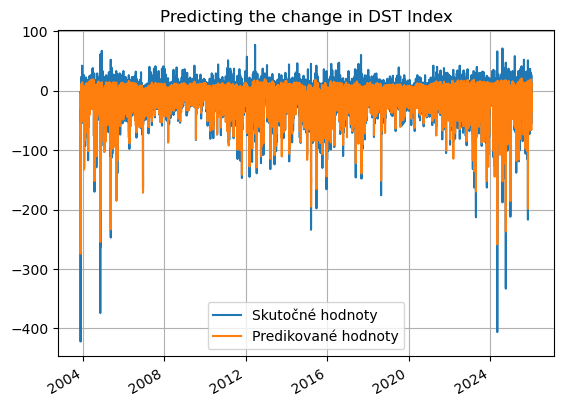

In [17]:
df = pd.DataFrame(data={"time": test['time1'][n_input:],"y_true": y_test_raw[n_input:] , "y_predict": y_pred.reshape(-1)})

df["residuals"] = df["y_true"] - df["y_predict"]
df["true_binary"] = (df["y_true"] <= -20).astype(int)
df["pred_binary"] = (df["y_predict"] <= CLASSIFICATION_THRESHOLD).astype(int)
df["y_persistence"] = df["y_true"].shift(shift)

plt.figure()
plt.title('Predicting the change in DST Index')
plt.plot(df['time'],df['y_true'], label='Skutočné hodnoty')
plt.plot(df['time'],df['y_predict'], label='Predikované hodnoty')
plt.legend()
plt.gcf().autofmt_xdate()
plt.grid(True)

In [18]:
TN, FP, FN, TP = cm.ravel()
ACC = (TP + TN) / (TP + TN + FP + FN)
MCC = matthews_corrcoef(y_test_binary, y_pred_binary_lstm)
print("ACC={}".format(ACC))
print("MCC={}".format(MCC))
df['y_persistance'] = df['y_true'].shift(shift)
df = df.dropna(subset=["y_true", "y_predict", "y_persistance"])

# Získame hodnoty zo stĺpcov
y_true = df["y_true"].values
y_pred_nn = df["y_predict"].values
y_pred_persistence = df["y_persistance"].values

# MAE a MSE pre neurónovú sieť
mae_nn = mean_absolute_error(y_true, y_pred_nn)
mse_nn = mean_squared_error(y_true, y_pred_nn)

# MAE a MSE pre perzistentný model
mae_persistence = mean_absolute_error(y_true, y_pred_persistence)
mse_persistence = mean_squared_error(y_true, y_pred_persistence)

# Porovnanie zlepšenia
improvement_mae = (mae_persistence - mae_nn) / mae_persistence * 100
improvement_mse = (mse_persistence - mse_nn) / mse_persistence * 100

# Výpis
print("Výkon NN:")
print(f"MAE: {mae_nn:.4f}, MSE: {mse_nn:.4f}")

print("Perzistentný model:")
print(f"MAE: {mae_persistence:.4f}, MSE: {mse_persistence:.4f}")

print("Zlepšenie oproti Persistence Modelu:")
print(f"MAE Improvement: {improvement_mae:.2f}%")
print(f"MSE Improvement: {improvement_mse:.2f}%")

ACC=0.8897614682678642
MCC=0.660707795888188
Výkon NN:
MAE: 6.4185, MSE: 104.9809
Perzistentný model:
MAE: 7.2039, MSE: 135.0142
Zlepšenie oproti Persistence Modelu:
MAE Improvement: 10.90%
MSE Improvement: 22.24%


In [19]:
###########################################
# 1. LSTM predikcie (aligned s n_input)
###########################################

y_train_lstm = model.predict(train_generator).reshape(-1)
y_val_lstm   = model.predict(val_generator).reshape(-1)
y_test_lstm  = model.predict(test_generator).reshape(-1)

emb_model = Model(inputs=model.input, outputs=model.layers[-2].output)
emb_train = emb_model.predict(train_generator)
emb_val   = emb_model.predict(val_generator)
emb_test  = emb_model.predict(test_generator)

# aligned y_true (TimeseriesGenerator posúva o n_input)
y_train_true = y_train[n_input:]
y_val_true   = y_val[n_input:]
y_test_true  = y_test[n_input:]

print("Shapes LSTM:")
print("train:", y_train_lstm.shape, y_train_true.shape)
print("val:  ", y_val_lstm.shape,   y_val_true.shape)
print("test: ", y_test_lstm.shape,  y_test_true.shape)


###########################################
# 2. Reziduá (chyba LSTM)
###########################################

error_train = y_train_true - y_train_lstm
error_val   = y_val_true   - y_val_lstm

# globálna smerodajná odchýlka chýb (použijeme ju na "nafúknutie" intervalu)
sigma_global = np.std(np.concatenate([error_train, error_val]))
print("Global sigma (LSTM errors, scaled):", sigma_global)


###########################################
# 3. Vstupy pre GP (tie isté indexy ako reziduá)
###########################################

# embeddingy z predposlednej vrstvy LSTM modelu
X_train_emb = emb_train
X_val_emb   = emb_val
X_test_emb  = emb_test

# Spojenie train+val pre GP
X_gp_train = np.concatenate([X_train_emb, X_val_emb])
y_gp_train = np.concatenate([error_train, error_val])

X_test_gp = X_test_emb

print("Shapes GP:")
print("X_gp_train:", X_gp_train.shape)
print("y_gp_train:", y_gp_train.shape)
print("X_test_gp:", X_test_gp.shape)


###########################################
# 4. Gaussian Process (subsampling kvôli RAM)
###########################################

from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, WhiteKernel, ConstantKernel as C

max_gp_points = 5000
if len(X_gp_train) > max_gp_points:
    rng = np.random.default_rng(42)
    idx = rng.choice(len(X_gp_train), size=max_gp_points, replace=False)
    X_gp_sub = X_gp_train[idx]
    y_gp_sub = y_gp_train[idx]
    print(f"Using subsample of {len(X_gp_sub)} points for GP.")
else:
    X_gp_sub = X_gp_train
    y_gp_sub = y_gp_train
    print("Using all points for GP.")

kernel = C(1.0, (1e-3, 1e3)) * RBF(length_scale=20.0, length_scale_bounds=(1e-1, 1e3)) \
         + WhiteKernel(noise_level=1.0, noise_level_bounds=(1e-5, 1e1))

gp = GaussianProcessRegressor(
    kernel=kernel,
    alpha=1e-2,
    normalize_y=True,
    n_restarts_optimizer=2,
    random_state=42
)

print("Training GP on", len(X_gp_sub), "points...")
gp.fit(X_gp_sub, y_gp_sub)
print("GP fitted. Kernel:", gp.kernel_)


###########################################
# 5. Predikcia GP chyby + hybrid LSTM+GP
###########################################

y_gp_mean_err, y_gp_std_err = gp.predict(X_test_gp, return_std=True)

y_train_lstm = inverse_target(y_train_lstm.reshape(-1))
y_val_lstm   = inverse_target(y_val_lstm.reshape(-1))
y_test_lstm  = inverse_target(y_test_lstm.reshape(-1))

y_train_true = y_train_raw[n_input:]
y_val_true   = y_val_raw[n_input:]
y_test_true  = y_test_raw[n_input:]

y_gp_mean_err = y_gp_mean_err * target_scale
y_gp_std_err = y_gp_std_err * target_scale
sigma_global = sigma_global * target_scale

print("Global sigma (LSTM errors):", sigma_global)

y_hybrid_mean  = y_test_lstm + y_gp_mean_err

times_test = pd.to_datetime(test["time1"].iloc[n_input:])
sigma_series = pd.Series(y_gp_std_err, index=times_test)
sigma_smooth = sigma_series.rolling(window=6, center=True, min_periods=1).mean().values

sigma_effective = np.sqrt(sigma_smooth**2 + sigma_global**2)

#z = 1.96  # 95% interval
z = 3  # 99% interval
y_hybrid_lower = y_hybrid_mean - z * sigma_effective
y_hybrid_upper = y_hybrid_mean + z * sigma_effective

print("Hybrid prediction with smoothed, inflated interval ready.")

  1/896 ━━━━━━━━━━━━━━━━━━━━ 46s 52ms/step

  3/896 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step

  5/896 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step

  8/896 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step

 10/896 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step

 12/896 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step

 14/896 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step

 17/896 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step

 20/896 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step

 23/896 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step

 25/896 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step

 28/896 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step

 30/896 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step

 32/896 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step

 34/896 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step

 37/896 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step

 40/896 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step

 42/896 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step

 45/896 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step

 47/896 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step

 49/896 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step

 52/896 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step

 55/896 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step

 57/896 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step

 59/896 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step

 62/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

 64/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

 66/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

 68/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

 70/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

 73/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

 75/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

 77/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

 80/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

 82/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

 85/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

 87/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

 89/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

 91/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

 93/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

 95/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

 97/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

 99/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

101/896 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step

104/896 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step

106/896 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step

108/896 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step

110/896 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step

113/896 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step

116/896 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step

118/896 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step

120/896 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step

122/896 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step

125/896 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step

127/896 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step

129/896 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step

131/896 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step

133/896 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step

136/896 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step

138/896 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step

140/896 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step

142/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

144/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

146/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

148/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

150/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

153/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

156/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

158/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

160/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

162/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

165/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

167/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

170/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

172/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

174/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

177/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

180/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

183/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

185/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

187/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

190/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

192/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

195/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

198/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

200/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

202/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

205/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

207/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

210/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

212/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

214/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

217/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

219/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

221/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

223/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

226/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

229/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

231/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

234/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

237/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

239/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

242/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

244/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

246/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

249/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

252/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

254/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

257/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

259/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

261/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

263/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

265/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

267/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

269/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

271/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

274/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

276/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

278/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

280/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

282/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

284/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

286/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

288/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

290/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

292/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

294/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

296/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

298/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

300/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

302/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

304/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

306/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

309/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

312/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

314/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

316/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

318/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

320/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

322/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

324/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

326/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

328/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

330/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

332/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

334/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

336/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

338/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

341/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

343/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

345/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

348/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

350/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

353/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

355/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

357/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

359/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

361/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

364/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

366/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

368/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

370/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

372/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

374/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

377/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

379/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

382/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

385/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

387/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

389/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

391/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

393/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

396/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

399/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

401/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

404/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

406/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

409/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

411/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

414/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

416/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

419/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

421/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

424/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

427/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

430/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

433/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

436/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

438/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

440/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

442/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

444/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

447/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

450/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

452/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

454/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

456/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

458/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

461/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

463/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

465/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

467/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

469/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

471/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

473/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

476/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

478/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

480/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

483/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

486/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

488/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

490/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

492/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

494/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

496/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

499/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step 

501/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

503/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

505/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

508/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

510/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

512/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

514/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

516/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

519/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

521/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

523/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

526/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

528/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

530/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

533/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

536/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

538/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

541/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

543/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

545/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

547/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

549/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

551/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

553/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

555/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

558/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

560/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

562/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

564/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

566/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

568/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

570/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

573/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

575/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

577/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

579/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

582/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

584/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

587/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

590/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

593/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

596/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

599/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

601/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

603/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

605/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

607/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

609/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

611/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

613/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

616/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

618/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

620/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

623/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

625/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

627/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

629/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

631/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

633/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

635/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

637/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

639/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

642/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

644/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

646/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

648/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

651/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

654/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

656/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

658/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

660/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

662/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

664/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

667/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

669/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

671/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

673/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

676/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

678/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

681/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

683/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

685/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

688/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

691/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

693/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

696/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

698/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

700/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

702/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

704/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

706/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

709/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

711/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

713/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

715/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

718/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

721/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

724/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

726/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

729/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

732/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

734/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

737/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

740/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

742/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

744/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

746/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

749/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

751/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

753/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

756/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

759/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

761/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

764/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

766/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

769/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

772/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

774/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

776/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

778/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

781/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

784/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

786/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

789/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

791/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

793/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

796/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

798/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

801/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

803/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

805/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

807/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

810/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

813/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

815/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

817/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

819/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

822/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

824/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

826/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

829/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

831/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

834/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

837/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

839/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

841/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

843/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

848/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

850/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

857/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

859/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

862/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

864/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

866/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

868/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

870/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step


  1/224 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

  4/224 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step 

  6/224 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

  8/224 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

 10/224 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

 12/224 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

 14/224 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

 16/224 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

 19/224 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

 21/224 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

 24/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 26/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 29/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 31/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 33/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 36/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 38/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 41/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 43/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 45/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 47/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 49/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 52/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 54/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 57/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 60/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 62/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 64/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 66/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 69/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 72/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 74/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 76/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 78/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 80/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 82/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 84/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 86/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 89/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 91/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 93/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 95/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 97/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 99/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

101/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

103/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

105/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

108/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

111/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

113/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

115/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

117/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

119/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

121/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

124/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

126/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

128/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

130/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

132/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

135/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

137/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

139/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

141/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

143/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

145/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

148/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

151/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

153/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

155/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

157/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

160/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

163/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

166/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

168/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

170/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

172/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

174/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

176/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

178/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

180/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

182/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

184/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

186/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

188/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

190/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

193/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

195/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

198/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

201/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

203/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

205/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

208/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

210/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

212/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

215/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

218/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

220/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

222/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step


  1/759 ━━━━━━━━━━━━━━━━━━━━ 36s 48ms/step

  4/759 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

  6/759 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

  8/759 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

 10/759 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

 12/759 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

 14/759 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

 16/759 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

 18/759 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

 20/759 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

 22/759 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

 25/759 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

 27/759 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

 29/759 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

 32/759 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

 34/759 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

 36/759 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

 39/759 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

 41/759 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

 43/759 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

 46/759 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

 48/759 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

 50/759 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

 52/759 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

 54/759 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

 57/759 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

 59/759 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

 61/759 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

 63/759 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

 66/759 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

 68/759 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

 70/759 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

 72/759 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

 74/759 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

 77/759 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

 80/759 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

 82/759 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

 84/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

 86/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

 88/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

 90/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

 92/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

 94/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

 96/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

 98/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

100/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

102/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

105/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

107/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

109/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

111/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

113/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

115/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

118/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

121/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

123/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

125/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

128/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

130/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

133/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

135/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

137/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

139/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

142/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

145/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

148/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

150/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

153/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

156/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

159/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

162/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

165/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

167/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

169/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

171/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

173/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

175/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

177/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

179/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

181/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

183/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

186/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

189/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

192/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

194/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

196/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

199/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

201/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

203/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

205/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

208/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

210/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

213/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

215/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

218/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

221/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

223/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

226/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

228/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

230/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

233/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

235/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

237/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

239/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

242/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

244/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

246/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

248/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

250/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

252/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

254/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

256/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

259/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

261/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

263/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

265/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

267/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

269/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

271/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

274/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

276/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

279/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

281/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

284/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

286/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

288/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

289/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

291/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

293/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

295/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

297/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

299/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

301/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

303/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

305/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

307/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

309/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

311/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

313/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

315/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

317/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

319/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

321/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

324/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

326/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

328/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

330/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

332/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

334/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

336/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

339/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

341/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

343/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

345/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

347/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

349/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

351/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

353/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

356/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

358/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

360/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

363/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

365/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step 

367/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

369/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

371/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

374/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

376/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

379/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

381/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

383/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

386/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

388/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

391/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

393/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

395/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

397/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

400/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

402/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

405/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

407/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

409/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

412/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

415/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

417/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

419/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

422/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

424/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

426/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

428/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

430/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

432/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

434/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

436/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

438/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

440/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

442/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

444/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

447/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

449/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

451/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

453/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

455/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

457/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

460/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

463/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

465/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

467/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

469/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

471/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

473/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

476/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

478/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

480/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

482/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

484/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

487/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

489/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

492/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

494/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

496/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

498/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

500/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

502/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

504/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

507/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

509/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

511/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

513/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

515/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

517/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

519/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

521/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

523/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

525/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

528/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

531/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

533/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

535/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

537/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

540/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

542/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

544/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

546/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

549/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

552/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

554/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

556/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

558/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

561/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

563/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

565/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

568/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

570/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

572/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

574/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

576/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

578/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

580/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

582/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

584/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

586/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

589/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

592/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

594/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

596/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

599/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

602/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

604/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

606/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

609/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

611/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

613/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

616/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

618/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

620/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

622/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

624/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

626/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

629/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

632/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

634/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

637/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

639/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

641/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

643/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

645/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

647/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

650/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

652/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

655/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

657/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

660/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

662/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

665/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

668/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

671/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

673/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

675/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

678/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

680/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

682/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

685/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

688/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

690/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

692/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

694/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

696/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

699/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

702/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

705/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

708/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

710/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

713/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

715/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

717/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

719/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

722/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

724/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

727/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

730/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

732/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

735/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

738/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

741/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

743/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

745/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

748/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

750/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

752/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

755/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

758/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step


  1/896 ━━━━━━━━━━━━━━━━━━━━ 9:21 628ms/step

  4/896 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step  

  6/896 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step

  8/896 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step

 10/896 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step

 12/896 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step

 14/896 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step

 17/896 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step

 19/896 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step

 21/896 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step

 24/896 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step

 26/896 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step

 29/896 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step

 31/896 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step

 33/896 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step

 36/896 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step

 38/896 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step

 41/896 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step

 43/896 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step

 45/896 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step

 48/896 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step

 50/896 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step

 53/896 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step

 55/896 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step

 58/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

 61/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

 63/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

 65/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

 68/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

 70/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

 72/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

 74/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

 76/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

 78/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

 80/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

 82/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

 84/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

 87/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

 90/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

 93/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

 95/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

 97/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

100/896 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step

102/896 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step

104/896 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step

107/896 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step

110/896 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step

112/896 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step

114/896 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step

117/896 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step

120/896 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step

123/896 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step

125/896 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step

127/896 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step

130/896 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step

132/896 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step

134/896 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step

137/896 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step

139/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

141/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

143/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

145/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

147/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

150/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

153/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

155/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

157/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

159/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

161/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

163/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

165/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

167/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

169/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

172/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

174/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

177/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

179/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

182/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

185/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

187/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

189/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

191/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

193/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

195/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

198/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

200/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

202/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

204/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

206/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

208/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

210/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

213/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

215/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

217/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

219/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

221/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

223/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

225/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

227/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

229/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

231/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

233/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

235/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

237/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

239/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

241/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

243/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

245/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

247/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

249/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

251/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

253/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

255/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

257/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

259/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

262/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

264/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

266/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

269/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

271/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

273/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

275/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

277/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

279/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

281/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

283/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

286/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

288/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

290/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

292/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

295/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

297/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

299/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

301/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

303/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

305/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

307/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

309/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

311/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

314/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

316/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

318/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

320/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

323/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

325/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

327/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

329/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

332/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

335/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

338/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

341/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

343/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

345/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

348/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

350/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

352/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

355/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

357/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

359/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

362/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

364/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

366/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

368/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

370/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

373/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

376/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

379/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

382/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

385/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

387/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

390/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

392/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

395/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

397/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

399/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

401/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

403/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

405/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

407/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

409/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

411/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

414/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

416/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

418/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

420/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

423/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

425/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

427/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

429/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

432/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

435/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

438/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

440/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

443/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

445/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

447/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

450/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

452/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

455/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

457/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

459/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

462/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

464/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

467/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

470/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

473/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

475/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

477/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

480/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

483/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

485/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

488/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

490/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

492/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

494/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

496/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

499/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step 

502/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

504/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

506/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

509/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

512/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

515/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

517/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

520/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

522/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

525/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

527/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

529/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

531/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

533/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

535/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

537/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

539/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

542/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

544/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

547/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

550/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

553/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

555/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

557/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

560/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

563/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

565/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

568/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

570/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

572/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

575/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

577/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

579/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

581/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

584/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

586/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

588/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

590/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

593/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

595/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

597/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

600/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

602/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

604/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

606/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

608/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

610/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

613/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

616/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

619/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

621/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

623/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

625/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

628/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

630/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

633/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

636/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

639/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

641/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

643/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

645/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

648/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

650/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

652/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

654/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

656/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

658/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

661/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

663/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

666/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

669/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

671/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

673/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

676/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

678/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

681/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

683/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

685/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

687/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

690/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

692/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

695/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

697/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

699/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

701/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

704/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

707/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

710/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

712/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

715/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

717/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

719/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

721/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

723/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

726/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

729/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

731/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

734/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

737/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

740/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

743/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

746/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

749/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

751/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

753/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

755/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

758/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

761/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

764/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

766/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

768/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

771/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

773/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

776/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

778/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

781/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

783/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

786/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

788/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

791/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

794/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

796/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

798/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

800/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

802/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

804/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

806/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

808/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

810/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

812/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

815/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

817/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

819/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

821/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

823/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

825/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

827/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

829/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

831/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

834/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

836/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

839/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

842/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

844/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

857/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

859/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

861/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

863/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

866/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

868/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

870/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

872/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

874/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

876/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

878/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

880/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step


  1/224 ━━━━━━━━━━━━━━━━━━━━ 12s 56ms/step

  3/224 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step 

  5/224 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step

  7/224 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step

  9/224 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step

 11/224 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step

 14/224 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step

 16/224 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step

 18/224 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step

 20/224 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step

 22/224 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step

 24/224 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step

 26/224 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step

 28/224 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step

 30/224 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step

 33/224 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step

 36/224 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step

 38/224 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step

 40/224 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step

 42/224 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step

 45/224 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step

 47/224 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step

 49/224 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step

 51/224 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step

 53/224 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step

 56/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 58/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 61/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 64/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 67/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 70/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 72/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 75/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 77/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 79/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 81/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 84/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 86/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 89/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 92/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 95/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 97/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 99/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

102/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

105/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

107/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

110/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

112/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

114/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

116/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

118/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

121/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

124/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

126/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

128/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

130/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

132/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

134/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

136/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

139/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

142/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

145/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

148/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

151/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

154/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

157/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

159/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

161/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

163/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

165/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

168/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

171/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

174/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

177/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

180/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

183/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

186/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

189/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

192/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

195/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

198/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

200/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

203/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

206/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

209/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

211/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

214/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

216/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

219/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

221/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

223/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step


  1/759 ━━━━━━━━━━━━━━━━━━━━ 38s 51ms/step

  4/759 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step

  7/759 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step

 10/759 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step

 13/759 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

 16/759 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

 19/759 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

 21/759 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

 24/759 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

 27/759 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

 29/759 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

 31/759 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

 33/759 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

 36/759 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

 38/759 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

 41/759 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

 43/759 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

 46/759 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

 49/759 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

 52/759 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

 54/759 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

 56/759 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

 58/759 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

 60/759 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

 62/759 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

 64/759 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

 66/759 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

 69/759 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

 71/759 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

 74/759 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

 77/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

 79/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

 82/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

 85/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

 87/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

 89/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

 91/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

 94/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

 97/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

 99/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

102/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

104/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

107/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

109/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

111/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

114/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

117/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

119/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

121/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

124/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

127/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

130/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

133/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

136/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

138/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

140/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

143/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

146/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

148/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

151/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

153/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

155/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

158/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

160/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

162/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

164/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

167/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

169/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

171/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

173/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

176/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

178/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

180/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

183/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

186/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

189/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

192/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

195/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

197/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

200/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

202/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

205/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

208/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

211/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

213/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

215/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

218/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

220/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

222/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

224/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

227/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

230/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

233/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

235/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

237/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

239/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

241/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

244/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

246/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

248/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

251/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

254/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

257/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

259/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

261/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

264/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

267/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

269/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

271/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

273/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

275/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

277/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

280/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

282/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

284/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

286/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

289/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

291/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

293/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

296/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

299/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

301/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

304/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

306/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

309/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

312/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

314/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

316/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

318/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

320/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

322/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

325/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

328/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

330/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

332/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

334/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

336/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

339/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

341/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

343/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

345/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

347/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

349/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

351/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

353/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

356/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

358/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

361/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step 

364/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

367/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

369/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

371/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

373/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

376/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

378/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

380/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

382/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

385/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

387/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

390/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

393/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

396/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

399/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

402/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

404/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

406/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

408/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

410/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

412/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

414/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

416/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

418/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

420/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

422/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

425/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

428/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

431/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

434/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

436/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

439/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

442/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

445/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

447/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

450/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

452/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

454/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

456/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

459/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

461/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

463/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

466/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

469/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

472/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

475/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

477/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

479/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

482/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

485/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

487/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

489/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

491/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

493/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

495/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

498/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

500/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

502/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

505/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

508/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

511/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

513/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

515/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

518/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

520/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

523/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

526/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

529/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

531/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

534/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

536/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

538/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

540/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

542/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

544/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

546/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

548/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

550/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

553/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

555/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

557/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

559/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

561/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

564/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

566/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

568/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

571/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

573/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

576/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

578/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

581/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

583/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

585/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

587/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

589/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

591/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

594/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

597/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

599/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

601/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

604/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

606/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

608/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

610/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

612/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

615/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

617/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

620/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

623/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

625/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

628/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

630/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

632/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

635/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

638/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

640/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

643/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

646/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

649/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

651/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

653/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

656/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

658/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

660/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

663/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

665/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

667/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

669/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

671/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

674/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

677/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

679/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

682/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

684/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

687/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

690/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

693/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

695/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

697/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

699/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

701/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

704/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

706/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

708/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

710/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

712/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

715/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

717/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

720/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

722/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

725/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

727/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

730/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

732/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

735/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

738/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

740/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

742/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

744/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

747/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

750/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

752/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

754/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

757/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step


Shapes LSTM:
train: (229344,) (229344,)
val:   (57327,) (57327,)
test:  (194188,) (194188,)
Global sigma (LSTM errors, scaled): 0.55711114
Shapes GP:
X_gp_train: (286671, 12)
y_gp_train: (286671,)
X_test_gp: (194188, 12)
Using subsample of 5000 points for GP.
Training GP on 5000 points...


GP fitted. Kernel: 1.34**2 * RBF(length_scale=0.244) + WhiteKernel(noise_level=0.615)


Global sigma (LSTM errors): 12.25863
Hybrid prediction with smoothed, inflated interval ready.


In [20]:
len(y_hybrid_upper)

194188

In [21]:
len(y_pred_persistence)

194177

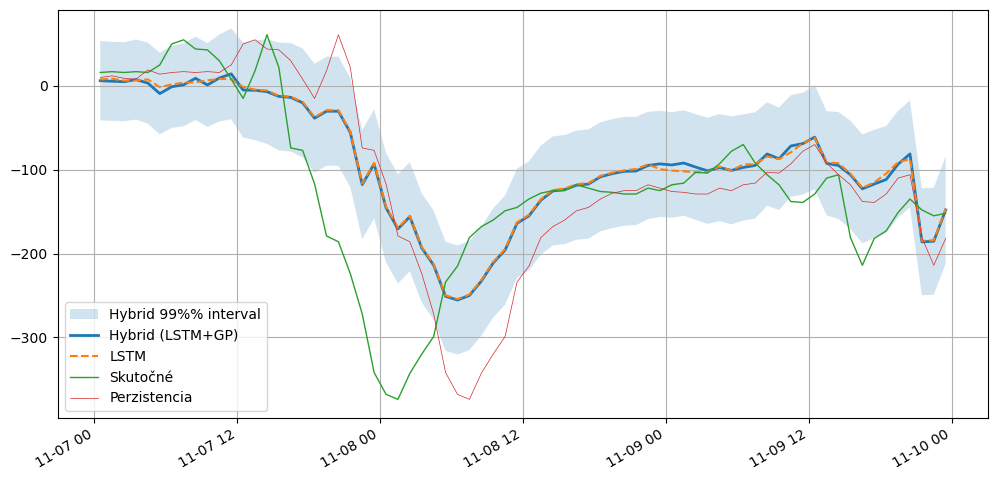

In [22]:
time_aligned = test["time1"][n_input:][shift:]

cols = [
    y_test_true[shift:],
    y_test_lstm[shift:],
    y_gp_mean_err[shift:],
    y_hybrid_mean[shift:],
    y_hybrid_lower[shift:],
    y_hybrid_upper[shift:],
    y_pred_persistence,
    time_aligned
]

L = min(len(x) for x in cols)

df = pd.DataFrame({
    "time": time_aligned[:L],
    "y_true": y_test_true[shift:][:L],
    "y_lstm": y_test_lstm[shift:][:L],
    "y_gp_error": y_gp_mean_err[shift:][:L],
    "y_hybrid": y_hybrid_mean[shift:][:L],
    "hybrid_lower": y_hybrid_lower[shift:][:L],
    "hybrid_upper": y_hybrid_upper[shift:][:L],
    "y_pred_persistence": y_pred_persistence[:L],
})



start_date = "2004-11-07"
end_date   = "2004-11-10"

df_range = df[(df["time"] >= start_date) & (df["time"] <= end_date)]

plt.figure(figsize=(12,6))
plt.fill_between(df_range["time"], df_range["hybrid_lower"], df_range["hybrid_upper"],
                 alpha=0.2, label="Hybrid 99%% interval")
plt.plot(df_range["time"], df_range["y_hybrid"], label="Hybrid (LSTM+GP)", linewidth=2)
plt.plot(df_range["time"], df_range["y_lstm"], label="LSTM", linestyle="--")
plt.plot(df_range["time"], df_range["y_true"], label="Skutočné", linewidth=1)
plt.plot(df_range["time"], df_range["y_pred_persistence"], label="Perzistencia", linewidth=0.5 )
plt.legend()
plt.grid(True)
plt.gcf().autofmt_xdate()
plt.show()
os.makedirs("datasets", exist_ok=True)
df.to_csv(os.path.join("datasets", f"prediction_comparison_{y_col}_LSTM_{n_input}H.csv"), index=False)

In [23]:
from sklearn.metrics import mean_absolute_error

# --- REGRESNÉ METRIKY ---
y_true_hybrid = df['y_true']
y_pred_hybrid = df['y_hybrid']

mse = mean_squared_error(y_true_hybrid, y_pred_hybrid)
mae = mean_absolute_error(y_true_hybrid, y_pred_hybrid)

# --- KLASIFIKAČNÉ METRIKY ---
CLASSIFICATION_THRESHOLD_PRED = CLASSIFICATION_THRESHOLD
y_true_binary = np.where(y_true_hybrid <= -20, 1, 0)
y_pred_binary = np.where(y_pred_hybrid <= CLASSIFICATION_THRESHOLD_PRED, 1, 0)

conf_matrix = confusion_matrix(y_true_binary, y_pred_binary)
mcc = matthews_corrcoef(y_true_binary, y_pred_binary)

# --- VÝSTUP ---
print("--- Regresné metriky (Hybridný model) ---")
print(f"MSE: {mse:.4f}")
print(f"MAE: {mae:.4f}")

print(f"\n--- Klasifikačné metriky (Prah: {CLASSIFICATION_THRESHOLD_PRED} nT) ---")
print(f"Matthews Correlation Coefficient (MCC): {mcc:.4f}")

print("\nKonfúzna matica (Confusion Matrix):")
print("          | Predikcia 0 | Predikcia 1")
print("---------------------------------")
print(f"Skutočná 0 | {conf_matrix[0, 0]:>11} | {conf_matrix[0, 1]:>11}")
print(f"Skutočná 1 | {conf_matrix[1, 0]:>11} | {conf_matrix[1, 1]:>11}")

print("\nClassification Report (Trieda 1 je Búrka):")
print(classification_report(y_true_binary, y_pred_binary, target_names=['Trieda 0 (Normálna)', 'Trieda 1 (Búrka)']))

--- Regresné metriky (Hybridný model) ---
MSE: 112.7509
MAE: 6.7855

--- Klasifikačné metriky (Prah: -19.3 nT) ---
Matthews Correlation Coefficient (MCC): 0.6463

Konfúzna matica (Confusion Matrix):
          | Predikcia 0 | Predikcia 1
---------------------------------
Skutočná 0 |      142384 |        9662
Skutočná 1 |       13052 |       29079

Classification Report (Trieda 1 je Búrka):
                     precision    recall  f1-score   support

Trieda 0 (Normálna)       0.92      0.94      0.93    152046
   Trieda 1 (Búrka)       0.75      0.69      0.72     42131

           accuracy                           0.88    194177
          macro avg       0.83      0.81      0.82    194177
       weighted avg       0.88      0.88      0.88    194177



In [24]:
import os, json
import numpy as np
import os
import pandas as pd
from datetime import datetime
from sklearn.metrics import (
    mean_absolute_error, mean_squared_error,
    accuracy_score, matthews_corrcoef, classification_report
)

OUT_CSV = "all_models_report.csv"

TRUE_CLASS_THRESHOLD = -20.0

PRED_CLASS_THRESHOLD = float(CLASSIFICATION_THRESHOLD)

meta = {
    "input_len_hours": float(globals().get("n_input", np.nan)),
    "forecast_horizon_hours": float(globals().get("shift", np.nan)),
    "target": str(globals().get("y_col", "DST")),
    "dataset": str(globals().get("dataset_name", "OMNI2_all")),
}

def _reg_metrics(y_true, y_pred):
    y_true = np.asarray(y_true).reshape(-1)
    y_pred = np.asarray(y_pred).reshape(-1)
    m = np.isfinite(y_true) & np.isfinite(y_pred)
    return (
        float(mean_absolute_error(y_true[m], y_pred[m])),
        float(mean_squared_error(y_true[m], y_pred[m]))
    )

def _cls_metrics_from_dst(y_true_dst, y_pred_dst, true_thr, pred_thr):
    y_true_dst = np.asarray(y_true_dst).reshape(-1)
    y_pred_dst = np.asarray(y_pred_dst).reshape(-1)
    m = np.isfinite(y_true_dst) & np.isfinite(y_pred_dst)

    y_true_bin = (y_true_dst[m] <= true_thr).astype(int)
    y_pred_bin = (y_pred_dst[m] <= pred_thr).astype(int)

    acc = float(accuracy_score(y_true_bin, y_pred_bin))
    mcc = float(matthews_corrcoef(y_true_bin, y_pred_bin))
    rep = classification_report(y_true_bin, y_pred_bin, digits=4, zero_division=0)
    return acc, mcc, rep

def _improvement(model_err, base_err):
    return float(100.0 * (base_err - model_err) / base_err) if base_err != 0 else np.nan

def _append_row(csv_path, row):
    row_df = pd.DataFrame([row])
    if os.path.exists(csv_path):
        old = pd.read_csv(csv_path)
        out = pd.concat([old, row_df], ignore_index=True)
    else:
        out = row_df
    out.to_csv(csv_path, index=False)
    return out

required_cols = {"y_true", "y_lstm", "y_hybrid", "y_pred_persistence"}
missing = required_cols - set(df.columns)
if missing:
    raise ValueError(f"df nemá potrebné stĺpce: {missing}. Aktuálne: {list(df.columns)}")

df_eval = df.dropna(subset=list(required_cols)).copy()

def log_one_model(nn_type, y_pred_col):
    y_true = df_eval["y_true"].to_numpy(dtype=float)
    y_pred = df_eval[y_pred_col].to_numpy(dtype=float)
    y_pers = df_eval["y_pred_persistence"].to_numpy(dtype=float)

    mae_model, mse_model = _reg_metrics(y_true, y_pred)
    mae_pers,  mse_pers  = _reg_metrics(y_true, y_pers)

    mae_imp = _improvement(mae_model, mae_pers)
    mse_imp = _improvement(mse_model, mse_pers)

    acc, mcc, rep_txt = _cls_metrics_from_dst(
        y_true, y_pred,
        true_thr=TRUE_CLASS_THRESHOLD,
        pred_thr=PRED_CLASS_THRESHOLD
    )

    row = {
        "timestamp_utc": datetime.utcnow().isoformat(timespec="seconds"),
        "nn_type": nn_type,  # LSTM vs LSTM+GP

        # meta
        **meta,

        # prahy
        "true_class_threshold_nt": float(TRUE_CLASS_THRESHOLD),
        "pred_class_threshold_nt": float(PRED_CLASS_THRESHOLD),

        # klasifikácia
        "ACC": float(acc),
        "MCC": float(mcc),
        "classification_report": json.dumps({"text": rep_txt}, ensure_ascii=False),

        # regresia
        "MAE_model": float(mae_model),
        "MSE_model": float(mse_model),
        "MAE_persistence": float(mae_pers),
        "MSE_persistence": float(mse_pers),
        "MAE_improvement_pct": float(mae_imp),
        "MSE_improvement_pct": float(mse_imp),
    }

    print(f"\n===== {nn_type} =====")
    print(f"ACC={row['ACC']}")
    print(f"MCC={row['MCC']}")
    print("Výkon NN:")
    print(f"MAE: {row['MAE_model']:.4f}, MSE: {row['MSE_model']:.4f}")
    print("Perzistentný model:")
    print(f"MAE: {row['MAE_persistence']:.4f}, MSE: {row['MSE_persistence']:.4f}")
    print("Zlepšenie oproti Persistence Modelu:")
    print(f"MAE Improvement: {row['MAE_improvement_pct']:.2f}%")
    print(f"MSE Improvement: {row['MSE_improvement_pct']:.2f}%")
    print("\nKlasifikačný report:")
    print(rep_txt)

    return row

rows = [
    log_one_model("LSTM", "y_lstm"),
    log_one_model("LSTM+GP", "y_hybrid"),
]

out_df = None
for r in rows:
    out_df = _append_row(OUT_CSV, r)

print(f"\nSaved/updated: {OUT_CSV}")
out_df.tail(10)


===== LSTM =====
ACC=0.8897552233271706
MCC=0.6607030158443774
Výkon NN:
MAE: 6.4185, MSE: 104.9809
Perzistentný model:
MAE: 7.2039, MSE: 135.0142
Zlepšenie oproti Persistence Modelu:
MAE Improvement: 10.90%
MSE Improvement: 22.24%

Klasifikačný report:
              precision    recall  f1-score   support

           0     0.9129    0.9498    0.9310    152046
           1     0.7879    0.6731    0.7260     42131

    accuracy                         0.8898    194177
   macro avg     0.8504    0.8114    0.8285    194177
weighted avg     0.8858    0.8898    0.8865    194177


===== LSTM+GP =====
ACC=0.8830242510699001
MCC=0.6463349146351752
Výkon NN:
MAE: 6.7855, MSE: 112.7509
Perzistentný model:
MAE: 7.2039, MSE: 135.0142
Zlepšenie oproti Persistence Modelu:
MAE Improvement: 5.81%
MSE Improvement: 16.49%

Klasifikačný report:
              precision    recall  f1-score   support

           0     0.9160    0.9365    0.9261    152046
           1     0.7506    0.6902    0.7191     4213

/tmp/ipykernel_517200/3102912212.py:84: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  "timestamp_utc": datetime.utcnow().isoformat(timespec="seconds"),
/tmp/ipykernel_517200/3102912212.py:84: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  "timestamp_utc": datetime.utcnow().isoformat(timespec="seconds"),


,timestamp_utc,nn_type,input_len_hours,forecast_horizon_hours,target,dataset,true_class_threshold_nt,pred_class_threshold_nt,ACC,MCC,classification_report,MAE_model,MSE_model,MAE_persistence,MSE_persistence,MAE_improvement_pct,MSE_improvement_pct
32,2026-04-26T12:21:53,LSTM,12.0,5.0,DST+5,OMNI2_all,-20.0,-20.6,0.897085,0.680725,"{""text"": "" precision recall f...",6.063022,90.438223,6.683663,114.020481,9.285948,20.682476
33,2026-04-26T12:21:53,LSTM+GP,12.0,5.0,DST+5,OMNI2_all,-20.0,-20.6,0.891698,0.665676,"{""text"": "" precision recall f...",6.399577,99.212478,6.683663,114.020481,4.250449,12.987144
34,2026-04-26T17:06:16,LSTM,24.0,5.0,DST+5,OMNI2_all,-20.0,-20.1,0.899468,0.688933,"{""text"": "" precision recall f...",5.883436,88.529493,6.683360,114.014029,11.968899,22.352106
35,2026-04-26T17:06:16,LSTM+GP,24.0,5.0,DST+5,OMNI2_all,-20.0,-20.1,0.893519,0.674173,"{""text"": "" precision recall f...",6.215692,95.176063,6.683360,114.014029,6.997503,16.522499
36,2026-04-26T17:07:26,LSTM,18.0,5.0,DST+5,OMNI2_all,-20.0,-20.2,0.898312,0.684991,"{""text"": "" precision recall f...",6.024730,90.295567,6.683684,114.022078,9.859149,20.808699
37,2026-04-26T17:07:26,LSTM+GP,18.0,5.0,DST+5,OMNI2_all,-20.0,-20.2,0.888883,0.661184,"{""text"": "" precision recall f...",6.390627,98.723513,6.683684,114.022078,4.384663,13.417196
38,2026-04-26T17:39:33,LSTM,6.0,5.0,DST+5,OMNI2_all,-20.0,-20.1,0.895512,0.679439,"{""text"": "" precision recall f...",6.084345,91.104486,6.683642,114.018863,8.966626,20.097006
39,2026-04-26T17:39:33,LSTM+GP,6.0,5.0,DST+5,OMNI2_all,-20.0,-20.1,0.890898,0.664932,"{""text"": "" precision recall f...",6.350304,99.041467,6.683642,114.018863,4.987373,13.135894
40,2026-04-26T18:23:27,LSTM,12.0,6.0,DST+6,OMNI2_all,-20.0,-19.3,0.889755,0.660703,"{""text"": "" precision recall f...",6.418466,104.980910,7.203881,135.014157,10.902659,22.244517
41,2026-04-26T18:23:27,LSTM+GP,12.0,6.0,DST+6,OMNI2_all,-20.0,-19.3,0.883024,0.646335,"{""text"": "" precision recall f...",6.785546,112.750949,7.203881,135.014157,5.807076,16.489536
